In [1]:
import os
import random
import _pickle as pickle
import numpy as np
import matplotlib.pyplot
from matplotlib.pyplot import imshow
import keras
from tensorflow.keras import utils as image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model
from sklearn.decomposition import PCA
from scipy.spatial import distance
from tqdm import tqdm

In [17]:
# pip install falconn
# import falconn

ModuleNotFoundError: No module named 'falconn'

In [2]:
# Call the base imagenet model with VGG16
model = keras.applications.VGG16(weights='imagenet', include_top=True)
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [3]:
# get_image will return a handle to the image itself, and a numpy array of its pixels to input the network
def get_image(path):
    img = image.load_img(path, target_size=model.input_shape[1:3])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x

### Test out a sample predicted image

1/1 [==============================] - 2s 2s/step
predicted cheeseburger with probability 0.835
predicted bagel with probability 0.124
predicted meat_loaf with probability 0.014
predicted plate with probability 0.008
predicted bakery with probability 0.006


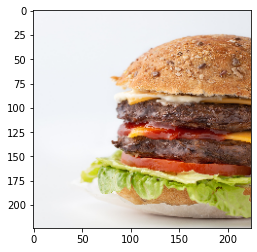

In [4]:
img, x = get_image("C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\data\\food_image_test\\burger\\burger-1.jpg")
predictions = model.predict(x)
imshow(img)
for pred in decode_predictions(predictions)[0]:
    print("predicted %s with probability %0.3f" % (pred[1], pred[2]))

## Doing this with last-to-second layer

In [5]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)
feat_extractor.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

1/1 [==============================] - 0s 99ms/step


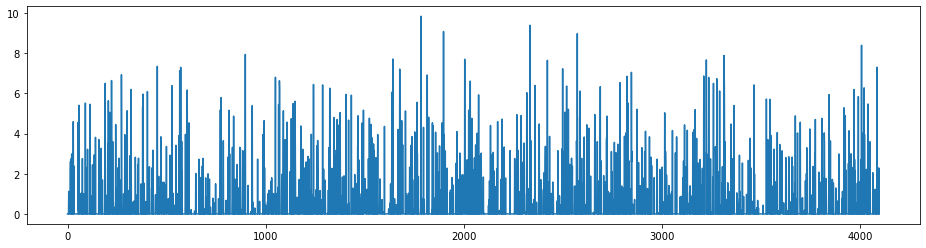

In [6]:
img, x = get_image("C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\data\\food_image_test\\burger\\burger-1.jpg")
feat = feat_extractor.predict(x)

matplotlib.pyplot.figure(figsize=(16,4))
matplotlib.pyplot.plot(feat[0])
matplotlib.pyplot.show()

In [7]:
images_path = 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\data\\images\\'
max_num_images = 100000

images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(images_path) for f in filenames if os.path.splitext(f)[1].lower() in ['.jpg','.png','.jpeg']]
if max_num_images < len(images):
    images = [images[i] for i in sorted(random.sample(range(len(images)), max_num_images))]

print("keeping %d images to analyze" % len(images))

keeping 85880 images to analyze


In [117]:
images[:10]

['C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1000132.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1000733.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1000798.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1001600.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1004835.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1011647.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1012274.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1012507.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1012540.jpg',
 'C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\images\\roasted_chicken\\1013408.jpg']

In [218]:
len(images)

85880

## Creating features off of the trainining images with their corresponding topics

### Train test split

In [8]:
percent_split = 0.10

In [9]:
import numpy as np
from sklearn.model_selection import train_test_split
images_train_percent, images_test_percent =  train_test_split(images, test_size =percent_split, shuffle  = True)

## DO NOT RUN BELOW YOU WILL BREAK YOUR LAPTOP, read the pickle instead

In [11]:
features = []
count = 1
for image_path in tqdm(images_train_percent):
    print (count, end= '')
    img, x = get_image(image_path);
    feat = feat_extractor.predict(x)[0]
    features.append(feat)
    count += 1

  0%|          | 0/77292 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/77292 [00:00<3:32:12,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 3/77292 [00:00<1:46:06, 12.14it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 6/77292 [00:00<1:17:12, 16.68it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 9/77292 [00:00<1:08:32, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 12/77292 [00:00<1:04:45, 19.89it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 15/77292 [00:00<1:03:24, 20.31it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 18/77292 [00:00<1:02:12, 20.70it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 21/77292 [00:01<1:01:31, 20.93it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 24/77292 [00:01<1:01:17, 21.01it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 27/77292 [00:01<1:00:42, 21.21it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 30/77292 [00:01<1:00:15, 21.37it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 33/77292 [00:01<1:00:11, 21.39it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 36/77292 [00:01<1:00:34, 21.25it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 39/77292 [00:01<1:00:10, 21.40it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 42/77292 [00:02<1:00:08, 21.41it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 45/77292 [00:02<1:00:19, 21.34it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 48/77292 [00:02<1:00:11, 21.39it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 51/77292 [00:02<1:00:05, 21.42it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 54/77292 [00:02<59:39, 21.58it/s]  

1/1 [==============================] - 0s 13ms/step


  0%|          | 57/77292 [00:02<59:55, 21.48it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 60/77292 [00:02<1:00:11, 21.39it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 63/77292 [00:03<1:00:05, 21.42it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 66/77292 [00:03<59:53, 21.49it/s]  

1/1 [==============================] - 0s 14ms/step


  0%|          | 69/77292 [00:03<59:39, 21.57it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 72/77292 [00:03<59:59, 21.45it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 75/77292 [00:03<59:42, 21.55it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 78/77292 [00:03<59:38, 21.58it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 81/77292 [00:03<59:32, 21.61it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 84/77292 [00:04<1:00:15, 21.35it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 87/77292 [00:04<59:44, 21.54it/s]  

1/1 [==============================] - 0s 13ms/step


  0%|          | 90/77292 [00:04<59:13, 21.73it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 93/77292 [00:04<59:48, 21.52it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 96/77292 [00:04<59:57, 21.46it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 99/77292 [00:04<59:24, 21.65it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 102/77292 [00:04<59:35, 21.59it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 105/77292 [00:05<59:25, 21.65it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 108/77292 [00:05<59:32, 21.60it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 111/77292 [00:05<1:00:16, 21.34it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 114/77292 [00:05<59:50, 21.50it/s]  

1/1 [==============================] - 0s 15ms/step


  0%|          | 117/77292 [00:05<59:54, 21.47it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 120/77292 [00:05<1:00:01, 21.43it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 123/77292 [00:05<1:02:01, 20.74it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 126/77292 [00:06<1:02:08, 20.70it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 129/77292 [00:06<1:01:50, 20.79it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 132/77292 [00:06<1:01:55, 20.77it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 135/77292 [00:06<1:02:04, 20.72it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 138/77292 [00:06<1:01:32, 20.90it/s]

1/1 [==============================] - 0s 12ms/step


  0%|          | 141/77292 [00:06<1:01:58, 20.75it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 144/77292 [00:06<1:02:08, 20.69it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 147/77292 [00:07<1:00:48, 21.14it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 150/77292 [00:07<1:00:30, 21.25it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 153/77292 [00:07<1:00:33, 21.23it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 156/77292 [00:07<59:57, 21.44it/s]  

1/1 [==============================] - 0s 14ms/step


  0%|          | 159/77292 [00:07<59:42, 21.53it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 162/77292 [00:07<59:08, 21.74it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 165/77292 [00:07<59:29, 21.61it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 168/77292 [00:07<59:17, 21.68it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 171/77292 [00:08<59:50, 21.48it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 174/77292 [00:08<59:45, 21.51it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 177/77292 [00:08<59:31, 21.59it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 180/77292 [00:08<59:52, 21.46it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 183/77292 [00:08<59:29, 21.60it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 186/77292 [00:08<59:29, 21.60it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 189/77292 [00:09<1:19:34, 16.15it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 192/77292 [00:09<1:13:15, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 195/77292 [00:09<1:09:09, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 198/77292 [00:09<1:05:59, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 201/77292 [00:09<1:04:21, 19.96it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 204/77292 [00:09<1:03:27, 20.24it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 207/77292 [00:09<1:02:14, 20.64it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 210/77292 [00:10<1:01:37, 20.85it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 213/77292 [00:10<1:01:04, 21.03it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 216/77292 [00:10<1:00:07, 21.37it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 219/77292 [00:10<1:00:31, 21.22it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 222/77292 [00:10<1:00:07, 21.36it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 225/77292 [00:10<59:53, 21.44it/s]  

1/1 [==============================] - 0s 13ms/step


  0%|          | 228/77292 [00:10<1:00:11, 21.34it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 231/77292 [00:11<59:48, 21.47it/s]  

1/1 [==============================] - 0s 13ms/step


  0%|          | 234/77292 [00:11<59:32, 21.57it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 237/77292 [00:11<59:48, 21.47it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 240/77292 [00:11<59:16, 21.66it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 243/77292 [00:11<59:17, 21.66it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 246/77292 [00:11<1:00:15, 21.31it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 249/77292 [00:11<59:50, 21.45it/s]  

1/1 [==============================] - 0s 13ms/step


  0%|          | 252/77292 [00:12<59:18, 21.65it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 255/77292 [00:12<58:45, 21.85it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 258/77292 [00:12<58:51, 21.81it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 261/77292 [00:12<59:15, 21.67it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 264/77292 [00:12<59:25, 21.60it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 267/77292 [00:12<59:31, 21.57it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 270/77292 [00:12<59:35, 21.54it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 273/77292 [00:13<59:45, 21.48it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 276/77292 [00:13<1:00:00, 21.39it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 279/77292 [00:13<59:40, 21.51it/s]  

1/1 [==============================] - 0s 14ms/step


  0%|          | 282/77292 [00:13<59:43, 21.49it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 285/77292 [00:13<1:00:32, 21.20it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 288/77292 [00:13<1:00:56, 21.06it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 291/77292 [00:13<1:01:35, 20.84it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 294/77292 [00:14<1:02:26, 20.55it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 297/77292 [00:14<1:03:43, 20.14it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 300/77292 [00:14<1:03:56, 20.07it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 303/77292 [00:14<1:04:04, 20.03it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 306/77292 [00:14<1:04:41, 19.84it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 308/77292 [00:14<1:04:57, 19.75it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 310/77292 [00:14<1:05:20, 19.64it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 312/77292 [00:14<1:05:48, 19.50it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 314/77292 [00:15<1:06:30, 19.29it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 316/77292 [00:15<1:06:05, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 318/77292 [00:15<1:05:58, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 321/77292 [00:15<1:04:18, 19.95it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 324/77292 [00:15<1:03:41, 20.14it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 327/77292 [00:15<1:03:33, 20.18it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 330/77292 [00:15<1:02:52, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 333/77292 [00:15<1:02:16, 20.60it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 336/77292 [00:16<1:02:37, 20.48it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 339/77292 [00:16<1:02:51, 20.41it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 342/77292 [00:16<1:02:39, 20.47it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 345/77292 [00:16<1:02:15, 20.60it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 348/77292 [00:16<1:01:36, 20.81it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 351/77292 [00:16<1:01:49, 20.74it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 354/77292 [00:16<1:02:08, 20.64it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 357/77292 [00:17<1:01:54, 20.71it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 360/77292 [00:17<1:02:23, 20.55it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 363/77292 [00:17<1:02:51, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 366/77292 [00:17<1:03:03, 20.33it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 369/77292 [00:17<1:03:39, 20.14it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 372/77292 [00:17<1:04:02, 20.02it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 375/77292 [00:18<1:03:08, 20.30it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 378/77292 [00:18<1:02:52, 20.39it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 381/77292 [00:18<1:02:33, 20.49it/s]

1/1 [==============================] - 0s 13ms/step


  0%|          | 384/77292 [00:18<1:03:08, 20.30it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 387/77292 [00:18<1:03:07, 20.30it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 390/77292 [00:18<1:02:40, 20.45it/s]

1/1 [==============================] - 0s 12ms/step


  1%|          | 393/77292 [00:18<1:02:53, 20.38it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 396/77292 [00:19<1:02:25, 20.53it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 399/77292 [00:19<1:02:40, 20.45it/s]

1/1 [==============================] - 0s 12ms/step


  1%|          | 402/77292 [00:19<1:03:26, 20.20it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 405/77292 [00:19<1:03:16, 20.25it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 408/77292 [00:19<1:03:04, 20.32it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 411/77292 [00:19<1:03:08, 20.29it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 414/77292 [00:19<1:02:38, 20.45it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 417/77292 [00:20<1:03:01, 20.33it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 420/77292 [00:20<1:03:24, 20.20it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 423/77292 [00:20<1:03:11, 20.27it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 426/77292 [00:20<1:01:52, 20.70it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 429/77292 [00:20<1:02:20, 20.55it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 432/77292 [00:20<1:03:03, 20.31it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 435/77292 [00:20<1:02:26, 20.51it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 438/77292 [00:21<1:01:57, 20.67it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 441/77292 [00:21<1:02:30, 20.49it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 444/77292 [00:21<1:02:36, 20.46it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 447/77292 [00:21<1:02:15, 20.57it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 450/77292 [00:21<1:02:57, 20.34it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 453/77292 [00:21<1:02:50, 20.38it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 456/77292 [00:22<1:02:45, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 459/77292 [00:22<1:02:35, 20.46it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 462/77292 [00:22<1:02:21, 20.54it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 465/77292 [00:22<1:01:58, 20.66it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 468/77292 [00:22<1:01:53, 20.69it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 471/77292 [00:22<1:01:46, 20.73it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 474/77292 [00:22<1:01:45, 20.73it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 477/77292 [00:23<1:01:21, 20.87it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 480/77292 [00:23<1:01:12, 20.92it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 483/77292 [00:23<1:01:58, 20.66it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 486/77292 [00:23<1:02:02, 20.64it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 489/77292 [00:23<1:02:03, 20.62it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 492/77292 [00:23<1:02:12, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 495/77292 [00:23<1:01:45, 20.73it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 498/77292 [00:24<1:02:13, 20.57it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 501/77292 [00:24<1:01:50, 20.70it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 504/77292 [00:24<1:01:40, 20.75it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 507/77292 [00:24<1:02:15, 20.56it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 510/77292 [00:24<1:02:35, 20.44it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 513/77292 [00:24<1:02:28, 20.48it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 516/77292 [00:24<1:02:23, 20.51it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 519/77292 [00:25<1:02:17, 20.54it/s]

1/1 [==============================] - 0s 12ms/step


  1%|          | 522/77292 [00:25<1:01:58, 20.64it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 525/77292 [00:25<1:02:01, 20.63it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 528/77292 [00:25<1:02:21, 20.52it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 531/77292 [00:25<1:02:09, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 534/77292 [00:25<1:01:52, 20.67it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 537/77292 [00:25<1:02:34, 20.44it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 540/77292 [00:26<1:01:44, 20.72it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 543/77292 [00:26<1:01:43, 20.72it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 546/77292 [00:26<1:02:25, 20.49it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 549/77292 [00:26<1:02:42, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 552/77292 [00:26<1:02:32, 20.45it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 555/77292 [00:26<1:02:15, 20.54it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 558/77292 [00:26<1:02:04, 20.60it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 561/77292 [00:27<1:02:07, 20.59it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 564/77292 [00:27<1:01:58, 20.63it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 567/77292 [00:27<1:02:00, 20.62it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 570/77292 [00:27<1:02:24, 20.49it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 573/77292 [00:27<1:02:02, 20.61it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 576/77292 [00:27<1:02:14, 20.54it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 579/77292 [00:27<1:02:16, 20.53it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 582/77292 [00:28<1:02:22, 20.50it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 585/77292 [00:28<1:02:40, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 588/77292 [00:28<1:02:16, 20.53it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 591/77292 [00:28<1:01:49, 20.68it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 594/77292 [00:28<1:02:04, 20.59it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 597/77292 [00:28<1:02:13, 20.54it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 600/77292 [00:28<1:02:19, 20.51it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 603/77292 [00:29<1:02:06, 20.58it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 606/77292 [00:29<1:02:25, 20.48it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 609/77292 [00:29<1:02:06, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 612/77292 [00:29<1:01:34, 20.76it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 615/77292 [00:29<1:02:20, 20.50it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 618/77292 [00:29<1:02:49, 20.34it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 621/77292 [00:30<1:03:13, 20.21it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 624/77292 [00:30<1:04:23, 19.85it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 626/77292 [00:30<1:04:22, 19.85it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 628/77292 [00:30<1:05:24, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 630/77292 [00:30<1:05:01, 19.65it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 632/77292 [00:30<1:05:13, 19.59it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 634/77292 [00:30<1:05:43, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 637/77292 [00:30<1:04:23, 19.84it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 640/77292 [00:30<1:04:00, 19.96it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 642/77292 [00:31<1:04:14, 19.88it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 644/77292 [00:31<1:05:36, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 646/77292 [00:31<1:05:25, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 648/77292 [00:31<1:05:07, 19.62it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 651/77292 [00:31<1:03:47, 20.02it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 653/77292 [00:31<1:03:50, 20.01it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 656/77292 [00:31<1:03:28, 20.12it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 659/77292 [00:31<1:02:39, 20.38it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 662/77292 [00:32<1:03:25, 20.14it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 665/77292 [00:32<1:02:38, 20.39it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 668/77292 [00:32<1:01:42, 20.69it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 671/77292 [00:32<1:01:34, 20.74it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 674/77292 [00:32<1:01:45, 20.67it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 677/77292 [00:32<1:01:57, 20.61it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 680/77292 [00:32<1:01:42, 20.69it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 683/77292 [00:33<1:02:07, 20.55it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 686/77292 [00:33<1:01:49, 20.65it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 689/77292 [00:33<1:02:02, 20.58it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 692/77292 [00:33<1:02:24, 20.46it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 695/77292 [00:33<1:02:14, 20.51it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 698/77292 [00:33<1:02:03, 20.57it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 701/77292 [00:33<1:02:39, 20.37it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 704/77292 [00:34<1:02:08, 20.54it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 707/77292 [00:34<1:01:34, 20.73it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 710/77292 [00:34<1:02:11, 20.52it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 713/77292 [00:34<1:02:14, 20.50it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 716/77292 [00:34<1:02:01, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 719/77292 [00:34<1:01:59, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 722/77292 [00:35<1:01:51, 20.63it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 725/77292 [00:35<1:01:01, 20.91it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 728/77292 [00:35<1:01:29, 20.75it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 731/77292 [00:35<1:01:59, 20.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 734/77292 [00:35<1:02:33, 20.40it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 737/77292 [00:35<1:02:14, 20.50it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 740/77292 [00:35<1:02:12, 20.51it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 743/77292 [00:36<1:01:45, 20.66it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 746/77292 [00:36<1:01:38, 20.70it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 749/77292 [00:36<1:03:22, 20.13it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 752/77292 [00:36<1:02:56, 20.27it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 755/77292 [00:36<1:02:04, 20.55it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 758/77292 [00:36<1:02:09, 20.52it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 761/77292 [00:36<1:02:06, 20.54it/s]

1/1 [==============================] - 0s 12ms/step


  1%|          | 764/77292 [00:37<1:01:45, 20.65it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 767/77292 [00:37<1:01:26, 20.76it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 770/77292 [00:37<1:02:51, 20.29it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 773/77292 [00:37<1:03:04, 20.22it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 776/77292 [00:37<1:02:58, 20.25it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 779/77292 [00:37<1:03:36, 20.05it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 782/77292 [00:37<1:03:16, 20.15it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 785/77292 [00:38<1:03:09, 20.19it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 788/77292 [00:38<1:03:17, 20.15it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 791/77292 [00:38<1:03:15, 20.16it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 794/77292 [00:38<1:02:21, 20.45it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 797/77292 [00:38<1:02:24, 20.43it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 800/77292 [00:38<1:01:55, 20.59it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 803/77292 [00:38<1:01:39, 20.68it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 806/77292 [00:39<1:01:45, 20.64it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 809/77292 [00:39<1:02:03, 20.54it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 812/77292 [00:39<1:02:16, 20.47it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 815/77292 [00:39<1:02:01, 20.55it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 818/77292 [00:39<1:02:09, 20.51it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 821/77292 [00:39<1:01:48, 20.62it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 824/77292 [00:39<1:01:48, 20.62it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 827/77292 [00:40<1:02:04, 20.53it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 830/77292 [00:40<1:01:41, 20.66it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 833/77292 [00:40<1:02:17, 20.46it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 836/77292 [00:40<1:03:05, 20.20it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 839/77292 [00:40<1:02:50, 20.28it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 842/77292 [00:40<1:01:42, 20.65it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 845/77292 [00:41<1:01:51, 20.60it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 848/77292 [00:41<1:01:52, 20.59it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 851/77292 [00:41<1:01:25, 20.74it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 854/77292 [00:41<1:01:32, 20.70it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 857/77292 [00:41<1:01:45, 20.63it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 860/77292 [00:41<1:01:31, 20.70it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 863/77292 [00:41<1:01:44, 20.63it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 866/77292 [00:42<1:01:52, 20.59it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 869/77292 [00:42<1:01:50, 20.60it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 872/77292 [00:42<1:01:09, 20.82it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 875/77292 [00:42<1:01:51, 20.59it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 878/77292 [00:42<1:01:37, 20.66it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 881/77292 [00:42<1:02:39, 20.33it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 884/77292 [00:42<1:02:52, 20.26it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 887/77292 [00:43<1:02:12, 20.47it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 890/77292 [00:43<1:01:40, 20.65it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 893/77292 [00:43<1:02:09, 20.48it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 896/77292 [00:43<1:02:56, 20.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 899/77292 [00:43<1:02:51, 20.26it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 902/77292 [00:43<1:02:32, 20.36it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 905/77292 [00:43<1:02:51, 20.25it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 908/77292 [00:44<1:02:09, 20.48it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 911/77292 [00:44<1:02:02, 20.52it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 914/77292 [00:44<1:02:15, 20.45it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 917/77292 [00:44<1:01:46, 20.60it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 920/77292 [00:44<1:01:34, 20.67it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 923/77292 [00:44<1:02:19, 20.42it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 926/77292 [00:44<1:02:10, 20.47it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 929/77292 [00:45<1:02:32, 20.35it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 932/77292 [00:45<1:02:49, 20.26it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 935/77292 [00:45<1:03:00, 20.20it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 938/77292 [00:45<1:02:36, 20.33it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 941/77292 [00:45<1:02:28, 20.37it/s]

1/1 [==============================] - 0s 13ms/step


  1%|          | 944/77292 [00:45<1:02:43, 20.29it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 947/77292 [00:45<1:02:45, 20.27it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 950/77292 [00:46<1:02:42, 20.29it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 953/77292 [00:46<1:03:18, 20.10it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 956/77292 [00:46<1:03:13, 20.12it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 959/77292 [00:46<1:03:55, 19.90it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 961/77292 [00:46<1:05:30, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 963/77292 [00:46<1:07:54, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 965/77292 [00:46<1:07:55, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 967/77292 [00:47<1:08:56, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 969/77292 [00:47<1:09:51, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 971/77292 [00:47<1:10:49, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 973/77292 [00:47<1:10:09, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 975/77292 [00:47<1:10:31, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 977/77292 [00:47<1:10:18, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 979/77292 [00:47<1:10:04, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 981/77292 [00:47<1:10:35, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 983/77292 [00:47<1:09:14, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 985/77292 [00:48<1:09:12, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 987/77292 [00:48<1:09:33, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 989/77292 [00:48<1:08:51, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 991/77292 [00:48<1:10:04, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 993/77292 [00:48<1:09:03, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 995/77292 [00:48<1:08:52, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 997/77292 [00:48<1:08:11, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 999/77292 [00:48<1:08:39, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1001/77292 [00:48<1:08:58, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1003/77292 [00:49<1:08:26, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1005/77292 [00:49<1:07:47, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1007/77292 [00:49<1:07:25, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1009/77292 [00:49<1:08:18, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1011/77292 [00:49<1:09:23, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1013/77292 [00:49<1:09:59, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1015/77292 [00:49<1:09:43, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1017/77292 [00:49<1:09:06, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1019/77292 [00:49<1:08:56, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1021/77292 [00:50<1:09:44, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1023/77292 [00:50<1:09:44, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1025/77292 [00:50<1:09:55, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1027/77292 [00:50<1:10:37, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1029/77292 [00:50<1:10:43, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1031/77292 [00:50<1:10:36, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1033/77292 [00:50<1:10:57, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1035/77292 [00:50<1:11:20, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1037/77292 [00:50<1:11:00, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1039/77292 [00:51<1:11:11, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1041/77292 [00:51<1:10:44, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1043/77292 [00:51<1:10:09, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1045/77292 [00:51<1:09:15, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1047/77292 [00:51<1:09:46, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1049/77292 [00:51<1:11:16, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1051/77292 [00:51<1:11:45, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1053/77292 [00:51<1:11:19, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1055/77292 [00:51<1:10:37, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1057/77292 [00:52<1:10:32, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1059/77292 [00:52<1:10:28, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1061/77292 [00:52<1:10:14, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1063/77292 [00:52<1:09:41, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1065/77292 [00:52<1:09:27, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1067/77292 [00:52<1:08:46, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1069/77292 [00:52<1:09:46, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 1071/77292 [00:52<1:10:30, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1073/77292 [00:52<1:10:15, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1075/77292 [00:52<1:10:27, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1077/77292 [00:53<1:10:32, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1079/77292 [00:53<1:10:48, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1081/77292 [00:53<1:10:05, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1083/77292 [00:53<1:10:09, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1085/77292 [00:53<1:09:37, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1087/77292 [00:53<1:10:35, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1089/77292 [00:53<1:11:40, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1091/77292 [00:53<1:11:25, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1093/77292 [00:53<1:10:30, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1095/77292 [00:54<1:11:09, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1097/77292 [00:54<1:11:41, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1099/77292 [00:54<1:11:11, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1101/77292 [00:54<1:10:40, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1103/77292 [00:54<1:10:33, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1105/77292 [00:54<1:09:28, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1107/77292 [00:54<1:10:50, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1109/77292 [00:54<1:11:37, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1111/77292 [00:55<1:10:27, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1113/77292 [00:55<1:10:12, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1115/77292 [00:55<1:09:50, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1117/77292 [00:55<1:09:57, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1119/77292 [00:55<1:10:03, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1121/77292 [00:55<1:10:41, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1123/77292 [00:55<1:10:03, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 1125/77292 [00:55<1:11:04, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1127/77292 [00:55<1:11:49, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1129/77292 [00:56<1:11:03, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1131/77292 [00:56<1:10:16, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1133/77292 [00:56<1:10:13, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1135/77292 [00:56<1:09:36, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1137/77292 [00:56<1:10:40, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1139/77292 [00:56<1:09:47, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1141/77292 [00:56<1:09:53, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 1143/77292 [00:56<1:10:42, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1145/77292 [00:56<1:10:35, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1147/77292 [00:56<1:10:11, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1149/77292 [00:57<1:10:23, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1151/77292 [00:57<1:09:58, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1153/77292 [00:57<1:09:51, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1155/77292 [00:57<1:11:07, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 1157/77292 [00:57<1:10:51, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 1159/77292 [00:57<1:10:27, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1161/77292 [00:57<1:10:23, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1163/77292 [00:57<1:10:43, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1165/77292 [00:58<1:11:15, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1167/77292 [00:58<1:10:45, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1169/77292 [00:58<1:10:41, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1171/77292 [00:58<1:10:10, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1173/77292 [00:58<1:10:33, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1175/77292 [00:58<1:11:13, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1177/77292 [00:58<1:11:17, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1179/77292 [00:58<1:11:24, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1181/77292 [00:58<1:11:25, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1183/77292 [00:59<1:11:37, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1185/77292 [00:59<1:11:34, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1187/77292 [00:59<1:10:58, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1189/77292 [00:59<1:10:54, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1191/77292 [00:59<1:10:41, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1193/77292 [00:59<1:10:21, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1195/77292 [00:59<1:10:52, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1197/77292 [00:59<1:10:21, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1199/77292 [00:59<1:09:55, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1201/77292 [01:00<1:09:13, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1203/77292 [01:00<1:10:05, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1205/77292 [01:00<1:10:11, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1207/77292 [01:00<1:11:08, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1209/77292 [01:00<1:10:37, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1211/77292 [01:00<1:10:25, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1213/77292 [01:00<1:10:30, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1215/77292 [01:00<1:09:59, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1217/77292 [01:00<1:10:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1219/77292 [01:01<1:10:01, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1221/77292 [01:01<1:09:41, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1223/77292 [01:01<1:09:37, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1225/77292 [01:01<1:09:13, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1227/77292 [01:01<1:09:36, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1229/77292 [01:01<1:09:50, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1231/77292 [01:01<1:09:33, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1233/77292 [01:01<1:09:55, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1235/77292 [01:01<1:09:48, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1237/77292 [01:01<1:10:06, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1239/77292 [01:02<1:10:07, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1241/77292 [01:02<1:10:19, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1243/77292 [01:02<1:10:50, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1245/77292 [01:02<1:12:15, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1247/77292 [01:02<1:11:18, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1249/77292 [01:02<1:11:20, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1251/77292 [01:02<1:12:04, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1253/77292 [01:02<1:13:00, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1255/77292 [01:03<1:13:02, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1257/77292 [01:03<1:12:25, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1259/77292 [01:03<1:12:07, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1261/77292 [01:03<1:11:31, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1263/77292 [01:03<1:10:53, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1265/77292 [01:03<1:10:39, 17.93it/s]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 1267/77292 [01:03<1:09:56, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1269/77292 [01:03<1:09:48, 18.15it/s]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 1271/77292 [01:03<1:10:43, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1273/77292 [01:04<1:09:46, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1275/77292 [01:04<1:09:18, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1277/77292 [01:04<1:10:29, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1279/77292 [01:04<1:10:11, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1281/77292 [01:04<1:10:59, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1283/77292 [01:04<1:10:54, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1285/77292 [01:04<1:10:48, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1287/77292 [01:04<1:10:27, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1289/77292 [01:04<1:10:20, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1291/77292 [01:05<1:10:28, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1293/77292 [01:05<1:10:10, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1295/77292 [01:05<1:09:34, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1297/77292 [01:05<1:09:44, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1299/77292 [01:05<1:10:58, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1301/77292 [01:05<1:12:36, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1303/77292 [01:05<1:12:14, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1305/77292 [01:05<1:12:26, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1307/77292 [01:05<1:13:04, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1309/77292 [01:06<1:13:14, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1311/77292 [01:06<1:14:00, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1313/77292 [01:06<1:13:35, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1315/77292 [01:06<1:13:54, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1317/77292 [01:06<1:13:44, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1319/77292 [01:06<1:14:43, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1321/77292 [01:06<1:14:15, 17.05it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1323/77292 [01:06<1:13:22, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1325/77292 [01:06<1:12:00, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1327/77292 [01:07<1:11:48, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1329/77292 [01:07<1:11:14, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1331/77292 [01:07<1:10:04, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1333/77292 [01:07<1:09:30, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1335/77292 [01:07<1:09:28, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1337/77292 [01:07<1:09:55, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1339/77292 [01:07<1:10:32, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1341/77292 [01:07<1:10:15, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1343/77292 [01:07<1:10:00, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1345/77292 [01:08<1:08:23, 18.51it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 1347/77292 [01:08<1:13:37, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1349/77292 [01:08<1:18:08, 16.20it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 1351/77292 [01:08<1:19:29, 15.92it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1353/77292 [01:08<1:25:45, 14.76it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 1355/77292 [01:08<1:28:02, 14.37it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1357/77292 [01:08<1:24:09, 15.04it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 1359/77292 [01:09<1:21:03, 15.61it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1361/77292 [01:09<1:16:03, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1364/77292 [01:09<1:11:04, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1366/77292 [01:09<1:09:16, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1368/77292 [01:09<1:08:07, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1370/77292 [01:09<1:08:13, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1372/77292 [01:09<1:07:19, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1374/77292 [01:09<1:06:49, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1376/77292 [01:09<1:05:54, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1378/77292 [01:09<1:05:37, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1380/77292 [01:10<1:05:15, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1382/77292 [01:10<1:05:21, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1385/77292 [01:10<1:03:44, 19.85it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1387/77292 [01:10<1:04:14, 19.69it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1389/77292 [01:10<1:04:16, 19.68it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1391/77292 [01:10<1:05:33, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1393/77292 [01:10<1:05:12, 19.40it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1395/77292 [01:10<1:04:56, 19.48it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1397/77292 [01:10<1:04:46, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1399/77292 [01:11<1:05:00, 19.46it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1402/77292 [01:11<1:04:56, 19.48it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1404/77292 [01:11<1:05:37, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1406/77292 [01:11<1:07:12, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1408/77292 [01:11<1:07:24, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1410/77292 [01:11<1:07:47, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1412/77292 [01:11<1:08:15, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1414/77292 [01:11<1:08:50, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1416/77292 [01:11<1:09:55, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1418/77292 [01:12<1:09:56, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1420/77292 [01:12<1:09:35, 18.17it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 1422/77292 [01:12<1:10:27, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1424/77292 [01:12<1:10:47, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1426/77292 [01:12<1:10:32, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1428/77292 [01:12<1:10:11, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1430/77292 [01:12<1:09:56, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1432/77292 [01:12<1:09:23, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1434/77292 [01:12<1:09:45, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1436/77292 [01:13<1:11:42, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1438/77292 [01:13<1:10:25, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1440/77292 [01:13<1:10:40, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1442/77292 [01:13<1:10:22, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1444/77292 [01:13<1:10:26, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1446/77292 [01:13<1:11:31, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1448/77292 [01:13<1:13:31, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1450/77292 [01:13<1:13:35, 17.18it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 1452/77292 [01:14<1:13:26, 17.21it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1454/77292 [01:14<1:19:12, 15.96it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1456/77292 [01:14<1:23:36, 15.12it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1458/77292 [01:14<1:19:42, 15.86it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1460/77292 [01:14<1:16:46, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1462/77292 [01:14<1:15:40, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1464/77292 [01:14<1:15:55, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1466/77292 [01:14<1:14:33, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1468/77292 [01:15<1:13:13, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1470/77292 [01:15<1:12:04, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1472/77292 [01:15<1:11:54, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1474/77292 [01:15<1:12:31, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1476/77292 [01:15<1:12:00, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1478/77292 [01:15<1:12:20, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1480/77292 [01:15<1:12:10, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 1482/77292 [01:15<1:12:15, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1484/77292 [01:15<1:13:38, 17.16it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1486/77292 [01:16<1:13:17, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1488/77292 [01:16<1:12:28, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1490/77292 [01:16<1:12:27, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 1492/77292 [01:16<1:15:00, 16.84it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 1494/77292 [01:16<1:14:54, 16.87it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1496/77292 [01:16<1:12:50, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1498/77292 [01:16<1:12:31, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1500/77292 [01:16<1:12:03, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1502/77292 [01:16<1:11:19, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1504/77292 [01:17<1:12:02, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1506/77292 [01:17<1:11:52, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1508/77292 [01:17<1:11:57, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1510/77292 [01:17<1:12:05, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1512/77292 [01:17<1:12:11, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1514/77292 [01:17<1:13:35, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1516/77292 [01:17<1:13:01, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1518/77292 [01:17<1:14:22, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1520/77292 [01:17<1:14:04, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1522/77292 [01:18<1:14:14, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1524/77292 [01:18<1:13:35, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1526/77292 [01:18<1:12:51, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1528/77292 [01:18<1:11:18, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1530/77292 [01:18<1:11:10, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1532/77292 [01:18<1:10:29, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1534/77292 [01:19<1:51:56, 11.28it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1536/77292 [01:19<1:39:30, 12.69it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1538/77292 [01:19<1:30:55, 13.89it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1540/77292 [01:19<1:24:40, 14.91it/s]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 1542/77292 [01:19<1:21:03, 15.58it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1544/77292 [01:19<1:17:27, 16.30it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1546/77292 [01:19<1:14:14, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1548/77292 [01:19<1:13:19, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1550/77292 [01:19<1:11:54, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1552/77292 [01:19<1:11:08, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1554/77292 [01:20<1:10:57, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1556/77292 [01:20<1:09:52, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1558/77292 [01:20<1:09:52, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1560/77292 [01:20<1:09:06, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1562/77292 [01:20<1:10:05, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1564/77292 [01:20<1:10:23, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1566/77292 [01:20<1:10:57, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1568/77292 [01:20<1:11:38, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1570/77292 [01:20<1:10:31, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1572/77292 [01:21<1:11:04, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1574/77292 [01:21<1:10:42, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1576/77292 [01:21<1:10:32, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1578/77292 [01:21<1:10:11, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1580/77292 [01:21<1:09:02, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1582/77292 [01:21<1:10:08, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1584/77292 [01:21<1:10:08, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1586/77292 [01:21<1:09:23, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1588/77292 [01:21<1:09:09, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1590/77292 [01:22<1:08:58, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1592/77292 [01:22<1:09:36, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1594/77292 [01:22<1:08:55, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1596/77292 [01:22<1:08:48, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1598/77292 [01:22<1:09:52, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1600/77292 [01:22<1:09:46, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1602/77292 [01:22<1:09:17, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1604/77292 [01:22<1:08:58, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1606/77292 [01:22<1:09:36, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1608/77292 [01:23<1:09:52, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1610/77292 [01:23<1:10:29, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1612/77292 [01:23<1:10:06, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1614/77292 [01:23<1:09:10, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1616/77292 [01:23<1:09:37, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1618/77292 [01:23<1:10:14, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1620/77292 [01:23<1:10:40, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1622/77292 [01:23<1:10:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1624/77292 [01:23<1:09:56, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1626/77292 [01:24<1:10:16, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1628/77292 [01:24<1:09:22, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1630/77292 [01:24<1:10:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1632/77292 [01:24<1:11:29, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1634/77292 [01:24<1:13:03, 17.26it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1636/77292 [01:24<1:11:42, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1638/77292 [01:24<1:11:30, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1640/77292 [01:24<1:11:32, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1642/77292 [01:25<1:11:07, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1644/77292 [01:25<1:11:05, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1646/77292 [01:25<1:12:46, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1648/77292 [01:25<1:12:03, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1650/77292 [01:25<1:12:08, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1652/77292 [01:25<1:11:02, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1654/77292 [01:25<1:10:06, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1656/77292 [01:25<1:10:11, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1658/77292 [01:25<1:11:39, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1660/77292 [01:26<1:10:31, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1662/77292 [01:26<1:09:26, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1664/77292 [01:26<1:09:03, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1666/77292 [01:26<1:08:55, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1668/77292 [01:26<1:09:12, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1670/77292 [01:26<1:08:31, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1672/77292 [01:26<1:07:13, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1674/77292 [01:26<1:09:06, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1676/77292 [01:26<1:08:35, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1678/77292 [01:26<1:08:37, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1680/77292 [01:27<1:08:23, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1682/77292 [01:27<1:07:51, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1684/77292 [01:27<1:07:27, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1686/77292 [01:27<1:07:34, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1688/77292 [01:27<1:08:02, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1690/77292 [01:27<1:07:36, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 1692/77292 [01:27<1:07:35, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1694/77292 [01:27<1:07:32, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1696/77292 [01:27<1:06:44, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1698/77292 [01:28<1:07:09, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1700/77292 [01:28<1:07:21, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


  2%|▏         | 1702/77292 [01:28<1:07:35, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1704/77292 [01:28<1:07:46, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1706/77292 [01:28<1:08:10, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1708/77292 [01:28<1:09:23, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1710/77292 [01:28<1:09:01, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1712/77292 [01:28<1:09:47, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1714/77292 [01:28<1:09:43, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1716/77292 [01:29<1:08:51, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1718/77292 [01:29<1:08:37, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1720/77292 [01:29<1:08:07, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1722/77292 [01:29<1:08:16, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1724/77292 [01:29<1:08:08, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1726/77292 [01:29<1:08:36, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1728/77292 [01:29<1:09:07, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1730/77292 [01:29<1:08:44, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1732/77292 [01:29<1:08:44, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1734/77292 [01:30<1:08:27, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1736/77292 [01:30<1:09:01, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1738/77292 [01:30<1:09:13, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1740/77292 [01:30<1:09:33, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1742/77292 [01:30<1:09:35, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1744/77292 [01:30<1:09:48, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1746/77292 [01:30<1:09:46, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1748/77292 [01:30<1:10:25, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1750/77292 [01:30<1:09:50, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1752/77292 [01:31<1:09:36, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1754/77292 [01:31<1:08:29, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1756/77292 [01:31<1:08:38, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1758/77292 [01:31<1:09:08, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1760/77292 [01:31<1:08:19, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1762/77292 [01:31<1:08:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1764/77292 [01:31<1:07:56, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1766/77292 [01:31<1:09:24, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1768/77292 [01:31<1:09:57, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1770/77292 [01:32<1:09:22, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1772/77292 [01:32<1:09:03, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1774/77292 [01:32<1:09:25, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1776/77292 [01:32<1:08:56, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1778/77292 [01:32<1:09:37, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1780/77292 [01:32<1:08:52, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1782/77292 [01:32<1:10:48, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1784/77292 [01:32<1:12:06, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1786/77292 [01:32<1:10:59, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1788/77292 [01:33<1:10:12, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1790/77292 [01:33<1:09:51, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1792/77292 [01:33<1:09:02, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1794/77292 [01:33<1:09:35, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1796/77292 [01:33<1:09:02, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1798/77292 [01:33<1:10:02, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1800/77292 [01:33<1:09:21, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1802/77292 [01:33<1:09:26, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1804/77292 [01:33<1:10:18, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1806/77292 [01:34<1:12:29, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1808/77292 [01:34<1:12:45, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1810/77292 [01:34<1:11:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1812/77292 [01:34<1:11:01, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1814/77292 [01:34<1:11:44, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1816/77292 [01:34<1:09:58, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1818/77292 [01:34<1:11:45, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1820/77292 [01:34<1:11:40, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1822/77292 [01:34<1:12:45, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1824/77292 [01:35<1:12:37, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1826/77292 [01:35<1:13:02, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1828/77292 [01:35<1:11:28, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1830/77292 [01:35<1:10:50, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1832/77292 [01:35<1:10:39, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1834/77292 [01:35<1:10:04, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1836/77292 [01:35<1:09:29, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1838/77292 [01:35<1:09:08, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1840/77292 [01:35<1:10:30, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1842/77292 [01:36<1:14:45, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1844/77292 [01:36<1:13:23, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1846/77292 [01:36<1:13:11, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1848/77292 [01:36<1:13:14, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1850/77292 [01:36<1:12:20, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1852/77292 [01:36<1:11:22, 17.61it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 1854/77292 [01:36<1:12:54, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1856/77292 [01:36<1:12:06, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1858/77292 [01:36<1:12:28, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1860/77292 [01:37<1:14:40, 16.84it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1862/77292 [01:37<1:14:54, 16.78it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1864/77292 [01:37<1:13:40, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1866/77292 [01:37<1:12:46, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1868/77292 [01:37<1:11:45, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1870/77292 [01:37<1:10:43, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1872/77292 [01:37<1:11:30, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1874/77292 [01:37<1:10:44, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 1876/77292 [01:38<1:12:27, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1878/77292 [01:38<1:17:03, 16.31it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 1880/77292 [01:38<1:18:58, 15.91it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1882/77292 [01:38<1:19:54, 15.73it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1884/77292 [01:38<1:16:59, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1886/77292 [01:38<1:16:05, 16.52it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 1888/77292 [01:38<1:18:09, 16.08it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1890/77292 [01:38<1:17:05, 16.30it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1892/77292 [01:39<1:15:12, 16.71it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1894/77292 [01:39<1:14:01, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1896/77292 [01:39<1:12:07, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1898/77292 [01:39<1:11:29, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1900/77292 [01:39<1:11:54, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1902/77292 [01:39<1:11:32, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1904/77292 [01:39<1:10:27, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1906/77292 [01:39<1:10:10, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1908/77292 [01:39<1:10:10, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1910/77292 [01:40<1:10:32, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1912/77292 [01:40<1:09:13, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1914/77292 [01:40<1:08:40, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1916/77292 [01:40<1:08:44, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1918/77292 [01:40<1:08:21, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1920/77292 [01:40<1:09:16, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 1922/77292 [01:40<1:09:32, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1924/77292 [01:40<1:09:54, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1926/77292 [01:40<1:09:25, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1928/77292 [01:41<1:08:37, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 1930/77292 [01:41<1:08:43, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 1932/77292 [01:41<1:07:50, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1934/77292 [01:41<1:07:18, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1936/77292 [01:41<1:07:26, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1938/77292 [01:41<1:07:18, 18.66it/s]

1/1 [==============================] - 0s 12ms/step


  3%|▎         | 1940/77292 [01:41<1:08:15, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1942/77292 [01:41<1:08:03, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1944/77292 [01:41<1:09:37, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1946/77292 [01:41<1:09:01, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1948/77292 [01:42<1:09:44, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1950/77292 [01:42<1:09:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1952/77292 [01:42<1:08:50, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1954/77292 [01:42<1:08:26, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1956/77292 [01:42<1:08:17, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1958/77292 [01:42<1:09:44, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1960/77292 [01:42<1:09:34, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1962/77292 [01:42<1:08:59, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1964/77292 [01:42<1:08:52, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1966/77292 [01:43<1:08:40, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1968/77292 [01:43<1:08:42, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1970/77292 [01:43<1:08:29, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1972/77292 [01:43<1:07:50, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1974/77292 [01:43<1:07:08, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1976/77292 [01:43<1:07:50, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1978/77292 [01:43<1:09:16, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1980/77292 [01:43<1:09:31, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1982/77292 [01:43<1:08:50, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1984/77292 [01:44<1:08:16, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1986/77292 [01:44<1:08:05, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1988/77292 [01:44<1:08:21, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1990/77292 [01:44<1:08:15, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1992/77292 [01:44<1:09:19, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1994/77292 [01:44<1:08:25, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 1996/77292 [01:44<1:08:25, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 1998/77292 [01:44<1:09:28, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2000/77292 [01:44<1:09:05, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2002/77292 [01:45<1:09:00, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2004/77292 [01:45<1:09:08, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2006/77292 [01:45<1:08:57, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2008/77292 [01:45<1:08:39, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2010/77292 [01:45<1:08:29, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2012/77292 [01:45<1:08:35, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2014/77292 [01:45<1:08:28, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2016/77292 [01:45<1:09:30, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2018/77292 [01:45<1:09:29, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2020/77292 [01:46<1:10:02, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2022/77292 [01:46<1:09:16, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2024/77292 [01:46<1:09:08, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2026/77292 [01:46<1:09:47, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2028/77292 [01:46<1:09:29, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2030/77292 [01:46<1:08:21, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2032/77292 [01:46<1:09:14, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2034/77292 [01:46<1:08:54, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2036/77292 [01:46<1:09:23, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2038/77292 [01:47<1:09:35, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2040/77292 [01:47<1:09:09, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2042/77292 [01:47<1:09:48, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2044/77292 [01:47<1:10:14, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2046/77292 [01:47<1:10:22, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2048/77292 [01:47<1:10:27, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2050/77292 [01:47<1:09:46, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2052/77292 [01:47<1:09:51, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2054/77292 [01:47<1:10:28, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2056/77292 [01:48<1:10:53, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2058/77292 [01:48<1:10:26, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2060/77292 [01:48<1:10:35, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2062/77292 [01:48<1:09:51, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2064/77292 [01:48<1:09:53, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2066/77292 [01:48<1:10:15, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2068/77292 [01:48<1:09:43, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2070/77292 [01:48<1:09:37, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2072/77292 [01:48<1:10:12, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2074/77292 [01:49<1:11:28, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2076/77292 [01:49<1:10:50, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2078/77292 [01:49<1:09:39, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2080/77292 [01:49<1:08:37, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2082/77292 [01:49<1:08:53, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2084/77292 [01:49<1:08:39, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2086/77292 [01:49<1:09:10, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2088/77292 [01:49<1:09:23, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2090/77292 [01:49<1:09:57, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2092/77292 [01:50<1:11:16, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2094/77292 [01:50<1:11:45, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2096/77292 [01:50<1:11:47, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2098/77292 [01:50<1:10:41, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2100/77292 [01:50<1:10:06, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2102/77292 [01:50<1:11:45, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2104/77292 [01:50<1:12:43, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2106/77292 [01:50<1:12:05, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2108/77292 [01:50<1:12:01, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2110/77292 [01:51<1:12:20, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2112/77292 [01:51<1:11:26, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2114/77292 [01:51<1:11:45, 17.46it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2116/77292 [01:51<1:10:17, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2118/77292 [01:51<1:09:43, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2120/77292 [01:51<1:09:25, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2122/77292 [01:51<1:10:18, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2124/77292 [01:51<1:09:16, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2126/77292 [01:51<1:08:27, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2128/77292 [01:52<1:08:20, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2130/77292 [01:52<1:07:53, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2132/77292 [01:52<1:08:19, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2134/77292 [01:52<1:08:03, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2136/77292 [01:52<1:08:34, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2138/77292 [01:52<1:08:02, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2140/77292 [01:52<1:07:08, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2142/77292 [01:52<1:08:10, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2144/77292 [01:52<1:07:46, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2146/77292 [01:53<1:07:51, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2148/77292 [01:53<1:07:52, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2150/77292 [01:53<1:07:48, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2152/77292 [01:53<1:07:43, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2154/77292 [01:53<1:07:38, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2156/77292 [01:53<1:07:46, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2158/77292 [01:53<1:08:13, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2160/77292 [01:53<1:07:26, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2162/77292 [01:53<1:08:49, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2164/77292 [01:54<1:08:47, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2166/77292 [01:54<1:08:11, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2168/77292 [01:54<1:08:42, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2170/77292 [01:54<1:08:34, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2172/77292 [01:54<1:08:13, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2174/77292 [01:54<1:08:10, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2176/77292 [01:54<1:07:56, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2178/77292 [01:54<1:08:10, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2180/77292 [01:54<1:08:41, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2182/77292 [01:55<1:08:57, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2184/77292 [01:55<1:09:27, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2186/77292 [01:55<1:09:24, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2188/77292 [01:55<1:08:40, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2190/77292 [01:55<1:09:16, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2192/77292 [01:55<1:09:33, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2194/77292 [01:55<1:09:41, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2196/77292 [01:55<1:09:22, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2198/77292 [01:55<1:08:48, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2200/77292 [01:56<1:09:30, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2202/77292 [01:56<1:09:27, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2204/77292 [01:56<1:09:26, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2206/77292 [01:56<1:09:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2208/77292 [01:56<1:08:52, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2210/77292 [01:56<1:09:33, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2212/77292 [01:56<1:09:05, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2214/77292 [01:56<1:08:47, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2216/77292 [01:56<1:08:22, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2218/77292 [01:57<1:08:15, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2220/77292 [01:57<1:08:56, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2222/77292 [01:57<1:08:14, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2224/77292 [01:57<1:08:03, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2226/77292 [01:57<1:08:13, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2228/77292 [01:57<1:07:58, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2230/77292 [01:57<1:08:32, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2232/77292 [01:57<1:08:45, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2234/77292 [01:57<1:08:05, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2236/77292 [01:58<1:08:14, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2238/77292 [01:58<1:08:41, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2240/77292 [01:58<1:10:09, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2242/77292 [01:58<1:09:39, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2244/77292 [01:58<1:09:20, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2246/77292 [01:58<1:09:07, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2248/77292 [01:58<1:09:42, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2250/77292 [01:58<1:09:56, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2252/77292 [01:58<1:09:37, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2254/77292 [01:59<1:09:41, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2256/77292 [01:59<1:09:15, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2258/77292 [01:59<1:08:52, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2260/77292 [01:59<1:07:39, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2262/77292 [01:59<1:07:13, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2264/77292 [01:59<1:07:26, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2266/77292 [01:59<1:08:30, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2268/77292 [01:59<1:10:01, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2270/77292 [01:59<1:09:24, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2272/77292 [02:00<1:10:39, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2274/77292 [02:00<1:10:10, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2276/77292 [02:00<1:09:26, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2278/77292 [02:00<1:09:56, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2280/77292 [02:00<1:08:45, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2282/77292 [02:00<1:07:45, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2284/77292 [02:00<1:07:26, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2286/77292 [02:00<1:07:52, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2288/77292 [02:00<1:08:50, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2290/77292 [02:00<1:09:13, 18.06it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 2292/77292 [02:01<1:08:56, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2294/77292 [02:01<1:09:01, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2296/77292 [02:01<1:09:04, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2298/77292 [02:01<1:08:15, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2300/77292 [02:01<1:07:30, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2302/77292 [02:01<1:06:53, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2304/77292 [02:01<1:07:23, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2306/77292 [02:01<1:08:17, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2308/77292 [02:01<1:07:26, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2310/77292 [02:02<1:06:57, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2312/77292 [02:02<1:06:59, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2314/77292 [02:02<1:07:27, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2316/77292 [02:02<1:08:09, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2318/77292 [02:02<1:07:09, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2320/77292 [02:02<1:06:21, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2322/77292 [02:02<1:06:40, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2324/77292 [02:02<1:05:55, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2326/77292 [02:02<1:07:16, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2328/77292 [02:03<1:07:22, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2330/77292 [02:03<1:07:24, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2332/77292 [02:03<1:07:45, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2334/77292 [02:03<1:07:36, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2336/77292 [02:03<1:08:04, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2338/77292 [02:03<1:08:35, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2340/77292 [02:03<1:08:11, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2342/77292 [02:03<1:08:03, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2344/77292 [02:03<1:07:49, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2346/77292 [02:04<1:08:46, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2348/77292 [02:04<1:08:41, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2350/77292 [02:04<1:07:59, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2352/77292 [02:04<1:07:46, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2354/77292 [02:04<1:08:10, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2356/77292 [02:04<1:08:56, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2358/77292 [02:04<1:10:08, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2360/77292 [02:04<1:10:49, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2362/77292 [02:04<1:11:03, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2364/77292 [02:05<1:11:24, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2366/77292 [02:05<1:10:21, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2368/77292 [02:05<1:09:47, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2370/77292 [02:05<1:09:03, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2372/77292 [02:05<1:09:27, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2374/77292 [02:05<1:10:28, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2376/77292 [02:05<1:10:03, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 2378/77292 [02:05<1:11:49, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2380/77292 [02:05<1:13:11, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2382/77292 [02:06<1:13:46, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2384/77292 [02:06<1:13:14, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2386/77292 [02:06<1:13:21, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2388/77292 [02:06<1:13:13, 17.05it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 2390/77292 [02:06<1:14:47, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2392/77292 [02:06<1:13:57, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2394/77292 [02:06<1:15:20, 16.57it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2396/77292 [02:06<1:13:06, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2398/77292 [02:07<1:12:16, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2400/77292 [02:07<1:11:41, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2402/77292 [02:07<1:12:01, 17.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2404/77292 [02:07<1:11:31, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2406/77292 [02:07<1:09:51, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2408/77292 [02:07<1:09:48, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2410/77292 [02:07<1:09:12, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2412/77292 [02:07<1:09:55, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2414/77292 [02:07<1:09:39, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2416/77292 [02:08<1:08:58, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2418/77292 [02:08<1:08:26, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2420/77292 [02:08<1:08:52, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2422/77292 [02:08<1:09:29, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2424/77292 [02:08<1:09:20, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2426/77292 [02:08<1:08:28, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2428/77292 [02:08<1:07:49, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2430/77292 [02:08<1:08:11, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2432/77292 [02:08<1:09:23, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2434/77292 [02:09<1:09:28, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2436/77292 [02:09<1:08:24, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2438/77292 [02:09<1:09:26, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2440/77292 [02:09<1:09:25, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2442/77292 [02:09<1:08:56, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2444/77292 [02:09<1:08:41, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2446/77292 [02:09<1:09:55, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2448/77292 [02:09<1:09:16, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2450/77292 [02:09<1:08:50, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2452/77292 [02:10<1:10:00, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2454/77292 [02:10<1:08:52, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2456/77292 [02:10<1:08:54, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2458/77292 [02:10<1:08:33, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2460/77292 [02:10<1:08:41, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2462/77292 [02:10<1:09:28, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2464/77292 [02:10<1:08:46, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2466/77292 [02:10<1:09:58, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2468/77292 [02:10<1:09:52, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2470/77292 [02:10<1:09:37, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2472/77292 [02:11<1:09:15, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2474/77292 [02:11<1:09:37, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2476/77292 [02:11<1:09:21, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2478/77292 [02:11<1:08:52, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2480/77292 [02:11<1:08:47, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2482/77292 [02:11<1:08:19, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2484/77292 [02:11<1:08:27, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2486/77292 [02:11<1:08:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2488/77292 [02:11<1:08:17, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2490/77292 [02:12<1:08:41, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2492/77292 [02:12<1:08:31, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2494/77292 [02:12<1:08:56, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2496/77292 [02:12<1:09:43, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2498/77292 [02:12<1:09:30, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2500/77292 [02:12<1:09:43, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2502/77292 [02:12<1:09:41, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2504/77292 [02:12<1:10:24, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2506/77292 [02:12<1:09:36, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2508/77292 [02:13<1:08:51, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2510/77292 [02:13<1:08:42, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2512/77292 [02:13<1:07:51, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2514/77292 [02:13<1:07:46, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2516/77292 [02:13<1:08:07, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2518/77292 [02:13<1:07:36, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2520/77292 [02:13<1:08:48, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2522/77292 [02:13<1:08:50, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2524/77292 [02:13<1:08:41, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2526/77292 [02:14<1:09:09, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2528/77292 [02:14<1:09:16, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2530/77292 [02:14<1:10:43, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2532/77292 [02:14<1:09:27, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2534/77292 [02:14<1:09:07, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2536/77292 [02:14<1:08:43, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2538/77292 [02:14<1:09:10, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2540/77292 [02:14<1:08:32, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


  3%|▎         | 2542/77292 [02:14<1:08:16, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2544/77292 [02:15<1:07:44, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2546/77292 [02:15<1:07:54, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2548/77292 [02:15<1:08:44, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2550/77292 [02:15<1:08:04, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2552/77292 [02:15<1:07:07, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2554/77292 [02:15<1:06:55, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2556/77292 [02:15<1:07:31, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2558/77292 [02:15<1:07:57, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2560/77292 [02:15<1:08:30, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2562/77292 [02:16<1:07:40, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2564/77292 [02:16<1:08:20, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2566/77292 [02:16<1:09:15, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2568/77292 [02:16<1:09:54, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2570/77292 [02:16<1:09:14, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2572/77292 [02:16<1:09:20, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2574/77292 [02:16<1:09:23, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2576/77292 [02:16<1:08:53, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2578/77292 [02:16<1:10:00, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2580/77292 [02:17<1:09:29, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2582/77292 [02:17<1:08:59, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2584/77292 [02:17<1:08:46, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2586/77292 [02:17<1:09:35, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2588/77292 [02:17<1:08:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2590/77292 [02:17<1:09:06, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2592/77292 [02:17<1:08:22, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2594/77292 [02:17<1:08:36, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2596/77292 [02:17<1:10:45, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2598/77292 [02:18<1:10:13, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2600/77292 [02:18<1:08:31, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2602/77292 [02:18<1:07:50, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2604/77292 [02:18<1:08:11, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2606/77292 [02:18<1:08:17, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2608/77292 [02:18<1:07:54, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2610/77292 [02:18<1:07:59, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2612/77292 [02:18<1:07:42, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2614/77292 [02:18<1:07:56, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2616/77292 [02:19<1:09:48, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2618/77292 [02:19<1:09:31, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2620/77292 [02:19<1:09:08, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2622/77292 [02:19<1:08:41, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2624/77292 [02:19<1:08:24, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2626/77292 [02:19<1:09:01, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2628/77292 [02:19<1:08:49, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2630/77292 [02:19<1:08:28, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2632/77292 [02:19<1:08:13, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2634/77292 [02:20<1:07:57, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2636/77292 [02:20<1:08:50, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2638/77292 [02:20<1:08:39, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2640/77292 [02:20<1:08:32, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2642/77292 [02:20<1:08:02, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2644/77292 [02:20<1:08:15, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2646/77292 [02:20<1:08:55, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2648/77292 [02:20<1:09:16, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2650/77292 [02:20<1:09:08, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2652/77292 [02:21<1:09:14, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2654/77292 [02:21<1:10:03, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2656/77292 [02:21<1:10:06, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2658/77292 [02:21<1:09:18, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2660/77292 [02:21<1:08:47, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2662/77292 [02:21<1:09:55, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2664/77292 [02:21<1:09:47, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2666/77292 [02:21<1:09:30, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2668/77292 [02:21<1:09:35, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2670/77292 [02:22<1:09:39, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2672/77292 [02:22<1:09:13, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2674/77292 [02:22<1:10:24, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2676/77292 [02:22<1:10:29, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2678/77292 [02:22<1:10:10, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2680/77292 [02:22<1:10:19, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 2682/77292 [02:22<1:10:26, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2684/77292 [02:22<1:11:26, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2686/77292 [02:22<1:11:12, 17.46it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2688/77292 [02:23<1:10:29, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 2690/77292 [02:23<1:11:06, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2692/77292 [02:23<1:10:36, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2694/77292 [02:23<1:10:39, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2696/77292 [02:23<1:09:27, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 2698/77292 [02:23<1:10:05, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 2700/77292 [02:23<1:08:46, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 2702/77292 [02:23<1:09:09, 17.97it/s]

1/1 [==============================] - 0s 12ms/step


  3%|▎         | 2704/77292 [02:23<1:08:35, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2706/77292 [02:24<1:08:41, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2708/77292 [02:24<1:08:26, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 2710/77292 [02:24<1:08:21, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2712/77292 [02:24<1:09:25, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2714/77292 [02:24<1:09:19, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2716/77292 [02:24<1:08:11, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2718/77292 [02:24<1:07:26, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2720/77292 [02:24<1:07:49, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2722/77292 [02:24<1:08:42, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2724/77292 [02:25<1:09:11, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2726/77292 [02:25<1:08:56, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2728/77292 [02:25<1:09:02, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2730/77292 [02:25<1:09:20, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2732/77292 [02:25<1:09:54, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2734/77292 [02:25<1:10:06, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2736/77292 [02:25<1:09:03, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2738/77292 [02:25<1:08:21, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2740/77292 [02:25<1:09:13, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2742/77292 [02:26<1:09:44, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2744/77292 [02:26<1:08:09, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2746/77292 [02:26<1:08:28, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2748/77292 [02:26<1:08:33, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2750/77292 [02:26<1:08:27, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2752/77292 [02:26<1:09:06, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2754/77292 [02:26<1:08:26, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2756/77292 [02:26<1:08:13, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2758/77292 [02:26<1:07:38, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2760/77292 [02:27<1:18:39, 15.79it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 2762/77292 [02:27<1:18:56, 15.74it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2764/77292 [02:27<1:17:13, 16.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2766/77292 [02:27<1:15:44, 16.40it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2768/77292 [02:27<1:13:49, 16.82it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2770/77292 [02:27<1:12:40, 17.09it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2772/77292 [02:27<1:12:15, 17.19it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2774/77292 [02:27<1:11:17, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2776/77292 [02:28<1:10:34, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2778/77292 [02:28<1:09:38, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2780/77292 [02:28<1:10:18, 17.66it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2782/77292 [02:28<1:12:03, 17.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2784/77292 [02:28<1:10:52, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2786/77292 [02:28<1:10:25, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2788/77292 [02:28<1:08:58, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2790/77292 [02:28<1:09:18, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2792/77292 [02:28<1:08:12, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2794/77292 [02:29<1:08:18, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2796/77292 [02:29<1:08:46, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2798/77292 [02:29<1:08:47, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2800/77292 [02:29<1:09:33, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2802/77292 [02:29<1:10:24, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2804/77292 [02:29<1:09:54, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2806/77292 [02:29<1:10:06, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2808/77292 [02:29<1:09:29, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2810/77292 [02:29<1:10:11, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2812/77292 [02:30<1:09:55, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2814/77292 [02:30<1:09:11, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2816/77292 [02:30<1:09:13, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2818/77292 [02:30<1:10:11, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2820/77292 [02:30<1:09:52, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2822/77292 [02:30<1:09:10, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2824/77292 [02:30<1:08:37, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2826/77292 [02:30<1:08:50, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2828/77292 [02:30<1:09:20, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2830/77292 [02:31<1:09:14, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2832/77292 [02:31<1:08:02, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2834/77292 [02:31<1:08:36, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2836/77292 [02:31<1:08:07, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2838/77292 [02:31<1:07:39, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2840/77292 [02:31<1:08:20, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2842/77292 [02:31<1:08:03, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2844/77292 [02:31<1:07:55, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2846/77292 [02:31<1:07:57, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2848/77292 [02:32<1:08:55, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2850/77292 [02:32<1:09:12, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2852/77292 [02:32<1:08:22, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2854/77292 [02:32<1:07:42, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2856/77292 [02:32<1:07:48, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2858/77292 [02:32<1:08:59, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 2860/77292 [02:32<1:09:48, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2862/77292 [02:32<1:11:18, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2864/77292 [02:32<1:11:21, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2866/77292 [02:33<1:11:17, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2868/77292 [02:33<1:11:42, 17.30it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2870/77292 [02:33<1:11:54, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2872/77292 [02:33<1:11:28, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2874/77292 [02:33<1:09:53, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2876/77292 [02:33<1:09:53, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 2878/77292 [02:33<1:49:56, 11.28it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2880/77292 [02:34<1:38:39, 12.57it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2882/77292 [02:34<1:29:50, 13.80it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2884/77292 [02:34<1:23:39, 14.82it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2886/77292 [02:34<1:19:42, 15.56it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2888/77292 [02:34<1:17:16, 16.05it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2890/77292 [02:34<1:14:03, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2892/77292 [02:34<1:12:03, 17.21it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▎         | 2894/77292 [02:34<1:10:46, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 2896/77292 [02:34<1:10:25, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 2898/77292 [02:35<1:09:42, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2900/77292 [02:35<1:09:11, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2902/77292 [02:35<1:10:08, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2904/77292 [02:35<1:11:09, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2906/77292 [02:35<1:10:45, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2908/77292 [02:35<1:10:51, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2910/77292 [02:35<1:10:22, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2912/77292 [02:35<1:09:28, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2914/77292 [02:35<1:09:36, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2916/77292 [02:36<1:09:51, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2918/77292 [02:36<1:09:00, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2920/77292 [02:36<1:08:11, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2922/77292 [02:36<1:07:28, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2924/77292 [02:36<1:09:06, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2926/77292 [02:36<1:10:37, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 2928/77292 [02:36<1:10:29, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2930/77292 [02:36<1:11:32, 17.32it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 2932/77292 [02:37<1:16:35, 16.18it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2934/77292 [02:37<1:15:51, 16.34it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2936/77292 [02:37<1:14:29, 16.64it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2938/77292 [02:37<1:13:16, 16.91it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2940/77292 [02:37<1:11:52, 17.24it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2942/77292 [02:37<1:10:19, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2944/77292 [02:37<1:09:59, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2946/77292 [02:37<1:09:11, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2948/77292 [02:37<1:08:27, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 2950/77292 [02:38<1:08:50, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2952/77292 [02:38<1:10:14, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2954/77292 [02:38<1:10:40, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2956/77292 [02:38<1:09:06, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2958/77292 [02:38<1:08:12, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2960/77292 [02:38<1:09:48, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2962/77292 [02:38<1:10:27, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2964/77292 [02:38<1:24:31, 14.66it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2966/77292 [02:39<1:20:28, 15.39it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 2968/77292 [02:39<1:25:25, 14.50it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 2970/77292 [02:39<1:26:51, 14.26it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2972/77292 [02:39<1:22:50, 14.95it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2974/77292 [02:39<1:21:20, 15.23it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 2976/77292 [02:39<1:21:29, 15.20it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 2978/77292 [02:39<1:20:51, 15.32it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2980/77292 [02:39<1:19:01, 15.67it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 2982/77292 [02:40<1:19:23, 15.60it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2984/77292 [02:40<1:20:51, 15.32it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 2986/77292 [02:40<1:19:16, 15.62it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2988/77292 [02:40<1:17:12, 16.04it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2990/77292 [02:40<1:18:20, 15.81it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 2992/77292 [02:40<1:19:28, 15.58it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 2994/77292 [02:40<1:19:53, 15.50it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 2996/77292 [02:41<1:21:51, 15.13it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 2998/77292 [02:41<1:22:07, 15.08it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3000/77292 [02:41<1:21:45, 15.15it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3002/77292 [02:41<1:19:15, 15.62it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3004/77292 [02:41<1:22:37, 14.99it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 3006/77292 [02:41<1:24:06, 14.72it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3008/77292 [02:41<1:22:57, 14.92it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3010/77292 [02:41<1:19:17, 15.61it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3012/77292 [02:42<1:17:29, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3014/77292 [02:42<1:16:28, 16.19it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3016/77292 [02:42<1:16:29, 16.18it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3018/77292 [02:42<1:16:41, 16.14it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 3020/77292 [02:42<1:18:07, 15.84it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 3022/77292 [02:42<1:22:05, 15.08it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3024/77292 [02:42<1:22:49, 14.94it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3026/77292 [02:42<1:21:07, 15.26it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3028/77292 [02:43<1:18:33, 15.76it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3030/77292 [02:43<1:17:06, 16.05it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3032/77292 [02:43<1:16:11, 16.24it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3034/77292 [02:43<1:15:33, 16.38it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3036/77292 [02:43<1:14:50, 16.54it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 3038/77292 [02:43<1:18:06, 15.84it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3040/77292 [02:43<1:18:22, 15.79it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 3042/77292 [02:43<1:18:55, 15.68it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3044/77292 [02:44<1:17:27, 15.98it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3046/77292 [02:44<1:14:35, 16.59it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3048/77292 [02:44<1:12:45, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3050/77292 [02:44<1:12:57, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3052/77292 [02:44<1:13:16, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3054/77292 [02:44<1:12:18, 17.11it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3056/77292 [02:44<1:10:57, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3058/77292 [02:44<1:10:26, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3060/77292 [02:44<1:13:21, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3062/77292 [02:45<1:11:00, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3064/77292 [02:45<1:09:26, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3066/77292 [02:45<1:08:46, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3068/77292 [02:45<1:07:51, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3070/77292 [02:45<1:08:28, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3072/77292 [02:45<1:08:34, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3074/77292 [02:45<1:08:26, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3076/77292 [02:45<1:08:16, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3078/77292 [02:45<1:08:41, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3080/77292 [02:46<1:08:48, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3082/77292 [02:46<1:08:53, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3084/77292 [02:46<1:07:50, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3086/77292 [02:46<1:07:28, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3088/77292 [02:46<1:07:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3090/77292 [02:46<1:08:08, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3092/77292 [02:46<1:08:08, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3094/77292 [02:46<1:08:30, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3096/77292 [02:46<1:07:55, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3098/77292 [02:47<1:08:27, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3100/77292 [02:47<1:08:37, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3102/77292 [02:47<1:09:29, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3104/77292 [02:47<1:08:43, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3106/77292 [02:47<1:08:14, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3108/77292 [02:47<1:07:44, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3110/77292 [02:47<1:08:07, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3112/77292 [02:47<1:09:19, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3114/77292 [02:47<1:08:41, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3116/77292 [02:48<1:07:41, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3118/77292 [02:48<1:08:38, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3120/77292 [02:48<1:08:23, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3122/77292 [02:48<1:07:01, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3124/77292 [02:48<1:07:37, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3126/77292 [02:48<1:07:44, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3128/77292 [02:48<1:13:35, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3130/77292 [02:48<1:15:33, 16.36it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3132/77292 [02:48<1:14:49, 16.52it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3134/77292 [02:49<1:12:17, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3136/77292 [02:49<1:10:54, 17.43it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3138/77292 [02:49<1:10:20, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3140/77292 [02:49<1:09:01, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3142/77292 [02:49<1:08:29, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3144/77292 [02:49<1:07:54, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3146/77292 [02:49<1:07:30, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3148/77292 [02:49<1:08:52, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3150/77292 [02:49<1:08:21, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3152/77292 [02:50<1:08:44, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3154/77292 [02:50<1:07:53, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3156/77292 [02:50<1:07:47, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3158/77292 [02:50<1:08:31, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3160/77292 [02:50<1:07:08, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3162/77292 [02:50<1:07:56, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3164/77292 [02:50<1:07:33, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3166/77292 [02:50<1:07:48, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3168/77292 [02:50<1:08:09, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3170/77292 [02:51<1:07:41, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3172/77292 [02:51<1:06:59, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3174/77292 [02:51<1:06:40, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3176/77292 [02:51<1:07:03, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3178/77292 [02:51<1:08:01, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3180/77292 [02:51<1:08:49, 17.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 3182/77292 [02:51<1:13:40, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3184/77292 [02:51<1:19:06, 15.61it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3186/77292 [02:52<1:17:21, 15.97it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3188/77292 [02:52<1:14:31, 16.57it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3190/77292 [02:52<1:12:17, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3192/77292 [02:52<1:10:27, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3194/77292 [02:52<1:09:49, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3196/77292 [02:52<1:09:34, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3198/77292 [02:52<1:09:00, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3200/77292 [02:52<1:08:15, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3202/77292 [02:52<1:08:23, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3204/77292 [02:53<1:09:54, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3206/77292 [02:53<1:09:50, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3208/77292 [02:53<1:09:23, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3210/77292 [02:53<1:08:53, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3212/77292 [02:53<1:09:38, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3214/77292 [02:53<1:11:36, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3216/77292 [02:53<1:11:55, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3218/77292 [02:53<1:12:24, 17.05it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 3220/77292 [02:53<1:13:13, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3222/77292 [02:54<1:12:07, 17.12it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3224/77292 [02:54<1:10:58, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3226/77292 [02:54<1:11:06, 17.36it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3228/77292 [02:54<1:09:20, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3230/77292 [02:54<1:09:24, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3232/77292 [02:54<1:08:53, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3234/77292 [02:54<1:08:27, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3236/77292 [02:54<1:08:30, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3238/77292 [02:54<1:08:16, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3240/77292 [02:55<1:07:43, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3242/77292 [02:55<1:07:31, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3244/77292 [02:55<1:08:46, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3246/77292 [02:55<1:07:43, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3248/77292 [02:55<1:07:05, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3250/77292 [02:55<1:06:54, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3252/77292 [02:55<1:06:47, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3254/77292 [02:55<1:07:58, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3256/77292 [02:55<1:07:25, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3258/77292 [02:56<1:06:48, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3260/77292 [02:56<1:06:53, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3262/77292 [02:56<1:06:40, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3264/77292 [02:56<1:06:47, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3266/77292 [02:56<1:07:25, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3268/77292 [02:56<1:07:40, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3270/77292 [02:56<1:06:51, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3272/77292 [02:56<1:06:34, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3274/77292 [02:56<1:07:11, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3276/77292 [02:57<1:06:29, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3278/77292 [02:57<1:06:06, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3280/77292 [02:57<1:06:01, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3282/77292 [02:57<1:07:10, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3284/77292 [02:57<1:08:37, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3286/77292 [02:57<1:09:55, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3288/77292 [02:57<1:08:42, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3290/77292 [02:57<1:08:15, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3292/77292 [02:57<1:07:56, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3294/77292 [02:58<1:06:33, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3296/77292 [02:58<1:06:22, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3298/77292 [02:58<1:05:27, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3300/77292 [02:58<1:05:32, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3302/77292 [02:58<1:06:10, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3304/77292 [02:58<1:06:14, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3306/77292 [02:58<1:05:35, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3308/77292 [02:58<1:05:49, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3310/77292 [02:58<1:06:00, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3312/77292 [02:58<1:05:56, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3314/77292 [02:59<1:05:49, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3316/77292 [02:59<1:05:27, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3318/77292 [02:59<1:05:25, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3320/77292 [02:59<1:06:24, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3322/77292 [02:59<1:07:47, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3324/77292 [02:59<1:07:00, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3326/77292 [02:59<1:07:05, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3328/77292 [02:59<1:06:49, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3330/77292 [02:59<1:06:52, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3332/77292 [03:00<1:07:16, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3334/77292 [03:00<1:06:49, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3336/77292 [03:00<1:06:41, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3338/77292 [03:00<1:06:35, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3340/77292 [03:00<1:06:17, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3342/77292 [03:00<1:07:14, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3344/77292 [03:00<1:06:47, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3346/77292 [03:00<1:06:29, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3348/77292 [03:00<1:06:15, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3350/77292 [03:01<1:06:06, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3352/77292 [03:01<1:05:59, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3354/77292 [03:01<1:06:17, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3356/77292 [03:01<1:06:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3358/77292 [03:01<1:07:16, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3360/77292 [03:01<1:07:15, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3362/77292 [03:01<1:07:05, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3364/77292 [03:01<1:07:14, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3366/77292 [03:01<1:07:35, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3368/77292 [03:02<1:07:00, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3370/77292 [03:02<1:08:05, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3372/77292 [03:02<1:07:41, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3374/77292 [03:02<1:08:45, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3376/77292 [03:02<1:08:09, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3378/77292 [03:02<1:07:24, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3380/77292 [03:02<1:07:16, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3382/77292 [03:02<1:07:34, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3384/77292 [03:02<1:07:23, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3386/77292 [03:02<1:06:40, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3388/77292 [03:03<1:07:10, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3390/77292 [03:03<1:11:31, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3392/77292 [03:03<1:09:54, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3394/77292 [03:03<1:09:36, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3396/77292 [03:03<1:08:42, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3398/77292 [03:03<1:07:59, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3400/77292 [03:03<1:08:58, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3402/77292 [03:03<1:09:39, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3404/77292 [03:04<1:08:06, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3406/77292 [03:04<1:07:11, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3408/77292 [03:04<1:07:51, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3410/77292 [03:04<1:07:34, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3412/77292 [03:04<1:06:27, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3414/77292 [03:04<1:07:20, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3416/77292 [03:04<1:07:01, 18.37it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3418/77292 [03:04<1:08:50, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3420/77292 [03:04<1:08:26, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3422/77292 [03:04<1:08:21, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3424/77292 [03:05<1:08:17, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3426/77292 [03:05<1:07:30, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3428/77292 [03:05<1:07:30, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3430/77292 [03:05<1:08:15, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3432/77292 [03:05<1:08:57, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3434/77292 [03:05<1:08:39, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 3436/77292 [03:05<1:09:25, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3438/77292 [03:05<1:12:20, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3440/77292 [03:06<1:11:45, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3442/77292 [03:06<1:11:46, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3444/77292 [03:06<1:11:00, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3446/77292 [03:06<1:11:03, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3448/77292 [03:06<1:12:01, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3450/77292 [03:06<1:12:05, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3452/77292 [03:06<1:11:04, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3454/77292 [03:06<1:12:07, 17.06it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3456/77292 [03:06<1:09:45, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3458/77292 [03:07<1:09:04, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 3460/77292 [03:07<1:09:20, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3462/77292 [03:07<1:08:13, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3464/77292 [03:07<1:08:00, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3466/77292 [03:07<1:07:46, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3468/77292 [03:07<1:07:40, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3470/77292 [03:07<1:07:04, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3472/77292 [03:07<1:07:33, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 3474/77292 [03:07<1:07:02, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3476/77292 [03:08<1:07:41, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 3478/77292 [03:08<1:07:14, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3480/77292 [03:08<1:07:07, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3482/77292 [03:08<1:06:48, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3484/77292 [03:08<1:06:22, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3486/77292 [03:08<1:07:06, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3488/77292 [03:08<1:06:51, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3490/77292 [03:08<1:06:12, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3492/77292 [03:08<1:05:39, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3494/77292 [03:09<1:05:33, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3496/77292 [03:09<1:08:09, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3498/77292 [03:09<1:08:40, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3500/77292 [03:09<1:08:51, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3502/77292 [03:09<1:08:37, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3504/77292 [03:09<1:08:27, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3506/77292 [03:09<1:08:59, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3508/77292 [03:09<1:10:49, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 3510/77292 [03:09<1:13:02, 16.83it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3512/77292 [03:10<1:15:02, 16.39it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3514/77292 [03:10<1:15:20, 16.32it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3516/77292 [03:10<1:14:37, 16.48it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3518/77292 [03:10<1:13:23, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3520/77292 [03:10<1:12:37, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3522/77292 [03:10<1:13:38, 16.70it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 3524/77292 [03:10<1:15:38, 16.25it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3526/77292 [03:10<1:14:50, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3528/77292 [03:11<1:14:27, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3530/77292 [03:11<1:14:11, 16.57it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3532/77292 [03:11<1:15:17, 16.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 3534/77292 [03:11<1:18:59, 15.56it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3536/77292 [03:11<1:16:15, 16.12it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3538/77292 [03:11<1:13:47, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3540/77292 [03:11<1:12:14, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3542/77292 [03:11<1:10:36, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3544/77292 [03:11<1:10:45, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3546/77292 [03:12<1:11:02, 17.30it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3548/77292 [03:12<1:10:08, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3550/77292 [03:12<1:11:31, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3552/77292 [03:12<1:11:12, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3554/77292 [03:12<1:11:54, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3556/77292 [03:12<1:12:40, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3558/77292 [03:12<1:11:38, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3560/77292 [03:12<1:10:55, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3562/77292 [03:13<1:10:58, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3564/77292 [03:13<1:11:11, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3566/77292 [03:13<1:10:02, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3568/77292 [03:13<1:10:54, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3570/77292 [03:13<1:10:06, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3572/77292 [03:13<1:10:12, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3574/77292 [03:13<1:10:24, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3576/77292 [03:13<1:10:03, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3578/77292 [03:13<1:10:32, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3580/77292 [03:14<1:10:19, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3582/77292 [03:14<1:10:22, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3584/77292 [03:14<1:09:28, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3586/77292 [03:14<1:11:35, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3588/77292 [03:14<1:11:15, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3590/77292 [03:14<1:09:32, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3592/77292 [03:14<1:09:59, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3594/77292 [03:14<1:10:40, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3596/77292 [03:14<1:10:03, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3598/77292 [03:15<1:10:59, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3600/77292 [03:15<1:09:48, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3602/77292 [03:15<1:10:10, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3604/77292 [03:15<1:09:53, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3606/77292 [03:15<1:09:18, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3608/77292 [03:15<1:08:49, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3610/77292 [03:15<1:08:39, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3612/77292 [03:15<1:09:27, 17.68it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3614/77292 [03:15<1:10:29, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3616/77292 [03:16<1:09:43, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3618/77292 [03:16<1:08:49, 17.84it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3620/77292 [03:16<1:10:24, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3622/77292 [03:16<1:10:13, 17.48it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3624/77292 [03:16<1:10:49, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3626/77292 [03:16<1:09:57, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3628/77292 [03:16<1:10:02, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3630/77292 [03:16<1:09:38, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3632/77292 [03:17<1:09:51, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3634/77292 [03:17<1:09:17, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3636/77292 [03:17<1:08:31, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3638/77292 [03:17<1:09:19, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3640/77292 [03:17<1:09:11, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3642/77292 [03:17<1:08:43, 17.86it/s]

1/1 [==============================] - 0s 12ms/step


  5%|▍         | 3644/77292 [03:17<1:07:28, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3646/77292 [03:17<1:07:03, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3648/77292 [03:17<1:09:20, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3650/77292 [03:18<1:12:02, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3652/77292 [03:18<1:11:21, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3654/77292 [03:18<1:10:08, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3656/77292 [03:18<1:09:06, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3658/77292 [03:18<1:10:13, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3660/77292 [03:18<1:10:16, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3662/77292 [03:18<1:09:36, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3664/77292 [03:18<1:08:21, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3666/77292 [03:18<1:08:46, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3668/77292 [03:19<1:08:20, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3670/77292 [03:19<1:07:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3672/77292 [03:19<1:07:45, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3674/77292 [03:19<1:08:10, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3676/77292 [03:19<1:07:43, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3678/77292 [03:19<1:08:19, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3680/77292 [03:19<1:08:45, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3682/77292 [03:19<1:08:07, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3684/77292 [03:19<1:08:03, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3686/77292 [03:20<1:07:46, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3688/77292 [03:20<1:09:04, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3690/77292 [03:20<1:09:02, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3692/77292 [03:20<1:08:08, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3694/77292 [03:20<1:07:14, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3696/77292 [03:20<1:07:32, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3698/77292 [03:20<1:07:43, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3700/77292 [03:20<1:07:18, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3702/77292 [03:20<1:06:45, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3704/77292 [03:21<1:06:43, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3706/77292 [03:21<1:06:20, 18.49it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3708/77292 [03:21<1:09:00, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3710/77292 [03:21<1:09:01, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3712/77292 [03:21<1:08:05, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3714/77292 [03:21<1:07:06, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3716/77292 [03:21<1:07:05, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3718/77292 [03:21<1:09:15, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3720/77292 [03:21<1:08:32, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3722/77292 [03:22<1:07:25, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3724/77292 [03:22<1:07:11, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3726/77292 [03:22<1:07:27, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3728/77292 [03:22<1:07:54, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3730/77292 [03:22<1:07:54, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3732/77292 [03:22<1:07:24, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3734/77292 [03:22<1:07:10, 18.25it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3736/77292 [03:22<1:09:12, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3738/77292 [03:22<1:10:05, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3740/77292 [03:23<1:09:14, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3742/77292 [03:23<1:08:49, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3744/77292 [03:23<1:08:20, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3746/77292 [03:23<1:08:33, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3748/77292 [03:23<1:10:21, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3750/77292 [03:23<1:09:30, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3752/77292 [03:23<1:08:16, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3754/77292 [03:23<1:07:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3756/77292 [03:23<1:08:22, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3758/77292 [03:24<1:11:20, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3760/77292 [03:24<1:09:57, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3762/77292 [03:24<1:08:13, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3764/77292 [03:24<1:08:17, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3766/77292 [03:24<1:08:52, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3768/77292 [03:24<1:08:22, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3770/77292 [03:24<1:07:50, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3772/77292 [03:24<1:07:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3774/77292 [03:24<1:07:26, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3776/77292 [03:25<1:08:34, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3778/77292 [03:25<1:09:37, 17.60it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 3780/77292 [03:25<1:10:31, 17.37it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3782/77292 [03:25<1:11:32, 17.12it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3784/77292 [03:25<1:09:55, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3786/77292 [03:25<1:09:06, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3788/77292 [03:25<1:07:38, 18.11it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 3790/77292 [03:25<1:09:36, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 3792/77292 [03:25<1:12:32, 16.89it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 3794/77292 [03:26<1:14:25, 16.46it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3796/77292 [03:26<1:13:53, 16.58it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3798/77292 [03:26<1:12:37, 16.87it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3800/77292 [03:26<1:10:59, 17.25it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 3802/77292 [03:26<1:11:51, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3804/77292 [03:26<1:10:49, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3806/77292 [03:26<1:12:28, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3808/77292 [03:26<1:11:20, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3810/77292 [03:27<1:11:20, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3812/77292 [03:27<1:11:00, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3814/77292 [03:27<1:11:21, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3816/77292 [03:27<1:10:06, 17.47it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3818/77292 [03:27<1:09:06, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3820/77292 [03:27<1:08:34, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3822/77292 [03:27<1:09:04, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3824/77292 [03:27<1:09:15, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3826/77292 [03:27<1:08:36, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3828/77292 [03:28<1:09:38, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3830/77292 [03:28<1:14:13, 16.50it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3832/77292 [03:28<1:13:45, 16.60it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3834/77292 [03:28<1:12:31, 16.88it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3836/77292 [03:28<1:11:38, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 3838/77292 [03:28<1:11:11, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3840/77292 [03:28<1:09:59, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3842/77292 [03:28<1:09:12, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3844/77292 [03:28<1:09:33, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3846/77292 [03:29<1:10:02, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3848/77292 [03:29<1:09:32, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3850/77292 [03:29<1:08:38, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3852/77292 [03:29<1:08:27, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3854/77292 [03:29<1:08:28, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▍         | 3856/77292 [03:29<1:07:41, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3858/77292 [03:29<1:08:15, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 3860/77292 [03:29<1:08:30, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3862/77292 [03:30<1:08:49, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 3864/77292 [03:30<1:08:40, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3866/77292 [03:30<1:08:12, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3868/77292 [03:30<1:08:26, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3870/77292 [03:30<1:07:23, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3872/77292 [03:30<1:07:29, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3874/77292 [03:30<1:07:02, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3876/77292 [03:30<1:06:06, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3878/77292 [03:30<1:06:24, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3880/77292 [03:30<1:05:58, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3882/77292 [03:31<1:06:19, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3884/77292 [03:31<1:06:00, 18.53it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 3886/77292 [03:31<1:06:47, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3888/77292 [03:31<1:07:03, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3890/77292 [03:31<1:06:53, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3892/77292 [03:31<1:07:19, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3894/77292 [03:31<1:06:47, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3896/77292 [03:31<1:06:36, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3898/77292 [03:31<1:06:34, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3900/77292 [03:32<1:06:32, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3902/77292 [03:32<1:07:04, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3904/77292 [03:32<1:07:04, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3906/77292 [03:32<1:07:04, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3908/77292 [03:32<1:05:58, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3910/77292 [03:32<1:06:40, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3912/77292 [03:32<1:06:42, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3914/77292 [03:32<1:07:15, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3916/77292 [03:32<1:07:39, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3918/77292 [03:33<1:07:29, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3920/77292 [03:33<1:07:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3922/77292 [03:33<1:08:06, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3924/77292 [03:33<1:08:20, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3926/77292 [03:33<1:07:56, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3928/77292 [03:33<1:07:29, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3930/77292 [03:33<1:08:08, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3932/77292 [03:33<1:07:05, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3934/77292 [03:33<1:06:09, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3936/77292 [03:34<1:06:03, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3938/77292 [03:34<1:06:05, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3940/77292 [03:34<1:07:28, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3942/77292 [03:34<1:06:26, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3944/77292 [03:34<1:05:50, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3946/77292 [03:34<1:06:00, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3948/77292 [03:34<1:05:56, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3950/77292 [03:34<1:06:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3952/77292 [03:34<1:06:31, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3954/77292 [03:35<1:06:45, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3956/77292 [03:35<1:07:01, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3958/77292 [03:35<1:06:50, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3960/77292 [03:35<1:08:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3962/77292 [03:35<1:08:41, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3964/77292 [03:35<1:08:51, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 3966/77292 [03:35<1:08:43, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3968/77292 [03:35<1:08:40, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 3970/77292 [03:35<1:10:00, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3972/77292 [03:36<1:08:23, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3974/77292 [03:36<1:07:14, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3976/77292 [03:36<1:07:32, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3978/77292 [03:36<1:07:00, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3980/77292 [03:36<1:07:27, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3982/77292 [03:36<1:07:08, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3984/77292 [03:36<1:07:39, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3986/77292 [03:36<1:07:09, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3988/77292 [03:36<1:07:56, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3990/77292 [03:37<1:07:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3992/77292 [03:37<1:07:41, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 3994/77292 [03:37<1:07:18, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3996/77292 [03:37<1:07:01, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 3998/77292 [03:37<1:07:45, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4000/77292 [03:37<1:07:52, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4002/77292 [03:37<1:07:36, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4004/77292 [03:37<1:06:58, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4006/77292 [03:37<1:06:50, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4008/77292 [03:38<1:07:59, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4010/77292 [03:38<1:08:03, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4012/77292 [03:38<1:07:22, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4014/77292 [03:38<1:07:15, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4016/77292 [03:38<1:07:21, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4018/77292 [03:38<1:06:52, 18.26it/s]

1/1 [==============================] - 0s 12ms/step


  5%|▌         | 4020/77292 [03:38<1:06:21, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4022/77292 [03:38<1:07:22, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4024/77292 [03:38<1:07:15, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4026/77292 [03:39<1:06:43, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4028/77292 [03:39<1:07:09, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4030/77292 [03:39<1:06:39, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4032/77292 [03:39<1:07:06, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4034/77292 [03:39<1:06:20, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4036/77292 [03:39<1:07:04, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4038/77292 [03:39<1:07:24, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4040/77292 [03:39<1:06:54, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4042/77292 [03:39<1:06:33, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4044/77292 [03:40<1:06:39, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4046/77292 [03:40<1:06:56, 18.24it/s]

1/1 [==============================] - 0s 12ms/step


  5%|▌         | 4048/77292 [03:40<1:06:32, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4050/77292 [03:40<1:06:11, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4052/77292 [03:40<1:06:19, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4054/77292 [03:40<1:06:31, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4056/77292 [03:40<1:17:33, 15.74it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4058/77292 [03:40<1:14:11, 16.45it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4060/77292 [03:40<1:11:39, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4062/77292 [03:41<1:10:05, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4064/77292 [03:41<1:09:14, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4066/77292 [03:41<1:09:07, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4068/77292 [03:41<1:08:52, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4070/77292 [03:41<1:08:01, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4072/77292 [03:41<1:08:25, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4074/77292 [03:41<1:08:20, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 4076/77292 [03:41<1:09:00, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 4078/77292 [03:41<1:09:29, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 4080/77292 [03:42<1:09:04, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4082/77292 [03:42<1:08:48, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4084/77292 [03:42<1:08:58, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4086/77292 [03:42<1:09:10, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4088/77292 [03:42<1:09:24, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4090/77292 [03:42<1:08:50, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4092/77292 [03:42<1:08:48, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4094/77292 [03:42<1:09:05, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4096/77292 [03:42<1:10:15, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4098/77292 [03:43<1:09:37, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4100/77292 [03:43<1:09:21, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4102/77292 [03:43<1:08:15, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4104/77292 [03:43<1:08:23, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4106/77292 [03:43<1:07:39, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4108/77292 [03:43<1:07:14, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4110/77292 [03:43<1:07:08, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4112/77292 [03:43<1:07:15, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4114/77292 [03:43<1:07:47, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4116/77292 [03:44<1:07:11, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4118/77292 [03:44<1:06:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4120/77292 [03:44<1:06:39, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4122/77292 [03:44<1:06:10, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4124/77292 [03:44<1:07:17, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4126/77292 [03:44<1:07:13, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4128/77292 [03:44<1:07:40, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4130/77292 [03:44<1:06:42, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4132/77292 [03:44<1:06:45, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4134/77292 [03:45<1:06:58, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4136/77292 [03:45<1:06:56, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4138/77292 [03:45<1:07:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4140/77292 [03:45<1:06:51, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4142/77292 [03:45<1:08:13, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4144/77292 [03:45<1:08:10, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4146/77292 [03:45<1:07:58, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4148/77292 [03:45<1:07:20, 18.10it/s]

1/1 [==============================] - 0s 12ms/step


  5%|▌         | 4150/77292 [03:45<1:07:26, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4152/77292 [03:46<1:06:54, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4154/77292 [03:46<1:07:22, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4156/77292 [03:46<1:06:43, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4158/77292 [03:46<1:06:54, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4160/77292 [03:46<1:06:34, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4162/77292 [03:46<1:06:42, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4164/77292 [03:46<1:06:38, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4166/77292 [03:46<1:06:53, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4168/77292 [03:46<1:06:41, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4170/77292 [03:47<1:06:32, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4172/77292 [03:47<1:07:21, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4174/77292 [03:47<1:06:53, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4176/77292 [03:47<1:06:12, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4178/77292 [03:47<1:06:23, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4180/77292 [03:47<1:06:17, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4182/77292 [03:47<1:07:21, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4184/77292 [03:47<1:06:50, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4186/77292 [03:47<1:06:22, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4188/77292 [03:48<1:06:09, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4190/77292 [03:48<1:06:32, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4192/77292 [03:48<1:06:59, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4194/77292 [03:48<1:06:34, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4196/77292 [03:48<1:06:22, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4198/77292 [03:48<1:06:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4200/77292 [03:48<1:06:06, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4202/77292 [03:48<1:06:35, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4204/77292 [03:48<1:05:39, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4206/77292 [03:48<1:06:11, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4208/77292 [03:49<1:06:11, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4210/77292 [03:49<1:05:49, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4212/77292 [03:49<1:06:40, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4214/77292 [03:49<1:06:42, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4216/77292 [03:49<1:06:22, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4218/77292 [03:49<1:07:35, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 4220/77292 [03:49<1:09:05, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4222/77292 [03:50<1:48:18, 11.24it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4224/77292 [03:50<1:35:40, 12.73it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4226/77292 [03:50<1:26:49, 14.02it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4228/77292 [03:50<1:20:27, 15.14it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4230/77292 [03:50<1:16:32, 15.91it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4232/77292 [03:50<1:14:20, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4234/77292 [03:50<1:12:44, 16.74it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4236/77292 [03:50<1:10:46, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4238/77292 [03:50<1:09:34, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4240/77292 [03:51<1:10:11, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4242/77292 [03:51<1:08:59, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 4244/77292 [03:51<1:08:19, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4246/77292 [03:51<1:07:29, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 4248/77292 [03:51<1:07:04, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 4250/77292 [03:51<1:07:20, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4252/77292 [03:51<1:06:59, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4254/77292 [03:51<1:06:30, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4256/77292 [03:51<1:06:09, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4258/77292 [03:52<1:05:58, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4260/77292 [03:52<1:06:12, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4262/77292 [03:52<1:05:49, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4264/77292 [03:52<1:05:22, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4266/77292 [03:52<1:04:52, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4268/77292 [03:52<1:05:15, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4270/77292 [03:52<1:05:58, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4272/77292 [03:52<1:06:01, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4274/77292 [03:52<1:05:31, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4276/77292 [03:53<1:05:20, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4278/77292 [03:53<1:05:23, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4280/77292 [03:53<1:06:19, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4282/77292 [03:53<1:06:31, 18.29it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4284/77292 [03:53<1:06:49, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4286/77292 [03:53<1:07:09, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4288/77292 [03:53<1:07:18, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4290/77292 [03:53<1:07:33, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4292/77292 [03:53<1:06:46, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4294/77292 [03:54<1:05:29, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4296/77292 [03:54<1:05:35, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4298/77292 [03:54<1:05:44, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4300/77292 [03:54<1:05:18, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4302/77292 [03:54<1:06:17, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4304/77292 [03:54<1:06:14, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4306/77292 [03:54<1:06:20, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4308/77292 [03:54<1:06:40, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4310/77292 [03:54<1:06:19, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4312/77292 [03:55<1:06:04, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4314/77292 [03:55<1:06:26, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4316/77292 [03:55<1:06:37, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4318/77292 [03:55<1:07:38, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4320/77292 [03:55<1:07:21, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4322/77292 [03:55<1:07:31, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4324/77292 [03:55<1:06:33, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4326/77292 [03:55<1:08:09, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4328/77292 [03:55<1:08:26, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4330/77292 [03:56<1:07:39, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4332/77292 [03:56<1:07:05, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4334/77292 [03:56<1:06:35, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4336/77292 [03:56<1:06:07, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4338/77292 [03:56<1:06:30, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4340/77292 [03:56<1:06:16, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4342/77292 [03:56<1:05:56, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4344/77292 [03:56<1:06:42, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4346/77292 [03:56<1:06:53, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4348/77292 [03:56<1:06:27, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4350/77292 [03:57<1:05:47, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4352/77292 [03:57<1:05:52, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4354/77292 [03:57<1:05:56, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4356/77292 [03:57<1:06:09, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4358/77292 [03:57<1:05:40, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4360/77292 [03:57<1:05:36, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4362/77292 [03:57<1:05:45, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4364/77292 [03:57<1:05:50, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4366/77292 [03:57<1:07:21, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4368/77292 [03:58<1:07:30, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4370/77292 [03:58<1:07:53, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4372/77292 [03:58<1:07:31, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4374/77292 [03:58<1:07:15, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4376/77292 [03:58<1:08:32, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4378/77292 [03:58<1:08:41, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4380/77292 [03:58<1:08:16, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4382/77292 [03:58<1:08:08, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4384/77292 [03:58<1:08:25, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4386/77292 [03:59<1:09:20, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4388/77292 [03:59<1:10:10, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4390/77292 [03:59<1:09:17, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4392/77292 [03:59<1:08:07, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4394/77292 [03:59<1:07:34, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4396/77292 [03:59<1:08:26, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4398/77292 [03:59<1:08:10, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4400/77292 [03:59<1:07:21, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4402/77292 [04:00<1:07:29, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4404/77292 [04:00<1:08:19, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4406/77292 [04:00<1:07:05, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4408/77292 [04:00<1:06:46, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4410/77292 [04:00<1:06:39, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4412/77292 [04:00<1:07:00, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4414/77292 [04:00<1:07:32, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4416/77292 [04:00<1:07:26, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4418/77292 [04:00<1:06:50, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4420/77292 [04:00<1:06:35, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4422/77292 [04:01<1:06:03, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4424/77292 [04:01<1:06:32, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4426/77292 [04:01<1:05:53, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4428/77292 [04:01<1:06:06, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4430/77292 [04:01<1:05:43, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4432/77292 [04:01<1:05:37, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4434/77292 [04:01<1:06:49, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4436/77292 [04:01<1:06:34, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4438/77292 [04:01<1:06:12, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4440/77292 [04:02<1:05:58, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4442/77292 [04:02<1:05:14, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4444/77292 [04:02<1:06:32, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4446/77292 [04:02<1:06:33, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4448/77292 [04:02<1:06:18, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4450/77292 [04:02<1:06:56, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4452/77292 [04:02<1:07:00, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4454/77292 [04:02<1:07:29, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4456/77292 [04:02<1:06:40, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4458/77292 [04:03<1:06:06, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4460/77292 [04:03<1:05:41, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4462/77292 [04:03<1:06:44, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4464/77292 [04:03<1:06:02, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4466/77292 [04:03<1:05:57, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4468/77292 [04:03<1:06:08, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4470/77292 [04:03<1:06:16, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4472/77292 [04:03<1:08:32, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4474/77292 [04:03<1:07:24, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4476/77292 [04:04<1:05:57, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4478/77292 [04:04<1:05:46, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4480/77292 [04:04<1:06:17, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4482/77292 [04:04<1:07:17, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4484/77292 [04:04<1:06:31, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4486/77292 [04:04<1:07:06, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4488/77292 [04:04<1:07:07, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4490/77292 [04:04<1:07:19, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4492/77292 [04:04<1:07:10, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4494/77292 [04:05<1:06:59, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4496/77292 [04:05<1:07:00, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4498/77292 [04:05<1:07:10, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4500/77292 [04:05<1:07:59, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4502/77292 [04:05<1:08:47, 17.63it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 4504/77292 [04:05<1:09:12, 17.53it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 4506/77292 [04:05<1:09:18, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4508/77292 [04:05<1:10:50, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4510/77292 [04:05<1:14:08, 16.36it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4512/77292 [04:06<1:14:02, 16.38it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4514/77292 [04:06<1:12:30, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4516/77292 [04:06<1:10:43, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4518/77292 [04:06<1:11:23, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4520/77292 [04:06<1:11:01, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4522/77292 [04:06<1:10:47, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4524/77292 [04:06<1:10:50, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4526/77292 [04:06<1:09:43, 17.39it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4528/77292 [04:07<1:08:24, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4530/77292 [04:07<1:09:50, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4532/77292 [04:07<1:08:39, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4534/77292 [04:07<1:08:11, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4536/77292 [04:07<1:07:30, 17.96it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 4538/77292 [04:07<1:07:12, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4540/77292 [04:07<1:07:32, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4542/77292 [04:07<1:07:02, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4544/77292 [04:07<1:05:30, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4546/77292 [04:08<1:05:48, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4548/77292 [04:08<1:06:20, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4550/77292 [04:08<1:07:06, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4552/77292 [04:08<1:07:17, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4554/77292 [04:08<1:06:32, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4556/77292 [04:08<1:06:12, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4558/77292 [04:08<1:05:58, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4560/77292 [04:08<1:06:50, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4562/77292 [04:08<1:07:06, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4564/77292 [04:09<1:06:22, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4566/77292 [04:09<1:06:24, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4568/77292 [04:09<1:06:58, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4570/77292 [04:09<1:07:44, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4572/77292 [04:09<1:06:59, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4574/77292 [04:09<1:05:55, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4576/77292 [04:09<1:07:27, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4578/77292 [04:09<1:07:20, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4580/77292 [04:09<1:07:05, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4582/77292 [04:10<1:07:05, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4584/77292 [04:10<1:06:26, 18.24it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4586/77292 [04:10<1:06:59, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4588/77292 [04:10<1:07:33, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4590/77292 [04:10<1:07:24, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4592/77292 [04:10<1:06:45, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4594/77292 [04:10<1:06:51, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4596/77292 [04:10<1:06:54, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4598/77292 [04:10<1:07:51, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4600/77292 [04:11<1:07:15, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4602/77292 [04:11<1:06:35, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4604/77292 [04:11<1:06:39, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4606/77292 [04:11<1:06:52, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4608/77292 [04:11<1:09:17, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4610/77292 [04:11<1:08:36, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4612/77292 [04:11<1:07:57, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4614/77292 [04:11<1:08:24, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4616/77292 [04:11<1:08:00, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4618/77292 [04:12<1:08:14, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4620/77292 [04:12<1:07:20, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4622/77292 [04:12<1:06:42, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4624/77292 [04:12<1:07:20, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4626/77292 [04:12<1:07:25, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4628/77292 [04:12<1:07:51, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4630/77292 [04:12<1:07:14, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4632/77292 [04:12<1:07:32, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4634/77292 [04:12<1:07:12, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4636/77292 [04:13<1:07:59, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4638/77292 [04:13<1:07:49, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4640/77292 [04:13<1:07:45, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4642/77292 [04:13<1:07:15, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4644/77292 [04:13<1:06:59, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4646/77292 [04:13<1:07:32, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4648/77292 [04:13<1:07:18, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4650/77292 [04:13<1:07:12, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4652/77292 [04:13<1:07:19, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4654/77292 [04:14<1:07:14, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4656/77292 [04:14<1:06:59, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4658/77292 [04:14<1:06:48, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4660/77292 [04:14<1:06:52, 18.10it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 4662/77292 [04:14<1:08:10, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4664/77292 [04:14<1:08:16, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 4666/77292 [04:14<1:08:59, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4668/77292 [04:14<1:09:20, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4670/77292 [04:14<1:08:23, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4672/77292 [04:15<1:08:41, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4674/77292 [04:15<1:08:32, 17.66it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 4676/77292 [04:15<1:10:47, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4678/77292 [04:15<1:10:18, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4680/77292 [04:15<1:09:18, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4682/77292 [04:15<1:09:05, 17.51it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4684/77292 [04:15<1:08:33, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4686/77292 [04:15<1:08:59, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4688/77292 [04:15<1:07:58, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4690/77292 [04:16<1:07:12, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4692/77292 [04:16<1:06:36, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4694/77292 [04:16<1:06:57, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4696/77292 [04:16<1:05:52, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4698/77292 [04:16<1:05:18, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4700/77292 [04:16<1:07:14, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4702/77292 [04:16<1:07:53, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4704/77292 [04:16<1:08:52, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4706/77292 [04:16<1:08:48, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4708/77292 [04:17<1:08:38, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4710/77292 [04:17<1:07:57, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4712/77292 [04:17<1:07:27, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4714/77292 [04:17<1:07:56, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4716/77292 [04:17<1:07:30, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4718/77292 [04:17<1:07:34, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4720/77292 [04:17<1:07:28, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4722/77292 [04:17<1:07:21, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4724/77292 [04:17<1:07:46, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4726/77292 [04:18<1:07:53, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4728/77292 [04:18<1:07:25, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4730/77292 [04:18<1:06:33, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4732/77292 [04:18<1:07:12, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4734/77292 [04:18<1:07:18, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4736/77292 [04:18<1:07:55, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4738/77292 [04:18<1:07:26, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4740/77292 [04:18<1:07:01, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4742/77292 [04:18<1:06:00, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4744/77292 [04:19<1:07:14, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4746/77292 [04:19<1:07:19, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4748/77292 [04:19<1:07:14, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4750/77292 [04:19<1:07:19, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4752/77292 [04:19<1:07:20, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4754/77292 [04:19<1:06:54, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4756/77292 [04:19<1:06:49, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4758/77292 [04:19<1:05:53, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4760/77292 [04:19<1:05:53, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4762/77292 [04:20<1:06:33, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4764/77292 [04:20<1:06:07, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4766/77292 [04:20<1:06:21, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4768/77292 [04:20<1:06:41, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4770/77292 [04:20<1:06:34, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4772/77292 [04:20<1:07:12, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4774/77292 [04:20<1:07:28, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4776/77292 [04:20<1:07:07, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4778/77292 [04:20<1:06:14, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4780/77292 [04:21<1:06:15, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4782/77292 [04:21<1:07:10, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4784/77292 [04:21<1:07:42, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4786/77292 [04:21<1:07:41, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4788/77292 [04:21<1:07:37, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4790/77292 [04:21<1:07:35, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 4792/77292 [04:21<1:09:54, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4794/77292 [04:21<1:09:53, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4796/77292 [04:21<1:08:48, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4798/77292 [04:22<1:08:14, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4800/77292 [04:22<1:07:06, 18.01it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 4802/77292 [04:22<1:08:39, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4804/77292 [04:22<1:07:16, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4806/77292 [04:22<1:07:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4808/77292 [04:22<1:06:59, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4810/77292 [04:22<1:07:30, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4812/77292 [04:22<1:07:42, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 4814/77292 [04:22<1:07:28, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4816/77292 [04:23<1:06:55, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4818/77292 [04:23<1:06:36, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4820/77292 [04:23<1:07:02, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4822/77292 [04:23<1:07:09, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4824/77292 [04:23<1:07:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4826/77292 [04:23<1:07:12, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▌         | 4828/77292 [04:23<1:07:05, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 4830/77292 [04:23<1:07:55, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4832/77292 [04:23<1:06:41, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4834/77292 [04:24<1:06:38, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4836/77292 [04:24<1:06:42, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4838/77292 [04:24<1:06:33, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4840/77292 [04:24<1:07:32, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4842/77292 [04:24<1:07:48, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4844/77292 [04:24<1:06:39, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4846/77292 [04:24<1:06:16, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4848/77292 [04:24<1:05:35, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4850/77292 [04:24<1:06:35, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4852/77292 [04:25<1:06:22, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4854/77292 [04:25<1:06:19, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4856/77292 [04:25<1:06:46, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4858/77292 [04:25<1:06:51, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4860/77292 [04:25<1:08:06, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4862/77292 [04:25<1:08:16, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4864/77292 [04:25<1:07:49, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4866/77292 [04:25<1:07:42, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4868/77292 [04:25<1:08:16, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4870/77292 [04:26<1:07:06, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4872/77292 [04:26<1:07:11, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4874/77292 [04:26<1:07:17, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4876/77292 [04:26<1:05:47, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4878/77292 [04:26<1:06:59, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4880/77292 [04:26<1:05:51, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4882/77292 [04:26<1:05:54, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4884/77292 [04:26<1:05:50, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4886/77292 [04:26<1:05:52, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4888/77292 [04:27<1:05:51, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4890/77292 [04:27<1:05:59, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4892/77292 [04:27<1:05:46, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4894/77292 [04:27<1:05:32, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4896/77292 [04:27<1:05:43, 18.36it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 4898/77292 [04:27<1:06:56, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4900/77292 [04:27<1:06:32, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4902/77292 [04:27<1:06:14, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4904/77292 [04:27<1:06:56, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4906/77292 [04:28<1:06:53, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4908/77292 [04:28<1:07:45, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4910/77292 [04:28<1:07:17, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4912/77292 [04:28<1:06:56, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 4914/77292 [04:28<1:06:53, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4916/77292 [04:28<1:06:05, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4918/77292 [04:28<1:06:30, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4920/77292 [04:28<1:07:01, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4922/77292 [04:28<1:06:18, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4924/77292 [04:29<1:06:31, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4926/77292 [04:29<1:07:40, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4928/77292 [04:29<1:07:02, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4930/77292 [04:29<1:06:35, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4932/77292 [04:29<1:06:49, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4934/77292 [04:29<1:06:26, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4936/77292 [04:29<1:07:04, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4938/77292 [04:29<1:07:20, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4940/77292 [04:29<1:07:25, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4942/77292 [04:30<1:07:35, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4944/77292 [04:30<1:07:20, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4946/77292 [04:30<1:08:25, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4948/77292 [04:30<1:08:13, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4950/77292 [04:30<1:07:58, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4952/77292 [04:30<1:07:57, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4954/77292 [04:30<1:07:35, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4956/77292 [04:30<1:08:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4958/77292 [04:30<1:08:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4960/77292 [04:31<1:08:48, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 4962/77292 [04:31<1:09:48, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4964/77292 [04:31<1:09:14, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 4966/77292 [04:31<1:10:17, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4968/77292 [04:31<1:09:43, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4970/77292 [04:31<1:08:53, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4972/77292 [04:31<1:08:32, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4974/77292 [04:31<1:07:59, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4976/77292 [04:31<1:08:30, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4978/77292 [04:32<1:07:50, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4980/77292 [04:32<1:07:07, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4982/77292 [04:32<1:06:11, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4984/77292 [04:32<1:06:10, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4986/77292 [04:32<1:06:08, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4988/77292 [04:32<1:05:28, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4990/77292 [04:32<1:05:17, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 4992/77292 [04:32<1:05:32, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4994/77292 [04:32<1:06:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 4996/77292 [04:33<1:05:42, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 4998/77292 [04:33<1:06:21, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5000/77292 [04:33<1:06:38, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5002/77292 [04:33<1:06:09, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 5004/77292 [04:33<1:06:59, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5006/77292 [04:33<1:06:32, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5008/77292 [04:33<1:06:24, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 5010/77292 [04:33<1:06:18, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5012/77292 [04:33<1:05:19, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5014/77292 [04:34<1:06:05, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5016/77292 [04:34<1:06:05, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 5018/77292 [04:34<1:06:04, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 5020/77292 [04:34<1:05:13, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 5022/77292 [04:34<1:06:01, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5024/77292 [04:34<1:06:12, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5026/77292 [04:34<1:06:12, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5028/77292 [04:34<1:06:09, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5030/77292 [04:34<1:06:07, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5032/77292 [04:35<1:05:39, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5034/77292 [04:35<1:07:35, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5036/77292 [04:35<1:07:29, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5038/77292 [04:35<1:07:03, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5040/77292 [04:35<1:07:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5042/77292 [04:35<1:07:41, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5044/77292 [04:35<1:08:14, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5046/77292 [04:35<1:07:32, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5048/77292 [04:35<1:07:16, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5050/77292 [04:36<1:07:37, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 5052/77292 [04:36<1:07:52, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5054/77292 [04:36<1:08:02, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5056/77292 [04:36<1:07:26, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5058/77292 [04:36<1:05:56, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5060/77292 [04:36<1:06:19, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5062/77292 [04:36<1:06:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5064/77292 [04:36<1:06:30, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5066/77292 [04:36<1:06:23, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5068/77292 [04:37<1:06:52, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5070/77292 [04:37<1:06:48, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5072/77292 [04:37<1:08:25, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5074/77292 [04:37<1:06:58, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5076/77292 [04:37<1:07:13, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5078/77292 [04:37<1:06:30, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5080/77292 [04:37<1:06:32, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5082/77292 [04:37<1:06:55, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5084/77292 [04:37<1:06:49, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5086/77292 [04:38<1:06:34, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5088/77292 [04:38<1:06:11, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5090/77292 [04:38<1:06:14, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5092/77292 [04:38<1:06:00, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5094/77292 [04:38<1:07:21, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5096/77292 [04:38<1:06:46, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5098/77292 [04:38<1:06:43, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5100/77292 [04:38<1:07:20, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5102/77292 [04:38<1:06:56, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5104/77292 [04:39<1:06:46, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5106/77292 [04:39<1:06:32, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5108/77292 [04:39<1:06:44, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5110/77292 [04:39<1:08:07, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5112/77292 [04:39<1:07:51, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5114/77292 [04:39<1:08:00, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5116/77292 [04:39<1:07:56, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5118/77292 [04:39<1:07:31, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5120/77292 [04:39<1:07:40, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5122/77292 [04:40<1:07:31, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5124/77292 [04:40<1:07:14, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5126/77292 [04:40<1:06:51, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5128/77292 [04:40<1:06:52, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5130/77292 [04:40<1:07:08, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5132/77292 [04:40<1:06:52, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5134/77292 [04:40<1:08:08, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 5136/77292 [04:40<1:08:01, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5138/77292 [04:40<1:07:24, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5140/77292 [04:41<1:08:02, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5142/77292 [04:41<1:07:36, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5144/77292 [04:41<1:08:00, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5146/77292 [04:41<1:07:12, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5148/77292 [04:41<1:07:33, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5150/77292 [04:41<1:07:53, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5152/77292 [04:41<1:08:23, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5154/77292 [04:41<1:08:00, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5156/77292 [04:41<1:07:25, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5158/77292 [04:42<1:07:42, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5160/77292 [04:42<1:07:07, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5162/77292 [04:42<1:06:35, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5164/77292 [04:42<1:06:34, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5166/77292 [04:42<1:06:50, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5168/77292 [04:42<1:07:12, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5170/77292 [04:42<1:08:37, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5172/77292 [04:42<1:08:31, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5174/77292 [04:43<1:07:55, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5176/77292 [04:43<1:07:30, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5178/77292 [04:43<1:07:23, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5180/77292 [04:43<1:07:50, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5182/77292 [04:43<1:07:05, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5184/77292 [04:43<1:07:06, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5186/77292 [04:43<1:06:08, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5188/77292 [04:43<1:06:58, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5190/77292 [04:43<1:07:11, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5192/77292 [04:44<1:06:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5194/77292 [04:44<1:06:33, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5196/77292 [04:44<1:06:48, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5198/77292 [04:44<1:06:32, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5200/77292 [04:44<1:06:30, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5202/77292 [04:44<1:05:55, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5204/77292 [04:44<1:05:22, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5206/77292 [04:44<1:05:53, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5208/77292 [04:44<1:06:14, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5210/77292 [04:44<1:06:29, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5212/77292 [04:45<1:05:46, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5214/77292 [04:45<1:06:21, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5216/77292 [04:45<1:06:45, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5218/77292 [04:45<1:06:18, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5220/77292 [04:45<1:05:56, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5222/77292 [04:45<1:06:36, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5224/77292 [04:45<1:06:34, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5226/77292 [04:45<1:07:26, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5228/77292 [04:45<1:07:41, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5230/77292 [04:46<1:07:30, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5232/77292 [04:46<1:07:22, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5234/77292 [04:46<1:07:06, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5236/77292 [04:46<1:07:48, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5238/77292 [04:46<1:07:35, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5240/77292 [04:46<1:08:03, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5242/77292 [04:46<1:08:07, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5244/77292 [04:46<1:08:08, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5246/77292 [04:47<1:08:56, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5248/77292 [04:47<1:08:49, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5250/77292 [04:47<1:08:52, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5252/77292 [04:47<1:07:47, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5254/77292 [04:47<1:06:51, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5256/77292 [04:47<1:07:26, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5258/77292 [04:47<1:06:58, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5260/77292 [04:47<1:07:04, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5262/77292 [04:47<1:06:42, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5264/77292 [04:48<1:06:26, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5266/77292 [04:48<1:06:48, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5268/77292 [04:48<1:06:30, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5270/77292 [04:48<1:06:08, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5272/77292 [04:48<1:05:14, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5274/77292 [04:48<1:05:57, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5276/77292 [04:48<1:06:16, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5278/77292 [04:48<1:05:36, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5280/77292 [04:48<1:06:07, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5282/77292 [04:49<1:05:49, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5284/77292 [04:49<1:05:40, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5286/77292 [04:49<1:05:00, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5288/77292 [04:49<1:05:14, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5290/77292 [04:49<1:05:03, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5292/77292 [04:49<1:05:06, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5294/77292 [04:49<1:05:51, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5296/77292 [04:49<1:06:12, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5298/77292 [04:49<1:05:43, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5300/77292 [04:49<1:06:12, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5302/77292 [04:50<1:05:43, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5304/77292 [04:50<1:05:56, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5306/77292 [04:50<1:05:42, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5308/77292 [04:50<1:05:17, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5310/77292 [04:50<1:05:21, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5312/77292 [04:50<1:07:06, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5314/77292 [04:50<1:07:36, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5316/77292 [04:50<1:05:59, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5318/77292 [04:50<1:06:17, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5320/77292 [04:51<1:06:08, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5322/77292 [04:51<1:06:02, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5324/77292 [04:51<1:07:13, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5326/77292 [04:51<1:06:47, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5328/77292 [04:51<1:06:40, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5330/77292 [04:51<1:07:28, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5332/77292 [04:51<1:08:24, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5334/77292 [04:51<1:07:34, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5336/77292 [04:51<1:06:29, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5338/77292 [04:52<1:05:00, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5340/77292 [04:52<1:05:46, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5342/77292 [04:52<1:06:51, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5344/77292 [04:52<1:06:32, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5346/77292 [04:52<1:06:29, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5348/77292 [04:52<1:06:16, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5350/77292 [04:52<1:07:00, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5352/77292 [04:52<1:07:43, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5354/77292 [04:52<1:07:18, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5356/77292 [04:53<1:07:23, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5358/77292 [04:53<1:06:43, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5360/77292 [04:53<1:06:29, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5362/77292 [04:53<1:07:11, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5364/77292 [04:53<1:07:18, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5366/77292 [04:53<1:07:22, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5368/77292 [04:53<1:08:02, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5370/77292 [04:53<1:07:21, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5372/77292 [04:54<1:07:35, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5374/77292 [04:54<1:07:12, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5376/77292 [04:54<1:07:07, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5378/77292 [04:54<1:07:04, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5380/77292 [04:54<1:08:06, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5382/77292 [04:54<1:09:23, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5384/77292 [04:54<1:09:33, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5386/77292 [04:54<1:10:44, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5388/77292 [04:54<1:11:07, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5390/77292 [04:55<1:11:21, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5392/77292 [04:55<1:10:18, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5394/77292 [04:55<1:09:30, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5396/77292 [04:55<1:10:55, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5398/77292 [04:55<1:09:57, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5400/77292 [04:55<1:09:56, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5402/77292 [04:55<1:10:49, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5404/77292 [04:55<1:10:48, 16.92it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5406/77292 [04:55<1:09:38, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5408/77292 [04:56<1:08:38, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5410/77292 [04:56<1:08:17, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5412/77292 [04:56<1:07:52, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5414/77292 [04:56<1:07:56, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5416/77292 [04:56<1:07:29, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5418/77292 [04:56<1:07:51, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5420/77292 [04:56<1:08:20, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5422/77292 [04:56<1:08:05, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5424/77292 [04:57<1:07:22, 17.78it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 5426/77292 [04:57<1:09:01, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5428/77292 [04:57<1:10:10, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5430/77292 [04:57<1:10:32, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5432/77292 [04:57<1:09:15, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5434/77292 [04:57<1:09:05, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5436/77292 [04:57<1:08:03, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5438/77292 [04:57<1:07:53, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5440/77292 [04:57<1:08:07, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5442/77292 [04:58<1:07:44, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5444/77292 [04:58<1:07:50, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5446/77292 [04:58<1:07:33, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5448/77292 [04:58<1:08:57, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5450/77292 [04:58<1:08:20, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5452/77292 [04:58<1:08:36, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5454/77292 [04:58<1:08:53, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5456/77292 [04:58<1:07:27, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5458/77292 [04:58<1:07:59, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5460/77292 [04:59<1:07:39, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5462/77292 [04:59<1:07:14, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5464/77292 [04:59<1:07:18, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5466/77292 [04:59<1:08:41, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5468/77292 [04:59<1:08:40, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5470/77292 [04:59<1:08:50, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5472/77292 [04:59<1:07:53, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5474/77292 [04:59<1:08:28, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5476/77292 [04:59<1:07:37, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5478/77292 [05:00<1:08:01, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5480/77292 [05:00<1:08:01, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5482/77292 [05:00<1:07:35, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5484/77292 [05:00<1:06:54, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5486/77292 [05:00<1:06:37, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5488/77292 [05:00<1:06:59, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5490/77292 [05:00<1:07:07, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5492/77292 [05:00<1:06:51, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5494/77292 [05:00<1:06:40, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5496/77292 [05:01<1:06:21, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5498/77292 [05:01<1:07:01, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5500/77292 [05:01<1:06:57, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5502/77292 [05:01<1:06:39, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5504/77292 [05:01<1:06:33, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5506/77292 [05:01<1:06:54, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5508/77292 [05:01<1:09:01, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5510/77292 [05:01<1:09:04, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5512/77292 [05:02<1:09:23, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5514/77292 [05:02<1:08:39, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5516/77292 [05:02<1:09:37, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5518/77292 [05:02<1:08:30, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5520/77292 [05:02<1:08:00, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5522/77292 [05:02<1:07:49, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5524/77292 [05:02<1:08:46, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5526/77292 [05:02<1:09:14, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5528/77292 [05:02<1:08:09, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5530/77292 [05:03<1:07:44, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5532/77292 [05:03<1:07:27, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5534/77292 [05:03<1:08:36, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5536/77292 [05:03<1:08:03, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5538/77292 [05:03<1:07:19, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5540/77292 [05:03<1:06:57, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5542/77292 [05:03<1:06:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5544/77292 [05:03<1:06:32, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5546/77292 [05:03<1:06:58, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5548/77292 [05:04<1:06:43, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5550/77292 [05:04<1:06:34, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5552/77292 [05:04<1:06:27, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5554/77292 [05:04<1:06:32, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5556/77292 [05:04<1:06:35, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5558/77292 [05:04<1:06:17, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5560/77292 [05:04<1:06:25, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5562/77292 [05:04<1:06:53, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5564/77292 [05:04<1:07:36, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5566/77292 [05:05<1:45:26, 11.34it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5568/77292 [05:05<1:33:02, 12.85it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5570/77292 [05:05<1:26:57, 13.75it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5572/77292 [05:05<1:22:05, 14.56it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5574/77292 [05:05<1:20:10, 14.91it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5576/77292 [05:05<1:17:38, 15.40it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5578/77292 [05:05<1:15:05, 15.92it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5580/77292 [05:06<1:15:37, 15.81it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5582/77292 [05:06<1:13:46, 16.20it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5584/77292 [05:06<1:12:43, 16.43it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5586/77292 [05:06<1:12:22, 16.51it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5588/77292 [05:06<1:11:45, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5590/77292 [05:06<1:10:15, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5592/77292 [05:06<1:10:59, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5594/77292 [05:06<1:11:40, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5596/77292 [05:07<1:10:11, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5598/77292 [05:07<1:08:15, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5600/77292 [05:07<1:07:15, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5602/77292 [05:07<1:06:44, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5604/77292 [05:07<1:07:09, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5606/77292 [05:07<1:06:29, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5608/77292 [05:07<1:05:50, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5610/77292 [05:07<1:06:17, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5612/77292 [05:07<1:05:52, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5614/77292 [05:08<1:05:35, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5616/77292 [05:08<1:05:12, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5618/77292 [05:08<1:06:22, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5620/77292 [05:08<1:06:06, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5622/77292 [05:08<1:06:49, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5624/77292 [05:08<1:06:58, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5626/77292 [05:08<1:06:10, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5628/77292 [05:08<1:06:18, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5630/77292 [05:08<1:08:29, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5632/77292 [05:09<1:07:28, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5634/77292 [05:09<1:07:41, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5636/77292 [05:09<1:07:12, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5638/77292 [05:09<1:06:42, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5640/77292 [05:09<1:06:09, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5642/77292 [05:09<1:06:51, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5644/77292 [05:09<1:06:40, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5646/77292 [05:09<1:06:19, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5648/77292 [05:09<1:05:42, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5650/77292 [05:10<1:05:17, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5652/77292 [05:10<1:06:03, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5654/77292 [05:10<1:06:44, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5656/77292 [05:10<1:06:32, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5658/77292 [05:10<1:06:22, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5660/77292 [05:10<1:06:17, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5662/77292 [05:10<1:07:13, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5664/77292 [05:10<1:06:52, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5666/77292 [05:10<1:07:16, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5668/77292 [05:11<1:06:54, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5670/77292 [05:11<1:06:28, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5672/77292 [05:11<1:07:57, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5674/77292 [05:11<1:07:34, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5676/77292 [05:11<1:07:17, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5678/77292 [05:11<1:06:23, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5680/77292 [05:11<1:05:56, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5682/77292 [05:11<1:07:45, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5684/77292 [05:11<1:06:32, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5686/77292 [05:12<1:06:06, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5688/77292 [05:12<1:05:44, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5690/77292 [05:12<1:05:23, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5692/77292 [05:12<1:06:45, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5694/77292 [05:12<1:06:22, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 5696/77292 [05:12<1:06:26, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5698/77292 [05:12<1:06:19, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5700/77292 [05:12<1:06:35, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5702/77292 [05:12<1:06:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5704/77292 [05:13<1:06:54, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5706/77292 [05:13<1:07:10, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5708/77292 [05:13<1:06:46, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5710/77292 [05:13<1:07:10, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5712/77292 [05:13<1:07:04, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5714/77292 [05:13<1:06:24, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5716/77292 [05:13<1:06:22, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5718/77292 [05:13<1:06:53, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5720/77292 [05:13<1:07:05, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5722/77292 [05:14<1:07:07, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5724/77292 [05:14<1:06:47, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5726/77292 [05:14<1:06:33, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5728/77292 [05:14<1:06:13, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5730/77292 [05:14<1:06:52, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5732/77292 [05:14<1:06:36, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5734/77292 [05:14<1:06:25, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5736/77292 [05:14<1:07:17, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5738/77292 [05:14<1:06:59, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5740/77292 [05:15<1:06:42, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5742/77292 [05:15<1:06:40, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5744/77292 [05:15<1:06:15, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5746/77292 [05:15<1:05:59, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5748/77292 [05:15<1:05:22, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5750/77292 [05:15<1:06:26, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5752/77292 [05:15<1:06:29, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5754/77292 [05:15<1:07:46, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5756/77292 [05:15<1:06:52, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5758/77292 [05:16<1:07:30, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5760/77292 [05:16<1:07:13, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5762/77292 [05:16<1:08:27, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5764/77292 [05:16<1:07:37, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5766/77292 [05:16<1:07:18, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5768/77292 [05:16<1:09:03, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5770/77292 [05:16<1:09:01, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5772/77292 [05:16<1:08:27, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5774/77292 [05:16<1:07:27, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5776/77292 [05:17<1:06:45, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


  7%|▋         | 5778/77292 [05:17<1:07:24, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5780/77292 [05:17<1:06:43, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5782/77292 [05:17<1:06:45, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5784/77292 [05:17<1:06:20, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5786/77292 [05:17<1:06:24, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5788/77292 [05:17<1:07:31, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5790/77292 [05:17<1:07:45, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5792/77292 [05:18<1:07:24, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 5794/77292 [05:18<1:07:24, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 5796/77292 [05:18<1:07:57, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5798/77292 [05:18<1:08:25, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5800/77292 [05:18<1:09:06, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5802/77292 [05:18<1:08:31, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 5804/77292 [05:18<1:08:39, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5806/77292 [05:18<1:07:28, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5808/77292 [05:18<1:08:26, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5810/77292 [05:19<1:08:35, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5812/77292 [05:19<1:08:30, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5814/77292 [05:19<1:08:05, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5816/77292 [05:19<1:07:05, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5818/77292 [05:19<1:06:44, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5820/77292 [05:19<1:06:22, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5822/77292 [05:19<1:06:46, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5824/77292 [05:19<1:07:03, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5826/77292 [05:19<1:07:47, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5828/77292 [05:20<1:07:20, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5830/77292 [05:20<1:06:44, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5832/77292 [05:20<1:06:23, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5834/77292 [05:20<1:06:09, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5836/77292 [05:20<1:06:15, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5838/77292 [05:20<1:06:09, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5840/77292 [05:20<1:06:26, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5842/77292 [05:20<1:06:17, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 5844/77292 [05:20<1:06:44, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5846/77292 [05:21<1:06:59, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5848/77292 [05:21<1:06:29, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5850/77292 [05:21<1:05:57, 18.05it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 5852/77292 [05:21<1:05:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5854/77292 [05:21<1:06:06, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5856/77292 [05:21<1:06:45, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5858/77292 [05:21<1:06:32, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5860/77292 [05:21<1:05:57, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5862/77292 [05:21<1:06:06, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5864/77292 [05:22<1:06:13, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5866/77292 [05:22<1:06:49, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5868/77292 [05:22<1:07:15, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5870/77292 [05:22<1:06:50, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5872/77292 [05:22<1:07:05, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 5874/77292 [05:22<1:07:24, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5876/77292 [05:22<1:06:57, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5878/77292 [05:22<1:06:48, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5880/77292 [05:22<1:06:21, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5882/77292 [05:23<1:06:12, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5884/77292 [05:23<1:07:28, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5886/77292 [05:23<1:06:38, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5888/77292 [05:23<1:07:01, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5890/77292 [05:23<1:07:06, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5892/77292 [05:23<1:06:44, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5894/77292 [05:23<1:07:43, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5896/77292 [05:23<1:07:41, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5898/77292 [05:23<1:07:27, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5900/77292 [05:24<1:07:30, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5902/77292 [05:24<1:06:43, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5904/77292 [05:24<1:07:10, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5906/77292 [05:24<1:06:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5908/77292 [05:24<1:06:11, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5910/77292 [05:24<1:06:19, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5912/77292 [05:24<1:06:16, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5914/77292 [05:24<1:07:34, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5916/77292 [05:24<1:07:53, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5918/77292 [05:25<1:06:54, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5920/77292 [05:25<1:06:46, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5922/77292 [05:25<1:06:50, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5924/77292 [05:25<1:06:48, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5926/77292 [05:25<1:07:03, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5928/77292 [05:25<1:06:30, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5930/77292 [05:25<1:06:18, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5932/77292 [05:25<1:08:39, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5934/77292 [05:25<1:07:27, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5936/77292 [05:26<1:08:01, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5938/77292 [05:26<1:07:43, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5940/77292 [05:26<1:07:19, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5942/77292 [05:26<1:07:19, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 5944/77292 [05:26<1:06:15, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5946/77292 [05:26<1:06:21, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5948/77292 [05:26<1:07:48, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5950/77292 [05:26<1:07:55, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5952/77292 [05:27<1:07:39, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5954/77292 [05:27<1:06:31, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5956/77292 [05:27<1:06:32, 17.87it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 5958/77292 [05:27<1:06:50, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5960/77292 [05:27<1:06:53, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5962/77292 [05:27<1:07:23, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5964/77292 [05:27<1:06:44, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 5966/77292 [05:27<1:06:59, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5968/77292 [05:27<1:06:59, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5970/77292 [05:28<1:06:48, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5972/77292 [05:28<1:07:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5974/77292 [05:28<1:06:59, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5976/77292 [05:28<1:06:10, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5978/77292 [05:28<1:06:14, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5980/77292 [05:28<1:05:48, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5982/77292 [05:28<1:06:41, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5984/77292 [05:28<1:07:07, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 5986/77292 [05:28<1:06:39, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5988/77292 [05:29<1:06:31, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5990/77292 [05:29<1:06:50, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 5992/77292 [05:29<1:07:24, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5994/77292 [05:29<1:06:44, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5996/77292 [05:29<1:06:16, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 5998/77292 [05:29<1:05:45, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6000/77292 [05:29<1:07:00, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6002/77292 [05:29<1:06:27, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6004/77292 [05:29<1:06:46, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6006/77292 [05:30<1:06:23, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6008/77292 [05:30<1:06:04, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6010/77292 [05:30<1:07:02, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6012/77292 [05:30<1:07:00, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6014/77292 [05:30<1:07:01, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6016/77292 [05:30<1:06:35, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6018/77292 [05:30<1:06:15, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6020/77292 [05:30<1:06:38, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6022/77292 [05:30<1:06:54, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6024/77292 [05:31<1:06:54, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6026/77292 [05:31<1:06:44, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6028/77292 [05:31<1:06:47, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6030/77292 [05:31<1:07:21, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6032/77292 [05:31<1:06:52, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6034/77292 [05:31<1:06:21, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6036/77292 [05:31<1:06:05, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6038/77292 [05:31<1:05:37, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6040/77292 [05:31<1:06:32, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6042/77292 [05:32<1:06:07, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6044/77292 [05:32<1:06:05, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6046/77292 [05:32<1:05:37, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6048/77292 [05:32<1:06:11, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6050/77292 [05:32<1:06:13, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6052/77292 [05:32<1:05:53, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6054/77292 [05:32<1:05:39, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6056/77292 [05:32<1:05:51, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6058/77292 [05:32<1:06:09, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6060/77292 [05:33<1:05:40, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6062/77292 [05:33<1:05:03, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6064/77292 [05:33<1:05:26, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6066/77292 [05:33<1:05:09, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6068/77292 [05:33<1:05:30, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6070/77292 [05:33<1:05:01, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6072/77292 [05:33<1:05:39, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6074/77292 [05:33<1:05:40, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6076/77292 [05:33<1:06:23, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6078/77292 [05:34<1:07:35, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6080/77292 [05:34<1:07:33, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6082/77292 [05:34<1:07:31, 17.57it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 6084/77292 [05:34<1:07:51, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6086/77292 [05:34<1:07:34, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6088/77292 [05:34<1:07:01, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6090/77292 [05:34<1:07:19, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6092/77292 [05:34<1:07:10, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6094/77292 [05:34<1:07:26, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6096/77292 [05:35<1:06:49, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6098/77292 [05:35<1:07:32, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6100/77292 [05:35<1:07:10, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6102/77292 [05:35<1:05:49, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6104/77292 [05:35<1:05:46, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6106/77292 [05:35<1:05:44, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6108/77292 [05:35<1:05:56, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6110/77292 [05:35<1:06:12, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6112/77292 [05:35<1:06:56, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6114/77292 [05:36<1:09:02, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6116/77292 [05:36<1:09:37, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6118/77292 [05:36<1:09:08, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6120/77292 [05:36<1:07:44, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6122/77292 [05:36<1:06:58, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6124/77292 [05:36<1:06:32, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6126/77292 [05:36<1:06:37, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6128/77292 [05:36<1:05:58, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6130/77292 [05:37<1:06:17, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6132/77292 [05:37<1:06:19, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6134/77292 [05:37<1:06:10, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6136/77292 [05:37<1:07:07, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6138/77292 [05:37<1:07:07, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6140/77292 [05:37<1:06:16, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6142/77292 [05:37<1:06:37, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6144/77292 [05:37<1:06:51, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6146/77292 [05:37<1:07:54, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6148/77292 [05:38<1:07:55, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6150/77292 [05:38<1:06:42, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6152/77292 [05:38<1:06:12, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6154/77292 [05:38<1:06:33, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6156/77292 [05:38<1:07:41, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6158/77292 [05:38<1:07:04, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6160/77292 [05:38<1:06:34, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6162/77292 [05:38<1:06:56, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6164/77292 [05:38<1:08:08, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6166/77292 [05:39<1:08:02, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6168/77292 [05:39<1:07:29, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6170/77292 [05:39<1:06:44, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6172/77292 [05:39<1:07:06, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6174/77292 [05:39<1:07:32, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6176/77292 [05:39<1:05:54, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6178/77292 [05:39<1:06:09, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6180/77292 [05:39<1:06:10, 17.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 6182/77292 [05:39<1:08:52, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6184/77292 [05:40<1:08:57, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6186/77292 [05:40<1:07:41, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6188/77292 [05:40<1:06:42, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6190/77292 [05:40<1:06:18, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6192/77292 [05:40<1:06:16, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6194/77292 [05:40<1:06:57, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6196/77292 [05:40<1:06:54, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6198/77292 [05:40<1:07:44, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6200/77292 [05:40<1:07:05, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6202/77292 [05:41<1:06:43, 17.76it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6204/77292 [05:41<1:07:47, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6206/77292 [05:41<1:07:18, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6208/77292 [05:41<1:06:57, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6210/77292 [05:41<1:08:08, 17.39it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6212/77292 [05:41<1:10:33, 16.79it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6214/77292 [05:41<1:14:22, 15.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6216/77292 [05:41<1:15:37, 15.66it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6218/77292 [05:42<1:12:53, 16.25it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6220/77292 [05:42<1:11:14, 16.63it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6222/77292 [05:42<1:10:29, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6224/77292 [05:42<1:10:15, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6226/77292 [05:42<1:08:56, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6228/77292 [05:42<1:08:48, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6230/77292 [05:42<1:08:53, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6232/77292 [05:42<1:09:18, 17.09it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6234/77292 [05:42<1:09:14, 17.10it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6236/77292 [05:43<1:08:08, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6238/77292 [05:43<1:07:57, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6240/77292 [05:43<1:07:35, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6242/77292 [05:43<1:06:32, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6244/77292 [05:43<1:06:40, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6246/77292 [05:43<1:06:21, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6248/77292 [05:43<1:07:10, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6250/77292 [05:43<1:05:58, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6252/77292 [05:43<1:06:33, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6254/77292 [05:44<1:06:38, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6256/77292 [05:44<1:06:13, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6258/77292 [05:44<1:05:39, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6260/77292 [05:44<1:05:32, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6262/77292 [05:44<1:05:42, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6264/77292 [05:44<1:05:28, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6266/77292 [05:44<1:05:08, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6268/77292 [05:44<1:04:32, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6270/77292 [05:44<1:04:50, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6272/77292 [05:45<1:06:16, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6274/77292 [05:45<1:05:41, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6276/77292 [05:45<1:05:49, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6278/77292 [05:45<1:05:22, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6280/77292 [05:45<1:05:56, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6282/77292 [05:45<1:04:55, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6284/77292 [05:45<1:05:22, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6286/77292 [05:45<1:05:34, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6288/77292 [05:45<1:06:05, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6290/77292 [05:46<1:07:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6292/77292 [05:46<1:07:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6294/77292 [05:46<1:08:02, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6296/77292 [05:46<1:07:23, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6298/77292 [05:46<1:08:14, 17.34it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 6300/77292 [05:46<1:16:22, 15.49it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6302/77292 [05:46<1:16:36, 15.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 6304/77292 [05:46<1:13:37, 16.07it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6306/77292 [05:47<1:10:07, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6308/77292 [05:47<1:08:54, 17.17it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6310/77292 [05:47<1:06:17, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6313/77292 [05:47<1:03:39, 18.58it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6315/77292 [05:47<1:03:01, 18.77it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6317/77292 [05:47<1:04:02, 18.47it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6319/77292 [05:47<1:07:59, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6321/77292 [05:47<1:09:08, 17.11it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6323/77292 [05:48<1:10:07, 16.87it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6325/77292 [05:48<1:09:58, 16.90it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6327/77292 [05:48<1:10:02, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6329/77292 [05:48<1:13:30, 16.09it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6331/77292 [05:48<1:15:09, 15.74it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6333/77292 [05:48<1:15:46, 15.61it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6335/77292 [05:48<1:14:45, 15.82it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6337/77292 [05:48<1:12:07, 16.40it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6339/77292 [05:49<1:11:22, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6341/77292 [05:49<1:09:25, 17.03it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6343/77292 [05:49<1:07:26, 17.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 6345/77292 [05:49<1:08:15, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6347/77292 [05:49<1:09:32, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6349/77292 [05:49<1:10:25, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6351/77292 [05:49<1:09:17, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6353/77292 [05:49<1:08:07, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 6355/77292 [05:49<1:11:02, 16.64it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6357/77292 [05:50<1:10:56, 16.66it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6359/77292 [05:50<1:14:06, 15.95it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6361/77292 [05:50<1:16:16, 15.50it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6363/77292 [05:50<1:13:54, 16.00it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6365/77292 [05:50<1:12:34, 16.29it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6367/77292 [05:50<1:12:28, 16.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 6369/77292 [05:50<1:11:07, 16.62it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6371/77292 [05:50<1:14:53, 15.78it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6373/77292 [05:51<1:13:28, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6375/77292 [05:51<1:11:56, 16.43it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6377/77292 [05:51<1:11:44, 16.47it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 6379/77292 [05:51<1:11:26, 16.54it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6381/77292 [05:51<1:10:20, 16.80it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6383/77292 [05:51<1:08:19, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 6385/77292 [05:51<1:08:15, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6387/77292 [05:51<1:11:01, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6389/77292 [05:52<1:08:48, 17.17it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6391/77292 [05:52<1:08:08, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6393/77292 [05:52<1:06:47, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6395/77292 [05:52<1:05:54, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6397/77292 [05:52<1:05:40, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6399/77292 [05:52<1:04:47, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6401/77292 [05:52<1:06:07, 17.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 6403/77292 [05:52<1:06:31, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6405/77292 [05:52<1:07:25, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6407/77292 [05:53<1:08:20, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6409/77292 [05:53<1:09:03, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6411/77292 [05:53<1:07:57, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6413/77292 [05:53<1:07:32, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6415/77292 [05:53<1:07:03, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6417/77292 [05:53<1:07:42, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6419/77292 [05:53<1:06:44, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6421/77292 [05:53<1:06:20, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6423/77292 [05:53<1:05:19, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6425/77292 [05:54<1:04:51, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6427/77292 [05:54<1:04:01, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6429/77292 [05:54<1:03:11, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6431/77292 [05:54<1:03:46, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6433/77292 [05:54<1:03:12, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6435/77292 [05:54<1:03:19, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6437/77292 [05:54<1:03:03, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6439/77292 [05:54<1:02:30, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6441/77292 [05:54<1:02:25, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6443/77292 [05:54<1:01:53, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6445/77292 [05:55<1:02:24, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6447/77292 [05:55<1:01:56, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6449/77292 [05:55<1:01:51, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6451/77292 [05:55<1:02:35, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6453/77292 [05:55<1:02:21, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6455/77292 [05:55<1:03:28, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6457/77292 [05:55<1:03:18, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6459/77292 [05:55<1:03:23, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6461/77292 [05:55<1:04:09, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6463/77292 [05:56<1:04:08, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6465/77292 [05:56<1:05:24, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6467/77292 [05:56<1:04:53, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6469/77292 [05:56<1:03:57, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6471/77292 [05:56<1:03:15, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6473/77292 [05:56<1:03:19, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6475/77292 [05:56<1:04:03, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6477/77292 [05:56<1:03:28, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6479/77292 [05:56<1:03:19, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6481/77292 [05:57<1:03:02, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6483/77292 [05:57<1:03:22, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6485/77292 [05:57<1:02:46, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6487/77292 [05:57<1:02:39, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6489/77292 [05:57<1:02:23, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6491/77292 [05:57<1:02:04, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6493/77292 [05:57<1:02:08, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6495/77292 [05:57<1:01:40, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6497/77292 [05:57<1:01:32, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6499/77292 [05:57<1:01:26, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6501/77292 [05:58<1:01:32, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6503/77292 [05:58<1:02:08, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6505/77292 [05:58<1:02:00, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6507/77292 [05:58<1:02:18, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6510/77292 [05:58<1:01:13, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6512/77292 [05:58<1:02:10, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6514/77292 [05:58<1:01:52, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6516/77292 [05:58<1:01:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6518/77292 [05:58<1:01:51, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6520/77292 [05:59<1:02:08, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6522/77292 [05:59<1:03:04, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6524/77292 [05:59<1:02:33, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 6526/77292 [05:59<1:02:45, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6528/77292 [05:59<1:02:23, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6530/77292 [05:59<1:01:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6532/77292 [05:59<1:02:26, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6534/77292 [05:59<1:01:55, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6536/77292 [05:59<1:01:52, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6538/77292 [06:00<1:01:18, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6540/77292 [06:00<1:00:43, 19.42it/s]

1/1 [==============================] - 0s 12ms/step


  8%|▊         | 6542/77292 [06:00<1:01:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6544/77292 [06:00<1:01:49, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6546/77292 [06:00<1:01:16, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6548/77292 [06:00<1:00:51, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6550/77292 [06:00<1:01:18, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6552/77292 [06:00<1:01:57, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6554/77292 [06:00<1:01:31, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6556/77292 [06:00<1:01:03, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6558/77292 [06:01<1:01:15, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 6560/77292 [06:01<1:01:23, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6562/77292 [06:01<1:02:12, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6564/77292 [06:01<1:01:58, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6566/77292 [06:01<1:01:25, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 6568/77292 [06:01<1:01:38, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6570/77292 [06:01<1:01:51, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6572/77292 [06:01<1:02:31, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6574/77292 [06:01<1:03:30, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6576/77292 [06:02<1:03:51, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6578/77292 [06:02<1:03:23, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6580/77292 [06:02<1:03:24, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6582/77292 [06:02<1:03:50, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6584/77292 [06:02<1:03:39, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6586/77292 [06:02<1:02:32, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6588/77292 [06:02<1:02:28, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6590/77292 [06:02<1:02:40, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6592/77292 [06:02<1:02:22, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6594/77292 [06:02<1:02:11, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6596/77292 [06:03<1:02:15, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6598/77292 [06:03<1:02:18, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6600/77292 [06:03<1:02:33, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6602/77292 [06:03<1:02:12, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6604/77292 [06:03<1:01:32, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6606/77292 [06:03<1:01:24, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6608/77292 [06:03<1:01:29, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6610/77292 [06:03<1:02:25, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6612/77292 [06:03<1:02:01, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6614/77292 [06:04<1:01:23, 19.19it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 6616/77292 [06:04<1:02:31, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6618/77292 [06:04<1:02:33, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6620/77292 [06:04<1:02:12, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6622/77292 [06:04<1:02:02, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6624/77292 [06:04<1:01:22, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6626/77292 [06:04<1:03:25, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6628/77292 [06:04<1:07:06, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6630/77292 [06:04<1:05:45, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6632/77292 [06:05<1:04:59, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6634/77292 [06:05<1:04:07, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6636/77292 [06:05<1:03:12, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6638/77292 [06:05<1:04:24, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6640/77292 [06:05<1:04:42, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6642/77292 [06:05<1:05:05, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6644/77292 [06:05<1:05:54, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6646/77292 [06:05<1:05:30, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6648/77292 [06:05<1:07:52, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6650/77292 [06:06<1:09:43, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 6652/77292 [06:06<1:10:28, 16.71it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6654/77292 [06:06<1:09:50, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 6656/77292 [06:06<1:09:19, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6658/77292 [06:06<1:11:35, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6660/77292 [06:06<1:11:25, 16.48it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 6662/77292 [06:06<1:11:00, 16.58it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6664/77292 [06:06<1:10:45, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6666/77292 [06:06<1:09:14, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6668/77292 [06:07<1:08:43, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6670/77292 [06:07<1:07:49, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6672/77292 [06:07<1:08:04, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6674/77292 [06:07<1:06:38, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6676/77292 [06:07<1:05:12, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6678/77292 [06:07<1:05:02, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6680/77292 [06:07<1:04:11, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6682/77292 [06:07<1:03:38, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6684/77292 [06:07<1:04:15, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6686/77292 [06:08<1:04:34, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6688/77292 [06:08<1:03:41, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6690/77292 [06:08<1:02:30, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6692/77292 [06:08<1:03:06, 18.64it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 6694/77292 [06:08<1:05:04, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6696/77292 [06:08<1:07:22, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6698/77292 [06:08<1:08:38, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6700/77292 [06:08<1:08:48, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6702/77292 [06:09<1:08:24, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6704/77292 [06:09<1:07:32, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6706/77292 [06:09<1:09:33, 16.91it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6708/77292 [06:09<1:06:38, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6710/77292 [06:09<1:04:56, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6712/77292 [06:09<1:05:10, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6714/77292 [06:09<1:03:57, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6716/77292 [06:09<1:03:46, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6718/77292 [06:09<1:02:56, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6720/77292 [06:09<1:02:23, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6722/77292 [06:10<1:02:03, 18.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 6724/77292 [06:10<1:02:37, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6726/77292 [06:10<1:03:50, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6728/77292 [06:10<1:02:48, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6730/77292 [06:10<1:02:47, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6732/77292 [06:10<1:02:25, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6734/77292 [06:10<1:02:00, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6736/77292 [06:10<1:02:34, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6738/77292 [06:10<1:02:17, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6741/77292 [06:11<1:00:46, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6743/77292 [06:11<1:01:18, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6745/77292 [06:11<1:02:28, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6747/77292 [06:11<1:01:42, 19.05it/s]

1/1 [==============================] - 0s 12ms/step


  9%|▊         | 6749/77292 [06:11<1:01:30, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6751/77292 [06:11<1:01:28, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 6753/77292 [06:11<1:01:36, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6755/77292 [06:11<1:02:34, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6757/77292 [06:11<1:01:57, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6759/77292 [06:12<1:01:18, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6761/77292 [06:12<1:01:11, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▊         | 6763/77292 [06:12<1:01:38, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6765/77292 [06:12<1:02:38, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6767/77292 [06:12<1:02:25, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6769/77292 [06:12<1:02:20, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6771/77292 [06:12<1:02:27, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6773/77292 [06:12<1:03:45, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6775/77292 [06:12<1:03:09, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6777/77292 [06:12<1:02:51, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6779/77292 [06:13<1:02:38, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6781/77292 [06:13<1:03:11, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6783/77292 [06:13<1:03:49, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6785/77292 [06:13<1:03:40, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6787/77292 [06:13<1:02:39, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6789/77292 [06:13<1:02:43, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6791/77292 [06:13<1:02:38, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6793/77292 [06:13<1:03:10, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6795/77292 [06:13<1:02:30, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6797/77292 [06:14<1:02:12, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6799/77292 [06:14<1:01:56, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6801/77292 [06:14<1:01:48, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6803/77292 [06:14<1:02:24, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6805/77292 [06:14<1:02:19, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6807/77292 [06:14<1:02:25, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6809/77292 [06:14<1:02:20, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6811/77292 [06:14<1:01:59, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6813/77292 [06:14<1:02:54, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6815/77292 [06:15<1:02:28, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6817/77292 [06:15<1:02:00, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6819/77292 [06:15<1:02:25, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6821/77292 [06:15<1:01:47, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6823/77292 [06:15<1:02:37, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6825/77292 [06:15<1:02:06, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6827/77292 [06:15<1:01:55, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6829/77292 [06:15<1:01:44, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6831/77292 [06:15<1:02:32, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6833/77292 [06:15<1:02:13, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6835/77292 [06:16<1:02:42, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6837/77292 [06:16<1:03:17, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6839/77292 [06:16<1:02:55, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6841/77292 [06:16<1:03:27, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6843/77292 [06:16<1:03:32, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6845/77292 [06:16<1:03:31, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6847/77292 [06:16<1:04:22, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6849/77292 [06:16<1:04:39, 18.16it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 6851/77292 [06:16<1:11:25, 16.44it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 6853/77292 [06:17<1:18:42, 14.92it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6855/77292 [06:17<1:16:45, 15.29it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6857/77292 [06:17<1:13:02, 16.07it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6859/77292 [06:17<1:11:19, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6861/77292 [06:17<1:10:49, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6863/77292 [06:17<1:09:25, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6865/77292 [06:17<1:08:36, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6867/77292 [06:17<1:07:30, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6869/77292 [06:18<1:07:06, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6871/77292 [06:18<1:06:27, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6873/77292 [06:18<1:07:11, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6875/77292 [06:18<1:07:19, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6877/77292 [06:18<1:07:08, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6879/77292 [06:18<1:07:21, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6881/77292 [06:18<1:07:01, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6883/77292 [06:18<1:06:14, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6885/77292 [06:18<1:06:01, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6887/77292 [06:19<1:05:20, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6889/77292 [06:19<1:05:55, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6891/77292 [06:19<1:06:09, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6893/77292 [06:19<1:05:47, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6895/77292 [06:19<1:06:03, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6897/77292 [06:19<1:05:43, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6899/77292 [06:19<1:06:21, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6901/77292 [06:19<1:06:17, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6903/77292 [06:19<1:05:42, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6905/77292 [06:20<1:05:23, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6907/77292 [06:20<1:04:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6909/77292 [06:20<1:05:27, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6911/77292 [06:20<1:44:04, 11.27it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6913/77292 [06:20<1:32:19, 12.70it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6915/77292 [06:20<1:24:42, 13.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6917/77292 [06:20<1:18:56, 14.86it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6919/77292 [06:21<1:15:57, 15.44it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6921/77292 [06:21<1:12:38, 16.14it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6923/77292 [06:21<1:11:12, 16.47it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 6925/77292 [06:21<1:10:32, 16.62it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 6927/77292 [06:21<1:11:18, 16.44it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6929/77292 [06:21<1:11:03, 16.51it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6931/77292 [06:21<1:09:12, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6933/77292 [06:21<1:09:29, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6935/77292 [06:22<1:10:24, 16.66it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6937/77292 [06:22<1:08:44, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6939/77292 [06:22<1:09:31, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6941/77292 [06:22<1:10:03, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6943/77292 [06:22<1:09:33, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6945/77292 [06:22<1:09:02, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 6947/77292 [06:22<1:08:56, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6949/77292 [06:22<1:09:28, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6951/77292 [06:22<1:08:37, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6953/77292 [06:23<1:09:26, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6955/77292 [06:23<1:08:41, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6957/77292 [06:23<1:09:04, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6959/77292 [06:23<1:08:51, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6961/77292 [06:23<1:08:01, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6963/77292 [06:23<1:07:15, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6965/77292 [06:23<1:06:32, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6967/77292 [06:23<1:06:23, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6969/77292 [06:24<1:05:58, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6971/77292 [06:24<1:05:49, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 6973/77292 [06:24<1:04:39, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6975/77292 [06:24<1:05:04, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6977/77292 [06:24<1:06:03, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6979/77292 [06:24<1:04:55, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6981/77292 [06:24<1:04:35, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6983/77292 [06:24<1:04:47, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6985/77292 [06:24<1:04:59, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6987/77292 [06:25<1:05:55, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6989/77292 [06:25<1:05:25, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6991/77292 [06:25<1:04:54, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6993/77292 [06:25<1:05:00, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 6995/77292 [06:25<1:06:00, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6997/77292 [06:25<1:06:42, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 6999/77292 [06:25<1:06:08, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7001/77292 [06:25<1:05:55, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7003/77292 [06:25<1:05:24, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7005/77292 [06:26<1:04:53, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7007/77292 [06:26<1:06:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7009/77292 [06:26<1:05:59, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7011/77292 [06:26<1:06:04, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7013/77292 [06:26<1:06:24, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7015/77292 [06:26<1:06:16, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7017/77292 [06:26<1:05:40, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7019/77292 [06:26<1:06:10, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7021/77292 [06:26<1:06:17, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7023/77292 [06:27<1:06:01, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7025/77292 [06:27<1:05:50, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7027/77292 [06:27<1:05:31, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 7029/77292 [06:27<1:07:04, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7031/77292 [06:27<1:06:13, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7033/77292 [06:27<1:05:58, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7035/77292 [06:27<1:06:40, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7037/77292 [06:27<1:05:45, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7039/77292 [06:27<1:05:23, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7041/77292 [06:28<1:05:28, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7043/77292 [06:28<1:05:16, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7045/77292 [06:28<1:05:29, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7047/77292 [06:28<1:05:30, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7049/77292 [06:28<1:05:02, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7051/77292 [06:28<1:04:57, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7053/77292 [06:28<1:05:15, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7055/77292 [06:28<1:06:10, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7057/77292 [06:28<1:05:45, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7059/77292 [06:29<1:05:38, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7061/77292 [06:29<1:05:02, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7063/77292 [06:29<1:04:57, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7065/77292 [06:29<1:05:41, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7067/77292 [06:29<1:05:30, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7069/77292 [06:29<1:05:59, 17.73it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 7071/77292 [06:29<1:06:56, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7073/77292 [06:29<1:06:49, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7075/77292 [06:29<1:06:01, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7077/77292 [06:30<1:06:02, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7079/77292 [06:30<1:06:00, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7081/77292 [06:30<1:05:36, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7083/77292 [06:30<1:06:13, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7085/77292 [06:30<1:05:36, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7087/77292 [06:30<1:04:50, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7089/77292 [06:30<1:05:41, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7091/77292 [06:30<1:05:03, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7093/77292 [06:30<1:05:40, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7095/77292 [06:31<1:05:29, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7097/77292 [06:31<1:05:09, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7099/77292 [06:31<1:04:57, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7101/77292 [06:31<1:04:42, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7103/77292 [06:31<1:05:15, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7105/77292 [06:31<1:04:42, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7107/77292 [06:31<1:05:04, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7109/77292 [06:31<1:04:26, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7111/77292 [06:31<1:04:31, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7113/77292 [06:32<1:05:28, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7115/77292 [06:32<1:05:41, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7117/77292 [06:32<1:06:06, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7119/77292 [06:32<1:05:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7121/77292 [06:32<1:06:01, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7123/77292 [06:32<1:07:12, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7125/77292 [06:32<1:06:38, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7127/77292 [06:32<1:06:14, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7129/77292 [06:32<1:05:26, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7131/77292 [06:33<1:05:54, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7133/77292 [06:33<1:05:04, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7135/77292 [06:33<1:05:08, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7137/77292 [06:33<1:04:50, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7139/77292 [06:33<1:04:37, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7141/77292 [06:33<1:05:21, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7143/77292 [06:33<1:06:02, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7145/77292 [06:33<1:05:27, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7147/77292 [06:33<1:04:53, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7149/77292 [06:34<1:04:18, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7151/77292 [06:34<1:04:57, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7153/77292 [06:34<1:05:24, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7155/77292 [06:34<1:05:42, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7157/77292 [06:34<1:05:30, 17.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 7159/77292 [06:34<1:06:11, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7161/77292 [06:34<1:06:49, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7163/77292 [06:34<1:06:16, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7165/77292 [06:35<1:05:58, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7167/77292 [06:35<1:05:56, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7169/77292 [06:35<1:05:54, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7171/77292 [06:35<1:06:35, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7173/77292 [06:35<1:06:01, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7175/77292 [06:35<1:05:05, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7177/77292 [06:35<1:05:19, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7179/77292 [06:35<1:04:20, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7181/77292 [06:35<1:07:40, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7183/77292 [06:36<1:06:22, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7185/77292 [06:36<1:06:23, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7187/77292 [06:36<1:06:45, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7189/77292 [06:36<1:06:39, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7191/77292 [06:36<1:06:34, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7193/77292 [06:36<1:06:42, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7195/77292 [06:36<1:06:05, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7197/77292 [06:36<1:05:39, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7199/77292 [06:36<1:06:24, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


  9%|▉         | 7201/77292 [06:37<1:05:21, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7203/77292 [06:37<1:05:50, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7205/77292 [06:37<1:05:29, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7207/77292 [06:37<1:05:01, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7209/77292 [06:37<1:06:12, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7211/77292 [06:37<1:06:05, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7213/77292 [06:37<1:06:00, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7215/77292 [06:37<1:05:30, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7217/77292 [06:37<1:05:46, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7219/77292 [06:38<1:06:49, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7221/77292 [06:38<1:07:34, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7223/77292 [06:38<1:06:20, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7225/77292 [06:38<1:07:34, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7227/77292 [06:38<1:06:52, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7229/77292 [06:38<1:07:14, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7231/77292 [06:38<1:07:09, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7233/77292 [06:38<1:06:55, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7235/77292 [06:38<1:06:55, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7237/77292 [06:39<1:06:24, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7239/77292 [06:39<1:08:28, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7241/77292 [06:39<1:07:14, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7243/77292 [06:39<1:05:50, 17.73it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 7245/77292 [06:39<1:06:20, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7247/77292 [06:39<1:06:31, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7249/77292 [06:39<1:07:10, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7251/77292 [06:39<1:06:45, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7253/77292 [06:40<1:05:56, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7255/77292 [06:40<1:05:21, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7257/77292 [06:40<1:06:31, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7259/77292 [06:40<1:06:13, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7261/77292 [06:40<1:05:33, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7263/77292 [06:40<1:05:26, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7265/77292 [06:40<1:05:22, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7267/77292 [06:40<1:05:23, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7269/77292 [06:40<1:05:12, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7271/77292 [06:41<1:05:17, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7273/77292 [06:41<1:04:38, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7275/77292 [06:41<1:04:27, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7277/77292 [06:41<1:05:04, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7279/77292 [06:41<1:05:06, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7281/77292 [06:41<1:07:23, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7283/77292 [06:41<1:07:04, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7285/77292 [06:41<1:06:43, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 7287/77292 [06:41<1:06:56, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7289/77292 [06:42<1:06:03, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7291/77292 [06:42<1:05:26, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7293/77292 [06:42<1:05:06, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7295/77292 [06:42<1:05:17, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7297/77292 [06:42<1:05:46, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7299/77292 [06:42<1:04:53, 17.98it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 7301/77292 [06:42<1:04:32, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7303/77292 [06:42<1:04:57, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7305/77292 [06:42<1:05:04, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7307/77292 [06:43<1:04:57, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7309/77292 [06:43<1:04:34, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7311/77292 [06:43<1:04:23, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7313/77292 [06:43<1:04:26, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7315/77292 [06:43<1:05:00, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7317/77292 [06:43<1:04:30, 18.08it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 7319/77292 [06:43<1:05:13, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7321/77292 [06:43<1:05:22, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7323/77292 [06:43<1:04:56, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7325/77292 [06:44<1:06:02, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7327/77292 [06:44<1:05:25, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7329/77292 [06:44<1:05:20, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7331/77292 [06:44<1:05:28, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7333/77292 [06:44<1:05:24, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7335/77292 [06:44<1:05:12, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7337/77292 [06:44<1:05:44, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 7339/77292 [06:44<1:05:33, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 7341/77292 [06:44<1:04:32, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7343/77292 [06:45<1:04:53, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7345/77292 [06:45<1:04:46, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7347/77292 [06:45<1:06:37, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7349/77292 [06:45<1:06:41, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7351/77292 [06:45<1:06:12, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7353/77292 [06:45<1:06:13, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7355/77292 [06:45<1:07:06, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7357/77292 [06:45<1:06:57, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7359/77292 [06:45<1:06:03, 17.65it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 7361/77292 [06:46<1:06:27, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7363/77292 [06:46<1:06:59, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7365/77292 [06:46<1:05:59, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7367/77292 [06:46<1:05:22, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7369/77292 [06:46<1:05:17, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7371/77292 [06:46<1:04:21, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7373/77292 [06:46<1:04:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7375/77292 [06:46<1:04:07, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7377/77292 [06:46<1:04:03, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7379/77292 [06:47<1:03:50, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7381/77292 [06:47<1:04:02, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7383/77292 [06:47<1:04:31, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7385/77292 [06:47<1:04:18, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7387/77292 [06:47<1:03:40, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7389/77292 [06:47<1:06:07, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7391/77292 [06:47<1:04:23, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7393/77292 [06:47<1:05:07, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7395/77292 [06:47<1:04:45, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7397/77292 [06:48<1:04:50, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7399/77292 [06:48<1:04:44, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7401/77292 [06:48<1:03:57, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7403/77292 [06:48<1:04:48, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7405/77292 [06:48<1:04:21, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7407/77292 [06:48<1:03:41, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7409/77292 [06:48<1:04:53, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7411/77292 [06:48<1:04:35, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7413/77292 [06:48<1:04:47, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7415/77292 [06:49<1:04:10, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7417/77292 [06:49<1:04:15, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7419/77292 [06:49<1:02:40, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7421/77292 [06:49<1:03:52, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7423/77292 [06:49<1:03:57, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7425/77292 [06:49<1:03:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7427/77292 [06:49<1:03:41, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7429/77292 [06:49<1:03:50, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7431/77292 [06:49<1:04:48, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7433/77292 [06:50<1:04:41, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7435/77292 [06:50<1:04:47, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7437/77292 [06:50<1:04:30, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7439/77292 [06:50<1:04:29, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7441/77292 [06:50<1:05:10, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7443/77292 [06:50<1:04:46, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7445/77292 [06:50<1:05:01, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7447/77292 [06:50<1:04:24, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7449/77292 [06:50<1:03:37, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7451/77292 [06:51<1:04:44, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7453/77292 [06:51<1:04:14, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7455/77292 [06:51<1:03:57, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7457/77292 [06:51<1:03:41, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7459/77292 [06:51<1:04:12, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7461/77292 [06:51<1:05:24, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7463/77292 [06:51<1:05:16, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7465/77292 [06:51<1:05:32, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7467/77292 [06:51<1:04:09, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7469/77292 [06:52<1:02:40, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7471/77292 [06:52<1:03:21, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7473/77292 [06:52<1:03:40, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7475/77292 [06:52<1:03:32, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7477/77292 [06:52<1:04:09, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7479/77292 [06:52<1:04:29, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7481/77292 [06:52<1:03:35, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7483/77292 [06:52<1:04:11, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7485/77292 [06:52<1:03:58, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7487/77292 [06:53<1:03:34, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7489/77292 [06:53<1:04:30, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7491/77292 [06:53<1:04:28, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7493/77292 [06:53<1:03:24, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7495/77292 [06:53<1:05:15, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7497/77292 [06:53<1:05:00, 17.90it/s]

1/1 [==============================] - 0s 12ms/step


 10%|▉         | 7499/77292 [06:53<1:05:15, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7501/77292 [06:53<1:04:59, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7503/77292 [06:53<1:05:40, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7505/77292 [06:54<1:05:38, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7507/77292 [06:54<1:04:54, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7509/77292 [06:54<1:06:08, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7511/77292 [06:54<1:06:13, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7513/77292 [06:54<1:05:29, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7515/77292 [06:54<1:04:53, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7517/77292 [06:54<1:04:39, 17.99it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 7519/77292 [06:54<1:05:52, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7521/77292 [06:54<1:05:04, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7523/77292 [06:55<1:05:12, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7525/77292 [06:55<1:05:17, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7527/77292 [06:55<1:05:21, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7529/77292 [06:55<1:05:35, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7531/77292 [06:55<1:04:10, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7533/77292 [06:55<1:03:31, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7535/77292 [06:55<1:03:22, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7537/77292 [06:55<1:04:18, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7539/77292 [06:55<1:03:43, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7541/77292 [06:56<1:03:54, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7543/77292 [06:56<1:04:45, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7545/77292 [06:56<1:04:49, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7547/77292 [06:56<1:05:38, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7549/77292 [06:56<1:05:25, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7551/77292 [06:56<1:05:58, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7553/77292 [06:56<1:05:18, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7555/77292 [06:56<1:04:50, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7557/77292 [06:56<1:05:22, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7559/77292 [06:57<1:05:24, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7561/77292 [06:57<1:04:23, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7563/77292 [06:57<1:04:43, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7565/77292 [06:57<1:04:35, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7567/77292 [06:57<1:05:12, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7569/77292 [06:57<1:04:56, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7571/77292 [06:57<1:04:34, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7573/77292 [06:57<1:04:30, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7575/77292 [06:57<1:04:31, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7577/77292 [06:58<1:05:20, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7579/77292 [06:58<1:05:22, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7581/77292 [06:58<1:04:42, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7583/77292 [06:58<1:04:14, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7585/77292 [06:58<1:04:15, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7587/77292 [06:58<1:05:08, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7589/77292 [06:58<1:05:03, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7591/77292 [06:58<1:05:05, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7593/77292 [06:58<1:05:39, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7595/77292 [06:59<1:06:12, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7597/77292 [06:59<1:05:06, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7599/77292 [06:59<1:04:27, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7601/77292 [06:59<1:05:16, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7603/77292 [06:59<1:06:16, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7605/77292 [06:59<1:05:46, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7607/77292 [06:59<1:05:29, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7609/77292 [06:59<1:05:07, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7611/77292 [06:59<1:04:31, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7613/77292 [07:00<1:04:06, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7615/77292 [07:00<1:04:51, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7617/77292 [07:00<1:04:19, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7619/77292 [07:00<1:03:37, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7621/77292 [07:00<1:03:22, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7623/77292 [07:00<1:04:20, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7625/77292 [07:00<1:04:53, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7627/77292 [07:00<1:04:21, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7629/77292 [07:00<1:04:35, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7631/77292 [07:01<1:04:19, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7633/77292 [07:01<1:03:46, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7635/77292 [07:01<1:04:19, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7637/77292 [07:01<1:04:18, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7639/77292 [07:01<1:03:56, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7641/77292 [07:01<1:03:41, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7643/77292 [07:01<1:04:01, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7645/77292 [07:01<1:04:57, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7647/77292 [07:01<1:05:05, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7649/77292 [07:02<1:04:40, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7651/77292 [07:02<1:03:45, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7653/77292 [07:02<1:03:54, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7655/77292 [07:02<1:04:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7657/77292 [07:02<1:03:48, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7659/77292 [07:02<1:03:55, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7661/77292 [07:02<1:03:13, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7663/77292 [07:02<1:03:34, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7665/77292 [07:02<1:03:26, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7667/77292 [07:03<1:03:35, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7669/77292 [07:03<1:03:15, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7671/77292 [07:03<1:03:22, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7673/77292 [07:03<1:04:15, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7675/77292 [07:03<1:04:04, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7677/77292 [07:03<1:03:56, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7679/77292 [07:03<1:04:01, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7681/77292 [07:03<1:04:46, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7683/77292 [07:03<1:04:46, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7685/77292 [07:04<1:04:18, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7687/77292 [07:04<1:04:01, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7689/77292 [07:04<1:03:54, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7691/77292 [07:04<1:03:07, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7693/77292 [07:04<1:03:45, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7695/77292 [07:04<1:03:50, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 7697/77292 [07:04<1:03:50, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7699/77292 [07:04<1:04:10, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7701/77292 [07:04<1:04:05, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7703/77292 [07:05<1:04:18, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7705/77292 [07:05<1:04:36, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7707/77292 [07:05<1:04:29, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7709/77292 [07:05<1:04:23, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7711/77292 [07:05<1:05:53, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7713/77292 [07:05<1:06:46, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7715/77292 [07:05<1:08:56, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7717/77292 [07:05<1:08:43, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7719/77292 [07:06<1:10:18, 16.49it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 7721/77292 [07:06<1:10:44, 16.39it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7723/77292 [07:06<1:09:53, 16.59it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7725/77292 [07:06<1:09:28, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 7727/77292 [07:06<1:09:01, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 7729/77292 [07:06<1:08:25, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7731/77292 [07:06<1:09:25, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7733/77292 [07:06<1:10:26, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7735/77292 [07:06<1:08:23, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7737/77292 [07:07<1:07:17, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 7739/77292 [07:07<1:06:16, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7741/77292 [07:07<1:06:19, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7743/77292 [07:07<1:05:51, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7745/77292 [07:07<1:04:35, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7747/77292 [07:07<1:04:06, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7749/77292 [07:07<1:04:38, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7751/77292 [07:07<1:05:33, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7753/77292 [07:07<1:04:21, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7755/77292 [07:08<1:03:56, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7757/77292 [07:08<1:04:00, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7759/77292 [07:08<1:03:58, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7761/77292 [07:08<1:05:24, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7763/77292 [07:08<1:04:40, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7765/77292 [07:08<1:04:20, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7767/77292 [07:08<1:04:15, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7769/77292 [07:08<1:05:05, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7771/77292 [07:08<1:04:37, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7773/77292 [07:09<1:03:57, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7775/77292 [07:09<1:04:00, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 7777/77292 [07:09<1:04:44, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7779/77292 [07:09<1:05:25, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7781/77292 [07:09<1:04:46, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7783/77292 [07:09<1:04:24, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7785/77292 [07:09<1:03:49, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7787/77292 [07:09<1:03:44, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7789/77292 [07:09<1:05:14, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7791/77292 [07:10<1:04:48, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 7793/77292 [07:10<1:04:46, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7795/77292 [07:10<1:05:16, 17.75it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 7797/77292 [07:10<1:06:18, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7799/77292 [07:10<1:05:17, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7801/77292 [07:10<1:04:56, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7803/77292 [07:10<1:05:33, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7805/77292 [07:10<1:05:59, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7807/77292 [07:10<1:05:45, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7809/77292 [07:11<1:05:47, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7811/77292 [07:11<1:06:39, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7813/77292 [07:11<1:05:43, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7815/77292 [07:11<1:05:17, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7817/77292 [07:11<1:05:06, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7819/77292 [07:11<1:04:37, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7821/77292 [07:11<1:04:27, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7823/77292 [07:11<1:04:22, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7825/77292 [07:11<1:04:00, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7827/77292 [07:12<1:04:33, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7829/77292 [07:12<1:04:40, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7831/77292 [07:12<1:04:09, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7833/77292 [07:12<1:05:20, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7835/77292 [07:12<1:05:18, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7837/77292 [07:12<1:04:40, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7839/77292 [07:12<1:04:19, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7841/77292 [07:12<1:04:04, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7843/77292 [07:12<1:04:14, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7845/77292 [07:13<1:04:11, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7847/77292 [07:13<1:05:06, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7849/77292 [07:13<1:04:52, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7851/77292 [07:13<1:04:12, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7853/77292 [07:13<1:04:04, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7855/77292 [07:13<1:03:22, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7857/77292 [07:13<1:04:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7859/77292 [07:13<1:04:22, 17.98it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 7861/77292 [07:13<1:05:08, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7863/77292 [07:14<1:04:38, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7865/77292 [07:14<1:04:27, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7867/77292 [07:14<1:04:40, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7869/77292 [07:14<1:04:55, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7871/77292 [07:14<1:04:50, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7873/77292 [07:14<1:04:25, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7875/77292 [07:14<1:04:36, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7877/77292 [07:14<1:05:08, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7879/77292 [07:15<1:04:43, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7881/77292 [07:15<1:05:12, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7883/77292 [07:15<1:05:01, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7885/77292 [07:15<1:06:06, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7887/77292 [07:15<1:04:57, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7889/77292 [07:15<1:04:51, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7891/77292 [07:15<1:04:25, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 7893/77292 [07:15<1:03:47, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7895/77292 [07:15<1:03:46, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7897/77292 [07:16<1:03:35, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7899/77292 [07:16<1:03:12, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7901/77292 [07:16<1:02:50, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7903/77292 [07:16<1:04:03, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7905/77292 [07:16<1:05:15, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7907/77292 [07:16<1:05:57, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7909/77292 [07:16<1:04:54, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7911/77292 [07:16<1:05:01, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7913/77292 [07:16<1:05:06, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7915/77292 [07:17<1:05:41, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7917/77292 [07:17<1:06:15, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7919/77292 [07:17<1:05:16, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7921/77292 [07:17<1:04:35, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7923/77292 [07:17<1:04:45, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7925/77292 [07:17<1:04:52, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7927/77292 [07:17<1:04:15, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7929/77292 [07:17<1:04:00, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7931/77292 [07:17<1:05:07, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7933/77292 [07:18<1:05:28, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7935/77292 [07:18<1:06:03, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7937/77292 [07:18<1:05:27, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7939/77292 [07:18<1:05:52, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7941/77292 [07:18<1:06:31, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 7943/77292 [07:18<1:10:31, 16.39it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 7945/77292 [07:18<1:13:45, 15.67it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7947/77292 [07:18<1:14:48, 15.45it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7949/77292 [07:19<1:14:05, 15.60it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7951/77292 [07:19<1:12:36, 15.92it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7953/77292 [07:19<1:11:04, 16.26it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7955/77292 [07:19<1:08:15, 16.93it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7957/77292 [07:19<1:06:37, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7959/77292 [07:19<1:06:20, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7961/77292 [07:19<1:06:08, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7963/77292 [07:19<1:06:21, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7965/77292 [07:19<1:04:56, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7967/77292 [07:20<1:04:38, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7969/77292 [07:20<1:03:23, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7971/77292 [07:20<1:03:10, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7973/77292 [07:20<1:03:19, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7975/77292 [07:20<1:03:15, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7977/77292 [07:20<1:03:32, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7979/77292 [07:20<1:03:46, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7981/77292 [07:20<1:03:28, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7983/77292 [07:20<1:03:47, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7985/77292 [07:21<1:03:17, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7987/77292 [07:21<1:02:29, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 7989/77292 [07:21<1:02:39, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7991/77292 [07:21<1:02:16, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7993/77292 [07:21<1:02:45, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 7995/77292 [07:21<1:02:35, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7997/77292 [07:21<1:02:39, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 7999/77292 [07:21<1:02:31, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8001/77292 [07:21<1:03:27, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8003/77292 [07:21<1:02:33, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8005/77292 [07:22<1:02:26, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8007/77292 [07:22<1:01:55, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8009/77292 [07:22<1:01:13, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8011/77292 [07:22<1:02:06, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8013/77292 [07:22<1:02:28, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8015/77292 [07:22<1:02:52, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8017/77292 [07:22<1:02:37, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8019/77292 [07:22<1:02:40, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8021/77292 [07:22<1:02:52, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8023/77292 [07:23<1:02:49, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8025/77292 [07:23<1:02:57, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8027/77292 [07:23<1:05:14, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8029/77292 [07:23<1:04:50, 17.80it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 8031/77292 [07:23<1:06:14, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8033/77292 [07:23<1:08:30, 16.85it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 8035/77292 [07:23<1:09:53, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 8037/77292 [07:23<1:08:57, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8039/77292 [07:24<1:08:58, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8041/77292 [07:24<1:07:28, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8043/77292 [07:24<1:08:17, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8045/77292 [07:24<1:07:08, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8047/77292 [07:24<1:05:38, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8049/77292 [07:24<1:06:01, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8051/77292 [07:24<1:06:31, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8053/77292 [07:24<1:04:41, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8055/77292 [07:24<1:05:07, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8057/77292 [07:25<1:06:59, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 8059/77292 [07:25<1:07:38, 17.06it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8061/77292 [07:25<1:05:59, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8063/77292 [07:25<1:05:00, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8065/77292 [07:25<1:04:18, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8067/77292 [07:25<1:05:54, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8069/77292 [07:25<1:05:48, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8071/77292 [07:25<1:04:42, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8073/77292 [07:25<1:04:16, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8075/77292 [07:26<1:05:00, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8077/77292 [07:26<1:04:03, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8079/77292 [07:26<1:03:49, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8081/77292 [07:26<1:03:18, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8083/77292 [07:26<1:03:17, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8085/77292 [07:26<1:03:53, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8087/77292 [07:26<1:04:07, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8089/77292 [07:26<1:05:30, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8091/77292 [07:26<1:05:47, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8093/77292 [07:27<1:05:01, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8095/77292 [07:27<1:05:11, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 8097/77292 [07:27<1:04:26, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8099/77292 [07:27<1:04:19, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8101/77292 [07:27<1:03:52, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8103/77292 [07:27<1:04:02, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8105/77292 [07:27<1:03:07, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8107/77292 [07:27<1:02:59, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8109/77292 [07:27<1:03:45, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8111/77292 [07:28<1:03:15, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 8113/77292 [07:28<1:02:54, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 10%|█         | 8115/77292 [07:28<1:02:15, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8117/77292 [07:28<1:03:35, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8119/77292 [07:28<1:02:56, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8121/77292 [07:28<1:03:22, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8123/77292 [07:28<1:02:38, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8125/77292 [07:28<1:02:59, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8127/77292 [07:28<1:03:03, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8129/77292 [07:29<1:03:27, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8131/77292 [07:29<1:03:02, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8133/77292 [07:29<1:03:16, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8135/77292 [07:29<1:02:54, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8137/77292 [07:29<1:04:18, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8139/77292 [07:29<1:03:37, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8141/77292 [07:29<1:03:20, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8143/77292 [07:29<1:03:32, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8145/77292 [07:29<1:03:26, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8147/77292 [07:30<1:04:19, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8149/77292 [07:30<1:04:04, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8151/77292 [07:30<1:03:42, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8153/77292 [07:30<1:02:57, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8155/77292 [07:30<1:03:01, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8157/77292 [07:30<1:03:04, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8159/77292 [07:30<1:02:46, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8161/77292 [07:30<1:02:43, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8163/77292 [07:30<1:02:52, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8165/77292 [07:31<1:02:37, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8167/77292 [07:31<1:03:08, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8169/77292 [07:31<1:02:58, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8171/77292 [07:31<1:02:21, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8173/77292 [07:31<1:02:36, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8175/77292 [07:31<1:03:54, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8177/77292 [07:31<1:04:01, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8179/77292 [07:31<1:03:56, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8181/77292 [07:31<1:04:24, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8183/77292 [07:32<1:04:12, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8185/77292 [07:32<1:04:04, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8187/77292 [07:32<1:03:06, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8189/77292 [07:32<1:02:57, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8191/77292 [07:32<1:04:13, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8193/77292 [07:32<1:04:15, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8195/77292 [07:32<1:04:52, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8197/77292 [07:32<1:04:01, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8199/77292 [07:32<1:03:34, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8201/77292 [07:33<1:03:47, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8203/77292 [07:33<1:04:23, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8205/77292 [07:33<1:04:07, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8207/77292 [07:33<1:03:49, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8209/77292 [07:33<1:04:55, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8211/77292 [07:33<1:04:53, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8213/77292 [07:33<1:05:13, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8215/77292 [07:33<1:06:30, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8217/77292 [07:33<1:06:11, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8219/77292 [07:34<1:05:57, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8221/77292 [07:34<1:05:06, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8223/77292 [07:34<1:04:10, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8225/77292 [07:34<1:04:12, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8227/77292 [07:34<1:04:24, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8229/77292 [07:34<1:04:01, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8231/77292 [07:34<1:03:55, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8233/77292 [07:34<1:04:48, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8235/77292 [07:34<1:04:22, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8237/77292 [07:35<1:04:14, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8239/77292 [07:35<1:04:11, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8241/77292 [07:35<1:04:39, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8243/77292 [07:35<1:06:46, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8245/77292 [07:35<1:44:25, 11.02it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8247/77292 [07:35<1:32:32, 12.43it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8249/77292 [07:35<1:25:36, 13.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8251/77292 [07:36<1:19:02, 14.56it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8253/77292 [07:36<1:14:56, 15.35it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8255/77292 [07:36<1:11:10, 16.17it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8257/77292 [07:36<1:09:05, 16.65it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8259/77292 [07:36<1:07:07, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8261/77292 [07:36<1:06:28, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8263/77292 [07:36<1:06:31, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8265/77292 [07:36<1:05:43, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8267/77292 [07:36<1:04:30, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8269/77292 [07:37<1:04:05, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8271/77292 [07:37<1:04:18, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8273/77292 [07:37<1:04:27, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8275/77292 [07:37<1:04:34, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8277/77292 [07:37<1:04:48, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8279/77292 [07:37<1:04:28, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8281/77292 [07:37<1:05:36, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8283/77292 [07:37<1:06:03, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8285/77292 [07:37<1:06:11, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8287/77292 [07:38<1:06:58, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8289/77292 [07:38<1:06:50, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8291/77292 [07:38<1:06:24, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8293/77292 [07:38<1:07:38, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8295/77292 [07:38<1:06:17, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8297/77292 [07:38<1:05:20, 17.60it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 8299/77292 [07:38<1:05:18, 17.61it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 8301/77292 [07:38<1:08:45, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8303/77292 [07:39<1:07:54, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8305/77292 [07:39<1:06:48, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8307/77292 [07:39<1:06:11, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8309/77292 [07:39<1:04:54, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8311/77292 [07:39<1:04:42, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8313/77292 [07:39<1:03:52, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8315/77292 [07:39<1:05:56, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8317/77292 [07:39<1:05:51, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8319/77292 [07:39<1:06:02, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8321/77292 [07:40<1:07:54, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8323/77292 [07:40<1:08:20, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8325/77292 [07:40<1:06:40, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8327/77292 [07:40<1:05:37, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8329/77292 [07:40<1:06:03, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8331/77292 [07:40<1:06:51, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8333/77292 [07:40<1:06:40, 17.24it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 8335/77292 [07:40<1:08:09, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8337/77292 [07:41<1:07:08, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8339/77292 [07:41<1:05:44, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8341/77292 [07:41<1:04:55, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8343/77292 [07:41<1:03:19, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8345/77292 [07:41<1:02:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8347/77292 [07:41<1:02:00, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8349/77292 [07:41<1:02:23, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8351/77292 [07:41<1:02:50, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8353/77292 [07:41<1:02:53, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8355/77292 [07:41<1:02:35, 18.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 8357/77292 [07:42<1:06:09, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8359/77292 [07:42<1:11:26, 16.08it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 8361/77292 [07:42<1:12:46, 15.79it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 8363/77292 [07:42<1:13:41, 15.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 8365/77292 [07:42<1:13:24, 15.65it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8367/77292 [07:42<1:12:51, 15.77it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8369/77292 [07:42<1:13:41, 15.59it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8371/77292 [07:43<1:11:30, 16.06it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 8373/77292 [07:43<1:11:01, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 8375/77292 [07:43<1:11:42, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8377/77292 [07:43<1:10:48, 16.22it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8379/77292 [07:43<1:08:59, 16.65it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8381/77292 [07:43<1:08:54, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8383/77292 [07:43<1:09:18, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8385/77292 [07:43<1:09:04, 16.63it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8387/77292 [07:43<1:07:30, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8389/77292 [07:44<1:07:23, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8391/77292 [07:44<1:05:23, 17.56it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8393/77292 [07:44<1:03:58, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8395/77292 [07:44<1:03:09, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8397/77292 [07:44<1:02:25, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8399/77292 [07:44<1:02:55, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8401/77292 [07:44<1:02:25, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8403/77292 [07:44<1:03:25, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8405/77292 [07:44<1:03:17, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8407/77292 [07:45<1:03:16, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8409/77292 [07:45<1:03:42, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8411/77292 [07:45<1:03:42, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8413/77292 [07:45<1:03:54, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8415/77292 [07:45<1:03:27, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8417/77292 [07:45<1:02:57, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8419/77292 [07:45<1:03:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8421/77292 [07:45<1:02:59, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8423/77292 [07:45<1:03:05, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8425/77292 [07:46<1:02:45, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8427/77292 [07:46<1:03:02, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8429/77292 [07:46<1:02:12, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8431/77292 [07:46<1:02:05, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8433/77292 [07:46<1:02:10, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8435/77292 [07:46<1:02:13, 18.44it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 8437/77292 [07:46<1:03:59, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8439/77292 [07:46<1:04:01, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8441/77292 [07:46<1:03:00, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8443/77292 [07:47<1:01:47, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8445/77292 [07:47<1:04:32, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8447/77292 [07:47<1:04:54, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8449/77292 [07:47<1:03:24, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8451/77292 [07:47<1:02:55, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8453/77292 [07:47<1:02:24, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8455/77292 [07:47<1:02:22, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8457/77292 [07:47<1:02:42, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8459/77292 [07:47<1:01:44, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8461/77292 [07:48<1:01:35, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8463/77292 [07:48<1:01:23, 18.68it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 8465/77292 [07:48<1:03:34, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8467/77292 [07:48<1:03:42, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8469/77292 [07:48<1:04:45, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8471/77292 [07:48<1:04:42, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8473/77292 [07:48<1:03:58, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8475/77292 [07:48<1:03:08, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8477/77292 [07:48<1:04:26, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8479/77292 [07:49<1:05:00, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8481/77292 [07:49<1:04:12, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8483/77292 [07:49<1:02:58, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8485/77292 [07:49<1:03:02, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8487/77292 [07:49<1:02:03, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8489/77292 [07:49<1:01:11, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8491/77292 [07:49<1:00:56, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8493/77292 [07:49<1:01:31, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8495/77292 [07:49<1:01:45, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8497/77292 [07:50<1:02:57, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8499/77292 [07:50<1:03:16, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8501/77292 [07:50<1:03:09, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8503/77292 [07:50<1:03:25, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8505/77292 [07:50<1:03:15, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8507/77292 [07:50<1:02:37, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8509/77292 [07:50<1:01:50, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8511/77292 [07:50<1:02:09, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8513/77292 [07:50<1:02:12, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8515/77292 [07:50<1:03:05, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8517/77292 [07:51<1:02:35, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8519/77292 [07:51<1:02:30, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8521/77292 [07:51<1:02:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8523/77292 [07:51<1:02:19, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8525/77292 [07:51<1:03:51, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8527/77292 [07:51<1:03:54, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8529/77292 [07:51<1:04:16, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8531/77292 [07:51<1:03:30, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8533/77292 [07:51<1:04:30, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8535/77292 [07:52<1:05:12, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8537/77292 [07:52<1:05:01, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8539/77292 [07:52<1:04:01, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8541/77292 [07:52<1:03:45, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8543/77292 [07:52<1:03:59, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8545/77292 [07:52<1:03:03, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8547/77292 [07:52<1:02:34, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8549/77292 [07:52<1:02:38, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8551/77292 [07:52<1:02:29, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8553/77292 [07:53<1:02:56, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8555/77292 [07:53<1:02:33, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8557/77292 [07:53<1:02:07, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8559/77292 [07:53<1:01:59, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8561/77292 [07:53<1:01:23, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8563/77292 [07:53<1:01:23, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8565/77292 [07:53<1:01:08, 18.73it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 8567/77292 [07:53<1:02:09, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8569/77292 [07:53<1:04:35, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8571/77292 [07:54<1:03:54, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8573/77292 [07:54<1:04:11, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8575/77292 [07:54<1:03:46, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8577/77292 [07:54<1:03:08, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8579/77292 [07:54<1:02:31, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8581/77292 [07:54<1:02:06, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8583/77292 [07:54<1:04:11, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8585/77292 [07:54<1:04:07, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8587/77292 [07:54<1:03:12, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8589/77292 [07:55<1:02:44, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8591/77292 [07:55<1:03:06, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8593/77292 [07:55<1:03:11, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8595/77292 [07:55<1:02:39, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8597/77292 [07:55<1:02:52, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8599/77292 [07:55<1:02:50, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8601/77292 [07:55<1:03:52, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8603/77292 [07:55<1:02:54, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8605/77292 [07:55<1:03:18, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8607/77292 [07:56<1:03:29, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8609/77292 [07:56<1:02:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8611/77292 [07:56<1:03:03, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8613/77292 [07:56<1:02:17, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8615/77292 [07:56<1:02:26, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8617/77292 [07:56<1:02:22, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8619/77292 [07:56<1:02:25, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8621/77292 [07:56<1:02:52, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8623/77292 [07:56<1:02:25, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8625/77292 [07:57<1:01:40, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8627/77292 [07:57<1:02:15, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8629/77292 [07:57<1:01:43, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8631/77292 [07:57<1:01:52, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8633/77292 [07:57<1:02:18, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8635/77292 [07:57<1:01:58, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8637/77292 [07:57<1:01:31, 18.60it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8639/77292 [07:57<1:02:14, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8641/77292 [07:57<1:04:47, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8643/77292 [07:58<1:04:41, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8645/77292 [07:58<1:04:58, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 8647/77292 [07:58<1:05:19, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8649/77292 [07:58<1:04:23, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8651/77292 [07:58<1:05:15, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8653/77292 [07:58<1:04:35, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8655/77292 [07:58<1:04:05, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8657/77292 [07:58<1:04:01, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8659/77292 [07:58<1:03:48, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8661/77292 [07:59<1:03:20, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8663/77292 [07:59<1:02:48, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8665/77292 [07:59<1:03:28, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8667/77292 [07:59<1:02:34, 18.28it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 8669/77292 [07:59<1:03:48, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8671/77292 [07:59<1:03:08, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8673/77292 [07:59<1:03:52, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8675/77292 [07:59<1:05:24, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8677/77292 [07:59<1:05:48, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8679/77292 [08:00<1:05:13, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8681/77292 [08:00<1:04:18, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8683/77292 [08:00<1:03:59, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 8685/77292 [08:00<1:03:34, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█         | 8687/77292 [08:00<1:02:39, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8689/77292 [08:00<1:02:32, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8691/77292 [08:00<1:02:28, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8693/77292 [08:00<1:01:54, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 8695/77292 [08:00<1:01:58, 18.45it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 8697/77292 [08:01<1:02:21, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8699/77292 [08:01<1:03:50, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8701/77292 [08:01<1:04:10, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8703/77292 [08:01<1:03:54, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8705/77292 [08:01<1:03:22, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8707/77292 [08:01<1:03:10, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8709/77292 [08:01<1:04:13, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8711/77292 [08:01<1:03:30, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8713/77292 [08:01<1:02:32, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8715/77292 [08:02<1:01:47, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█▏        | 8717/77292 [08:02<1:02:28, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8719/77292 [08:02<1:02:25, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8721/77292 [08:02<1:01:48, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8723/77292 [08:02<1:01:44, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8725/77292 [08:02<1:02:32, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8727/77292 [08:02<1:04:01, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8729/77292 [08:02<1:03:52, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8731/77292 [08:02<1:02:44, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8733/77292 [08:03<1:01:42, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8735/77292 [08:03<1:01:33, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█▏        | 8737/77292 [08:03<1:02:03, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█▏        | 8739/77292 [08:03<1:01:33, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8741/77292 [08:03<1:01:43, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8743/77292 [08:03<1:01:29, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8745/77292 [08:03<1:01:19, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8747/77292 [08:03<1:03:08, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8749/77292 [08:03<1:03:10, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█▏        | 8751/77292 [08:03<1:02:19, 18.33it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 8753/77292 [08:04<1:03:27, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8755/77292 [08:04<1:04:14, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8757/77292 [08:04<1:04:06, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8759/77292 [08:04<1:03:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8761/77292 [08:04<1:03:55, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8763/77292 [08:04<1:03:11, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8765/77292 [08:04<1:03:01, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8767/77292 [08:04<1:04:37, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8769/77292 [08:05<1:03:30, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8771/77292 [08:05<1:02:54, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8773/77292 [08:05<1:02:29, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8775/77292 [08:05<1:03:12, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8777/77292 [08:05<1:02:41, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8779/77292 [08:05<1:03:11, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8781/77292 [08:05<1:03:01, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8783/77292 [08:05<1:03:30, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8785/77292 [08:05<1:02:39, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8787/77292 [08:06<1:03:40, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8789/77292 [08:06<1:04:54, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8791/77292 [08:06<1:05:55, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8793/77292 [08:06<1:06:47, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8795/77292 [08:06<1:06:44, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8797/77292 [08:06<1:05:30, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8799/77292 [08:06<1:05:39, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8801/77292 [08:06<1:06:13, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8803/77292 [08:06<1:05:58, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8805/77292 [08:07<1:05:59, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8807/77292 [08:07<1:05:30, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8809/77292 [08:07<1:04:07, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8811/77292 [08:07<1:03:37, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8813/77292 [08:07<1:02:58, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8815/77292 [08:07<1:02:51, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8817/77292 [08:07<1:02:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8819/77292 [08:07<1:02:41, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 11%|█▏        | 8821/77292 [08:07<1:02:19, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8823/77292 [08:08<1:02:03, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8825/77292 [08:08<1:01:52, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8827/77292 [08:08<1:01:14, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8829/77292 [08:08<1:02:19, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8831/77292 [08:08<1:02:54, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 8833/77292 [08:08<1:03:40, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8835/77292 [08:08<1:04:11, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8837/77292 [08:08<1:03:52, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8839/77292 [08:08<1:03:19, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8841/77292 [08:09<1:03:45, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8843/77292 [08:09<1:04:01, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 8845/77292 [08:09<1:04:10, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8847/77292 [08:09<1:04:02, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8849/77292 [08:09<1:03:21, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8851/77292 [08:09<1:02:36, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8853/77292 [08:09<1:02:56, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8855/77292 [08:09<1:02:18, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8857/77292 [08:09<1:02:02, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8859/77292 [08:10<1:01:51, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8861/77292 [08:10<1:01:51, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8863/77292 [08:10<1:01:43, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8865/77292 [08:10<1:01:17, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8867/77292 [08:10<1:01:01, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8869/77292 [08:10<1:00:51, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8871/77292 [08:10<1:01:04, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8873/77292 [08:10<1:02:01, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8875/77292 [08:10<1:01:44, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8877/77292 [08:10<1:01:30, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8879/77292 [08:11<1:01:21, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8881/77292 [08:11<1:01:07, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 8883/77292 [08:11<1:02:18, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8885/77292 [08:11<1:02:22, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█▏        | 8887/77292 [08:11<1:01:34, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8889/77292 [08:11<1:01:31, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8891/77292 [08:11<1:02:40, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8893/77292 [08:11<1:02:37, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8895/77292 [08:11<1:02:56, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8897/77292 [08:12<1:01:57, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8899/77292 [08:12<1:01:47, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 8901/77292 [08:12<1:02:56, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8903/77292 [08:12<1:02:59, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8905/77292 [08:12<1:02:50, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8907/77292 [08:12<1:02:50, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8909/77292 [08:12<1:04:12, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8911/77292 [08:12<1:04:41, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8913/77292 [08:12<1:03:44, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 8915/77292 [08:13<1:03:04, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8917/77292 [08:13<1:03:14, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8919/77292 [08:13<1:03:21, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8921/77292 [08:13<1:03:47, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8923/77292 [08:13<1:03:09, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8925/77292 [08:13<1:02:36, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8927/77292 [08:13<1:02:34, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8929/77292 [08:13<1:02:02, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8931/77292 [08:13<1:04:13, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 8933/77292 [08:14<1:04:07, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8935/77292 [08:14<1:04:10, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8937/77292 [08:14<1:04:51, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8939/77292 [08:14<1:04:08, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8941/77292 [08:14<1:04:50, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8943/77292 [08:14<1:04:18, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 8945/77292 [08:14<1:04:26, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8947/77292 [08:14<1:03:51, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8949/77292 [08:14<1:04:37, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8951/77292 [08:15<1:05:00, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 8953/77292 [08:15<1:05:26, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8955/77292 [08:15<1:05:23, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 8957/77292 [08:15<1:04:31, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8959/77292 [08:15<1:04:45, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8961/77292 [08:15<1:03:59, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8963/77292 [08:15<1:04:02, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8965/77292 [08:15<1:02:53, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8967/77292 [08:15<1:02:04, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8969/77292 [08:16<1:02:58, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8971/77292 [08:16<1:02:59, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8973/77292 [08:16<1:03:00, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8975/77292 [08:16<1:03:00, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8977/77292 [08:16<1:02:29, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 8979/77292 [08:16<1:02:59, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8981/77292 [08:16<1:02:08, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 8983/77292 [08:16<1:01:53, 18.39it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 8985/77292 [08:16<1:02:03, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 8987/77292 [08:17<1:01:50, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8989/77292 [08:17<1:02:52, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 8991/77292 [08:17<1:02:44, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8993/77292 [08:17<1:02:49, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8995/77292 [08:17<1:02:42, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8997/77292 [08:17<1:05:57, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 8999/77292 [08:17<1:07:22, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9001/77292 [08:17<1:07:55, 16.76it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9003/77292 [08:18<1:06:37, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9005/77292 [08:18<1:05:42, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9007/77292 [08:18<1:05:34, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9009/77292 [08:18<1:05:38, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9011/77292 [08:18<1:05:31, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9013/77292 [08:18<1:05:26, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9015/77292 [08:18<1:05:33, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9017/77292 [08:18<1:05:54, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9019/77292 [08:18<1:05:28, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9021/77292 [08:19<1:04:27, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9023/77292 [08:19<1:03:55, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9025/77292 [08:19<1:03:54, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9027/77292 [08:19<1:05:49, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9029/77292 [08:19<1:05:28, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9031/77292 [08:19<1:04:22, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9033/77292 [08:19<1:03:57, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9035/77292 [08:19<1:04:40, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9037/77292 [08:19<1:04:09, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9039/77292 [08:20<1:03:58, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9041/77292 [08:20<1:03:09, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9043/77292 [08:20<1:03:26, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9045/77292 [08:20<1:03:27, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9047/77292 [08:20<1:04:16, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9049/77292 [08:20<1:04:33, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9051/77292 [08:20<1:03:56, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9053/77292 [08:20<1:03:48, 17.82it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 9055/77292 [08:20<1:04:24, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9057/77292 [08:21<1:04:38, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9059/77292 [08:21<1:03:47, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9061/77292 [08:21<1:02:10, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9063/77292 [08:21<1:02:14, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9065/77292 [08:21<1:02:57, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9067/77292 [08:21<1:02:16, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9069/77292 [08:21<1:02:17, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9071/77292 [08:21<1:02:09, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9073/77292 [08:21<1:02:23, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9075/77292 [08:22<1:02:40, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9077/77292 [08:22<1:02:54, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9079/77292 [08:22<1:02:27, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9081/77292 [08:22<1:02:15, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9083/77292 [08:22<1:02:27, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9085/77292 [08:22<1:02:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9087/77292 [08:22<1:03:05, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9089/77292 [08:22<1:02:42, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9091/77292 [08:22<1:03:06, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9093/77292 [08:23<1:02:22, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9095/77292 [08:23<1:03:12, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9097/77292 [08:23<1:02:46, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9099/77292 [08:23<1:03:19, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9101/77292 [08:23<1:02:21, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9103/77292 [08:23<1:02:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9105/77292 [08:23<1:03:06, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9107/77292 [08:23<1:03:02, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9109/77292 [08:23<1:03:30, 17.89it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 9111/77292 [08:24<1:04:30, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9113/77292 [08:24<1:04:11, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9115/77292 [08:24<1:04:08, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9117/77292 [08:24<1:03:35, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9119/77292 [08:24<1:04:03, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9121/77292 [08:24<1:05:45, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 9123/77292 [08:24<1:08:03, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9125/77292 [08:24<1:07:00, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9127/77292 [08:24<1:06:19, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9129/77292 [08:25<1:06:10, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9131/77292 [08:25<1:05:06, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9133/77292 [08:25<1:06:23, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9135/77292 [08:25<1:05:50, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9137/77292 [08:25<1:05:38, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9139/77292 [08:25<1:05:39, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9141/77292 [08:25<1:05:19, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9143/77292 [08:25<1:06:17, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9145/77292 [08:26<1:07:17, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9147/77292 [08:26<1:07:38, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9149/77292 [08:26<1:07:44, 16.76it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9151/77292 [08:26<1:08:19, 16.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9153/77292 [08:26<1:08:38, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9155/77292 [08:26<1:08:10, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9157/77292 [08:26<1:10:24, 16.13it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9159/77292 [08:26<1:09:44, 16.28it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9161/77292 [08:27<1:07:42, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9163/77292 [08:27<1:07:46, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9165/77292 [08:27<1:06:27, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9167/77292 [08:27<1:05:12, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9169/77292 [08:27<1:06:11, 17.15it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 9171/77292 [08:27<1:05:52, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9173/77292 [08:27<1:06:29, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9175/77292 [08:27<1:05:54, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9177/77292 [08:27<1:05:49, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9179/77292 [08:28<1:05:07, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9181/77292 [08:28<1:06:07, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9183/77292 [08:28<1:05:18, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9185/77292 [08:28<1:04:54, 17.49it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 9187/77292 [08:28<1:05:16, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9189/77292 [08:28<1:04:47, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9191/77292 [08:28<1:05:49, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9193/77292 [08:28<1:04:34, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9195/77292 [08:28<1:04:43, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9197/77292 [08:29<1:04:09, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9199/77292 [08:29<1:03:55, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9201/77292 [08:29<1:04:05, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9203/77292 [08:29<1:04:03, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9205/77292 [08:29<1:03:30, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9207/77292 [08:29<1:03:28, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9209/77292 [08:29<1:03:36, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9211/77292 [08:29<1:03:52, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9213/77292 [08:29<1:03:12, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9215/77292 [08:30<1:03:05, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9217/77292 [08:30<1:03:03, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9219/77292 [08:30<1:03:19, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9221/77292 [08:30<1:03:50, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9223/77292 [08:30<1:03:52, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9225/77292 [08:30<1:03:32, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9227/77292 [08:30<1:03:08, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9229/77292 [08:30<1:03:22, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9231/77292 [08:30<1:03:52, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9233/77292 [08:31<1:03:33, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9235/77292 [08:31<1:03:49, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9237/77292 [08:31<1:04:42, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9239/77292 [08:31<1:05:02, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9241/77292 [08:31<1:03:45, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9243/77292 [08:31<1:04:45, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9245/77292 [08:31<1:04:19, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9247/77292 [08:31<1:02:53, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9249/77292 [08:32<1:03:32, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9251/77292 [08:32<1:03:18, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9253/77292 [08:32<1:02:38, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9255/77292 [08:32<1:02:19, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9257/77292 [08:32<1:01:57, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9259/77292 [08:32<1:03:43, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9261/77292 [08:32<1:03:15, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9263/77292 [08:32<1:03:01, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9265/77292 [08:32<1:02:56, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9267/77292 [08:33<1:03:39, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9269/77292 [08:33<1:13:01, 15.52it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 9271/77292 [08:33<1:10:27, 16.09it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9273/77292 [08:33<1:07:46, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9275/77292 [08:33<1:06:15, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9277/77292 [08:33<1:06:03, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9279/77292 [08:33<1:06:04, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9281/77292 [08:33<1:04:44, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9283/77292 [08:33<1:04:08, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9285/77292 [08:34<1:03:12, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9287/77292 [08:34<1:03:24, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9289/77292 [08:34<1:04:02, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9291/77292 [08:34<1:04:10, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9293/77292 [08:34<1:04:10, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9295/77292 [08:34<1:03:19, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9297/77292 [08:34<1:02:38, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9299/77292 [08:34<1:03:10, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9301/77292 [08:34<1:03:32, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9303/77292 [08:35<1:03:01, 17.98it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 9305/77292 [08:35<1:03:20, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9307/77292 [08:35<1:04:02, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9309/77292 [08:35<1:05:50, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9311/77292 [08:35<1:04:54, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9313/77292 [08:35<1:04:24, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9315/77292 [08:35<1:04:04, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9317/77292 [08:35<1:03:39, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9319/77292 [08:35<1:03:32, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9321/77292 [08:36<1:03:07, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9323/77292 [08:36<1:03:09, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9325/77292 [08:36<1:03:22, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9327/77292 [08:36<1:03:36, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9329/77292 [08:36<1:04:00, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9331/77292 [08:36<1:03:26, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9333/77292 [08:36<1:02:47, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9335/77292 [08:36<1:02:52, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9337/77292 [08:36<1:03:40, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9339/77292 [08:37<1:03:38, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9341/77292 [08:37<1:03:51, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9343/77292 [08:37<1:03:50, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9345/77292 [08:37<1:03:09, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9347/77292 [08:37<1:04:11, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9349/77292 [08:37<1:03:54, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9351/77292 [08:37<1:04:02, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9353/77292 [08:37<1:04:18, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9355/77292 [08:38<1:04:04, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9357/77292 [08:38<1:02:43, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9359/77292 [08:38<1:02:55, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9361/77292 [08:38<1:03:21, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9363/77292 [08:38<1:03:14, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9365/77292 [08:38<1:03:20, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9367/77292 [08:38<1:02:30, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9369/77292 [08:38<1:02:07, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9371/77292 [08:38<1:02:12, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9373/77292 [08:38<1:02:10, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9375/77292 [08:39<1:02:28, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9377/77292 [08:39<1:02:31, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9379/77292 [08:39<1:03:04, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9381/77292 [08:39<1:02:06, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9383/77292 [08:39<1:02:05, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9385/77292 [08:39<1:02:35, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9387/77292 [08:39<1:02:36, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9389/77292 [08:39<1:02:13, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9391/77292 [08:39<1:01:35, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9393/77292 [08:40<1:01:44, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9395/77292 [08:40<1:02:20, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9397/77292 [08:40<1:02:15, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9399/77292 [08:40<1:02:22, 18.14it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 9401/77292 [08:40<1:02:57, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9403/77292 [08:40<1:03:01, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9405/77292 [08:40<1:03:35, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9407/77292 [08:40<1:05:09, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9409/77292 [08:40<1:03:53, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9411/77292 [08:41<1:02:59, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9413/77292 [08:41<1:02:53, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9415/77292 [08:41<1:02:48, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9417/77292 [08:41<1:02:48, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9419/77292 [08:41<1:02:55, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9421/77292 [08:41<1:03:00, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9423/77292 [08:41<1:04:32, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9425/77292 [08:41<1:03:32, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9427/77292 [08:41<1:03:00, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9429/77292 [08:42<1:03:43, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9431/77292 [08:42<1:04:08, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9433/77292 [08:42<1:04:11, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9435/77292 [08:42<1:03:02, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9437/77292 [08:42<1:02:23, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9439/77292 [08:42<1:02:06, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9441/77292 [08:42<1:03:16, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9443/77292 [08:42<1:03:44, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9445/77292 [08:43<1:03:23, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9447/77292 [08:43<1:02:28, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9449/77292 [08:43<1:02:20, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9451/77292 [08:43<1:02:19, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9453/77292 [08:43<1:03:30, 17.81it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 9455/77292 [08:43<1:05:05, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9457/77292 [08:43<1:03:59, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9459/77292 [08:43<1:04:04, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9461/77292 [08:43<1:03:37, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9463/77292 [08:44<1:03:48, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9465/77292 [08:44<1:02:56, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9467/77292 [08:44<1:02:59, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9469/77292 [08:44<1:02:47, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9471/77292 [08:44<1:04:50, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9473/77292 [08:44<1:04:29, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9475/77292 [08:44<1:03:34, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9477/77292 [08:44<1:03:12, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9479/77292 [08:44<1:02:40, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9481/77292 [08:45<1:03:12, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9483/77292 [08:45<1:02:56, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9485/77292 [08:45<1:03:04, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9487/77292 [08:45<1:02:44, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9489/77292 [08:45<1:02:10, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9491/77292 [08:45<1:03:08, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9493/77292 [08:45<1:03:27, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9495/77292 [08:45<1:03:11, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9497/77292 [08:45<1:03:50, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9499/77292 [08:46<1:04:17, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9501/77292 [08:46<1:04:57, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9503/77292 [08:46<1:04:23, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9505/77292 [08:46<1:04:50, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9507/77292 [08:46<1:03:59, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9509/77292 [08:46<1:03:57, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9511/77292 [08:46<1:04:36, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9513/77292 [08:46<1:04:42, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9515/77292 [08:46<1:04:54, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9517/77292 [08:47<1:04:51, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9519/77292 [08:47<1:04:40, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9521/77292 [08:47<1:05:22, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9523/77292 [08:47<1:05:01, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9525/77292 [08:47<1:04:06, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9527/77292 [08:47<1:04:48, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9529/77292 [08:47<1:05:28, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9531/77292 [08:47<1:04:34, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9533/77292 [08:47<1:04:07, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9535/77292 [08:48<1:04:08, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9537/77292 [08:48<1:03:54, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9539/77292 [08:48<1:03:53, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9541/77292 [08:48<1:04:39, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9543/77292 [08:48<1:04:00, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9545/77292 [08:48<1:03:23, 17.81it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 9547/77292 [08:48<1:03:37, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9549/77292 [08:48<1:04:07, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9551/77292 [08:48<1:03:28, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9553/77292 [08:49<1:02:40, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9555/77292 [08:49<1:02:21, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9557/77292 [08:49<1:01:53, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9559/77292 [08:49<1:02:24, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9561/77292 [08:49<1:02:15, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9563/77292 [08:49<1:02:01, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9565/77292 [08:49<1:02:17, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9567/77292 [08:49<1:01:50, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9569/77292 [08:49<1:02:01, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9571/77292 [08:50<1:01:18, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9573/77292 [08:50<1:01:19, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9575/77292 [08:50<1:01:40, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9577/77292 [08:50<1:01:44, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9579/77292 [08:50<1:01:47, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9581/77292 [08:50<1:02:29, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9583/77292 [08:50<1:02:29, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9585/77292 [08:50<1:02:38, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9587/77292 [08:50<1:03:05, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9589/77292 [08:51<1:39:55, 11.29it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9591/77292 [08:51<1:28:40, 12.72it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9593/77292 [08:51<1:20:38, 13.99it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9595/77292 [08:51<1:15:10, 15.01it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9597/77292 [08:51<1:11:21, 15.81it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9599/77292 [08:51<1:10:12, 16.07it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 9601/77292 [08:51<1:08:53, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9603/77292 [08:52<1:06:57, 16.85it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9605/77292 [08:52<1:05:00, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9607/77292 [08:52<1:04:24, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 9609/77292 [08:52<1:04:01, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9611/77292 [08:52<1:04:46, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 9613/77292 [08:52<1:04:22, 17.52it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 9615/77292 [08:52<1:04:58, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9617/77292 [08:52<1:04:12, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9619/77292 [08:52<1:03:15, 17.83it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 9621/77292 [08:53<1:03:56, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 9623/77292 [08:53<1:03:54, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9625/77292 [08:53<1:03:29, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9627/77292 [08:53<1:03:37, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9629/77292 [08:53<1:03:56, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9631/77292 [08:53<1:02:28, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9633/77292 [08:53<1:00:45, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9635/77292 [08:53<1:01:31, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9637/77292 [08:53<1:02:21, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9639/77292 [08:54<1:01:11, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9641/77292 [08:54<1:00:53, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9643/77292 [08:54<59:49, 18.85it/s]  

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9645/77292 [08:54<59:40, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9647/77292 [08:54<59:49, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9649/77292 [08:54<59:10, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9651/77292 [08:54<59:01, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9653/77292 [08:54<1:01:13, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9655/77292 [08:54<1:01:34, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 9657/77292 [08:55<1:01:18, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9659/77292 [08:55<1:00:06, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 9661/77292 [08:55<59:48, 18.84it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9663/77292 [08:55<1:00:04, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9665/77292 [08:55<1:00:56, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9667/77292 [08:55<1:01:47, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9669/77292 [08:55<1:02:08, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9671/77292 [08:55<1:01:52, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9673/77292 [08:55<1:00:33, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9675/77292 [08:56<1:01:02, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9677/77292 [08:56<1:02:17, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9679/77292 [08:56<1:02:48, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9681/77292 [08:56<1:03:31, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9683/77292 [08:56<1:04:31, 17.46it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9685/77292 [08:56<1:02:54, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9687/77292 [08:56<1:03:13, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9689/77292 [08:56<1:02:37, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9691/77292 [08:56<1:00:55, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9693/77292 [08:57<1:00:30, 18.62it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 9695/77292 [08:57<1:02:54, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9697/77292 [08:57<1:01:54, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9699/77292 [08:57<1:01:01, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9701/77292 [08:57<1:00:44, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9703/77292 [08:57<1:00:13, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9705/77292 [08:57<1:01:32, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9707/77292 [08:57<1:01:00, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9709/77292 [08:57<1:00:35, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9711/77292 [08:58<1:01:41, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9713/77292 [08:58<1:01:38, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9715/77292 [08:58<1:01:40, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9717/77292 [08:58<1:00:35, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9719/77292 [08:58<1:00:02, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9721/77292 [08:58<1:00:13, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9723/77292 [08:58<1:01:03, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9725/77292 [08:58<1:00:55, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9727/77292 [08:58<1:00:16, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9729/77292 [08:58<59:31, 18.92it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9731/77292 [08:59<59:54, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9733/77292 [08:59<1:01:15, 18.38it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 9735/77292 [08:59<1:00:54, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9737/77292 [08:59<1:00:41, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9739/77292 [08:59<1:00:20, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9741/77292 [08:59<59:55, 18.79it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9743/77292 [08:59<1:01:08, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9745/77292 [08:59<1:01:34, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9747/77292 [08:59<1:00:57, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9749/77292 [09:00<1:01:01, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9751/77292 [09:00<1:00:35, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9753/77292 [09:00<1:00:46, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9755/77292 [09:00<1:00:38, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9757/77292 [09:00<1:00:49, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9759/77292 [09:00<1:00:07, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9761/77292 [09:00<1:00:58, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9763/77292 [09:00<1:01:31, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9765/77292 [09:00<1:01:05, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9767/77292 [09:01<1:00:26, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9769/77292 [09:01<1:00:05, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9771/77292 [09:01<59:44, 18.84it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9773/77292 [09:01<1:00:30, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9775/77292 [09:01<1:00:52, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9777/77292 [09:01<1:01:28, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9779/77292 [09:01<1:01:34, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9781/77292 [09:01<1:02:27, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9783/77292 [09:01<1:02:24, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9785/77292 [09:02<1:01:41, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9787/77292 [09:02<1:01:11, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9789/77292 [09:02<1:00:55, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9791/77292 [09:02<1:01:09, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9793/77292 [09:02<1:00:18, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9795/77292 [09:02<1:00:23, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9797/77292 [09:02<1:00:27, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9799/77292 [09:02<1:01:09, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9801/77292 [09:02<1:03:45, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9803/77292 [09:03<1:03:49, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 9805/77292 [09:03<1:03:41, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9807/77292 [09:03<1:03:25, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9809/77292 [09:03<1:01:37, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9811/77292 [09:03<1:01:11, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9813/77292 [09:03<1:00:06, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9815/77292 [09:03<59:53, 18.78it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9817/77292 [09:03<59:35, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9819/77292 [09:03<58:35, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9821/77292 [09:03<59:24, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9823/77292 [09:04<59:14, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9825/77292 [09:04<59:09, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9827/77292 [09:04<59:14, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9830/77292 [09:04<59:00, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9832/77292 [09:04<58:58, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9834/77292 [09:04<58:59, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9836/77292 [09:04<58:52, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9838/77292 [09:04<58:33, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9840/77292 [09:04<59:08, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9842/77292 [09:05<58:53, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9844/77292 [09:05<58:36, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9846/77292 [09:05<58:51, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9848/77292 [09:05<58:45, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9850/77292 [09:05<1:00:07, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9852/77292 [09:05<59:44, 18.81it/s]  

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9854/77292 [09:05<1:00:18, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9856/77292 [09:05<1:01:43, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9858/77292 [09:05<1:03:02, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9860/77292 [09:06<1:03:09, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9862/77292 [09:06<1:02:23, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9864/77292 [09:06<1:02:05, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9866/77292 [09:06<1:01:57, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9868/77292 [09:06<1:02:52, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9870/77292 [09:06<1:03:10, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9872/77292 [09:06<1:03:03, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9874/77292 [09:06<1:02:14, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9876/77292 [09:06<1:01:43, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9878/77292 [09:07<1:01:31, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9880/77292 [09:07<1:01:03, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9882/77292 [09:07<1:00:33, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9884/77292 [09:07<1:00:01, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9886/77292 [09:07<1:00:00, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9888/77292 [09:07<1:00:19, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9890/77292 [09:07<59:52, 18.76it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9892/77292 [09:07<1:00:03, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9894/77292 [09:07<59:57, 18.73it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9896/77292 [09:07<59:05, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9898/77292 [09:08<1:00:06, 18.69it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 9900/77292 [09:08<59:32, 18.87it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9902/77292 [09:08<59:50, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9904/77292 [09:08<59:46, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9906/77292 [09:08<1:02:10, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9908/77292 [09:08<1:02:36, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9910/77292 [09:08<1:01:57, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9912/77292 [09:08<1:01:32, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9914/77292 [09:08<1:00:57, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9916/77292 [09:09<1:00:19, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9918/77292 [09:09<1:00:46, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9920/77292 [09:09<59:52, 18.75it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9922/77292 [09:09<59:42, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9924/77292 [09:09<59:26, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9926/77292 [09:09<1:00:04, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9928/77292 [09:09<59:51, 18.76it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9930/77292 [09:09<59:42, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9932/77292 [09:09<58:55, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9934/77292 [09:10<59:22, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9936/77292 [09:10<59:52, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9938/77292 [09:10<59:15, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9940/77292 [09:10<59:19, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9942/77292 [09:10<59:26, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9944/77292 [09:10<59:14, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9946/77292 [09:10<59:37, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9948/77292 [09:10<59:41, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9950/77292 [09:10<59:24, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9952/77292 [09:10<59:26, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9954/77292 [09:11<58:53, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9956/77292 [09:11<59:51, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9958/77292 [09:11<59:41, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9960/77292 [09:11<59:43, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9962/77292 [09:11<58:56, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9964/77292 [09:11<58:22, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9966/77292 [09:11<59:19, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9968/77292 [09:11<58:47, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9970/77292 [09:11<58:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9972/77292 [09:12<58:33, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9974/77292 [09:12<58:16, 19.25it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 9976/77292 [09:12<59:17, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9978/77292 [09:12<59:07, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9980/77292 [09:12<58:59, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9982/77292 [09:12<58:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9984/77292 [09:12<58:40, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9986/77292 [09:12<58:54, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9988/77292 [09:12<58:20, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9990/77292 [09:12<58:27, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9992/77292 [09:13<58:18, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 9994/77292 [09:13<58:56, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9996/77292 [09:13<58:42, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 9998/77292 [09:13<59:02, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10000/77292 [09:13<58:36, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10002/77292 [09:13<1:00:59, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10004/77292 [09:13<1:01:08, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10006/77292 [09:13<1:00:14, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10008/77292 [09:13<1:00:07, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10010/77292 [09:14<59:31, 18.84it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10012/77292 [09:14<59:35, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10014/77292 [09:14<59:39, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10016/77292 [09:14<59:34, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10018/77292 [09:14<59:28, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10021/77292 [09:14<57:53, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10023/77292 [09:14<58:47, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10025/77292 [09:14<59:09, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10027/77292 [09:14<59:35, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10029/77292 [09:15<59:06, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10031/77292 [09:15<59:14, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10033/77292 [09:15<59:24, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10035/77292 [09:15<59:11, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10037/77292 [09:15<58:34, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10039/77292 [09:15<58:10, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10041/77292 [09:15<58:32, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10043/77292 [09:15<58:57, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10045/77292 [09:15<58:42, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10047/77292 [09:15<58:12, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10049/77292 [09:16<58:27, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10051/77292 [09:16<58:25, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10053/77292 [09:16<58:59, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10055/77292 [09:16<58:33, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10057/77292 [09:16<58:25, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10059/77292 [09:16<58:22, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10061/77292 [09:16<58:07, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10063/77292 [09:16<59:17, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10065/77292 [09:16<59:15, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10067/77292 [09:17<58:25, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10069/77292 [09:17<58:41, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10071/77292 [09:17<59:16, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10073/77292 [09:17<58:46, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10075/77292 [09:17<58:30, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10077/77292 [09:17<58:23, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10079/77292 [09:17<58:17, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10081/77292 [09:17<59:44, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10083/77292 [09:17<59:55, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10085/77292 [09:17<59:22, 18.87it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 10087/77292 [09:18<59:49, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10089/77292 [09:18<59:17, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10091/77292 [09:18<1:00:01, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10093/77292 [09:18<59:41, 18.76it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10095/77292 [09:18<59:32, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10097/77292 [09:18<59:06, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10099/77292 [09:18<59:48, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10101/77292 [09:18<1:00:07, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10103/77292 [09:18<1:00:06, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10105/77292 [09:19<1:00:13, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10107/77292 [09:19<1:01:00, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10109/77292 [09:19<1:00:27, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10111/77292 [09:19<1:00:30, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10113/77292 [09:19<1:02:34, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10115/77292 [09:19<1:02:03, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10117/77292 [09:19<1:01:21, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10119/77292 [09:19<1:01:07, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10121/77292 [09:19<1:01:22, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10123/77292 [09:20<1:00:43, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10125/77292 [09:20<1:00:35, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10127/77292 [09:20<1:00:09, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10129/77292 [09:20<1:00:37, 18.46it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 10131/77292 [09:20<59:34, 18.79it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10133/77292 [09:20<58:37, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10135/77292 [09:20<58:27, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10137/77292 [09:20<58:35, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 10139/77292 [09:20<1:00:20, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10141/77292 [09:21<59:59, 18.66it/s]  

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10143/77292 [09:21<59:34, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10145/77292 [09:21<59:32, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10147/77292 [09:21<59:10, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10149/77292 [09:21<58:50, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10151/77292 [09:21<58:55, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10153/77292 [09:21<58:29, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10155/77292 [09:21<58:36, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10157/77292 [09:21<59:01, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10159/77292 [09:21<59:52, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10161/77292 [09:22<59:20, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10163/77292 [09:22<58:56, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10165/77292 [09:22<58:29, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10167/77292 [09:22<58:50, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10169/77292 [09:22<58:55, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 10171/77292 [09:22<58:44, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10173/77292 [09:22<58:00, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10175/77292 [09:22<58:20, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10177/77292 [09:22<58:14, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10179/77292 [09:23<58:56, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10181/77292 [09:23<59:10, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10183/77292 [09:23<59:11, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10185/77292 [09:23<59:09, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10187/77292 [09:23<59:34, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10189/77292 [09:23<59:16, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10191/77292 [09:23<58:37, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10193/77292 [09:23<58:41, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10195/77292 [09:23<58:54, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10197/77292 [09:23<59:33, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10199/77292 [09:24<59:22, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10201/77292 [09:24<59:07, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10203/77292 [09:24<59:01, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10205/77292 [09:24<58:52, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10207/77292 [09:24<59:36, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10209/77292 [09:24<59:29, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10211/77292 [09:24<59:18, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10213/77292 [09:24<59:15, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10215/77292 [09:24<59:08, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10217/77292 [09:25<59:31, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10219/77292 [09:25<1:00:34, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10221/77292 [09:25<1:00:08, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10223/77292 [09:25<59:54, 18.66it/s]  

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10225/77292 [09:25<59:09, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10227/77292 [09:25<59:25, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10229/77292 [09:25<58:49, 19.00it/s]

1/1 [==============================] - 0s 12ms/step


 13%|█▎        | 10231/77292 [09:25<58:33, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10233/77292 [09:25<58:24, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10235/77292 [09:25<58:11, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10237/77292 [09:26<58:49, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10239/77292 [09:26<58:51, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10241/77292 [09:26<58:45, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10243/77292 [09:26<58:04, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10245/77292 [09:26<58:48, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10247/77292 [09:26<58:19, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10249/77292 [09:26<58:03, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10251/77292 [09:26<58:14, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10253/77292 [09:26<58:46, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10255/77292 [09:27<58:49, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10257/77292 [09:27<57:56, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10259/77292 [09:27<58:11, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10261/77292 [09:27<58:27, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10263/77292 [09:27<58:02, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10265/77292 [09:27<58:20, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10267/77292 [09:27<58:13, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10269/77292 [09:27<58:46, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10271/77292 [09:27<58:26, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10273/77292 [09:27<59:17, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10275/77292 [09:28<59:11, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10277/77292 [09:28<58:36, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10279/77292 [09:28<58:23, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10281/77292 [09:28<58:10, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10283/77292 [09:28<58:14, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10285/77292 [09:28<59:06, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10287/77292 [09:28<58:44, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10289/77292 [09:28<58:39, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10291/77292 [09:28<58:17, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10293/77292 [09:29<58:26, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10295/77292 [09:29<58:56, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10297/77292 [09:29<58:11, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10299/77292 [09:29<57:45, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10301/77292 [09:29<57:42, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10303/77292 [09:29<58:11, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10305/77292 [09:29<58:24, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10307/77292 [09:29<57:50, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10309/77292 [09:29<58:06, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10311/77292 [09:29<58:00, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10313/77292 [09:30<58:28, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10315/77292 [09:30<58:48, 18.98it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 10317/77292 [09:30<59:41, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10319/77292 [09:30<59:39, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10321/77292 [09:30<59:17, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10323/77292 [09:30<58:52, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10325/77292 [09:30<58:26, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10327/77292 [09:30<57:56, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10329/77292 [09:30<57:45, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10332/77292 [09:31<57:38, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10334/77292 [09:31<57:42, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10336/77292 [09:31<57:32, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10338/77292 [09:31<58:07, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10340/77292 [09:31<57:53, 19.27it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 10342/77292 [09:31<59:22, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10344/77292 [09:31<58:49, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10346/77292 [09:31<58:28, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10348/77292 [09:31<58:37, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10350/77292 [09:31<58:33, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10352/77292 [09:32<59:18, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10354/77292 [09:32<59:10, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10356/77292 [09:32<58:47, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10358/77292 [09:32<58:40, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10360/77292 [09:32<58:05, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10362/77292 [09:32<59:01, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10364/77292 [09:32<58:28, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10366/77292 [09:32<58:36, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10368/77292 [09:32<58:22, 19.11it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 10370/77292 [09:33<58:23, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10372/77292 [09:33<58:53, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10374/77292 [09:33<58:44, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10376/77292 [09:33<57:57, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10378/77292 [09:33<57:55, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10380/77292 [09:33<57:56, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10382/77292 [09:33<58:07, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10384/77292 [09:33<58:32, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10386/77292 [09:33<58:29, 19.06it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10388/77292 [09:33<58:27, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10390/77292 [09:34<58:46, 18.97it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 10392/77292 [09:34<59:19, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10394/77292 [09:34<59:32, 18.73it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 10396/77292 [09:34<59:51, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10398/77292 [09:34<59:10, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10400/77292 [09:34<59:55, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10402/77292 [09:34<59:27, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10404/77292 [09:34<59:28, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10406/77292 [09:34<59:32, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10408/77292 [09:35<59:41, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10410/77292 [09:35<1:01:27, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10412/77292 [09:35<1:00:45, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10414/77292 [09:35<1:00:22, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10416/77292 [09:35<59:49, 18.63it/s]  

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 10418/77292 [09:35<59:22, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10420/77292 [09:35<59:45, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10422/77292 [09:35<59:40, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10424/77292 [09:35<59:16, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10426/77292 [09:36<59:35, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 10428/77292 [09:36<59:13, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 10430/77292 [09:36<1:00:52, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10432/77292 [09:36<1:00:46, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 13%|█▎        | 10434/77292 [09:36<1:00:03, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10436/77292 [09:36<59:40, 18.67it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10438/77292 [09:36<59:17, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10440/77292 [09:36<1:00:18, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10442/77292 [09:36<1:00:07, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10444/77292 [09:36<1:00:15, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10446/77292 [09:37<59:40, 18.67it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10448/77292 [09:37<59:56, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10450/77292 [09:37<59:17, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10452/77292 [09:37<59:08, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10454/77292 [09:37<59:19, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10456/77292 [09:37<58:59, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10458/77292 [09:37<59:35, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10460/77292 [09:37<59:38, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10462/77292 [09:37<59:24, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10464/77292 [09:38<59:14, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10466/77292 [09:38<59:18, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10468/77292 [09:38<59:30, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10470/77292 [09:38<58:56, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10472/77292 [09:38<58:52, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10474/77292 [09:38<58:46, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10476/77292 [09:38<58:35, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10478/77292 [09:38<59:00, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10480/77292 [09:38<58:27, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10482/77292 [09:39<58:44, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10484/77292 [09:39<58:27, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10486/77292 [09:39<58:21, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10488/77292 [09:39<58:14, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10490/77292 [09:39<58:17, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10492/77292 [09:39<58:02, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10494/77292 [09:39<58:32, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10496/77292 [09:39<58:08, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10498/77292 [09:39<59:01, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10500/77292 [09:39<58:38, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10502/77292 [09:40<58:11, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10504/77292 [09:40<58:02, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10506/77292 [09:40<58:26, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10508/77292 [09:40<58:22, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10510/77292 [09:40<58:30, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10512/77292 [09:40<58:41, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10515/77292 [09:40<57:30, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10517/77292 [09:40<58:27, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10519/77292 [09:40<57:47, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10521/77292 [09:41<58:04, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10523/77292 [09:41<57:56, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10525/77292 [09:41<58:04, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10527/77292 [09:41<58:37, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10529/77292 [09:41<1:01:38, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10531/77292 [09:41<1:01:07, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10533/77292 [09:41<1:00:26, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10535/77292 [09:41<1:00:42, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10537/77292 [09:41<1:00:07, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10539/77292 [09:42<1:00:14, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10541/77292 [09:42<59:53, 18.57it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10543/77292 [09:42<59:14, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10545/77292 [09:42<59:19, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10547/77292 [09:42<59:21, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10549/77292 [09:42<58:56, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10551/77292 [09:42<58:14, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10553/77292 [09:42<58:13, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10555/77292 [09:42<58:56, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10557/77292 [09:42<58:44, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10559/77292 [09:43<58:37, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10561/77292 [09:43<58:42, 18.94it/s]

1/1 [==============================] - 0s 12ms/step


 14%|█▎        | 10564/77292 [09:43<57:47, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10566/77292 [09:43<57:36, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10568/77292 [09:43<57:35, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10570/77292 [09:43<57:37, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10572/77292 [09:43<58:02, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10574/77292 [09:43<58:34, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10576/77292 [09:43<58:38, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10578/77292 [09:44<58:34, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10580/77292 [09:44<57:48, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10582/77292 [09:44<57:41, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10584/77292 [09:44<58:55, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10586/77292 [09:44<58:26, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10588/77292 [09:44<57:52, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10590/77292 [09:44<57:27, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10592/77292 [09:44<57:10, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10594/77292 [09:44<57:05, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10596/77292 [09:45<57:40, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10598/77292 [09:45<57:39, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10600/77292 [09:45<57:47, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10602/77292 [09:45<57:54, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10604/77292 [09:45<58:40, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 10606/77292 [09:45<58:41, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10608/77292 [09:45<59:32, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10610/77292 [09:45<59:08, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10612/77292 [09:45<58:50, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10614/77292 [09:45<58:59, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10616/77292 [09:46<1:00:04, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10618/77292 [09:46<1:01:05, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10620/77292 [09:46<1:01:12, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10622/77292 [09:46<1:01:35, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▎        | 10624/77292 [09:46<1:00:33, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▎        | 10626/77292 [09:46<1:00:50, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10628/77292 [09:46<59:52, 18.56it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10630/77292 [09:46<59:54, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10632/77292 [09:46<1:00:32, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10634/77292 [09:47<1:00:10, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10636/77292 [09:47<59:55, 18.54it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10638/77292 [09:47<59:15, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10640/77292 [09:47<59:15, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10642/77292 [09:47<59:55, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 10644/77292 [09:47<1:03:33, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10646/77292 [09:47<1:03:46, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10648/77292 [09:47<1:01:48, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10650/77292 [09:47<1:00:53, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10652/77292 [09:48<1:00:29, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10654/77292 [09:48<59:37, 18.63it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10656/77292 [09:48<59:18, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10658/77292 [09:48<59:11, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10660/77292 [09:48<58:34, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10662/77292 [09:48<58:48, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10664/77292 [09:48<58:46, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10666/77292 [09:48<58:22, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10668/77292 [09:48<58:08, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10670/77292 [09:48<57:52, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10672/77292 [09:49<59:15, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10674/77292 [09:49<58:59, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10676/77292 [09:49<58:55, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10678/77292 [09:49<58:40, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10680/77292 [09:49<59:10, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10682/77292 [09:49<59:11, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10684/77292 [09:49<58:38, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10686/77292 [09:49<58:29, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10688/77292 [09:49<59:02, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10690/77292 [09:50<1:00:15, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10692/77292 [09:50<1:00:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10694/77292 [09:50<1:00:00, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10696/77292 [09:50<59:36, 18.62it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10698/77292 [09:50<59:31, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10700/77292 [09:50<59:06, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10702/77292 [09:50<59:28, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10704/77292 [09:50<59:33, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10706/77292 [09:50<59:17, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10708/77292 [09:51<59:37, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10710/77292 [09:51<1:00:14, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10712/77292 [09:51<59:46, 18.57it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10714/77292 [09:51<59:03, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10716/77292 [09:51<58:42, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10718/77292 [09:51<58:36, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10720/77292 [09:51<58:53, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10722/77292 [09:51<58:48, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10724/77292 [09:51<58:15, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10726/77292 [09:51<58:20, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10728/77292 [09:52<58:39, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10730/77292 [09:52<58:48, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10732/77292 [09:52<58:05, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10734/77292 [09:52<57:55, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10736/77292 [09:52<57:34, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10738/77292 [09:52<58:03, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10740/77292 [09:52<58:13, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10742/77292 [09:52<58:06, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10744/77292 [09:52<57:55, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10746/77292 [09:53<59:07, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10748/77292 [09:53<59:38, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10750/77292 [09:53<59:29, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10752/77292 [09:53<59:08, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10754/77292 [09:53<58:29, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10756/77292 [09:53<58:21, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10758/77292 [09:53<59:55, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10760/77292 [09:53<59:32, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10762/77292 [09:53<58:58, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10764/77292 [09:53<58:57, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10766/77292 [09:54<58:24, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10768/77292 [09:54<58:36, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10770/77292 [09:54<58:24, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10772/77292 [09:54<57:48, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10774/77292 [09:54<58:00, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10776/77292 [09:54<58:09, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10778/77292 [09:54<59:05, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10780/77292 [09:54<58:46, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10782/77292 [09:54<58:18, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10784/77292 [09:55<58:17, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10786/77292 [09:55<58:32, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10788/77292 [09:55<59:12, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10790/77292 [09:55<58:39, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10792/77292 [09:55<58:43, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10794/77292 [09:55<58:39, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10796/77292 [09:55<59:18, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10798/77292 [09:55<58:41, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10800/77292 [09:55<58:25, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10802/77292 [09:55<58:03, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10804/77292 [09:56<58:52, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10806/77292 [09:56<59:07, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10808/77292 [09:56<59:02, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10810/77292 [09:56<59:06, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10812/77292 [09:56<58:07, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10814/77292 [09:56<58:03, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10816/77292 [09:56<58:52, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10818/77292 [09:56<58:36, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10820/77292 [09:56<58:55, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10822/77292 [09:57<58:52, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10824/77292 [09:57<58:56, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10826/77292 [09:57<59:19, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10828/77292 [09:57<59:05, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10830/77292 [09:57<59:04, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10832/77292 [09:57<58:52, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10834/77292 [09:57<58:31, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10836/77292 [09:57<59:16, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10838/77292 [09:57<59:18, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10840/77292 [09:58<59:13, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10842/77292 [09:58<59:31, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10844/77292 [09:58<59:17, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10846/77292 [09:58<58:56, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10848/77292 [09:58<58:34, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10850/77292 [09:58<58:23, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10852/77292 [09:58<58:15, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10854/77292 [09:58<58:43, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10856/77292 [09:58<58:52, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10858/77292 [09:58<58:53, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10860/77292 [09:59<58:57, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10862/77292 [09:59<1:00:28, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10864/77292 [09:59<1:00:58, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10866/77292 [09:59<59:46, 18.52it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10868/77292 [09:59<59:23, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10870/77292 [09:59<58:33, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10872/77292 [09:59<58:02, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10874/77292 [09:59<58:30, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10876/77292 [09:59<58:28, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10878/77292 [10:00<58:58, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10880/77292 [10:00<58:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10882/77292 [10:00<59:01, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10884/77292 [10:00<59:23, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10886/77292 [10:00<58:57, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10888/77292 [10:00<57:57, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10890/77292 [10:00<57:17, 19.32it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10892/77292 [10:00<57:55, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10894/77292 [10:00<58:24, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10896/77292 [10:00<57:58, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10898/77292 [10:01<57:47, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10900/77292 [10:01<58:06, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10902/77292 [10:01<58:04, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10904/77292 [10:01<58:17, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10906/77292 [10:01<57:59, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10908/77292 [10:01<57:58, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10910/77292 [10:01<57:37, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10912/77292 [10:01<58:22, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10914/77292 [10:01<57:54, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10916/77292 [10:02<58:03, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10919/77292 [10:02<56:53, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10921/77292 [10:02<56:57, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10923/77292 [10:02<57:50, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10925/77292 [10:02<57:52, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10927/77292 [10:02<57:53, 19.11it/s]

1/1 [==============================] - 0s 12ms/step


 14%|█▍        | 10929/77292 [10:02<57:48, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10931/77292 [10:02<58:01, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10933/77292 [10:03<1:31:49, 12.04it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10935/77292 [10:03<1:21:24, 13.58it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10937/77292 [10:03<1:13:56, 14.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10939/77292 [10:03<1:09:15, 15.97it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10941/77292 [10:03<1:05:14, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10943/77292 [10:03<1:03:32, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10945/77292 [10:03<1:02:00, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10947/77292 [10:03<1:00:38, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10949/77292 [10:03<59:31, 18.57it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10951/77292 [10:04<58:40, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10953/77292 [10:04<59:15, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10955/77292 [10:04<59:08, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10957/77292 [10:04<58:42, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10959/77292 [10:04<59:57, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10961/77292 [10:04<1:00:49, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10963/77292 [10:04<59:17, 18.64it/s]  

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10965/77292 [10:04<58:41, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10967/77292 [10:04<58:21, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10969/77292 [10:05<58:13, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10971/77292 [10:05<58:18, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10973/77292 [10:05<58:01, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10975/77292 [10:05<57:53, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10977/77292 [10:05<58:47, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10979/77292 [10:05<59:00, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10981/77292 [10:05<59:29, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10983/77292 [10:05<1:01:42, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10985/77292 [10:05<1:02:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10987/77292 [10:06<1:03:27, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10989/77292 [10:06<1:03:55, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10991/77292 [10:06<1:04:00, 17.26it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 10993/77292 [10:06<1:03:19, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10995/77292 [10:06<1:04:54, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 10997/77292 [10:06<1:03:58, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 10999/77292 [10:06<1:04:02, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11001/77292 [10:06<1:03:20, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11003/77292 [10:06<1:02:06, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11005/77292 [10:07<1:00:59, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 11007/77292 [10:07<1:01:02, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11009/77292 [10:07<1:01:06, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11011/77292 [10:07<59:37, 18.53it/s]  

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11013/77292 [10:07<59:29, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11015/77292 [10:07<58:59, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11017/77292 [10:07<58:57, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11019/77292 [10:07<59:36, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11021/77292 [10:07<59:24, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11023/77292 [10:08<59:03, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11025/77292 [10:08<58:41, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11027/77292 [10:08<58:32, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11029/77292 [10:08<59:18, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11031/77292 [10:08<58:41, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11033/77292 [10:08<58:15, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11035/77292 [10:08<58:26, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11037/77292 [10:08<58:33, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11039/77292 [10:08<59:11, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11041/77292 [10:08<58:36, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11043/77292 [10:09<58:54, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11045/77292 [10:09<58:38, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11047/77292 [10:09<58:03, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11049/77292 [10:09<58:46, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11051/77292 [10:09<58:20, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11053/77292 [10:09<58:20, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11055/77292 [10:09<57:40, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11057/77292 [10:09<59:41, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11059/77292 [10:09<59:52, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11061/77292 [10:10<59:02, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11063/77292 [10:10<59:05, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11065/77292 [10:10<58:47, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11067/77292 [10:10<58:59, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11069/77292 [10:10<58:30, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11071/77292 [10:10<58:07, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11073/77292 [10:10<58:11, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11075/77292 [10:10<58:33, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11077/77292 [10:10<58:59, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 14%|█▍        | 11080/77292 [10:11<57:28, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11082/77292 [10:11<57:34, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11084/77292 [10:11<57:36, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11086/77292 [10:11<57:49, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11088/77292 [10:11<57:41, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11090/77292 [10:11<57:48, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11092/77292 [10:11<57:55, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11094/77292 [10:11<57:45, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11096/77292 [10:11<58:05, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11098/77292 [10:11<57:54, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11100/77292 [10:12<58:11, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11102/77292 [10:12<57:24, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11104/77292 [10:12<57:50, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11106/77292 [10:12<58:28, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11108/77292 [10:12<58:36, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11110/77292 [10:12<58:37, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11112/77292 [10:12<58:36, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11114/77292 [10:12<58:55, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11116/77292 [10:12<58:34, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11118/77292 [10:13<57:39, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11120/77292 [10:13<57:45, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11122/77292 [10:13<57:45, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11124/77292 [10:13<59:09, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11126/77292 [10:13<59:24, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11128/77292 [10:13<59:03, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11130/77292 [10:13<58:39, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11132/77292 [10:13<59:21, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11134/77292 [10:13<58:36, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11136/77292 [10:14<59:19, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11138/77292 [10:14<58:40, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11140/77292 [10:14<57:55, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11142/77292 [10:14<59:31, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11144/77292 [10:14<58:58, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11146/77292 [10:14<59:31, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11148/77292 [10:14<58:33, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11150/77292 [10:14<59:07, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11152/77292 [10:14<59:21, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11154/77292 [10:14<59:21, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11156/77292 [10:15<58:38, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11158/77292 [10:15<58:31, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11160/77292 [10:15<57:55, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11162/77292 [10:15<57:54, 19.03it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 11164/77292 [10:15<58:31, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11166/77292 [10:15<58:23, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11168/77292 [10:15<58:21, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11170/77292 [10:15<58:38, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11172/77292 [10:15<58:39, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11174/77292 [10:16<58:53, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11176/77292 [10:16<59:11, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11178/77292 [10:16<58:40, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11180/77292 [10:16<58:12, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11182/77292 [10:16<57:54, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11184/77292 [10:16<58:02, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 11186/77292 [10:16<58:35, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11188/77292 [10:16<58:38, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11190/77292 [10:16<58:11, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11192/77292 [10:16<57:31, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11194/77292 [10:17<57:35, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11196/77292 [10:17<57:58, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11198/77292 [10:17<57:43, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11200/77292 [10:17<57:58, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 11202/77292 [10:17<57:42, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 14%|█▍        | 11204/77292 [10:17<57:22, 19.20it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 11206/77292 [10:17<57:37, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11208/77292 [10:17<57:48, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11210/77292 [10:17<57:45, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11212/77292 [10:18<58:18, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11214/77292 [10:18<58:27, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11216/77292 [10:18<58:03, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11218/77292 [10:18<57:50, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11220/77292 [10:18<57:50, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11222/77292 [10:18<58:36, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11224/77292 [10:18<58:29, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11226/77292 [10:18<58:23, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11228/77292 [10:18<58:18, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11230/77292 [10:18<58:01, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11232/77292 [10:19<58:24, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11234/77292 [10:19<58:10, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11236/77292 [10:19<57:44, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11238/77292 [10:19<57:42, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11240/77292 [10:19<57:39, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11242/77292 [10:19<1:00:46, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11244/77292 [10:19<59:51, 18.39it/s]  

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11246/77292 [10:19<59:30, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11248/77292 [10:19<59:09, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11250/77292 [10:20<58:36, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11252/77292 [10:20<59:01, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11254/77292 [10:20<58:36, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11256/77292 [10:20<58:37, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11258/77292 [10:20<57:44, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11260/77292 [10:20<57:25, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11262/77292 [10:20<57:58, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11264/77292 [10:20<57:30, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11266/77292 [10:20<57:22, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11268/77292 [10:20<57:57, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11270/77292 [10:21<58:30, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11272/77292 [10:21<58:04, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11274/77292 [10:21<58:12, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11276/77292 [10:21<58:11, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11278/77292 [10:21<58:19, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11280/77292 [10:21<59:00, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11282/77292 [10:21<58:57, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11284/77292 [10:21<58:52, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11286/77292 [10:21<58:59, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11288/77292 [10:22<58:44, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11290/77292 [10:22<59:12, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11292/77292 [10:22<59:03, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11294/77292 [10:22<58:22, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11296/77292 [10:22<58:47, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11298/77292 [10:22<58:55, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11300/77292 [10:22<59:50, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11302/77292 [10:22<1:00:09, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11304/77292 [10:22<59:52, 18.37it/s]  

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11306/77292 [10:23<59:40, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11308/77292 [10:23<1:00:02, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11310/77292 [10:23<1:00:14, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11312/77292 [10:23<59:18, 18.54it/s]  

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11314/77292 [10:23<58:49, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11317/77292 [10:23<57:14, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11319/77292 [10:23<58:21, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11321/77292 [10:23<58:25, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11323/77292 [10:23<58:41, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11325/77292 [10:24<57:58, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11327/77292 [10:24<58:04, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11329/77292 [10:24<58:12, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11331/77292 [10:24<58:01, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11333/77292 [10:24<59:11, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11335/77292 [10:24<59:31, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11337/77292 [10:24<59:05, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11339/77292 [10:24<59:36, 18.44it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▍        | 11341/77292 [10:24<58:45, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11343/77292 [10:25<58:37, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11345/77292 [10:25<57:53, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11347/77292 [10:25<57:50, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11349/77292 [10:25<58:39, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11351/77292 [10:25<58:03, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11353/77292 [10:25<57:19, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11355/77292 [10:25<57:46, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11357/77292 [10:25<58:31, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11359/77292 [10:25<57:43, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11361/77292 [10:25<57:44, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11363/77292 [10:26<57:39, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11365/77292 [10:26<57:40, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11367/77292 [10:26<57:59, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11369/77292 [10:26<57:44, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11371/77292 [10:26<57:05, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11373/77292 [10:26<57:43, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11375/77292 [10:26<56:53, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11377/77292 [10:26<57:33, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11379/77292 [10:26<57:21, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11381/77292 [10:26<57:34, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11383/77292 [10:27<56:53, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11385/77292 [10:27<57:04, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11387/77292 [10:27<57:38, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11389/77292 [10:27<57:16, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11391/77292 [10:27<57:30, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11393/77292 [10:27<57:39, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11395/77292 [10:27<57:26, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11397/77292 [10:27<57:47, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11399/77292 [10:27<57:54, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11401/77292 [10:28<57:01, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11403/77292 [10:28<57:18, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11405/77292 [10:28<57:44, 19.02it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11407/77292 [10:28<58:24, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11409/77292 [10:28<58:19, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11411/77292 [10:28<57:49, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11413/77292 [10:28<57:40, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11415/77292 [10:28<57:59, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11417/77292 [10:28<57:33, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11419/77292 [10:29<59:10, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11421/77292 [10:29<59:09, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11423/77292 [10:29<58:35, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11425/77292 [10:29<59:06, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11427/77292 [10:29<58:17, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11429/77292 [10:29<57:32, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11431/77292 [10:29<57:31, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11433/77292 [10:29<57:01, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11435/77292 [10:29<57:58, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11437/77292 [10:29<58:09, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11439/77292 [10:30<57:41, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11441/77292 [10:30<57:47, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11443/77292 [10:30<57:31, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11445/77292 [10:30<57:54, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11447/77292 [10:30<57:27, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11449/77292 [10:30<56:53, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11451/77292 [10:30<57:12, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11453/77292 [10:30<57:16, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11455/77292 [10:30<57:29, 19.08it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▍        | 11457/77292 [10:30<57:14, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11459/77292 [10:31<56:52, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11461/77292 [10:31<57:12, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11463/77292 [10:31<56:53, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11465/77292 [10:31<57:03, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11467/77292 [10:31<56:59, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11469/77292 [10:31<57:07, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11471/77292 [10:31<56:53, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11473/77292 [10:31<57:51, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11475/77292 [10:31<57:29, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11477/77292 [10:32<57:23, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11479/77292 [10:32<57:24, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11481/77292 [10:32<57:14, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11483/77292 [10:32<58:03, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11485/77292 [10:32<57:53, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11487/77292 [10:32<57:33, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11489/77292 [10:32<57:21, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11491/77292 [10:32<57:39, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11493/77292 [10:32<57:55, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11495/77292 [10:32<57:27, 19.08it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▍        | 11497/77292 [10:33<57:19, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11499/77292 [10:33<57:20, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11501/77292 [10:33<57:21, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11503/77292 [10:33<58:57, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11505/77292 [10:33<58:09, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11507/77292 [10:33<57:56, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11509/77292 [10:33<57:21, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11511/77292 [10:33<57:33, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11513/77292 [10:33<57:38, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11515/77292 [10:34<57:14, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11517/77292 [10:34<58:06, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11519/77292 [10:34<59:41, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11521/77292 [10:34<59:29, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11523/77292 [10:34<59:51, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11525/77292 [10:34<58:39, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11527/77292 [10:34<58:06, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11529/77292 [10:34<57:21, 19.11it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11531/77292 [10:34<58:00, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11533/77292 [10:34<57:56, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11536/77292 [10:35<57:01, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11538/77292 [10:35<56:50, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11540/77292 [10:35<56:37, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11542/77292 [10:35<56:41, 19.33it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11544/77292 [10:35<57:17, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11546/77292 [10:35<57:18, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11548/77292 [10:35<57:39, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11550/77292 [10:35<57:11, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11552/77292 [10:35<57:33, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11554/77292 [10:36<57:30, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11556/77292 [10:36<57:24, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11558/77292 [10:36<56:45, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11560/77292 [10:36<57:39, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11562/77292 [10:36<57:34, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11564/77292 [10:36<57:30, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11566/77292 [10:36<57:27, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11568/77292 [10:36<57:32, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11570/77292 [10:36<57:58, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11572/77292 [10:37<57:53, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11574/77292 [10:37<57:34, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▍        | 11576/77292 [10:37<57:19, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11578/77292 [10:37<57:15, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11580/77292 [10:37<58:15, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11582/77292 [10:37<57:47, 18.95it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11584/77292 [10:37<58:55, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11586/77292 [10:37<1:01:43, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11588/77292 [10:37<1:01:23, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 11590/77292 [10:38<1:01:28, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 11592/77292 [10:38<1:00:24, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11594/77292 [10:38<59:14, 18.48it/s]  

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11596/77292 [10:38<58:35, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11598/77292 [10:38<59:21, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11600/77292 [10:38<59:19, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11602/77292 [10:38<59:03, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11604/77292 [10:38<59:11, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11606/77292 [10:38<59:00, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11608/77292 [10:38<58:32, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11610/77292 [10:39<59:38, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11612/77292 [10:39<59:45, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11614/77292 [10:39<58:52, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11616/77292 [10:39<58:04, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11618/77292 [10:39<58:19, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11620/77292 [10:39<57:21, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11622/77292 [10:39<56:41, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11624/77292 [10:39<57:05, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11626/77292 [10:39<56:59, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11628/77292 [10:40<57:53, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11630/77292 [10:40<57:28, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11632/77292 [10:40<57:13, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11634/77292 [10:40<57:08, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11636/77292 [10:40<56:54, 19.23it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11638/77292 [10:40<57:30, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11640/77292 [10:40<57:26, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11642/77292 [10:40<57:29, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11644/77292 [10:40<57:19, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11646/77292 [10:40<57:20, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11648/77292 [10:41<57:22, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11650/77292 [10:41<57:13, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11652/77292 [10:41<57:08, 19.15it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 11654/77292 [10:41<57:15, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11656/77292 [10:41<57:05, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11658/77292 [10:41<57:13, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11660/77292 [10:41<57:09, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11662/77292 [10:41<57:11, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11664/77292 [10:41<56:43, 19.28it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▌        | 11666/77292 [10:42<56:27, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11668/77292 [10:42<56:52, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11670/77292 [10:42<56:51, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11672/77292 [10:42<56:56, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11674/77292 [10:42<58:40, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11676/77292 [10:42<59:13, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11678/77292 [10:42<58:38, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11680/77292 [10:42<58:20, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11682/77292 [10:42<57:51, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11684/77292 [10:42<57:11, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11686/77292 [10:43<57:22, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11688/77292 [10:43<57:00, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11690/77292 [10:43<56:55, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11692/77292 [10:43<57:05, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11694/77292 [10:43<57:00, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11696/77292 [10:43<57:26, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11698/77292 [10:43<57:28, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11700/77292 [10:43<57:13, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11702/77292 [10:43<57:03, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11704/77292 [10:44<57:35, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11706/77292 [10:44<57:58, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11708/77292 [10:44<57:05, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11710/77292 [10:44<56:58, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11712/77292 [10:44<57:09, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11714/77292 [10:44<57:24, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11716/77292 [10:44<57:26, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11718/77292 [10:44<56:51, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11720/77292 [10:44<56:28, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11722/77292 [10:44<56:40, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11724/77292 [10:45<57:10, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11726/77292 [10:45<57:40, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11728/77292 [10:45<57:26, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11730/77292 [10:45<57:13, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11732/77292 [10:45<57:02, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11734/77292 [10:45<57:40, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11736/77292 [10:45<57:38, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11738/77292 [10:45<57:04, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11740/77292 [10:45<56:57, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11742/77292 [10:46<56:27, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11744/77292 [10:46<57:10, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11746/77292 [10:46<57:10, 19.11it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▌        | 11748/77292 [10:46<56:43, 19.26it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11750/77292 [10:46<57:21, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11752/77292 [10:46<57:28, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11754/77292 [10:46<58:07, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11756/77292 [10:46<57:41, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11758/77292 [10:46<57:02, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11760/77292 [10:46<56:45, 19.24it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 11762/77292 [10:47<57:28, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11764/77292 [10:47<57:32, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11766/77292 [10:47<57:06, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11768/77292 [10:47<57:24, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11770/77292 [10:47<57:10, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11772/77292 [10:47<57:00, 19.15it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11774/77292 [10:47<1:00:09, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11776/77292 [10:47<59:45, 18.27it/s]  

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11778/77292 [10:47<59:09, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11780/77292 [10:48<58:14, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11782/77292 [10:48<57:45, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11784/77292 [10:48<58:03, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11786/77292 [10:48<57:17, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11788/77292 [10:48<57:03, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11790/77292 [10:48<56:35, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11792/77292 [10:48<57:04, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11794/77292 [10:48<56:56, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11797/77292 [10:48<56:06, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11799/77292 [10:49<56:23, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11801/77292 [10:49<56:50, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11803/77292 [10:49<57:37, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11805/77292 [10:49<57:19, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11807/77292 [10:49<56:38, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11809/77292 [10:49<56:57, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11811/77292 [10:49<57:19, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11813/77292 [10:49<57:57, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11815/77292 [10:49<58:02, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11817/77292 [10:49<57:34, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11819/77292 [10:50<57:24, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11821/77292 [10:50<57:48, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11823/77292 [10:50<57:56, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11825/77292 [10:50<57:31, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11827/77292 [10:50<58:00, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11829/77292 [10:50<57:54, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11831/77292 [10:50<58:29, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11833/77292 [10:50<58:14, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11835/77292 [10:50<57:24, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11837/77292 [10:51<57:28, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11839/77292 [10:51<57:22, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11841/77292 [10:51<57:12, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11843/77292 [10:51<56:50, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11845/77292 [10:51<56:36, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11847/77292 [10:51<56:54, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11849/77292 [10:51<57:08, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11851/77292 [10:51<57:34, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11853/77292 [10:51<57:34, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11855/77292 [10:51<57:32, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11857/77292 [10:52<57:44, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11859/77292 [10:52<57:38, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11861/77292 [10:52<58:24, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11863/77292 [10:52<59:29, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11865/77292 [10:52<59:15, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11867/77292 [10:52<59:00, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11869/77292 [10:52<58:48, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11871/77292 [10:52<58:32, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11873/77292 [10:52<58:16, 18.71it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 11875/77292 [10:53<58:14, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11877/77292 [10:53<58:13, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11879/77292 [10:53<58:12, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11881/77292 [10:53<58:21, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11883/77292 [10:53<59:55, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11885/77292 [10:53<1:00:12, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11887/77292 [10:53<59:38, 18.28it/s]  

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11889/77292 [10:53<59:31, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11891/77292 [10:53<58:37, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11893/77292 [10:54<58:19, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11895/77292 [10:54<58:16, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11897/77292 [10:54<58:04, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11899/77292 [10:54<58:44, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 11901/77292 [10:54<59:00, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11903/77292 [10:54<58:05, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11905/77292 [10:54<58:16, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11907/77292 [10:54<58:33, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11909/77292 [10:54<59:34, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11911/77292 [10:54<58:39, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11913/77292 [10:55<58:29, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11915/77292 [10:55<58:52, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11917/77292 [10:55<58:10, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11919/77292 [10:55<58:28, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11921/77292 [10:55<57:46, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11923/77292 [10:55<57:21, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11925/77292 [10:55<57:33, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11927/77292 [10:55<57:04, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11929/77292 [10:55<58:01, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11931/77292 [10:56<57:42, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11933/77292 [10:56<56:47, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11935/77292 [10:56<56:51, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11937/77292 [10:56<57:21, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11939/77292 [10:56<57:07, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11941/77292 [10:56<56:45, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11943/77292 [10:56<57:10, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11945/77292 [10:56<57:17, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11947/77292 [10:56<57:54, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11949/77292 [10:56<57:38, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11951/77292 [10:57<57:01, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11953/77292 [10:57<57:36, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11955/77292 [10:57<57:55, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11957/77292 [10:57<58:27, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11959/77292 [10:57<58:09, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 11961/77292 [10:57<57:38, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11963/77292 [10:57<57:17, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 15%|█▌        | 11965/77292 [10:57<57:02, 19.09it/s]

1/1 [==============================] - 0s 12ms/step


 15%|█▌        | 11967/77292 [10:57<57:13, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11969/77292 [10:58<56:59, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11971/77292 [10:58<56:57, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11973/77292 [10:58<57:10, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11975/77292 [10:58<57:08, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11977/77292 [10:58<57:56, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 11979/77292 [10:58<58:57, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 11981/77292 [10:58<59:30, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 11983/77292 [10:58<58:54, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 11985/77292 [10:58<58:39, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 11987/77292 [10:59<58:33, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 11989/77292 [10:59<58:06, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 11991/77292 [10:59<57:46, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 11993/77292 [10:59<57:28, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 11995/77292 [10:59<57:46, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 11997/77292 [10:59<57:14, 19.01it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 11999/77292 [10:59<57:40, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12001/77292 [10:59<57:18, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12003/77292 [10:59<57:12, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12005/77292 [10:59<58:06, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12007/77292 [11:00<58:05, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12009/77292 [11:00<57:21, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12011/77292 [11:00<57:34, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12013/77292 [11:00<57:31, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12015/77292 [11:00<58:10, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12017/77292 [11:00<57:50, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█▌        | 12019/77292 [11:00<57:40, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12021/77292 [11:00<57:08, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12023/77292 [11:00<57:20, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12025/77292 [11:01<57:21, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12027/77292 [11:01<57:04, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12029/77292 [11:01<56:29, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12031/77292 [11:01<56:55, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12033/77292 [11:01<56:55, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12035/77292 [11:01<57:44, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12037/77292 [11:01<57:20, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12039/77292 [11:01<56:53, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12041/77292 [11:01<56:38, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12043/77292 [11:01<56:26, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12045/77292 [11:02<57:07, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12047/77292 [11:02<56:50, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12050/77292 [11:02<55:50, 19.47it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12052/77292 [11:02<55:59, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12054/77292 [11:02<56:42, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12056/77292 [11:02<56:18, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12058/77292 [11:02<56:47, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12060/77292 [11:02<56:46, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12062/77292 [11:02<56:48, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12064/77292 [11:03<57:14, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12066/77292 [11:03<57:14, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12068/77292 [11:03<57:04, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12070/77292 [11:03<56:22, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12072/77292 [11:03<56:20, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12074/77292 [11:03<57:29, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12076/77292 [11:03<57:38, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12078/77292 [11:03<57:25, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12080/77292 [11:03<57:12, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12082/77292 [11:04<57:28, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12084/77292 [11:04<59:15, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12086/77292 [11:04<58:32, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12088/77292 [11:04<58:31, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12090/77292 [11:04<57:46, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12092/77292 [11:04<58:22, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12094/77292 [11:04<58:15, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12096/77292 [11:04<57:46, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12098/77292 [11:04<56:56, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12100/77292 [11:04<56:51, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12102/77292 [11:05<57:43, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12104/77292 [11:05<57:21, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12106/77292 [11:05<56:43, 19.15it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12108/77292 [11:05<57:02, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12110/77292 [11:05<56:41, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12112/77292 [11:05<58:07, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12114/77292 [11:05<57:54, 18.76it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 12116/77292 [11:05<58:34, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12118/77292 [11:05<58:56, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12120/77292 [11:06<59:11, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12122/77292 [11:06<1:00:29, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12124/77292 [11:06<1:00:22, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12126/77292 [11:06<1:00:17, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12128/77292 [11:06<1:00:25, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12130/77292 [11:06<1:00:22, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12132/77292 [11:06<1:01:35, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12134/77292 [11:06<1:00:39, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12136/77292 [11:06<59:31, 18.24it/s]  

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12138/77292 [11:07<58:43, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12140/77292 [11:07<58:49, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12143/77292 [11:07<57:09, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12145/77292 [11:07<57:08, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12147/77292 [11:07<56:23, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12149/77292 [11:07<56:27, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12151/77292 [11:07<57:32, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12153/77292 [11:07<57:14, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12155/77292 [11:07<57:23, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12157/77292 [11:08<57:02, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12159/77292 [11:08<56:43, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12161/77292 [11:08<57:07, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12163/77292 [11:08<56:54, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12165/77292 [11:08<56:27, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12167/77292 [11:08<56:41, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12169/77292 [11:08<57:35, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12171/77292 [11:08<58:29, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12173/77292 [11:08<57:20, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12175/77292 [11:08<59:27, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12177/77292 [11:09<58:40, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12179/77292 [11:09<58:18, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12181/77292 [11:09<57:51, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12183/77292 [11:09<57:23, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12186/77292 [11:09<56:24, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12188/77292 [11:09<56:21, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12190/77292 [11:09<57:32, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12192/77292 [11:09<57:20, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12194/77292 [11:09<57:57, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12196/77292 [11:10<57:46, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12198/77292 [11:10<57:48, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12200/77292 [11:10<57:54, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12202/77292 [11:10<58:13, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12204/77292 [11:10<57:57, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12206/77292 [11:10<58:05, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12208/77292 [11:10<59:00, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12210/77292 [11:10<58:59, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12212/77292 [11:10<58:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12214/77292 [11:11<58:15, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12216/77292 [11:11<58:27, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12218/77292 [11:11<58:56, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12220/77292 [11:11<58:17, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12222/77292 [11:11<57:21, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12224/77292 [11:11<56:57, 19.04it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12226/77292 [11:11<56:46, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12228/77292 [11:11<57:25, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12230/77292 [11:11<57:26, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12232/77292 [11:12<56:35, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12234/77292 [11:12<55:56, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12236/77292 [11:12<56:03, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12238/77292 [11:12<56:30, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12240/77292 [11:12<55:59, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12242/77292 [11:12<56:22, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12245/77292 [11:12<55:46, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12247/77292 [11:12<57:06, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12249/77292 [11:12<56:55, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12251/77292 [11:13<56:24, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12253/77292 [11:13<56:27, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12255/77292 [11:13<56:03, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12257/77292 [11:13<56:53, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12260/77292 [11:13<56:10, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12262/77292 [11:13<55:53, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12264/77292 [11:13<56:40, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12266/77292 [11:13<57:27, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12268/77292 [11:13<57:05, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12270/77292 [11:14<56:49, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12272/77292 [11:14<56:40, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12274/77292 [11:14<56:34, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12276/77292 [11:14<57:16, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12278/77292 [11:14<1:30:42, 11.95it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12280/77292 [11:14<1:20:43, 13.42it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12282/77292 [11:14<1:14:06, 14.62it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12284/77292 [11:14<1:08:33, 15.80it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12286/77292 [11:15<1:07:07, 16.14it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12288/77292 [11:15<1:04:09, 16.88it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12290/77292 [11:15<1:01:31, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12292/77292 [11:15<1:00:08, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12294/77292 [11:15<59:03, 18.34it/s]  

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12296/77292 [11:15<59:09, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12298/77292 [11:15<58:07, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12300/77292 [11:15<57:32, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12302/77292 [11:15<56:43, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12304/77292 [11:16<56:49, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12306/77292 [11:16<57:16, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12308/77292 [11:16<57:04, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12310/77292 [11:16<58:44, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12312/77292 [11:16<58:20, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12314/77292 [11:16<57:47, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12316/77292 [11:16<58:06, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12318/77292 [11:16<57:41, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12320/77292 [11:16<57:13, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12322/77292 [11:16<56:45, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12324/77292 [11:17<56:42, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12326/77292 [11:17<58:01, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12328/77292 [11:17<57:41, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12330/77292 [11:17<57:21, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12332/77292 [11:17<57:00, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12334/77292 [11:17<57:43, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12336/77292 [11:17<57:24, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12339/77292 [11:17<56:11, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12341/77292 [11:17<56:32, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12343/77292 [11:18<56:49, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12345/77292 [11:18<57:17, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12347/77292 [11:18<56:34, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12349/77292 [11:18<56:40, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12351/77292 [11:18<56:49, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12353/77292 [11:18<57:25, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12355/77292 [11:18<57:42, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12357/77292 [11:18<58:10, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12359/77292 [11:18<57:14, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12361/77292 [11:19<56:44, 19.07it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12363/77292 [11:19<57:22, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12365/77292 [11:19<56:59, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12367/77292 [11:19<56:53, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12369/77292 [11:19<57:10, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12371/77292 [11:19<57:04, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12373/77292 [11:19<57:26, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12375/77292 [11:19<57:39, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█▌        | 12377/77292 [11:19<57:11, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12379/77292 [11:19<57:11, 18.92it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 12381/77292 [11:20<58:38, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12383/77292 [11:20<59:20, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12385/77292 [11:20<58:01, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12387/77292 [11:20<57:27, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12390/77292 [11:20<56:10, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12392/77292 [11:20<56:34, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12394/77292 [11:20<56:53, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12396/77292 [11:20<56:32, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12398/77292 [11:20<56:11, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12400/77292 [11:21<55:45, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12402/77292 [11:21<56:29, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12404/77292 [11:21<56:00, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12406/77292 [11:21<56:30, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12408/77292 [11:21<56:29, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12410/77292 [11:21<56:32, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12412/77292 [11:21<56:49, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12414/77292 [11:21<56:26, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12416/77292 [11:21<56:28, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12418/77292 [11:22<56:33, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12420/77292 [11:22<56:19, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12422/77292 [11:22<57:03, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12424/77292 [11:22<56:50, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12426/77292 [11:22<56:45, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12428/77292 [11:22<56:42, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12430/77292 [11:22<56:36, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12432/77292 [11:22<57:31, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12434/77292 [11:22<57:10, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12436/77292 [11:22<56:40, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12438/77292 [11:23<56:00, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12440/77292 [11:23<55:57, 19.32it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12442/77292 [11:23<55:58, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12444/77292 [11:23<55:59, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12446/77292 [11:23<56:09, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12448/77292 [11:23<55:59, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12450/77292 [11:23<56:29, 19.13it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 12452/77292 [11:23<57:09, 18.90it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 12454/77292 [11:23<57:38, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12456/77292 [11:24<57:34, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12458/77292 [11:24<57:16, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12460/77292 [11:24<57:40, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12462/77292 [11:24<57:10, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12464/77292 [11:24<57:10, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12466/77292 [11:24<57:10, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12468/77292 [11:24<56:58, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12470/77292 [11:24<57:44, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█▌        | 12472/77292 [11:24<57:37, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12474/77292 [11:24<57:08, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 16%|█▌        | 12476/77292 [11:25<56:51, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12478/77292 [11:25<56:52, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12480/77292 [11:25<57:06, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12482/77292 [11:25<57:15, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12484/77292 [11:25<56:24, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12486/77292 [11:25<56:26, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12488/77292 [11:25<56:33, 19.10it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12490/77292 [11:25<59:08, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12492/77292 [11:25<59:44, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12494/77292 [11:26<58:37, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12496/77292 [11:26<58:09, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12498/77292 [11:26<57:59, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12500/77292 [11:26<58:27, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12502/77292 [11:26<57:39, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12504/77292 [11:26<57:33, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12506/77292 [11:26<57:46, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12508/77292 [11:26<58:22, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12510/77292 [11:26<57:58, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12512/77292 [11:27<58:11, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12514/77292 [11:27<58:00, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12516/77292 [11:27<57:59, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12518/77292 [11:27<57:23, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12520/77292 [11:27<56:55, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 12522/77292 [11:27<57:07, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12524/77292 [11:27<57:06, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12526/77292 [11:27<56:46, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12528/77292 [11:27<57:11, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12530/77292 [11:27<56:28, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12532/77292 [11:28<56:33, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12534/77292 [11:28<56:23, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12536/77292 [11:28<56:35, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12538/77292 [11:28<57:21, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12540/77292 [11:28<56:46, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12542/77292 [11:28<56:36, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12544/77292 [11:28<56:49, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12546/77292 [11:28<56:24, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12548/77292 [11:28<57:44, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12550/77292 [11:29<57:02, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12552/77292 [11:29<56:42, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12554/77292 [11:29<57:00, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 12556/77292 [11:29<56:15, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▌        | 12558/77292 [11:29<57:37, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12560/77292 [11:29<57:01, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12562/77292 [11:29<56:38, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12564/77292 [11:29<57:14, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12566/77292 [11:29<57:43, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12568/77292 [11:29<57:01, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12570/77292 [11:30<56:22, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12572/77292 [11:30<56:24, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12574/77292 [11:30<56:41, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12576/77292 [11:30<57:07, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12578/77292 [11:30<56:46, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12580/77292 [11:30<57:00, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 12582/77292 [11:30<57:19, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12584/77292 [11:30<59:14, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12586/77292 [11:30<59:49, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12588/77292 [11:31<59:17, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12590/77292 [11:31<58:28, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12592/77292 [11:31<57:52, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12594/77292 [11:31<57:45, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12596/77292 [11:31<58:01, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12598/77292 [11:31<57:13, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12600/77292 [11:31<57:09, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12602/77292 [11:31<57:45, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12604/77292 [11:31<57:11, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12606/77292 [11:32<57:57, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12608/77292 [11:32<57:13, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12610/77292 [11:32<56:49, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12612/77292 [11:32<56:39, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12614/77292 [11:32<57:20, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12616/77292 [11:32<57:26, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12618/77292 [11:32<57:15, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12620/77292 [11:32<56:34, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12622/77292 [11:32<56:11, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12624/77292 [11:32<56:54, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12626/77292 [11:33<56:29, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12628/77292 [11:33<56:09, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12630/77292 [11:33<56:33, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12632/77292 [11:33<56:21, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12634/77292 [11:33<56:51, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12636/77292 [11:33<56:13, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12638/77292 [11:33<55:37, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12640/77292 [11:33<55:54, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12642/77292 [11:33<55:54, 19.27it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 12644/77292 [11:33<56:42, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12646/77292 [11:34<56:22, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12648/77292 [11:34<56:19, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12650/77292 [11:34<56:45, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12652/77292 [11:34<56:27, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12654/77292 [11:34<56:55, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12656/77292 [11:34<56:38, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12658/77292 [11:34<56:36, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12660/77292 [11:34<56:42, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12662/77292 [11:34<56:38, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12664/77292 [11:35<56:49, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12666/77292 [11:35<56:41, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 12668/77292 [11:35<56:45, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12670/77292 [11:35<56:29, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12672/77292 [11:35<57:09, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12674/77292 [11:35<56:13, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12676/77292 [11:35<56:35, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12678/77292 [11:35<56:21, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12680/77292 [11:35<55:45, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12682/77292 [11:35<56:40, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12684/77292 [11:36<56:44, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12686/77292 [11:36<58:24, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12688/77292 [11:36<58:28, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12690/77292 [11:36<57:41, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12692/77292 [11:36<57:46, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12694/77292 [11:36<57:02, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12696/77292 [11:36<56:46, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12698/77292 [11:36<56:44, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12700/77292 [11:36<56:05, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12702/77292 [11:37<56:46, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12704/77292 [11:37<56:02, 19.21it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 12706/77292 [11:37<56:12, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12708/77292 [11:37<56:47, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12710/77292 [11:37<56:20, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12712/77292 [11:37<56:33, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12714/77292 [11:37<56:15, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12716/77292 [11:37<55:38, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12718/77292 [11:37<55:51, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12720/77292 [11:37<56:10, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12722/77292 [11:38<56:32, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12724/77292 [11:38<56:35, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12726/77292 [11:38<56:29, 19.05it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 12728/77292 [11:38<56:55, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12730/77292 [11:38<57:27, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12732/77292 [11:38<56:46, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12734/77292 [11:38<56:42, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12736/77292 [11:38<56:26, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12738/77292 [11:38<56:24, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12740/77292 [11:39<56:57, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12742/77292 [11:39<56:50, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12744/77292 [11:39<56:46, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 12746/77292 [11:39<56:47, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12748/77292 [11:39<57:08, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12750/77292 [11:39<57:41, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 16%|█▋        | 12752/77292 [11:39<57:26, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12754/77292 [11:39<57:25, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12756/77292 [11:39<57:03, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12758/77292 [11:40<57:04, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12760/77292 [11:40<57:43, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12762/77292 [11:40<57:17, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12764/77292 [11:40<57:04, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12766/77292 [11:40<57:00, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12768/77292 [11:40<56:49, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12770/77292 [11:40<56:47, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12772/77292 [11:40<56:25, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12774/77292 [11:40<56:05, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12776/77292 [11:40<56:04, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12778/77292 [11:41<56:08, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12780/77292 [11:41<56:30, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12782/77292 [11:41<56:00, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12784/77292 [11:41<56:14, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12786/77292 [11:41<56:24, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12788/77292 [11:41<56:55, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12790/77292 [11:41<56:18, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12792/77292 [11:41<56:59, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12794/77292 [11:41<58:04, 18.51it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 12796/77292 [11:42<1:00:44, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12798/77292 [11:42<1:02:18, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12800/77292 [11:42<1:01:14, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12802/77292 [11:42<59:56, 17.93it/s]  

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12804/77292 [11:42<59:26, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12806/77292 [11:42<58:22, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12808/77292 [11:42<59:11, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12810/77292 [11:42<59:55, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12812/77292 [11:42<59:47, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12814/77292 [11:43<59:12, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12816/77292 [11:43<58:39, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12818/77292 [11:43<59:22, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12820/77292 [11:43<58:26, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12822/77292 [11:43<58:17, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12824/77292 [11:43<57:40, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12826/77292 [11:43<56:40, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12828/77292 [11:43<57:16, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12830/77292 [11:43<57:04, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12832/77292 [11:43<56:49, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12834/77292 [11:44<56:37, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12836/77292 [11:44<56:11, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12838/77292 [11:44<57:10, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12840/77292 [11:44<56:47, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12842/77292 [11:44<56:27, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12844/77292 [11:44<56:35, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12846/77292 [11:44<57:04, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12848/77292 [11:44<56:49, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12850/77292 [11:44<56:20, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12852/77292 [11:45<56:37, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12854/77292 [11:45<56:30, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12856/77292 [11:45<57:03, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12858/77292 [11:45<56:39, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12860/77292 [11:45<56:21, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12862/77292 [11:45<56:13, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12864/77292 [11:45<56:03, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12866/77292 [11:45<56:29, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12868/77292 [11:45<56:33, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12870/77292 [11:45<56:27, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12872/77292 [11:46<55:49, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12874/77292 [11:46<55:48, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12876/77292 [11:46<56:18, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12878/77292 [11:46<56:05, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12880/77292 [11:46<56:18, 19.07it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12882/77292 [11:46<56:32, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12884/77292 [11:46<56:18, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12886/77292 [11:46<56:38, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12888/77292 [11:46<55:45, 19.25it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12890/77292 [11:47<57:59, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12892/77292 [11:47<58:38, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12894/77292 [11:47<58:00, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12896/77292 [11:47<57:27, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12898/77292 [11:47<57:29, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12900/77292 [11:47<57:16, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12902/77292 [11:47<56:56, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12904/77292 [11:47<57:21, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12906/77292 [11:47<56:48, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12908/77292 [11:47<56:26, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12910/77292 [11:48<56:42, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12912/77292 [11:48<56:31, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12914/77292 [11:48<57:23, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12916/77292 [11:48<56:51, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12918/77292 [11:48<56:50, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12920/77292 [11:48<57:02, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12922/77292 [11:48<56:49, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12924/77292 [11:48<57:31, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12926/77292 [11:48<57:02, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12928/77292 [11:49<56:52, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 17%|█▋        | 12930/77292 [11:49<56:22, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12932/77292 [11:49<55:53, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12934/77292 [11:49<55:58, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12936/77292 [11:49<56:01, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12938/77292 [11:49<55:54, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12940/77292 [11:49<55:54, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12942/77292 [11:49<56:04, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12944/77292 [11:49<56:49, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12946/77292 [11:50<56:42, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12948/77292 [11:50<56:26, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12950/77292 [11:50<56:21, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12952/77292 [11:50<56:17, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12954/77292 [11:50<56:26, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12957/77292 [11:50<55:24, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12959/77292 [11:50<55:19, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12961/77292 [11:50<55:59, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12963/77292 [11:50<56:11, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12965/77292 [11:50<55:41, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12967/77292 [11:51<55:21, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12969/77292 [11:51<54:52, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12971/77292 [11:51<55:14, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12973/77292 [11:51<55:57, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 17%|█▋        | 12975/77292 [11:51<56:04, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12977/77292 [11:51<55:46, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12979/77292 [11:51<55:21, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12981/77292 [11:51<55:19, 19.38it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12983/77292 [11:51<55:48, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12985/77292 [11:52<55:44, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12987/77292 [11:52<56:01, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12989/77292 [11:52<55:38, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12991/77292 [11:52<56:11, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 12993/77292 [11:52<56:10, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12995/77292 [11:52<56:18, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 12997/77292 [11:52<56:24, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 12999/77292 [11:52<58:14, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13001/77292 [11:52<58:52, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13003/77292 [11:52<58:02, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13005/77292 [11:53<57:29, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 17%|█▋        | 13007/77292 [11:53<56:45, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13009/77292 [11:53<56:53, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13011/77292 [11:53<57:27, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13013/77292 [11:53<57:09, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13015/77292 [11:53<56:56, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13017/77292 [11:53<56:19, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13019/77292 [11:53<55:57, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13021/77292 [11:53<56:33, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13024/77292 [11:54<55:19, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13026/77292 [11:54<55:30, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13028/77292 [11:54<55:47, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13030/77292 [11:54<56:10, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13032/77292 [11:54<56:20, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13034/77292 [11:54<55:56, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13036/77292 [11:54<55:30, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13038/77292 [11:54<55:30, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13040/77292 [11:54<56:38, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13042/77292 [11:55<56:00, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13044/77292 [11:55<56:07, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13047/77292 [11:55<55:20, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13049/77292 [11:55<56:21, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13051/77292 [11:55<56:25, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13053/77292 [11:55<56:19, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13055/77292 [11:55<56:24, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13057/77292 [11:55<55:39, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13059/77292 [11:55<56:32, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13061/77292 [11:56<56:25, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13063/77292 [11:56<56:11, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13065/77292 [11:56<55:43, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13067/77292 [11:56<55:25, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13069/77292 [11:56<56:10, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13071/77292 [11:56<55:58, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13073/77292 [11:56<56:38, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13075/77292 [11:56<56:27, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13077/77292 [11:56<56:38, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13079/77292 [11:56<57:15, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13081/77292 [11:57<56:53, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13083/77292 [11:57<56:28, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13085/77292 [11:57<56:31, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13087/77292 [11:57<56:31, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13089/77292 [11:57<57:30, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13091/77292 [11:57<56:59, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13093/77292 [11:57<56:42, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13095/77292 [11:57<59:22, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 13097/77292 [11:57<59:58, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13099/77292 [11:58<59:57, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13101/77292 [11:58<58:36, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13103/77292 [11:58<58:04, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13105/77292 [11:58<57:22, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13107/77292 [11:58<57:26, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13109/77292 [11:58<57:10, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13111/77292 [11:58<57:37, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13113/77292 [11:58<57:37, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13115/77292 [11:58<57:46, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13117/77292 [11:59<57:52, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13119/77292 [11:59<58:16, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13121/77292 [11:59<57:54, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13123/77292 [11:59<57:30, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13125/77292 [11:59<56:54, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13127/77292 [11:59<57:47, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13129/77292 [11:59<57:24, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13131/77292 [11:59<56:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13133/77292 [11:59<56:41, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13135/77292 [11:59<56:12, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13137/77292 [12:00<57:31, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13139/77292 [12:00<56:25, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13141/77292 [12:00<55:48, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13143/77292 [12:00<55:50, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13145/77292 [12:00<55:47, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13147/77292 [12:00<56:09, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13149/77292 [12:00<56:16, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13151/77292 [12:00<56:13, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13153/77292 [12:00<56:26, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13156/77292 [12:01<56:20, 18.97it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 13158/77292 [12:01<56:31, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13160/77292 [12:01<56:30, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13162/77292 [12:01<56:12, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13164/77292 [12:01<55:43, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13166/77292 [12:01<56:52, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13168/77292 [12:01<56:57, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13170/77292 [12:01<56:45, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13172/77292 [12:01<56:33, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13174/77292 [12:02<56:27, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13176/77292 [12:02<57:01, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13178/77292 [12:02<56:13, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13180/77292 [12:02<55:47, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13182/77292 [12:02<55:11, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13184/77292 [12:02<54:59, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13186/77292 [12:02<56:14, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13188/77292 [12:02<55:59, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13190/77292 [12:02<56:07, 19.03it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13192/77292 [12:02<56:18, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13194/77292 [12:03<56:31, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13196/77292 [12:03<55:56, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13198/77292 [12:03<55:54, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13200/77292 [12:03<55:45, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13202/77292 [12:03<55:25, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13204/77292 [12:03<59:24, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13206/77292 [12:03<59:09, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13208/77292 [12:03<57:45, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13210/77292 [12:03<57:26, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13212/77292 [12:04<56:59, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 17%|█▋        | 13214/77292 [12:04<57:08, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13216/77292 [12:04<56:27, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13218/77292 [12:04<56:24, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13220/77292 [12:04<56:25, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13222/77292 [12:04<55:54, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13224/77292 [12:04<56:32, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13226/77292 [12:04<56:40, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13228/77292 [12:04<56:43, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13230/77292 [12:05<56:13, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13232/77292 [12:05<55:57, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13234/77292 [12:05<56:15, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13236/77292 [12:05<55:59, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13238/77292 [12:05<55:57, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13240/77292 [12:05<56:34, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13242/77292 [12:05<57:00, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13244/77292 [12:05<57:37, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13246/77292 [12:05<57:44, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13248/77292 [12:05<59:01, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13250/77292 [12:06<59:26, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13252/77292 [12:06<1:00:22, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13254/77292 [12:06<1:00:00, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13256/77292 [12:06<1:00:07, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13258/77292 [12:06<59:52, 17.83it/s]  

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13260/77292 [12:06<59:17, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13262/77292 [12:06<1:00:15, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13264/77292 [12:06<59:35, 17.91it/s]  

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13266/77292 [12:06<58:18, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13268/77292 [12:07<57:34, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13270/77292 [12:07<56:37, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13272/77292 [12:07<56:52, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13274/77292 [12:07<56:30, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13276/77292 [12:07<56:13, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13278/77292 [12:07<56:10, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13280/77292 [12:07<56:12, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13282/77292 [12:07<56:35, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13284/77292 [12:07<56:22, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13286/77292 [12:08<56:13, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13288/77292 [12:08<56:10, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13290/77292 [12:08<55:40, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13292/77292 [12:08<56:31, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13294/77292 [12:08<56:28, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13296/77292 [12:08<55:44, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13298/77292 [12:08<56:24, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13300/77292 [12:08<57:21, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13302/77292 [12:08<57:35, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13304/77292 [12:09<57:08, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13306/77292 [12:09<56:33, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13308/77292 [12:09<56:10, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13310/77292 [12:09<56:38, 18.83it/s]

1/1 [==============================] - 0s 12ms/step


 17%|█▋        | 13312/77292 [12:09<56:04, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13314/77292 [12:09<56:03, 19.02it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13316/77292 [12:09<55:49, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13318/77292 [12:09<56:13, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13320/77292 [12:09<56:14, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13322/77292 [12:09<55:58, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13324/77292 [12:10<55:56, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13326/77292 [12:10<56:11, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13328/77292 [12:10<56:04, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13330/77292 [12:10<56:52, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13332/77292 [12:10<56:18, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13334/77292 [12:10<56:06, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13336/77292 [12:10<55:42, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13338/77292 [12:10<56:23, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13340/77292 [12:10<56:03, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13342/77292 [12:11<55:55, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13344/77292 [12:11<55:24, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13346/77292 [12:11<55:19, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13348/77292 [12:11<55:14, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13350/77292 [12:11<55:45, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13352/77292 [12:11<55:45, 19.11it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 13354/77292 [12:11<56:04, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13356/77292 [12:11<56:04, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13358/77292 [12:11<56:03, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13360/77292 [12:11<55:57, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13362/77292 [12:12<55:14, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13364/77292 [12:12<55:24, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13366/77292 [12:12<55:18, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13368/77292 [12:12<56:00, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13370/77292 [12:12<55:48, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13372/77292 [12:12<55:42, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13374/77292 [12:12<55:14, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13376/77292 [12:12<55:28, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13378/77292 [12:12<55:05, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13380/77292 [12:12<55:20, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13382/77292 [12:13<55:18, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13384/77292 [12:13<55:17, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13386/77292 [12:13<55:20, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13388/77292 [12:13<56:10, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13390/77292 [12:13<56:24, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13392/77292 [12:13<56:31, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13394/77292 [12:13<56:06, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13396/77292 [12:13<56:18, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13398/77292 [12:13<57:15, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13400/77292 [12:14<57:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13402/77292 [12:14<57:45, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13404/77292 [12:14<56:31, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13406/77292 [12:14<56:17, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13408/77292 [12:14<58:12, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13410/77292 [12:14<58:09, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13412/77292 [12:14<58:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13414/77292 [12:14<58:11, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13416/77292 [12:14<57:31, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13418/77292 [12:15<57:56, 18.37it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 13420/77292 [12:15<58:23, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13422/77292 [12:15<58:42, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13424/77292 [12:15<57:39, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13426/77292 [12:15<57:23, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13429/77292 [12:15<55:58, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13431/77292 [12:15<56:03, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13433/77292 [12:15<56:00, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13435/77292 [12:15<56:00, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13437/77292 [12:16<56:08, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13439/77292 [12:16<56:29, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13441/77292 [12:16<55:47, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13443/77292 [12:16<55:36, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13445/77292 [12:16<55:39, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13447/77292 [12:16<56:33, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13449/77292 [12:16<56:01, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13451/77292 [12:16<55:39, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13453/77292 [12:16<55:26, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13455/77292 [12:16<55:45, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13457/77292 [12:17<55:39, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13459/77292 [12:17<55:35, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13461/77292 [12:17<55:33, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13463/77292 [12:17<55:37, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13465/77292 [12:17<55:52, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13467/77292 [12:17<56:27, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13469/77292 [12:17<55:54, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13471/77292 [12:17<55:43, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13473/77292 [12:17<55:04, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13475/77292 [12:18<55:48, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13477/77292 [12:18<55:55, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13480/77292 [12:18<54:55, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13483/77292 [12:18<54:31, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13485/77292 [12:18<55:21, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13487/77292 [12:18<55:14, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13489/77292 [12:18<55:23, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13491/77292 [12:18<55:46, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13493/77292 [12:18<55:44, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13495/77292 [12:19<56:19, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13497/77292 [12:19<55:58, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13499/77292 [12:19<55:47, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13501/77292 [12:19<55:16, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13503/77292 [12:19<55:14, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13505/77292 [12:19<55:24, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13507/77292 [12:19<56:16, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13509/77292 [12:19<56:14, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13511/77292 [12:19<55:52, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13513/77292 [12:20<56:17, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13515/77292 [12:20<55:56, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13517/77292 [12:20<55:50, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 13519/77292 [12:20<55:33, 19.13it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 13521/77292 [12:20<56:51, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13523/77292 [12:20<58:08, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 13525/77292 [12:20<57:23, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13527/77292 [12:20<57:03, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13529/77292 [12:20<56:46, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13531/77292 [12:20<55:50, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13533/77292 [12:21<56:02, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13536/77292 [12:21<55:08, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13538/77292 [12:21<55:16, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13540/77292 [12:21<55:22, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13542/77292 [12:21<55:58, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13544/77292 [12:21<55:20, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13546/77292 [12:21<55:30, 19.14it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13548/77292 [12:21<55:44, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13550/77292 [12:21<55:30, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13552/77292 [12:22<56:13, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13554/77292 [12:22<55:42, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13556/77292 [12:22<55:41, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13558/77292 [12:22<55:22, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13560/77292 [12:22<55:17, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13562/77292 [12:22<56:01, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13564/77292 [12:22<56:01, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13566/77292 [12:22<55:43, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13568/77292 [12:22<55:39, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13570/77292 [12:23<55:17, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13572/77292 [12:23<55:42, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13574/77292 [12:23<55:18, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13576/77292 [12:23<55:37, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13578/77292 [12:23<55:37, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13580/77292 [12:23<55:32, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13582/77292 [12:23<56:16, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13584/77292 [12:23<56:04, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13586/77292 [12:23<55:58, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13588/77292 [12:23<55:32, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13590/77292 [12:24<55:22, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13592/77292 [12:24<55:45, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13594/77292 [12:24<55:32, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13596/77292 [12:24<55:28, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13598/77292 [12:24<55:24, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13600/77292 [12:24<56:05, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13602/77292 [12:24<56:00, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13604/77292 [12:24<55:47, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13606/77292 [12:24<55:45, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13608/77292 [12:25<55:45, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13610/77292 [12:25<55:44, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13612/77292 [12:25<56:00, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13614/77292 [12:25<55:43, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13616/77292 [12:25<57:34, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13618/77292 [12:25<57:41, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13620/77292 [12:25<57:35, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13622/77292 [12:25<1:29:49, 11.81it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13624/77292 [12:26<1:19:45, 13.31it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13626/77292 [12:26<1:12:44, 14.59it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13629/77292 [12:26<1:04:53, 16.35it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13631/77292 [12:26<1:02:29, 16.98it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13633/77292 [12:26<1:00:54, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13635/77292 [12:26<59:13, 17.91it/s]  

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13637/77292 [12:26<58:59, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13639/77292 [12:26<58:15, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13641/77292 [12:26<58:14, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13643/77292 [12:27<57:22, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13645/77292 [12:27<56:59, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13647/77292 [12:27<55:49, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13649/77292 [12:27<56:21, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13651/77292 [12:27<55:25, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13653/77292 [12:27<55:11, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13655/77292 [12:27<55:16, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13658/77292 [12:27<54:37, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13660/77292 [12:27<54:51, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13662/77292 [12:28<55:04, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13664/77292 [12:28<55:30, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13666/77292 [12:28<55:24, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13668/77292 [12:28<56:22, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13670/77292 [12:28<55:59, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13672/77292 [12:28<55:29, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13674/77292 [12:28<55:11, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13676/77292 [12:28<54:48, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13678/77292 [12:28<55:14, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13680/77292 [12:28<54:50, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13682/77292 [12:29<55:11, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13684/77292 [12:29<54:55, 19.30it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13686/77292 [12:29<55:23, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13688/77292 [12:29<56:03, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13690/77292 [12:29<55:21, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13692/77292 [12:29<55:37, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13694/77292 [12:29<55:25, 19.12it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13696/77292 [12:29<55:46, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13698/77292 [12:29<55:58, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13700/77292 [12:30<56:13, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13702/77292 [12:30<56:29, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13704/77292 [12:30<56:30, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13706/77292 [12:30<58:06, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13708/77292 [12:30<57:57, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13710/77292 [12:30<57:12, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13712/77292 [12:30<57:10, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13714/77292 [12:30<57:17, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13716/77292 [12:30<57:42, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13718/77292 [12:31<57:11, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13720/77292 [12:31<56:50, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13722/77292 [12:31<56:35, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13724/77292 [12:31<56:43, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13726/77292 [12:31<56:21, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13728/77292 [12:31<56:10, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13730/77292 [12:31<55:57, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13732/77292 [12:31<56:03, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13735/77292 [12:31<55:28, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13737/77292 [12:32<55:19, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13739/77292 [12:32<55:18, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13741/77292 [12:32<55:21, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13743/77292 [12:32<55:04, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13745/77292 [12:32<55:38, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13747/77292 [12:32<55:16, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13749/77292 [12:32<55:06, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13751/77292 [12:32<55:22, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13753/77292 [12:32<55:29, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13755/77292 [12:32<56:05, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13757/77292 [12:33<55:31, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13759/77292 [12:33<55:18, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13761/77292 [12:33<55:30, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13763/77292 [12:33<55:32, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13765/77292 [12:33<56:00, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13767/77292 [12:33<56:09, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13769/77292 [12:33<56:05, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13771/77292 [12:33<55:47, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13773/77292 [12:33<55:14, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13775/77292 [12:34<55:43, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13777/77292 [12:34<55:16, 19.15it/s]

1/1 [==============================] - 0s 12ms/step


 18%|█▊        | 13779/77292 [12:34<55:07, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13781/77292 [12:34<54:43, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13783/77292 [12:34<55:08, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13785/77292 [12:34<55:29, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13787/77292 [12:34<55:47, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13789/77292 [12:34<55:40, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13791/77292 [12:34<55:54, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13793/77292 [12:34<56:14, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13795/77292 [12:35<55:40, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13797/77292 [12:35<57:21, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13799/77292 [12:35<57:24, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13801/77292 [12:35<57:16, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13803/77292 [12:35<57:30, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13805/77292 [12:35<56:57, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13807/77292 [12:35<56:18, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13809/77292 [12:35<56:11, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13811/77292 [12:35<55:43, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13813/77292 [12:36<55:24, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13815/77292 [12:36<55:26, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13817/77292 [12:36<55:33, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13819/77292 [12:36<55:21, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13821/77292 [12:36<55:07, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13823/77292 [12:36<56:04, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 18%|█▊        | 13825/77292 [12:36<55:42, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13827/77292 [12:36<55:03, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13829/77292 [12:36<55:18, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13831/77292 [12:36<54:53, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13833/77292 [12:37<55:46, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13835/77292 [12:37<55:44, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13837/77292 [12:37<55:39, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13839/77292 [12:37<55:53, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13842/77292 [12:37<55:21, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13844/77292 [12:37<55:23, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13846/77292 [12:37<55:08, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13848/77292 [12:37<54:31, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13850/77292 [12:37<54:38, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13852/77292 [12:38<55:20, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13854/77292 [12:38<55:25, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13856/77292 [12:38<55:19, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13858/77292 [12:38<55:27, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13860/77292 [12:38<55:30, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13862/77292 [12:38<56:25, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13864/77292 [12:38<55:57, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13866/77292 [12:38<55:59, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13868/77292 [12:38<55:26, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13870/77292 [12:39<55:18, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13872/77292 [12:39<55:57, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13874/77292 [12:39<55:55, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13876/77292 [12:39<55:42, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13878/77292 [12:39<55:46, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13880/77292 [12:39<55:57, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13882/77292 [12:39<57:11, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13884/77292 [12:39<56:47, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13886/77292 [12:39<56:30, 18.70it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 13888/77292 [12:39<57:53, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13890/77292 [12:40<58:16, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13892/77292 [12:40<57:26, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13894/77292 [12:40<56:34, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13896/77292 [12:40<56:33, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13898/77292 [12:40<55:58, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13900/77292 [12:40<56:41, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13902/77292 [12:40<55:56, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13904/77292 [12:40<56:16, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13906/77292 [12:40<55:59, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13908/77292 [12:41<55:37, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13910/77292 [12:41<55:50, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13912/77292 [12:41<55:59, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13914/77292 [12:41<55:56, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13916/77292 [12:41<55:54, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13918/77292 [12:41<56:21, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13920/77292 [12:41<57:37, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13922/77292 [12:41<58:01, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13924/77292 [12:41<56:58, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13926/77292 [12:42<56:57, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13928/77292 [12:42<56:08, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13930/77292 [12:42<56:30, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13932/77292 [12:42<56:18, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13934/77292 [12:42<55:59, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13936/77292 [12:42<55:38, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13938/77292 [12:42<56:28, 18.70it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 13940/77292 [12:42<56:36, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13942/77292 [12:42<56:36, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13944/77292 [12:42<56:41, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13946/77292 [12:43<56:27, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13948/77292 [12:43<56:53, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13950/77292 [12:43<57:02, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13952/77292 [12:43<57:32, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13954/77292 [12:43<57:46, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13956/77292 [12:43<57:54, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13958/77292 [12:43<58:22, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 13960/77292 [12:43<57:07, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13962/77292 [12:43<56:24, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13964/77292 [12:44<55:49, 18.91it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 13966/77292 [12:44<56:27, 18.69it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 13968/77292 [12:44<1:00:02, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13970/77292 [12:44<59:23, 17.77it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13972/77292 [12:44<59:44, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13974/77292 [12:44<59:29, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 13976/77292 [12:44<59:47, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13978/77292 [12:44<1:00:10, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13980/77292 [12:44<1:00:35, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13982/77292 [12:45<59:55, 17.61it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13984/77292 [12:45<1:00:06, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13986/77292 [12:45<58:29, 18.04it/s]  

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13988/77292 [12:45<59:24, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13990/77292 [12:45<59:04, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 13992/77292 [12:45<58:26, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13994/77292 [12:45<59:15, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 13996/77292 [12:45<1:00:01, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 13998/77292 [12:45<59:22, 17.77it/s]  

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14000/77292 [12:46<1:00:48, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14002/77292 [12:46<1:00:24, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14004/77292 [12:46<1:01:03, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 14006/77292 [12:46<1:02:56, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14008/77292 [12:46<1:02:21, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14010/77292 [12:46<1:01:47, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14012/77292 [12:46<1:01:36, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14014/77292 [12:46<1:01:06, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14016/77292 [12:47<1:02:01, 17.00it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 14018/77292 [12:47<1:01:52, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14020/77292 [12:47<1:01:13, 17.22it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 14022/77292 [12:47<1:04:04, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14024/77292 [12:47<1:02:59, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14026/77292 [12:47<1:01:36, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14028/77292 [12:47<1:00:56, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14030/77292 [12:47<1:01:16, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14032/77292 [12:47<1:00:33, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14034/77292 [12:48<1:00:22, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14036/77292 [12:48<1:00:04, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14038/77292 [12:48<59:57, 17.58it/s]  

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14040/77292 [12:48<59:28, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14042/77292 [12:48<59:08, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14044/77292 [12:48<58:34, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14046/77292 [12:48<59:08, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14048/77292 [12:48<58:34, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14050/77292 [12:48<58:23, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14052/77292 [12:49<58:19, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14054/77292 [12:49<58:57, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14056/77292 [12:49<58:37, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14058/77292 [12:49<58:22, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14060/77292 [12:49<58:31, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14062/77292 [12:49<57:59, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14064/77292 [12:49<58:05, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14066/77292 [12:49<58:09, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14068/77292 [12:49<58:03, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14070/77292 [12:50<57:58, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14072/77292 [12:50<57:07, 18.44it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 14074/77292 [12:50<59:21, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14076/77292 [12:50<58:53, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14078/77292 [12:50<59:25, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14080/77292 [12:50<58:56, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14082/77292 [12:50<58:44, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 14084/77292 [12:50<59:33, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14086/77292 [12:50<59:20, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14088/77292 [12:51<59:01, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14090/77292 [12:51<59:07, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14092/77292 [12:51<58:33, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14094/77292 [12:51<58:57, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14096/77292 [12:51<58:59, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14098/77292 [12:51<58:37, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14100/77292 [12:51<58:29, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14102/77292 [12:51<58:45, 17.93it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 14104/77292 [12:52<1:02:21, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14106/77292 [12:52<1:01:50, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14108/77292 [12:52<1:00:27, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14110/77292 [12:52<1:00:26, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 14112/77292 [12:52<59:56, 17.56it/s]  

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 14114/77292 [12:52<58:39, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14116/77292 [12:52<57:17, 18.38it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14118/77292 [12:52<57:16, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14120/77292 [12:52<57:53, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 14122/77292 [12:53<58:18, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14124/77292 [12:53<58:18, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14126/77292 [12:53<57:58, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14128/77292 [12:53<57:54, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14130/77292 [12:53<58:19, 18.05it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 14132/77292 [12:53<1:00:21, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14134/77292 [12:53<1:00:02, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14136/77292 [12:53<59:39, 17.64it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14138/77292 [12:53<59:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14140/77292 [12:54<59:35, 17.66it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 14142/77292 [12:54<1:00:27, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14144/77292 [12:54<59:38, 17.65it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14146/77292 [12:54<59:03, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14148/77292 [12:54<59:13, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14150/77292 [12:54<58:59, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14152/77292 [12:54<1:00:11, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14154/77292 [12:54<1:00:33, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14156/77292 [12:54<1:00:38, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14158/77292 [12:55<1:00:17, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14160/77292 [12:55<59:30, 17.68it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14162/77292 [12:55<59:26, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14164/77292 [12:55<59:14, 17.76it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 14166/77292 [12:55<59:24, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14168/77292 [12:55<58:53, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14170/77292 [12:55<59:19, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14172/77292 [12:55<58:59, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14174/77292 [12:55<58:45, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14176/77292 [12:56<57:58, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14178/77292 [12:56<58:02, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14180/77292 [12:56<58:15, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14182/77292 [12:56<58:14, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14184/77292 [12:56<58:14, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14186/77292 [12:56<58:16, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14188/77292 [12:56<58:17, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14190/77292 [12:56<58:54, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14192/77292 [12:56<59:00, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14194/77292 [12:57<59:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14196/77292 [12:57<58:55, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14198/77292 [12:57<59:01, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14200/77292 [12:57<59:24, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14202/77292 [12:57<59:12, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14204/77292 [12:57<59:12, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14206/77292 [12:57<59:30, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 14208/77292 [12:57<59:12, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14210/77292 [12:57<59:41, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14212/77292 [12:58<59:29, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14214/77292 [12:58<59:06, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14216/77292 [12:58<59:01, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14218/77292 [12:58<58:48, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14220/77292 [12:58<59:34, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14222/77292 [12:58<59:56, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14224/77292 [12:58<59:43, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14226/77292 [12:58<59:06, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14228/77292 [12:58<58:58, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14230/77292 [12:59<59:12, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14232/77292 [12:59<59:12, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14234/77292 [12:59<59:31, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14236/77292 [12:59<59:30, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14238/77292 [12:59<1:00:03, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14240/77292 [12:59<59:35, 17.63it/s]  

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14242/77292 [12:59<59:57, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14244/77292 [12:59<59:34, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14246/77292 [13:00<59:19, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14248/77292 [13:00<59:57, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14250/77292 [13:00<59:29, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14252/77292 [13:00<59:33, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14254/77292 [13:00<59:17, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14256/77292 [13:00<58:47, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14258/77292 [13:00<59:13, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14260/77292 [13:00<58:44, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14262/77292 [13:00<58:52, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14264/77292 [13:01<58:39, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14266/77292 [13:01<1:01:01, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14268/77292 [13:01<1:01:09, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14270/77292 [13:01<1:00:24, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14272/77292 [13:01<1:00:11, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14274/77292 [13:01<1:00:07, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14276/77292 [13:01<59:37, 17.61it/s]  

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14278/77292 [13:01<59:51, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14280/77292 [13:01<59:58, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14282/77292 [13:02<59:15, 17.72it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 14284/77292 [13:02<1:00:29, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14286/77292 [13:02<1:01:02, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14288/77292 [13:02<1:00:37, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14290/77292 [13:02<1:00:02, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 14292/77292 [13:02<1:00:24, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 14294/77292 [13:02<1:00:43, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 14296/77292 [13:02<1:01:11, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 14298/77292 [13:02<1:00:39, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14300/77292 [13:03<1:00:40, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14302/77292 [13:03<1:00:13, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14304/77292 [13:03<59:23, 17.68it/s]  

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14306/77292 [13:03<59:26, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14308/77292 [13:03<58:25, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14310/77292 [13:03<58:10, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14312/77292 [13:03<57:12, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14314/77292 [13:03<57:28, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14316/77292 [13:03<57:39, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14318/77292 [13:04<57:47, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14320/77292 [13:04<57:52, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14322/77292 [13:04<58:34, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14324/77292 [13:04<57:57, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 14326/77292 [13:04<59:01, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14328/77292 [13:04<57:47, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14330/77292 [13:04<57:43, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14332/77292 [13:04<57:59, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14334/77292 [13:04<57:38, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14336/77292 [13:05<58:10, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14338/77292 [13:05<57:49, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14340/77292 [13:05<57:07, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14342/77292 [13:05<57:52, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14344/77292 [13:05<58:33, 17.92it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 14346/77292 [13:05<1:00:17, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 14348/77292 [13:05<59:30, 17.63it/s]  

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14350/77292 [13:05<1:00:29, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14352/77292 [13:06<1:02:06, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14354/77292 [13:06<1:02:09, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14356/77292 [13:06<1:01:51, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14358/77292 [13:06<1:01:22, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14360/77292 [13:06<1:01:38, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14362/77292 [13:06<1:01:11, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14364/77292 [13:06<1:01:20, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14366/77292 [13:06<1:01:13, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14368/77292 [13:06<1:00:16, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14370/77292 [13:07<1:00:04, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14372/77292 [13:07<59:08, 17.73it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14374/77292 [13:07<59:17, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14376/77292 [13:07<59:04, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14378/77292 [13:07<58:36, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14380/77292 [13:07<58:44, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14382/77292 [13:07<1:00:43, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14384/77292 [13:07<1:00:05, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14386/77292 [13:07<59:35, 17.60it/s]  

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 14388/77292 [13:08<59:16, 17.69it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 14390/77292 [13:08<59:22, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 14392/77292 [13:08<59:18, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14394/77292 [13:08<59:23, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14396/77292 [13:08<58:58, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14398/77292 [13:08<58:13, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14400/77292 [13:08<57:50, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14402/77292 [13:08<58:22, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14404/77292 [13:08<58:06, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14406/77292 [13:09<57:45, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14408/77292 [13:09<57:12, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14410/77292 [13:09<57:22, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14412/77292 [13:09<57:43, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14414/77292 [13:09<58:06, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14416/77292 [13:09<58:04, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14418/77292 [13:09<58:31, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14420/77292 [13:09<58:40, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 14422/77292 [13:09<58:28, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14424/77292 [13:10<58:00, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14426/77292 [13:10<58:00, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14428/77292 [13:10<58:28, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14430/77292 [13:10<58:19, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14432/77292 [13:10<59:00, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14434/77292 [13:10<58:42, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14436/77292 [13:10<59:02, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14438/77292 [13:10<58:43, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14440/77292 [13:10<58:07, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14442/77292 [13:11<58:51, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14444/77292 [13:11<58:50, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14446/77292 [13:11<58:40, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 14448/77292 [13:11<57:47, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14450/77292 [13:11<58:04, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14452/77292 [13:11<59:17, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14454/77292 [13:11<59:03, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14456/77292 [13:11<58:43, 17.83it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 14458/77292 [13:11<59:26, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14460/77292 [13:12<59:09, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14462/77292 [13:12<58:10, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14464/77292 [13:12<58:06, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14466/77292 [13:12<58:22, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 14468/77292 [13:12<58:15, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14470/77292 [13:12<58:46, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14472/77292 [13:12<58:22, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14474/77292 [13:12<57:21, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14476/77292 [13:12<57:25, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14478/77292 [13:13<57:53, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14480/77292 [13:13<58:31, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14482/77292 [13:13<58:11, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 14484/77292 [13:13<58:07, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14486/77292 [13:13<57:54, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14488/77292 [13:13<58:13, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 14490/77292 [13:13<58:45, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 14492/77292 [13:13<58:12, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14494/77292 [13:13<58:35, 17.86it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 14496/77292 [13:14<58:39, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14498/77292 [13:14<58:44, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14500/77292 [13:14<58:59, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14502/77292 [13:14<58:42, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14504/77292 [13:14<58:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14506/77292 [13:14<57:27, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14508/77292 [13:14<57:17, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14510/77292 [13:14<57:28, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14512/77292 [13:14<56:49, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14514/77292 [13:15<56:50, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14516/77292 [13:15<57:00, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14518/77292 [13:15<58:03, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14520/77292 [13:15<57:04, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14522/77292 [13:15<57:43, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14524/77292 [13:15<57:09, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14526/77292 [13:15<59:52, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14528/77292 [13:15<1:00:10, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14530/77292 [13:15<59:45, 17.50it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14532/77292 [13:16<59:16, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14534/77292 [13:16<58:54, 17.76it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 14536/77292 [13:16<58:29, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14538/77292 [13:16<59:01, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14540/77292 [13:16<58:31, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14542/77292 [13:16<59:16, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14544/77292 [13:16<59:47, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14546/77292 [13:16<59:13, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14548/77292 [13:16<59:07, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14550/77292 [13:17<58:45, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14552/77292 [13:17<58:48, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14554/77292 [13:17<58:50, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14556/77292 [13:17<58:33, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14558/77292 [13:17<58:48, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14560/77292 [13:17<57:35, 18.15it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 14562/77292 [13:17<58:57, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14564/77292 [13:17<59:46, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14566/77292 [13:18<59:35, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14568/77292 [13:18<1:00:28, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14570/77292 [13:18<59:32, 17.56it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14572/77292 [13:18<59:11, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14574/77292 [13:18<58:56, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14576/77292 [13:18<59:23, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14578/77292 [13:18<59:24, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14580/77292 [13:18<1:00:06, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14582/77292 [13:18<59:44, 17.49it/s]  

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14584/77292 [13:19<1:00:05, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14586/77292 [13:19<1:00:30, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14588/77292 [13:19<1:00:20, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14590/77292 [13:19<59:52, 17.46it/s]  

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14592/77292 [13:19<59:16, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14594/77292 [13:19<58:37, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14596/77292 [13:19<59:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14598/77292 [13:19<58:20, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14600/77292 [13:19<58:02, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14602/77292 [13:20<57:58, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14604/77292 [13:20<58:23, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14606/77292 [13:20<59:09, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14608/77292 [13:20<58:55, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14610/77292 [13:20<58:16, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14612/77292 [13:20<57:59, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14614/77292 [13:20<57:27, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14616/77292 [13:20<58:35, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14618/77292 [13:20<57:06, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14620/77292 [13:21<57:24, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14622/77292 [13:21<57:44, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14624/77292 [13:21<57:29, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14626/77292 [13:21<58:03, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14628/77292 [13:21<58:08, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14630/77292 [13:21<58:11, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14632/77292 [13:21<58:23, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14634/77292 [13:21<59:08, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14636/77292 [13:21<59:05, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14638/77292 [13:22<59:01, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14640/77292 [13:22<58:39, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14642/77292 [13:22<58:33, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14644/77292 [13:22<58:49, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14646/77292 [13:22<58:11, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14648/77292 [13:22<1:00:06, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14650/77292 [13:22<1:00:39, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14652/77292 [13:22<59:36, 17.51it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14654/77292 [13:22<1:00:18, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14656/77292 [13:23<59:52, 17.44it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14658/77292 [13:23<59:23, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14660/77292 [13:23<58:45, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14662/77292 [13:23<58:46, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14664/77292 [13:23<58:47, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14666/77292 [13:23<58:28, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14668/77292 [13:23<58:34, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14670/77292 [13:23<58:29, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14672/77292 [13:23<58:16, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14674/77292 [13:24<58:44, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14676/77292 [13:24<58:13, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14678/77292 [13:24<58:06, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14680/77292 [13:24<58:14, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14682/77292 [13:24<57:18, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14684/77292 [13:24<57:45, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14686/77292 [13:24<57:26, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14688/77292 [13:24<57:41, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14690/77292 [13:24<57:51, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14692/77292 [13:25<58:27, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14694/77292 [13:25<58:05, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14696/77292 [13:25<58:08, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14698/77292 [13:25<57:43, 18.07it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 14700/77292 [13:25<58:49, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14702/77292 [13:25<58:48, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14704/77292 [13:25<59:57, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14706/77292 [13:25<59:07, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14708/77292 [13:25<58:42, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14710/77292 [13:26<57:28, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14712/77292 [13:26<58:20, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14714/77292 [13:26<57:59, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14716/77292 [13:26<58:04, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14718/77292 [13:26<58:26, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14720/77292 [13:26<58:22, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14722/77292 [13:26<58:48, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14724/77292 [13:26<58:28, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14726/77292 [13:26<57:46, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14728/77292 [13:27<58:18, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 14730/77292 [13:27<58:54, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14732/77292 [13:27<59:10, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14734/77292 [13:27<58:53, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14736/77292 [13:27<58:31, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14738/77292 [13:27<58:45, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14740/77292 [13:27<58:07, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14742/77292 [13:27<58:18, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14744/77292 [13:28<57:48, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14746/77292 [13:28<57:14, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14748/77292 [13:28<57:31, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14750/77292 [13:28<58:24, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14752/77292 [13:28<58:01, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14754/77292 [13:28<56:59, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14756/77292 [13:28<57:49, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14758/77292 [13:28<57:37, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14760/77292 [13:28<58:25, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14762/77292 [13:28<57:43, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14764/77292 [13:29<57:43, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14766/77292 [13:29<57:04, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14768/77292 [13:29<57:43, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14770/77292 [13:29<58:20, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14772/77292 [13:29<57:49, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14774/77292 [13:29<57:46, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14776/77292 [13:29<58:03, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14778/77292 [13:29<57:56, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14780/77292 [13:29<57:51, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14782/77292 [13:30<57:31, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14784/77292 [13:30<57:17, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14786/77292 [13:30<57:36, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14788/77292 [13:30<57:30, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14790/77292 [13:30<57:16, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14792/77292 [13:30<57:28, 18.12it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 14794/77292 [13:30<57:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14796/77292 [13:30<57:56, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14798/77292 [13:30<57:51, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14800/77292 [13:31<1:00:35, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14802/77292 [13:31<59:42, 17.44it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14804/77292 [13:31<58:55, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14806/77292 [13:31<59:00, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14808/77292 [13:31<58:36, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14810/77292 [13:31<59:05, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14812/77292 [13:31<58:53, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14814/77292 [13:31<58:30, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14816/77292 [13:32<58:11, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14818/77292 [13:32<58:38, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14820/77292 [13:32<58:20, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14822/77292 [13:32<58:07, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14824/77292 [13:32<57:30, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14826/77292 [13:32<57:04, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14828/77292 [13:32<57:04, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14830/77292 [13:32<57:23, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14832/77292 [13:32<57:27, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14834/77292 [13:33<57:30, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14836/77292 [13:33<56:36, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14838/77292 [13:33<56:45, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14840/77292 [13:33<56:23, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14842/77292 [13:33<56:37, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14844/77292 [13:33<56:56, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14846/77292 [13:33<57:26, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14848/77292 [13:33<58:16, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14850/77292 [13:33<58:22, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14852/77292 [13:34<58:46, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14854/77292 [13:34<59:11, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14856/77292 [13:34<59:29, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14858/77292 [13:34<59:51, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14860/77292 [13:34<59:20, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14862/77292 [13:34<58:53, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14864/77292 [13:34<58:39, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14866/77292 [13:34<59:31, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 14868/77292 [13:34<59:58, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14870/77292 [13:35<59:24, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14872/77292 [13:35<58:58, 17.64it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 14874/77292 [13:35<1:00:08, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14876/77292 [13:35<1:00:11, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14878/77292 [13:35<59:24, 17.51it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14880/77292 [13:35<58:41, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14882/77292 [13:35<58:02, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14884/77292 [13:35<58:13, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14886/77292 [13:35<58:10, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14888/77292 [13:36<57:59, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14890/77292 [13:36<57:51, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14892/77292 [13:36<57:55, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14894/77292 [13:36<57:44, 18.01it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 14896/77292 [13:36<58:21, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14898/77292 [13:36<57:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14900/77292 [13:36<57:37, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14902/77292 [13:36<57:35, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14904/77292 [13:36<57:21, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14906/77292 [13:37<57:45, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14908/77292 [13:37<57:53, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14910/77292 [13:37<58:36, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14912/77292 [13:37<58:26, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14914/77292 [13:37<58:10, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14916/77292 [13:37<57:59, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14918/77292 [13:37<57:50, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14920/77292 [13:37<58:04, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14922/77292 [13:37<57:26, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14924/77292 [13:38<58:08, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14926/77292 [13:38<57:38, 18.03it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 14928/77292 [13:38<57:45, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14930/77292 [13:38<57:23, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14932/77292 [13:38<57:11, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14934/77292 [13:38<57:45, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14936/77292 [13:38<57:31, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14938/77292 [13:38<58:10, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14940/77292 [13:38<57:41, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14942/77292 [13:39<57:38, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14944/77292 [13:39<57:36, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14946/77292 [13:39<57:34, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14948/77292 [13:39<57:14, 18.15it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 14950/77292 [13:39<1:00:16, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14952/77292 [13:39<59:08, 17.57it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14954/77292 [13:39<1:34:33, 10.99it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14956/77292 [13:40<1:23:44, 12.41it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14958/77292 [13:40<1:16:03, 13.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14960/77292 [13:40<1:10:22, 14.76it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 14962/77292 [13:40<1:06:40, 15.58it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14964/77292 [13:40<1:04:13, 16.17it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14966/77292 [13:40<1:01:46, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14968/77292 [13:40<1:00:22, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14970/77292 [13:40<59:21, 17.50it/s]  

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14972/77292 [13:40<58:47, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14974/77292 [13:41<58:42, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14976/77292 [13:41<58:11, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14978/77292 [13:41<58:26, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14980/77292 [13:41<57:41, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14982/77292 [13:41<57:28, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 14984/77292 [13:41<57:46, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14986/77292 [13:41<57:46, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14988/77292 [13:41<57:55, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14990/77292 [13:41<57:47, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14992/77292 [13:42<57:41, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14994/77292 [13:42<57:55, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 14996/77292 [13:42<57:49, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 14998/77292 [13:42<57:43, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15000/77292 [13:42<57:20, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 15002/77292 [13:42<58:18, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15004/77292 [13:42<58:49, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15006/77292 [13:42<58:52, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15008/77292 [13:42<58:17, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 15010/77292 [13:43<58:21, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15012/77292 [13:43<59:00, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15014/77292 [13:43<58:23, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15016/77292 [13:43<57:53, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15018/77292 [13:43<56:58, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15020/77292 [13:43<57:16, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15022/77292 [13:43<57:43, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15024/77292 [13:43<59:37, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15026/77292 [13:43<58:39, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15028/77292 [13:44<58:08, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15030/77292 [13:44<58:42, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15032/77292 [13:44<59:33, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15034/77292 [13:44<59:14, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15036/77292 [13:44<58:50, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15038/77292 [13:44<58:53, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15040/77292 [13:44<59:18, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15042/77292 [13:44<59:14, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15044/77292 [13:45<58:14, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15046/77292 [13:45<57:40, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15048/77292 [13:45<57:26, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15050/77292 [13:45<58:24, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15052/77292 [13:45<57:22, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15054/77292 [13:45<57:35, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15056/77292 [13:45<57:41, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 15058/77292 [13:45<58:04, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15060/77292 [13:45<59:16, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15062/77292 [13:46<58:42, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15064/77292 [13:46<58:28, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▉        | 15066/77292 [13:46<58:18, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15068/77292 [13:46<57:52, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 15070/77292 [13:46<58:21, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15072/77292 [13:46<57:26, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15074/77292 [13:46<57:26, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15076/77292 [13:46<57:06, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15078/77292 [13:46<57:30, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15080/77292 [13:47<58:24, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15082/77292 [13:47<58:08, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15084/77292 [13:47<57:45, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15086/77292 [13:47<58:25, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15088/77292 [13:47<58:25, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15090/77292 [13:47<59:02, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15092/77292 [13:47<58:32, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15094/77292 [13:47<58:29, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15096/77292 [13:47<58:00, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15098/77292 [13:48<57:21, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15100/77292 [13:48<58:17, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15102/77292 [13:48<57:50, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15104/77292 [13:48<57:32, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15106/77292 [13:48<57:35, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15108/77292 [13:48<57:10, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15110/77292 [13:48<59:19, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15112/77292 [13:48<59:49, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15114/77292 [13:48<59:23, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15116/77292 [13:49<58:56, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15118/77292 [13:49<59:32, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15120/77292 [13:49<58:43, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15122/77292 [13:49<58:09, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15124/77292 [13:49<57:45, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15126/77292 [13:49<57:38, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15128/77292 [13:49<58:16, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15130/77292 [13:49<58:18, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15132/77292 [13:49<58:19, 17.76it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 15134/77292 [13:50<59:03, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15136/77292 [13:50<59:36, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15138/77292 [13:50<59:35, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15140/77292 [13:50<59:18, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15142/77292 [13:50<58:33, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15144/77292 [13:50<58:01, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15146/77292 [13:50<58:17, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15148/77292 [13:50<59:04, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15150/77292 [13:50<59:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15152/77292 [13:51<59:02, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15154/77292 [13:51<58:31, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15156/77292 [13:51<58:28, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15158/77292 [13:51<59:12, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15160/77292 [13:51<58:17, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15162/77292 [13:51<58:09, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15164/77292 [13:51<57:35, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15166/77292 [13:51<58:03, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15168/77292 [13:51<57:55, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15170/77292 [13:52<57:20, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15172/77292 [13:52<57:29, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15174/77292 [13:52<57:35, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15176/77292 [13:52<58:25, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15178/77292 [13:52<57:28, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15180/77292 [13:52<57:34, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15182/77292 [13:52<57:38, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15184/77292 [13:52<57:32, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15186/77292 [13:52<58:32, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15188/77292 [13:53<58:19, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15190/77292 [13:53<57:58, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15192/77292 [13:53<57:17, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15194/77292 [13:53<57:17, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15196/77292 [13:53<57:48, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15198/77292 [13:53<57:48, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15200/77292 [13:53<57:57, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15202/77292 [13:53<58:40, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15204/77292 [13:53<57:56, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15206/77292 [13:54<58:31, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15208/77292 [13:54<57:50, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15210/77292 [13:54<57:21, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15212/77292 [13:54<57:10, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15214/77292 [13:54<57:02, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15216/77292 [13:54<57:41, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15218/77292 [13:54<58:01, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15220/77292 [13:54<58:06, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15222/77292 [13:54<57:47, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15224/77292 [13:55<58:38, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15226/77292 [13:55<58:08, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15228/77292 [13:55<57:38, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15230/77292 [13:55<57:03, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15232/77292 [13:55<57:25, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15234/77292 [13:55<58:17, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15236/77292 [13:55<57:49, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15238/77292 [13:55<57:48, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15240/77292 [13:55<57:10, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15242/77292 [13:56<57:20, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15244/77292 [13:56<57:28, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15246/77292 [13:56<57:05, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15248/77292 [13:56<56:40, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15250/77292 [13:56<56:57, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15252/77292 [13:56<57:27, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15254/77292 [13:56<57:51, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15256/77292 [13:56<57:12, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15258/77292 [13:56<56:35, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15260/77292 [13:57<59:43, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15262/77292 [13:57<58:48, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15264/77292 [13:57<58:38, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15266/77292 [13:57<58:12, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15268/77292 [13:57<58:13, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15270/77292 [13:57<57:36, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15272/77292 [13:57<57:22, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15274/77292 [13:57<58:15, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15276/77292 [13:58<57:37, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15278/77292 [13:58<57:37, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15280/77292 [13:58<56:35, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15282/77292 [13:58<56:48, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15284/77292 [13:58<57:03, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15286/77292 [13:58<56:28, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15288/77292 [13:58<56:50, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15290/77292 [13:58<56:47, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15292/77292 [13:58<57:32, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15294/77292 [13:58<56:39, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15296/77292 [13:59<57:35, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15298/77292 [13:59<57:37, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15300/77292 [13:59<57:29, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15302/77292 [13:59<57:47, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15304/77292 [13:59<57:32, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15306/77292 [13:59<57:21, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15308/77292 [13:59<57:09, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15310/77292 [13:59<57:00, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15312/77292 [14:00<57:49, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15314/77292 [14:00<58:07, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15316/77292 [14:00<57:50, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15318/77292 [14:00<57:29, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15320/77292 [14:00<57:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15322/77292 [14:00<57:40, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15324/77292 [14:00<56:26, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 15326/77292 [14:00<56:48, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15328/77292 [14:00<56:54, 18.14it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 15330/77292 [14:01<57:36, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15332/77292 [14:01<58:14, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15334/77292 [14:01<57:45, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15336/77292 [14:01<57:53, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15338/77292 [14:01<57:58, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15340/77292 [14:01<58:21, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15342/77292 [14:01<57:46, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15344/77292 [14:01<58:14, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15346/77292 [14:01<57:50, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15348/77292 [14:02<57:19, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15350/77292 [14:02<58:11, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15352/77292 [14:02<57:43, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15354/77292 [14:02<57:32, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15356/77292 [14:02<57:34, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15358/77292 [14:02<57:17, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15360/77292 [14:02<58:00, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15362/77292 [14:02<57:49, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15364/77292 [14:02<57:46, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15366/77292 [14:03<57:34, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15368/77292 [14:03<58:12, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15370/77292 [14:03<58:39, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15372/77292 [14:03<58:16, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15374/77292 [14:03<58:00, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15376/77292 [14:03<58:02, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15378/77292 [14:03<57:40, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15380/77292 [14:03<58:07, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15382/77292 [14:03<57:48, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15384/77292 [14:04<58:03, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15386/77292 [14:04<57:28, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15388/77292 [14:04<57:12, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15390/77292 [14:04<57:47, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15392/77292 [14:04<57:35, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 20%|█▉        | 15394/77292 [14:04<58:05, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15396/77292 [14:04<57:56, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15398/77292 [14:04<58:04, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15400/77292 [14:04<58:14, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15402/77292 [14:05<57:44, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15404/77292 [14:05<57:21, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15406/77292 [14:05<57:16, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15408/77292 [14:05<58:10, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15410/77292 [14:05<57:56, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15412/77292 [14:05<58:03, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15414/77292 [14:05<58:41, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 15416/77292 [14:05<59:45, 17.26it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 15418/77292 [14:05<1:01:43, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 15420/77292 [14:06<1:02:13, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15422/77292 [14:06<1:02:51, 16.40it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15424/77292 [14:06<1:02:30, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15426/77292 [14:06<1:02:11, 16.58it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15428/77292 [14:06<1:01:44, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15430/77292 [14:06<1:01:43, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15432/77292 [14:06<1:02:30, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15434/77292 [14:06<1:02:29, 16.50it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 15436/77292 [14:07<1:01:15, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15438/77292 [14:07<1:01:13, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15440/77292 [14:07<1:00:44, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15442/77292 [14:07<59:38, 17.28it/s]  

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15444/77292 [14:07<58:47, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15446/77292 [14:07<58:07, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15448/77292 [14:07<58:34, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15450/77292 [14:07<57:57, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15452/77292 [14:07<57:41, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15454/77292 [14:08<57:29, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 15456/77292 [14:08<57:49, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 15458/77292 [14:08<57:44, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15460/77292 [14:08<57:13, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15462/77292 [14:08<57:10, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15464/77292 [14:08<56:58, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15466/77292 [14:08<57:27, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15468/77292 [14:08<57:01, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15470/77292 [14:08<57:10, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15472/77292 [14:09<57:40, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15474/77292 [14:09<57:31, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15476/77292 [14:09<57:59, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15478/77292 [14:09<57:23, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15480/77292 [14:09<56:48, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15482/77292 [14:09<57:01, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15484/77292 [14:09<56:52, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15486/77292 [14:09<57:22, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15488/77292 [14:09<57:43, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15490/77292 [14:10<57:12, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15492/77292 [14:10<56:50, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15494/77292 [14:10<57:11, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15496/77292 [14:10<57:17, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15498/77292 [14:10<57:05, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15500/77292 [14:10<57:36, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15502/77292 [14:10<57:08, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15504/77292 [14:10<56:50, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15506/77292 [14:10<57:13, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15508/77292 [14:11<59:13, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15510/77292 [14:11<58:51, 17.49it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 15512/77292 [14:11<58:27, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15514/77292 [14:11<58:37, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15516/77292 [14:11<57:58, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15518/77292 [14:11<57:50, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15520/77292 [14:11<57:44, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15522/77292 [14:11<57:49, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15524/77292 [14:11<58:47, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15526/77292 [14:12<58:15, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15528/77292 [14:12<57:52, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15530/77292 [14:12<58:13, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15532/77292 [14:12<57:08, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15534/77292 [14:12<57:25, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15536/77292 [14:12<56:58, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15538/77292 [14:12<57:16, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15540/77292 [14:12<57:34, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15542/77292 [14:12<57:04, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15544/77292 [14:13<57:11, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15546/77292 [14:13<57:53, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15548/77292 [14:13<57:18, 17.96it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 15550/77292 [14:13<57:21, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15552/77292 [14:13<57:32, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15554/77292 [14:13<58:08, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15556/77292 [14:13<57:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15558/77292 [14:13<57:35, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15560/77292 [14:13<57:07, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15562/77292 [14:14<56:57, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15564/77292 [14:14<57:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15566/77292 [14:14<59:41, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15568/77292 [14:14<59:10, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15570/77292 [14:14<58:29, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15572/77292 [14:14<58:29, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15574/77292 [14:14<58:56, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15576/77292 [14:14<58:57, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15578/77292 [14:15<58:30, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15580/77292 [14:15<58:01, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15582/77292 [14:15<58:55, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15584/77292 [14:15<58:10, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15586/77292 [14:15<57:47, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15588/77292 [14:15<56:27, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15590/77292 [14:15<57:33, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15592/77292 [14:15<57:58, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15594/77292 [14:15<57:48, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15596/77292 [14:16<56:27, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15598/77292 [14:16<56:35, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15600/77292 [14:16<56:50, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15602/77292 [14:16<57:28, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15604/77292 [14:16<57:18, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15606/77292 [14:16<57:11, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15608/77292 [14:16<56:47, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15610/77292 [14:16<56:31, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15612/77292 [14:16<57:05, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15614/77292 [14:17<57:33, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15616/77292 [14:17<56:29, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15618/77292 [14:17<55:45, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15620/77292 [14:17<55:29, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15622/77292 [14:17<56:40, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15624/77292 [14:17<56:44, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15626/77292 [14:17<56:19, 18.25it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 15628/77292 [14:17<57:43, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15630/77292 [14:17<57:46, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15632/77292 [14:18<57:21, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15634/77292 [14:18<56:40, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15636/77292 [14:18<55:44, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15638/77292 [14:18<56:09, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15640/77292 [14:18<56:58, 18.03it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 15642/77292 [14:18<56:47, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15644/77292 [14:18<56:39, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15646/77292 [14:18<56:57, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15648/77292 [14:18<56:03, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15650/77292 [14:19<57:54, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15652/77292 [14:19<57:12, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15654/77292 [14:19<56:29, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15656/77292 [14:19<56:08, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15658/77292 [14:19<55:53, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15660/77292 [14:19<56:01, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15662/77292 [14:19<56:25, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15664/77292 [14:19<56:51, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15666/77292 [14:19<57:19, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15668/77292 [14:19<57:06, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15670/77292 [14:20<57:38, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15672/77292 [14:20<57:24, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15674/77292 [14:20<57:14, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15676/77292 [14:20<57:20, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15678/77292 [14:20<57:03, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15680/77292 [14:20<57:41, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15682/77292 [14:20<57:49, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15684/77292 [14:20<57:31, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15686/77292 [14:21<57:28, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15688/77292 [14:21<58:16, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15690/77292 [14:21<58:08, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15692/77292 [14:21<57:45, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15694/77292 [14:21<57:37, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15696/77292 [14:21<57:23, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15698/77292 [14:21<57:58, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15700/77292 [14:21<56:51, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15702/77292 [14:21<57:18, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15704/77292 [14:22<57:37, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15706/77292 [14:22<57:47, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15708/77292 [14:22<58:20, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15710/77292 [14:22<58:15, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15712/77292 [14:22<57:49, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15714/77292 [14:22<57:49, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15716/77292 [14:22<58:07, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 15718/77292 [14:22<59:06, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15720/77292 [14:22<58:43, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15722/77292 [14:23<1:01:31, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15724/77292 [14:23<1:00:52, 16.86it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 15726/77292 [14:23<1:00:25, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15728/77292 [14:23<1:00:52, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15730/77292 [14:23<59:48, 17.16it/s]  

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15732/77292 [14:23<59:03, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15734/77292 [14:23<58:25, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15736/77292 [14:23<57:30, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15738/77292 [14:23<57:20, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15740/77292 [14:24<57:24, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15742/77292 [14:24<57:26, 17.86it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 15744/77292 [14:24<57:42, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15746/77292 [14:24<58:30, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15748/77292 [14:24<57:40, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15750/77292 [14:24<57:05, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15752/77292 [14:24<57:09, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15754/77292 [14:24<57:02, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15756/77292 [14:24<56:57, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15758/77292 [14:25<56:35, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15760/77292 [14:25<56:29, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15762/77292 [14:25<56:06, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15764/77292 [14:25<56:27, 18.16it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 15766/77292 [14:25<56:53, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15768/77292 [14:25<56:18, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15770/77292 [14:25<56:17, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15772/77292 [14:25<56:16, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15774/77292 [14:25<56:06, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15776/77292 [14:26<56:27, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15778/77292 [14:26<56:41, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15780/77292 [14:26<56:33, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15782/77292 [14:26<56:27, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15784/77292 [14:26<56:14, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15786/77292 [14:26<56:54, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15788/77292 [14:26<57:00, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15790/77292 [14:26<57:05, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15792/77292 [14:26<56:40, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15794/77292 [14:27<56:47, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15796/77292 [14:27<57:09, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15798/77292 [14:27<56:46, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15800/77292 [14:27<57:16, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15802/77292 [14:27<57:11, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15804/77292 [14:27<57:30, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15806/77292 [14:27<57:43, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15808/77292 [14:27<57:34, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15810/77292 [14:27<57:19, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15812/77292 [14:28<56:49, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15814/77292 [14:28<56:29, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15816/77292 [14:28<56:24, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15818/77292 [14:28<56:11, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15820/77292 [14:28<56:02, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 15822/77292 [14:28<56:41, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15824/77292 [14:28<57:37, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 20%|██        | 15826/77292 [14:28<56:48, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15828/77292 [14:28<56:46, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15830/77292 [14:29<56:36, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15832/77292 [14:29<56:11, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15834/77292 [14:29<56:25, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15836/77292 [14:29<56:39, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15838/77292 [14:29<55:53, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 15840/77292 [14:29<55:58, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 15842/77292 [14:29<56:11, 18.23it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 15844/77292 [14:29<58:25, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 15846/77292 [14:29<57:53, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15848/77292 [14:30<57:22, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 15850/77292 [14:30<57:42, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15852/77292 [14:30<57:05, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15854/77292 [14:30<58:11, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15856/77292 [14:30<57:16, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15858/77292 [14:30<57:15, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15860/77292 [14:30<56:58, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15862/77292 [14:30<57:22, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15864/77292 [14:30<56:54, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15866/77292 [14:31<56:15, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15868/77292 [14:31<56:06, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15870/77292 [14:31<55:51, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15872/77292 [14:31<57:02, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15874/77292 [14:31<57:17, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15876/77292 [14:31<56:13, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15878/77292 [14:31<56:16, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15880/77292 [14:31<55:55, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15882/77292 [14:31<56:45, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15884/77292 [14:32<57:01, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15886/77292 [14:32<57:59, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15888/77292 [14:32<57:34, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15890/77292 [14:32<56:59, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15892/77292 [14:32<57:57, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15894/77292 [14:32<57:29, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15896/77292 [14:32<56:58, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15898/77292 [14:32<56:52, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 15900/77292 [14:32<56:48, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 15902/77292 [14:33<56:45, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15904/77292 [14:33<56:24, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15906/77292 [14:33<56:33, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15908/77292 [14:33<56:29, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15910/77292 [14:33<57:18, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15912/77292 [14:33<57:14, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15914/77292 [14:33<57:12, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15916/77292 [14:33<56:25, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15918/77292 [14:33<56:19, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15920/77292 [14:34<57:19, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15922/77292 [14:34<57:06, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15924/77292 [14:34<56:35, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15926/77292 [14:34<56:26, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 15928/77292 [14:34<56:29, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15930/77292 [14:34<56:59, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15932/77292 [14:34<56:46, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15934/77292 [14:34<56:27, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15936/77292 [14:34<55:48, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15938/77292 [14:35<56:02, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15940/77292 [14:35<56:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15942/77292 [14:35<55:08, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15944/77292 [14:35<55:25, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15946/77292 [14:35<55:19, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15948/77292 [14:35<55:32, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15950/77292 [14:35<55:51, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15952/77292 [14:35<55:55, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15954/77292 [14:35<56:07, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15956/77292 [14:36<56:06, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15958/77292 [14:36<55:19, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15960/77292 [14:36<56:23, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15962/77292 [14:36<56:04, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15964/77292 [14:36<54:59, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15966/77292 [14:36<55:09, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15968/77292 [14:36<55:07, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15970/77292 [14:36<55:51, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15972/77292 [14:36<56:13, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15974/77292 [14:37<55:52, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15976/77292 [14:37<56:59, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15978/77292 [14:37<57:28, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15980/77292 [14:37<57:21, 17.82it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 15982/77292 [14:37<58:11, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15984/77292 [14:37<57:41, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15986/77292 [14:37<56:55, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15988/77292 [14:37<57:55, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15990/77292 [14:37<58:10, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15992/77292 [14:38<58:01, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15994/77292 [14:38<58:02, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 15996/77292 [14:38<58:12, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 15998/77292 [14:38<58:46, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16000/77292 [14:38<57:57, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16002/77292 [14:38<57:31, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16004/77292 [14:38<57:41, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16006/77292 [14:38<58:24, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16008/77292 [14:38<58:55, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16010/77292 [14:39<59:21, 17.21it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 16012/77292 [14:39<59:43, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16014/77292 [14:39<58:46, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16016/77292 [14:39<58:05, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16018/77292 [14:39<58:27, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16020/77292 [14:39<57:39, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16022/77292 [14:39<57:00, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16024/77292 [14:39<57:19, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16026/77292 [14:39<57:41, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16028/77292 [14:40<58:06, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16030/77292 [14:40<57:46, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16032/77292 [14:40<57:05, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16034/77292 [14:40<56:36, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16036/77292 [14:40<57:02, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16038/77292 [14:40<57:42, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16040/77292 [14:40<58:34, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16042/77292 [14:40<58:06, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16044/77292 [14:41<57:19, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16046/77292 [14:41<1:00:58, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16048/77292 [14:41<59:37, 17.12it/s]  

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16050/77292 [14:41<58:22, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16052/77292 [14:41<57:21, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16054/77292 [14:41<59:00, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16056/77292 [14:41<58:33, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16058/77292 [14:41<59:09, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16060/77292 [14:41<58:48, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16062/77292 [14:42<58:25, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16064/77292 [14:42<57:50, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16066/77292 [14:42<58:29, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16068/77292 [14:42<57:35, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16070/77292 [14:42<57:33, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16072/77292 [14:42<57:10, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16074/77292 [14:42<56:43, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16076/77292 [14:42<57:15, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16078/77292 [14:42<56:52, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16080/77292 [14:43<56:26, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16082/77292 [14:43<56:17, 18.12it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 16084/77292 [14:43<56:57, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16086/77292 [14:43<58:01, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16088/77292 [14:43<57:51, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16090/77292 [14:43<57:21, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16092/77292 [14:43<56:56, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16094/77292 [14:43<57:06, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16096/77292 [14:43<57:21, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16098/77292 [14:44<57:18, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16100/77292 [14:44<56:37, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16102/77292 [14:44<56:38, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16104/77292 [14:44<57:12, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16106/77292 [14:44<56:52, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16108/77292 [14:44<56:49, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16110/77292 [14:44<56:51, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16112/77292 [14:44<56:43, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16114/77292 [14:44<56:47, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16116/77292 [14:45<56:50, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16118/77292 [14:45<56:42, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16120/77292 [14:45<56:28, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16122/77292 [14:45<56:37, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16124/77292 [14:45<57:10, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16126/77292 [14:45<56:29, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16128/77292 [14:45<56:26, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16130/77292 [14:45<56:35, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16132/77292 [14:45<56:32, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16134/77292 [14:46<57:15, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16136/77292 [14:46<56:42, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16138/77292 [14:46<55:54, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16140/77292 [14:46<55:31, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16142/77292 [14:46<56:10, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16144/77292 [14:46<57:14, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16146/77292 [14:46<56:50, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16148/77292 [14:46<56:42, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16150/77292 [14:46<56:37, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16152/77292 [14:47<56:23, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16154/77292 [14:47<57:00, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16156/77292 [14:47<56:49, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16158/77292 [14:47<56:32, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16160/77292 [14:47<56:39, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16162/77292 [14:47<57:02, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16164/77292 [14:47<58:15, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16166/77292 [14:47<58:36, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16168/77292 [14:47<58:23, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16170/77292 [14:48<58:15, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16172/77292 [14:48<58:17, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16174/77292 [14:48<59:42, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16176/77292 [14:48<58:51, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16178/77292 [14:48<58:06, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16180/77292 [14:48<58:12, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16182/77292 [14:48<59:42, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16184/77292 [14:48<59:55, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16186/77292 [14:49<58:31, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16188/77292 [14:49<58:10, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16190/77292 [14:49<57:34, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16192/77292 [14:49<57:54, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16194/77292 [14:49<58:07, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16196/77292 [14:49<58:35, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16198/77292 [14:49<58:09, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 16200/77292 [14:49<58:31, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16202/77292 [14:49<58:47, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16204/77292 [14:50<58:30, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16206/77292 [14:50<1:01:03, 16.67it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16208/77292 [14:50<59:48, 17.02it/s]  

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16210/77292 [14:50<59:22, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16212/77292 [14:50<59:13, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16214/77292 [14:50<58:58, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16216/77292 [14:50<57:52, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16218/77292 [14:50<57:33, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16220/77292 [14:50<58:03, 17.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 16222/77292 [14:51<57:41, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16224/77292 [14:51<58:20, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16226/77292 [14:51<57:44, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16228/77292 [14:51<57:28, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16230/77292 [14:51<57:44, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16232/77292 [14:51<57:09, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16234/77292 [14:51<57:12, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16236/77292 [14:51<56:56, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16238/77292 [14:51<56:45, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16240/77292 [14:52<57:41, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16242/77292 [14:52<57:07, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16244/77292 [14:52<55:58, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16246/77292 [14:52<55:14, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16248/77292 [14:52<55:29, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16250/77292 [14:52<55:35, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16252/77292 [14:52<55:02, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16254/77292 [14:52<55:07, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16256/77292 [14:52<55:28, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16258/77292 [14:53<56:01, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16260/77292 [14:53<56:52, 17.89it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 16262/77292 [14:53<57:00, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16264/77292 [14:53<57:05, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16266/77292 [14:53<57:18, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16268/77292 [14:53<57:45, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16270/77292 [14:53<58:04, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16272/77292 [14:53<57:54, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16274/77292 [14:53<57:34, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16276/77292 [14:54<57:38, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16278/77292 [14:54<57:55, 17.56it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 16280/77292 [14:54<58:48, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16282/77292 [14:54<56:58, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16284/77292 [14:54<57:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16286/77292 [14:54<57:52, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16288/77292 [14:54<58:54, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16290/77292 [14:54<58:15, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16292/77292 [14:55<57:46, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16294/77292 [14:55<57:10, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16296/77292 [14:55<57:48, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██        | 16298/77292 [14:55<57:48, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16300/77292 [14:55<1:33:31, 10.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16302/77292 [14:55<1:22:47, 12.28it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16304/77292 [14:55<1:15:17, 13.50it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16306/77292 [14:56<1:09:43, 14.58it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16308/77292 [14:56<1:06:17, 15.33it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16310/77292 [14:56<1:03:08, 16.10it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16312/77292 [14:56<1:01:22, 16.56it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16314/77292 [14:56<1:00:35, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16316/77292 [14:56<59:27, 17.09it/s]  

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16318/77292 [14:56<59:06, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16320/77292 [14:56<58:47, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16322/77292 [14:56<58:17, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16324/77292 [14:57<57:22, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16326/77292 [14:57<56:22, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16328/77292 [14:57<57:56, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16330/77292 [14:57<57:35, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16332/77292 [14:57<57:01, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16334/77292 [14:57<57:05, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16336/77292 [14:57<56:31, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16338/77292 [14:57<56:53, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16340/77292 [14:57<57:09, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16342/77292 [14:58<56:43, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16344/77292 [14:58<56:06, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16346/77292 [14:58<56:50, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16348/77292 [14:58<56:16, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16350/77292 [14:58<56:24, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16352/77292 [14:58<56:39, 17.93it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 16354/77292 [14:58<56:44, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16356/77292 [14:58<57:43, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16358/77292 [14:58<57:02, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16360/77292 [14:59<56:29, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16362/77292 [14:59<58:41, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16364/77292 [14:59<58:05, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16366/77292 [14:59<57:40, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16368/77292 [14:59<57:23, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 16370/77292 [14:59<58:05, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16372/77292 [14:59<57:40, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16374/77292 [14:59<57:13, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16376/77292 [14:59<57:07, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16378/77292 [15:00<56:51, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16380/77292 [15:00<56:21, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16382/77292 [15:00<56:03, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16384/77292 [15:00<55:48, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16386/77292 [15:00<56:58, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16388/77292 [15:00<57:20, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16390/77292 [15:00<56:41, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16392/77292 [15:00<56:32, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16394/77292 [15:00<55:58, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16396/77292 [15:01<56:29, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16398/77292 [15:01<56:32, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16400/77292 [15:01<56:35, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16402/77292 [15:01<56:18, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16404/77292 [15:01<57:10, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16406/77292 [15:01<56:57, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16408/77292 [15:01<56:43, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16410/77292 [15:01<56:33, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16412/77292 [15:01<56:35, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16414/77292 [15:02<57:12, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16416/77292 [15:02<56:17, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16418/77292 [15:02<56:15, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 16420/77292 [15:02<57:07, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16422/77292 [15:02<56:22, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 16424/77292 [15:02<57:13, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16426/77292 [15:02<56:53, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16428/77292 [15:02<56:22, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16430/77292 [15:02<56:13, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16432/77292 [15:03<56:12, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16434/77292 [15:03<56:56, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16436/77292 [15:03<56:05, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 21%|██▏       | 16438/77292 [15:03<55:59, 18.11it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 16440/77292 [15:03<56:57, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16442/77292 [15:03<56:51, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16444/77292 [15:03<57:05, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16446/77292 [15:03<56:48, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16448/77292 [15:03<56:26, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16450/77292 [15:04<56:21, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16452/77292 [15:04<55:40, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16454/77292 [15:04<56:34, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16456/77292 [15:04<56:31, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16458/77292 [15:04<56:23, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16460/77292 [15:04<56:18, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16462/77292 [15:04<57:28, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16464/77292 [15:04<57:12, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16466/77292 [15:05<56:43, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16468/77292 [15:05<56:32, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16470/77292 [15:05<56:15, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16472/77292 [15:05<57:07, 17.75it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 16474/77292 [15:05<58:47, 17.24it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 16476/77292 [15:05<1:00:15, 16.82it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 16478/77292 [15:05<59:55, 16.92it/s]  

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 16480/77292 [15:05<1:02:51, 16.12it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16482/77292 [15:05<1:02:02, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16484/77292 [15:06<1:00:46, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16486/77292 [15:06<1:00:09, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16488/77292 [15:06<1:00:14, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16490/77292 [15:06<59:57, 16.90it/s]  

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16492/77292 [15:06<59:49, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16494/77292 [15:06<59:21, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16496/77292 [15:06<59:08, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16498/77292 [15:06<58:31, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 16500/77292 [15:07<58:33, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16502/77292 [15:07<58:33, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16504/77292 [15:07<57:40, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16506/77292 [15:07<57:29, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16508/77292 [15:07<57:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16510/77292 [15:07<56:43, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16512/77292 [15:07<57:44, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16514/77292 [15:07<57:14, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16516/77292 [15:07<56:43, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16518/77292 [15:08<55:57, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16520/77292 [15:08<56:21, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16522/77292 [15:08<56:34, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16524/77292 [15:08<58:05, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16526/77292 [15:08<58:14, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16528/77292 [15:08<57:25, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16530/77292 [15:08<1:00:02, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16532/77292 [15:08<58:59, 17.16it/s]  

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16534/77292 [15:08<58:15, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16536/77292 [15:09<57:44, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16538/77292 [15:09<58:27, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16540/77292 [15:09<58:51, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16542/77292 [15:09<58:46, 17.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 16544/77292 [15:09<59:50, 16.92it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 16546/77292 [15:09<1:04:18, 15.74it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 16548/77292 [15:09<1:07:52, 14.91it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16550/77292 [15:09<1:07:57, 14.90it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16552/77292 [15:10<1:06:11, 15.29it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16554/77292 [15:10<1:03:45, 15.88it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16556/77292 [15:10<1:01:07, 16.56it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16558/77292 [15:10<59:17, 17.07it/s]  

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16560/77292 [15:10<59:27, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16562/77292 [15:10<58:39, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16564/77292 [15:10<58:09, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16566/77292 [15:10<57:48, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16568/77292 [15:10<57:43, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16570/77292 [15:11<58:42, 17.24it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 16572/77292 [15:11<58:34, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16574/77292 [15:11<58:10, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16576/77292 [15:11<57:04, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16578/77292 [15:11<57:48, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16580/77292 [15:11<57:34, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16582/77292 [15:11<57:06, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16584/77292 [15:11<56:28, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16586/77292 [15:11<55:25, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16588/77292 [15:12<56:20, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16590/77292 [15:12<55:52, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16592/77292 [15:12<56:17, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 16594/77292 [15:12<56:30, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 16596/77292 [15:12<56:16, 17.98it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 16598/77292 [15:12<57:15, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16600/77292 [15:12<57:10, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16602/77292 [15:12<57:03, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16604/77292 [15:13<56:34, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16606/77292 [15:13<56:44, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16608/77292 [15:13<57:00, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16610/77292 [15:13<56:27, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16612/77292 [15:13<56:09, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 16614/77292 [15:13<56:06, 18.03it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 16616/77292 [15:13<56:58, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16618/77292 [15:13<57:43, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16620/77292 [15:13<57:02, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16622/77292 [15:14<56:25, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16624/77292 [15:14<56:26, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16626/77292 [15:14<56:35, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16628/77292 [15:14<56:51, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16630/77292 [15:14<55:31, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16632/77292 [15:14<55:30, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16634/77292 [15:14<55:23, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16636/77292 [15:14<55:27, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16638/77292 [15:14<55:10, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16640/77292 [15:14<54:51, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16642/77292 [15:15<54:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16644/77292 [15:15<54:53, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16646/77292 [15:15<56:16, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16648/77292 [15:15<55:42, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16650/77292 [15:15<55:19, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16652/77292 [15:15<55:03, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16654/77292 [15:15<54:33, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16656/77292 [15:15<55:25, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16658/77292 [15:15<55:48, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16660/77292 [15:16<55:37, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16662/77292 [15:16<56:01, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16664/77292 [15:16<55:46, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16666/77292 [15:16<56:31, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16668/77292 [15:16<56:02, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16670/77292 [15:16<55:33, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16672/77292 [15:16<55:21, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16674/77292 [15:16<55:17, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16676/77292 [15:16<55:33, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16678/77292 [15:17<55:12, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16680/77292 [15:17<55:25, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16682/77292 [15:17<56:01, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16684/77292 [15:17<55:32, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16686/77292 [15:17<55:47, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16688/77292 [15:17<55:22, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 16690/77292 [15:17<55:13, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16692/77292 [15:17<58:36, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16694/77292 [15:17<58:25, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16696/77292 [15:18<57:49, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16698/77292 [15:18<57:05, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16700/77292 [15:18<56:44, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16702/77292 [15:18<56:58, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16704/77292 [15:18<57:09, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16706/77292 [15:18<56:39, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16708/77292 [15:18<56:21, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16710/77292 [15:18<57:13, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16712/77292 [15:19<58:37, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16714/77292 [15:19<59:00, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16716/77292 [15:19<57:58, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16718/77292 [15:19<57:47, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16720/77292 [15:19<57:58, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16722/77292 [15:19<59:18, 17.02it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 16724/77292 [15:19<1:02:03, 16.27it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 16726/77292 [15:19<1:05:47, 15.34it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 16728/77292 [15:20<1:04:28, 15.66it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16730/77292 [15:20<1:02:54, 16.05it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16732/77292 [15:20<1:02:08, 16.24it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16734/77292 [15:20<1:00:17, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16736/77292 [15:20<58:15, 17.33it/s]  

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16738/77292 [15:20<57:17, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16740/77292 [15:20<56:18, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16742/77292 [15:20<56:33, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16744/77292 [15:20<57:33, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16746/77292 [15:21<56:35, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16748/77292 [15:21<55:54, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16750/77292 [15:21<56:11, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16752/77292 [15:21<56:32, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16754/77292 [15:21<55:52, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16756/77292 [15:21<56:01, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16758/77292 [15:21<55:44, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16760/77292 [15:21<56:09, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16762/77292 [15:21<56:39, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16764/77292 [15:22<56:43, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16766/77292 [15:22<56:36, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16768/77292 [15:22<55:18, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16770/77292 [15:22<55:14, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16772/77292 [15:22<55:42, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16774/77292 [15:22<55:13, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16776/77292 [15:22<56:45, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16778/77292 [15:22<56:41, 17.79it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 16780/77292 [15:22<59:44, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16782/77292 [15:23<1:01:26, 16.42it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16784/77292 [15:23<1:00:48, 16.58it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16786/77292 [15:23<59:54, 16.83it/s]  

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 16788/77292 [15:23<1:02:18, 16.19it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 16790/77292 [15:23<1:03:22, 15.91it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16792/77292 [15:23<1:03:12, 15.95it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16794/77292 [15:23<1:04:09, 15.72it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 16796/77292 [15:23<1:04:31, 15.63it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16798/77292 [15:24<1:04:07, 15.72it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16800/77292 [15:24<1:02:50, 16.04it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16802/77292 [15:24<1:01:01, 16.52it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16804/77292 [15:24<59:18, 17.00it/s]  

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16806/77292 [15:24<57:48, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16808/77292 [15:24<56:44, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16810/77292 [15:24<57:03, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16812/77292 [15:24<56:31, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16814/77292 [15:24<55:42, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16816/77292 [15:25<55:03, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16818/77292 [15:25<54:54, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16820/77292 [15:25<54:51, 18.37it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16822/77292 [15:25<56:29, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16824/77292 [15:25<56:53, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16826/77292 [15:25<57:45, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16828/77292 [15:25<56:42, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16830/77292 [15:25<56:35, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16832/77292 [15:25<56:02, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16834/77292 [15:26<55:48, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16836/77292 [15:26<55:02, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16838/77292 [15:26<54:57, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16840/77292 [15:26<55:39, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16842/77292 [15:26<54:55, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16844/77292 [15:26<54:43, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16846/77292 [15:26<54:44, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16848/77292 [15:26<54:43, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16850/77292 [15:26<55:28, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16852/77292 [15:27<55:16, 18.22it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 16854/77292 [15:27<55:19, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16856/77292 [15:27<55:22, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16858/77292 [15:27<55:01, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 16860/77292 [15:27<55:23, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16862/77292 [15:27<55:12, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16864/77292 [15:27<54:27, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16866/77292 [15:27<54:32, 18.46it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 16868/77292 [15:27<58:30, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16870/77292 [15:28<59:02, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16872/77292 [15:28<57:48, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16874/77292 [15:28<56:40, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16876/77292 [15:28<58:11, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16878/77292 [15:28<57:27, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16880/77292 [15:28<56:42, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 16882/77292 [15:28<57:05, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16884/77292 [15:28<56:09, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16886/77292 [15:28<55:43, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16888/77292 [15:29<56:01, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16890/77292 [15:29<55:28, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16892/77292 [15:29<54:47, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16894/77292 [15:29<54:43, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16896/77292 [15:29<54:43, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16898/77292 [15:29<55:37, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16900/77292 [15:29<55:16, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16902/77292 [15:29<54:53, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16904/77292 [15:29<54:54, 18.33it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 16906/77292 [15:30<55:17, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16908/77292 [15:30<56:01, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16910/77292 [15:30<55:10, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 16912/77292 [15:30<54:55, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16914/77292 [15:30<54:08, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16916/77292 [15:30<54:11, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16918/77292 [15:30<55:42, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16920/77292 [15:30<55:23, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16922/77292 [15:30<54:52, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16924/77292 [15:31<54:49, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16926/77292 [15:31<55:22, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16928/77292 [15:31<54:16, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16930/77292 [15:31<54:23, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16932/77292 [15:31<54:19, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16934/77292 [15:31<54:16, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16936/77292 [15:31<55:58, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16938/77292 [15:31<54:59, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16940/77292 [15:31<54:35, 18.43it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 16942/77292 [15:32<54:27, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16944/77292 [15:32<54:10, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16946/77292 [15:32<54:49, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16948/77292 [15:32<54:33, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16950/77292 [15:32<54:21, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16952/77292 [15:32<54:18, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16954/77292 [15:32<54:15, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16956/77292 [15:32<54:58, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16958/77292 [15:32<54:25, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16960/77292 [15:32<54:02, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16962/77292 [15:33<54:13, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 16964/77292 [15:33<54:12, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16966/77292 [15:33<54:47, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16968/77292 [15:33<54:21, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16970/77292 [15:33<54:31, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16972/77292 [15:33<54:40, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16974/77292 [15:33<54:31, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16976/77292 [15:33<55:04, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16978/77292 [15:33<55:01, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16980/77292 [15:34<54:45, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16982/77292 [15:34<55:55, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16984/77292 [15:34<56:08, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16986/77292 [15:34<55:31, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16988/77292 [15:34<55:06, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16990/77292 [15:34<55:42, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16992/77292 [15:34<55:23, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 16994/77292 [15:34<55:50, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 16996/77292 [15:34<55:14, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 16998/77292 [15:35<54:58, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17000/77292 [15:35<54:43, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17002/77292 [15:35<54:14, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17004/77292 [15:35<55:06, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17006/77292 [15:35<54:09, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17008/77292 [15:35<54:19, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17010/77292 [15:35<53:53, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17012/77292 [15:35<54:33, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17014/77292 [15:35<55:19, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17016/77292 [15:36<54:57, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17018/77292 [15:36<54:50, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17020/77292 [15:36<54:46, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17022/77292 [15:36<54:43, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17024/77292 [15:36<54:49, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17026/77292 [15:36<54:45, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17028/77292 [15:36<54:51, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17030/77292 [15:36<54:28, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17032/77292 [15:36<54:21, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17034/77292 [15:37<55:16, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17036/77292 [15:37<57:28, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17038/77292 [15:37<56:54, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17040/77292 [15:37<56:39, 17.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17042/77292 [15:37<56:38, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17044/77292 [15:37<56:19, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17046/77292 [15:37<56:05, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17048/77292 [15:37<55:29, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17050/77292 [15:37<55:12, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17052/77292 [15:38<55:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17054/77292 [15:38<54:37, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17056/77292 [15:38<53:33, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17058/77292 [15:38<53:26, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17060/77292 [15:38<53:55, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17062/77292 [15:38<54:34, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17064/77292 [15:38<54:30, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17066/77292 [15:38<54:34, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17068/77292 [15:38<54:38, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17070/77292 [15:39<54:39, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17072/77292 [15:39<55:13, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17074/77292 [15:39<54:43, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17076/77292 [15:39<54:04, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17078/77292 [15:39<54:03, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17080/77292 [15:39<54:03, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17082/77292 [15:39<54:30, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17084/77292 [15:39<54:30, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17086/77292 [15:39<54:22, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17088/77292 [15:39<54:43, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17090/77292 [15:40<54:28, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17092/77292 [15:40<55:23, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17094/77292 [15:40<54:32, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17096/77292 [15:40<54:58, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17098/77292 [15:40<54:32, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17100/77292 [15:40<55:17, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17102/77292 [15:40<55:03, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17104/77292 [15:40<54:35, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17106/77292 [15:40<55:10, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17108/77292 [15:41<55:16, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17110/77292 [15:41<55:38, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17112/77292 [15:41<55:00, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17114/77292 [15:41<55:04, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17116/77292 [15:41<54:45, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17118/77292 [15:41<54:22, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17120/77292 [15:41<54:52, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17122/77292 [15:41<55:45, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17124/77292 [15:41<57:06, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17126/77292 [15:42<56:55, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17128/77292 [15:42<56:02, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17130/77292 [15:42<56:55, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17132/77292 [15:42<56:11, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17134/77292 [15:42<55:41, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17136/77292 [15:42<55:37, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17138/77292 [15:42<56:02, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17140/77292 [15:42<56:46, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17142/77292 [15:42<55:33, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17144/77292 [15:43<55:41, 18.00it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17146/77292 [15:43<55:55, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17148/77292 [15:43<56:23, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17150/77292 [15:43<56:16, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17152/77292 [15:43<55:37, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17154/77292 [15:43<55:16, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17156/77292 [15:43<54:17, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17158/77292 [15:43<55:05, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17160/77292 [15:43<55:21, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17162/77292 [15:44<55:32, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17164/77292 [15:44<55:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17166/77292 [15:44<54:59, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17168/77292 [15:44<55:26, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17170/77292 [15:44<54:59, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17172/77292 [15:44<54:54, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17174/77292 [15:44<54:46, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17176/77292 [15:44<54:40, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17178/77292 [15:44<55:17, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17180/77292 [15:45<54:44, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17182/77292 [15:45<53:56, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17184/77292 [15:45<54:07, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17186/77292 [15:45<54:07, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17188/77292 [15:45<54:21, 18.43it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 17190/77292 [15:45<54:41, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17192/77292 [15:45<54:45, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17194/77292 [15:45<56:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17196/77292 [15:45<56:01, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17198/77292 [15:46<55:50, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17200/77292 [15:46<55:25, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17202/77292 [15:46<54:40, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17204/77292 [15:46<54:18, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17206/77292 [15:46<54:29, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17208/77292 [15:46<55:26, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17210/77292 [15:46<54:58, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17212/77292 [15:46<55:33, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17214/77292 [15:46<55:13, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17216/77292 [15:47<55:16, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17218/77292 [15:47<54:25, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17220/77292 [15:47<53:58, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17222/77292 [15:47<54:15, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17224/77292 [15:47<54:09, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17226/77292 [15:47<54:40, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17228/77292 [15:47<53:59, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17230/77292 [15:47<53:54, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17232/77292 [15:47<53:27, 18.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17234/77292 [15:48<54:11, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17236/77292 [15:48<54:46, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17238/77292 [15:48<54:15, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17240/77292 [15:48<54:29, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17242/77292 [15:48<54:21, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17244/77292 [15:48<54:30, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17246/77292 [15:48<54:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17248/77292 [15:48<54:36, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17250/77292 [15:48<54:50, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17252/77292 [15:48<54:51, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17254/77292 [15:49<54:16, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17256/77292 [15:49<54:27, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17258/77292 [15:49<54:07, 18.48it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 17260/77292 [15:49<57:56, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17262/77292 [15:49<58:40, 17.05it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 17264/77292 [15:49<1:00:40, 16.49it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17266/77292 [15:49<1:02:55, 15.90it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17268/77292 [15:49<1:02:35, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17270/77292 [15:50<1:01:18, 16.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17272/77292 [15:50<59:13, 16.89it/s]  

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17274/77292 [15:50<58:43, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17276/77292 [15:50<57:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17278/77292 [15:50<57:54, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17280/77292 [15:50<58:00, 17.24it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 17282/77292 [15:50<58:56, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17284/77292 [15:50<59:12, 16.89it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17286/77292 [15:51<58:39, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17288/77292 [15:51<58:42, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17290/77292 [15:51<58:08, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17292/77292 [15:51<57:00, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17294/77292 [15:51<56:48, 17.60it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 17296/77292 [15:51<57:16, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17298/77292 [15:51<56:59, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17300/77292 [15:51<1:01:52, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17302/77292 [15:51<1:01:24, 16.28it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17304/77292 [15:52<1:01:25, 16.27it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17306/77292 [15:52<1:01:01, 16.38it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 17308/77292 [15:52<1:01:15, 16.32it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17310/77292 [15:52<1:00:13, 16.60it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 17312/77292 [15:52<1:01:10, 16.34it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17314/77292 [15:52<1:02:11, 16.07it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 17316/77292 [15:52<1:01:55, 16.14it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17318/77292 [15:52<1:03:58, 15.62it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 17320/77292 [15:53<1:03:21, 15.78it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 17322/77292 [15:53<1:03:02, 15.86it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17324/77292 [15:53<1:04:18, 15.54it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17326/77292 [15:53<1:02:18, 16.04it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 17328/77292 [15:53<1:01:41, 16.20it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17330/77292 [15:53<1:00:31, 16.51it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17332/77292 [15:53<59:56, 16.67it/s]  

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17334/77292 [15:53<58:53, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17336/77292 [15:54<58:11, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17338/77292 [15:54<56:54, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17340/77292 [15:54<56:07, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17342/77292 [15:54<56:37, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17344/77292 [15:54<56:13, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17346/77292 [15:54<56:50, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 17348/77292 [15:54<57:34, 17.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17350/77292 [15:54<57:11, 17.47it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 17352/77292 [15:54<57:40, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17354/77292 [15:55<59:43, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17356/77292 [15:55<59:35, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17358/77292 [15:55<1:03:04, 15.84it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 17360/77292 [15:55<1:01:56, 16.13it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17362/77292 [15:55<1:02:22, 16.01it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 17364/77292 [15:55<1:01:19, 16.29it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17366/77292 [15:55<1:00:06, 16.61it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17368/77292 [15:55<59:38, 16.75it/s]  

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 17370/77292 [15:56<59:31, 16.78it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17372/77292 [15:56<58:32, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17374/77292 [15:56<57:15, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17376/77292 [15:56<56:04, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 22%|██▏       | 17378/77292 [15:56<55:22, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17380/77292 [15:56<55:29, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17382/77292 [15:56<56:41, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17384/77292 [15:56<55:49, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17386/77292 [15:56<55:21, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 17388/77292 [15:57<55:10, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 17390/77292 [15:57<55:21, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17392/77292 [15:57<54:43, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17394/77292 [15:57<53:50, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17396/77292 [15:57<53:57, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17398/77292 [15:57<53:45, 18.57it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17400/77292 [15:57<54:30, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17402/77292 [15:57<54:25, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17404/77292 [15:57<54:49, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17406/77292 [15:58<55:05, 18.12it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 17408/77292 [15:58<1:00:12, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17410/77292 [15:58<1:01:42, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 17412/77292 [15:58<1:02:45, 15.90it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17414/77292 [15:58<1:04:00, 15.59it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17416/77292 [15:58<1:03:40, 15.67it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17418/77292 [15:58<1:02:31, 15.96it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17420/77292 [15:58<1:01:16, 16.29it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17422/77292 [15:59<1:01:06, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17424/77292 [15:59<59:38, 16.73it/s]  

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17426/77292 [15:59<59:29, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17428/77292 [15:59<58:57, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17430/77292 [15:59<57:41, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17432/77292 [15:59<56:38, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17434/77292 [15:59<55:55, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17436/77292 [15:59<55:24, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17438/77292 [15:59<55:21, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17440/77292 [16:00<55:23, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17442/77292 [16:00<54:53, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17444/77292 [16:00<54:32, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17446/77292 [16:00<54:20, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17448/77292 [16:00<54:45, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17450/77292 [16:00<54:44, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17452/77292 [16:00<54:34, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17454/77292 [16:00<54:18, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17456/77292 [16:00<53:59, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17458/77292 [16:01<55:17, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17460/77292 [16:01<55:24, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17462/77292 [16:01<55:02, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17464/77292 [16:01<54:47, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17466/77292 [16:01<54:36, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17468/77292 [16:01<55:05, 18.10it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17470/77292 [16:01<55:32, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17472/77292 [16:01<55:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17474/77292 [16:01<54:19, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17476/77292 [16:02<54:17, 18.36it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17478/77292 [16:02<55:17, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17480/77292 [16:02<54:39, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17482/77292 [16:02<54:40, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17484/77292 [16:02<54:31, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17486/77292 [16:02<55:00, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17488/77292 [16:02<58:47, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17490/77292 [16:02<59:18, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17492/77292 [16:02<57:54, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17494/77292 [16:03<56:47, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17496/77292 [16:03<55:50, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17498/77292 [16:03<55:48, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17500/77292 [16:03<55:12, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17502/77292 [16:03<54:55, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17504/77292 [16:03<54:08, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17506/77292 [16:03<54:23, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17508/77292 [16:03<53:43, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17510/77292 [16:03<54:26, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17512/77292 [16:04<54:21, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17514/77292 [16:04<54:08, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17516/77292 [16:04<54:35, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17518/77292 [16:04<54:18, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17520/77292 [16:04<54:15, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17522/77292 [16:04<54:49, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17524/77292 [16:04<56:24, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17526/77292 [16:04<57:04, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17528/77292 [16:04<56:11, 17.73it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17530/77292 [16:05<56:40, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17532/77292 [16:05<56:53, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17534/77292 [16:05<56:48, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17536/77292 [16:05<56:09, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17538/77292 [16:05<57:19, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17540/77292 [16:05<57:06, 17.44it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17542/77292 [16:05<57:24, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17544/77292 [16:05<58:12, 17.11it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 17546/77292 [16:05<1:00:51, 16.36it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17548/77292 [16:06<1:00:01, 16.59it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17550/77292 [16:06<1:00:14, 16.53it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17552/77292 [16:06<58:41, 16.96it/s]  

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17554/77292 [16:06<58:39, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17556/77292 [16:06<59:33, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17558/77292 [16:06<59:20, 16.78it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 17560/77292 [16:06<59:07, 16.84it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17562/77292 [16:06<57:50, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17564/77292 [16:07<57:19, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17566/77292 [16:07<56:21, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17568/77292 [16:07<55:04, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17570/77292 [16:07<55:32, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17572/77292 [16:07<54:57, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17574/77292 [16:07<54:51, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17576/77292 [16:07<54:28, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17578/77292 [16:07<54:12, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17580/77292 [16:07<54:01, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17582/77292 [16:08<53:53, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17584/77292 [16:08<53:48, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17586/77292 [16:08<53:26, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17588/77292 [16:08<53:27, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17590/77292 [16:08<53:29, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17592/77292 [16:08<53:31, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17594/77292 [16:08<54:43, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17596/77292 [16:08<53:56, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17598/77292 [16:08<57:41, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17600/77292 [16:09<57:03, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17602/77292 [16:09<56:18, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17604/77292 [16:09<56:58, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17606/77292 [16:09<57:12, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17608/77292 [16:09<57:01, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17610/77292 [16:09<57:10, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17612/77292 [16:09<57:12, 17.39it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 17614/77292 [16:09<57:36, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17616/77292 [16:09<56:50, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17618/77292 [16:10<55:33, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17620/77292 [16:10<55:06, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17622/77292 [16:10<55:23, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17624/77292 [16:10<54:59, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17626/77292 [16:10<55:09, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17628/77292 [16:10<54:49, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17630/77292 [16:10<55:02, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17632/77292 [16:10<54:53, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17634/77292 [16:10<55:04, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17636/77292 [16:11<54:37, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17638/77292 [16:11<53:42, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17640/77292 [16:11<53:57, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17642/77292 [16:11<54:56, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17644/77292 [16:11<1:30:16, 11.01it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17646/77292 [16:11<1:20:08, 12.40it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17648/77292 [16:11<1:12:18, 13.75it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17650/77292 [16:12<1:07:25, 14.74it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17652/77292 [16:12<1:03:59, 15.53it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17654/77292 [16:12<1:01:35, 16.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17656/77292 [16:12<59:19, 16.75it/s]  

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17658/77292 [16:12<57:44, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17660/77292 [16:12<56:50, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17662/77292 [16:12<56:48, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17664/77292 [16:12<56:06, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17666/77292 [16:12<55:28, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17668/77292 [16:13<55:11, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17670/77292 [16:13<54:41, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17672/77292 [16:13<55:00, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17674/77292 [16:13<54:57, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17676/77292 [16:13<54:26, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17678/77292 [16:13<55:48, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17680/77292 [16:13<55:24, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17682/77292 [16:13<55:52, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17684/77292 [16:13<57:14, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17686/77292 [16:14<56:25, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17688/77292 [16:14<56:08, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17690/77292 [16:14<56:40, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17692/77292 [16:14<56:32, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17694/77292 [16:14<55:42, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17696/77292 [16:14<55:38, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17698/77292 [16:14<55:26, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17700/77292 [16:14<56:38, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17702/77292 [16:14<55:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17704/77292 [16:15<55:42, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17706/77292 [16:15<56:00, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17708/77292 [16:15<55:32, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17710/77292 [16:15<56:51, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17712/77292 [16:15<55:32, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17714/77292 [16:15<55:04, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17716/77292 [16:15<55:02, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17718/77292 [16:15<55:00, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17720/77292 [16:15<55:53, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17722/77292 [16:16<55:14, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17724/77292 [16:16<54:56, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17726/77292 [16:16<54:51, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17728/77292 [16:16<54:43, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17730/77292 [16:16<55:05, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17732/77292 [16:16<54:38, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17734/77292 [16:16<53:52, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17736/77292 [16:16<54:07, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17738/77292 [16:16<54:22, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17740/77292 [16:17<54:41, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17742/77292 [16:17<54:18, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17744/77292 [16:17<54:03, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17746/77292 [16:17<54:18, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17748/77292 [16:17<55:05, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17750/77292 [16:17<54:53, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17752/77292 [16:17<54:27, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17754/77292 [16:17<55:47, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17756/77292 [16:17<55:22, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17758/77292 [16:18<55:50, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17760/77292 [16:18<55:26, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17762/77292 [16:18<55:17, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17764/77292 [16:18<55:19, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17766/77292 [16:18<55:12, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17768/77292 [16:18<55:33, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17770/77292 [16:18<55:12, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17772/77292 [16:18<55:33, 17.85it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17774/77292 [16:18<55:22, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17776/77292 [16:19<55:13, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17778/77292 [16:19<55:52, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17780/77292 [16:19<55:07, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17782/77292 [16:19<55:56, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17784/77292 [16:19<55:26, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17786/77292 [16:19<55:18, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17788/77292 [16:19<55:50, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17790/77292 [16:19<55:37, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17792/77292 [16:19<55:28, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17794/77292 [16:20<54:33, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17796/77292 [16:20<54:12, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17798/77292 [16:20<54:51, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17800/77292 [16:20<55:00, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17802/77292 [16:20<54:49, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17804/77292 [16:20<54:41, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17806/77292 [16:20<55:38, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17808/77292 [16:20<56:04, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17810/77292 [16:20<55:07, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17812/77292 [16:21<54:45, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17814/77292 [16:21<54:38, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17816/77292 [16:21<55:17, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17818/77292 [16:21<55:27, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17820/77292 [16:21<54:50, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17822/77292 [16:21<54:41, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17824/77292 [16:21<54:12, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17826/77292 [16:21<55:35, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17828/77292 [16:21<55:13, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17830/77292 [16:22<54:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17832/77292 [16:22<54:37, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17834/77292 [16:22<54:41, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17836/77292 [16:22<55:28, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17838/77292 [16:22<55:17, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17840/77292 [16:22<54:33, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17842/77292 [16:22<54:05, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 17844/77292 [16:22<54:49, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17846/77292 [16:22<55:25, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17848/77292 [16:23<57:37, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17850/77292 [16:23<57:22, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17852/77292 [16:23<56:41, 17.47it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17854/77292 [16:23<56:38, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17856/77292 [16:23<57:03, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17858/77292 [16:23<56:58, 17.38it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17860/77292 [16:23<56:46, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17862/77292 [16:23<56:11, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17864/77292 [16:23<56:04, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17866/77292 [16:24<55:15, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17868/77292 [16:24<55:25, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17870/77292 [16:24<55:05, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17872/77292 [16:24<54:56, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17874/77292 [16:24<55:33, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17876/77292 [16:24<54:32, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17878/77292 [16:24<54:28, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17880/77292 [16:24<53:40, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17882/77292 [16:24<53:34, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17884/77292 [16:25<54:27, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17886/77292 [16:25<54:08, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17888/77292 [16:25<53:56, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17890/77292 [16:25<54:34, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17892/77292 [16:25<55:22, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17894/77292 [16:25<55:47, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17896/77292 [16:25<55:38, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17898/77292 [16:25<55:05, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17900/77292 [16:25<54:59, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17902/77292 [16:26<54:38, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17904/77292 [16:26<55:16, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17906/77292 [16:26<55:20, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17908/77292 [16:26<55:33, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17910/77292 [16:26<55:19, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17912/77292 [16:26<55:00, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17914/77292 [16:26<55:23, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17916/77292 [16:26<55:13, 17.92it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17918/77292 [16:26<55:21, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17920/77292 [16:27<55:24, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17922/77292 [16:27<55:48, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17924/77292 [16:27<54:54, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17926/77292 [16:27<55:00, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17928/77292 [16:27<54:56, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17930/77292 [16:27<54:44, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17932/77292 [16:27<55:37, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17934/77292 [16:27<55:39, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17936/77292 [16:27<56:21, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17938/77292 [16:28<55:03, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17940/77292 [16:28<55:07, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17942/77292 [16:28<55:57, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17944/77292 [16:28<55:35, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17946/77292 [16:28<55:20, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17948/77292 [16:28<55:16, 17.89it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 17950/77292 [16:28<55:42, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17952/77292 [16:28<55:51, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 17954/77292 [16:28<55:40, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17956/77292 [16:29<54:56, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17958/77292 [16:29<55:10, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17960/77292 [16:29<54:36, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17962/77292 [16:29<54:56, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17964/77292 [16:29<55:10, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17966/77292 [16:29<55:02, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17968/77292 [16:29<55:09, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17970/77292 [16:29<54:39, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17972/77292 [16:29<56:09, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17974/77292 [16:30<56:01, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17976/77292 [16:30<56:39, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17978/77292 [16:30<56:05, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17980/77292 [16:30<56:51, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17982/77292 [16:30<56:25, 17.52it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 17984/77292 [16:30<56:12, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17986/77292 [16:30<56:21, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17988/77292 [16:30<56:26, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17990/77292 [16:31<56:39, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17992/77292 [16:31<55:46, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 17994/77292 [16:31<55:45, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17996/77292 [16:31<55:35, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 17998/77292 [16:31<55:14, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 18000/77292 [16:31<55:22, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18002/77292 [16:31<54:43, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18004/77292 [16:31<54:25, 18.16it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 18006/77292 [16:31<54:51, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18008/77292 [16:32<55:10, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18010/77292 [16:32<55:10, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 18012/77292 [16:32<54:44, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18014/77292 [16:32<55:18, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18016/77292 [16:32<57:55, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18018/77292 [16:32<57:06, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18020/77292 [16:32<56:57, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18022/77292 [16:32<56:34, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18024/77292 [16:32<56:04, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18026/77292 [16:33<55:08, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18028/77292 [16:33<54:42, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18030/77292 [16:33<55:09, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18032/77292 [16:33<55:07, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18034/77292 [16:33<54:23, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18036/77292 [16:33<54:42, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18038/77292 [16:33<55:11, 17.89it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 18040/77292 [16:33<56:04, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18042/77292 [16:33<55:16, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18044/77292 [16:34<55:05, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18046/77292 [16:34<54:39, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18048/77292 [16:34<54:39, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 18050/77292 [16:34<55:23, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18052/77292 [16:34<54:52, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18054/77292 [16:34<54:57, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18056/77292 [16:34<54:51, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18058/77292 [16:34<55:27, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18060/77292 [16:34<54:37, 18.07it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 18062/77292 [16:35<54:46, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18064/77292 [16:35<54:53, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18066/77292 [16:35<54:16, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18068/77292 [16:35<54:45, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18070/77292 [16:35<54:25, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18072/77292 [16:35<54:20, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18074/77292 [16:35<54:16, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18076/77292 [16:35<54:22, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18078/77292 [16:35<54:09, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18080/77292 [16:36<54:00, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18082/77292 [16:36<53:53, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18084/77292 [16:36<54:24, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18086/77292 [16:36<54:54, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18088/77292 [16:36<54:58, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18090/77292 [16:36<55:09, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 18092/77292 [16:36<54:27, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18094/77292 [16:36<54:30, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18096/77292 [16:36<54:41, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18098/77292 [16:37<54:48, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18100/77292 [16:37<54:18, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18102/77292 [16:37<54:23, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18104/77292 [16:37<54:09, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18106/77292 [16:37<54:26, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18108/77292 [16:37<55:04, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 18110/77292 [16:37<55:04, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18112/77292 [16:37<54:20, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18114/77292 [16:37<54:16, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18116/77292 [16:38<55:50, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18118/77292 [16:38<54:33, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18120/77292 [16:38<55:00, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18122/77292 [16:38<54:52, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18124/77292 [16:38<54:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18126/77292 [16:38<54:56, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18128/77292 [16:38<54:41, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18130/77292 [16:38<53:54, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18132/77292 [16:38<53:57, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18134/77292 [16:39<54:08, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18136/77292 [16:39<54:51, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18138/77292 [16:39<54:55, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18140/77292 [16:39<54:40, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18142/77292 [16:39<54:59, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18144/77292 [16:39<55:05, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18146/77292 [16:39<55:31, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18148/77292 [16:39<55:31, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18150/77292 [16:39<54:29, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18152/77292 [16:40<54:30, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18154/77292 [16:40<55:15, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 23%|██▎       | 18156/77292 [16:40<55:29, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18158/77292 [16:40<55:30, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 18160/77292 [16:40<55:26, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 18162/77292 [16:40<56:16, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18164/77292 [16:40<55:36, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18166/77292 [16:40<55:04, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18168/77292 [16:40<54:37, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18170/77292 [16:41<54:11, 18.18it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 18172/77292 [16:41<54:53, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18174/77292 [16:41<55:39, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18176/77292 [16:41<55:55, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18178/77292 [16:41<55:12, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18180/77292 [16:41<55:00, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18182/77292 [16:41<54:42, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18184/77292 [16:41<57:09, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18186/77292 [16:41<56:22, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18188/77292 [16:42<55:31, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18190/77292 [16:42<55:39, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18192/77292 [16:42<55:28, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18194/77292 [16:42<55:10, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 18196/77292 [16:42<55:25, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18198/77292 [16:42<55:08, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18200/77292 [16:42<54:39, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18202/77292 [16:42<54:36, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18204/77292 [16:42<55:19, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18206/77292 [16:43<54:46, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18208/77292 [16:43<54:06, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18210/77292 [16:43<54:04, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18212/77292 [16:43<55:05, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18214/77292 [16:43<54:28, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18216/77292 [16:43<54:15, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18218/77292 [16:43<54:19, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18220/77292 [16:43<54:57, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18222/77292 [16:43<55:24, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18224/77292 [16:44<55:02, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18226/77292 [16:44<54:37, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18228/77292 [16:44<53:26, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18230/77292 [16:44<53:38, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18232/77292 [16:44<54:14, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18234/77292 [16:44<54:58, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18236/77292 [16:44<54:07, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18238/77292 [16:44<54:31, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18240/77292 [16:44<54:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18242/77292 [16:45<54:26, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18244/77292 [16:45<54:09, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18246/77292 [16:45<53:48, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18248/77292 [16:45<53:16, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18250/77292 [16:45<53:28, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18252/77292 [16:45<53:46, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18254/77292 [16:45<53:32, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18256/77292 [16:45<54:06, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18258/77292 [16:45<54:36, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18260/77292 [16:46<54:51, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18262/77292 [16:46<55:11, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18264/77292 [16:46<55:20, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 18266/77292 [16:46<55:26, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18268/77292 [16:46<54:50, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18270/77292 [16:46<56:47, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18272/77292 [16:46<56:13, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18274/77292 [16:46<55:50, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18276/77292 [16:46<55:42, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18278/77292 [16:47<55:28, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18280/77292 [16:47<56:11, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18282/77292 [16:47<55:22, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18284/77292 [16:47<55:14, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18286/77292 [16:47<54:33, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18288/77292 [16:47<54:22, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18290/77292 [16:47<55:20, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18292/77292 [16:47<55:04, 17.86it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 18294/77292 [16:47<56:03, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18296/77292 [16:48<55:33, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18298/77292 [16:48<54:20, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18300/77292 [16:48<54:30, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18302/77292 [16:48<54:29, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18304/77292 [16:48<54:18, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18306/77292 [16:48<54:11, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18308/77292 [16:48<54:11, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18310/77292 [16:48<54:46, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18312/77292 [16:48<53:56, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18314/77292 [16:49<53:55, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18316/77292 [16:49<52:57, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18318/77292 [16:49<52:43, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18320/77292 [16:49<53:22, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18322/77292 [16:49<53:58, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18324/77292 [16:49<54:14, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 18326/77292 [16:49<54:18, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18328/77292 [16:49<55:47, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18330/77292 [16:49<56:33, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▎       | 18332/77292 [16:50<55:54, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18334/77292 [16:50<55:49, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18336/77292 [16:50<55:18, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18338/77292 [16:50<55:10, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18340/77292 [16:50<55:40, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18342/77292 [16:50<55:17, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18344/77292 [16:50<55:27, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18346/77292 [16:50<54:23, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18348/77292 [16:50<54:43, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18350/77292 [16:51<54:57, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 18352/77292 [16:51<55:39, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18354/77292 [16:51<54:49, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 18356/77292 [16:51<54:50, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18358/77292 [16:51<54:59, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18360/77292 [16:51<55:23, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18362/77292 [16:51<58:18, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18364/77292 [16:51<56:58, 17.24it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 18366/77292 [16:52<56:38, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18368/77292 [16:52<56:58, 17.24it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18370/77292 [16:52<55:18, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18372/77292 [16:52<54:17, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18374/77292 [16:52<53:11, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18376/77292 [16:52<53:08, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18378/77292 [16:52<53:26, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18380/77292 [16:52<54:26, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18382/77292 [16:52<53:58, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18384/77292 [16:52<52:45, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18386/77292 [16:53<52:21, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18388/77292 [16:53<52:39, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18390/77292 [16:53<53:09, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18392/77292 [16:53<53:13, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18394/77292 [16:53<53:28, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18396/77292 [16:53<53:57, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18398/77292 [16:53<53:55, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18400/77292 [16:53<54:02, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18402/77292 [16:53<53:58, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18404/77292 [16:54<53:42, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18406/77292 [16:54<54:59, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18408/77292 [16:54<54:29, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18410/77292 [16:54<54:35, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18412/77292 [16:54<54:21, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18414/77292 [16:54<54:03, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18416/77292 [16:54<54:34, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18418/77292 [16:54<55:04, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18420/77292 [16:54<54:59, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18422/77292 [16:55<54:42, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18424/77292 [16:55<54:40, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18426/77292 [16:55<55:08, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18428/77292 [16:55<54:35, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18430/77292 [16:55<54:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18432/77292 [16:55<54:40, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18434/77292 [16:55<54:11, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18436/77292 [16:55<54:22, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18438/77292 [16:55<54:11, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18440/77292 [16:56<53:47, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18442/77292 [16:56<54:04, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18444/77292 [16:56<54:26, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18446/77292 [16:56<54:14, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18448/77292 [16:56<54:06, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18450/77292 [16:56<54:14, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18452/77292 [16:56<54:32, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18454/77292 [16:56<55:14, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18456/77292 [16:56<54:39, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18458/77292 [16:57<54:23, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18460/77292 [16:57<54:07, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18462/77292 [16:57<54:31, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18464/77292 [16:57<54:28, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18466/77292 [16:57<54:28, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18468/77292 [16:57<54:44, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18470/77292 [16:57<53:37, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18472/77292 [16:57<54:26, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18474/77292 [16:57<54:33, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18476/77292 [16:58<54:04, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18478/77292 [16:58<54:45, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18480/77292 [16:58<54:31, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18482/77292 [16:58<54:26, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18484/77292 [16:58<55:07, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18486/77292 [16:58<54:25, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18488/77292 [16:58<55:05, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18490/77292 [16:58<54:41, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18492/77292 [16:58<54:33, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18494/77292 [16:59<55:02, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18496/77292 [16:59<54:30, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18498/77292 [16:59<54:08, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18500/77292 [16:59<53:43, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18502/77292 [16:59<54:34, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18504/77292 [16:59<54:40, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18506/77292 [16:59<54:41, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18508/77292 [16:59<54:32, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18510/77292 [16:59<54:44, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 18512/77292 [17:00<55:54, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18514/77292 [17:00<55:06, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18516/77292 [17:00<54:59, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18518/77292 [17:00<54:45, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18520/77292 [17:00<55:06, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18522/77292 [17:00<55:43, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18524/77292 [17:00<55:43, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18526/77292 [17:00<55:18, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18528/77292 [17:00<54:22, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18530/77292 [17:01<54:10, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18532/77292 [17:01<54:28, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18534/77292 [17:01<54:31, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18536/77292 [17:01<54:02, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18538/77292 [17:01<54:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18540/77292 [17:01<54:06, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18542/77292 [17:01<55:20, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18544/77292 [17:01<55:26, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18546/77292 [17:01<55:30, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18548/77292 [17:02<55:32, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18550/77292 [17:02<55:25, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18552/77292 [17:02<55:56, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18554/77292 [17:02<58:46, 16.65it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18556/77292 [17:02<57:32, 17.01it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 18558/77292 [17:02<57:16, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18560/77292 [17:02<58:14, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18562/77292 [17:02<57:56, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18564/77292 [17:03<57:15, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18566/77292 [17:03<56:41, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18568/77292 [17:03<56:44, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18570/77292 [17:03<56:46, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18572/77292 [17:03<56:17, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18574/77292 [17:03<55:30, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18576/77292 [17:03<54:57, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18578/77292 [17:03<55:09, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18580/77292 [17:03<55:17, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18582/77292 [17:04<54:48, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18584/77292 [17:04<54:01, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18586/77292 [17:04<53:24, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18588/77292 [17:04<53:55, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18590/77292 [17:04<54:48, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18592/77292 [17:04<54:27, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18594/77292 [17:04<54:04, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18596/77292 [17:04<53:57, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18598/77292 [17:04<54:09, 18.06it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 18600/77292 [17:05<55:28, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18602/77292 [17:05<54:55, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18604/77292 [17:05<54:50, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18606/77292 [17:05<54:46, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18608/77292 [17:05<55:27, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18610/77292 [17:05<55:56, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18612/77292 [17:05<55:27, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18614/77292 [17:05<55:30, 17.62it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 18616/77292 [17:05<57:47, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18618/77292 [17:06<58:14, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18620/77292 [17:06<57:57, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18622/77292 [17:06<57:49, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18624/77292 [17:06<58:18, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18626/77292 [17:06<58:23, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18628/77292 [17:06<58:25, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18630/77292 [17:06<58:44, 16.64it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18632/77292 [17:06<57:30, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18634/77292 [17:07<56:11, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18636/77292 [17:07<55:25, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18638/77292 [17:07<55:27, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18640/77292 [17:07<54:45, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18642/77292 [17:07<53:50, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18644/77292 [17:07<53:29, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18646/77292 [17:07<53:57, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18648/77292 [17:07<54:44, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18650/77292 [17:07<54:46, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18652/77292 [17:08<54:07, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18654/77292 [17:08<54:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18656/77292 [17:08<55:13, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18658/77292 [17:08<56:21, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18660/77292 [17:08<55:49, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18662/77292 [17:08<55:17, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18664/77292 [17:08<54:55, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18666/77292 [17:08<54:40, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18668/77292 [17:08<55:31, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18670/77292 [17:09<54:47, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18672/77292 [17:09<54:34, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18674/77292 [17:09<54:43, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18676/77292 [17:09<54:49, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18678/77292 [17:09<54:36, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18680/77292 [17:09<54:22, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18682/77292 [17:09<54:16, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18684/77292 [17:09<54:12, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18686/77292 [17:09<55:02, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18688/77292 [17:10<54:18, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18690/77292 [17:10<54:05, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18692/77292 [17:10<54:22, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18694/77292 [17:10<54:07, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18696/77292 [17:10<54:41, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18698/77292 [17:10<54:12, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18700/77292 [17:10<54:00, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18702/77292 [17:10<54:01, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18704/77292 [17:10<53:41, 18.19it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 18706/77292 [17:11<54:18, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18708/77292 [17:11<54:09, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18710/77292 [17:11<54:11, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18712/77292 [17:11<53:51, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18714/77292 [17:11<54:03, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18716/77292 [17:11<54:46, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18718/77292 [17:11<54:59, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18720/77292 [17:11<55:17, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18722/77292 [17:11<55:03, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18724/77292 [17:12<54:36, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18726/77292 [17:12<55:18, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18728/77292 [17:12<54:55, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18730/77292 [17:12<54:21, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18732/77292 [17:12<54:33, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18734/77292 [17:12<54:27, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18736/77292 [17:12<54:02, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18738/77292 [17:12<54:19, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18740/77292 [17:12<55:14, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18742/77292 [17:13<54:52, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18744/77292 [17:13<55:20, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18746/77292 [17:13<54:39, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18748/77292 [17:13<54:45, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18750/77292 [17:13<53:47, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18752/77292 [17:13<54:08, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18754/77292 [17:13<55:42, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18756/77292 [17:13<55:03, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18758/77292 [17:13<54:30, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18760/77292 [17:14<53:48, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18762/77292 [17:14<53:46, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18764/77292 [17:14<53:45, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18766/77292 [17:14<53:41, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18768/77292 [17:14<54:39, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18770/77292 [17:14<54:09, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18772/77292 [17:14<53:48, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18774/77292 [17:14<54:26, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18776/77292 [17:14<54:09, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18778/77292 [17:15<54:06, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18780/77292 [17:15<53:50, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18782/77292 [17:15<53:40, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18784/77292 [17:15<54:38, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18786/77292 [17:15<54:08, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18788/77292 [17:15<53:43, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18790/77292 [17:15<53:26, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18792/77292 [17:15<54:28, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18794/77292 [17:15<54:10, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18796/77292 [17:16<53:57, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18798/77292 [17:16<53:48, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18800/77292 [17:16<53:51, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18802/77292 [17:16<54:28, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18804/77292 [17:16<54:10, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18806/77292 [17:16<53:48, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18808/77292 [17:16<53:45, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18810/77292 [17:16<53:31, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18812/77292 [17:16<54:14, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18814/77292 [17:17<54:00, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18816/77292 [17:17<53:41, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18818/77292 [17:17<53:30, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18820/77292 [17:17<54:04, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18822/77292 [17:17<54:37, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18824/77292 [17:17<54:33, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18826/77292 [17:17<54:22, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18828/77292 [17:17<54:49, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18830/77292 [17:17<55:16, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18832/77292 [17:18<55:45, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18834/77292 [17:18<54:45, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18836/77292 [17:18<54:48, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18838/77292 [17:18<54:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18840/77292 [17:18<54:03, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18842/77292 [17:18<54:55, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18844/77292 [17:18<55:07, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18846/77292 [17:18<56:06, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18848/77292 [17:18<56:19, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18850/77292 [17:19<55:53, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18852/77292 [17:19<56:36, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18854/77292 [17:19<55:47, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18856/77292 [17:19<55:13, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 18858/77292 [17:19<54:58, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18860/77292 [17:19<55:14, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 18862/77292 [17:19<54:58, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18864/77292 [17:19<54:39, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 18866/77292 [17:20<55:05, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18868/77292 [17:20<54:17, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18870/77292 [17:20<54:19, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18872/77292 [17:20<54:40, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18874/77292 [17:20<54:19, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18876/77292 [17:20<54:05, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18878/77292 [17:20<53:48, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18880/77292 [17:20<54:07, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18882/77292 [17:20<53:54, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18884/77292 [17:21<54:28, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18886/77292 [17:21<54:44, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18888/77292 [17:21<54:19, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18890/77292 [17:21<54:46, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18892/77292 [17:21<54:39, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18894/77292 [17:21<54:55, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18896/77292 [17:21<54:58, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18898/77292 [17:21<54:47, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18900/77292 [17:21<55:14, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18902/77292 [17:22<54:49, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18904/77292 [17:22<54:36, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18906/77292 [17:22<54:01, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18908/77292 [17:22<54:06, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18910/77292 [17:22<54:02, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18912/77292 [17:22<53:50, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18914/77292 [17:22<54:07, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18916/77292 [17:22<54:46, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18918/77292 [17:22<56:05, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18920/77292 [17:23<55:07, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18922/77292 [17:23<54:40, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18924/77292 [17:23<53:59, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18926/77292 [17:23<54:05, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18928/77292 [17:23<55:19, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18930/77292 [17:23<54:49, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 18932/77292 [17:23<54:18, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18934/77292 [17:23<54:14, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 18936/77292 [17:23<54:00, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18938/77292 [17:24<53:51, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18940/77292 [17:24<54:03, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18942/77292 [17:24<53:59, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18944/77292 [17:24<53:30, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18946/77292 [17:24<53:36, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18948/77292 [17:24<53:57, 18.02it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 18950/77292 [17:24<54:29, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18952/77292 [17:24<54:08, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18954/77292 [17:24<54:11, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18956/77292 [17:25<54:08, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18958/77292 [17:25<54:16, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18960/77292 [17:25<53:41, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18962/77292 [17:25<53:34, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18964/77292 [17:25<53:12, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 18966/77292 [17:25<54:15, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18968/77292 [17:25<53:01, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18970/77292 [17:25<53:06, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 18972/77292 [17:25<53:45, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18974/77292 [17:26<53:54, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18976/77292 [17:26<54:27, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18978/77292 [17:26<1:29:26, 10.87it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18980/77292 [17:26<1:19:37, 12.21it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18982/77292 [17:26<1:13:10, 13.28it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 18984/77292 [17:26<1:08:40, 14.15it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 18986/77292 [17:26<1:05:20, 14.87it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18988/77292 [17:27<1:02:38, 15.51it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18990/77292 [17:27<1:00:45, 15.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 18992/77292 [17:27<59:15, 16.40it/s]  

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 18994/77292 [17:27<57:50, 16.80it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 18996/77292 [17:27<1:02:17, 15.60it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 18998/77292 [17:27<1:04:40, 15.02it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19000/77292 [17:27<1:04:27, 15.07it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 19002/77292 [17:27<1:03:47, 15.23it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19004/77292 [17:28<1:01:02, 15.91it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19006/77292 [17:28<59:00, 16.46it/s]  

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19008/77292 [17:28<56:59, 17.04it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 19010/77292 [17:28<56:01, 17.34it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▍       | 19012/77292 [17:28<55:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19014/77292 [17:28<54:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19016/77292 [17:28<55:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19018/77292 [17:28<54:55, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19020/77292 [17:28<54:08, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19022/77292 [17:29<54:53, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19024/77292 [17:29<54:06, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19026/77292 [17:29<55:18, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19028/77292 [17:29<53:58, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19030/77292 [17:29<53:36, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19032/77292 [17:29<53:04, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19034/77292 [17:29<53:07, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19036/77292 [17:29<53:36, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▍       | 19038/77292 [17:29<53:03, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19040/77292 [17:30<53:20, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19042/77292 [17:30<53:03, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19044/77292 [17:30<53:20, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19046/77292 [17:30<53:05, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▍       | 19048/77292 [17:30<52:42, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19050/77292 [17:30<52:25, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19052/77292 [17:30<52:31, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19054/77292 [17:30<53:10, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19056/77292 [17:30<53:20, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19058/77292 [17:31<53:01, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▍       | 19060/77292 [17:31<52:56, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19062/77292 [17:31<52:48, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19064/77292 [17:31<52:38, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19066/77292 [17:31<52:33, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19068/77292 [17:31<53:11, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19070/77292 [17:31<53:20, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19072/77292 [17:31<53:36, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19074/77292 [17:31<53:53, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19076/77292 [17:32<54:29, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19078/77292 [17:32<54:15, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19080/77292 [17:32<54:17, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19082/77292 [17:32<54:15, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19084/77292 [17:32<55:32, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19086/77292 [17:32<54:41, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19088/77292 [17:32<53:57, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19090/77292 [17:32<53:44, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19092/77292 [17:32<55:14, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19094/77292 [17:33<54:20, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19096/77292 [17:33<53:38, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19098/77292 [17:33<53:13, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19100/77292 [17:33<53:30, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19102/77292 [17:33<53:45, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19104/77292 [17:33<53:04, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19106/77292 [17:33<53:02, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19108/77292 [17:33<54:05, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19110/77292 [17:33<53:58, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19112/77292 [17:34<55:11, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19114/77292 [17:34<56:02, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19116/77292 [17:34<57:56, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19118/77292 [17:34<57:14, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19120/77292 [17:34<56:27, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19122/77292 [17:34<56:30, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 19124/77292 [17:34<59:16, 16.35it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 19126/77292 [17:34<1:01:56, 15.65it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 19128/77292 [17:35<1:04:49, 14.95it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 19130/77292 [17:35<1:04:58, 14.92it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 19132/77292 [17:35<1:06:06, 14.66it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19134/77292 [17:35<1:02:36, 15.48it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19136/77292 [17:35<1:00:15, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19138/77292 [17:35<57:26, 16.87it/s]  

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19140/77292 [17:35<55:54, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19142/77292 [17:35<55:33, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19144/77292 [17:36<55:01, 17.61it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 19146/77292 [17:36<56:49, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19148/77292 [17:36<56:09, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19150/77292 [17:36<57:08, 16.96it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 19152/77292 [17:36<58:50, 16.47it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19154/77292 [17:36<1:00:03, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 19156/77292 [17:36<1:00:53, 15.91it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 19158/77292 [17:36<1:00:44, 15.95it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 19160/77292 [17:37<1:03:49, 15.18it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 19162/77292 [17:37<1:02:03, 15.61it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19164/77292 [17:37<1:00:24, 16.04it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19166/77292 [17:37<59:14, 16.35it/s]  

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19168/77292 [17:37<59:47, 16.20it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19170/77292 [17:37<1:02:20, 15.54it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 19172/77292 [17:37<1:01:24, 15.77it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19174/77292 [17:37<1:00:31, 16.00it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19176/77292 [17:38<58:53, 16.45it/s]  

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19178/77292 [17:38<56:51, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19180/77292 [17:38<56:10, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19182/77292 [17:38<54:32, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19184/77292 [17:38<53:40, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19186/77292 [17:38<53:04, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19188/77292 [17:38<53:31, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19190/77292 [17:38<53:07, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19192/77292 [17:38<53:16, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 19194/77292 [17:39<53:56, 17.95it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 19196/77292 [17:39<55:34, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19198/77292 [17:39<54:36, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19200/77292 [17:39<54:29, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19202/77292 [17:39<54:08, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19204/77292 [17:39<53:49, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19206/77292 [17:39<52:53, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19208/77292 [17:39<53:14, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19210/77292 [17:39<52:45, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19212/77292 [17:40<52:08, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19214/77292 [17:40<52:16, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19216/77292 [17:40<52:31, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19218/77292 [17:40<53:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19220/77292 [17:40<52:42, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19222/77292 [17:40<53:15, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19224/77292 [17:40<53:47, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19226/77292 [17:40<54:09, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19228/77292 [17:40<54:33, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19230/77292 [17:41<54:30, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19232/77292 [17:41<53:58, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19234/77292 [17:41<53:46, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19236/77292 [17:41<53:46, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19238/77292 [17:41<53:29, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19240/77292 [17:41<53:04, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19242/77292 [17:41<53:13, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19244/77292 [17:41<52:53, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19246/77292 [17:41<52:38, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19248/77292 [17:42<53:12, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19250/77292 [17:42<52:43, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19252/77292 [17:42<52:40, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19254/77292 [17:42<52:25, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19256/77292 [17:42<52:19, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19258/77292 [17:42<53:07, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19260/77292 [17:42<52:57, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19262/77292 [17:42<52:40, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19264/77292 [17:42<52:24, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19266/77292 [17:42<52:22, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19268/77292 [17:43<51:42, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19270/77292 [17:43<51:49, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19272/77292 [17:43<51:53, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19274/77292 [17:43<51:48, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19276/77292 [17:43<52:53, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19278/77292 [17:43<53:22, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19280/77292 [17:43<53:24, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19282/77292 [17:43<53:00, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19284/77292 [17:43<52:34, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19286/77292 [17:44<52:51, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19288/77292 [17:44<52:11, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19290/77292 [17:44<53:07, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19292/77292 [17:44<52:41, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19294/77292 [17:44<53:22, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19296/77292 [17:44<53:24, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19298/77292 [17:44<52:51, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19300/77292 [17:44<52:54, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19302/77292 [17:44<52:38, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19304/77292 [17:45<52:45, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19306/77292 [17:45<53:15, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19308/77292 [17:45<52:45, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19310/77292 [17:45<52:32, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 19312/77292 [17:45<53:09, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19314/77292 [17:45<52:05, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19316/77292 [17:45<52:48, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19318/77292 [17:45<54:05, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19320/77292 [17:45<53:30, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 19322/77292 [17:46<52:55, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19324/77292 [17:46<53:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19326/77292 [17:46<53:00, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19328/77292 [17:46<52:51, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19330/77292 [17:46<52:45, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19332/77292 [17:46<52:49, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19334/77292 [17:46<53:00, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19336/77292 [17:46<52:42, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19338/77292 [17:46<52:04, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19340/77292 [17:47<53:04, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19342/77292 [17:47<52:36, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19344/77292 [17:47<53:40, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19346/77292 [17:47<53:22, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19348/77292 [17:47<52:34, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19350/77292 [17:47<52:00, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19352/77292 [17:47<52:22, 18.44it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 19354/77292 [17:47<53:24, 18.08it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 19356/77292 [17:47<54:08, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19358/77292 [17:48<53:38, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19360/77292 [17:48<54:09, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19362/77292 [17:48<54:13, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19364/77292 [17:48<54:51, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19366/77292 [17:48<54:51, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19368/77292 [17:48<54:52, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19370/77292 [17:48<54:17, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19372/77292 [17:48<53:27, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19374/77292 [17:48<53:44, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19376/77292 [17:49<53:12, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19378/77292 [17:49<53:12, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19380/77292 [17:49<52:26, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19382/77292 [17:49<52:55, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19384/77292 [17:49<52:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19386/77292 [17:49<51:57, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19388/77292 [17:49<51:49, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19390/77292 [17:49<52:00, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19392/77292 [17:49<53:09, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19394/77292 [17:50<53:48, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19396/77292 [17:50<53:58, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19398/77292 [17:50<53:22, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19400/77292 [17:50<53:22, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19402/77292 [17:50<53:40, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19404/77292 [17:50<53:29, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19406/77292 [17:50<53:42, 17.96it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19408/77292 [17:50<54:03, 17.85it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 19410/77292 [17:50<54:16, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19412/77292 [17:51<54:14, 17.78it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 19414/77292 [17:51<54:33, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19416/77292 [17:51<54:17, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19418/77292 [17:51<53:43, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19420/77292 [17:51<52:54, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19422/77292 [17:51<52:45, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19424/77292 [17:51<52:30, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19426/77292 [17:51<52:29, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19428/77292 [17:51<52:27, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19430/77292 [17:51<52:09, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19432/77292 [17:52<53:19, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19434/77292 [17:52<53:29, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19436/77292 [17:52<52:57, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19438/77292 [17:52<52:39, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19440/77292 [17:52<52:17, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19442/77292 [17:52<52:15, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19444/77292 [17:52<52:32, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19446/77292 [17:52<52:46, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19448/77292 [17:52<52:48, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19450/77292 [17:53<53:50, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19452/77292 [17:53<53:58, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19454/77292 [17:53<53:38, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19456/77292 [17:53<53:16, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19458/77292 [17:53<53:17, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19460/77292 [17:53<53:44, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19462/77292 [17:53<52:58, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19464/77292 [17:53<52:30, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19466/77292 [17:53<52:45, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19468/77292 [17:54<51:55, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19470/77292 [17:54<52:42, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19472/77292 [17:54<52:58, 18.19it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19474/77292 [17:54<54:31, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19476/77292 [17:54<54:18, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19478/77292 [17:54<54:18, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19480/77292 [17:54<54:35, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19482/77292 [17:54<54:03, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19484/77292 [17:54<53:33, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19486/77292 [17:55<53:03, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19488/77292 [17:55<52:50, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19490/77292 [17:55<53:25, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19492/77292 [17:55<52:52, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19494/77292 [17:55<52:00, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19496/77292 [17:55<52:58, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19498/77292 [17:55<54:55, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19500/77292 [17:55<56:14, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 19502/77292 [17:56<56:48, 16.95it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19504/77292 [17:56<58:12, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19506/77292 [17:56<58:19, 16.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 19508/77292 [17:56<59:50, 16.09it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19510/77292 [17:56<58:35, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 19512/77292 [17:56<56:17, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19514/77292 [17:56<54:22, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19516/77292 [17:56<52:36, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19518/77292 [17:56<52:36, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19520/77292 [17:57<54:23, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19522/77292 [17:57<53:12, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 19524/77292 [17:57<58:38, 16.42it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 19526/77292 [17:57<1:02:04, 15.51it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 19528/77292 [17:57<1:02:19, 15.45it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19530/77292 [17:57<1:01:48, 15.58it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19532/77292 [17:57<1:02:29, 15.41it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19534/77292 [17:57<1:04:15, 14.98it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 19536/77292 [17:58<1:03:07, 15.25it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 19538/77292 [17:58<1:03:20, 15.20it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19540/77292 [17:58<1:02:02, 15.51it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 19542/77292 [17:58<1:03:09, 15.24it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19544/77292 [17:58<1:01:11, 15.73it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19546/77292 [17:58<59:49, 16.09it/s]  

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 19548/77292 [17:58<1:02:10, 15.48it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19550/77292 [17:58<1:01:57, 15.53it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19552/77292 [17:59<59:46, 16.10it/s]  

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19554/77292 [17:59<58:32, 16.44it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19556/77292 [17:59<56:44, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19558/77292 [17:59<57:38, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19560/77292 [17:59<56:36, 17.00it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 19562/77292 [17:59<57:19, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19564/77292 [17:59<57:24, 16.76it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19566/77292 [17:59<56:52, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19568/77292 [18:00<54:55, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19570/77292 [18:00<53:59, 17.82it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19572/77292 [18:00<55:12, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 19574/77292 [18:00<56:24, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19576/77292 [18:00<56:19, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19578/77292 [18:00<55:05, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19580/77292 [18:00<54:23, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19582/77292 [18:00<53:58, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19584/77292 [18:00<54:06, 17.78it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 19586/77292 [18:01<55:21, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19588/77292 [18:01<54:17, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19590/77292 [18:01<53:32, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19592/77292 [18:01<53:00, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19594/77292 [18:01<52:47, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19596/77292 [18:01<53:21, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19598/77292 [18:01<53:01, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19600/77292 [18:01<52:56, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19602/77292 [18:01<52:18, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19604/77292 [18:02<51:51, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19606/77292 [18:02<53:17, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19608/77292 [18:02<53:29, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19610/77292 [18:02<53:32, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19612/77292 [18:02<53:14, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19614/77292 [18:02<53:13, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19616/77292 [18:02<53:47, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19618/77292 [18:02<53:12, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19620/77292 [18:02<53:16, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19622/77292 [18:03<52:14, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19624/77292 [18:03<51:58, 18.49it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 19626/77292 [18:03<51:37, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19628/77292 [18:03<50:56, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19630/77292 [18:03<50:53, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19632/77292 [18:03<50:16, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19634/77292 [18:03<50:42, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19636/77292 [18:03<50:41, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19638/77292 [18:03<50:43, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19641/77292 [18:04<50:01, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19643/77292 [18:04<50:05, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19645/77292 [18:04<50:53, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19647/77292 [18:04<50:34, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19649/77292 [18:04<53:32, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19651/77292 [18:04<53:00, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19653/77292 [18:04<54:36, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19655/77292 [18:04<53:49, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19657/77292 [18:04<53:19, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19659/77292 [18:05<52:12, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19661/77292 [18:05<51:31, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19663/77292 [18:05<51:35, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19665/77292 [18:05<51:11, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19667/77292 [18:05<52:04, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19669/77292 [18:05<51:57, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19671/77292 [18:05<52:10, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19673/77292 [18:05<52:36, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 19675/77292 [18:05<54:29, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19677/77292 [18:06<54:18, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19679/77292 [18:06<54:14, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19681/77292 [18:06<54:12, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19683/77292 [18:06<54:53, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19685/77292 [18:06<54:25, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 25%|██▌       | 19687/77292 [18:06<53:39, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19689/77292 [18:06<53:55, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 19691/77292 [18:06<55:07, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19693/77292 [18:06<54:23, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19695/77292 [18:07<53:51, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19697/77292 [18:07<53:04, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19699/77292 [18:07<52:48, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19701/77292 [18:07<52:10, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19703/77292 [18:07<53:10, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19705/77292 [18:07<53:09, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 19707/77292 [18:07<52:15, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 19709/77292 [18:07<51:56, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19711/77292 [18:07<51:51, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19713/77292 [18:08<51:09, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19715/77292 [18:08<50:53, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19717/77292 [18:08<50:45, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19719/77292 [18:08<50:18, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19721/77292 [18:08<51:34, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19723/77292 [18:08<51:09, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19725/77292 [18:08<50:43, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19727/77292 [18:08<50:34, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19729/77292 [18:08<50:34, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19731/77292 [18:08<50:24, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19733/77292 [18:09<50:12, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19735/77292 [18:09<50:06, 19.14it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 19737/77292 [18:09<56:40, 16.93it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 19739/77292 [18:09<58:43, 16.34it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19741/77292 [18:09<59:19, 16.17it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 19743/77292 [18:09<1:00:10, 15.94it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19745/77292 [18:09<57:28, 16.69it/s]  

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19747/77292 [18:09<55:52, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19749/77292 [18:10<54:53, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19751/77292 [18:10<54:59, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19753/77292 [18:10<54:25, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19755/77292 [18:10<54:18, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19757/77292 [18:10<53:56, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19759/77292 [18:10<53:31, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19761/77292 [18:10<52:57, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19763/77292 [18:10<52:16, 18.34it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 19765/77292 [18:10<52:56, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19767/77292 [18:11<52:29, 18.27it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 19769/77292 [18:11<53:13, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19771/77292 [18:11<53:36, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19773/77292 [18:11<53:09, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19775/77292 [18:11<53:07, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19777/77292 [18:11<52:38, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19779/77292 [18:11<52:47, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19781/77292 [18:11<52:26, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19783/77292 [18:11<52:20, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19785/77292 [18:12<51:58, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19787/77292 [18:12<52:26, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19789/77292 [18:12<53:28, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19791/77292 [18:12<52:20, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19793/77292 [18:12<52:41, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19795/77292 [18:12<52:56, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19797/77292 [18:12<52:58, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19799/77292 [18:12<53:21, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19801/77292 [18:12<53:02, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19803/77292 [18:13<52:28, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19805/77292 [18:13<52:12, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19807/77292 [18:13<52:10, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19809/77292 [18:13<52:29, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19811/77292 [18:13<51:56, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19813/77292 [18:13<51:41, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19815/77292 [18:13<51:48, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19817/77292 [18:13<52:01, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19819/77292 [18:13<53:28, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19821/77292 [18:13<52:28, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19823/77292 [18:14<52:12, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19825/77292 [18:14<52:09, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19827/77292 [18:14<52:16, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19829/77292 [18:14<52:03, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19831/77292 [18:14<52:03, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19833/77292 [18:14<51:37, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19835/77292 [18:14<51:26, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19837/77292 [18:14<52:13, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19839/77292 [18:14<51:54, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19841/77292 [18:15<51:42, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19843/77292 [18:15<51:07, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19845/77292 [18:15<51:26, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19847/77292 [18:15<52:07, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19849/77292 [18:15<51:40, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19851/77292 [18:15<51:38, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19853/77292 [18:15<51:53, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19855/77292 [18:15<52:13, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19857/77292 [18:15<53:18, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19859/77292 [18:16<53:38, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19861/77292 [18:16<53:00, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19863/77292 [18:16<53:13, 17.99it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 19865/77292 [18:16<52:38, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19867/77292 [18:16<52:53, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19869/77292 [18:16<52:29, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19871/77292 [18:16<52:11, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19873/77292 [18:16<52:15, 18.32it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 19875/77292 [18:16<52:06, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19877/77292 [18:17<52:21, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19879/77292 [18:17<52:15, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19881/77292 [18:17<52:28, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19883/77292 [18:17<51:45, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19885/77292 [18:17<51:32, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19887/77292 [18:17<52:23, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19889/77292 [18:17<51:50, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19891/77292 [18:17<52:36, 18.19it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 19893/77292 [18:17<52:21, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19895/77292 [18:18<52:53, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19897/77292 [18:18<52:11, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19899/77292 [18:18<51:50, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19901/77292 [18:18<52:06, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19903/77292 [18:18<51:57, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19905/77292 [18:18<52:34, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19907/77292 [18:18<52:00, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19909/77292 [18:18<51:59, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19911/77292 [18:18<51:50, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19913/77292 [18:19<51:53, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19915/77292 [18:19<52:11, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19917/77292 [18:19<51:42, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19919/77292 [18:19<51:46, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19921/77292 [18:19<51:41, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19923/77292 [18:19<51:46, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19925/77292 [18:19<52:58, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 19927/77292 [18:19<52:57, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19929/77292 [18:19<51:56, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19931/77292 [18:19<51:57, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19933/77292 [18:20<54:40, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19935/77292 [18:20<55:00, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19937/77292 [18:20<53:56, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19939/77292 [18:20<53:55, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19941/77292 [18:20<53:02, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19943/77292 [18:20<52:34, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19945/77292 [18:20<52:48, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19947/77292 [18:20<53:07, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19949/77292 [18:21<53:16, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19951/77292 [18:21<53:14, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19953/77292 [18:21<53:07, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19955/77292 [18:21<52:29, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19957/77292 [18:21<52:10, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19959/77292 [18:21<52:14, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19961/77292 [18:21<52:26, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19963/77292 [18:21<52:51, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19965/77292 [18:21<53:17, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19967/77292 [18:21<52:53, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19969/77292 [18:22<52:27, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19971/77292 [18:22<52:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19973/77292 [18:22<54:08, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19975/77292 [18:22<54:37, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19977/77292 [18:22<53:57, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19979/77292 [18:22<53:37, 17.81it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 19981/77292 [18:22<53:55, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19983/77292 [18:22<54:10, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19985/77292 [18:23<53:29, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19987/77292 [18:23<53:10, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 19989/77292 [18:23<53:34, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19991/77292 [18:23<53:09, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19993/77292 [18:23<53:20, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19995/77292 [18:23<52:37, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 19997/77292 [18:23<52:07, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 19999/77292 [18:23<51:46, 18.44it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 20001/77292 [18:23<52:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20003/77292 [18:24<53:12, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20005/77292 [18:24<52:22, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20007/77292 [18:24<52:01, 18.35it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 20009/77292 [18:24<52:24, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20011/77292 [18:24<52:41, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20013/77292 [18:24<52:18, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20015/77292 [18:24<51:46, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20017/77292 [18:24<51:22, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20019/77292 [18:24<51:14, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20021/77292 [18:24<51:51, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20023/77292 [18:25<51:26, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20025/77292 [18:25<51:17, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20027/77292 [18:25<51:27, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20029/77292 [18:25<51:17, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20031/77292 [18:25<51:45, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20033/77292 [18:25<51:34, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20035/77292 [18:25<51:44, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20037/77292 [18:25<52:03, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20039/77292 [18:25<51:45, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20041/77292 [18:26<52:10, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20043/77292 [18:26<52:38, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20045/77292 [18:26<52:07, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20047/77292 [18:26<52:07, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20049/77292 [18:26<51:15, 18.61it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20051/77292 [18:26<52:17, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20053/77292 [18:26<52:00, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20055/77292 [18:26<51:57, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20057/77292 [18:26<52:21, 18.22it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 20059/77292 [18:27<52:37, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20061/77292 [18:27<53:15, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20063/77292 [18:27<52:58, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20065/77292 [18:27<52:54, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20067/77292 [18:27<52:39, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20069/77292 [18:27<52:50, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20071/77292 [18:27<52:32, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20073/77292 [18:27<52:40, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20075/77292 [18:27<52:10, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20077/77292 [18:28<51:40, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20079/77292 [18:28<52:21, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20081/77292 [18:28<52:12, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20083/77292 [18:28<52:13, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20085/77292 [18:28<52:32, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20087/77292 [18:28<52:36, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20089/77292 [18:28<53:22, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20091/77292 [18:28<53:02, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20093/77292 [18:28<53:06, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20095/77292 [18:29<53:38, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20097/77292 [18:29<53:10, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20099/77292 [18:29<52:54, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20101/77292 [18:29<53:34, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20103/77292 [18:29<54:02, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20105/77292 [18:29<53:26, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20107/77292 [18:29<52:52, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20109/77292 [18:29<53:35, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20111/77292 [18:29<53:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20113/77292 [18:30<53:05, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20115/77292 [18:30<52:24, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20117/77292 [18:30<53:04, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20119/77292 [18:30<54:07, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20121/77292 [18:30<53:25, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20123/77292 [18:30<53:12, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20125/77292 [18:30<52:47, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20127/77292 [18:30<52:37, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20129/77292 [18:30<54:35, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20131/77292 [18:31<54:10, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20133/77292 [18:31<53:27, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20135/77292 [18:31<52:39, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20137/77292 [18:31<53:27, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20139/77292 [18:31<52:17, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20141/77292 [18:31<51:27, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20143/77292 [18:31<51:17, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20145/77292 [18:31<51:24, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20147/77292 [18:31<52:48, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20149/77292 [18:32<53:03, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20151/77292 [18:32<53:57, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20153/77292 [18:32<53:09, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20155/77292 [18:32<52:26, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20157/77292 [18:32<52:05, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20159/77292 [18:32<52:25, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20161/77292 [18:32<52:13, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20163/77292 [18:32<52:00, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20165/77292 [18:32<52:26, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20167/77292 [18:33<52:39, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20169/77292 [18:33<52:14, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20171/77292 [18:33<51:51, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20173/77292 [18:33<51:43, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20175/77292 [18:33<51:12, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20177/77292 [18:33<51:49, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20179/77292 [18:33<51:50, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20181/77292 [18:33<51:39, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20183/77292 [18:33<51:49, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20185/77292 [18:34<52:13, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20187/77292 [18:34<52:21, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20189/77292 [18:34<52:10, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20191/77292 [18:34<52:19, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20193/77292 [18:34<51:59, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 20195/77292 [18:34<52:03, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20197/77292 [18:34<52:40, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20199/77292 [18:34<52:45, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20201/77292 [18:34<52:09, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20203/77292 [18:35<52:18, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20205/77292 [18:35<53:08, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20207/77292 [18:35<52:21, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20209/77292 [18:35<51:44, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20211/77292 [18:35<51:43, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20213/77292 [18:35<51:26, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20215/77292 [18:35<52:05, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20217/77292 [18:35<52:06, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20219/77292 [18:35<52:07, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20221/77292 [18:35<51:42, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20223/77292 [18:36<51:47, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20225/77292 [18:36<51:23, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20227/77292 [18:36<51:12, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20229/77292 [18:36<51:21, 18.52it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20231/77292 [18:36<52:01, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20233/77292 [18:36<51:50, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20235/77292 [18:36<52:09, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20237/77292 [18:36<52:00, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20239/77292 [18:36<52:28, 18.12it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 20241/77292 [18:37<52:40, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20243/77292 [18:37<53:13, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20245/77292 [18:37<52:37, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20247/77292 [18:37<52:20, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20249/77292 [18:37<52:08, 18.24it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 20251/77292 [18:37<52:50, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20253/77292 [18:37<53:11, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20255/77292 [18:37<52:53, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20257/77292 [18:37<53:05, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20259/77292 [18:38<52:31, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 20261/77292 [18:38<52:32, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20263/77292 [18:38<53:03, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20265/77292 [18:38<52:34, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20267/77292 [18:38<52:09, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20269/77292 [18:38<52:08, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20271/77292 [18:38<51:59, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20273/77292 [18:38<53:27, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20275/77292 [18:38<53:54, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20277/77292 [18:39<53:39, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20279/77292 [18:39<53:11, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 20281/77292 [18:39<52:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20283/77292 [18:39<53:04, 17.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 20285/77292 [18:39<53:12, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 20287/77292 [18:39<52:44, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 20289/77292 [18:39<52:27, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20291/77292 [18:39<52:05, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20293/77292 [18:39<51:54, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20295/77292 [18:40<51:36, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20297/77292 [18:40<51:11, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20299/77292 [18:40<50:45, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20301/77292 [18:40<51:17, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20303/77292 [18:40<51:32, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20305/77292 [18:40<51:25, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20307/77292 [18:40<51:37, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20309/77292 [18:40<51:37, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20311/77292 [18:40<52:02, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20313/77292 [18:41<51:50, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20315/77292 [18:41<51:34, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20317/77292 [18:41<53:34, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20319/77292 [18:41<53:07, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20321/77292 [18:41<53:00, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20323/77292 [18:41<1:28:58, 10.67it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20325/77292 [18:41<1:18:45, 12.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20327/77292 [18:42<1:10:36, 13.45it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20329/77292 [18:42<1:05:45, 14.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20331/77292 [18:42<1:02:30, 15.19it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20333/77292 [18:42<59:30, 15.95it/s]  

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20335/77292 [18:42<56:34, 16.78it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 20337/77292 [18:42<55:38, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20339/77292 [18:42<54:21, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20341/77292 [18:42<54:14, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20343/77292 [18:42<53:37, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20345/77292 [18:43<52:34, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20347/77292 [18:43<51:59, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20349/77292 [18:43<51:31, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20351/77292 [18:43<52:08, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20353/77292 [18:43<51:19, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20355/77292 [18:43<51:17, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20357/77292 [18:43<51:18, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20359/77292 [18:43<51:19, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20361/77292 [18:43<51:53, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20363/77292 [18:44<51:30, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20365/77292 [18:44<51:23, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20367/77292 [18:44<51:17, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20369/77292 [18:44<51:39, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20371/77292 [18:44<51:20, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20373/77292 [18:44<50:59, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20375/77292 [18:44<50:52, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20377/77292 [18:44<51:26, 18.44it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 20379/77292 [18:44<52:10, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20381/77292 [18:45<52:16, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 20383/77292 [18:45<51:55, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20385/77292 [18:45<51:51, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20387/77292 [18:45<51:41, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20389/77292 [18:45<51:56, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20391/77292 [18:45<51:40, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20393/77292 [18:45<51:21, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20395/77292 [18:45<51:07, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20397/77292 [18:45<51:06, 18.55it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 20399/77292 [18:46<52:39, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20401/77292 [18:46<52:19, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20403/77292 [18:46<51:01, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20405/77292 [18:46<51:06, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20407/77292 [18:46<51:05, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20409/77292 [18:46<52:04, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20411/77292 [18:46<52:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20413/77292 [18:46<52:04, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20415/77292 [18:46<52:08, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20417/77292 [18:47<51:21, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20419/77292 [18:47<52:07, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20421/77292 [18:47<51:56, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20423/77292 [18:47<52:05, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20425/77292 [18:47<51:55, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20427/77292 [18:47<52:30, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20429/77292 [18:47<51:46, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20431/77292 [18:47<51:50, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20433/77292 [18:47<51:44, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20435/77292 [18:47<51:31, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20437/77292 [18:48<52:17, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20439/77292 [18:48<53:11, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20441/77292 [18:48<52:24, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▋       | 20443/77292 [18:48<52:16, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 20445/77292 [18:48<51:57, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 20447/77292 [18:48<52:48, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20449/77292 [18:48<53:41, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 20451/77292 [18:48<54:35, 17.35it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 20453/77292 [18:49<57:46, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20455/77292 [18:49<57:41, 16.42it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 20457/77292 [18:49<59:30, 15.92it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20459/77292 [18:49<58:22, 16.23it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20461/77292 [18:49<57:09, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20463/77292 [18:49<55:52, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20465/77292 [18:49<55:12, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20467/77292 [18:49<55:28, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20469/77292 [18:49<55:05, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20471/77292 [18:50<53:38, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 20473/77292 [18:50<52:43, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20475/77292 [18:50<52:03, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20477/77292 [18:50<52:27, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 20479/77292 [18:50<51:26, 18.41it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 20481/77292 [18:50<51:44, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20483/77292 [18:50<52:47, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20485/77292 [18:50<53:22, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20487/77292 [18:50<52:56, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20489/77292 [18:51<52:21, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20491/77292 [18:51<52:26, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20493/77292 [18:51<52:25, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20495/77292 [18:51<53:07, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20497/77292 [18:51<52:45, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20499/77292 [18:51<55:07, 17.17it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20501/77292 [18:51<56:00, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20503/77292 [18:51<54:38, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20505/77292 [18:52<55:14, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20507/77292 [18:52<54:56, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20509/77292 [18:52<54:36, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20511/77292 [18:52<54:13, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20513/77292 [18:52<52:57, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20515/77292 [18:52<52:12, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20517/77292 [18:52<51:12, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20519/77292 [18:52<51:33, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20521/77292 [18:52<50:56, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20523/77292 [18:52<51:30, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20525/77292 [18:53<51:46, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20527/77292 [18:53<51:09, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20529/77292 [18:53<50:53, 18.59it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20531/77292 [18:53<52:10, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20533/77292 [18:53<52:39, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20535/77292 [18:53<52:42, 17.95it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20537/77292 [18:53<53:35, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20539/77292 [18:53<53:30, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20541/77292 [18:54<54:08, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20543/77292 [18:54<54:27, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20545/77292 [18:54<54:23, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20547/77292 [18:54<54:12, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20549/77292 [18:54<53:03, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20551/77292 [18:54<52:38, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20553/77292 [18:54<53:40, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20555/77292 [18:54<54:03, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20557/77292 [18:54<53:51, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20559/77292 [18:55<53:54, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20561/77292 [18:55<54:16, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20563/77292 [18:55<54:49, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20565/77292 [18:55<54:55, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20567/77292 [18:55<55:08, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20569/77292 [18:55<54:51, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20571/77292 [18:55<54:31, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20573/77292 [18:55<54:44, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20575/77292 [18:55<53:43, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20577/77292 [18:56<53:35, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20579/77292 [18:56<53:52, 17.54it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 20581/77292 [18:56<55:57, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20583/77292 [18:56<56:58, 16.59it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20585/77292 [18:56<55:25, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20587/77292 [18:56<54:39, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20589/77292 [18:56<54:37, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20591/77292 [18:56<53:51, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20593/77292 [18:56<53:57, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20595/77292 [18:57<53:27, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20597/77292 [18:57<53:40, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20599/77292 [18:57<53:15, 17.74it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 20601/77292 [18:57<54:14, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20603/77292 [18:57<53:56, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20605/77292 [18:57<54:17, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20607/77292 [18:57<55:10, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20609/77292 [18:57<53:49, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20611/77292 [18:58<53:47, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20613/77292 [18:58<53:11, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20615/77292 [18:58<52:29, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20617/77292 [18:58<52:22, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20619/77292 [18:58<51:21, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20621/77292 [18:58<50:51, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20623/77292 [18:58<51:46, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20625/77292 [18:58<51:34, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20627/77292 [18:58<52:20, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20629/77292 [18:59<51:53, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20631/77292 [18:59<52:59, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20633/77292 [18:59<52:46, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20635/77292 [18:59<51:46, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20637/77292 [18:59<51:55, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20639/77292 [18:59<51:52, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20641/77292 [18:59<52:25, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20643/77292 [18:59<52:22, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20645/77292 [18:59<52:07, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20647/77292 [18:59<52:20, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20649/77292 [19:00<52:13, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20651/77292 [19:00<52:32, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20653/77292 [19:00<51:40, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20655/77292 [19:00<51:29, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20657/77292 [19:00<51:43, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20659/77292 [19:00<51:27, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20661/77292 [19:00<51:41, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20663/77292 [19:00<52:42, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20665/77292 [19:00<52:33, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20667/77292 [19:01<52:10, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20669/77292 [19:01<52:37, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20671/77292 [19:01<52:09, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20673/77292 [19:01<51:45, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20675/77292 [19:01<51:28, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20677/77292 [19:01<51:25, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20679/77292 [19:01<51:51, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20681/77292 [19:01<51:58, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20683/77292 [19:01<51:45, 18.23it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 20685/77292 [19:02<54:09, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20687/77292 [19:02<53:17, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20689/77292 [19:02<54:48, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20691/77292 [19:02<54:56, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20693/77292 [19:02<53:33, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20695/77292 [19:02<53:00, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20697/77292 [19:02<53:07, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20699/77292 [19:02<53:29, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20701/77292 [19:03<52:24, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20703/77292 [19:03<52:03, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20705/77292 [19:03<51:29, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20707/77292 [19:03<51:25, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20709/77292 [19:03<52:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20711/77292 [19:03<51:31, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20713/77292 [19:03<51:19, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20715/77292 [19:03<50:56, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20717/77292 [19:03<52:10, 18.07it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20719/77292 [19:03<52:28, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20721/77292 [19:04<51:57, 18.15it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20723/77292 [19:04<51:27, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20725/77292 [19:04<51:06, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20727/77292 [19:04<51:51, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20729/77292 [19:04<51:14, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20731/77292 [19:04<51:23, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20733/77292 [19:04<51:11, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20735/77292 [19:04<51:08, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20737/77292 [19:04<52:00, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20739/77292 [19:05<51:46, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20741/77292 [19:05<51:36, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20743/77292 [19:05<51:49, 18.19it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 20745/77292 [19:05<52:31, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 20747/77292 [19:05<55:43, 16.91it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 20749/77292 [19:05<59:05, 15.95it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 20751/77292 [19:05<1:03:36, 14.81it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 20753/77292 [19:06<1:10:53, 13.29it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20755/77292 [19:06<1:07:48, 13.90it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20757/77292 [19:06<1:07:41, 13.92it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20759/77292 [19:06<1:05:16, 14.43it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20761/77292 [19:06<1:03:27, 14.85it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20763/77292 [19:06<1:00:58, 15.45it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20765/77292 [19:06<58:45, 16.04it/s]  

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20767/77292 [19:06<57:41, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20769/77292 [19:07<55:40, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20771/77292 [19:07<55:16, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20773/77292 [19:07<54:41, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20775/77292 [19:07<54:54, 17.15it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20777/77292 [19:07<54:13, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20779/77292 [19:07<52:51, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20781/77292 [19:07<52:15, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20783/77292 [19:07<51:32, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20785/77292 [19:07<52:10, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20787/77292 [19:08<51:55, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20789/77292 [19:08<51:41, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20791/77292 [19:08<51:24, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20793/77292 [19:08<51:20, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20795/77292 [19:08<51:59, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20797/77292 [19:08<51:19, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20799/77292 [19:08<50:59, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20801/77292 [19:08<50:54, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20803/77292 [19:08<51:33, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20805/77292 [19:09<52:08, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20807/77292 [19:09<51:51, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20809/77292 [19:09<51:13, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20811/77292 [19:09<51:07, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20813/77292 [19:09<50:59, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20815/77292 [19:09<51:28, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20817/77292 [19:09<51:14, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20819/77292 [19:09<51:29, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20821/77292 [19:09<51:23, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20823/77292 [19:09<51:44, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20825/77292 [19:10<52:07, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20827/77292 [19:10<51:49, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20829/77292 [19:10<51:37, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20831/77292 [19:10<52:28, 17.93it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20833/77292 [19:10<55:10, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20835/77292 [19:10<54:39, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20837/77292 [19:10<54:39, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20839/77292 [19:10<54:10, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20841/77292 [19:11<54:23, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20843/77292 [19:11<55:31, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20845/77292 [19:11<55:19, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20847/77292 [19:11<53:55, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20849/77292 [19:11<53:22, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20851/77292 [19:11<54:31, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20853/77292 [19:11<55:15, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20855/77292 [19:11<55:08, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20857/77292 [19:11<54:05, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20859/77292 [19:12<53:23, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20861/77292 [19:12<52:00, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20863/77292 [19:12<53:00, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20865/77292 [19:12<51:52, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20867/77292 [19:12<52:38, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20869/77292 [19:12<51:54, 18.12it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20871/77292 [19:12<52:39, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20873/77292 [19:12<52:45, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20875/77292 [19:12<52:15, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20877/77292 [19:13<52:19, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20879/77292 [19:13<51:57, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20881/77292 [19:13<51:50, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20883/77292 [19:13<51:45, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20885/77292 [19:13<52:58, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 20887/77292 [19:13<1:01:03, 15.40it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 20889/77292 [19:13<1:01:18, 15.33it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 20891/77292 [19:13<1:02:57, 14.93it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20893/77292 [19:14<1:00:21, 15.57it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20895/77292 [19:14<57:11, 16.43it/s]  

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20898/77292 [19:14<52:42, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20900/77292 [19:14<51:14, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20902/77292 [19:14<52:22, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20904/77292 [19:14<53:04, 17.71it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 20906/77292 [19:14<52:05, 18.04it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20908/77292 [19:14<54:48, 17.15it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 20910/77292 [19:15<55:13, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20912/77292 [19:15<56:38, 16.59it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 20914/77292 [19:15<55:57, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20916/77292 [19:15<54:38, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20918/77292 [19:15<58:49, 15.97it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 20920/77292 [19:15<1:00:33, 15.51it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 20922/77292 [19:15<1:02:12, 15.10it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 20924/77292 [19:15<1:02:39, 14.99it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20926/77292 [19:16<1:00:18, 15.58it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20928/77292 [19:16<58:05, 16.17it/s]  

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20930/77292 [19:16<57:14, 16.41it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 20932/77292 [19:16<58:03, 16.18it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20934/77292 [19:16<58:20, 16.10it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20936/77292 [19:16<58:26, 16.07it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20938/77292 [19:16<59:39, 15.74it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20940/77292 [19:16<57:55, 16.22it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20942/77292 [19:17<58:30, 16.05it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 20944/77292 [19:17<59:00, 15.91it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 20946/77292 [19:17<1:01:21, 15.31it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20948/77292 [19:17<1:00:55, 15.41it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20950/77292 [19:17<59:38, 15.74it/s]  

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20952/77292 [19:17<57:03, 16.46it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20954/77292 [19:17<55:06, 17.04it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 20956/77292 [19:17<57:07, 16.44it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 20958/77292 [19:18<56:58, 16.48it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 20960/77292 [19:18<56:44, 16.55it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20962/77292 [19:18<55:01, 17.06it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 20964/77292 [19:18<57:28, 16.33it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20966/77292 [19:18<57:38, 16.28it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20968/77292 [19:18<55:39, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20970/77292 [19:18<54:20, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20972/77292 [19:18<52:46, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 20974/77292 [19:18<53:05, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20976/77292 [19:19<52:36, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20978/77292 [19:19<52:33, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20980/77292 [19:19<52:30, 17.87it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 20982/77292 [19:19<51:29, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20984/77292 [19:19<51:29, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20986/77292 [19:19<51:20, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20988/77292 [19:19<52:13, 17.97it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 20990/77292 [19:19<52:20, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20992/77292 [19:19<53:37, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 20994/77292 [19:20<54:06, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20996/77292 [19:20<53:48, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 20998/77292 [19:20<53:51, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21000/77292 [19:20<53:33, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21002/77292 [19:20<52:38, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21004/77292 [19:20<52:17, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21006/77292 [19:20<51:37, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21008/77292 [19:20<51:50, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21010/77292 [19:20<51:18, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21012/77292 [19:21<50:55, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21014/77292 [19:21<51:05, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21016/77292 [19:21<51:06, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21018/77292 [19:21<50:55, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21020/77292 [19:21<50:42, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21022/77292 [19:21<50:18, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21024/77292 [19:21<49:41, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21026/77292 [19:21<49:30, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21028/77292 [19:21<50:18, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21030/77292 [19:22<50:13, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21032/77292 [19:22<49:35, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21034/77292 [19:22<49:40, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21036/77292 [19:22<49:21, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21038/77292 [19:22<48:39, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21040/77292 [19:22<48:37, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21042/77292 [19:22<49:10, 19.06it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21044/77292 [19:22<49:54, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21046/77292 [19:22<50:55, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21048/77292 [19:22<50:33, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21050/77292 [19:23<51:05, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21052/77292 [19:23<50:54, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21054/77292 [19:23<50:46, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21056/77292 [19:23<50:49, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21058/77292 [19:23<50:13, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21060/77292 [19:23<50:01, 18.73it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 21062/77292 [19:23<55:37, 16.85it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 21064/77292 [19:23<56:52, 16.47it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21066/77292 [19:23<56:00, 16.73it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 21068/77292 [19:24<56:30, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21070/77292 [19:24<56:58, 16.45it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21072/77292 [19:24<55:22, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21074/77292 [19:24<53:36, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21076/77292 [19:24<53:13, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21078/77292 [19:24<52:32, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21080/77292 [19:24<51:46, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21082/77292 [19:24<51:30, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21084/77292 [19:25<51:28, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21086/77292 [19:25<51:52, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21088/77292 [19:25<51:26, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21090/77292 [19:25<51:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21092/77292 [19:25<51:45, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21094/77292 [19:25<52:01, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21096/77292 [19:25<51:20, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21098/77292 [19:25<51:29, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21100/77292 [19:25<51:52, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21102/77292 [19:26<52:08, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21104/77292 [19:26<52:53, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21106/77292 [19:26<54:06, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21108/77292 [19:26<56:55, 16.45it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21110/77292 [19:26<56:22, 16.61it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21112/77292 [19:26<55:09, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 21114/77292 [19:26<55:33, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21116/77292 [19:26<55:24, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21118/77292 [19:26<55:02, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21120/77292 [19:27<54:12, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21122/77292 [19:27<53:58, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21124/77292 [19:27<54:29, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21126/77292 [19:27<53:57, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21128/77292 [19:27<53:02, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21130/77292 [19:27<52:06, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21132/77292 [19:27<52:01, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21134/77292 [19:27<52:30, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21136/77292 [19:27<53:16, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21138/77292 [19:28<52:41, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21140/77292 [19:28<52:08, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21142/77292 [19:28<51:49, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21144/77292 [19:28<51:57, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21146/77292 [19:28<51:52, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21148/77292 [19:28<51:50, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21150/77292 [19:28<51:45, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21152/77292 [19:28<52:28, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21154/77292 [19:28<52:03, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21156/77292 [19:29<51:41, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21158/77292 [19:29<51:55, 18.02it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 21160/77292 [19:29<52:34, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21162/77292 [19:29<52:45, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21164/77292 [19:29<51:45, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21166/77292 [19:29<51:12, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21168/77292 [19:29<51:05, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 21170/77292 [19:29<52:33, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21172/77292 [19:29<52:44, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21174/77292 [19:30<51:57, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21176/77292 [19:30<51:24, 18.19it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 21178/77292 [19:30<51:22, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21180/77292 [19:30<51:20, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21182/77292 [19:30<51:45, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21184/77292 [19:30<51:32, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21186/77292 [19:30<51:44, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21188/77292 [19:30<51:36, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21190/77292 [19:30<51:13, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21192/77292 [19:31<51:39, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21194/77292 [19:31<51:24, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21196/77292 [19:31<50:57, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21198/77292 [19:31<50:37, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21200/77292 [19:31<50:32, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21202/77292 [19:31<51:19, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21204/77292 [19:31<50:45, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21206/77292 [19:31<50:46, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21208/77292 [19:31<50:04, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21210/77292 [19:32<50:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21212/77292 [19:32<50:29, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21214/77292 [19:32<50:26, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21216/77292 [19:32<50:58, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21218/77292 [19:32<50:13, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21220/77292 [19:32<50:31, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21222/77292 [19:32<50:11, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21224/77292 [19:32<49:31, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21226/77292 [19:32<50:02, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21228/77292 [19:33<50:20, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21230/77292 [19:33<51:01, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21232/77292 [19:33<50:57, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21234/77292 [19:33<50:45, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21236/77292 [19:33<50:51, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21238/77292 [19:33<50:41, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21240/77292 [19:33<51:25, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21242/77292 [19:33<51:21, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21244/77292 [19:33<51:19, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21246/77292 [19:33<50:35, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21248/77292 [19:34<50:47, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 21250/77292 [19:34<51:12, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 21252/77292 [19:34<51:04, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 21254/77292 [19:34<50:41, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21256/77292 [19:34<50:59, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21258/77292 [19:34<50:47, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21260/77292 [19:34<52:02, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21262/77292 [19:34<51:30, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21264/77292 [19:34<50:56, 18.33it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21266/77292 [19:35<51:01, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21268/77292 [19:35<51:04, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21270/77292 [19:35<50:58, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21272/77292 [19:35<51:11, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21274/77292 [19:35<50:46, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21276/77292 [19:35<50:29, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21278/77292 [19:35<51:07, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21280/77292 [19:35<50:43, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21282/77292 [19:35<50:05, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21284/77292 [19:36<50:01, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21286/77292 [19:36<49:53, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21288/77292 [19:36<50:25, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21290/77292 [19:36<50:31, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21292/77292 [19:36<50:43, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21294/77292 [19:36<50:44, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21296/77292 [19:36<51:09, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21298/77292 [19:36<51:43, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21300/77292 [19:36<51:17, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21302/77292 [19:37<50:50, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21304/77292 [19:37<51:04, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21306/77292 [19:37<51:06, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21308/77292 [19:37<51:57, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21310/77292 [19:37<51:35, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21312/77292 [19:37<51:15, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21314/77292 [19:37<50:57, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21316/77292 [19:37<51:09, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21318/77292 [19:37<51:39, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21320/77292 [19:38<50:49, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21322/77292 [19:38<50:42, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21324/77292 [19:38<50:29, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21326/77292 [19:38<51:02, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21328/77292 [19:38<50:48, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21330/77292 [19:38<50:37, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21332/77292 [19:38<50:13, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21334/77292 [19:38<50:38, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21336/77292 [19:38<50:56, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21338/77292 [19:39<50:51, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21340/77292 [19:39<50:23, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21342/77292 [19:39<50:28, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21344/77292 [19:39<50:32, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21346/77292 [19:39<50:59, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21348/77292 [19:39<51:44, 18.02it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21350/77292 [19:39<51:25, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21352/77292 [19:39<51:11, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21354/77292 [19:39<51:06, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21356/77292 [19:40<54:57, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21358/77292 [19:40<53:19, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21360/77292 [19:40<52:31, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21362/77292 [19:40<51:49, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21364/77292 [19:40<51:28, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21366/77292 [19:40<51:55, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21368/77292 [19:40<51:41, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21370/77292 [19:40<51:14, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21372/77292 [19:40<50:55, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21374/77292 [19:41<51:03, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21376/77292 [19:41<51:29, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21378/77292 [19:41<51:17, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21380/77292 [19:41<50:41, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21382/77292 [19:41<51:04, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21384/77292 [19:41<51:13, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21386/77292 [19:41<51:15, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21388/77292 [19:41<50:56, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21390/77292 [19:41<50:50, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21392/77292 [19:42<51:03, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21394/77292 [19:42<51:21, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21396/77292 [19:42<50:59, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21398/77292 [19:42<51:18, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21400/77292 [19:42<50:57, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21402/77292 [19:42<50:43, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21404/77292 [19:42<51:44, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21406/77292 [19:42<52:06, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21408/77292 [19:42<52:04, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 21410/77292 [19:43<52:53, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21412/77292 [19:43<52:29, 17.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21414/77292 [19:43<53:40, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21416/77292 [19:43<52:20, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21418/77292 [19:43<51:57, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21420/77292 [19:43<51:24, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21422/77292 [19:43<51:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21424/77292 [19:43<51:25, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21426/77292 [19:43<51:18, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21428/77292 [19:44<50:57, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21430/77292 [19:44<50:26, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21432/77292 [19:44<50:12, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21434/77292 [19:44<51:09, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21436/77292 [19:44<50:59, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21438/77292 [19:44<50:31, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21440/77292 [19:44<50:57, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21442/77292 [19:44<51:32, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21444/77292 [19:44<50:58, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21446/77292 [19:44<50:35, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21448/77292 [19:45<50:18, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21450/77292 [19:45<50:06, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21452/77292 [19:45<50:23, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21454/77292 [19:45<50:35, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21456/77292 [19:45<51:08, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21458/77292 [19:45<52:07, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21460/77292 [19:45<51:47, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21462/77292 [19:45<51:25, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21464/77292 [19:45<50:58, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21466/77292 [19:46<51:04, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21468/77292 [19:46<50:34, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21470/77292 [19:46<50:50, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21472/77292 [19:46<52:34, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21474/77292 [19:46<53:38, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21476/77292 [19:46<53:07, 17.51it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 21478/77292 [19:46<52:38, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21480/77292 [19:46<52:17, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21482/77292 [19:46<52:37, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21484/77292 [19:47<52:50, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21486/77292 [19:47<52:59, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21488/77292 [19:47<52:37, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21490/77292 [19:47<52:50, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21492/77292 [19:47<53:49, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21494/77292 [19:47<53:14, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21496/77292 [19:47<52:46, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21498/77292 [19:47<51:54, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21500/77292 [19:48<51:58, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21502/77292 [19:48<54:24, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21504/77292 [19:48<54:21, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21506/77292 [19:48<54:12, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21508/77292 [19:48<54:39, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21510/77292 [19:48<55:39, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21512/77292 [19:48<55:17, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21514/77292 [19:48<54:36, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21516/77292 [19:48<54:38, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21518/77292 [19:49<53:49, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21520/77292 [19:49<53:56, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21522/77292 [19:49<53:11, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21524/77292 [19:49<52:51, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21526/77292 [19:49<52:16, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21528/77292 [19:49<52:09, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21530/77292 [19:49<52:38, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21532/77292 [19:49<52:38, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21534/77292 [19:49<52:24, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21536/77292 [19:50<51:29, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21538/77292 [19:50<51:57, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21540/77292 [19:50<52:34, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21542/77292 [19:50<52:05, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21544/77292 [19:50<52:51, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21546/77292 [19:50<52:00, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21548/77292 [19:50<54:03, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21550/77292 [19:50<54:14, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21552/77292 [19:50<53:06, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21554/77292 [19:51<52:53, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21556/77292 [19:51<52:35, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21558/77292 [19:51<52:39, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21560/77292 [19:51<52:16, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21562/77292 [19:51<51:48, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21564/77292 [19:51<50:47, 18.29it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21566/77292 [19:51<50:45, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21568/77292 [19:51<51:26, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21570/77292 [19:51<51:13, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21572/77292 [19:52<51:08, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21574/77292 [19:52<50:47, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21576/77292 [19:52<50:33, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21578/77292 [19:52<51:13, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21580/77292 [19:52<51:08, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21582/77292 [19:52<51:12, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21584/77292 [19:52<51:24, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21586/77292 [19:52<51:15, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21588/77292 [19:52<51:43, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21590/77292 [19:53<51:28, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21592/77292 [19:53<51:48, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21594/77292 [19:53<51:41, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21596/77292 [19:53<51:35, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21598/77292 [19:53<51:44, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21600/77292 [19:53<51:12, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21602/77292 [19:53<51:32, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21604/77292 [19:53<51:12, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21606/77292 [19:53<51:15, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21608/77292 [19:54<51:34, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21610/77292 [19:54<51:05, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21612/77292 [19:54<51:18, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21614/77292 [19:54<51:11, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21616/77292 [19:54<51:35, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21618/77292 [19:54<51:23, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21620/77292 [19:54<51:14, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21622/77292 [19:54<51:41, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21624/77292 [19:54<51:47, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21626/77292 [19:55<52:25, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21628/77292 [19:55<51:57, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21630/77292 [19:55<51:46, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21632/77292 [19:55<51:30, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21634/77292 [19:55<51:35, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21636/77292 [19:55<51:39, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21638/77292 [19:55<51:42, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21640/77292 [19:55<51:35, 17.98it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 21642/77292 [19:55<52:12, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21644/77292 [19:56<52:21, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21646/77292 [19:56<52:36, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21648/77292 [19:56<52:05, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21650/77292 [19:56<52:32, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21652/77292 [19:56<51:58, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21654/77292 [19:56<51:55, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21656/77292 [19:57<1:23:34, 11.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21658/77292 [19:57<1:13:24, 12.63it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21660/77292 [19:57<1:06:47, 13.88it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21662/77292 [19:57<1:02:25, 14.85it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21664/77292 [19:57<58:48, 15.76it/s]  

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21666/77292 [19:57<57:36, 16.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21668/77292 [19:57<55:47, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21670/77292 [19:57<54:26, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21672/77292 [19:57<54:08, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21674/77292 [19:58<54:07, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21676/77292 [19:58<54:14, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21678/77292 [19:58<53:38, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21680/77292 [19:58<52:39, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21682/77292 [19:58<54:19, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21684/77292 [19:58<54:48, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21686/77292 [19:58<54:43, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21688/77292 [19:58<54:23, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21690/77292 [19:58<54:00, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21692/77292 [19:59<53:36, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21694/77292 [19:59<54:22, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21696/77292 [19:59<53:26, 17.34it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21698/77292 [19:59<53:37, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21700/77292 [19:59<53:37, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21702/77292 [19:59<53:33, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21704/77292 [19:59<53:00, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21706/77292 [19:59<52:46, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21708/77292 [19:59<51:46, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21710/77292 [20:00<51:45, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21712/77292 [20:00<51:36, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21714/77292 [20:00<51:47, 17.89it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 21716/77292 [20:00<52:52, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21718/77292 [20:00<51:58, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21720/77292 [20:00<51:54, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21722/77292 [20:00<51:17, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21724/77292 [20:00<51:38, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21726/77292 [20:00<50:58, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21728/77292 [20:01<50:55, 18.19it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 21730/77292 [20:01<53:18, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21732/77292 [20:01<51:55, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21734/77292 [20:01<52:08, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21736/77292 [20:01<51:35, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21738/77292 [20:01<50:31, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21740/77292 [20:01<49:54, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21742/77292 [20:01<50:51, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21744/77292 [20:01<50:41, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21746/77292 [20:02<51:33, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21748/77292 [20:02<50:54, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21750/77292 [20:02<51:08, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21752/77292 [20:02<52:08, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21754/77292 [20:02<51:35, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21756/77292 [20:02<51:14, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21758/77292 [20:02<51:22, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21760/77292 [20:02<51:36, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21762/77292 [20:02<52:02, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21764/77292 [20:03<51:31, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21766/77292 [20:03<51:17, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21768/77292 [20:03<51:24, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21770/77292 [20:03<51:37, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21772/77292 [20:03<52:53, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21774/77292 [20:03<52:06, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21776/77292 [20:03<51:33, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21778/77292 [20:03<51:52, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21780/77292 [20:03<52:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21782/77292 [20:04<53:14, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21784/77292 [20:04<53:19, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21786/77292 [20:04<54:28, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21788/77292 [20:04<54:03, 17.11it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21790/77292 [20:04<54:43, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21792/77292 [20:04<54:21, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21794/77292 [20:04<52:59, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21796/77292 [20:04<52:35, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21798/77292 [20:05<52:14, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21800/77292 [20:05<52:55, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21802/77292 [20:05<52:41, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21804/77292 [20:05<52:04, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21806/77292 [20:05<52:38, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21808/77292 [20:05<53:08, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21810/77292 [20:05<53:47, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21812/77292 [20:05<53:42, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21814/77292 [20:05<55:59, 16.51it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21816/77292 [20:06<55:19, 16.71it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21818/77292 [20:06<55:13, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21820/77292 [20:06<56:00, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21822/77292 [20:06<55:18, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21824/77292 [20:06<54:12, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21826/77292 [20:06<53:50, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21828/77292 [20:06<54:08, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21830/77292 [20:06<54:08, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21832/77292 [20:07<53:23, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21834/77292 [20:07<53:16, 17.35it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21836/77292 [20:07<52:38, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21838/77292 [20:07<52:36, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21840/77292 [20:07<53:08, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21842/77292 [20:07<52:40, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21844/77292 [20:07<52:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21846/77292 [20:07<53:25, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21848/77292 [20:07<53:34, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21850/77292 [20:08<52:50, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21852/77292 [20:08<52:28, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21854/77292 [20:08<52:45, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21856/77292 [20:08<52:19, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21858/77292 [20:08<52:33, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21860/77292 [20:08<52:02, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21862/77292 [20:08<52:21, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21864/77292 [20:08<52:31, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21866/77292 [20:08<52:06, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21868/77292 [20:09<52:21, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21870/77292 [20:09<51:51, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21872/77292 [20:09<51:34, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21874/77292 [20:09<52:07, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21876/77292 [20:09<51:57, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21878/77292 [20:09<52:48, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21880/77292 [20:09<52:18, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21882/77292 [20:09<52:05, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21884/77292 [20:09<51:55, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21886/77292 [20:10<52:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21888/77292 [20:10<52:37, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21890/77292 [20:10<52:11, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21892/77292 [20:10<52:08, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21894/77292 [20:10<52:06, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21896/77292 [20:10<52:38, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21898/77292 [20:10<53:08, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21900/77292 [20:10<52:36, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21902/77292 [20:10<52:17, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21904/77292 [20:11<52:37, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21906/77292 [20:11<52:51, 17.47it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 21908/77292 [20:11<53:25, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21910/77292 [20:11<52:51, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21912/77292 [20:11<52:19, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21914/77292 [20:11<52:38, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21916/77292 [20:11<53:08, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21918/77292 [20:11<52:37, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21920/77292 [20:12<52:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21922/77292 [20:12<51:17, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21924/77292 [20:12<51:25, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21926/77292 [20:12<51:44, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21928/77292 [20:12<51:48, 17.81it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 21930/77292 [20:12<53:31, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21932/77292 [20:12<52:22, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21934/77292 [20:12<51:50, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21936/77292 [20:12<52:51, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21938/77292 [20:13<52:51, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21940/77292 [20:13<53:17, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21942/77292 [20:13<53:10, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21944/77292 [20:13<52:32, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21946/77292 [20:13<52:30, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21948/77292 [20:13<52:15, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 21950/77292 [20:13<52:43, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21952/77292 [20:13<53:11, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21954/77292 [20:13<52:49, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21956/77292 [20:14<53:48, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21958/77292 [20:14<53:31, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21960/77292 [20:14<53:53, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21962/77292 [20:14<53:18, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21964/77292 [20:14<53:19, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21966/77292 [20:14<53:35, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21968/77292 [20:14<53:22, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21970/77292 [20:14<53:30, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21972/77292 [20:15<53:23, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 21974/77292 [20:15<53:51, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21976/77292 [20:15<53:29, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21978/77292 [20:15<52:41, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21980/77292 [20:15<51:54, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21982/77292 [20:15<51:55, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21984/77292 [20:15<52:36, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21986/77292 [20:15<52:24, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21988/77292 [20:15<51:51, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21990/77292 [20:16<51:36, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21992/77292 [20:16<51:58, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 21994/77292 [20:16<52:18, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 21996/77292 [20:16<51:46, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 21998/77292 [20:16<51:33, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22000/77292 [20:16<51:03, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22002/77292 [20:16<50:23, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22004/77292 [20:16<51:11, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22006/77292 [20:16<50:54, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22008/77292 [20:17<50:48, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 22010/77292 [20:17<50:51, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 22012/77292 [20:17<50:45, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 22014/77292 [20:17<51:14, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22016/77292 [20:17<51:01, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 22018/77292 [20:17<50:52, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 22020/77292 [20:17<50:54, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22022/77292 [20:17<51:00, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22024/77292 [20:17<51:41, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22026/77292 [20:18<51:20, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 22028/77292 [20:18<52:03, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22030/77292 [20:18<52:58, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22032/77292 [20:18<52:51, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22034/77292 [20:18<51:52, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22036/77292 [20:18<52:01, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22038/77292 [20:18<51:42, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22040/77292 [20:18<51:12, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22042/77292 [20:18<52:30, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22044/77292 [20:19<51:29, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22046/77292 [20:19<51:36, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22048/77292 [20:19<51:17, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22050/77292 [20:19<51:36, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22052/77292 [20:19<52:14, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22054/77292 [20:19<51:51, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22056/77292 [20:19<51:59, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22058/77292 [20:19<52:22, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22060/77292 [20:19<52:13, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22062/77292 [20:20<52:55, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22064/77292 [20:20<52:36, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22066/77292 [20:20<52:00, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22068/77292 [20:20<51:24, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22070/77292 [20:20<50:59, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22072/77292 [20:20<51:31, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22074/77292 [20:20<51:37, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22076/77292 [20:20<51:16, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22078/77292 [20:20<50:54, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22080/77292 [20:21<50:54, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22082/77292 [20:21<51:11, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22084/77292 [20:21<50:58, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22086/77292 [20:21<51:14, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22088/77292 [20:21<51:08, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22090/77292 [20:21<51:08, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22092/77292 [20:21<51:09, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▊       | 22094/77292 [20:21<51:39, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22096/77292 [20:21<51:35, 17.83it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 22098/77292 [20:22<52:17, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22100/77292 [20:22<52:21, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22102/77292 [20:22<51:34, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22104/77292 [20:22<51:14, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22106/77292 [20:22<51:16, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22108/77292 [20:22<51:01, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22110/77292 [20:22<55:07, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22112/77292 [20:22<54:15, 16.95it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 22114/77292 [20:23<53:48, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22116/77292 [20:23<52:14, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22118/77292 [20:23<51:54, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22120/77292 [20:23<52:09, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22122/77292 [20:23<51:21, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22124/77292 [20:23<51:46, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 22126/77292 [20:23<51:30, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22128/77292 [20:23<51:23, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22130/77292 [20:23<51:22, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22132/77292 [20:23<50:40, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22134/77292 [20:24<50:11, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22136/77292 [20:24<50:07, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22138/77292 [20:24<50:12, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22140/77292 [20:24<50:57, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22142/77292 [20:24<50:47, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22144/77292 [20:24<50:53, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22146/77292 [20:24<51:26, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22148/77292 [20:24<51:24, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22150/77292 [20:25<52:04, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22152/77292 [20:25<51:17, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22154/77292 [20:25<50:33, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22156/77292 [20:25<50:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22158/77292 [20:25<51:15, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22160/77292 [20:25<50:55, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22162/77292 [20:25<50:46, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22164/77292 [20:25<50:47, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22166/77292 [20:25<50:24, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22168/77292 [20:25<50:48, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22170/77292 [20:26<50:32, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▊       | 22172/77292 [20:26<50:05, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22174/77292 [20:26<50:18, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22176/77292 [20:26<50:11, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22178/77292 [20:26<51:09, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22180/77292 [20:26<50:53, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22182/77292 [20:26<50:56, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22184/77292 [20:26<50:51, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22186/77292 [20:26<50:26, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22188/77292 [20:27<50:56, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22190/77292 [20:27<50:46, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22192/77292 [20:27<50:39, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22194/77292 [20:27<50:09, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22196/77292 [20:27<50:08, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22198/77292 [20:27<50:57, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 22200/77292 [20:27<51:19, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22202/77292 [20:27<50:54, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22204/77292 [20:27<51:25, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22206/77292 [20:28<51:14, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22208/77292 [20:28<51:23, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22210/77292 [20:28<50:56, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22212/77292 [20:28<50:29, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22214/77292 [20:28<50:43, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22216/77292 [20:28<50:28, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 22218/77292 [20:28<50:34, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 22220/77292 [20:28<50:58, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22222/77292 [20:28<50:34, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22224/77292 [20:29<50:30, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22226/77292 [20:29<50:52, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22228/77292 [20:29<50:26, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22230/77292 [20:29<50:32, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22232/77292 [20:29<50:20, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22234/77292 [20:29<50:20, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22236/77292 [20:29<51:09, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22238/77292 [20:29<51:19, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22240/77292 [20:29<51:22, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22242/77292 [20:30<51:22, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22244/77292 [20:30<51:36, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22246/77292 [20:30<51:51, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22248/77292 [20:30<51:15, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 22250/77292 [20:30<52:13, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22252/77292 [20:30<51:42, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22254/77292 [20:30<52:08, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22256/77292 [20:30<52:37, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22258/77292 [20:31<52:41, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22260/77292 [20:31<52:31, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22262/77292 [20:31<52:07, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22264/77292 [20:31<51:26, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22266/77292 [20:31<52:03, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22268/77292 [20:31<51:40, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22270/77292 [20:31<51:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22272/77292 [20:31<50:35, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22274/77292 [20:31<51:36, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22276/77292 [20:32<50:56, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22278/77292 [20:32<50:28, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22280/77292 [20:32<50:17, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22282/77292 [20:32<50:37, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22284/77292 [20:32<51:00, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22286/77292 [20:32<50:56, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22288/77292 [20:32<50:44, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22290/77292 [20:32<51:00, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22292/77292 [20:32<50:55, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22294/77292 [20:33<51:41, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22296/77292 [20:33<51:07, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22298/77292 [20:33<50:44, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22300/77292 [20:33<50:27, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22302/77292 [20:33<51:54, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22304/77292 [20:33<54:01, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22306/77292 [20:33<52:45, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22308/77292 [20:33<52:13, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22310/77292 [20:33<52:39, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22312/77292 [20:34<52:12, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22314/77292 [20:34<52:14, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22316/77292 [20:34<52:52, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22318/77292 [20:34<52:22, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22320/77292 [20:34<51:44, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22322/77292 [20:34<51:33, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22324/77292 [20:34<52:24, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22326/77292 [20:34<52:26, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22328/77292 [20:34<51:46, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22330/77292 [20:35<51:23, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22332/77292 [20:35<51:52, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22334/77292 [20:35<51:31, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22336/77292 [20:35<51:08, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22338/77292 [20:35<50:43, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22340/77292 [20:35<51:03, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22342/77292 [20:35<51:24, 17.81it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22344/77292 [20:35<52:09, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22346/77292 [20:35<51:34, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22348/77292 [20:36<51:18, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22350/77292 [20:36<50:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22352/77292 [20:36<51:12, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22354/77292 [20:36<51:12, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22356/77292 [20:36<50:54, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22358/77292 [20:36<50:42, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22360/77292 [20:36<51:01, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22362/77292 [20:36<51:40, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22364/77292 [20:36<51:30, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22366/77292 [20:37<51:40, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22368/77292 [20:37<50:57, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22370/77292 [20:37<51:00, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22372/77292 [20:37<50:54, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22374/77292 [20:37<50:57, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22376/77292 [20:37<52:06, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22378/77292 [20:37<51:31, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22380/77292 [20:37<51:49, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22382/77292 [20:37<52:09, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22384/77292 [20:38<51:42, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22386/77292 [20:38<51:23, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22388/77292 [20:38<50:57, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22390/77292 [20:38<51:33, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22392/77292 [20:38<50:11, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22394/77292 [20:38<50:11, 18.23it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22396/77292 [20:38<50:27, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22398/77292 [20:38<50:05, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22400/77292 [20:38<51:13, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22402/77292 [20:39<50:46, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22404/77292 [20:39<50:35, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22406/77292 [20:39<50:52, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22408/77292 [20:39<49:58, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22410/77292 [20:39<50:35, 18.08it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22412/77292 [20:39<51:48, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22414/77292 [20:39<52:57, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22416/77292 [20:39<53:45, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22418/77292 [20:39<53:18, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22420/77292 [20:40<53:35, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22422/77292 [20:40<54:00, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22424/77292 [20:40<53:15, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22426/77292 [20:40<52:36, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22428/77292 [20:40<52:05, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22430/77292 [20:40<53:33, 17.07it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22432/77292 [20:40<54:52, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22434/77292 [20:40<53:27, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22436/77292 [20:41<52:52, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22438/77292 [20:41<52:27, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22440/77292 [20:41<52:26, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22442/77292 [20:41<51:58, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22444/77292 [20:41<51:21, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22446/77292 [20:41<50:59, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22448/77292 [20:41<51:25, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22450/77292 [20:41<51:26, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22452/77292 [20:41<51:44, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22454/77292 [20:42<50:50, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22456/77292 [20:42<51:10, 17.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 22458/77292 [20:42<57:17, 15.95it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22460/77292 [20:42<58:33, 15.61it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 22462/77292 [20:42<57:52, 15.79it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22464/77292 [20:42<58:41, 15.57it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22466/77292 [20:42<57:04, 16.01it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22468/77292 [20:42<56:46, 16.10it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 22470/77292 [20:43<59:41, 15.31it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 22472/77292 [20:43<59:28, 15.36it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22474/77292 [20:43<59:23, 15.38it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22476/77292 [20:43<58:47, 15.54it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22478/77292 [20:43<58:14, 15.69it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 22480/77292 [20:43<56:45, 16.10it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22482/77292 [20:43<55:18, 16.52it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22484/77292 [20:43<55:06, 16.57it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 22486/77292 [20:44<56:20, 16.21it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22488/77292 [20:44<55:03, 16.59it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22490/77292 [20:44<54:57, 16.62it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22492/77292 [20:44<55:28, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22494/77292 [20:44<55:17, 16.52it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22496/77292 [20:44<54:09, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22498/77292 [20:44<55:40, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22500/77292 [20:44<54:41, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22502/77292 [20:45<53:26, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22504/77292 [20:45<53:07, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22506/77292 [20:45<53:01, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22508/77292 [20:45<53:05, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22510/77292 [20:45<53:00, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22512/77292 [20:45<53:46, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22514/77292 [20:45<54:03, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22516/77292 [20:45<55:24, 16.48it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22518/77292 [20:45<54:37, 16.71it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22520/77292 [20:46<53:48, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22522/77292 [20:46<52:57, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22524/77292 [20:46<52:34, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22526/77292 [20:46<52:50, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22528/77292 [20:46<52:41, 17.32it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22530/77292 [20:46<52:51, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22532/77292 [20:46<53:39, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22534/77292 [20:46<52:50, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22536/77292 [20:47<52:57, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 22538/77292 [20:47<53:43, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22540/77292 [20:47<54:48, 16.65it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22542/77292 [20:47<53:39, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22544/77292 [20:47<52:34, 17.36it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22546/77292 [20:47<56:07, 16.26it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22548/77292 [20:47<57:43, 15.81it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 22550/77292 [20:47<58:04, 15.71it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22552/77292 [20:48<56:29, 16.15it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22554/77292 [20:48<55:22, 16.48it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22556/77292 [20:48<54:27, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22558/77292 [20:48<53:40, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22560/77292 [20:48<52:51, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22562/77292 [20:48<52:24, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22564/77292 [20:48<52:31, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22566/77292 [20:48<52:14, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22568/77292 [20:48<52:15, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22570/77292 [20:49<51:09, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22572/77292 [20:49<50:40, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22574/77292 [20:49<50:53, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22576/77292 [20:49<50:06, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22578/77292 [20:49<49:52, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22580/77292 [20:49<49:51, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22582/77292 [20:49<49:41, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22584/77292 [20:49<50:20, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22586/77292 [20:49<50:14, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22588/77292 [20:50<49:45, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22590/77292 [20:50<50:06, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22592/77292 [20:50<49:56, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22594/77292 [20:50<49:57, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22596/77292 [20:50<49:58, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22598/77292 [20:50<50:07, 18.19it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22600/77292 [20:50<50:53, 17.91it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 22602/77292 [20:50<53:13, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22604/77292 [20:50<55:06, 16.54it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22606/77292 [20:51<54:45, 16.65it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22608/77292 [20:51<54:12, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22610/77292 [20:51<53:23, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22612/77292 [20:51<53:13, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22614/77292 [20:51<53:28, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22616/77292 [20:51<53:14, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22618/77292 [20:51<52:24, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22620/77292 [20:51<52:54, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22622/77292 [20:51<53:39, 16.98it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22624/77292 [20:52<52:33, 17.34it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 22626/77292 [20:52<55:19, 16.47it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 22628/77292 [20:52<55:37, 16.38it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22630/77292 [20:52<56:51, 16.02it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22632/77292 [20:52<54:55, 16.59it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22634/77292 [20:52<52:20, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22636/77292 [20:52<51:54, 17.55it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22638/77292 [20:52<51:56, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22640/77292 [20:53<50:44, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22642/77292 [20:53<50:26, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22644/77292 [20:53<48:59, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22646/77292 [20:53<48:28, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22648/77292 [20:53<48:38, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22650/77292 [20:53<49:18, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22652/77292 [20:53<50:51, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22654/77292 [20:53<50:43, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22656/77292 [20:53<49:56, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22658/77292 [20:54<49:48, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22660/77292 [20:54<49:22, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22662/77292 [20:54<49:32, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22664/77292 [20:54<49:15, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22666/77292 [20:54<50:04, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22668/77292 [20:54<50:22, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22670/77292 [20:54<50:00, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22672/77292 [20:54<50:35, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22674/77292 [20:54<49:55, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22676/77292 [20:54<49:26, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22678/77292 [20:55<49:55, 18.23it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 22680/77292 [20:55<50:40, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22682/77292 [20:55<50:02, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22684/77292 [20:55<50:00, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22686/77292 [20:55<49:50, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22688/77292 [20:55<49:35, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22690/77292 [20:55<50:22, 18.07it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 22692/77292 [20:55<50:38, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22694/77292 [20:55<50:00, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22696/77292 [20:56<50:07, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22698/77292 [20:56<50:36, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22700/77292 [20:56<51:28, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22702/77292 [20:56<52:50, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22704/77292 [20:56<52:34, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22706/77292 [20:56<51:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22708/77292 [20:56<51:50, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22710/77292 [20:56<52:12, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22712/77292 [20:57<51:51, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22714/77292 [20:57<51:08, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22716/77292 [20:57<51:02, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22718/77292 [20:57<50:25, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22720/77292 [20:57<50:39, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22722/77292 [20:57<50:42, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22724/77292 [20:57<50:35, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22726/77292 [20:57<50:47, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22728/77292 [20:57<50:22, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22730/77292 [20:58<50:22, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22732/77292 [20:58<49:56, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22734/77292 [20:58<49:47, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22736/77292 [20:58<49:49, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22738/77292 [20:58<50:18, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22740/77292 [20:58<49:54, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22742/77292 [20:58<49:53, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22744/77292 [20:58<50:01, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22746/77292 [20:58<49:34, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22748/77292 [20:58<50:11, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22750/77292 [20:59<49:57, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22752/77292 [20:59<49:39, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22754/77292 [20:59<49:29, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22756/77292 [20:59<49:44, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22758/77292 [20:59<50:19, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22760/77292 [20:59<50:27, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22762/77292 [20:59<49:43, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22764/77292 [20:59<50:41, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22766/77292 [20:59<50:42, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22768/77292 [21:00<50:59, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22770/77292 [21:00<50:38, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22772/77292 [21:00<49:59, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 22774/77292 [21:00<49:56, 18.19it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22776/77292 [21:00<50:43, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22778/77292 [21:00<51:00, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22780/77292 [21:00<50:31, 17.98it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 22782/77292 [21:00<51:02, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22784/77292 [21:00<51:37, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22786/77292 [21:01<50:40, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22788/77292 [21:01<50:54, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 22790/77292 [21:01<49:57, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22792/77292 [21:01<49:17, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22794/77292 [21:01<49:23, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22796/77292 [21:01<49:14, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 22798/77292 [21:01<49:49, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 22800/77292 [21:01<49:57, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22802/77292 [21:01<50:19, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22804/77292 [21:02<50:18, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22806/77292 [21:02<51:22, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22808/77292 [21:02<51:10, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22810/77292 [21:02<50:57, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 22812/77292 [21:02<52:55, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22814/77292 [21:02<52:24, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22816/77292 [21:02<56:14, 16.14it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 22818/77292 [21:02<55:23, 16.39it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 22820/77292 [21:03<54:48, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22822/77292 [21:03<53:46, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22824/77292 [21:03<54:22, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22826/77292 [21:03<53:20, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22828/77292 [21:03<51:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22830/77292 [21:03<50:49, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22832/77292 [21:03<51:19, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22834/77292 [21:03<50:19, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22836/77292 [21:03<50:42, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22838/77292 [21:04<50:33, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22840/77292 [21:04<49:55, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22842/77292 [21:04<49:36, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22844/77292 [21:04<49:23, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22846/77292 [21:04<49:13, 18.43it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 22848/77292 [21:04<49:31, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22850/77292 [21:04<49:36, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22852/77292 [21:04<49:16, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22854/77292 [21:04<50:20, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22856/77292 [21:05<49:54, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22858/77292 [21:05<49:55, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22860/77292 [21:05<49:36, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22862/77292 [21:05<49:14, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22864/77292 [21:05<50:28, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22866/77292 [21:05<50:40, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22868/77292 [21:05<50:15, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 22870/77292 [21:05<52:24, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22872/77292 [21:05<52:17, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22874/77292 [21:06<52:20, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22876/77292 [21:06<53:19, 17.01it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 22878/77292 [21:06<53:11, 17.05it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 22880/77292 [21:06<53:52, 16.84it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22882/77292 [21:06<53:29, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22884/77292 [21:06<53:43, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22886/77292 [21:06<53:46, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22888/77292 [21:06<53:26, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22890/77292 [21:07<52:23, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22892/77292 [21:07<51:23, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22894/77292 [21:07<51:54, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22896/77292 [21:07<51:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22898/77292 [21:07<50:26, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22900/77292 [21:07<50:05, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22902/77292 [21:07<49:50, 18.19it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22904/77292 [21:07<50:28, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22906/77292 [21:07<50:23, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22908/77292 [21:08<50:43, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22910/77292 [21:08<50:09, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22912/77292 [21:08<49:53, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22914/77292 [21:08<49:50, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22916/77292 [21:08<49:39, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22918/77292 [21:08<49:32, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22920/77292 [21:08<49:19, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22922/77292 [21:08<49:50, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22924/77292 [21:08<50:45, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 22926/77292 [21:08<50:50, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22928/77292 [21:09<50:38, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22930/77292 [21:09<50:04, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22932/77292 [21:09<50:30, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22934/77292 [21:09<49:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22936/77292 [21:09<50:02, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22938/77292 [21:09<50:20, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22940/77292 [21:09<50:32, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22942/77292 [21:09<51:38, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 22944/77292 [21:10<51:11, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22946/77292 [21:10<50:48, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22948/77292 [21:10<50:23, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22950/77292 [21:10<49:54, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22952/77292 [21:10<50:22, 17.98it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 22954/77292 [21:10<51:07, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22956/77292 [21:10<50:49, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22958/77292 [21:10<50:04, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22960/77292 [21:10<49:32, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22962/77292 [21:10<49:18, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22964/77292 [21:11<49:24, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22966/77292 [21:11<49:17, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22968/77292 [21:11<50:04, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 22970/77292 [21:11<50:13, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22972/77292 [21:11<49:46, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22974/77292 [21:11<49:36, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22976/77292 [21:11<49:49, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22978/77292 [21:11<50:06, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22980/77292 [21:11<50:51, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22982/77292 [21:12<50:25, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22984/77292 [21:12<49:47, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22986/77292 [21:12<49:44, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22988/77292 [21:12<50:47, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22990/77292 [21:12<50:18, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22992/77292 [21:12<50:06, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 22994/77292 [21:12<49:50, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22996/77292 [21:12<49:54, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 22998/77292 [21:12<48:52, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23000/77292 [21:13<1:21:01, 11.17it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23002/77292 [21:13<1:11:40, 12.62it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23004/77292 [21:13<1:04:47, 13.96it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23006/77292 [21:13<59:50, 15.12it/s]  

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23008/77292 [21:13<57:02, 15.86it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23010/77292 [21:13<54:24, 16.63it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23012/77292 [21:13<52:17, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23014/77292 [21:14<51:45, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23016/77292 [21:14<50:59, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23018/77292 [21:14<50:26, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23020/77292 [21:14<50:48, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23022/77292 [21:14<50:47, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23024/77292 [21:14<50:30, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23026/77292 [21:14<50:06, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23028/77292 [21:14<50:21, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23030/77292 [21:14<49:47, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23032/77292 [21:15<49:23, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23034/77292 [21:15<49:43, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23036/77292 [21:15<49:00, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23038/77292 [21:15<49:19, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23040/77292 [21:15<49:08, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23042/77292 [21:15<48:35, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23044/77292 [21:15<48:45, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23046/77292 [21:15<49:00, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23048/77292 [21:15<49:27, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23050/77292 [21:16<49:33, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23052/77292 [21:16<50:14, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23054/77292 [21:16<50:35, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23056/77292 [21:16<51:35, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23058/77292 [21:16<51:27, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23060/77292 [21:16<50:33, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23062/77292 [21:16<50:39, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23064/77292 [21:16<50:04, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23066/77292 [21:16<49:30, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23068/77292 [21:17<49:56, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23070/77292 [21:17<49:41, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23072/77292 [21:17<49:14, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23074/77292 [21:17<49:52, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23076/77292 [21:17<51:16, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23078/77292 [21:17<50:29, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23080/77292 [21:17<49:56, 18.09it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 23082/77292 [21:17<50:21, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23084/77292 [21:17<50:38, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 23086/77292 [21:18<52:25, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23088/77292 [21:18<52:10, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23090/77292 [21:18<50:58, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23092/77292 [21:18<51:21, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23094/77292 [21:18<51:13, 17.63it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 23096/77292 [21:18<52:20, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 23098/77292 [21:18<52:42, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23100/77292 [21:18<53:23, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 23102/77292 [21:19<53:51, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23104/77292 [21:19<54:22, 16.61it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 23106/77292 [21:19<54:28, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23108/77292 [21:19<53:39, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23110/77292 [21:19<52:33, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23112/77292 [21:19<51:26, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23114/77292 [21:19<50:48, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23116/77292 [21:19<50:53, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23118/77292 [21:19<50:28, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23120/77292 [21:20<50:27, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23122/77292 [21:20<50:10, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23124/77292 [21:20<50:15, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23126/77292 [21:20<50:26, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23128/77292 [21:20<50:01, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23130/77292 [21:20<49:35, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23132/77292 [21:20<49:14, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23134/77292 [21:20<49:02, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23136/77292 [21:20<49:03, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23138/77292 [21:21<49:11, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23140/77292 [21:21<49:00, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23142/77292 [21:21<48:59, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23144/77292 [21:21<49:35, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23146/77292 [21:21<49:25, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23148/77292 [21:21<49:43, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23150/77292 [21:21<49:30, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23152/77292 [21:21<49:30, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23154/77292 [21:21<50:02, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23156/77292 [21:22<49:36, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23158/77292 [21:22<48:53, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23160/77292 [21:22<49:36, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23162/77292 [21:22<49:26, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 30%|██▉       | 23164/77292 [21:22<49:35, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23166/77292 [21:22<49:25, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23168/77292 [21:22<49:34, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 23170/77292 [21:22<49:12, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23172/77292 [21:22<49:04, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23174/77292 [21:22<49:36, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23176/77292 [21:23<49:09, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23178/77292 [21:23<48:59, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 23180/77292 [21:23<48:51, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23182/77292 [21:23<48:21, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23184/77292 [21:23<48:41, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 23186/77292 [21:23<49:11, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23188/77292 [21:23<48:44, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23190/77292 [21:23<48:57, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23192/77292 [21:23<49:26, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23194/77292 [21:24<49:50, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23196/77292 [21:24<49:42, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23198/77292 [21:24<49:37, 18.17it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 23200/77292 [21:24<50:15, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23202/77292 [21:24<49:56, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23204/77292 [21:24<49:36, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23206/77292 [21:24<49:49, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23208/77292 [21:24<49:26, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23210/77292 [21:24<49:02, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23212/77292 [21:25<49:25, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23214/77292 [21:25<48:53, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23216/77292 [21:25<48:46, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23218/77292 [21:25<48:50, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23220/77292 [21:25<49:01, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23222/77292 [21:25<49:02, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23224/77292 [21:25<48:53, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23226/77292 [21:25<49:18, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23228/77292 [21:25<49:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23230/77292 [21:26<49:30, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23232/77292 [21:26<50:02, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23234/77292 [21:26<49:39, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23236/77292 [21:26<49:47, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23238/77292 [21:26<49:24, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23240/77292 [21:26<49:16, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23242/77292 [21:26<49:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23244/77292 [21:26<49:01, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23246/77292 [21:26<49:08, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23248/77292 [21:27<49:21, 18.25it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23250/77292 [21:27<49:38, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23252/77292 [21:27<48:33, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23254/77292 [21:27<48:24, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23256/77292 [21:27<47:58, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23258/77292 [21:27<48:00, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23260/77292 [21:27<49:01, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23262/77292 [21:27<48:41, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23264/77292 [21:27<49:10, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23266/77292 [21:28<49:18, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23268/77292 [21:28<49:00, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23270/77292 [21:28<49:35, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23272/77292 [21:28<49:35, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23274/77292 [21:28<48:43, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23276/77292 [21:28<48:47, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23278/77292 [21:28<49:13, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23280/77292 [21:28<49:40, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23282/77292 [21:28<49:35, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23284/77292 [21:28<49:07, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23286/77292 [21:29<49:03, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23288/77292 [21:29<48:52, 18.41it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 23290/77292 [21:29<49:55, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23292/77292 [21:29<49:12, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23294/77292 [21:29<49:07, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23296/77292 [21:29<48:47, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23298/77292 [21:29<49:01, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23300/77292 [21:29<50:06, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23302/77292 [21:29<49:20, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23304/77292 [21:30<49:20, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23306/77292 [21:30<49:36, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23308/77292 [21:30<50:04, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23310/77292 [21:30<49:35, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23312/77292 [21:30<50:03, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23314/77292 [21:30<49:50, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23316/77292 [21:30<49:17, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23318/77292 [21:30<50:14, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23320/77292 [21:30<49:58, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23322/77292 [21:31<49:55, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23324/77292 [21:31<49:24, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23326/77292 [21:31<49:33, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23328/77292 [21:31<50:07, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23330/77292 [21:31<49:45, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23332/77292 [21:31<49:37, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23334/77292 [21:31<49:40, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23336/77292 [21:31<49:50, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23338/77292 [21:31<50:13, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23340/77292 [21:32<49:40, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23342/77292 [21:32<49:34, 18.14it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 23344/77292 [21:32<49:13, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23346/77292 [21:32<49:19, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23348/77292 [21:32<49:51, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23350/77292 [21:32<49:09, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23352/77292 [21:32<48:56, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23354/77292 [21:32<48:38, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23356/77292 [21:32<48:53, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23358/77292 [21:33<49:29, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23360/77292 [21:33<48:41, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23362/77292 [21:33<48:19, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23364/77292 [21:33<48:00, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23366/77292 [21:33<48:03, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23368/77292 [21:33<47:29, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23370/77292 [21:33<46:57, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23372/77292 [21:33<47:23, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23374/77292 [21:33<48:13, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23376/77292 [21:34<49:04, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23378/77292 [21:34<48:52, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23380/77292 [21:34<48:59, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23382/77292 [21:34<48:24, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23384/77292 [21:34<52:46, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23386/77292 [21:34<52:44, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23388/77292 [21:34<52:30, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23390/77292 [21:34<52:20, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23392/77292 [21:34<52:21, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23394/77292 [21:35<51:46, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23396/77292 [21:35<51:45, 17.35it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 23398/77292 [21:35<52:37, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23400/77292 [21:35<51:29, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23402/77292 [21:35<50:32, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23404/77292 [21:35<50:09, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23406/77292 [21:35<49:53, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23408/77292 [21:35<49:42, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23410/77292 [21:35<49:34, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23412/77292 [21:36<49:32, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23414/77292 [21:36<49:15, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23416/77292 [21:36<49:51, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23418/77292 [21:36<49:40, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23420/77292 [21:36<49:24, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23422/77292 [21:36<48:52, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23424/77292 [21:36<49:35, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23426/77292 [21:36<49:29, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23428/77292 [21:36<49:08, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23430/77292 [21:37<49:10, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23432/77292 [21:37<48:39, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23434/77292 [21:37<49:30, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23436/77292 [21:37<49:17, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23438/77292 [21:37<49:16, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23440/77292 [21:37<49:27, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23442/77292 [21:37<49:15, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23444/77292 [21:37<49:14, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23446/77292 [21:37<49:06, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23448/77292 [21:38<48:56, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23450/77292 [21:38<49:05, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23452/77292 [21:38<48:44, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23454/77292 [21:38<49:23, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23456/77292 [21:38<48:56, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23458/77292 [21:38<49:33, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23460/77292 [21:38<48:46, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23462/77292 [21:38<48:38, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23464/77292 [21:38<49:20, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23466/77292 [21:39<49:02, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23468/77292 [21:39<48:32, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23470/77292 [21:39<48:52, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23472/77292 [21:39<48:42, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23474/77292 [21:39<49:31, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23476/77292 [21:39<49:09, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23478/77292 [21:39<48:54, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23480/77292 [21:39<48:47, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23482/77292 [21:39<49:47, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23484/77292 [21:40<49:36, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23486/77292 [21:40<49:20, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23488/77292 [21:40<48:53, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23490/77292 [21:40<49:11, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23492/77292 [21:40<49:31, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23494/77292 [21:40<49:17, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23496/77292 [21:40<48:02, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23498/77292 [21:40<48:39, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23500/77292 [21:40<49:28, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 30%|███       | 23502/77292 [21:41<49:23, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23504/77292 [21:41<48:31, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23506/77292 [21:41<48:02, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23508/77292 [21:41<48:27, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23510/77292 [21:41<48:48, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23512/77292 [21:41<49:20, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23514/77292 [21:41<49:09, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23516/77292 [21:41<49:09, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23518/77292 [21:41<49:13, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23520/77292 [21:41<49:08, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23522/77292 [21:42<49:49, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23524/77292 [21:42<49:45, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 23526/77292 [21:42<49:42, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23528/77292 [21:42<49:48, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23530/77292 [21:42<49:20, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23532/77292 [21:42<49:41, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23534/77292 [21:42<49:23, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23536/77292 [21:42<49:18, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23538/77292 [21:42<49:23, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23540/77292 [21:43<49:23, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23542/77292 [21:43<49:13, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23544/77292 [21:43<48:55, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23546/77292 [21:43<49:14, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23548/77292 [21:43<49:04, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23550/77292 [21:43<49:53, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23552/77292 [21:43<49:47, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23554/77292 [21:43<49:23, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23556/77292 [21:43<48:58, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23558/77292 [21:44<48:45, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23560/77292 [21:44<49:56, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23562/77292 [21:44<49:25, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23564/77292 [21:44<49:11, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23566/77292 [21:44<49:10, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23568/77292 [21:44<48:53, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 23570/77292 [21:44<49:29, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23572/77292 [21:44<49:14, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 23574/77292 [21:44<48:36, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23576/77292 [21:45<48:29, 18.46it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23578/77292 [21:45<48:59, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23580/77292 [21:45<49:29, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23582/77292 [21:45<49:10, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23584/77292 [21:45<48:20, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23586/77292 [21:45<48:50, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23588/77292 [21:45<49:27, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23590/77292 [21:45<50:00, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23592/77292 [21:45<50:00, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23594/77292 [21:46<49:27, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23596/77292 [21:46<49:20, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23598/77292 [21:46<49:56, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23600/77292 [21:46<49:24, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23602/77292 [21:46<49:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23604/77292 [21:46<48:36, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23606/77292 [21:46<48:25, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23608/77292 [21:46<48:57, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23610/77292 [21:46<48:59, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23612/77292 [21:47<48:45, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23614/77292 [21:47<48:34, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23616/77292 [21:47<48:43, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23618/77292 [21:47<48:25, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23620/77292 [21:47<48:09, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23622/77292 [21:47<48:09, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23624/77292 [21:47<48:33, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23626/77292 [21:47<48:58, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23628/77292 [21:47<49:24, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23630/77292 [21:48<48:53, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23632/77292 [21:48<48:48, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23634/77292 [21:48<48:28, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23636/77292 [21:48<48:51, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23638/77292 [21:48<49:11, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23640/77292 [21:48<49:16, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23642/77292 [21:48<48:56, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23644/77292 [21:48<48:52, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23646/77292 [21:48<48:43, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23648/77292 [21:49<49:41, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23650/77292 [21:49<49:29, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23652/77292 [21:49<49:13, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23654/77292 [21:49<49:34, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23656/77292 [21:49<49:40, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23658/77292 [21:49<49:12, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23660/77292 [21:49<48:53, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23662/77292 [21:49<48:39, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23664/77292 [21:49<48:42, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23666/77292 [21:50<49:44, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23668/77292 [21:50<49:47, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23670/77292 [21:50<49:41, 17.98it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23672/77292 [21:50<50:05, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23674/77292 [21:50<49:58, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23676/77292 [21:50<50:49, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23678/77292 [21:50<50:12, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23680/77292 [21:50<50:31, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23682/77292 [21:50<50:11, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23684/77292 [21:51<49:58, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23686/77292 [21:51<50:29, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23688/77292 [21:51<50:02, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23690/77292 [21:51<49:59, 17.87it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 23692/77292 [21:51<50:13, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23694/77292 [21:51<50:19, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23696/77292 [21:51<50:51, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23698/77292 [21:51<50:03, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23700/77292 [21:51<49:44, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23702/77292 [21:52<49:14, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23704/77292 [21:52<49:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23706/77292 [21:52<50:01, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23708/77292 [21:52<51:19, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23710/77292 [21:52<51:33, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 23712/77292 [21:52<52:47, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23714/77292 [21:52<52:27, 17.02it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23716/77292 [21:52<51:08, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23718/77292 [21:52<50:21, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23720/77292 [21:53<50:28, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23722/77292 [21:53<51:53, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23724/77292 [21:53<51:49, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23726/77292 [21:53<52:01, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23728/77292 [21:53<52:14, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23730/77292 [21:53<52:19, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23732/77292 [21:53<53:27, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23734/77292 [21:53<53:54, 16.56it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23736/77292 [21:54<52:49, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23738/77292 [21:54<51:55, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23740/77292 [21:54<51:18, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23742/77292 [21:54<51:17, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23744/77292 [21:54<52:39, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23746/77292 [21:54<52:52, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23748/77292 [21:54<52:13, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23750/77292 [21:54<51:22, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23752/77292 [21:54<49:58, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23754/77292 [21:55<49:40, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23756/77292 [21:55<49:42, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23758/77292 [21:55<49:36, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23760/77292 [21:55<50:36, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23762/77292 [21:55<51:01, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23764/77292 [21:55<52:04, 17.13it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 23766/77292 [21:55<51:47, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23768/77292 [21:55<51:36, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23770/77292 [21:55<50:52, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23772/77292 [21:56<51:29, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23774/77292 [21:56<50:59, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23776/77292 [21:56<51:14, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23778/77292 [21:56<51:15, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23780/77292 [21:56<51:32, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23782/77292 [21:56<51:49, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23784/77292 [21:56<52:02, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23786/77292 [21:56<51:42, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23788/77292 [21:56<51:24, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23790/77292 [21:57<51:35, 17.29it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23792/77292 [21:57<52:47, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23794/77292 [21:57<52:01, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23796/77292 [21:57<51:57, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23798/77292 [21:57<51:26, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23800/77292 [21:57<51:21, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23802/77292 [21:57<51:40, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23804/77292 [21:57<51:47, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23806/77292 [21:58<52:33, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23808/77292 [21:58<52:15, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23810/77292 [21:58<52:19, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23812/77292 [21:58<52:00, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23814/77292 [21:58<51:28, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23816/77292 [21:58<51:26, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23818/77292 [21:58<50:56, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23820/77292 [21:58<52:03, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23822/77292 [21:58<53:30, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23824/77292 [21:59<52:54, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23826/77292 [21:59<52:30, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23828/77292 [21:59<51:48, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23830/77292 [21:59<52:31, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23832/77292 [21:59<51:50, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23834/77292 [21:59<51:28, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23836/77292 [21:59<51:05, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23838/77292 [21:59<51:41, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23840/77292 [22:00<51:38, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23842/77292 [22:00<52:32, 16.95it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23844/77292 [22:00<51:50, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23846/77292 [22:00<51:06, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23848/77292 [22:00<50:09, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23850/77292 [22:00<51:14, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23852/77292 [22:00<50:55, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23854/77292 [22:00<50:50, 17.52it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23856/77292 [22:00<51:10, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23858/77292 [22:01<50:44, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23860/77292 [22:01<51:06, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23862/77292 [22:01<51:13, 17.38it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23864/77292 [22:01<51:34, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23866/77292 [22:01<51:33, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23868/77292 [22:01<50:52, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23870/77292 [22:01<51:08, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23872/77292 [22:01<50:38, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23874/77292 [22:01<51:09, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23876/77292 [22:02<51:16, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23878/77292 [22:02<50:16, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23880/77292 [22:02<51:18, 17.35it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 23882/77292 [22:02<52:01, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23884/77292 [22:02<51:15, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23886/77292 [22:02<51:19, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23888/77292 [22:02<51:22, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23890/77292 [22:02<50:52, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23892/77292 [22:03<50:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23894/77292 [22:03<50:31, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23896/77292 [22:03<50:25, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23898/77292 [22:03<50:39, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23900/77292 [22:03<50:54, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23902/77292 [22:03<50:56, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23904/77292 [22:03<51:08, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23906/77292 [22:03<51:06, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23908/77292 [22:03<51:06, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23910/77292 [22:04<51:04, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23912/77292 [22:04<50:39, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23914/77292 [22:04<50:30, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23916/77292 [22:04<50:23, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23918/77292 [22:04<50:34, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23920/77292 [22:04<50:50, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23922/77292 [22:04<50:45, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23924/77292 [22:04<50:30, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23926/77292 [22:04<50:15, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23928/77292 [22:05<51:16, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23930/77292 [22:05<51:03, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23932/77292 [22:05<50:30, 17.61it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 23934/77292 [22:05<52:07, 17.06it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23936/77292 [22:05<51:39, 17.22it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 23938/77292 [22:05<52:47, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23940/77292 [22:05<52:30, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23942/77292 [22:05<54:58, 16.17it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23944/77292 [22:06<54:42, 16.25it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23946/77292 [22:06<55:27, 16.03it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23948/77292 [22:06<55:34, 16.00it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23950/77292 [22:06<54:35, 16.28it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23952/77292 [22:06<53:38, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23954/77292 [22:06<54:02, 16.45it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23956/77292 [22:06<54:58, 16.17it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23958/77292 [22:06<53:46, 16.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 23960/77292 [22:07<54:09, 16.41it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23962/77292 [22:07<53:35, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23964/77292 [22:07<53:04, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23966/77292 [22:07<52:34, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23968/77292 [22:07<51:41, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23970/77292 [22:07<50:50, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23972/77292 [22:07<49:56, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23974/77292 [22:07<50:18, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 23976/77292 [22:07<50:46, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 23978/77292 [22:08<50:57, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23980/77292 [22:08<50:44, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23982/77292 [22:08<50:32, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23984/77292 [22:08<50:31, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23986/77292 [22:08<51:03, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23988/77292 [22:08<50:29, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23990/77292 [22:08<50:21, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 23992/77292 [22:08<50:24, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23994/77292 [22:08<50:18, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 23996/77292 [22:09<50:05, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 23998/77292 [22:09<50:29, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24000/77292 [22:09<50:21, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24002/77292 [22:09<49:51, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24004/77292 [22:09<51:10, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24006/77292 [22:09<50:26, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24008/77292 [22:09<50:11, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24010/77292 [22:09<50:16, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24012/77292 [22:09<50:07, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24014/77292 [22:10<50:45, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24016/77292 [22:10<50:08, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24018/77292 [22:10<50:14, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24020/77292 [22:10<50:22, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24022/77292 [22:10<50:31, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 24024/77292 [22:10<51:42, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24026/77292 [22:10<51:20, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24028/77292 [22:10<51:12, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24030/77292 [22:11<50:59, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 24032/77292 [22:11<50:02, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24034/77292 [22:11<50:25, 17.60it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 24036/77292 [22:11<53:13, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24038/77292 [22:11<52:39, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24040/77292 [22:11<52:23, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24042/77292 [22:11<51:24, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24044/77292 [22:11<52:38, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24046/77292 [22:11<52:18, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24048/77292 [22:12<51:36, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24050/77292 [22:12<50:53, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24052/77292 [22:12<50:37, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24054/77292 [22:12<51:01, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24056/77292 [22:12<50:50, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24058/77292 [22:12<50:43, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24060/77292 [22:12<50:38, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24062/77292 [22:12<50:34, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24064/77292 [22:12<51:03, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24066/77292 [22:13<51:02, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24068/77292 [22:13<50:35, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24070/77292 [22:13<50:24, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24072/77292 [22:13<50:17, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24074/77292 [22:13<50:19, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24076/77292 [22:13<49:57, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24078/77292 [22:13<49:57, 17.75it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 24080/77292 [22:13<50:21, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24082/77292 [22:13<50:42, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24084/77292 [22:14<50:20, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 24086/77292 [22:14<49:57, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24088/77292 [22:14<49:41, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24090/77292 [22:14<49:40, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24092/77292 [22:14<50:33, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24094/77292 [22:14<49:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24096/77292 [22:14<50:01, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24098/77292 [22:14<49:52, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24100/77292 [22:15<49:37, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24102/77292 [22:15<50:47, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24104/77292 [22:15<50:24, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24106/77292 [22:15<50:39, 17.50it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 24108/77292 [22:15<50:54, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24110/77292 [22:15<50:53, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24112/77292 [22:15<51:31, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24114/77292 [22:15<50:55, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24116/77292 [22:15<50:37, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24118/77292 [22:16<51:21, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24120/77292 [22:16<52:23, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24122/77292 [22:16<52:12, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24124/77292 [22:16<52:43, 16.81it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 24126/77292 [22:16<53:12, 16.65it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24128/77292 [22:16<53:56, 16.42it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 24130/77292 [22:16<54:20, 16.30it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24132/77292 [22:16<52:45, 16.79it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 24134/77292 [22:16<51:46, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24136/77292 [22:17<52:11, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24138/77292 [22:17<51:31, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24140/77292 [22:17<51:42, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24142/77292 [22:17<51:41, 17.13it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 24144/77292 [22:17<51:49, 17.09it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 24146/77292 [22:17<51:58, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24148/77292 [22:17<51:13, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 24150/77292 [22:17<51:45, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 24152/77292 [22:18<50:47, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 24154/77292 [22:18<50:40, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24156/77292 [22:18<50:42, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24158/77292 [22:18<50:12, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24160/77292 [22:18<51:02, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24162/77292 [22:18<50:49, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24164/77292 [22:18<50:28, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24166/77292 [22:18<50:33, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24168/77292 [22:18<50:13, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24170/77292 [22:19<50:39, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███▏      | 24172/77292 [22:19<50:12, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24174/77292 [22:19<50:02, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24176/77292 [22:19<49:51, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24178/77292 [22:19<50:23, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24180/77292 [22:19<50:46, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24182/77292 [22:19<50:22, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24184/77292 [22:19<50:08, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24186/77292 [22:19<49:47, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24188/77292 [22:20<50:36, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24190/77292 [22:20<50:07, 17.66it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 24192/77292 [22:20<50:18, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24194/77292 [22:20<50:18, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24196/77292 [22:20<50:20, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24198/77292 [22:20<50:03, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24200/77292 [22:20<50:00, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 24202/77292 [22:20<50:13, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24204/77292 [22:20<50:07, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24206/77292 [22:21<49:46, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24208/77292 [22:21<50:16, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24210/77292 [22:21<50:35, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24212/77292 [22:21<50:55, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24214/77292 [22:21<50:36, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24216/77292 [22:21<50:06, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24218/77292 [22:21<49:53, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 24220/77292 [22:21<50:32, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24222/77292 [22:22<50:35, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24224/77292 [22:22<50:45, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24226/77292 [22:22<51:00, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24228/77292 [22:22<51:19, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24230/77292 [22:22<51:24, 17.20it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 24232/77292 [22:22<51:35, 17.14it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 24234/77292 [22:22<52:31, 16.84it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24236/77292 [22:22<52:38, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24238/77292 [22:22<52:11, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 24240/77292 [22:23<51:32, 17.16it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 24242/77292 [22:23<52:04, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24244/77292 [22:23<51:32, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24246/77292 [22:23<51:17, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24248/77292 [22:23<50:06, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24250/77292 [22:23<50:01, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24252/77292 [22:23<50:53, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 24254/77292 [22:23<50:57, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24256/77292 [22:24<51:24, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24258/77292 [22:24<50:24, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24260/77292 [22:24<49:49, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24262/77292 [22:24<49:41, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24264/77292 [22:24<49:51, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24266/77292 [22:24<50:06, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24268/77292 [22:24<50:08, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24270/77292 [22:24<50:18, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24272/77292 [22:24<50:24, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24274/77292 [22:25<50:21, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24276/77292 [22:25<50:27, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 24278/77292 [22:25<50:31, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24280/77292 [22:25<50:13, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24282/77292 [22:25<49:25, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24284/77292 [22:25<49:08, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24286/77292 [22:25<49:59, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███▏      | 24288/77292 [22:25<49:35, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24290/77292 [22:25<48:35, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24292/77292 [22:26<49:28, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24294/77292 [22:26<49:49, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24296/77292 [22:26<49:40, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24298/77292 [22:26<49:58, 17.68it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 24300/77292 [22:26<49:46, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24302/77292 [22:26<50:02, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24304/77292 [22:26<50:05, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24306/77292 [22:26<49:51, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24308/77292 [22:26<49:57, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24310/77292 [22:27<49:06, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24312/77292 [22:27<48:54, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24314/77292 [22:27<49:41, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24316/77292 [22:27<49:25, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24318/77292 [22:27<49:31, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24320/77292 [22:27<49:35, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24322/77292 [22:27<49:38, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24324/77292 [22:27<50:15, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24326/77292 [22:27<50:14, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24328/77292 [22:28<49:57, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24330/77292 [22:28<49:29, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24332/77292 [22:28<49:34, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24334/77292 [22:28<50:01, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24336/77292 [22:28<50:27, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24338/77292 [22:28<50:38, 17.43it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 24340/77292 [22:28<51:01, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 24342/77292 [22:28<50:47, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24344/77292 [22:29<1:22:17, 10.72it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 24346/77292 [22:29<1:12:55, 12.10it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24348/77292 [22:29<1:05:57, 13.38it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24350/77292 [22:29<1:00:57, 14.48it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24352/77292 [22:29<57:13, 15.42it/s]  

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24354/77292 [22:29<55:05, 16.01it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24356/77292 [22:29<53:16, 16.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24358/77292 [22:30<52:15, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24360/77292 [22:30<51:38, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24362/77292 [22:30<50:55, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24364/77292 [22:30<50:57, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24366/77292 [22:30<50:26, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24368/77292 [22:30<49:49, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24370/77292 [22:30<49:39, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24372/77292 [22:30<49:48, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24374/77292 [22:30<50:49, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24376/77292 [22:31<50:05, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24378/77292 [22:31<49:50, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24380/77292 [22:31<50:11, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24382/77292 [22:31<50:02, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24384/77292 [22:31<49:40, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24386/77292 [22:31<49:40, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24388/77292 [22:31<49:32, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24390/77292 [22:31<49:43, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24392/77292 [22:31<50:14, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24394/77292 [22:32<49:48, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24396/77292 [22:32<49:30, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24398/77292 [22:32<49:41, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24400/77292 [22:32<49:41, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24402/77292 [22:32<49:48, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24404/77292 [22:32<49:57, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24406/77292 [22:32<49:52, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24408/77292 [22:32<49:33, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24410/77292 [22:32<49:35, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24412/77292 [22:33<50:16, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24414/77292 [22:33<49:49, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24416/77292 [22:33<50:18, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24418/77292 [22:33<50:06, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24420/77292 [22:33<49:42, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24422/77292 [22:33<50:29, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24424/77292 [22:33<50:17, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24426/77292 [22:33<50:30, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24428/77292 [22:33<50:16, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24430/77292 [22:34<50:45, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24432/77292 [22:34<50:01, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24434/77292 [22:34<49:48, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24436/77292 [22:34<49:37, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24438/77292 [22:34<49:29, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24440/77292 [22:34<50:03, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24442/77292 [22:34<49:40, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24444/77292 [22:34<50:42, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24446/77292 [22:34<50:25, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24448/77292 [22:35<51:53, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24450/77292 [22:35<51:37, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24452/77292 [22:35<51:01, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24454/77292 [22:35<50:32, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24456/77292 [22:35<50:03, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24458/77292 [22:35<49:39, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24460/77292 [22:35<50:02, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24462/77292 [22:35<50:08, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24464/77292 [22:36<50:06, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24466/77292 [22:36<49:34, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24468/77292 [22:36<49:43, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24470/77292 [22:36<50:36, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24472/77292 [22:36<50:18, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24474/77292 [22:36<49:58, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24476/77292 [22:36<49:36, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24478/77292 [22:36<49:43, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24480/77292 [22:36<50:12, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24482/77292 [22:37<50:01, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24484/77292 [22:37<49:46, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24486/77292 [22:37<49:11, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24488/77292 [22:37<50:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24490/77292 [22:37<50:36, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24492/77292 [22:37<50:02, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24494/77292 [22:37<50:02, 17.58it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24496/77292 [22:37<50:49, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24498/77292 [22:37<51:22, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24500/77292 [22:38<51:13, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24502/77292 [22:38<51:23, 17.12it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24504/77292 [22:38<51:14, 17.17it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24506/77292 [22:38<51:23, 17.12it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 24508/77292 [22:38<52:17, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24510/77292 [22:38<52:39, 16.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24512/77292 [22:38<52:31, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24514/77292 [22:38<52:25, 16.78it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 24516/77292 [22:39<51:57, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24518/77292 [22:39<52:33, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24520/77292 [22:39<52:03, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24522/77292 [22:39<51:21, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24524/77292 [22:39<50:17, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24526/77292 [22:39<49:48, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24528/77292 [22:39<50:03, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24530/77292 [22:39<50:49, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24532/77292 [22:39<49:54, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24534/77292 [22:40<48:45, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24536/77292 [22:40<48:59, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24538/77292 [22:40<49:48, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24540/77292 [22:40<49:12, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24542/77292 [22:40<49:10, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24544/77292 [22:40<49:01, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24546/77292 [22:40<50:05, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24548/77292 [22:40<49:32, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24550/77292 [22:40<50:11, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24552/77292 [22:41<49:36, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24554/77292 [22:41<49:19, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24556/77292 [22:41<49:38, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24558/77292 [22:41<50:08, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24560/77292 [22:41<49:25, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24562/77292 [22:41<49:43, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24564/77292 [22:41<49:16, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24566/77292 [22:41<49:36, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24568/77292 [22:41<49:03, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24570/77292 [22:42<49:27, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24572/77292 [22:42<49:03, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24574/77292 [22:42<49:19, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24576/77292 [22:42<50:10, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24578/77292 [22:42<49:50, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24580/77292 [22:42<49:44, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24582/77292 [22:42<49:56, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24584/77292 [22:42<50:12, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24586/77292 [22:42<50:30, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24588/77292 [22:43<50:20, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24590/77292 [22:43<49:49, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24592/77292 [22:43<49:35, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24594/77292 [22:43<49:17, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24596/77292 [22:43<49:48, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24598/77292 [22:43<49:35, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24600/77292 [22:43<49:41, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24602/77292 [22:43<49:53, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24604/77292 [22:44<49:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24606/77292 [22:44<49:38, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24608/77292 [22:44<49:35, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24610/77292 [22:44<49:05, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24612/77292 [22:44<49:04, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24614/77292 [22:44<49:44, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24616/77292 [22:44<49:39, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24618/77292 [22:44<50:49, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24620/77292 [22:44<50:33, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24622/77292 [22:45<50:05, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24624/77292 [22:45<49:54, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24626/77292 [22:45<49:02, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24628/77292 [22:45<48:30, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24630/77292 [22:45<48:32, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24632/77292 [22:45<48:32, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24634/77292 [22:45<49:12, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24636/77292 [22:45<49:09, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24638/77292 [22:45<49:39, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24640/77292 [22:46<49:35, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24642/77292 [22:46<49:32, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24644/77292 [22:46<50:02, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24646/77292 [22:46<49:35, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24648/77292 [22:46<49:09, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24650/77292 [22:46<48:43, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24652/77292 [22:46<48:55, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24654/77292 [22:46<49:44, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24656/77292 [22:46<49:46, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24658/77292 [22:47<49:58, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24660/77292 [22:47<49:48, 17.61it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24662/77292 [22:47<51:08, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24664/77292 [22:47<50:37, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24666/77292 [22:47<50:03, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24668/77292 [22:47<49:28, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24670/77292 [22:47<49:51, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24672/77292 [22:47<51:41, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24674/77292 [22:47<50:37, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24676/77292 [22:48<49:59, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24678/77292 [22:48<49:49, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24680/77292 [22:48<49:25, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24682/77292 [22:48<50:12, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24684/77292 [22:48<50:06, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24686/77292 [22:48<49:30, 17.71it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24688/77292 [22:48<49:48, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24690/77292 [22:48<49:01, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24692/77292 [22:48<49:00, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24694/77292 [22:49<49:07, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24696/77292 [22:49<48:49, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24698/77292 [22:49<48:12, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24700/77292 [22:49<48:17, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24702/77292 [22:49<49:00, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24704/77292 [22:49<48:52, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24706/77292 [22:49<49:01, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24708/77292 [22:49<49:03, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24710/77292 [22:49<49:01, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24712/77292 [22:50<50:03, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24714/77292 [22:50<49:58, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24716/77292 [22:50<49:49, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24718/77292 [22:50<49:26, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24720/77292 [22:50<50:04, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24722/77292 [22:50<49:35, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24724/77292 [22:50<49:44, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24726/77292 [22:50<49:29, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24728/77292 [22:51<49:43, 17.62it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24730/77292 [22:51<50:08, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24732/77292 [22:51<49:46, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24734/77292 [22:51<49:38, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24736/77292 [22:51<49:13, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24738/77292 [22:51<49:26, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24740/77292 [22:51<49:41, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24742/77292 [22:51<49:52, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24744/77292 [22:51<49:12, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24746/77292 [22:52<49:06, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24748/77292 [22:52<49:19, 17.76it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 24750/77292 [22:52<53:15, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24752/77292 [22:52<52:00, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24754/77292 [22:52<52:15, 16.76it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 24756/77292 [22:52<51:15, 17.08it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24758/77292 [22:52<50:32, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24760/77292 [22:52<50:03, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24762/77292 [22:52<50:45, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24764/77292 [22:53<49:56, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24766/77292 [22:53<48:58, 17.88it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24768/77292 [22:53<49:04, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24770/77292 [22:53<49:17, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24772/77292 [22:53<48:38, 18.00it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24774/77292 [22:53<48:58, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24776/77292 [22:53<49:04, 17.83it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 24778/77292 [22:53<51:30, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24780/77292 [22:54<51:07, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24782/77292 [22:54<50:58, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24784/77292 [22:54<50:59, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24786/77292 [22:54<51:01, 17.15it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24788/77292 [22:54<51:40, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24790/77292 [22:54<50:58, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24792/77292 [22:54<50:59, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24794/77292 [22:54<51:39, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24796/77292 [22:54<52:08, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24798/77292 [22:55<52:11, 16.76it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 24800/77292 [22:55<54:12, 16.14it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24802/77292 [22:55<52:36, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24804/77292 [22:55<54:37, 16.02it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 24806/77292 [22:55<55:22, 15.80it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 24808/77292 [22:55<57:12, 15.29it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 24810/77292 [22:55<1:00:27, 14.47it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24812/77292 [22:55<58:24, 14.97it/s]  

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24814/77292 [22:56<56:20, 15.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24816/77292 [22:56<53:33, 16.33it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24818/77292 [22:56<52:16, 16.73it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24820/77292 [22:56<50:51, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24822/77292 [22:56<49:51, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24824/77292 [22:56<48:53, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 24826/77292 [22:56<49:47, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24828/77292 [22:56<50:17, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24830/77292 [22:57<49:19, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24832/77292 [22:57<48:23, 18.07it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 24834/77292 [22:57<48:47, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24836/77292 [22:57<49:03, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24838/77292 [22:57<49:14, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24840/77292 [22:57<48:43, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24842/77292 [22:57<48:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24844/77292 [22:57<47:24, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24846/77292 [22:57<48:28, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24848/77292 [22:57<48:11, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24850/77292 [22:58<47:51, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24852/77292 [22:58<47:36, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24854/77292 [22:58<47:26, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24856/77292 [22:58<47:51, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24858/77292 [22:58<47:44, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24860/77292 [22:58<47:32, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24862/77292 [22:58<47:23, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24864/77292 [22:58<47:25, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24866/77292 [22:58<47:26, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24868/77292 [22:59<47:43, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24870/77292 [22:59<47:31, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24872/77292 [22:59<47:22, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24874/77292 [22:59<47:08, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24876/77292 [22:59<47:54, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24878/77292 [22:59<47:46, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24880/77292 [22:59<47:17, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24882/77292 [22:59<47:36, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24884/77292 [22:59<47:57, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24886/77292 [23:00<48:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24888/77292 [23:00<47:49, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24890/77292 [23:00<47:35, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24892/77292 [23:00<47:17, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24894/77292 [23:00<47:36, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24896/77292 [23:00<47:33, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24898/77292 [23:00<47:00, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24900/77292 [23:00<47:32, 18.37it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24902/77292 [23:00<48:49, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24904/77292 [23:01<48:08, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24906/77292 [23:01<48:04, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24908/77292 [23:01<47:37, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24910/77292 [23:01<47:10, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24912/77292 [23:01<47:07, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24914/77292 [23:01<47:13, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24916/77292 [23:01<46:53, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24918/77292 [23:01<47:19, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24920/77292 [23:01<47:13, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24922/77292 [23:02<47:17, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24924/77292 [23:02<47:35, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24926/77292 [23:02<47:25, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24928/77292 [23:02<47:33, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24930/77292 [23:02<47:15, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24932/77292 [23:02<47:49, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24934/77292 [23:02<48:13, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24936/77292 [23:02<47:35, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24938/77292 [23:02<47:09, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24940/77292 [23:03<47:14, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24942/77292 [23:03<46:53, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24944/77292 [23:03<47:42, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24946/77292 [23:03<47:37, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24948/77292 [23:03<47:49, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24950/77292 [23:03<47:26, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24952/77292 [23:03<48:36, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24954/77292 [23:03<48:14, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24956/77292 [23:03<47:59, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24958/77292 [23:03<47:17, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24960/77292 [23:04<47:04, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24962/77292 [23:04<47:41, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24964/77292 [23:04<46:49, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24966/77292 [23:04<47:15, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24968/77292 [23:04<47:17, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24970/77292 [23:04<46:56, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24972/77292 [23:04<47:12, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24974/77292 [23:04<47:31, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24976/77292 [23:04<47:52, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24978/77292 [23:05<47:51, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24980/77292 [23:05<47:43, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 24982/77292 [23:05<48:00, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24984/77292 [23:05<48:04, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 24986/77292 [23:05<48:15, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24988/77292 [23:05<48:07, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24990/77292 [23:05<48:17, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24992/77292 [23:05<51:24, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24994/77292 [23:05<50:27, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 24996/77292 [23:06<49:55, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 24998/77292 [23:06<49:25, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25000/77292 [23:06<49:19, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25002/77292 [23:06<48:52, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 25004/77292 [23:06<48:48, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25006/77292 [23:06<48:38, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25008/77292 [23:06<48:15, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25010/77292 [23:06<48:14, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25012/77292 [23:06<47:51, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25014/77292 [23:07<47:34, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25016/77292 [23:07<47:14, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25018/77292 [23:07<47:39, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 25020/77292 [23:07<47:34, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25022/77292 [23:07<47:14, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25024/77292 [23:07<47:16, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25026/77292 [23:07<47:02, 18.52it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 25028/77292 [23:07<47:15, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25030/77292 [23:07<47:32, 18.32it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 25032/77292 [23:08<47:44, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25034/77292 [23:08<48:16, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25036/77292 [23:08<47:35, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 25038/77292 [23:08<47:15, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25040/77292 [23:08<47:32, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25042/77292 [23:08<47:13, 18.44it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 25044/77292 [23:08<48:17, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25046/77292 [23:08<47:44, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25048/77292 [23:08<47:29, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25050/77292 [23:09<47:18, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25052/77292 [23:09<46:55, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25054/77292 [23:09<46:38, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25056/77292 [23:09<46:27, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25058/77292 [23:09<46:27, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25060/77292 [23:09<47:13, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25062/77292 [23:09<47:15, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25064/77292 [23:09<47:00, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25066/77292 [23:09<47:29, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25068/77292 [23:10<48:20, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25070/77292 [23:10<48:17, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25072/77292 [23:10<47:52, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25074/77292 [23:10<47:18, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25076/77292 [23:10<46:31, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25078/77292 [23:10<47:16, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25080/77292 [23:10<47:01, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25082/77292 [23:10<47:45, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25084/77292 [23:10<47:44, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25086/77292 [23:11<47:52, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25088/77292 [23:11<48:36, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25090/77292 [23:11<48:12, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25092/77292 [23:11<47:40, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25094/77292 [23:11<47:17, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25096/77292 [23:11<46:53, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25098/77292 [23:11<47:47, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25100/77292 [23:11<47:14, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25102/77292 [23:11<47:07, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25104/77292 [23:11<47:02, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 25106/77292 [23:12<47:22, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25108/77292 [23:12<47:12, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25110/77292 [23:12<46:34, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25112/77292 [23:12<46:15, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25114/77292 [23:12<46:25, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 25116/77292 [23:12<46:33, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 32%|███▏      | 25118/77292 [23:12<46:45, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25120/77292 [23:12<46:31, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25122/77292 [23:12<46:36, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25124/77292 [23:13<46:17, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25126/77292 [23:13<46:57, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25128/77292 [23:13<46:47, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25130/77292 [23:13<46:24, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25132/77292 [23:13<46:23, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25134/77292 [23:13<46:54, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25136/77292 [23:13<47:08, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25138/77292 [23:13<47:02, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25140/77292 [23:13<46:50, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25142/77292 [23:14<46:10, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25144/77292 [23:14<45:58, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25146/77292 [23:14<46:29, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25148/77292 [23:14<46:11, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25150/77292 [23:14<46:22, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25152/77292 [23:14<46:14, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25154/77292 [23:14<46:32, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25156/77292 [23:14<47:23, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25158/77292 [23:14<46:18, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25160/77292 [23:14<46:26, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 25162/77292 [23:15<47:27, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25164/77292 [23:15<47:15, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25166/77292 [23:15<47:38, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25168/77292 [23:15<47:14, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25170/77292 [23:15<46:35, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25172/77292 [23:15<46:30, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25174/77292 [23:15<46:12, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25176/77292 [23:15<46:38, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25178/77292 [23:15<46:40, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25180/77292 [23:16<46:18, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25182/77292 [23:16<46:34, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25184/77292 [23:16<47:01, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25186/77292 [23:16<46:33, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25188/77292 [23:16<46:13, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25190/77292 [23:16<46:15, 18.77it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 25192/77292 [23:16<46:24, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25194/77292 [23:16<47:02, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25196/77292 [23:16<47:04, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25198/77292 [23:17<46:58, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25200/77292 [23:17<46:39, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25202/77292 [23:17<46:48, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25204/77292 [23:17<47:11, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25206/77292 [23:17<46:47, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25208/77292 [23:17<46:46, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25210/77292 [23:17<46:46, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25212/77292 [23:17<46:53, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25214/77292 [23:17<47:21, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25216/77292 [23:18<46:31, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25218/77292 [23:18<46:43, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25220/77292 [23:18<46:43, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25222/77292 [23:18<46:43, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25224/77292 [23:18<47:14, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25226/77292 [23:18<46:57, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25228/77292 [23:18<47:09, 18.40it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 25230/77292 [23:18<47:01, 18.45it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25232/77292 [23:18<47:35, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25234/77292 [23:18<47:27, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25236/77292 [23:19<47:06, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25238/77292 [23:19<47:22, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25240/77292 [23:19<47:02, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25242/77292 [23:19<47:20, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25244/77292 [23:19<46:30, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25246/77292 [23:19<46:34, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25248/77292 [23:19<46:28, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25250/77292 [23:19<46:25, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25252/77292 [23:19<46:53, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25254/77292 [23:20<46:34, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25256/77292 [23:20<46:21, 18.71it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 25258/77292 [23:20<46:43, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25260/77292 [23:20<46:27, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25262/77292 [23:20<46:47, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25264/77292 [23:20<46:22, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25266/77292 [23:20<46:12, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25268/77292 [23:20<46:13, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25270/77292 [23:20<46:06, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25272/77292 [23:21<46:32, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25274/77292 [23:21<47:06, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25276/77292 [23:21<46:58, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25278/77292 [23:21<46:53, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25280/77292 [23:21<46:26, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25282/77292 [23:21<46:53, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25284/77292 [23:21<46:57, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25286/77292 [23:21<46:13, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25288/77292 [23:21<46:37, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25290/77292 [23:22<46:14, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25292/77292 [23:22<46:53, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25294/77292 [23:22<46:57, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25296/77292 [23:22<47:07, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25298/77292 [23:22<46:28, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25300/77292 [23:22<46:55, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25302/77292 [23:22<46:50, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25304/77292 [23:22<46:47, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25306/77292 [23:22<46:29, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25308/77292 [23:22<45:53, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25310/77292 [23:23<46:14, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25312/77292 [23:23<46:14, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25314/77292 [23:23<46:14, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25316/77292 [23:23<46:13, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25318/77292 [23:23<45:50, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25320/77292 [23:23<46:35, 18.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 25322/77292 [23:23<47:31, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25324/77292 [23:23<46:36, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25326/77292 [23:23<46:29, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25328/77292 [23:24<46:39, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25330/77292 [23:24<47:10, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25332/77292 [23:24<46:45, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25334/77292 [23:24<46:43, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25336/77292 [23:24<46:18, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25338/77292 [23:24<46:16, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25340/77292 [23:24<46:38, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25342/77292 [23:24<46:38, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25344/77292 [23:24<46:30, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25346/77292 [23:25<46:40, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25348/77292 [23:25<46:31, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25350/77292 [23:25<46:25, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25352/77292 [23:25<46:44, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25354/77292 [23:25<46:34, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25356/77292 [23:25<46:27, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25358/77292 [23:25<46:37, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25360/77292 [23:25<46:14, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25362/77292 [23:25<46:28, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25364/77292 [23:25<47:17, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 25366/77292 [23:26<47:51, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25368/77292 [23:26<48:15, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25370/77292 [23:26<47:30, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25372/77292 [23:26<47:21, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25374/77292 [23:26<47:07, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25376/77292 [23:26<47:21, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25378/77292 [23:26<48:41, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25380/77292 [23:26<48:42, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25382/77292 [23:26<47:56, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25384/77292 [23:27<47:32, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25386/77292 [23:27<47:14, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25388/77292 [23:27<47:26, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25390/77292 [23:27<47:10, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25392/77292 [23:27<46:44, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25394/77292 [23:27<46:33, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25396/77292 [23:27<46:57, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25398/77292 [23:27<47:13, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25400/77292 [23:27<46:38, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25402/77292 [23:28<46:22, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25404/77292 [23:28<46:33, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25406/77292 [23:28<46:25, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25408/77292 [23:28<46:43, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25410/77292 [23:28<46:40, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25412/77292 [23:28<46:15, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25414/77292 [23:28<46:13, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25416/77292 [23:28<46:19, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25418/77292 [23:28<45:36, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25420/77292 [23:29<45:46, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25422/77292 [23:29<45:44, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25424/77292 [23:29<45:43, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25426/77292 [23:29<46:37, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25428/77292 [23:29<46:20, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25430/77292 [23:29<46:16, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25432/77292 [23:29<46:29, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25434/77292 [23:29<46:30, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25436/77292 [23:29<46:23, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25438/77292 [23:29<46:02, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25440/77292 [23:30<46:19, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25442/77292 [23:30<46:15, 18.68it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25444/77292 [23:30<46:04, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25446/77292 [23:30<46:36, 18.54it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 25448/77292 [23:30<47:05, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25450/77292 [23:30<47:34, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25452/77292 [23:30<47:23, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25454/77292 [23:30<47:00, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25456/77292 [23:30<47:30, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25458/77292 [23:31<47:12, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25460/77292 [23:31<46:44, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25462/77292 [23:31<46:17, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25464/77292 [23:31<46:13, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25466/77292 [23:31<46:42, 18.50it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25468/77292 [23:31<46:23, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25470/77292 [23:31<46:17, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25472/77292 [23:31<46:13, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25474/77292 [23:31<46:10, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25476/77292 [23:32<46:16, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25478/77292 [23:32<46:36, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25480/77292 [23:32<45:47, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25482/77292 [23:32<45:45, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25484/77292 [23:32<46:14, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25486/77292 [23:32<46:49, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25488/77292 [23:32<46:51, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25490/77292 [23:32<46:29, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25492/77292 [23:32<46:21, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25494/77292 [23:33<46:31, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25496/77292 [23:33<47:01, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25498/77292 [23:33<46:52, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25500/77292 [23:33<46:06, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25502/77292 [23:33<46:13, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25504/77292 [23:33<46:33, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25506/77292 [23:33<45:45, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25508/77292 [23:33<45:58, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25510/77292 [23:33<45:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25512/77292 [23:33<46:00, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25514/77292 [23:34<46:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25516/77292 [23:34<46:28, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25518/77292 [23:34<46:12, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25520/77292 [23:34<46:17, 18.64it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25522/77292 [23:34<46:36, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25524/77292 [23:34<46:56, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25526/77292 [23:34<46:24, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25528/77292 [23:34<46:33, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25530/77292 [23:34<46:39, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25532/77292 [23:35<47:06, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25534/77292 [23:35<46:47, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25536/77292 [23:35<46:56, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25538/77292 [23:35<46:32, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25540/77292 [23:35<46:15, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25542/77292 [23:35<46:41, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25544/77292 [23:35<46:45, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25546/77292 [23:35<46:39, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25548/77292 [23:35<46:12, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25550/77292 [23:36<46:01, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25552/77292 [23:36<46:08, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25554/77292 [23:36<45:35, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25556/77292 [23:36<45:34, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25558/77292 [23:36<45:50, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25560/77292 [23:36<46:08, 18.69it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25562/77292 [23:36<47:00, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25564/77292 [23:36<46:57, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25566/77292 [23:36<46:40, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25568/77292 [23:36<46:04, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25570/77292 [23:37<46:26, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25572/77292 [23:37<46:26, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25574/77292 [23:37<46:18, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25576/77292 [23:37<46:04, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25578/77292 [23:37<46:10, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25580/77292 [23:37<46:07, 18.69it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 25582/77292 [23:37<46:51, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25584/77292 [23:37<47:06, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 25586/77292 [23:37<46:46, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25588/77292 [23:38<46:31, 18.52it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25590/77292 [23:38<46:52, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25592/77292 [23:38<46:44, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25594/77292 [23:38<46:22, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25596/77292 [23:38<46:30, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25598/77292 [23:38<45:49, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25600/77292 [23:38<46:46, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25602/77292 [23:38<46:31, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25604/77292 [23:38<46:21, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25606/77292 [23:39<46:29, 18.53it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 25608/77292 [23:39<47:06, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25610/77292 [23:39<47:47, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25612/77292 [23:39<47:14, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25614/77292 [23:39<46:43, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25616/77292 [23:39<46:45, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25618/77292 [23:39<46:38, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25620/77292 [23:39<47:04, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25622/77292 [23:39<46:36, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25624/77292 [23:40<46:24, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25626/77292 [23:40<46:00, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25628/77292 [23:40<45:43, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25630/77292 [23:40<46:10, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25632/77292 [23:40<46:06, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25634/77292 [23:40<45:55, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25636/77292 [23:40<46:03, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25638/77292 [23:40<46:01, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25640/77292 [23:40<46:07, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25642/77292 [23:40<45:40, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25644/77292 [23:41<45:21, 18.97it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25646/77292 [23:41<45:39, 18.85it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25648/77292 [23:41<46:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25650/77292 [23:41<45:59, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25652/77292 [23:41<45:57, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25654/77292 [23:41<45:49, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25656/77292 [23:41<45:58, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25658/77292 [23:41<46:43, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25660/77292 [23:41<46:44, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25662/77292 [23:42<47:08, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25664/77292 [23:42<46:30, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25666/77292 [23:42<46:04, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25668/77292 [23:42<46:09, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25670/77292 [23:42<46:12, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25672/77292 [23:42<46:06, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25674/77292 [23:42<46:18, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25676/77292 [23:42<46:11, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 25678/77292 [23:43<1:19:33, 10.81it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25680/77292 [23:43<1:09:19, 12.41it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25682/77292 [23:43<1:02:17, 13.81it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25684/77292 [23:43<57:14, 15.03it/s]  

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25686/77292 [23:43<53:27, 16.09it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25688/77292 [23:43<51:26, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25690/77292 [23:43<50:32, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25692/77292 [23:43<48:45, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25694/77292 [23:44<47:46, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25696/77292 [23:44<47:19, 18.17it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25698/77292 [23:44<47:16, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25700/77292 [23:44<47:14, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25702/77292 [23:44<46:57, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25704/77292 [23:44<46:14, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25706/77292 [23:44<50:22, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25708/77292 [23:44<50:26, 17.04it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25710/77292 [23:44<49:04, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25712/77292 [23:45<48:37, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25714/77292 [23:45<47:47, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25716/77292 [23:45<48:14, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25718/77292 [23:45<47:47, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25720/77292 [23:45<47:20, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25722/77292 [23:45<46:45, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25724/77292 [23:45<46:21, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25726/77292 [23:45<46:20, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25728/77292 [23:45<46:19, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25730/77292 [23:46<45:47, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25732/77292 [23:46<45:56, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25734/77292 [23:46<45:46, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25736/77292 [23:46<46:26, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25738/77292 [23:46<46:08, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25740/77292 [23:46<46:18, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25742/77292 [23:46<46:02, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25744/77292 [23:46<45:43, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25746/77292 [23:46<45:45, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25748/77292 [23:46<45:38, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25750/77292 [23:47<45:26, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25752/77292 [23:47<45:18, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25754/77292 [23:47<45:27, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25756/77292 [23:47<45:57, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25758/77292 [23:47<45:55, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25760/77292 [23:47<45:14, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25762/77292 [23:47<45:01, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25764/77292 [23:47<45:08, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25766/77292 [23:47<46:06, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25768/77292 [23:48<45:46, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25770/77292 [23:48<45:46, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25772/77292 [23:48<45:55, 18.70it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25774/77292 [23:48<46:47, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25776/77292 [23:48<46:29, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25779/77292 [23:48<45:23, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25781/77292 [23:48<45:23, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25783/77292 [23:48<45:51, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25785/77292 [23:48<46:05, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25787/77292 [23:49<45:30, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25789/77292 [23:49<45:20, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25791/77292 [23:49<45:05, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25793/77292 [23:49<45:02, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25795/77292 [23:49<45:31, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25797/77292 [23:49<45:05, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25799/77292 [23:49<45:10, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25801/77292 [23:49<45:13, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25803/77292 [23:49<45:00, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25805/77292 [23:49<45:22, 18.91it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 25807/77292 [23:50<44:58, 19.08it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 25809/77292 [23:50<46:07, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25811/77292 [23:50<46:47, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25813/77292 [23:50<47:07, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25815/77292 [23:50<46:27, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25817/77292 [23:50<46:15, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25819/77292 [23:50<45:58, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25821/77292 [23:50<46:02, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25823/77292 [23:50<46:43, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25825/77292 [23:51<45:55, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25827/77292 [23:51<46:00, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25829/77292 [23:51<46:11, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25831/77292 [23:51<45:55, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25833/77292 [23:51<46:31, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25835/77292 [23:51<46:09, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25837/77292 [23:51<45:47, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25839/77292 [23:51<45:46, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25841/77292 [23:51<45:53, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25843/77292 [23:52<46:14, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25845/77292 [23:52<46:13, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25847/77292 [23:52<45:33, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25849/77292 [23:52<45:52, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25851/77292 [23:52<45:42, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25853/77292 [23:52<46:29, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25855/77292 [23:52<46:00, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25857/77292 [23:52<46:03, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25859/77292 [23:52<46:12, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25861/77292 [23:53<46:27, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25863/77292 [23:53<46:14, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25865/77292 [23:53<46:28, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25867/77292 [23:53<46:37, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 25869/77292 [23:53<46:21, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25871/77292 [23:53<46:33, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25873/77292 [23:53<46:33, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25875/77292 [23:53<47:04, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25877/77292 [23:53<46:17, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25879/77292 [23:53<46:14, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25881/77292 [23:54<46:35, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25883/77292 [23:54<46:27, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25885/77292 [23:54<46:44, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25887/77292 [23:54<46:03, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 33%|███▎      | 25889/77292 [23:54<46:12, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 25891/77292 [23:54<46:49, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25893/77292 [23:54<46:52, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25895/77292 [23:54<47:40, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25897/77292 [23:54<47:05, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25899/77292 [23:55<46:40, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25901/77292 [23:55<47:01, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 25903/77292 [23:55<46:21, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25905/77292 [23:55<46:40, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25907/77292 [23:55<46:07, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25909/77292 [23:55<46:30, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25911/77292 [23:55<46:31, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25913/77292 [23:55<46:00, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25915/77292 [23:55<45:54, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25917/77292 [23:56<46:13, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25919/77292 [23:56<46:19, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 25921/77292 [23:56<46:15, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25923/77292 [23:56<46:04, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 25925/77292 [23:56<45:57, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25927/77292 [23:56<46:07, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25929/77292 [23:56<46:38, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25931/77292 [23:56<46:43, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25933/77292 [23:56<46:24, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25935/77292 [23:57<46:26, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25937/77292 [23:57<45:57, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25939/77292 [23:57<46:22, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25941/77292 [23:57<46:09, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25943/77292 [23:57<46:23, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25945/77292 [23:57<45:47, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25947/77292 [23:57<45:52, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25949/77292 [23:57<46:34, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25951/77292 [23:57<46:48, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 25953/77292 [23:58<47:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25955/77292 [23:58<47:03, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25957/77292 [23:58<46:53, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25959/77292 [23:58<46:38, 18.34it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 25961/77292 [23:58<47:06, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25963/77292 [23:58<46:32, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25965/77292 [23:58<46:16, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 25967/77292 [23:58<46:58, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25969/77292 [23:58<48:14, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25971/77292 [23:59<47:50, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25973/77292 [23:59<47:49, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25975/77292 [23:59<47:25, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25977/77292 [23:59<47:08, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25979/77292 [23:59<46:56, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25981/77292 [23:59<46:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25983/77292 [23:59<46:39, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25985/77292 [23:59<46:13, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25987/77292 [23:59<46:48, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25989/77292 [23:59<46:34, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 25991/77292 [24:00<46:09, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 25993/77292 [24:00<46:30, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25995/77292 [24:00<46:06, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25997/77292 [24:00<46:51, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 25999/77292 [24:00<46:36, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26001/77292 [24:00<46:10, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26003/77292 [24:00<45:45, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26005/77292 [24:00<45:34, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26007/77292 [24:00<45:50, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26009/77292 [24:01<46:01, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26011/77292 [24:01<45:46, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26013/77292 [24:01<45:35, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26015/77292 [24:01<45:20, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26017/77292 [24:01<46:03, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26019/77292 [24:01<45:47, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26021/77292 [24:01<45:58, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26023/77292 [24:01<45:51, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26025/77292 [24:01<45:54, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26027/77292 [24:02<46:11, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26029/77292 [24:02<46:08, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26031/77292 [24:02<45:58, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26033/77292 [24:02<45:51, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26035/77292 [24:02<46:47, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26037/77292 [24:02<46:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26039/77292 [24:02<46:34, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26041/77292 [24:02<46:23, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26043/77292 [24:02<45:53, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26045/77292 [24:03<46:41, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26047/77292 [24:03<45:58, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26049/77292 [24:03<46:06, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26051/77292 [24:03<45:56, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26053/77292 [24:03<45:49, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26055/77292 [24:03<46:30, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26057/77292 [24:03<46:36, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26059/77292 [24:03<46:25, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26061/77292 [24:03<46:09, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26063/77292 [24:03<45:28, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26065/77292 [24:04<45:29, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 26067/77292 [24:04<45:30, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26069/77292 [24:04<45:38, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26071/77292 [24:04<46:00, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26073/77292 [24:04<45:44, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▎      | 26075/77292 [24:04<46:11, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26077/77292 [24:04<46:07, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26079/77292 [24:04<46:12, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26081/77292 [24:04<46:15, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26083/77292 [24:05<46:10, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 26085/77292 [24:05<46:21, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26087/77292 [24:05<46:06, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26089/77292 [24:05<46:19, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26091/77292 [24:05<47:14, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26093/77292 [24:05<47:13, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26095/77292 [24:05<46:43, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26097/77292 [24:05<47:07, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26099/77292 [24:05<47:55, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26101/77292 [24:06<47:57, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26103/77292 [24:06<48:07, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26105/77292 [24:06<47:58, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26107/77292 [24:06<48:15, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26109/77292 [24:06<48:19, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26111/77292 [24:06<48:07, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26113/77292 [24:06<48:52, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26115/77292 [24:06<47:43, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26117/77292 [24:06<47:19, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26119/77292 [24:07<46:38, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26121/77292 [24:07<46:18, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26123/77292 [24:07<46:41, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26125/77292 [24:07<46:35, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26127/77292 [24:07<46:31, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26129/77292 [24:07<45:42, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 26131/77292 [24:07<46:31, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26133/77292 [24:07<46:13, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26135/77292 [24:07<46:15, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26137/77292 [24:08<46:16, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26139/77292 [24:08<46:02, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26141/77292 [24:08<45:21, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26143/77292 [24:08<45:39, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26145/77292 [24:08<45:51, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26147/77292 [24:08<45:44, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26149/77292 [24:08<45:16, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26151/77292 [24:08<45:35, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26153/77292 [24:08<45:25, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26155/77292 [24:08<45:26, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26157/77292 [24:09<45:27, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26159/77292 [24:09<45:27, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26161/77292 [24:09<46:13, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26163/77292 [24:09<45:52, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26165/77292 [24:09<45:14, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26167/77292 [24:09<45:25, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26169/77292 [24:09<45:03, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26171/77292 [24:09<45:56, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26173/77292 [24:09<45:40, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26175/77292 [24:10<45:20, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26177/77292 [24:10<45:22, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26179/77292 [24:10<45:39, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26181/77292 [24:10<45:43, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26183/77292 [24:10<45:23, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26185/77292 [24:10<45:08, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26187/77292 [24:10<44:58, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26189/77292 [24:10<45:30, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26191/77292 [24:10<46:07, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26193/77292 [24:11<45:47, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26195/77292 [24:11<45:40, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26197/77292 [24:11<45:28, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26199/77292 [24:11<45:27, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26201/77292 [24:11<45:50, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26203/77292 [24:11<45:19, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26205/77292 [24:11<45:52, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26207/77292 [24:11<45:28, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26209/77292 [24:11<46:13, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26211/77292 [24:11<45:43, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26213/77292 [24:12<46:01, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26215/77292 [24:12<45:50, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26217/77292 [24:12<46:13, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26219/77292 [24:12<46:29, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26221/77292 [24:12<46:02, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26223/77292 [24:12<45:43, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26225/77292 [24:12<45:37, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26227/77292 [24:12<45:10, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26229/77292 [24:12<45:53, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26231/77292 [24:13<45:29, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26233/77292 [24:13<45:19, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26235/77292 [24:13<45:05, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26237/77292 [24:13<45:41, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26239/77292 [24:13<45:28, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26241/77292 [24:13<45:19, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26243/77292 [24:13<45:20, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26245/77292 [24:13<45:13, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26247/77292 [24:13<45:47, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26249/77292 [24:14<46:25, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26251/77292 [24:14<46:07, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26253/77292 [24:14<46:16, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26255/77292 [24:14<45:30, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26257/77292 [24:14<45:35, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26259/77292 [24:14<46:09, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26261/77292 [24:14<46:26, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26263/77292 [24:14<46:52, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26265/77292 [24:14<46:33, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26267/77292 [24:15<46:50, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26269/77292 [24:15<46:23, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26271/77292 [24:15<46:20, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26273/77292 [24:15<46:10, 18.41it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26275/77292 [24:15<46:18, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26277/77292 [24:15<46:55, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26279/77292 [24:15<46:34, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26281/77292 [24:15<46:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26283/77292 [24:15<46:05, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26285/77292 [24:15<45:51, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26287/77292 [24:16<46:05, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26289/77292 [24:16<45:59, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26291/77292 [24:16<45:32, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26293/77292 [24:16<44:43, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26295/77292 [24:16<44:47, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26297/77292 [24:16<45:20, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26299/77292 [24:16<45:35, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26301/77292 [24:16<45:38, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26303/77292 [24:16<45:18, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26305/77292 [24:17<44:55, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26307/77292 [24:17<45:10, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26309/77292 [24:17<45:05, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26311/77292 [24:17<45:02, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26313/77292 [24:17<45:22, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26315/77292 [24:17<45:37, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26317/77292 [24:17<46:02, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26319/77292 [24:17<45:42, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26321/77292 [24:17<45:27, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26323/77292 [24:18<45:09, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26325/77292 [24:18<45:27, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26327/77292 [24:18<45:17, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26329/77292 [24:18<45:17, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26331/77292 [24:18<45:25, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26333/77292 [24:18<45:08, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26335/77292 [24:18<45:57, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26337/77292 [24:18<45:53, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26339/77292 [24:18<45:19, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26341/77292 [24:18<45:11, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26343/77292 [24:19<46:07, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26345/77292 [24:19<45:52, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26347/77292 [24:19<45:34, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26349/77292 [24:19<44:51, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26351/77292 [24:19<44:21, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26353/77292 [24:19<44:45, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26355/77292 [24:19<45:18, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26357/77292 [24:19<46:03, 18.43it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 26359/77292 [24:19<46:27, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26361/77292 [24:20<45:59, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26363/77292 [24:20<45:54, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26365/77292 [24:20<46:28, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26367/77292 [24:20<45:51, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26369/77292 [24:20<45:49, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26371/77292 [24:20<45:24, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26373/77292 [24:20<45:21, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26375/77292 [24:20<46:05, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26377/77292 [24:20<45:58, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26379/77292 [24:21<45:45, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26381/77292 [24:21<45:21, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26383/77292 [24:21<45:42, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26385/77292 [24:21<45:19, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26387/77292 [24:21<45:48, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26389/77292 [24:21<45:31, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26391/77292 [24:21<45:26, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26393/77292 [24:21<45:38, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26395/77292 [24:21<45:39, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26397/77292 [24:21<45:24, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26399/77292 [24:22<45:06, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26401/77292 [24:22<45:01, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26403/77292 [24:22<45:20, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26405/77292 [24:22<45:18, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26407/77292 [24:22<44:47, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26409/77292 [24:22<45:03, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26411/77292 [24:22<45:06, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26413/77292 [24:22<45:39, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26415/77292 [24:22<45:24, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26417/77292 [24:23<45:44, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26419/77292 [24:23<45:12, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26421/77292 [24:23<45:05, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26423/77292 [24:23<45:30, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26425/77292 [24:23<44:55, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26427/77292 [24:23<45:00, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26429/77292 [24:23<45:12, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26431/77292 [24:23<44:57, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26433/77292 [24:23<45:17, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26435/77292 [24:24<45:46, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26437/77292 [24:24<44:58, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26439/77292 [24:24<45:02, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26441/77292 [24:24<45:36, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26443/77292 [24:24<45:14, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26445/77292 [24:24<45:21, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26447/77292 [24:24<44:48, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26449/77292 [24:24<45:03, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26451/77292 [24:24<45:28, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26453/77292 [24:24<45:39, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26455/77292 [24:25<45:46, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26457/77292 [24:25<45:28, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26459/77292 [24:25<45:00, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26461/77292 [24:25<45:57, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26463/77292 [24:25<45:36, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26465/77292 [24:25<45:43, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26467/77292 [24:25<45:26, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26469/77292 [24:25<45:37, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26471/77292 [24:25<46:37, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26473/77292 [24:26<45:56, 18.43it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 26475/77292 [24:26<46:36, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26477/77292 [24:26<45:40, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26479/77292 [24:26<45:31, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26481/77292 [24:26<45:55, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26483/77292 [24:26<45:34, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26485/77292 [24:26<45:42, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26487/77292 [24:26<45:48, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26489/77292 [24:26<45:52, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26491/77292 [24:27<46:09, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26493/77292 [24:27<45:59, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26495/77292 [24:27<45:44, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26497/77292 [24:27<45:26, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26499/77292 [24:27<45:44, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26501/77292 [24:27<44:56, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26503/77292 [24:27<45:15, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26505/77292 [24:27<45:13, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26507/77292 [24:27<45:27, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26509/77292 [24:28<45:52, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26511/77292 [24:28<45:32, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26513/77292 [24:28<45:32, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26515/77292 [24:28<45:02, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26517/77292 [24:28<44:57, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26519/77292 [24:28<45:53, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26521/77292 [24:28<45:32, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26523/77292 [24:28<45:25, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26525/77292 [24:28<45:12, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26527/77292 [24:28<44:56, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26529/77292 [24:29<45:53, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26531/77292 [24:29<45:39, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26533/77292 [24:29<45:52, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26535/77292 [24:29<45:24, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26537/77292 [24:29<45:19, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26539/77292 [24:29<45:46, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26541/77292 [24:29<45:19, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26543/77292 [24:29<44:53, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26545/77292 [24:29<45:35, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26547/77292 [24:30<46:12, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26549/77292 [24:30<46:38, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26551/77292 [24:30<46:26, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26553/77292 [24:30<46:17, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26555/77292 [24:30<45:48, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26557/77292 [24:30<46:21, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26559/77292 [24:30<46:22, 18.24it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 26561/77292 [24:30<47:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26563/77292 [24:30<46:38, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26565/77292 [24:31<46:26, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26567/77292 [24:31<47:03, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26569/77292 [24:31<46:27, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26571/77292 [24:31<46:03, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26573/77292 [24:31<46:01, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26575/77292 [24:31<45:44, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26577/77292 [24:31<46:26, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26579/77292 [24:31<45:46, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26581/77292 [24:31<45:41, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26583/77292 [24:32<45:31, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26585/77292 [24:32<45:38, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26587/77292 [24:32<45:58, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26589/77292 [24:32<45:42, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26591/77292 [24:32<44:45, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26593/77292 [24:32<44:51, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26595/77292 [24:32<45:41, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26597/77292 [24:32<46:08, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26599/77292 [24:32<45:41, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26601/77292 [24:32<45:15, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26603/77292 [24:33<45:04, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26605/77292 [24:33<44:34, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26607/77292 [24:33<45:05, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26609/77292 [24:33<44:57, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26611/77292 [24:33<44:36, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26613/77292 [24:33<44:37, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26615/77292 [24:33<45:07, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26617/77292 [24:33<45:29, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26619/77292 [24:33<45:21, 18.62it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 26621/77292 [24:34<45:38, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26623/77292 [24:34<44:57, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 26625/77292 [24:34<44:51, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26627/77292 [24:34<44:47, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26629/77292 [24:34<44:37, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26631/77292 [24:34<44:52, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26633/77292 [24:34<44:55, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26635/77292 [24:34<45:50, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26637/77292 [24:34<45:21, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26639/77292 [24:35<45:07, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26641/77292 [24:35<45:06, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26643/77292 [24:35<45:12, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26645/77292 [24:35<45:47, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26647/77292 [24:35<45:18, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26649/77292 [24:35<45:06, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26651/77292 [24:35<45:12, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26653/77292 [24:35<45:16, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26655/77292 [24:35<45:34, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26657/77292 [24:35<45:17, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 26659/77292 [24:36<45:35, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26661/77292 [24:36<45:02, 18.74it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 26663/77292 [24:36<45:55, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 26665/77292 [24:36<46:01, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26667/77292 [24:36<45:50, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26669/77292 [24:36<45:35, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26671/77292 [24:36<45:25, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26673/77292 [24:36<45:55, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26675/77292 [24:36<45:01, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26677/77292 [24:37<45:08, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26679/77292 [24:37<44:43, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26681/77292 [24:37<44:56, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26683/77292 [24:37<45:42, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26685/77292 [24:37<45:14, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26687/77292 [24:37<45:02, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26689/77292 [24:37<44:54, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26691/77292 [24:37<44:55, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26693/77292 [24:37<45:19, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26695/77292 [24:38<44:50, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26697/77292 [24:38<44:53, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26699/77292 [24:38<44:47, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26701/77292 [24:38<44:51, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26703/77292 [24:38<45:16, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26705/77292 [24:38<44:55, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26707/77292 [24:38<45:19, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26709/77292 [24:38<45:20, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26711/77292 [24:38<45:29, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26713/77292 [24:38<45:57, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26715/77292 [24:39<45:39, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26717/77292 [24:39<45:57, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26719/77292 [24:39<45:24, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26721/77292 [24:39<45:54, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26723/77292 [24:39<46:07, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26725/77292 [24:39<45:46, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26727/77292 [24:39<45:16, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26729/77292 [24:39<44:56, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26731/77292 [24:39<45:19, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26733/77292 [24:40<45:05, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26735/77292 [24:40<45:02, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26737/77292 [24:40<44:53, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26739/77292 [24:40<45:02, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26741/77292 [24:40<45:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26743/77292 [24:40<45:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26745/77292 [24:40<45:15, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26747/77292 [24:40<45:17, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26749/77292 [24:40<45:10, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26751/77292 [24:41<45:44, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26753/77292 [24:41<45:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26755/77292 [24:41<45:29, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26757/77292 [24:41<45:42, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26759/77292 [24:41<45:13, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26761/77292 [24:41<45:45, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26763/77292 [24:41<45:38, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26765/77292 [24:41<45:40, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26767/77292 [24:41<45:12, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26769/77292 [24:42<45:07, 18.66it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26771/77292 [24:42<45:49, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26773/77292 [24:42<45:32, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26775/77292 [24:42<44:43, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26777/77292 [24:42<45:09, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26779/77292 [24:42<45:12, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26781/77292 [24:42<45:37, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26783/77292 [24:42<45:47, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26785/77292 [24:42<45:01, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26787/77292 [24:42<45:06, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26789/77292 [24:43<45:48, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26791/77292 [24:43<45:39, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26793/77292 [24:43<45:18, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26795/77292 [24:43<45:03, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26797/77292 [24:43<45:00, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26799/77292 [24:43<45:36, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26801/77292 [24:43<45:23, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26803/77292 [24:43<45:14, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26805/77292 [24:43<45:15, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26807/77292 [24:44<45:01, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26809/77292 [24:44<45:21, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26811/77292 [24:44<45:13, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26813/77292 [24:44<45:07, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26815/77292 [24:44<45:02, 18.67it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26817/77292 [24:44<44:52, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26819/77292 [24:44<45:15, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26821/77292 [24:44<45:08, 18.63it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26823/77292 [24:44<44:41, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26825/77292 [24:45<44:36, 18.85it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26827/77292 [24:45<44:49, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26829/77292 [24:45<44:57, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26831/77292 [24:45<45:03, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26833/77292 [24:45<44:45, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26835/77292 [24:45<44:54, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26837/77292 [24:45<44:46, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26839/77292 [24:45<45:48, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26841/77292 [24:45<45:53, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26843/77292 [24:45<45:57, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26845/77292 [24:46<45:38, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26847/77292 [24:46<46:24, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26849/77292 [24:46<45:56, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26851/77292 [24:46<45:36, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26853/77292 [24:46<45:30, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 26855/77292 [24:46<46:34, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26857/77292 [24:46<46:55, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26859/77292 [24:46<46:25, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26861/77292 [24:46<46:19, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26863/77292 [24:47<46:08, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26865/77292 [24:47<46:00, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26867/77292 [24:47<46:01, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26869/77292 [24:47<45:17, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26871/77292 [24:47<44:24, 18.93it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26873/77292 [24:47<44:54, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26875/77292 [24:47<44:45, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26877/77292 [24:47<45:16, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26879/77292 [24:47<45:08, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26881/77292 [24:48<45:02, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26883/77292 [24:48<45:06, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26885/77292 [24:48<44:38, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26887/77292 [24:48<44:41, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26889/77292 [24:48<44:59, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26891/77292 [24:48<45:11, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26893/77292 [24:48<45:19, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26895/77292 [24:48<44:47, 18.75it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 26897/77292 [24:48<46:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26899/77292 [24:49<45:48, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26901/77292 [24:49<45:07, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26903/77292 [24:49<44:24, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26905/77292 [24:49<45:01, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26907/77292 [24:49<44:57, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26909/77292 [24:49<44:54, 18.70it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26911/77292 [24:49<44:52, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26913/77292 [24:49<44:58, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26915/77292 [24:49<45:02, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26917/77292 [24:49<44:28, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26919/77292 [24:50<44:34, 18.84it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26921/77292 [24:50<44:07, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26923/77292 [24:50<44:12, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26925/77292 [24:50<45:00, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26927/77292 [24:50<44:48, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26929/77292 [24:50<44:55, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26931/77292 [24:50<45:08, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26933/77292 [24:50<45:16, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26935/77292 [24:50<45:37, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26937/77292 [24:51<45:22, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26939/77292 [24:51<45:19, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26941/77292 [24:51<44:46, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26943/77292 [24:51<44:39, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26945/77292 [24:51<45:11, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26947/77292 [24:51<45:18, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26949/77292 [24:51<45:08, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26951/77292 [24:51<45:01, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26953/77292 [24:51<45:57, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26955/77292 [24:52<45:50, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26957/77292 [24:52<45:38, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26959/77292 [24:52<46:00, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26961/77292 [24:52<48:53, 17.16it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 26963/77292 [24:52<48:46, 17.20it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26965/77292 [24:52<48:12, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26967/77292 [24:52<47:47, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26969/77292 [24:52<47:22, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26971/77292 [24:52<46:20, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26973/77292 [24:53<45:36, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26975/77292 [24:53<44:50, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26977/77292 [24:53<44:18, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26979/77292 [24:53<43:48, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26981/77292 [24:53<43:35, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26983/77292 [24:53<43:40, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 26985/77292 [24:53<43:22, 19.33it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 26987/77292 [24:53<44:16, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26989/77292 [24:53<44:09, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26991/77292 [24:53<44:42, 18.75it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 26993/77292 [24:54<45:20, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 26995/77292 [24:54<45:39, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 26997/77292 [24:54<45:22, 18.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 26999/77292 [24:54<45:48, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27001/77292 [24:54<45:28, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27003/77292 [24:54<46:07, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 27005/77292 [24:54<45:49, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27007/77292 [24:54<45:22, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27009/77292 [24:54<45:10, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27011/77292 [24:55<45:54, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 27013/77292 [24:55<46:03, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27015/77292 [24:55<45:46, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27017/77292 [24:55<45:34, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27019/77292 [24:55<45:33, 18.39it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 27021/77292 [24:55<45:48, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27023/77292 [24:55<1:14:40, 11.22it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27025/77292 [24:56<1:05:18, 12.83it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27027/77292 [24:56<59:14, 14.14it/s]  

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 27029/77292 [24:56<54:53, 15.26it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27031/77292 [24:56<51:49, 16.16it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 27033/77292 [24:56<50:18, 16.65it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27035/77292 [24:56<48:45, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27037/77292 [24:56<47:31, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27039/77292 [24:56<47:03, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27041/77292 [24:56<47:20, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27043/77292 [24:57<46:40, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27045/77292 [24:57<46:04, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 27047/77292 [24:57<45:16, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 27049/77292 [24:57<45:43, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 27051/77292 [24:57<45:39, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27053/77292 [24:57<45:06, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27055/77292 [24:57<44:58, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27057/77292 [24:57<44:53, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27059/77292 [24:57<44:26, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27061/77292 [24:58<45:00, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27063/77292 [24:58<44:47, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27065/77292 [24:58<45:07, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27067/77292 [24:58<44:51, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27069/77292 [24:58<45:40, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27071/77292 [24:58<45:44, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27073/77292 [24:58<45:32, 18.38it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27075/77292 [24:58<45:24, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27077/77292 [24:58<46:03, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27079/77292 [24:58<45:45, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27081/77292 [24:59<45:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27083/77292 [24:59<45:32, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27085/77292 [24:59<45:16, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27087/77292 [24:59<45:27, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27089/77292 [24:59<45:20, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27091/77292 [24:59<45:30, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27093/77292 [24:59<44:59, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27095/77292 [24:59<45:00, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27097/77292 [24:59<45:08, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27099/77292 [25:00<45:29, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27101/77292 [25:00<44:59, 18.60it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27103/77292 [25:00<45:00, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27105/77292 [25:00<45:08, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27107/77292 [25:00<44:59, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27109/77292 [25:00<45:30, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27111/77292 [25:00<45:36, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27113/77292 [25:00<45:41, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27115/77292 [25:00<45:29, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27117/77292 [25:01<45:06, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27119/77292 [25:01<44:57, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27121/77292 [25:01<45:13, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27123/77292 [25:01<45:02, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27125/77292 [25:01<45:02, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27127/77292 [25:01<45:09, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27129/77292 [25:01<45:29, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27131/77292 [25:01<45:28, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27133/77292 [25:01<45:50, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27135/77292 [25:02<45:58, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27137/77292 [25:02<45:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27139/77292 [25:02<46:26, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27141/77292 [25:02<45:53, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27143/77292 [25:02<46:07, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27145/77292 [25:02<45:39, 18.30it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27147/77292 [25:02<45:43, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27149/77292 [25:02<46:15, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27151/77292 [25:02<46:45, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27153/77292 [25:03<46:21, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27155/77292 [25:03<46:26, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27157/77292 [25:03<46:53, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27159/77292 [25:03<46:41, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27161/77292 [25:03<46:11, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27163/77292 [25:03<45:27, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27165/77292 [25:03<45:41, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27167/77292 [25:03<45:43, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27169/77292 [25:03<45:37, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27171/77292 [25:04<45:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27173/77292 [25:04<46:01, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27175/77292 [25:04<45:42, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27177/77292 [25:04<45:52, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27179/77292 [25:04<45:43, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27181/77292 [25:04<45:07, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27183/77292 [25:04<44:57, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27185/77292 [25:04<45:27, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27187/77292 [25:04<45:41, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27189/77292 [25:04<45:28, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27191/77292 [25:05<45:34, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27193/77292 [25:05<45:15, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27195/77292 [25:05<44:55, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27197/77292 [25:05<45:56, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27199/77292 [25:05<46:15, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27201/77292 [25:05<45:52, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27203/77292 [25:05<45:35, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27205/77292 [25:05<46:09, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27207/77292 [25:05<47:24, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27209/77292 [25:06<47:40, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27211/77292 [25:06<47:28, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27213/77292 [25:06<47:43, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27215/77292 [25:06<48:15, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27217/77292 [25:06<47:49, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27219/77292 [25:06<47:49, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27221/77292 [25:06<48:27, 17.22it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27223/77292 [25:06<48:01, 17.37it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27225/77292 [25:07<47:50, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27227/77292 [25:07<46:58, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27229/77292 [25:07<46:06, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27231/77292 [25:07<46:00, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27233/77292 [25:07<45:18, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27235/77292 [25:07<45:49, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27237/77292 [25:07<45:18, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27239/77292 [25:07<45:26, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27241/77292 [25:07<45:16, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27243/77292 [25:08<45:40, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27245/77292 [25:08<46:26, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27247/77292 [25:08<45:44, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27249/77292 [25:08<45:36, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27251/77292 [25:08<44:39, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27253/77292 [25:08<44:36, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27255/77292 [25:08<44:56, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27257/77292 [25:08<44:33, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27259/77292 [25:08<44:47, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27261/77292 [25:08<44:42, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27263/77292 [25:09<44:23, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27265/77292 [25:09<44:32, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27267/77292 [25:09<44:38, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27269/77292 [25:09<44:20, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27271/77292 [25:09<45:23, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27273/77292 [25:09<45:36, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27275/77292 [25:09<45:16, 18.41it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 27277/77292 [25:09<45:24, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27279/77292 [25:09<45:37, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27281/77292 [25:10<45:09, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27283/77292 [25:10<45:41, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27285/77292 [25:10<45:12, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27287/77292 [25:10<44:58, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27289/77292 [25:10<44:49, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27291/77292 [25:10<44:57, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27293/77292 [25:10<45:03, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27295/77292 [25:10<45:15, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27297/77292 [25:10<45:08, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27299/77292 [25:11<44:56, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27301/77292 [25:11<44:54, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27303/77292 [25:11<45:31, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27305/77292 [25:11<44:57, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27307/77292 [25:11<45:02, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27309/77292 [25:11<44:29, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27311/77292 [25:11<44:21, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27313/77292 [25:11<45:07, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27315/77292 [25:11<45:02, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27317/77292 [25:12<44:51, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27319/77292 [25:12<44:51, 18.57it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 27321/77292 [25:12<45:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27323/77292 [25:12<45:54, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27325/77292 [25:12<45:20, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27327/77292 [25:12<45:11, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27329/77292 [25:12<44:57, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27331/77292 [25:12<45:10, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27333/77292 [25:12<45:11, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27335/77292 [25:12<45:05, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27337/77292 [25:13<44:38, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27339/77292 [25:13<44:19, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27341/77292 [25:13<44:58, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27343/77292 [25:13<44:48, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27345/77292 [25:13<44:33, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27347/77292 [25:13<44:23, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27349/77292 [25:13<44:46, 18.59it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 27351/77292 [25:14<1:08:34, 12.14it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 27353/77292 [25:14<1:03:48, 13.04it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 27355/77292 [25:14<1:00:13, 13.82it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27357/77292 [25:14<56:13, 14.80it/s]  

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27359/77292 [25:14<53:25, 15.58it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 27361/77292 [25:14<52:57, 15.71it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27363/77292 [25:14<50:23, 16.51it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 27365/77292 [25:14<48:50, 17.04it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 27367/77292 [25:15<54:06, 15.38it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 27369/77292 [25:15<55:02, 15.11it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27371/77292 [25:15<54:35, 15.24it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27373/77292 [25:15<51:31, 16.15it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27375/77292 [25:15<48:53, 17.02it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 27378/77292 [25:15<45:59, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27380/77292 [25:15<45:19, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27382/77292 [25:15<44:49, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27385/77292 [25:15<43:46, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27387/77292 [25:16<43:43, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27389/77292 [25:16<43:26, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27391/77292 [25:16<43:28, 19.13it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 27394/77292 [25:16<42:24, 19.61it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27397/77292 [25:16<41:35, 19.99it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27399/77292 [25:16<41:52, 19.86it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27402/77292 [25:16<41:43, 19.93it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27405/77292 [25:16<41:16, 20.15it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27408/77292 [25:17<41:25, 20.07it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27411/77292 [25:17<41:25, 20.07it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27414/77292 [25:17<41:26, 20.06it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27417/77292 [25:17<41:46, 19.90it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27419/77292 [25:17<42:38, 19.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27421/77292 [25:17<43:15, 19.21it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27423/77292 [25:17<43:19, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27425/77292 [25:18<43:02, 19.31it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 27427/77292 [25:18<43:44, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27429/77292 [25:18<43:40, 19.03it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27431/77292 [25:18<43:52, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▌      | 27433/77292 [25:18<43:23, 19.15it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 27435/77292 [25:18<43:40, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 27437/77292 [25:18<43:37, 19.05it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27439/77292 [25:18<44:34, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27441/77292 [25:18<45:21, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27443/77292 [25:18<45:10, 18.39it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 27445/77292 [25:19<45:39, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27447/77292 [25:19<44:53, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27449/77292 [25:19<44:13, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27452/77292 [25:19<43:01, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27454/77292 [25:19<43:08, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27456/77292 [25:19<42:46, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27459/77292 [25:19<41:52, 19.84it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27461/77292 [25:19<42:34, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27464/77292 [25:20<42:02, 19.76it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27466/77292 [25:20<42:11, 19.68it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27468/77292 [25:20<42:31, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27471/77292 [25:20<42:19, 19.62it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27473/77292 [25:20<42:08, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27475/77292 [25:20<42:16, 19.64it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27477/77292 [25:20<42:31, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27479/77292 [25:20<42:29, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27482/77292 [25:20<42:03, 19.74it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27485/77292 [25:21<41:54, 19.81it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27487/77292 [25:21<41:52, 19.82it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27489/77292 [25:21<41:53, 19.81it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27492/77292 [25:21<41:51, 19.83it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27495/77292 [25:21<41:41, 19.91it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27497/77292 [25:21<42:02, 19.74it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27499/77292 [25:21<41:57, 19.78it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27502/77292 [25:21<41:52, 19.82it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27504/77292 [25:22<41:57, 19.78it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27506/77292 [25:22<42:07, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27508/77292 [25:22<42:16, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27510/77292 [25:22<42:03, 19.73it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27513/77292 [25:22<41:54, 19.80it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27515/77292 [25:22<42:22, 19.58it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27517/77292 [25:22<42:18, 19.61it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27519/77292 [25:22<42:04, 19.72it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27521/77292 [25:22<42:13, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27523/77292 [25:23<42:13, 19.65it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27525/77292 [25:23<42:54, 19.33it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27527/77292 [25:23<42:34, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27529/77292 [25:23<42:17, 19.61it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27531/77292 [25:23<42:23, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27534/77292 [25:23<42:14, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27536/77292 [25:23<42:34, 19.48it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27538/77292 [25:23<42:41, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27540/77292 [25:23<42:36, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27542/77292 [25:24<42:37, 19.45it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27544/77292 [25:24<43:00, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27546/77292 [25:24<42:38, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27548/77292 [25:24<42:38, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27550/77292 [25:24<42:44, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27552/77292 [25:24<42:26, 19.53it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27554/77292 [25:24<42:26, 19.53it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27556/77292 [25:24<42:53, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27558/77292 [25:24<42:37, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27560/77292 [25:24<42:40, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27562/77292 [25:25<42:38, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27564/77292 [25:25<43:01, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27566/77292 [25:25<42:53, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27569/77292 [25:25<42:10, 19.65it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27571/77292 [25:25<44:17, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27573/77292 [25:25<44:57, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27575/77292 [25:25<44:30, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27577/77292 [25:25<44:25, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27579/77292 [25:25<44:57, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27581/77292 [25:26<44:51, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27583/77292 [25:26<44:47, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27585/77292 [25:26<44:10, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27587/77292 [25:26<43:53, 18.87it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 27589/77292 [25:26<44:53, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27591/77292 [25:26<45:18, 18.28it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27593/77292 [25:26<45:22, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27595/77292 [25:26<44:39, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27597/77292 [25:26<43:59, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27599/77292 [25:27<43:40, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27601/77292 [25:27<43:11, 19.18it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 27603/77292 [25:27<46:05, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27605/77292 [25:27<46:00, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27607/77292 [25:27<45:04, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27609/77292 [25:27<44:10, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27612/77292 [25:27<43:49, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27614/77292 [25:27<43:32, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27616/77292 [25:27<43:15, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27618/77292 [25:28<42:52, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27620/77292 [25:28<42:46, 19.35it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27622/77292 [25:28<42:53, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27624/77292 [25:28<42:39, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27626/77292 [25:28<42:51, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27628/77292 [25:28<43:14, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27630/77292 [25:28<43:08, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27632/77292 [25:28<43:41, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27634/77292 [25:28<43:57, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27636/77292 [25:29<43:38, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27638/77292 [25:29<43:47, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27640/77292 [25:29<43:32, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27642/77292 [25:29<44:05, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27644/77292 [25:29<43:29, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27646/77292 [25:29<43:11, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27648/77292 [25:29<42:58, 19.25it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27650/77292 [25:29<43:12, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27652/77292 [25:29<43:43, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27654/77292 [25:29<44:28, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27656/77292 [25:30<44:37, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27658/77292 [25:30<44:06, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27660/77292 [25:30<44:36, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27663/77292 [25:30<43:36, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27665/77292 [25:30<43:08, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27667/77292 [25:30<42:48, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27669/77292 [25:30<42:46, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27671/77292 [25:30<42:29, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27673/77292 [25:30<42:43, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27675/77292 [25:31<42:31, 19.45it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27677/77292 [25:31<42:46, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27679/77292 [25:31<42:41, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27681/77292 [25:31<43:06, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27683/77292 [25:31<42:46, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27685/77292 [25:31<42:35, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27687/77292 [25:31<42:47, 19.32it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27689/77292 [25:31<42:59, 19.23it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27691/77292 [25:31<42:41, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27693/77292 [25:31<42:27, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27695/77292 [25:32<42:24, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27698/77292 [25:32<42:01, 19.67it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27700/77292 [25:32<42:33, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27702/77292 [25:32<42:24, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27704/77292 [25:32<42:23, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27706/77292 [25:32<42:10, 19.59it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27708/77292 [25:32<42:22, 19.50it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27710/77292 [25:32<45:17, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27712/77292 [25:32<45:32, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27714/77292 [25:33<44:57, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27716/77292 [25:33<44:11, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27718/77292 [25:33<44:01, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27720/77292 [25:33<43:40, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27722/77292 [25:33<43:03, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27724/77292 [25:33<42:44, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27726/77292 [25:33<42:31, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27728/77292 [25:33<42:50, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27730/77292 [25:33<43:12, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27732/77292 [25:34<43:20, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27734/77292 [25:34<43:26, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27736/77292 [25:34<43:45, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27738/77292 [25:34<44:05, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27740/77292 [25:34<43:27, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27742/77292 [25:34<43:16, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27744/77292 [25:34<43:15, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27746/77292 [25:34<43:07, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27748/77292 [25:34<43:39, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27750/77292 [25:34<43:53, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27752/77292 [25:35<43:56, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27754/77292 [25:35<44:20, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27756/77292 [25:35<43:39, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27758/77292 [25:35<43:45, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27760/77292 [25:35<43:28, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27763/77292 [25:35<42:49, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27765/77292 [25:35<42:31, 19.41it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27767/77292 [25:35<42:46, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27769/77292 [25:35<42:32, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27771/77292 [25:36<42:30, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27773/77292 [25:36<42:28, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27776/77292 [25:36<42:01, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27779/77292 [25:36<41:48, 19.74it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27782/77292 [25:36<41:43, 19.77it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27785/77292 [25:36<41:33, 19.86it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27787/77292 [25:36<41:53, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27789/77292 [25:36<42:00, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27792/77292 [25:37<41:53, 19.69it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27794/77292 [25:37<42:07, 19.59it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27796/77292 [25:37<42:35, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27799/77292 [25:37<41:51, 19.71it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27801/77292 [25:37<42:15, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27803/77292 [25:37<42:00, 19.63it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27805/77292 [25:37<42:31, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27807/77292 [25:37<42:27, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27809/77292 [25:37<42:19, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27811/77292 [25:38<42:02, 19.61it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27813/77292 [25:38<42:07, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27815/77292 [25:38<42:59, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27817/77292 [25:38<46:28, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27819/77292 [25:38<45:21, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27821/77292 [25:38<44:35, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27823/77292 [25:38<44:39, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27825/77292 [25:38<45:26, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27827/77292 [25:38<45:00, 18.32it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27830/77292 [25:39<43:26, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27832/77292 [25:39<43:18, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27834/77292 [25:39<43:00, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27836/77292 [25:39<42:47, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27838/77292 [25:39<42:33, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27840/77292 [25:39<42:47, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27842/77292 [25:39<42:31, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27844/77292 [25:39<43:02, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27846/77292 [25:39<42:49, 19.24it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27849/77292 [25:40<42:05, 19.58it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27851/77292 [25:40<42:19, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27853/77292 [25:40<42:12, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27855/77292 [25:40<42:32, 19.37it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27857/77292 [25:40<42:14, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27859/77292 [25:40<42:08, 19.55it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27861/77292 [25:40<42:01, 19.60it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27863/77292 [25:40<42:05, 19.57it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27865/77292 [25:40<42:07, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27867/77292 [25:41<42:05, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27869/77292 [25:41<41:50, 19.69it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27872/77292 [25:41<41:39, 19.77it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27874/77292 [25:41<42:07, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27876/77292 [25:41<42:09, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27878/77292 [25:41<41:58, 19.62it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27880/77292 [25:41<42:17, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27882/77292 [25:41<42:18, 19.46it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27884/77292 [25:41<42:18, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27886/77292 [25:42<42:11, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27888/77292 [25:42<41:58, 19.62it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27890/77292 [25:42<42:11, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27892/77292 [25:42<42:11, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27894/77292 [25:42<42:19, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27897/77292 [25:42<41:53, 19.65it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27899/77292 [25:42<41:47, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27902/77292 [25:42<42:04, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27904/77292 [25:42<42:08, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27906/77292 [25:43<42:03, 19.57it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27908/77292 [25:43<41:56, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27910/77292 [25:43<42:02, 19.58it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27912/77292 [25:43<42:34, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27914/77292 [25:43<42:31, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27916/77292 [25:43<42:22, 19.42it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27918/77292 [25:43<42:13, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27920/77292 [25:43<42:02, 19.57it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27922/77292 [25:43<42:29, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27924/77292 [25:43<42:12, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▌      | 27926/77292 [25:44<42:08, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27928/77292 [25:44<47:05, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27930/77292 [25:44<46:37, 17.64it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 27932/77292 [25:44<47:09, 17.44it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 27934/77292 [25:44<49:15, 16.70it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 27936/77292 [25:44<49:21, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27938/77292 [25:44<48:27, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27940/77292 [25:44<47:56, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27942/77292 [25:45<47:20, 17.37it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 27944/77292 [25:45<49:37, 16.57it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 27946/77292 [25:45<52:42, 15.61it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27948/77292 [25:45<53:37, 15.34it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 27950/77292 [25:45<53:31, 15.36it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 27952/77292 [25:45<53:57, 15.24it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27954/77292 [25:45<51:32, 15.95it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27956/77292 [25:45<48:37, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 27958/77292 [25:46<48:03, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27960/77292 [25:46<47:32, 17.30it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 27962/77292 [25:46<49:01, 16.77it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 27964/77292 [25:46<48:19, 17.01it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 27966/77292 [25:46<46:59, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27968/77292 [25:46<45:18, 18.14it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 27970/77292 [25:46<45:29, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27973/77292 [25:46<43:43, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27976/77292 [25:46<42:44, 19.23it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27978/77292 [25:47<43:14, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27980/77292 [25:47<43:43, 18.80it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 27982/77292 [25:47<44:12, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27984/77292 [25:47<44:27, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 27987/77292 [25:47<43:08, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27989/77292 [25:47<43:32, 18.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 27991/77292 [25:47<43:23, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 27993/77292 [25:47<43:17, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 27995/77292 [25:48<43:12, 19.01it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 27997/77292 [25:48<44:20, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 27999/77292 [25:48<45:23, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 28001/77292 [25:48<46:08, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 28003/77292 [25:48<45:49, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 28005/77292 [25:48<45:13, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 28008/77292 [25:48<43:40, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 28011/77292 [25:48<42:24, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 28013/77292 [25:48<42:08, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▌      | 28016/77292 [25:49<41:21, 19.85it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28019/77292 [25:49<40:56, 20.06it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28022/77292 [25:49<40:40, 20.18it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28025/77292 [25:49<40:40, 20.19it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28028/77292 [25:49<41:00, 20.02it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28030/77292 [25:49<41:05, 19.98it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 28032/77292 [25:49<42:09, 19.47it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 28034/77292 [25:50<42:16, 19.42it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28036/77292 [25:50<42:27, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28038/77292 [25:50<42:36, 19.27it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28040/77292 [25:50<42:14, 19.43it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28042/77292 [25:50<42:48, 19.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 28044/77292 [25:50<43:13, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28046/77292 [25:50<43:37, 18.81it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 28048/77292 [25:50<47:11, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28050/77292 [25:50<46:03, 17.82it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 28052/77292 [25:51<45:30, 18.04it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 28054/77292 [25:51<46:27, 17.67it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 28056/77292 [25:51<48:35, 16.89it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 28058/77292 [25:51<51:41, 15.88it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28060/77292 [25:51<50:03, 16.39it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 28062/77292 [25:51<48:46, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28064/77292 [25:51<46:32, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28067/77292 [25:51<44:58, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28069/77292 [25:51<44:45, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28071/77292 [25:52<44:29, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 28073/77292 [25:52<43:55, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28075/77292 [25:52<43:31, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28077/77292 [25:52<43:21, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28079/77292 [25:52<42:52, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28081/77292 [25:52<42:31, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28083/77292 [25:52<42:17, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28085/77292 [25:52<42:14, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28087/77292 [25:52<42:48, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28090/77292 [25:53<41:50, 19.60it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28092/77292 [25:53<41:41, 19.67it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 28094/77292 [25:53<41:55, 19.56it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28096/77292 [25:53<42:40, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28099/77292 [25:53<41:59, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28101/77292 [25:53<42:08, 19.46it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28103/77292 [25:53<42:00, 19.51it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 28105/77292 [25:53<42:29, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28107/77292 [25:53<42:23, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28109/77292 [25:54<42:18, 19.38it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28111/77292 [25:54<42:14, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28113/77292 [25:54<43:17, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28115/77292 [25:54<44:23, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28117/77292 [25:54<44:04, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28119/77292 [25:54<43:43, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28121/77292 [25:54<43:08, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28124/77292 [25:54<42:14, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28126/77292 [25:54<42:32, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28128/77292 [25:55<42:31, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28131/77292 [25:55<41:52, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28133/77292 [25:55<41:54, 19.55it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28135/77292 [25:55<41:56, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28138/77292 [25:55<41:07, 19.92it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28140/77292 [25:55<41:28, 19.75it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28142/77292 [25:55<41:27, 19.76it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28144/77292 [25:55<42:10, 19.42it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28146/77292 [25:55<42:12, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28148/77292 [25:56<41:55, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28150/77292 [25:56<41:56, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28152/77292 [25:56<41:50, 19.58it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 28154/77292 [25:56<42:30, 19.26it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 28156/77292 [25:56<45:32, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28158/77292 [25:56<44:59, 18.20it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28160/77292 [25:56<44:22, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28162/77292 [25:56<43:40, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28164/77292 [25:56<43:25, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28166/77292 [25:57<42:54, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28168/77292 [25:57<42:22, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28171/77292 [25:57<41:57, 19.51it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28173/77292 [25:57<42:19, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28175/77292 [25:57<42:21, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28177/77292 [25:57<42:02, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28179/77292 [25:57<42:05, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28181/77292 [25:57<42:04, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28183/77292 [25:57<42:03, 19.46it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28185/77292 [25:58<42:17, 19.36it/s]

1/1 [==============================] - 0s 12ms/step


 36%|███▋      | 28187/77292 [25:58<42:10, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 28190/77292 [25:58<41:44, 19.60it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28192/77292 [25:58<42:17, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28194/77292 [25:58<42:19, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28196/77292 [25:58<42:05, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28198/77292 [25:58<42:04, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28201/77292 [25:58<41:33, 19.69it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28203/77292 [25:58<42:05, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28206/77292 [25:59<41:38, 19.65it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28208/77292 [25:59<41:47, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 36%|███▋      | 28210/77292 [25:59<41:37, 19.65it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28212/77292 [25:59<42:27, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28214/77292 [25:59<42:26, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28216/77292 [25:59<42:09, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28218/77292 [25:59<41:59, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28221/77292 [25:59<41:45, 19.58it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28223/77292 [25:59<41:43, 19.60it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28225/77292 [26:00<41:29, 19.71it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28227/77292 [26:00<41:42, 19.61it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28229/77292 [26:00<41:40, 19.62it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28231/77292 [26:00<41:46, 19.58it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28233/77292 [26:00<42:04, 19.43it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28235/77292 [26:00<41:52, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28237/77292 [26:00<42:01, 19.45it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28239/77292 [26:00<41:55, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28241/77292 [26:00<42:20, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28243/77292 [26:00<42:15, 19.35it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28245/77292 [26:01<42:08, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28247/77292 [26:01<41:58, 19.48it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28249/77292 [26:01<41:51, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28251/77292 [26:01<42:15, 19.34it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28254/77292 [26:01<41:35, 19.65it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28256/77292 [26:01<41:35, 19.65it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28258/77292 [26:01<41:35, 19.65it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28260/77292 [26:01<42:06, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28262/77292 [26:01<41:57, 19.48it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 28264/77292 [26:02<45:10, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28266/77292 [26:02<44:57, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28268/77292 [26:02<44:25, 18.39it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 28270/77292 [26:02<45:01, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28272/77292 [26:02<44:35, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28274/77292 [26:02<44:24, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28277/77292 [26:02<43:00, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28279/77292 [26:02<43:04, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28281/77292 [26:02<42:38, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28283/77292 [26:03<42:16, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28285/77292 [26:03<42:19, 19.30it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28287/77292 [26:03<42:01, 19.43it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28289/77292 [26:03<42:24, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28291/77292 [26:03<42:08, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28293/77292 [26:03<42:08, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28295/77292 [26:03<41:45, 19.56it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28297/77292 [26:03<41:41, 19.59it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28299/77292 [26:03<42:16, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28301/77292 [26:04<42:14, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28304/77292 [26:04<41:38, 19.60it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28306/77292 [26:04<41:35, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28308/77292 [26:04<42:01, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28310/77292 [26:04<41:57, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28312/77292 [26:04<41:57, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28314/77292 [26:04<41:52, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28317/77292 [26:04<41:24, 19.71it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28319/77292 [26:04<41:47, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28321/77292 [26:05<41:48, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28323/77292 [26:05<42:04, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28325/77292 [26:05<42:01, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28327/77292 [26:05<42:00, 19.43it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28329/77292 [26:05<42:30, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28331/77292 [26:05<42:13, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28333/77292 [26:05<42:12, 19.33it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28335/77292 [26:05<41:58, 19.44it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28337/77292 [26:05<42:55, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28339/77292 [26:05<43:13, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28341/77292 [26:06<43:18, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28343/77292 [26:06<43:37, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28345/77292 [26:06<43:13, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28347/77292 [26:06<43:33, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28349/77292 [26:06<43:25, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28351/77292 [26:06<43:12, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28353/77292 [26:06<43:10, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28355/77292 [26:06<43:16, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28357/77292 [26:06<43:28, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28359/77292 [26:07<43:07, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28361/77292 [26:07<43:21, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28363/77292 [26:07<42:49, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28365/77292 [26:07<42:47, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28367/77292 [26:07<1:07:53, 12.01it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28369/77292 [26:07<59:54, 13.61it/s]  

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28371/77292 [26:07<54:35, 14.94it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28373/77292 [26:07<50:49, 16.04it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28375/77292 [26:08<48:04, 16.96it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28377/77292 [26:08<46:42, 17.45it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28379/77292 [26:08<45:03, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28381/77292 [26:08<43:53, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28383/77292 [26:08<43:30, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 28385/77292 [26:08<46:25, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28387/77292 [26:08<46:18, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28389/77292 [26:08<44:58, 18.12it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28392/77292 [26:08<43:22, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28394/77292 [26:09<42:58, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28396/77292 [26:09<42:28, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28398/77292 [26:09<42:00, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28400/77292 [26:09<41:57, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28402/77292 [26:09<41:55, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28405/77292 [26:09<41:38, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28407/77292 [26:09<42:05, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28409/77292 [26:09<42:00, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28412/77292 [26:10<41:47, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28414/77292 [26:10<41:44, 19.51it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28416/77292 [26:10<42:16, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28418/77292 [26:10<41:58, 19.41it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28420/77292 [26:10<41:43, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28422/77292 [26:10<41:34, 19.59it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28424/77292 [26:10<41:30, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28426/77292 [26:10<41:45, 19.50it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28428/77292 [26:10<41:46, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28430/77292 [26:10<41:41, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28432/77292 [26:11<41:32, 19.60it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28434/77292 [26:11<42:14, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28436/77292 [26:11<42:03, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28438/77292 [26:11<41:50, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28440/77292 [26:11<41:42, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28442/77292 [26:11<41:48, 19.47it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28444/77292 [26:11<42:31, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28446/77292 [26:11<42:05, 19.34it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28448/77292 [26:11<41:56, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28450/77292 [26:11<42:01, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28452/77292 [26:12<42:02, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28454/77292 [26:12<42:24, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28456/77292 [26:12<42:13, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28458/77292 [26:12<41:58, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28460/77292 [26:12<41:48, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28462/77292 [26:12<41:40, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28464/77292 [26:12<42:19, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28466/77292 [26:12<42:06, 19.32it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28468/77292 [26:12<41:47, 19.47it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28470/77292 [26:12<41:34, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28472/77292 [26:13<41:24, 19.65it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28474/77292 [26:13<41:56, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28477/77292 [26:13<41:37, 19.55it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28479/77292 [26:13<41:24, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28481/77292 [26:13<41:29, 19.61it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28483/77292 [26:13<42:07, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28486/77292 [26:13<41:44, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28488/77292 [26:13<41:33, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28490/77292 [26:14<41:25, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28492/77292 [26:14<41:43, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28494/77292 [26:14<41:30, 19.59it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28496/77292 [26:14<41:19, 19.68it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28499/77292 [26:14<41:02, 19.82it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28501/77292 [26:14<41:19, 19.68it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 28503/77292 [26:14<45:55, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28505/77292 [26:14<45:12, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28507/77292 [26:14<44:26, 18.29it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 28509/77292 [26:15<44:22, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28511/77292 [26:15<44:33, 18.25it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28513/77292 [26:15<44:15, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28515/77292 [26:15<43:14, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28518/77292 [26:15<42:17, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28520/77292 [26:15<42:20, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28522/77292 [26:15<42:23, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28524/77292 [26:15<42:23, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28526/77292 [26:15<42:05, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28528/77292 [26:16<41:53, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28530/77292 [26:16<41:57, 19.37it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28532/77292 [26:16<42:26, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28534/77292 [26:16<41:57, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28536/77292 [26:16<41:43, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28538/77292 [26:16<41:51, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28540/77292 [26:16<42:03, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28542/77292 [26:16<42:50, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28544/77292 [26:16<42:22, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28546/77292 [26:16<41:52, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28549/77292 [26:17<41:22, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28551/77292 [26:17<41:42, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28554/77292 [26:17<41:19, 19.66it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28557/77292 [26:17<40:58, 19.82it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28560/77292 [26:17<41:11, 19.71it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28562/77292 [26:17<41:14, 19.69it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28564/77292 [26:17<41:11, 19.72it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28566/77292 [26:17<41:22, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28568/77292 [26:18<41:36, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28570/77292 [26:18<41:50, 19.41it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28572/77292 [26:18<41:38, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28574/77292 [26:18<41:32, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28576/77292 [26:18<41:22, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28578/77292 [26:18<41:14, 19.69it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28580/77292 [26:18<41:43, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28583/77292 [26:18<41:09, 19.72it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28585/77292 [26:18<41:12, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28587/77292 [26:19<41:20, 19.64it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28589/77292 [26:19<41:45, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28591/77292 [26:19<41:37, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28593/77292 [26:19<41:45, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28596/77292 [26:19<40:59, 19.80it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28598/77292 [26:19<41:05, 19.75it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28600/77292 [26:19<41:48, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28602/77292 [26:19<41:48, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28604/77292 [26:19<41:30, 19.55it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28606/77292 [26:20<41:47, 19.42it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28608/77292 [26:20<42:56, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28610/77292 [26:20<42:48, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28612/77292 [26:20<42:28, 19.10it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28614/77292 [26:20<41:57, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28616/77292 [26:20<41:52, 19.38it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28618/77292 [26:20<46:24, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28620/77292 [26:20<45:32, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28622/77292 [26:20<44:15, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28624/77292 [26:20<43:20, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28626/77292 [26:21<42:35, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28628/77292 [26:21<42:36, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28630/77292 [26:21<42:26, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28633/77292 [26:21<41:39, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28636/77292 [26:21<41:18, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28638/77292 [26:21<41:59, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28640/77292 [26:21<41:59, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28642/77292 [26:21<42:27, 19.10it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28644/77292 [26:22<42:40, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28646/77292 [26:22<42:44, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28648/77292 [26:22<43:36, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28650/77292 [26:22<43:15, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28652/77292 [26:22<42:46, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28654/77292 [26:22<42:33, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28656/77292 [26:22<42:38, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28658/77292 [26:22<43:25, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28660/77292 [26:22<43:07, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28662/77292 [26:22<43:09, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28664/77292 [26:23<43:18, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28666/77292 [26:23<43:39, 18.57it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28668/77292 [26:23<43:32, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28670/77292 [26:23<42:56, 18.87it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28672/77292 [26:23<42:33, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28674/77292 [26:23<42:27, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28676/77292 [26:23<42:21, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28678/77292 [26:23<42:23, 19.11it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28680/77292 [26:23<42:16, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28683/77292 [26:24<41:31, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28685/77292 [26:24<41:39, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28687/77292 [26:24<41:51, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28689/77292 [26:24<41:48, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28691/77292 [26:24<41:38, 19.45it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28693/77292 [26:24<41:44, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28695/77292 [26:24<41:38, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28697/77292 [26:24<42:21, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28699/77292 [26:24<42:00, 19.28it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28701/77292 [26:25<41:58, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28703/77292 [26:25<41:40, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28705/77292 [26:25<41:39, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28707/77292 [26:25<42:14, 19.17it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28709/77292 [26:25<41:47, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28712/77292 [26:25<41:14, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28714/77292 [26:25<41:25, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28716/77292 [26:25<41:34, 19.47it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28718/77292 [26:25<41:41, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28721/77292 [26:26<41:05, 19.70it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28723/77292 [26:26<40:59, 19.75it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28725/77292 [26:26<41:25, 19.54it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28727/77292 [26:26<44:25, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28729/77292 [26:26<44:24, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28731/77292 [26:26<43:56, 18.42it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 28733/77292 [26:26<43:42, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28735/77292 [26:26<45:06, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28737/77292 [26:26<44:03, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28739/77292 [26:27<43:09, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28741/77292 [26:27<42:35, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28743/77292 [26:27<42:18, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28745/77292 [26:27<42:27, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28747/77292 [26:27<42:25, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28749/77292 [26:27<41:58, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28752/77292 [26:27<41:36, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28754/77292 [26:27<41:35, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28756/77292 [26:27<41:21, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28758/77292 [26:27<41:19, 19.58it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28760/77292 [26:28<41:23, 19.55it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28762/77292 [26:28<41:25, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28764/77292 [26:28<42:04, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28766/77292 [26:28<42:09, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28769/77292 [26:28<41:26, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28771/77292 [26:28<41:35, 19.45it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28773/77292 [26:28<41:57, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28775/77292 [26:28<41:48, 19.34it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28777/77292 [26:28<41:37, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28779/77292 [26:29<41:38, 19.42it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28781/77292 [26:29<41:34, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28783/77292 [26:29<42:11, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28785/77292 [26:29<41:52, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28787/77292 [26:29<41:42, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28789/77292 [26:29<41:24, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28791/77292 [26:29<41:24, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28793/77292 [26:29<42:00, 19.24it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28795/77292 [26:29<41:59, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28797/77292 [26:30<41:42, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28799/77292 [26:30<41:25, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28802/77292 [26:30<41:24, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28804/77292 [26:30<41:25, 19.50it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28806/77292 [26:30<41:16, 19.58it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28808/77292 [26:30<41:11, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28810/77292 [26:30<41:16, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28812/77292 [26:30<41:52, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28814/77292 [26:30<41:31, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28816/77292 [26:30<41:25, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28819/77292 [26:31<40:54, 19.75it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28821/77292 [26:31<40:57, 19.72it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28823/77292 [26:31<41:33, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28826/77292 [26:31<41:06, 19.65it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28828/77292 [26:31<41:23, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28831/77292 [26:31<41:27, 19.48it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28833/77292 [26:31<41:15, 19.57it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28835/77292 [26:31<41:27, 19.48it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28837/77292 [26:32<41:26, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28839/77292 [26:32<41:19, 19.54it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28841/77292 [26:32<44:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28843/77292 [26:32<45:23, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28845/77292 [26:32<44:28, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28847/77292 [26:32<43:18, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28849/77292 [26:32<42:42, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28851/77292 [26:32<42:41, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28853/77292 [26:32<42:26, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28856/77292 [26:33<41:39, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28858/77292 [26:33<41:37, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28860/77292 [26:33<41:52, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28862/77292 [26:33<42:02, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28865/77292 [26:33<41:28, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28867/77292 [26:33<41:23, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28869/77292 [26:33<41:24, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28871/77292 [26:33<42:03, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28873/77292 [26:33<41:53, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28875/77292 [26:34<41:58, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28877/77292 [26:34<41:42, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28880/77292 [26:34<41:44, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28882/77292 [26:34<41:32, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28884/77292 [26:34<41:36, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28886/77292 [26:34<41:26, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28888/77292 [26:34<41:23, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28890/77292 [26:34<42:04, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28893/77292 [26:34<41:20, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28895/77292 [26:35<41:26, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28897/77292 [26:35<41:24, 19.48it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28899/77292 [26:35<41:45, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28902/77292 [26:35<41:22, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28904/77292 [26:35<41:23, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28906/77292 [26:35<41:30, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28908/77292 [26:35<41:19, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28910/77292 [26:35<42:02, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28912/77292 [26:35<41:37, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28914/77292 [26:36<41:23, 19.48it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28917/77292 [26:36<41:06, 19.61it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28919/77292 [26:36<41:33, 19.40it/s]

1/1 [==============================] - 0s 12ms/step


 37%|███▋      | 28921/77292 [26:36<41:53, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28923/77292 [26:36<41:29, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28925/77292 [26:36<41:34, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28927/77292 [26:36<41:24, 19.47it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28929/77292 [26:36<42:06, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28931/77292 [26:36<41:59, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28933/77292 [26:37<41:56, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28936/77292 [26:37<41:20, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28938/77292 [26:37<41:10, 19.57it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28940/77292 [26:37<41:11, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28943/77292 [26:37<40:22, 19.96it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28945/77292 [26:37<40:39, 19.81it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28947/77292 [26:37<41:12, 19.55it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 28949/77292 [26:37<41:22, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28951/77292 [26:37<41:36, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28953/77292 [26:38<42:00, 19.18it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 28955/77292 [26:38<45:13, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28957/77292 [26:38<45:16, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28959/77292 [26:38<44:42, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28961/77292 [26:38<44:19, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28963/77292 [26:38<44:23, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 28965/77292 [26:38<44:19, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28967/77292 [26:38<44:24, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28969/77292 [26:38<43:29, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28971/77292 [26:39<43:12, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 28973/77292 [26:39<43:30, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28975/77292 [26:39<42:53, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28977/77292 [26:39<42:40, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28979/77292 [26:39<42:09, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28981/77292 [26:39<41:52, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 37%|███▋      | 28983/77292 [26:39<41:51, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28985/77292 [26:39<41:35, 19.36it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 28987/77292 [26:39<41:23, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28989/77292 [26:39<41:15, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28991/77292 [26:40<41:19, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28993/77292 [26:40<41:24, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28995/77292 [26:40<41:17, 19.50it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 28997/77292 [26:40<41:58, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 28999/77292 [26:40<41:31, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29001/77292 [26:40<41:20, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29004/77292 [26:40<41:01, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29006/77292 [26:40<41:32, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29008/77292 [26:40<41:32, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29010/77292 [26:41<41:35, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29012/77292 [26:41<41:12, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29014/77292 [26:41<41:14, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29016/77292 [26:41<41:23, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29018/77292 [26:41<41:22, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29020/77292 [26:41<41:13, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29022/77292 [26:41<41:12, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29025/77292 [26:41<41:13, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29027/77292 [26:41<41:08, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29029/77292 [26:42<40:58, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29031/77292 [26:42<40:58, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29033/77292 [26:42<40:57, 19.63it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29035/77292 [26:42<41:26, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29037/77292 [26:42<41:10, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29039/77292 [26:42<40:59, 19.62it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29042/77292 [26:42<40:48, 19.71it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29044/77292 [26:42<41:13, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29046/77292 [26:42<41:13, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29049/77292 [26:43<40:47, 19.71it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29051/77292 [26:43<41:03, 19.58it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29054/77292 [26:43<41:13, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29056/77292 [26:43<41:08, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29058/77292 [26:43<41:04, 19.57it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29060/77292 [26:43<41:06, 19.56it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29063/77292 [26:43<41:16, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29065/77292 [26:43<41:11, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29067/77292 [26:43<41:06, 19.55it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29069/77292 [26:44<41:03, 19.57it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29072/77292 [26:44<40:47, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29074/77292 [26:44<41:24, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29076/77292 [26:44<43:33, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29078/77292 [26:44<43:35, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29080/77292 [26:44<43:02, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29082/77292 [26:44<42:27, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29084/77292 [26:44<42:34, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29086/77292 [26:44<42:09, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29088/77292 [26:45<41:57, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29090/77292 [26:45<41:34, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29092/77292 [26:45<41:24, 19.40it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 29094/77292 [26:45<41:19, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29096/77292 [26:45<41:23, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29098/77292 [26:45<41:09, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29100/77292 [26:45<41:15, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29102/77292 [26:45<41:40, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 29105/77292 [26:45<41:04, 19.55it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29107/77292 [26:46<41:07, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29109/77292 [26:46<41:07, 19.53it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29111/77292 [26:46<41:12, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29113/77292 [26:46<41:47, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29115/77292 [26:46<41:27, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29117/77292 [26:46<41:31, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29119/77292 [26:46<41:33, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29121/77292 [26:46<41:42, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29123/77292 [26:46<41:31, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29125/77292 [26:47<41:47, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 29127/77292 [26:47<41:27, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29129/77292 [26:47<41:24, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29131/77292 [26:47<41:28, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29133/77292 [26:47<41:16, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29135/77292 [26:47<41:08, 19.51it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29137/77292 [26:47<41:08, 19.51it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29139/77292 [26:47<41:11, 19.48it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29141/77292 [26:47<41:26, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29143/77292 [26:47<41:22, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29145/77292 [26:48<41:31, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29147/77292 [26:48<41:14, 19.46it/s]

1/1 [==============================] - 0s 12ms/step


 38%|███▊      | 29149/77292 [26:48<41:06, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29151/77292 [26:48<41:28, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29154/77292 [26:48<40:44, 19.70it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29156/77292 [26:48<1:24:23,  9.51it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29158/77292 [26:49<1:16:21, 10.51it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 29160/77292 [26:49<1:13:44, 10.88it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29162/77292 [26:49<1:05:00, 12.34it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29164/77292 [26:49<59:26, 13.49it/s]  

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29166/77292 [26:49<55:14, 14.52it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29168/77292 [26:49<52:08, 15.38it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29170/77292 [26:49<51:01, 15.72it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29172/77292 [26:49<50:21, 15.93it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 29174/77292 [26:50<55:37, 14.42it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29176/77292 [26:50<57:02, 14.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29178/77292 [26:50<53:58, 14.86it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29180/77292 [26:50<51:49, 15.47it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29182/77292 [26:50<50:11, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29184/77292 [26:50<49:24, 16.23it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29186/77292 [26:50<49:20, 16.25it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29188/77292 [26:51<49:38, 16.15it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29190/77292 [26:51<48:18, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29192/77292 [26:51<47:00, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29194/77292 [26:51<47:31, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29196/77292 [26:51<46:27, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29198/77292 [26:51<45:35, 17.58it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29200/77292 [26:51<45:56, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29202/77292 [26:51<44:59, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29204/77292 [26:51<44:26, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29206/77292 [26:52<44:24, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29208/77292 [26:52<45:06, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29210/77292 [26:52<46:26, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29212/77292 [26:52<45:34, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29214/77292 [26:52<44:36, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29216/77292 [26:52<44:39, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29218/77292 [26:52<45:23, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29220/77292 [26:52<45:19, 17.68it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29222/77292 [26:52<50:18, 15.93it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29224/77292 [26:53<49:42, 16.12it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29226/77292 [26:53<49:53, 16.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29228/77292 [26:53<48:42, 16.45it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29230/77292 [26:53<47:59, 16.69it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29232/77292 [26:53<46:39, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29234/77292 [26:53<46:33, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29236/77292 [26:53<45:24, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29238/77292 [26:53<46:09, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29240/77292 [26:54<45:51, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29242/77292 [26:54<45:37, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29244/77292 [26:54<45:14, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29246/77292 [26:54<44:21, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29248/77292 [26:54<44:21, 18.05it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29250/77292 [26:54<44:56, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29252/77292 [26:54<44:30, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29254/77292 [26:54<44:19, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29256/77292 [26:54<43:50, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29258/77292 [26:55<45:39, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29260/77292 [26:55<45:36, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29262/77292 [26:55<45:56, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29264/77292 [26:55<45:41, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29266/77292 [26:55<45:52, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29268/77292 [26:55<45:23, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29270/77292 [26:55<44:56, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29272/77292 [26:55<44:37, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29274/77292 [26:55<44:31, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29276/77292 [26:56<45:03, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29278/77292 [26:56<44:42, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29280/77292 [26:56<44:34, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29282/77292 [26:56<44:08, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29284/77292 [26:56<44:03, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29286/77292 [26:56<45:12, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29288/77292 [26:56<44:41, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29290/77292 [26:56<44:12, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29292/77292 [26:56<44:13, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29294/77292 [26:57<44:14, 18.08it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29296/77292 [26:57<44:50, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29298/77292 [26:57<45:02, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29300/77292 [26:57<44:12, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29302/77292 [26:57<44:06, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29304/77292 [26:57<43:47, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29306/77292 [26:57<44:24, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29308/77292 [26:57<44:14, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29310/77292 [26:57<44:00, 18.17it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29312/77292 [26:58<44:19, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29314/77292 [26:58<44:11, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29316/77292 [26:58<44:48, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29318/77292 [26:58<44:31, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29320/77292 [26:58<44:11, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29322/77292 [26:58<44:12, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29324/77292 [26:58<44:20, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29326/77292 [26:58<44:11, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29328/77292 [26:58<43:29, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29330/77292 [26:59<43:07, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29332/77292 [26:59<42:51, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29334/77292 [26:59<43:37, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29336/77292 [26:59<43:27, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29338/77292 [26:59<43:26, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29340/77292 [26:59<43:19, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29342/77292 [26:59<43:57, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29344/77292 [26:59<44:09, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29346/77292 [26:59<44:03, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29348/77292 [27:00<43:45, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29350/77292 [27:00<43:46, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29352/77292 [27:00<43:54, 18.20it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29354/77292 [27:00<45:33, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29356/77292 [27:00<45:30, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29358/77292 [27:00<45:50, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29360/77292 [27:00<45:49, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29362/77292 [27:00<44:52, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29364/77292 [27:00<44:40, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29366/77292 [27:01<44:17, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29368/77292 [27:01<44:08, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29370/77292 [27:01<44:52, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29372/77292 [27:01<45:09, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29374/77292 [27:01<45:28, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29376/77292 [27:01<44:43, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29378/77292 [27:01<44:12, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29380/77292 [27:01<44:12, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29382/77292 [27:01<45:02, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29384/77292 [27:02<44:40, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29386/77292 [27:02<44:09, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29388/77292 [27:02<44:31, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29390/77292 [27:02<44:25, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29392/77292 [27:02<44:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29394/77292 [27:02<44:20, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29396/77292 [27:02<44:10, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29398/77292 [27:02<44:24, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29400/77292 [27:02<43:30, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29402/77292 [27:03<45:08, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29404/77292 [27:03<44:29, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29406/77292 [27:03<43:55, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29408/77292 [27:03<43:30, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29410/77292 [27:03<43:06, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29412/77292 [27:03<43:47, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29414/77292 [27:03<44:37, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29416/77292 [27:03<45:11, 17.65it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29418/77292 [27:03<45:00, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29420/77292 [27:04<44:59, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29422/77292 [27:04<45:27, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29424/77292 [27:04<45:18, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29426/77292 [27:04<44:14, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29428/77292 [27:04<43:22, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29430/77292 [27:04<42:32, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29432/77292 [27:04<42:11, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29434/77292 [27:04<41:41, 19.13it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29437/77292 [27:04<40:37, 19.63it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29439/77292 [27:05<40:36, 19.64it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29441/77292 [27:05<40:42, 19.59it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29444/77292 [27:05<40:15, 19.81it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29447/77292 [27:05<39:37, 20.13it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29450/77292 [27:05<40:01, 19.92it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29453/77292 [27:05<40:06, 19.88it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29456/77292 [27:05<39:54, 19.98it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29458/77292 [27:05<40:08, 19.86it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29460/77292 [27:06<40:26, 19.71it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29463/77292 [27:06<40:01, 19.92it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29465/77292 [27:06<40:08, 19.85it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29467/77292 [27:06<40:27, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 29469/77292 [27:06<41:33, 19.18it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29471/77292 [27:06<43:09, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29474/77292 [27:06<41:58, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29476/77292 [27:06<41:29, 19.21it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29478/77292 [27:07<41:33, 19.18it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29480/77292 [27:07<42:16, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29482/77292 [27:07<41:46, 19.08it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29484/77292 [27:07<41:31, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29486/77292 [27:07<41:55, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29489/77292 [27:07<41:41, 19.11it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29491/77292 [27:07<41:29, 19.20it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29493/77292 [27:07<42:05, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29495/77292 [27:07<41:38, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29497/77292 [27:08<41:53, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29499/77292 [27:08<42:11, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29502/77292 [27:08<41:20, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29504/77292 [27:08<41:06, 19.37it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29507/77292 [27:08<40:12, 19.80it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29509/77292 [27:08<40:35, 19.62it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29511/77292 [27:08<40:27, 19.68it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29513/77292 [27:08<40:28, 19.67it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29515/77292 [27:08<40:35, 19.62it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29517/77292 [27:09<41:01, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29519/77292 [27:09<41:54, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29521/77292 [27:09<41:36, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29523/77292 [27:09<41:23, 19.23it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29525/77292 [27:09<41:14, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29527/77292 [27:09<42:33, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29529/77292 [27:09<42:46, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29531/77292 [27:09<43:16, 18.40it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29533/77292 [27:09<44:20, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29535/77292 [27:10<43:53, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29537/77292 [27:10<44:46, 17.78it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 29539/77292 [27:10<44:40, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29541/77292 [27:10<44:22, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29543/77292 [27:10<44:59, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29545/77292 [27:10<44:13, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 29547/77292 [27:10<45:35, 17.45it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29549/77292 [27:10<45:22, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29551/77292 [27:10<45:12, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29553/77292 [27:11<44:51, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29555/77292 [27:11<44:58, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29557/77292 [27:11<45:09, 17.62it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 29559/77292 [27:11<44:56, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29561/77292 [27:11<44:40, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29563/77292 [27:11<43:59, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29565/77292 [27:11<43:53, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29567/77292 [27:11<43:55, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29569/77292 [27:11<43:50, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29571/77292 [27:12<43:03, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29573/77292 [27:12<43:06, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29575/77292 [27:12<42:54, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29577/77292 [27:12<43:57, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29579/77292 [27:12<43:29, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29581/77292 [27:12<43:46, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29583/77292 [27:12<43:14, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29585/77292 [27:12<43:56, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29587/77292 [27:12<43:29, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29589/77292 [27:13<43:10, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29591/77292 [27:13<43:17, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29593/77292 [27:13<42:40, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29595/77292 [27:13<43:40, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29597/77292 [27:13<43:17, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29599/77292 [27:13<43:08, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29601/77292 [27:13<42:19, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29603/77292 [27:13<42:42, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29605/77292 [27:13<43:05, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29607/77292 [27:13<43:07, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29609/77292 [27:14<42:54, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29611/77292 [27:14<43:06, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29613/77292 [27:14<43:07, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29615/77292 [27:14<43:37, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29617/77292 [27:14<43:22, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29619/77292 [27:14<43:11, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29621/77292 [27:14<42:57, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29623/77292 [27:14<42:54, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29625/77292 [27:14<43:27, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29627/77292 [27:15<43:22, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29629/77292 [27:15<43:33, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29631/77292 [27:15<43:12, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29633/77292 [27:15<43:11, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29635/77292 [27:15<44:08, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29637/77292 [27:15<43:15, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29639/77292 [27:15<42:30, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29641/77292 [27:15<42:28, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29643/77292 [27:15<43:23, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29645/77292 [27:16<42:43, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29647/77292 [27:16<43:05, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29649/77292 [27:16<43:21, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29651/77292 [27:16<43:24, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29653/77292 [27:16<43:05, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29655/77292 [27:16<43:13, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29657/77292 [27:16<42:50, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29659/77292 [27:16<43:03, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29661/77292 [27:16<42:36, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29663/77292 [27:17<43:50, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29665/77292 [27:17<43:30, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29667/77292 [27:17<43:31, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29669/77292 [27:17<42:48, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29671/77292 [27:17<42:54, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29673/77292 [27:17<43:34, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29675/77292 [27:17<43:12, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29677/77292 [27:17<43:10, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29679/77292 [27:17<42:41, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29681/77292 [27:18<43:17, 18.33it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29683/77292 [27:18<43:50, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29685/77292 [27:18<43:37, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29687/77292 [27:18<43:28, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29689/77292 [27:18<43:36, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29691/77292 [27:18<43:34, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29693/77292 [27:18<43:54, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29695/77292 [27:18<43:40, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29697/77292 [27:18<43:58, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29699/77292 [27:19<43:50, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29701/77292 [27:19<43:58, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29703/77292 [27:19<44:25, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29705/77292 [27:19<43:47, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29707/77292 [27:19<44:03, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29709/77292 [27:19<43:10, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29711/77292 [27:19<43:52, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29713/77292 [27:20<1:11:23, 11.11it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29715/77292 [27:20<1:03:01, 12.58it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29717/77292 [27:20<57:09, 13.87it/s]  

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29719/77292 [27:20<52:35, 15.08it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29721/77292 [27:20<50:05, 15.83it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29723/77292 [27:20<47:31, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29725/77292 [27:20<46:25, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29727/77292 [27:20<44:35, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29729/77292 [27:20<44:08, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29731/77292 [27:20<44:10, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29733/77292 [27:21<44:12, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29735/77292 [27:21<44:20, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 29737/77292 [27:21<44:04, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29739/77292 [27:21<43:32, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29741/77292 [27:21<44:06, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 29743/77292 [27:21<43:33, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29745/77292 [27:21<43:10, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29747/77292 [27:21<43:29, 18.22it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 29749/77292 [27:21<43:50, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 29751/77292 [27:22<43:50, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29753/77292 [27:22<44:12, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29755/77292 [27:22<43:37, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 29757/77292 [27:22<43:05, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29759/77292 [27:22<43:40, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29761/77292 [27:22<43:43, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29763/77292 [27:22<43:38, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29765/77292 [27:22<43:20, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29767/77292 [27:22<43:22, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▊      | 29769/77292 [27:23<43:45, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29771/77292 [27:23<43:25, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29773/77292 [27:23<43:32, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29775/77292 [27:23<43:09, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29777/77292 [27:23<43:14, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29779/77292 [27:23<43:39, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29781/77292 [27:23<43:35, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29783/77292 [27:23<42:49, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29785/77292 [27:23<42:53, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29787/77292 [27:24<42:27, 18.65it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 29789/77292 [27:24<43:27, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29791/77292 [27:24<43:55, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29793/77292 [27:24<43:46, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29795/77292 [27:24<43:32, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29797/77292 [27:24<43:30, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29799/77292 [27:24<43:50, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29801/77292 [27:24<43:35, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 29803/77292 [27:24<43:39, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29805/77292 [27:25<44:10, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29807/77292 [27:25<43:49, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 29809/77292 [27:25<44:24, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 29811/77292 [27:25<44:49, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29813/77292 [27:25<44:23, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29815/77292 [27:25<44:27, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29817/77292 [27:25<43:46, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29819/77292 [27:25<43:54, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29821/77292 [27:25<44:13, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 29823/77292 [27:26<44:19, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29825/77292 [27:26<44:24, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29827/77292 [27:26<44:05, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29829/77292 [27:26<43:53, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29831/77292 [27:26<43:44, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29833/77292 [27:26<43:30, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29835/77292 [27:26<43:42, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29837/77292 [27:26<44:26, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29839/77292 [27:26<44:21, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29841/77292 [27:27<44:10, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29843/77292 [27:27<43:56, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29845/77292 [27:27<44:42, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29847/77292 [27:27<44:40, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 29849/77292 [27:27<44:16, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29851/77292 [27:27<43:53, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29853/77292 [27:27<43:22, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▊      | 29855/77292 [27:27<43:08, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29857/77292 [27:27<43:26, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29859/77292 [27:28<43:17, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29861/77292 [27:28<42:36, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29863/77292 [27:28<42:56, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29865/77292 [27:28<43:04, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29867/77292 [27:28<43:37, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▊      | 29869/77292 [27:28<43:04, 18.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 29871/77292 [27:28<43:30, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29873/77292 [27:28<43:27, 18.18it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 29875/77292 [27:28<43:18, 18.25it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 29877/77292 [27:29<43:47, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29879/77292 [27:29<42:56, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29881/77292 [27:29<43:18, 18.25it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 29883/77292 [27:29<43:25, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29885/77292 [27:29<43:38, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29887/77292 [27:29<43:25, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29889/77292 [27:29<43:02, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▊      | 29891/77292 [27:29<43:00, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29893/77292 [27:29<43:13, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29895/77292 [27:30<43:36, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29897/77292 [27:30<43:31, 18.15it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 29899/77292 [27:30<43:13, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29901/77292 [27:30<43:22, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29903/77292 [27:30<43:07, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29905/77292 [27:30<43:24, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29907/77292 [27:30<42:54, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29909/77292 [27:30<43:09, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29911/77292 [27:30<42:36, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29913/77292 [27:31<42:20, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29915/77292 [27:31<42:45, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29917/77292 [27:31<42:19, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29919/77292 [27:31<42:30, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29921/77292 [27:31<43:27, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29923/77292 [27:31<43:17, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29925/77292 [27:31<43:31, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29927/77292 [27:31<43:20, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29929/77292 [27:31<43:05, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29931/77292 [27:32<43:16, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29933/77292 [27:32<43:02, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29935/77292 [27:32<43:21, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29937/77292 [27:32<43:12, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 29939/77292 [27:32<43:14, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29941/77292 [27:32<43:00, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29943/77292 [27:32<43:19, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29945/77292 [27:32<43:11, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29947/77292 [27:32<42:59, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 29949/77292 [27:32<42:50, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29951/77292 [27:33<42:51, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 29953/77292 [27:33<43:05, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29955/77292 [27:33<43:01, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 29957/77292 [27:33<42:37, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29959/77292 [27:33<42:14, 18.68it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 29961/77292 [27:33<42:18, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 29963/77292 [27:33<42:49, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29965/77292 [27:33<42:36, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 29967/77292 [27:33<43:16, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 29969/77292 [27:34<42:47, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 29971/77292 [27:34<43:10, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 29973/77292 [27:34<43:18, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29975/77292 [27:34<43:10, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 29977/77292 [27:34<42:57, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29979/77292 [27:34<42:55, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29981/77292 [27:34<42:54, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29983/77292 [27:34<43:28, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29985/77292 [27:34<43:10, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29987/77292 [27:35<43:47, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29989/77292 [27:35<43:09, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 29991/77292 [27:35<43:17, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29993/77292 [27:35<43:09, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29995/77292 [27:35<43:17, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29997/77292 [27:35<42:55, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 29999/77292 [27:35<43:15, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30001/77292 [27:35<43:07, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30003/77292 [27:35<43:02, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30005/77292 [27:36<42:09, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30007/77292 [27:36<42:14, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30009/77292 [27:36<42:24, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30011/77292 [27:36<43:07, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30013/77292 [27:36<42:55, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30015/77292 [27:36<42:53, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30017/77292 [27:36<42:38, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30019/77292 [27:36<42:48, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30021/77292 [27:36<42:55, 18.35it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 30023/77292 [27:37<43:43, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30025/77292 [27:37<43:26, 18.13it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 30027/77292 [27:37<43:29, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30029/77292 [27:37<42:56, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30031/77292 [27:37<43:15, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30033/77292 [27:37<42:52, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30035/77292 [27:37<42:44, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30037/77292 [27:37<42:45, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30039/77292 [27:37<42:39, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30041/77292 [27:38<43:03, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30043/77292 [27:38<42:44, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30045/77292 [27:38<42:31, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30047/77292 [27:38<42:43, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30049/77292 [27:38<42:37, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30051/77292 [27:38<43:08, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30053/77292 [27:38<42:48, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30055/77292 [27:38<42:47, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30057/77292 [27:38<43:08, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30059/77292 [27:38<43:37, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30061/77292 [27:39<43:22, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30063/77292 [27:39<42:57, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30065/77292 [27:39<42:47, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30067/77292 [27:39<42:40, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30069/77292 [27:39<43:17, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30071/77292 [27:39<42:53, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30073/77292 [27:39<42:44, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30075/77292 [27:39<42:31, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30077/77292 [27:39<43:03, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30079/77292 [27:40<43:19, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30081/77292 [27:40<42:55, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30083/77292 [27:40<42:45, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30085/77292 [27:40<42:59, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30087/77292 [27:40<42:48, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30089/77292 [27:40<43:15, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30091/77292 [27:40<42:38, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30093/77292 [27:40<42:54, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30095/77292 [27:40<42:51, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30097/77292 [27:41<42:42, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30099/77292 [27:41<42:50, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30101/77292 [27:41<42:48, 18.37it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 30103/77292 [27:41<43:08, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30105/77292 [27:41<42:54, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30107/77292 [27:41<42:58, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30109/77292 [27:41<43:29, 18.08it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30111/77292 [27:41<43:15, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30113/77292 [27:41<43:13, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30115/77292 [27:42<43:39, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30117/77292 [27:42<43:23, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30119/77292 [27:42<43:11, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30121/77292 [27:42<42:34, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30123/77292 [27:42<42:44, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30125/77292 [27:42<43:19, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30127/77292 [27:42<44:12, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30129/77292 [27:42<43:45, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30131/77292 [27:42<43:47, 17.95it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 30133/77292 [27:43<43:49, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30135/77292 [27:43<43:57, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30137/77292 [27:43<43:35, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30139/77292 [27:43<43:19, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30141/77292 [27:43<42:54, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30143/77292 [27:43<42:50, 18.34it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 30145/77292 [27:43<43:16, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30147/77292 [27:43<43:27, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30149/77292 [27:43<42:59, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30151/77292 [27:44<42:54, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30153/77292 [27:44<42:57, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30155/77292 [27:44<42:38, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30157/77292 [27:44<43:00, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30159/77292 [27:44<42:48, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30161/77292 [27:44<42:32, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30163/77292 [27:44<42:06, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30165/77292 [27:44<42:02, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30167/77292 [27:44<43:10, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30169/77292 [27:45<43:08, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30171/77292 [27:45<42:53, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30173/77292 [27:45<42:49, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30175/77292 [27:45<42:39, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30177/77292 [27:45<42:33, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30179/77292 [27:45<42:56, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30181/77292 [27:45<42:44, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30183/77292 [27:45<42:36, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30185/77292 [27:45<42:51, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30187/77292 [27:45<42:12, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30189/77292 [27:46<42:21, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30191/77292 [27:46<42:12, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30193/77292 [27:46<42:06, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30195/77292 [27:46<42:58, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30197/77292 [27:46<42:31, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30199/77292 [27:46<42:48, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30201/77292 [27:46<42:24, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30203/77292 [27:46<42:42, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30205/77292 [27:46<43:02, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30207/77292 [27:47<42:55, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30209/77292 [27:47<42:36, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30211/77292 [27:47<42:16, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30213/77292 [27:47<42:22, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30215/77292 [27:47<43:23, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30217/77292 [27:47<43:10, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30219/77292 [27:47<43:07, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30221/77292 [27:47<43:05, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30223/77292 [27:47<42:57, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30225/77292 [27:48<42:51, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30227/77292 [27:48<42:40, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30229/77292 [27:48<42:25, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30231/77292 [27:48<42:22, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30233/77292 [27:48<42:47, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30235/77292 [27:48<42:16, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30237/77292 [27:48<42:22, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30239/77292 [27:48<42:06, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30241/77292 [27:48<43:04, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30243/77292 [27:49<43:17, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30245/77292 [27:49<43:33, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30247/77292 [27:49<43:23, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30249/77292 [27:49<43:02, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30251/77292 [27:49<43:36, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30253/77292 [27:49<45:18, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30255/77292 [27:49<45:40, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30257/77292 [27:49<45:13, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30259/77292 [27:49<45:01, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30261/77292 [27:50<43:49, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30263/77292 [27:50<44:37, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30265/77292 [27:50<44:43, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30267/77292 [27:50<44:47, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30269/77292 [27:50<44:14, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30271/77292 [27:50<43:45, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30273/77292 [27:50<43:45, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30275/77292 [27:50<43:38, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30277/77292 [27:50<43:19, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30279/77292 [27:51<43:13, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30281/77292 [27:51<43:01, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30283/77292 [27:51<43:14, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30285/77292 [27:51<43:16, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30287/77292 [27:51<42:50, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30289/77292 [27:51<42:38, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30291/77292 [27:51<42:16, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30293/77292 [27:51<42:42, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30295/77292 [27:51<42:26, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30297/77292 [27:52<42:35, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30299/77292 [27:52<42:06, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30301/77292 [27:52<42:43, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30303/77292 [27:52<42:47, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30305/77292 [27:52<42:57, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30307/77292 [27:52<42:22, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30309/77292 [27:52<42:18, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30311/77292 [27:52<42:44, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30313/77292 [27:52<42:19, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30315/77292 [27:53<42:09, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30317/77292 [27:53<42:02, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30319/77292 [27:53<41:57, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30321/77292 [27:53<42:29, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30323/77292 [27:53<42:30, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30325/77292 [27:53<42:52, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30327/77292 [27:53<43:14, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30329/77292 [27:53<43:01, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30331/77292 [27:53<43:28, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30333/77292 [27:54<42:36, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30335/77292 [27:54<42:34, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30337/77292 [27:54<42:05, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30339/77292 [27:54<42:06, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30341/77292 [27:54<42:28, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30343/77292 [27:54<42:29, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30345/77292 [27:54<41:54, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30347/77292 [27:54<42:19, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30349/77292 [27:54<42:30, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30351/77292 [27:54<42:23, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30353/77292 [27:55<42:11, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30355/77292 [27:55<42:24, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30357/77292 [27:55<42:19, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30359/77292 [27:55<42:43, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30361/77292 [27:55<42:11, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30363/77292 [27:55<42:17, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30365/77292 [27:55<41:46, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30367/77292 [27:55<41:52, 18.68it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30369/77292 [27:55<42:45, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30371/77292 [27:56<42:06, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30373/77292 [27:56<41:59, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30375/77292 [27:56<41:47, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30377/77292 [27:56<41:53, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30379/77292 [27:56<41:57, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30381/77292 [27:56<41:45, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30383/77292 [27:56<41:37, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30385/77292 [27:56<42:00, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30387/77292 [27:56<42:09, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30389/77292 [27:57<42:36, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30391/77292 [27:57<42:12, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30393/77292 [27:57<41:49, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30395/77292 [27:57<41:40, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30397/77292 [27:57<41:54, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30399/77292 [27:57<42:19, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30401/77292 [27:57<41:32, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30403/77292 [27:57<41:42, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30405/77292 [27:57<41:56, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30407/77292 [27:57<42:40, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30409/77292 [27:58<42:22, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30411/77292 [27:58<42:10, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30413/77292 [27:58<41:47, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30415/77292 [27:58<41:59, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30417/77292 [27:58<42:43, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30419/77292 [27:58<42:45, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30421/77292 [27:58<42:33, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30423/77292 [27:58<42:45, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30425/77292 [27:58<42:53, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30427/77292 [27:59<43:20, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30429/77292 [27:59<43:32, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30431/77292 [27:59<42:51, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30433/77292 [27:59<43:05, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30435/77292 [27:59<42:46, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30437/77292 [27:59<42:40, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30439/77292 [27:59<42:08, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30441/77292 [27:59<41:59, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30443/77292 [27:59<42:00, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30445/77292 [28:00<42:01, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30447/77292 [28:00<42:08, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30449/77292 [28:00<42:27, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30451/77292 [28:00<42:13, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30453/77292 [28:00<42:16, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30455/77292 [28:00<42:05, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30457/77292 [28:00<42:46, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30459/77292 [28:00<42:26, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30461/77292 [28:00<42:32, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30463/77292 [28:01<42:37, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30465/77292 [28:01<42:12, 18.49it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 30467/77292 [28:01<45:04, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30469/77292 [28:01<43:48, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30471/77292 [28:01<43:30, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30473/77292 [28:01<42:42, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 30475/77292 [28:01<43:19, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30477/77292 [28:01<43:23, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30479/77292 [28:01<42:30, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30481/77292 [28:02<42:00, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30483/77292 [28:02<41:39, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30485/77292 [28:02<42:21, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30487/77292 [28:02<41:39, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30489/77292 [28:02<42:07, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30491/77292 [28:02<42:32, 18.33it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 30493/77292 [28:02<42:16, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30495/77292 [28:02<42:32, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30497/77292 [28:02<42:08, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30499/77292 [28:03<42:19, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30501/77292 [28:03<41:59, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30503/77292 [28:03<41:59, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30505/77292 [28:03<42:06, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30507/77292 [28:03<42:11, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30509/77292 [28:03<41:53, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 39%|███▉      | 30511/77292 [28:03<41:48, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30513/77292 [28:03<41:37, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 30515/77292 [28:03<42:19, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30517/77292 [28:03<42:13, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30519/77292 [28:04<41:33, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30521/77292 [28:04<41:41, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30523/77292 [28:04<42:00, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30525/77292 [28:04<41:59, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30527/77292 [28:04<41:52, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 30529/77292 [28:04<42:15, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30531/77292 [28:04<42:03, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30533/77292 [28:04<42:43, 18.24it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 30535/77292 [28:04<42:36, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30537/77292 [28:05<42:11, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30539/77292 [28:05<42:00, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30541/77292 [28:05<41:59, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30543/77292 [28:05<42:26, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30545/77292 [28:05<42:24, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30547/77292 [28:05<42:30, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30549/77292 [28:05<42:27, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30551/77292 [28:05<42:46, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30553/77292 [28:05<44:09, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30555/77292 [28:06<43:57, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30557/77292 [28:06<43:35, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30559/77292 [28:06<43:12, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30561/77292 [28:06<43:10, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30563/77292 [28:06<43:16, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30565/77292 [28:06<43:06, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30567/77292 [28:06<42:45, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30569/77292 [28:06<42:58, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30571/77292 [28:06<42:18, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30573/77292 [28:07<42:32, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30575/77292 [28:07<41:46, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30577/77292 [28:07<41:07, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30579/77292 [28:07<40:53, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30581/77292 [28:07<40:58, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30583/77292 [28:07<40:54, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30585/77292 [28:07<41:12, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30587/77292 [28:07<41:11, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30589/77292 [28:07<40:49, 19.07it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30591/77292 [28:07<41:37, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30593/77292 [28:08<41:14, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30595/77292 [28:08<40:58, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30597/77292 [28:08<40:54, 19.02it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 30599/77292 [28:08<41:26, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30601/77292 [28:08<41:55, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30603/77292 [28:08<41:48, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30605/77292 [28:08<41:36, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30607/77292 [28:08<40:59, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30609/77292 [28:08<41:01, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30611/77292 [28:09<41:17, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30613/77292 [28:09<41:42, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30615/77292 [28:09<41:17, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30617/77292 [28:09<41:28, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30619/77292 [28:09<41:28, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30621/77292 [28:09<41:29, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30623/77292 [28:09<41:36, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30625/77292 [28:09<41:13, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30627/77292 [28:09<41:25, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30629/77292 [28:10<41:19, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30631/77292 [28:10<41:57, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30633/77292 [28:10<41:07, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30635/77292 [28:10<40:59, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30637/77292 [28:10<41:01, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30639/77292 [28:10<41:23, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30641/77292 [28:10<41:11, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30643/77292 [28:10<40:34, 19.16it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 30645/77292 [28:10<41:18, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30647/77292 [28:10<41:07, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30649/77292 [28:11<41:48, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30651/77292 [28:11<41:21, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30653/77292 [28:11<41:30, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30655/77292 [28:11<41:09, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30657/77292 [28:11<41:07, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30659/77292 [28:11<41:34, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30661/77292 [28:11<41:25, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30663/77292 [28:11<41:19, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30665/77292 [28:11<41:28, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30667/77292 [28:12<41:21, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30669/77292 [28:12<41:37, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30671/77292 [28:12<41:27, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30673/77292 [28:12<41:13, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30675/77292 [28:12<41:17, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30677/77292 [28:12<41:06, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30679/77292 [28:12<41:26, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30681/77292 [28:12<41:05, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30683/77292 [28:12<40:37, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30685/77292 [28:12<40:58, 18.95it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30687/77292 [28:13<40:46, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30689/77292 [28:13<41:33, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30691/77292 [28:13<41:17, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30693/77292 [28:13<41:33, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30695/77292 [28:13<41:03, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30697/77292 [28:13<41:52, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30699/77292 [28:13<41:09, 18.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 30701/77292 [28:13<41:14, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30703/77292 [28:13<42:06, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30705/77292 [28:14<41:47, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30707/77292 [28:14<42:01, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30709/77292 [28:14<41:43, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30711/77292 [28:14<41:38, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30713/77292 [28:14<41:34, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30715/77292 [28:14<41:17, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30717/77292 [28:14<41:47, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30719/77292 [28:14<41:33, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30721/77292 [28:14<41:24, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30723/77292 [28:15<41:45, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30725/77292 [28:15<41:38, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30727/77292 [28:15<41:55, 18.51it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 30729/77292 [28:15<42:20, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30731/77292 [28:15<41:49, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30733/77292 [28:15<41:49, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30735/77292 [28:15<41:41, 18.61it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 30737/77292 [28:15<42:11, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30739/77292 [28:15<41:35, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30741/77292 [28:15<41:18, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30743/77292 [28:16<41:19, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30745/77292 [28:16<41:27, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30747/77292 [28:16<41:47, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30749/77292 [28:16<41:19, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30751/77292 [28:16<41:06, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30753/77292 [28:16<40:50, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30755/77292 [28:16<41:21, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30757/77292 [28:16<41:14, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30759/77292 [28:16<40:56, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30761/77292 [28:17<40:22, 19.21it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30763/77292 [28:17<40:33, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30765/77292 [28:17<41:22, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30767/77292 [28:17<40:47, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30769/77292 [28:17<40:44, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30771/77292 [28:17<40:34, 19.11it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 30773/77292 [28:17<41:09, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30775/77292 [28:17<41:20, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30777/77292 [28:17<40:59, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30779/77292 [28:18<41:13, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30781/77292 [28:18<41:15, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30783/77292 [28:18<41:10, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30785/77292 [28:18<41:13, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30787/77292 [28:18<41:36, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30789/77292 [28:18<41:11, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30791/77292 [28:18<41:00, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30793/77292 [28:18<40:52, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30795/77292 [28:18<41:56, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30797/77292 [28:18<41:31, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30799/77292 [28:19<41:07, 18.84it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 30801/77292 [28:19<41:39, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30803/77292 [28:19<41:19, 18.75it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 30805/77292 [28:19<41:54, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30807/77292 [28:19<41:23, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30810/77292 [28:19<40:24, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30812/77292 [28:19<40:20, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30814/77292 [28:19<41:22, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30816/77292 [28:19<41:15, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30818/77292 [28:20<40:49, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30820/77292 [28:20<40:24, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30822/77292 [28:20<40:06, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30824/77292 [28:20<40:41, 19.03it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30826/77292 [28:20<40:52, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30828/77292 [28:20<40:53, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30830/77292 [28:20<40:54, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30832/77292 [28:20<42:03, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30834/77292 [28:20<42:04, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30836/77292 [28:21<41:50, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30838/77292 [28:21<41:27, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30840/77292 [28:21<41:24, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30842/77292 [28:21<41:36, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30844/77292 [28:21<41:17, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30846/77292 [28:21<41:03, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30848/77292 [28:21<40:53, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30850/77292 [28:21<40:54, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30852/77292 [28:21<41:15, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30854/77292 [28:21<41:08, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30856/77292 [28:22<40:57, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30858/77292 [28:22<41:03, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30861/77292 [28:22<40:17, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30863/77292 [28:22<40:46, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30865/77292 [28:22<40:41, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30867/77292 [28:22<40:58, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30869/77292 [28:22<40:43, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30871/77292 [28:22<41:00, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30873/77292 [28:22<41:05, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30875/77292 [28:23<41:01, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30877/77292 [28:23<40:52, 18.93it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 30879/77292 [28:23<44:19, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30881/77292 [28:23<43:17, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30883/77292 [28:23<42:55, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30885/77292 [28:23<42:46, 18.08it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 30887/77292 [28:23<42:33, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30889/77292 [28:23<42:16, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30891/77292 [28:23<42:05, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30893/77292 [28:24<41:57, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30895/77292 [28:24<41:16, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30897/77292 [28:24<41:02, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30899/77292 [28:24<41:13, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30901/77292 [28:24<41:27, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 40%|███▉      | 30903/77292 [28:24<41:10, 18.78it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 30905/77292 [28:24<40:50, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30907/77292 [28:24<40:50, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30909/77292 [28:24<40:30, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 30911/77292 [28:25<41:39, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30913/77292 [28:25<41:10, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 30915/77292 [28:25<41:11, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30917/77292 [28:25<40:58, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30919/77292 [28:25<40:28, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30921/77292 [28:25<41:09, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30923/77292 [28:25<40:50, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30925/77292 [28:25<40:57, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30927/77292 [28:25<40:34, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30929/77292 [28:25<41:00, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30931/77292 [28:26<40:36, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30933/77292 [28:26<40:12, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30935/77292 [28:26<40:03, 19.29it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 30937/77292 [28:26<40:38, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30939/77292 [28:26<41:09, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30941/77292 [28:26<41:03, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30943/77292 [28:26<41:06, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30945/77292 [28:26<41:01, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30947/77292 [28:26<41:18, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30949/77292 [28:27<41:37, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30951/77292 [28:27<41:29, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30953/77292 [28:27<41:10, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30955/77292 [28:27<40:57, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30957/77292 [28:27<40:40, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30959/77292 [28:27<40:57, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30961/77292 [28:27<41:01, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30963/77292 [28:27<40:57, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30965/77292 [28:27<40:54, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30967/77292 [28:28<40:52, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30969/77292 [28:28<41:12, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30971/77292 [28:28<40:51, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30973/77292 [28:28<40:57, 18.85it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 30975/77292 [28:28<41:29, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30977/77292 [28:28<41:09, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30979/77292 [28:28<41:30, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30981/77292 [28:28<41:04, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30983/77292 [28:28<41:19, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30985/77292 [28:28<41:03, 18.80it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 30987/77292 [28:29<42:00, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 30989/77292 [28:29<41:31, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 30991/77292 [28:29<41:39, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30993/77292 [28:29<41:30, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 30995/77292 [28:29<41:03, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30997/77292 [28:29<41:19, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 30999/77292 [28:29<40:41, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31001/77292 [28:29<40:43, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31003/77292 [28:29<40:37, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31005/77292 [28:30<40:53, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31007/77292 [28:30<41:33, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31009/77292 [28:30<41:05, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31011/77292 [28:30<40:52, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31013/77292 [28:30<40:36, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31015/77292 [28:30<41:00, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31017/77292 [28:30<41:30, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31019/77292 [28:30<41:37, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31021/77292 [28:30<41:29, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31023/77292 [28:31<41:43, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31025/77292 [28:31<41:40, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31027/77292 [28:31<42:25, 18.17it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 31029/77292 [28:31<42:51, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31031/77292 [28:31<41:59, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31033/77292 [28:31<41:37, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31035/77292 [28:31<41:35, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31037/77292 [28:31<42:01, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31039/77292 [28:31<41:38, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31041/77292 [28:31<41:36, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31043/77292 [28:32<40:59, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31045/77292 [28:32<41:15, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31047/77292 [28:32<1:07:37, 11.40it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31049/77292 [28:32<59:54, 12.87it/s]  

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31051/77292 [28:32<54:22, 14.17it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31053/77292 [28:32<50:17, 15.32it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31055/77292 [28:32<47:11, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31057/77292 [28:33<45:42, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31059/77292 [28:33<44:06, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31061/77292 [28:33<43:25, 17.74it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 31063/77292 [28:33<43:18, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31065/77292 [28:33<42:45, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31067/77292 [28:33<42:02, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31069/77292 [28:33<41:31, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31071/77292 [28:33<41:30, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31073/77292 [28:33<41:37, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31075/77292 [28:34<41:55, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31077/77292 [28:34<42:08, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31079/77292 [28:34<41:56, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31081/77292 [28:34<41:47, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31083/77292 [28:34<41:55, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31085/77292 [28:34<41:33, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31087/77292 [28:34<41:25, 18.59it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31089/77292 [28:34<41:12, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31091/77292 [28:34<41:30, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31093/77292 [28:35<41:29, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31095/77292 [28:35<42:03, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31097/77292 [28:35<41:46, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31099/77292 [28:35<42:15, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31101/77292 [28:35<41:46, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31103/77292 [28:35<41:41, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31105/77292 [28:35<42:11, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31107/77292 [28:35<42:05, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31109/77292 [28:35<41:39, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31111/77292 [28:35<41:35, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31113/77292 [28:36<41:33, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31115/77292 [28:36<41:24, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31117/77292 [28:36<41:31, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31119/77292 [28:36<41:23, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31121/77292 [28:36<41:44, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31123/77292 [28:36<41:53, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31125/77292 [28:36<41:51, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31127/77292 [28:36<41:57, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31129/77292 [28:36<42:09, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31131/77292 [28:37<41:49, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31133/77292 [28:37<42:02, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31135/77292 [28:37<41:51, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31137/77292 [28:37<41:36, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31139/77292 [28:37<41:40, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31141/77292 [28:37<41:42, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31143/77292 [28:37<42:39, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31145/77292 [28:37<42:10, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31147/77292 [28:37<42:03, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31149/77292 [28:38<42:19, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31151/77292 [28:38<42:03, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31153/77292 [28:38<42:26, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31155/77292 [28:38<42:07, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31157/77292 [28:38<42:08, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31159/77292 [28:38<41:48, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31161/77292 [28:38<41:47, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31163/77292 [28:38<42:22, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31165/77292 [28:38<42:11, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31167/77292 [28:39<41:57, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31169/77292 [28:39<41:40, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31171/77292 [28:39<41:55, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31173/77292 [28:39<42:00, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31175/77292 [28:39<41:42, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31177/77292 [28:39<41:50, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31179/77292 [28:39<41:55, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31181/77292 [28:39<42:13, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31183/77292 [28:39<41:58, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31185/77292 [28:40<42:01, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31187/77292 [28:40<42:10, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31189/77292 [28:40<41:21, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31191/77292 [28:40<41:49, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31193/77292 [28:40<41:27, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31195/77292 [28:40<41:53, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31197/77292 [28:40<41:37, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31199/77292 [28:40<41:53, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31201/77292 [28:40<42:18, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31203/77292 [28:41<42:22, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31205/77292 [28:41<42:04, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31207/77292 [28:41<41:51, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31209/77292 [28:41<41:49, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31211/77292 [28:41<42:01, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31213/77292 [28:41<44:14, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31215/77292 [28:41<43:56, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31217/77292 [28:41<43:17, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31219/77292 [28:41<42:35, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31221/77292 [28:42<42:47, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31223/77292 [28:42<42:35, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31225/77292 [28:42<41:45, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31227/77292 [28:42<41:51, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31229/77292 [28:42<42:09, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31231/77292 [28:42<42:29, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31233/77292 [28:42<41:48, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31235/77292 [28:42<41:32, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31237/77292 [28:42<41:35, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31239/77292 [28:42<42:05, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31241/77292 [28:43<42:05, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31243/77292 [28:43<41:38, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31245/77292 [28:43<41:39, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31247/77292 [28:43<41:05, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31249/77292 [28:43<41:51, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31251/77292 [28:43<41:55, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31253/77292 [28:43<41:51, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31255/77292 [28:43<41:41, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31257/77292 [28:43<41:28, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 31259/77292 [28:44<41:39, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31261/77292 [28:44<41:26, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31263/77292 [28:44<41:10, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31265/77292 [28:44<41:19, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31267/77292 [28:44<41:33, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31269/77292 [28:44<41:35, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31271/77292 [28:44<41:50, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31273/77292 [28:44<41:48, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31275/77292 [28:44<42:34, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31277/77292 [28:45<42:24, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31279/77292 [28:45<42:18, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31281/77292 [28:45<42:07, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31283/77292 [28:45<42:06, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31285/77292 [28:45<41:37, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31287/77292 [28:45<41:52, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31289/77292 [28:45<42:09, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31291/77292 [28:45<41:53, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31293/77292 [28:45<42:10, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31295/77292 [28:46<42:28, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31297/77292 [28:46<42:48, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 31299/77292 [28:46<42:34, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 31301/77292 [28:46<42:31, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 31303/77292 [28:46<42:23, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31305/77292 [28:46<42:09, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31307/77292 [28:46<43:02, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31309/77292 [28:46<42:44, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31311/77292 [28:46<42:38, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31313/77292 [28:47<42:20, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31315/77292 [28:47<42:42, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31317/77292 [28:47<43:04, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31319/77292 [28:47<42:31, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31321/77292 [28:47<42:15, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31323/77292 [28:47<41:16, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31325/77292 [28:47<41:29, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31327/77292 [28:47<41:25, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31329/77292 [28:47<41:36, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31331/77292 [28:48<41:57, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31333/77292 [28:48<41:58, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31335/77292 [28:48<41:24, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31337/77292 [28:48<42:02, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31339/77292 [28:48<41:41, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31341/77292 [28:48<41:47, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31343/77292 [28:48<41:30, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31345/77292 [28:48<41:59, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31347/77292 [28:48<41:59, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31349/77292 [28:49<42:13, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31351/77292 [28:49<41:35, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31353/77292 [28:49<41:14, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31355/77292 [28:49<42:02, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31357/77292 [28:49<41:34, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31359/77292 [28:49<41:34, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31361/77292 [28:49<41:21, 18.51it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31363/77292 [28:49<41:32, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31365/77292 [28:49<42:01, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31367/77292 [28:50<41:46, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31369/77292 [28:50<41:50, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31371/77292 [28:50<41:04, 18.63it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31373/77292 [28:50<41:27, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31375/77292 [28:50<41:36, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31377/77292 [28:50<41:57, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31379/77292 [28:50<41:50, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31381/77292 [28:50<42:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31383/77292 [28:50<41:36, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31385/77292 [28:50<41:49, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31387/77292 [28:51<41:24, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31389/77292 [28:51<41:48, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31391/77292 [28:51<41:51, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31393/77292 [28:51<41:04, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31395/77292 [28:51<41:54, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31397/77292 [28:51<41:28, 18.45it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 31399/77292 [28:51<42:18, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31401/77292 [28:51<42:04, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31403/77292 [28:51<42:23, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31405/77292 [28:52<41:20, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31407/77292 [28:52<41:17, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31409/77292 [28:52<41:08, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31411/77292 [28:52<41:29, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31413/77292 [28:52<42:12, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31415/77292 [28:52<41:33, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31417/77292 [28:52<41:39, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31419/77292 [28:52<41:10, 18.57it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 31421/77292 [28:52<41:24, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31423/77292 [28:53<41:54, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31425/77292 [28:53<41:47, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31427/77292 [28:53<41:43, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31429/77292 [28:53<41:19, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31431/77292 [28:53<44:35, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31433/77292 [28:53<44:14, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31435/77292 [28:53<43:53, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31437/77292 [28:53<42:16, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31439/77292 [28:53<41:28, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31441/77292 [28:54<41:15, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31443/77292 [28:54<40:53, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31445/77292 [28:54<40:30, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31448/77292 [28:54<39:33, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31450/77292 [28:54<39:28, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31452/77292 [28:54<39:43, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31454/77292 [28:54<40:27, 18.88it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31456/77292 [28:54<40:32, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31458/77292 [28:54<40:43, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31460/77292 [28:55<40:43, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31462/77292 [28:55<41:31, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31464/77292 [28:55<41:24, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31466/77292 [28:55<41:33, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31468/77292 [28:55<41:25, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31470/77292 [28:55<41:40, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31472/77292 [28:55<42:04, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31474/77292 [28:55<41:33, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31476/77292 [28:55<41:05, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31478/77292 [28:56<41:12, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31480/77292 [28:56<41:11, 18.54it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 31482/77292 [28:56<41:57, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31484/77292 [28:56<41:56, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31486/77292 [28:56<41:41, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31488/77292 [28:56<41:37, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31490/77292 [28:56<41:48, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31492/77292 [28:56<41:36, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31494/77292 [28:56<41:13, 18.52it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31496/77292 [28:57<41:31, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31498/77292 [28:57<41:30, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31500/77292 [28:57<41:57, 18.19it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 31502/77292 [28:57<42:30, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31504/77292 [28:57<41:51, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31506/77292 [28:57<41:58, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31508/77292 [28:57<41:55, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31510/77292 [28:57<42:28, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31512/77292 [28:57<42:03, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31514/77292 [28:58<42:27, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31516/77292 [28:58<42:16, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31518/77292 [28:58<41:47, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31520/77292 [28:58<42:22, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31522/77292 [28:58<41:45, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31524/77292 [28:58<42:07, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31526/77292 [28:58<41:41, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31528/77292 [28:58<41:30, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31530/77292 [28:58<41:50, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31532/77292 [28:58<41:43, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31534/77292 [28:59<41:52, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31536/77292 [28:59<41:37, 18.32it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31538/77292 [28:59<41:27, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31540/77292 [28:59<42:08, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31542/77292 [28:59<41:55, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31544/77292 [28:59<40:59, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31546/77292 [28:59<41:14, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31548/77292 [28:59<41:58, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31550/77292 [28:59<41:48, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31552/77292 [29:00<41:28, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31554/77292 [29:00<41:20, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31556/77292 [29:00<41:15, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31558/77292 [29:00<41:38, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31560/77292 [29:00<41:28, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31562/77292 [29:00<40:39, 18.75it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31564/77292 [29:00<40:59, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31566/77292 [29:00<41:00, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 31568/77292 [29:00<42:02, 18.12it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 31570/77292 [29:01<42:18, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31572/77292 [29:01<41:55, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31574/77292 [29:01<41:39, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31576/77292 [29:01<41:21, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31578/77292 [29:01<41:49, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31580/77292 [29:01<41:21, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31582/77292 [29:01<41:22, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31584/77292 [29:01<41:29, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31586/77292 [29:01<41:41, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31588/77292 [29:02<42:31, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31590/77292 [29:02<42:10, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31592/77292 [29:02<41:56, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31594/77292 [29:02<41:39, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31596/77292 [29:02<41:48, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31598/77292 [29:02<42:08, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31600/77292 [29:02<42:29, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31602/77292 [29:02<42:16, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31604/77292 [29:02<42:20, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31606/77292 [29:03<42:58, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31608/77292 [29:03<42:43, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31610/77292 [29:03<42:25, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31612/77292 [29:03<42:00, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31614/77292 [29:03<42:02, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31616/77292 [29:03<42:17, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31618/77292 [29:03<42:14, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31620/77292 [29:03<41:11, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31622/77292 [29:03<41:00, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31624/77292 [29:04<41:00, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31626/77292 [29:04<41:40, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31628/77292 [29:04<41:14, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31630/77292 [29:04<41:03, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31632/77292 [29:04<41:15, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31634/77292 [29:04<40:49, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31636/77292 [29:04<41:33, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31638/77292 [29:04<41:57, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31640/77292 [29:04<41:53, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31642/77292 [29:05<41:57, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31644/77292 [29:05<41:32, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31646/77292 [29:05<41:49, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31648/77292 [29:05<41:47, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31650/77292 [29:05<41:53, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31652/77292 [29:05<41:57, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31654/77292 [29:05<42:06, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31656/77292 [29:05<42:33, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 31658/77292 [29:05<42:25, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31660/77292 [29:06<43:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31662/77292 [29:06<43:25, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31664/77292 [29:06<44:02, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31666/77292 [29:06<44:01, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31668/77292 [29:06<43:33, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31670/77292 [29:06<43:34, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31672/77292 [29:06<43:14, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31674/77292 [29:06<43:13, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31676/77292 [29:06<43:34, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31678/77292 [29:07<42:53, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31680/77292 [29:07<42:32, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31682/77292 [29:07<41:49, 18.17it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31684/77292 [29:07<42:00, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31686/77292 [29:07<41:48, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31688/77292 [29:07<40:58, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31690/77292 [29:07<40:43, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31692/77292 [29:07<40:13, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31694/77292 [29:07<40:53, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31696/77292 [29:08<40:47, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31698/77292 [29:08<40:49, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31700/77292 [29:08<40:44, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31702/77292 [29:08<41:01, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31704/77292 [29:08<41:33, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31706/77292 [29:08<41:15, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31708/77292 [29:08<40:55, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31710/77292 [29:08<40:55, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31712/77292 [29:08<41:29, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31714/77292 [29:09<41:32, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31716/77292 [29:09<41:20, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31718/77292 [29:09<41:05, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31720/77292 [29:09<41:16, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31722/77292 [29:09<41:02, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31724/77292 [29:09<40:59, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31726/77292 [29:09<40:58, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31728/77292 [29:09<40:56, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31730/77292 [29:09<40:55, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31732/77292 [29:09<41:35, 18.25it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 31734/77292 [29:10<41:50, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31736/77292 [29:10<41:26, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31738/77292 [29:10<41:02, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31740/77292 [29:10<40:39, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31742/77292 [29:10<41:17, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31744/77292 [29:10<40:56, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31746/77292 [29:10<41:02, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31748/77292 [29:10<40:59, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31750/77292 [29:10<40:36, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31752/77292 [29:11<45:27, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31754/77292 [29:11<43:58, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31756/77292 [29:11<43:15, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31758/77292 [29:11<42:39, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31760/77292 [29:11<42:20, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31762/77292 [29:11<42:28, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31764/77292 [29:11<42:06, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31766/77292 [29:11<41:50, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31768/77292 [29:11<41:19, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31770/77292 [29:12<41:10, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31772/77292 [29:12<41:38, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31774/77292 [29:12<41:04, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31776/77292 [29:12<40:53, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31778/77292 [29:12<40:11, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31780/77292 [29:12<40:43, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31782/77292 [29:12<40:59, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31784/77292 [29:12<41:10, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31786/77292 [29:12<40:57, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31788/77292 [29:13<41:15, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31790/77292 [29:13<41:49, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31792/77292 [29:13<41:45, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31794/77292 [29:13<41:08, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31796/77292 [29:13<40:49, 18.58it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 31798/77292 [29:13<41:09, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31800/77292 [29:13<41:17, 18.36it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 31802/77292 [29:13<41:29, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31804/77292 [29:13<40:57, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31806/77292 [29:14<41:08, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31808/77292 [29:14<41:02, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31810/77292 [29:14<41:05, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31812/77292 [29:14<41:00, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31814/77292 [29:14<40:36, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31816/77292 [29:14<40:40, 18.63it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 31818/77292 [29:14<40:49, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31820/77292 [29:14<41:09, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31822/77292 [29:14<40:49, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31824/77292 [29:14<40:56, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31826/77292 [29:15<40:47, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31828/77292 [29:15<40:47, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31830/77292 [29:15<41:28, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31832/77292 [29:15<41:23, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31834/77292 [29:15<40:59, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31836/77292 [29:15<40:35, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31838/77292 [29:15<40:59, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31840/77292 [29:15<41:09, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31842/77292 [29:15<40:56, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31844/77292 [29:16<40:53, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31846/77292 [29:16<41:05, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31848/77292 [29:16<41:33, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31850/77292 [29:16<41:06, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31852/77292 [29:16<41:20, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31854/77292 [29:16<40:43, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31856/77292 [29:16<41:04, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31858/77292 [29:16<41:33, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 31860/77292 [29:16<41:32, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31862/77292 [29:17<41:12, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31864/77292 [29:17<41:24, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████      | 31866/77292 [29:17<40:52, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31868/77292 [29:17<40:43, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31870/77292 [29:17<40:51, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31872/77292 [29:17<40:29, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31874/77292 [29:17<40:47, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31876/77292 [29:17<40:33, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31878/77292 [29:17<41:11, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 31880/77292 [29:18<41:17, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 31882/77292 [29:18<41:07, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████▏     | 31884/77292 [29:18<41:41, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31886/77292 [29:18<40:50, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31888/77292 [29:18<41:56, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31890/77292 [29:18<41:21, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31892/77292 [29:18<41:17, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31894/77292 [29:18<41:27, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31896/77292 [29:18<42:02, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31898/77292 [29:19<41:59, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 31900/77292 [29:19<41:50, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31902/77292 [29:19<41:50, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31904/77292 [29:19<41:10, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31906/77292 [29:19<41:43, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31908/77292 [29:19<41:05, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31910/77292 [29:19<40:51, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31912/77292 [29:19<40:42, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31914/77292 [29:19<40:42, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31916/77292 [29:20<41:37, 18.17it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 31918/77292 [29:20<41:07, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31920/77292 [29:20<41:13, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 31922/77292 [29:20<41:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31924/77292 [29:20<41:40, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31926/77292 [29:20<41:36, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31928/77292 [29:20<41:13, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31930/77292 [29:20<40:57, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31932/77292 [29:20<41:00, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31934/77292 [29:20<40:47, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31936/77292 [29:21<41:06, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31938/77292 [29:21<40:59, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31940/77292 [29:21<40:40, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31942/77292 [29:21<41:01, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31944/77292 [29:21<40:55, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31946/77292 [29:21<41:25, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31948/77292 [29:21<40:58, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31950/77292 [29:21<41:07, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31952/77292 [29:21<41:06, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31954/77292 [29:22<41:12, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31956/77292 [29:22<41:09, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31958/77292 [29:22<40:54, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31960/77292 [29:22<41:17, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31962/77292 [29:22<40:46, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31964/77292 [29:22<41:18, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31966/77292 [29:22<41:14, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31968/77292 [29:22<40:57, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31970/77292 [29:22<40:18, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31972/77292 [29:23<40:18, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31974/77292 [29:23<40:45, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31976/77292 [29:23<40:43, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31978/77292 [29:23<40:35, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████▏     | 31980/77292 [29:23<40:37, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31982/77292 [29:23<40:31, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31984/77292 [29:23<40:33, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31986/77292 [29:23<40:15, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31988/77292 [29:23<40:29, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31990/77292 [29:24<40:39, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31992/77292 [29:24<40:46, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 31994/77292 [29:24<40:44, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31996/77292 [29:24<41:09, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 31998/77292 [29:24<40:33, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32000/77292 [29:24<40:21, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32002/77292 [29:24<40:19, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32004/77292 [29:24<40:18, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32006/77292 [29:24<40:31, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32008/77292 [29:24<40:40, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32010/77292 [29:25<40:39, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32012/77292 [29:25<40:46, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32014/77292 [29:25<40:36, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32016/77292 [29:25<40:51, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32018/77292 [29:25<40:33, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32020/77292 [29:25<40:48, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 32022/77292 [29:25<41:12, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32024/77292 [29:25<41:22, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32026/77292 [29:25<40:48, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32028/77292 [29:26<41:05, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32030/77292 [29:26<40:57, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32032/77292 [29:26<41:45, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32034/77292 [29:26<41:18, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32036/77292 [29:26<40:59, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32038/77292 [29:26<40:59, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32040/77292 [29:26<40:38, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32042/77292 [29:26<40:45, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32044/77292 [29:26<40:56, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32046/77292 [29:27<40:50, 18.47it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 32048/77292 [29:27<40:39, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32050/77292 [29:27<40:45, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32052/77292 [29:27<41:09, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 41%|████▏     | 32054/77292 [29:27<40:45, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32056/77292 [29:27<40:49, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32058/77292 [29:27<41:05, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32060/77292 [29:27<41:03, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32062/77292 [29:27<41:15, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32064/77292 [29:28<41:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32066/77292 [29:28<41:14, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32068/77292 [29:28<41:09, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32070/77292 [29:28<41:19, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32072/77292 [29:28<40:45, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 32074/77292 [29:28<40:35, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 32076/77292 [29:28<40:08, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32078/77292 [29:28<40:16, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32080/77292 [29:28<43:44, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32082/77292 [29:29<43:01, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32084/77292 [29:29<42:17, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32086/77292 [29:29<41:39, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32088/77292 [29:29<41:33, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32090/77292 [29:29<42:16, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32092/77292 [29:29<41:45, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32094/77292 [29:29<41:03, 18.34it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32096/77292 [29:29<41:01, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32098/77292 [29:29<41:06, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32100/77292 [29:30<41:10, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32102/77292 [29:30<41:06, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32104/77292 [29:30<40:15, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32106/77292 [29:30<40:27, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32108/77292 [29:30<40:15, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32110/77292 [29:30<40:48, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32112/77292 [29:30<40:57, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32114/77292 [29:30<40:49, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32116/77292 [29:30<40:58, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32118/77292 [29:30<40:36, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32120/77292 [29:31<40:55, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32122/77292 [29:31<40:42, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32124/77292 [29:31<40:52, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32126/77292 [29:31<40:39, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32128/77292 [29:31<40:57, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32130/77292 [29:31<40:49, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32132/77292 [29:31<40:37, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32134/77292 [29:31<40:42, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32136/77292 [29:31<40:39, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32138/77292 [29:32<41:17, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32140/77292 [29:32<40:43, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32142/77292 [29:32<40:53, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32144/77292 [29:32<40:53, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32146/77292 [29:32<40:06, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32148/77292 [29:32<40:40, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32150/77292 [29:32<40:17, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32152/77292 [29:32<40:34, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32154/77292 [29:32<40:26, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32156/77292 [29:33<40:28, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32158/77292 [29:33<40:42, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32160/77292 [29:33<40:32, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32162/77292 [29:33<40:31, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32164/77292 [29:33<40:17, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32166/77292 [29:33<40:34, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32168/77292 [29:33<40:53, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32170/77292 [29:33<40:19, 18.65it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32172/77292 [29:33<41:03, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 32174/77292 [29:34<41:47, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32176/77292 [29:34<41:30, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32178/77292 [29:34<42:46, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32180/77292 [29:34<42:25, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32182/77292 [29:34<41:57, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32184/77292 [29:34<41:30, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32186/77292 [29:34<41:39, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32188/77292 [29:34<41:11, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32190/77292 [29:34<41:12, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32192/77292 [29:35<41:26, 18.14it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32194/77292 [29:35<41:49, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32196/77292 [29:35<42:19, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32198/77292 [29:35<41:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32200/77292 [29:35<40:57, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32202/77292 [29:35<40:55, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32204/77292 [29:35<40:20, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32206/77292 [29:35<40:49, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32208/77292 [29:35<40:29, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32210/77292 [29:35<40:42, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32212/77292 [29:36<40:17, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32214/77292 [29:36<39:53, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32216/77292 [29:36<40:37, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32218/77292 [29:36<40:20, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32220/77292 [29:36<40:16, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32222/77292 [29:36<40:26, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32224/77292 [29:36<40:12, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32226/77292 [29:36<40:44, 18.44it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32228/77292 [29:36<40:32, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32230/77292 [29:37<40:37, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32232/77292 [29:37<40:06, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32234/77292 [29:37<40:26, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32236/77292 [29:37<41:13, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32238/77292 [29:37<41:46, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32240/77292 [29:37<41:22, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32242/77292 [29:37<40:45, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32244/77292 [29:37<41:06, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32246/77292 [29:37<40:33, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32248/77292 [29:38<41:11, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32250/77292 [29:38<40:37, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32252/77292 [29:38<40:40, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32254/77292 [29:38<41:09, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32256/77292 [29:38<40:56, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32258/77292 [29:38<40:53, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32260/77292 [29:38<40:38, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32262/77292 [29:38<40:20, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32264/77292 [29:38<40:42, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32266/77292 [29:39<40:36, 18.48it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32268/77292 [29:39<40:33, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32270/77292 [29:39<40:23, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32272/77292 [29:39<40:30, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32274/77292 [29:39<41:02, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32276/77292 [29:39<40:37, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32278/77292 [29:39<39:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32280/77292 [29:39<40:07, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32282/77292 [29:39<40:05, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32284/77292 [29:39<40:30, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32286/77292 [29:40<40:42, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32288/77292 [29:40<40:36, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32290/77292 [29:40<40:32, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32292/77292 [29:40<40:36, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32294/77292 [29:40<40:59, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32296/77292 [29:40<40:41, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32298/77292 [29:40<40:15, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32300/77292 [29:40<40:04, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32302/77292 [29:40<40:36, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32304/77292 [29:41<40:25, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32306/77292 [29:41<40:31, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32308/77292 [29:41<40:01, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32310/77292 [29:41<39:54, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32312/77292 [29:41<40:29, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32314/77292 [29:41<40:13, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32316/77292 [29:41<40:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32318/77292 [29:41<40:16, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32320/77292 [29:41<40:17, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32322/77292 [29:42<40:59, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32324/77292 [29:42<40:41, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32326/77292 [29:42<40:42, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32328/77292 [29:42<40:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32330/77292 [29:42<40:22, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32332/77292 [29:42<40:35, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32334/77292 [29:42<40:37, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32336/77292 [29:42<40:25, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32338/77292 [29:42<40:17, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32340/77292 [29:43<40:32, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32342/77292 [29:43<40:35, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32344/77292 [29:43<40:44, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32346/77292 [29:43<40:30, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32348/77292 [29:43<40:20, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32350/77292 [29:43<40:13, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32352/77292 [29:43<40:49, 18.35it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 32354/77292 [29:43<41:07, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32356/77292 [29:43<40:59, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32358/77292 [29:44<41:01, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32360/77292 [29:44<41:08, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32362/77292 [29:44<41:00, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32364/77292 [29:44<40:34, 18.45it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32366/77292 [29:44<40:43, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32368/77292 [29:44<40:43, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32370/77292 [29:44<41:02, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32372/77292 [29:44<41:16, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32374/77292 [29:44<40:32, 18.47it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32376/77292 [29:44<40:55, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32378/77292 [29:45<40:30, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32380/77292 [29:45<41:00, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32382/77292 [29:45<41:28, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32384/77292 [29:45<40:47, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32386/77292 [29:45<40:38, 18.42it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32388/77292 [29:45<40:32, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32390/77292 [29:45<1:06:39, 11.23it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32392/77292 [29:46<59:05, 12.66it/s]  

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32394/77292 [29:46<53:47, 13.91it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32396/77292 [29:46<49:37, 15.08it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32398/77292 [29:46<47:16, 15.83it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32400/77292 [29:46<45:44, 16.36it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32402/77292 [29:46<44:12, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32404/77292 [29:46<43:15, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32406/77292 [29:46<42:02, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32408/77292 [29:46<41:57, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32410/77292 [29:47<41:20, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32412/77292 [29:47<41:01, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32414/77292 [29:47<40:47, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32416/77292 [29:47<40:45, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32418/77292 [29:47<41:03, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32420/77292 [29:47<41:02, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32422/77292 [29:47<41:08, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32424/77292 [29:47<40:46, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32426/77292 [29:47<40:44, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32428/77292 [29:48<40:42, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32430/77292 [29:48<40:54, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32432/77292 [29:48<40:56, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32434/77292 [29:48<40:23, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32436/77292 [29:48<40:28, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32438/77292 [29:48<40:31, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32440/77292 [29:48<40:32, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32442/77292 [29:48<40:14, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32444/77292 [29:48<40:54, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32446/77292 [29:49<43:17, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32448/77292 [29:49<42:55, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32450/77292 [29:49<42:21, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32452/77292 [29:49<40:56, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32454/77292 [29:49<41:17, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32456/77292 [29:49<40:44, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32458/77292 [29:49<41:22, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32460/77292 [29:49<40:35, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32462/77292 [29:49<40:22, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32464/77292 [29:50<40:39, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32466/77292 [29:50<40:45, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32468/77292 [29:50<41:16, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32470/77292 [29:50<41:17, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32472/77292 [29:50<40:58, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32474/77292 [29:50<40:38, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32476/77292 [29:50<40:44, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32478/77292 [29:50<41:28, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32480/77292 [29:50<41:19, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32482/77292 [29:51<41:39, 17.93it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 32484/77292 [29:51<42:00, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32486/77292 [29:51<42:55, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32488/77292 [29:51<41:46, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32490/77292 [29:51<41:24, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32492/77292 [29:51<41:16, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32494/77292 [29:51<41:24, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32496/77292 [29:51<41:22, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32498/77292 [29:51<40:54, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32500/77292 [29:52<41:02, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32502/77292 [29:52<41:00, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32504/77292 [29:52<40:59, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32506/77292 [29:52<41:05, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32508/77292 [29:52<41:02, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32510/77292 [29:52<41:13, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32512/77292 [29:52<41:15, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32514/77292 [29:52<41:09, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32516/77292 [29:52<41:18, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32518/77292 [29:53<41:25, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32520/77292 [29:53<41:03, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32522/77292 [29:53<41:14, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32524/77292 [29:53<40:55, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32526/77292 [29:53<41:48, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32528/77292 [29:53<41:19, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32530/77292 [29:53<41:05, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32532/77292 [29:53<40:42, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32534/77292 [29:53<40:25, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32536/77292 [29:54<40:54, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32538/77292 [29:54<40:21, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32540/77292 [29:54<40:24, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32542/77292 [29:54<39:59, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32544/77292 [29:54<40:16, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32546/77292 [29:54<40:14, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32548/77292 [29:54<40:12, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32550/77292 [29:54<40:25, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32552/77292 [29:54<40:27, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32554/77292 [29:54<40:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32556/77292 [29:55<40:41, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32558/77292 [29:55<40:38, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32560/77292 [29:55<40:29, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32562/77292 [29:55<40:23, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32564/77292 [29:55<41:39, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32566/77292 [29:55<41:11, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32568/77292 [29:55<41:06, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32570/77292 [29:55<40:15, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32572/77292 [29:55<40:26, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32574/77292 [29:56<40:47, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32576/77292 [29:56<40:29, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32578/77292 [29:56<40:22, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32580/77292 [29:56<39:58, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32582/77292 [29:56<40:21, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32584/77292 [29:56<40:37, 18.34it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 32586/77292 [29:56<41:41, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32588/77292 [29:56<41:06, 18.12it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 32590/77292 [29:56<41:29, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32592/77292 [29:57<41:11, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32594/77292 [29:57<41:18, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32596/77292 [29:57<41:03, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32598/77292 [29:57<41:13, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32600/77292 [29:57<41:06, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32602/77292 [29:57<41:08, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32604/77292 [29:57<41:03, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32606/77292 [29:57<41:13, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32608/77292 [29:57<41:13, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32610/77292 [29:58<40:46, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32612/77292 [29:58<41:07, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32614/77292 [29:58<40:49, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32616/77292 [29:58<40:22, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32618/77292 [29:58<40:51, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32620/77292 [29:58<40:37, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32622/77292 [29:58<40:47, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32624/77292 [29:58<41:01, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32626/77292 [29:58<41:04, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32628/77292 [29:59<40:46, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32630/77292 [29:59<40:41, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32632/77292 [29:59<41:03, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32634/77292 [29:59<40:45, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32636/77292 [29:59<40:53, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32638/77292 [29:59<40:25, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 32640/77292 [29:59<41:26, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32642/77292 [29:59<41:34, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32644/77292 [29:59<41:21, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32646/77292 [30:00<40:58, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32648/77292 [30:00<40:55, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32650/77292 [30:00<40:33, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32652/77292 [30:00<40:44, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32654/77292 [30:00<40:32, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32656/77292 [30:00<40:03, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32658/77292 [30:00<40:23, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32660/77292 [30:00<40:57, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32662/77292 [30:00<41:01, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32664/77292 [30:01<41:03, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32666/77292 [30:01<40:52, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32668/77292 [30:01<40:44, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32670/77292 [30:01<40:38, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32672/77292 [30:01<40:34, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32674/77292 [30:01<40:38, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32676/77292 [30:01<40:54, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32678/77292 [30:01<40:38, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32680/77292 [30:01<41:07, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32682/77292 [30:02<41:01, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32684/77292 [30:02<40:50, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32686/77292 [30:02<40:49, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32688/77292 [30:02<39:55, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32690/77292 [30:02<40:30, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32692/77292 [30:02<40:35, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32694/77292 [30:02<39:58, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32696/77292 [30:02<40:12, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32698/77292 [30:02<39:49, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32700/77292 [30:02<40:19, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32702/77292 [30:03<40:07, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32704/77292 [30:03<40:12, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32706/77292 [30:03<39:55, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32708/77292 [30:03<40:17, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32710/77292 [30:03<40:38, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32712/77292 [30:03<40:07, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32714/77292 [30:03<40:18, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32716/77292 [30:03<40:33, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32718/77292 [30:03<41:09, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32720/77292 [30:04<40:22, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32722/77292 [30:04<40:29, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32724/77292 [30:04<40:13, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32726/77292 [30:04<39:56, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32728/77292 [30:04<40:30, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32730/77292 [30:04<40:47, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32732/77292 [30:04<40:53, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32734/77292 [30:04<40:10, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32736/77292 [30:04<40:13, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32738/77292 [30:05<40:42, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32740/77292 [30:05<40:36, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32742/77292 [30:05<40:25, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32744/77292 [30:05<40:10, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32746/77292 [30:05<41:13, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32748/77292 [30:05<41:31, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32750/77292 [30:05<41:36, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32752/77292 [30:05<41:47, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32754/77292 [30:05<43:21, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32756/77292 [30:06<43:13, 17.17it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 32758/77292 [30:06<44:01, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32760/77292 [30:06<43:55, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32762/77292 [30:06<43:03, 17.23it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32764/77292 [30:06<44:01, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32766/77292 [30:06<43:21, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32768/77292 [30:06<44:01, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32770/77292 [30:06<43:15, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32772/77292 [30:07<42:49, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32774/77292 [30:07<42:24, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32776/77292 [30:07<43:00, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32778/77292 [30:07<41:51, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32780/77292 [30:07<41:43, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32782/77292 [30:07<41:25, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32784/77292 [30:07<40:58, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32786/77292 [30:07<41:06, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32788/77292 [30:07<41:05, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32790/77292 [30:08<41:11, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32792/77292 [30:08<40:42, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32794/77292 [30:08<40:35, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32796/77292 [30:08<40:50, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32798/77292 [30:08<40:27, 18.33it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32800/77292 [30:08<40:31, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 32802/77292 [30:08<40:47, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32804/77292 [30:08<40:44, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32806/77292 [30:08<41:10, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32808/77292 [30:09<41:07, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32810/77292 [30:09<40:32, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32812/77292 [30:09<40:08, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32814/77292 [30:09<40:04, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32816/77292 [30:09<40:21, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32818/77292 [30:09<40:33, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32820/77292 [30:09<40:08, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32822/77292 [30:09<39:57, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32824/77292 [30:09<39:50, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32826/77292 [30:09<40:31, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32828/77292 [30:10<40:13, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32830/77292 [30:10<40:14, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32832/77292 [30:10<40:01, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 32834/77292 [30:10<40:39, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32836/77292 [30:10<40:25, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 32838/77292 [30:10<40:16, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32840/77292 [30:10<40:16, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32842/77292 [30:10<40:16, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 32844/77292 [30:10<41:09, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32846/77292 [30:11<40:13, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 32848/77292 [30:11<40:13, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32850/77292 [30:11<40:14, 18.41it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 32852/77292 [30:11<40:34, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32854/77292 [30:11<41:02, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32856/77292 [30:11<40:21, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32858/77292 [30:11<40:25, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32860/77292 [30:11<40:09, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32862/77292 [30:11<40:17, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32864/77292 [30:12<40:30, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32866/77292 [30:12<40:32, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 32868/77292 [30:12<40:20, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32870/77292 [30:12<40:18, 18.37it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 32872/77292 [30:12<40:50, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32874/77292 [30:12<40:52, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 32876/77292 [30:12<40:47, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32878/77292 [30:12<40:37, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32880/77292 [30:12<40:17, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32882/77292 [30:13<40:49, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32884/77292 [30:13<41:05, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32886/77292 [30:13<40:49, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32888/77292 [30:13<40:18, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32890/77292 [30:13<40:30, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32892/77292 [30:13<40:38, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32894/77292 [30:13<40:37, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32896/77292 [30:13<40:23, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32898/77292 [30:13<40:13, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32900/77292 [30:14<40:33, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32902/77292 [30:14<40:33, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32904/77292 [30:14<43:59, 16.82it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 32906/77292 [30:14<42:24, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32908/77292 [30:14<41:51, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32910/77292 [30:14<40:48, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32912/77292 [30:14<40:31, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 32914/77292 [30:14<40:51, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 32916/77292 [30:14<41:06, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32918/77292 [30:15<40:56, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32920/77292 [30:15<40:16, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32922/77292 [30:15<40:48, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32924/77292 [30:15<40:37, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32926/77292 [30:15<40:29, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32928/77292 [30:15<40:30, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 32930/77292 [30:15<40:37, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32932/77292 [30:15<40:49, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32934/77292 [30:15<40:18, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32936/77292 [30:16<40:15, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32938/77292 [30:16<40:07, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32940/77292 [30:16<40:08, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32942/77292 [30:16<40:35, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32944/77292 [30:16<40:14, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32946/77292 [30:16<40:13, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32948/77292 [30:16<40:18, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32950/77292 [30:16<40:42, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32952/77292 [30:16<40:13, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32954/77292 [30:16<40:05, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32956/77292 [30:17<40:06, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32958/77292 [30:17<40:00, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32960/77292 [30:17<40:23, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 32962/77292 [30:17<40:05, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32964/77292 [30:17<40:13, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32966/77292 [30:17<40:05, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32968/77292 [30:17<40:19, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32970/77292 [30:17<40:43, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 32972/77292 [30:17<40:52, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32974/77292 [30:18<40:39, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32976/77292 [30:18<40:23, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32978/77292 [30:18<40:25, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 32980/77292 [30:18<40:13, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32982/77292 [30:18<40:25, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32984/77292 [30:18<40:13, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32986/77292 [30:18<40:18, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32988/77292 [30:18<40:15, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 32990/77292 [30:18<40:13, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32992/77292 [30:19<40:24, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32994/77292 [30:19<39:59, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 32996/77292 [30:19<40:15, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 32998/77292 [30:19<39:59, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33000/77292 [30:19<40:08, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33002/77292 [30:19<40:27, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33004/77292 [30:19<39:55, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33006/77292 [30:19<40:05, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33008/77292 [30:19<39:59, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33010/77292 [30:20<40:27, 18.24it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 33012/77292 [30:20<57:28, 12.84it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33014/77292 [30:20<52:55, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 33016/77292 [30:20<50:10, 14.71it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33018/77292 [30:20<47:49, 15.43it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 33020/77292 [30:20<46:03, 16.02it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33022/77292 [30:20<44:09, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33024/77292 [30:20<42:43, 17.27it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 33026/77292 [30:21<42:55, 17.19it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 33028/77292 [30:21<46:55, 15.72it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33030/77292 [30:21<45:52, 16.08it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33032/77292 [30:21<44:14, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33034/77292 [30:21<43:46, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33036/77292 [30:21<43:06, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33038/77292 [30:21<42:58, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33040/77292 [30:21<42:19, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33042/77292 [30:22<41:59, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33044/77292 [30:22<41:24, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33046/77292 [30:22<41:00, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33048/77292 [30:22<41:23, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33050/77292 [30:22<40:53, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33052/77292 [30:22<40:25, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33054/77292 [30:22<40:32, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33056/77292 [30:22<40:37, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33058/77292 [30:22<40:47, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33060/77292 [30:23<41:13, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33062/77292 [30:23<41:25, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33064/77292 [30:23<40:28, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33066/77292 [30:23<40:53, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33068/77292 [30:23<40:25, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33070/77292 [30:23<40:18, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33072/77292 [30:23<40:07, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33074/77292 [30:23<39:53, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33076/77292 [30:23<40:42, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33078/77292 [30:24<40:23, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33080/77292 [30:24<40:17, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33082/77292 [30:24<39:59, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33084/77292 [30:24<40:07, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33086/77292 [30:24<40:05, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33088/77292 [30:24<40:11, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33090/77292 [30:24<40:15, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33092/77292 [30:24<39:58, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33094/77292 [30:24<39:52, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33096/77292 [30:25<40:08, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33098/77292 [30:25<40:00, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33100/77292 [30:25<39:47, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 33102/77292 [30:25<40:31, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33104/77292 [30:25<40:22, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33106/77292 [30:25<40:29, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33108/77292 [30:25<40:27, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33110/77292 [30:25<40:06, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33112/77292 [30:25<40:04, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33114/77292 [30:25<39:50, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33116/77292 [30:26<40:26, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33118/77292 [30:26<40:18, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33120/77292 [30:26<40:06, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33122/77292 [30:26<40:24, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33124/77292 [30:26<40:37, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33126/77292 [30:26<40:32, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33128/77292 [30:26<40:16, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33130/77292 [30:26<40:04, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33132/77292 [30:26<39:37, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33134/77292 [30:27<40:23, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33136/77292 [30:27<39:56, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33138/77292 [30:27<39:37, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33140/77292 [30:27<40:23, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33142/77292 [30:27<39:56, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33144/77292 [30:27<40:50, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33146/77292 [30:27<40:15, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33148/77292 [30:27<40:23, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33150/77292 [30:27<40:09, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33152/77292 [30:28<39:53, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33154/77292 [30:28<40:14, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33156/77292 [30:28<40:16, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33158/77292 [30:28<40:17, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33160/77292 [30:28<39:19, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33162/77292 [30:28<39:30, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33164/77292 [30:28<40:18, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33166/77292 [30:28<40:12, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33168/77292 [30:28<40:28, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33170/77292 [30:29<39:59, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33172/77292 [30:29<40:05, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33174/77292 [30:29<40:36, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33176/77292 [30:29<43:22, 16.95it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33178/77292 [30:29<42:21, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33180/77292 [30:29<41:57, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33182/77292 [30:29<42:34, 17.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33184/77292 [30:29<41:33, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33186/77292 [30:29<41:04, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33188/77292 [30:30<40:51, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33190/77292 [30:30<40:34, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33192/77292 [30:30<40:56, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33194/77292 [30:30<40:51, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33196/77292 [30:30<40:35, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33198/77292 [30:30<40:03, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33200/77292 [30:30<40:21, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33202/77292 [30:30<40:46, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33204/77292 [30:30<40:38, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33206/77292 [30:31<40:32, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33208/77292 [30:31<40:14, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33210/77292 [30:31<40:08, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 33212/77292 [30:31<41:24, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33214/77292 [30:31<43:16, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33216/77292 [30:31<42:15, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33218/77292 [30:31<41:20, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33220/77292 [30:31<41:34, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33222/77292 [30:31<41:44, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33224/77292 [30:32<40:45, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33226/77292 [30:32<40:30, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33228/77292 [30:32<40:26, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33230/77292 [30:32<41:16, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33232/77292 [30:32<41:11, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33234/77292 [30:32<41:01, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33236/77292 [30:32<41:07, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33238/77292 [30:32<40:52, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33240/77292 [30:32<40:34, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33242/77292 [30:33<40:16, 18.23it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 33244/77292 [30:33<40:42, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33246/77292 [30:33<40:34, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33248/77292 [30:33<40:28, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33250/77292 [30:33<41:24, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33252/77292 [30:33<41:10, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33254/77292 [30:33<40:53, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33256/77292 [30:33<43:33, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33258/77292 [30:34<42:40, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33260/77292 [30:34<42:29, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33262/77292 [30:34<41:55, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33264/77292 [30:34<41:45, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33266/77292 [30:34<41:31, 17.67it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 33268/77292 [30:34<40:48, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33270/77292 [30:34<40:44, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33272/77292 [30:34<40:29, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33274/77292 [30:34<40:31, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33276/77292 [30:34<39:52, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33279/77292 [30:35<39:10, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33281/77292 [30:35<38:39, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33284/77292 [30:35<38:10, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33286/77292 [30:35<38:01, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33288/77292 [30:35<38:00, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33290/77292 [30:35<38:02, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33292/77292 [30:35<38:02, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33294/77292 [30:35<38:14, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33296/77292 [30:36<38:26, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33298/77292 [30:36<38:19, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33300/77292 [30:36<38:12, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33302/77292 [30:36<37:58, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33304/77292 [30:36<37:50, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33306/77292 [30:36<37:52, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33308/77292 [30:36<38:40, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33310/77292 [30:36<38:28, 19.05it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33312/77292 [30:36<38:07, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33314/77292 [30:36<38:18, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33316/77292 [30:37<38:01, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33318/77292 [30:37<38:14, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33320/77292 [30:37<37:57, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33322/77292 [30:37<37:55, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33324/77292 [30:37<37:56, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33327/77292 [30:37<37:58, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33329/77292 [30:37<37:53, 19.34it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33331/77292 [30:37<38:13, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33333/77292 [30:37<38:15, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33335/77292 [30:38<38:17, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33337/77292 [30:38<38:37, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33339/77292 [30:38<38:32, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33341/77292 [30:38<38:22, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33343/77292 [30:38<38:22, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33345/77292 [30:38<38:08, 19.20it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33347/77292 [30:38<42:08, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33349/77292 [30:38<42:12, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33351/77292 [30:38<41:22, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33353/77292 [30:39<40:34, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33355/77292 [30:39<40:40, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33357/77292 [30:39<41:30, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33359/77292 [30:39<41:58, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33361/77292 [30:39<41:38, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33363/77292 [30:39<40:29, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33365/77292 [30:39<39:27, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33367/77292 [30:39<39:33, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33369/77292 [30:39<38:41, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33371/77292 [30:40<38:28, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33373/77292 [30:40<38:16, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33375/77292 [30:40<38:06, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33377/77292 [30:40<38:31, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33379/77292 [30:40<38:12, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33381/77292 [30:40<37:54, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33383/77292 [30:40<37:59, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33385/77292 [30:40<38:24, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33387/77292 [30:40<37:53, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33389/77292 [30:40<37:54, 19.30it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33391/77292 [30:41<37:38, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33393/77292 [30:41<37:43, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33395/77292 [30:41<37:58, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33397/77292 [30:41<37:55, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33399/77292 [30:41<37:50, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33401/77292 [30:41<37:53, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33403/77292 [30:41<38:07, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33405/77292 [30:41<38:16, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33407/77292 [30:41<38:26, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33409/77292 [30:42<38:17, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33412/77292 [30:42<37:42, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33414/77292 [30:42<38:08, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33416/77292 [30:42<38:06, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33418/77292 [30:42<38:07, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33420/77292 [30:42<37:41, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33422/77292 [30:42<37:59, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33424/77292 [30:42<38:10, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33426/77292 [30:42<38:14, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33428/77292 [30:42<37:46, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33430/77292 [30:43<37:33, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33432/77292 [30:43<37:26, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33434/77292 [30:43<37:57, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33436/77292 [30:43<38:00, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33438/77292 [30:43<38:00, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33440/77292 [30:43<38:17, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33442/77292 [30:43<38:20, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33444/77292 [30:43<38:29, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33446/77292 [30:43<41:28, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33448/77292 [30:44<41:29, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33450/77292 [30:44<40:38, 17.98it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33452/77292 [30:44<39:28, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33454/77292 [30:44<39:17, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33456/77292 [30:44<38:49, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33458/77292 [30:44<38:25, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33460/77292 [30:44<38:06, 19.17it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33462/77292 [30:44<38:03, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33464/77292 [30:44<38:44, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33466/77292 [30:45<38:15, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33468/77292 [30:45<38:15, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33470/77292 [30:45<38:05, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33472/77292 [30:45<37:53, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33474/77292 [30:45<37:35, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33476/77292 [30:45<37:40, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33478/77292 [30:45<38:08, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33480/77292 [30:45<38:21, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33482/77292 [30:45<38:34, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33484/77292 [30:45<38:47, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33487/77292 [30:46<37:49, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33489/77292 [30:46<37:56, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33491/77292 [30:46<37:42, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33493/77292 [30:46<37:59, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33495/77292 [30:46<37:49, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33497/77292 [30:46<37:53, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33499/77292 [30:46<37:46, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33501/77292 [30:46<38:00, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33503/77292 [30:46<38:04, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33505/77292 [30:47<38:00, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33507/77292 [30:47<37:37, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33510/77292 [30:47<37:22, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33512/77292 [30:47<37:20, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33514/77292 [30:47<37:20, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33516/77292 [30:47<37:25, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33518/77292 [30:47<37:29, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33520/77292 [30:47<37:30, 19.45it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33522/77292 [30:47<38:04, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33524/77292 [30:48<38:04, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33526/77292 [30:48<37:51, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33528/77292 [30:48<37:40, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33530/77292 [30:48<38:02, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33532/77292 [30:48<37:52, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33534/77292 [30:48<37:58, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33536/77292 [30:48<37:51, 19.26it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33539/77292 [30:48<37:23, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33541/77292 [30:48<37:40, 19.35it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33543/77292 [30:49<40:39, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33545/77292 [30:49<40:28, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33547/77292 [30:49<39:48, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33549/77292 [30:49<39:19, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33551/77292 [30:49<39:31, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33553/77292 [30:49<39:20, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33555/77292 [30:49<38:52, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33557/77292 [30:49<39:32, 18.43it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33559/77292 [30:49<39:21, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33561/77292 [30:49<38:52, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33563/77292 [30:50<38:30, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33565/77292 [30:50<38:12, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33567/77292 [30:50<38:04, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33569/77292 [30:50<39:05, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33571/77292 [30:50<38:33, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33573/77292 [30:50<38:08, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33575/77292 [30:50<38:15, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33577/77292 [30:50<37:56, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33579/77292 [30:50<38:11, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33581/77292 [30:51<38:03, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33583/77292 [30:51<37:55, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 43%|████▎     | 33585/77292 [30:51<37:41, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33587/77292 [30:51<37:18, 19.52it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33589/77292 [30:51<38:25, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33591/77292 [30:51<38:14, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33593/77292 [30:51<37:52, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33595/77292 [30:51<37:37, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 33597/77292 [30:51<37:33, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33599/77292 [30:51<38:15, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33601/77292 [30:52<38:18, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33603/77292 [30:52<38:03, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33605/77292 [30:52<38:11, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33607/77292 [30:52<37:57, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33609/77292 [30:52<38:13, 19.05it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 33611/77292 [30:52<38:17, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33613/77292 [30:52<40:18, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 33615/77292 [30:52<40:31, 17.96it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 33617/77292 [30:52<41:32, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33619/77292 [30:53<40:17, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 33621/77292 [30:53<39:31, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33624/77292 [30:53<38:15, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33626/77292 [30:53<38:01, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33628/77292 [30:53<37:50, 19.23it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 33630/77292 [30:53<38:19, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33632/77292 [30:53<37:56, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33634/77292 [30:53<38:18, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33636/77292 [30:53<38:21, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33638/77292 [30:54<39:01, 18.64it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 33640/77292 [30:54<39:23, 18.47it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 33642/77292 [30:54<39:06, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33644/77292 [30:54<39:14, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33646/77292 [30:54<39:00, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33648/77292 [30:54<38:37, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33650/77292 [30:54<38:47, 18.75it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 33652/77292 [30:54<40:12, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33654/77292 [30:54<40:00, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33656/77292 [30:55<40:30, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33658/77292 [30:55<40:45, 17.84it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 33660/77292 [30:55<41:34, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33662/77292 [30:55<40:57, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33664/77292 [30:55<41:24, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 33666/77292 [30:55<41:29, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33668/77292 [30:55<40:40, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33670/77292 [30:55<40:06, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33672/77292 [30:55<40:35, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33674/77292 [30:56<40:28, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33676/77292 [30:56<40:37, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33678/77292 [30:56<40:43, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33680/77292 [30:56<40:01, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33682/77292 [30:56<39:45, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33684/77292 [30:56<39:00, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33686/77292 [30:56<39:06, 18.59it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33688/77292 [30:56<38:34, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33690/77292 [30:56<38:05, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33692/77292 [30:57<37:45, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33694/77292 [30:57<37:31, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33696/77292 [30:57<37:54, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33698/77292 [30:57<38:00, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33700/77292 [30:57<38:01, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33702/77292 [30:57<37:55, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33704/77292 [30:57<38:36, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33706/77292 [30:57<38:32, 18.85it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 33708/77292 [30:57<41:19, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33710/77292 [30:57<40:33, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33712/77292 [30:58<39:41, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33714/77292 [30:58<39:43, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33716/77292 [30:58<39:45, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33718/77292 [30:58<39:46, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33720/77292 [30:58<39:47, 18.25it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33723/77292 [30:58<38:21, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33725/77292 [30:58<38:12, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33727/77292 [30:58<37:51, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33729/77292 [30:58<37:37, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33731/77292 [30:59<37:50, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33733/77292 [30:59<38:04, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33735/77292 [30:59<58:51, 12.33it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33737/77292 [30:59<52:30, 13.83it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33739/77292 [30:59<47:45, 15.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33741/77292 [30:59<44:44, 16.22it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33744/77292 [30:59<42:02, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 33746/77292 [31:00<40:53, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33748/77292 [31:00<40:01, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33750/77292 [31:00<39:03, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33752/77292 [31:00<38:48, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33754/77292 [31:00<38:53, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33756/77292 [31:00<38:34, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33758/77292 [31:00<38:29, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33760/77292 [31:00<38:05, 19.05it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33762/77292 [31:00<37:35, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33764/77292 [31:01<37:29, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33766/77292 [31:01<37:18, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33768/77292 [31:01<37:24, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33770/77292 [31:01<37:05, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33772/77292 [31:01<37:34, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33774/77292 [31:01<37:24, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33776/77292 [31:01<37:37, 19.28it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▎     | 33778/77292 [31:01<38:11, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33780/77292 [31:01<37:57, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33782/77292 [31:01<38:10, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33784/77292 [31:02<38:03, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33786/77292 [31:02<37:51, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33788/77292 [31:02<37:37, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33790/77292 [31:02<37:28, 19.34it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33792/77292 [31:02<38:10, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33794/77292 [31:02<38:06, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33796/77292 [31:02<37:51, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33798/77292 [31:02<37:51, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33800/77292 [31:02<39:56, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 33802/77292 [31:03<41:05, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 33804/77292 [31:03<40:47, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33806/77292 [31:03<39:56, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33808/77292 [31:03<39:06, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33810/77292 [31:03<38:45, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33812/77292 [31:03<38:52, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▎     | 33814/77292 [31:03<38:49, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33816/77292 [31:03<38:13, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33818/77292 [31:03<37:40, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33820/77292 [31:03<37:58, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33822/77292 [31:04<37:50, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33824/77292 [31:04<37:36, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33826/77292 [31:04<37:19, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33828/77292 [31:04<37:13, 19.46it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33830/77292 [31:04<38:05, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33832/77292 [31:04<38:16, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33834/77292 [31:04<38:10, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33836/77292 [31:04<38:04, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33838/77292 [31:04<37:55, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33840/77292 [31:05<38:09, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33842/77292 [31:05<38:05, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33844/77292 [31:05<37:59, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33846/77292 [31:05<37:55, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33848/77292 [31:05<38:02, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33850/77292 [31:05<38:32, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33852/77292 [31:05<38:21, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33854/77292 [31:05<38:45, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33856/77292 [31:05<38:49, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33858/77292 [31:05<38:17, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33860/77292 [31:06<38:35, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33862/77292 [31:06<38:33, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33864/77292 [31:06<38:40, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33866/77292 [31:06<38:23, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33868/77292 [31:06<37:55, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33870/77292 [31:06<38:07, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33872/77292 [31:06<38:10, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33875/77292 [31:06<37:23, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33877/77292 [31:06<37:13, 19.43it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33879/77292 [31:07<37:35, 19.24it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33881/77292 [31:07<37:43, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33883/77292 [31:07<37:29, 19.30it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33885/77292 [31:07<37:38, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33887/77292 [31:07<37:33, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33889/77292 [31:07<38:02, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33891/77292 [31:07<37:46, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33893/77292 [31:07<37:30, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33895/77292 [31:07<37:36, 19.23it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 33897/77292 [31:08<41:27, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33899/77292 [31:08<41:28, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33901/77292 [31:08<40:36, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33903/77292 [31:08<39:53, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33905/77292 [31:08<40:08, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33907/77292 [31:08<40:25, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33909/77292 [31:08<40:05, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33911/77292 [31:08<39:30, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33913/77292 [31:08<38:41, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33915/77292 [31:09<38:27, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33917/77292 [31:09<38:17, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33919/77292 [31:09<38:16, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33921/77292 [31:09<38:02, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33923/77292 [31:09<37:41, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33925/77292 [31:09<37:36, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33927/77292 [31:09<38:01, 19.01it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33929/77292 [31:09<37:44, 19.15it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 33931/77292 [31:09<38:12, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33933/77292 [31:09<37:52, 19.08it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33935/77292 [31:10<37:58, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33937/77292 [31:10<38:29, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33939/77292 [31:10<38:17, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33941/77292 [31:10<38:15, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33944/77292 [31:10<37:34, 19.23it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 33946/77292 [31:10<38:19, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33948/77292 [31:10<38:35, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33950/77292 [31:10<38:28, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33952/77292 [31:10<38:29, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 33954/77292 [31:11<38:23, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33956/77292 [31:11<39:04, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33958/77292 [31:11<38:35, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33960/77292 [31:11<38:22, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33962/77292 [31:11<38:18, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33964/77292 [31:11<38:06, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33966/77292 [31:11<38:03, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33968/77292 [31:11<38:03, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33970/77292 [31:11<37:44, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33972/77292 [31:12<37:34, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33974/77292 [31:12<37:36, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33976/77292 [31:12<37:52, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33978/77292 [31:12<37:40, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 33980/77292 [31:12<37:37, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 33982/77292 [31:12<37:40, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33984/77292 [31:12<37:18, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33986/77292 [31:12<37:59, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33988/77292 [31:12<37:35, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33990/77292 [31:12<37:45, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33992/77292 [31:13<37:47, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 33994/77292 [31:13<38:09, 18.91it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 33996/77292 [31:13<41:03, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 33998/77292 [31:13<41:28, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34000/77292 [31:13<41:39, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34002/77292 [31:13<40:38, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34004/77292 [31:13<39:59, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34006/77292 [31:13<39:24, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34008/77292 [31:13<38:41, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34010/77292 [31:14<38:32, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34012/77292 [31:14<38:24, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34014/77292 [31:14<38:37, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34016/77292 [31:14<38:11, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34018/77292 [31:14<38:03, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34021/77292 [31:14<37:25, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34023/77292 [31:14<37:55, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34025/77292 [31:14<37:34, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34027/77292 [31:14<37:28, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34029/77292 [31:15<37:33, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34031/77292 [31:15<37:19, 19.32it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34033/77292 [31:15<37:41, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34035/77292 [31:15<37:35, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34037/77292 [31:15<37:33, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34039/77292 [31:15<37:32, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34041/77292 [31:15<37:47, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34043/77292 [31:15<38:12, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34045/77292 [31:15<37:56, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34047/77292 [31:15<37:46, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34049/77292 [31:16<37:26, 19.25it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34051/77292 [31:16<37:08, 19.41it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 34053/77292 [31:16<38:29, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34055/77292 [31:16<38:40, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34057/77292 [31:16<37:52, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34059/77292 [31:16<37:27, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34061/77292 [31:16<37:22, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34063/77292 [31:16<38:14, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34065/77292 [31:16<38:11, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34068/77292 [31:17<37:24, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34070/77292 [31:17<37:21, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34072/77292 [31:17<37:45, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34074/77292 [31:17<37:45, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34076/77292 [31:17<37:42, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34078/77292 [31:17<37:44, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34080/77292 [31:17<37:14, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34082/77292 [31:17<37:47, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34084/77292 [31:17<37:44, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34086/77292 [31:18<37:31, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34088/77292 [31:18<37:28, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34090/77292 [31:18<37:21, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34092/77292 [31:18<37:59, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34094/77292 [31:18<37:44, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34096/77292 [31:18<37:32, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34098/77292 [31:18<37:22, 19.26it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34100/77292 [31:18<37:12, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34102/77292 [31:18<37:47, 19.05it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 34104/77292 [31:19<40:16, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34106/77292 [31:19<39:55, 18.03it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 34108/77292 [31:19<39:47, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34110/77292 [31:19<40:01, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34112/77292 [31:19<39:38, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34114/77292 [31:19<39:22, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34116/77292 [31:19<39:49, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34118/77292 [31:19<39:36, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34120/77292 [31:19<39:20, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34122/77292 [31:19<38:38, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34124/77292 [31:20<38:24, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34126/77292 [31:20<38:01, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34128/77292 [31:20<38:05, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34130/77292 [31:20<38:17, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34132/77292 [31:20<37:51, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34134/77292 [31:20<37:47, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34136/77292 [31:20<37:26, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34138/77292 [31:20<38:07, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34140/77292 [31:20<38:07, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34143/77292 [31:21<37:22, 19.24it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34145/77292 [31:21<37:10, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34148/77292 [31:21<36:53, 19.49it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34150/77292 [31:21<37:20, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34152/77292 [31:21<37:37, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34154/77292 [31:21<37:32, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34156/77292 [31:21<37:25, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34158/77292 [31:21<37:34, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34160/77292 [31:21<38:07, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34163/77292 [31:22<37:16, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34165/77292 [31:22<37:15, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34167/77292 [31:22<37:21, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34169/77292 [31:22<37:24, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34171/77292 [31:22<37:09, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34173/77292 [31:22<37:20, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34175/77292 [31:22<37:12, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34177/77292 [31:22<37:14, 19.30it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34179/77292 [31:22<37:22, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34182/77292 [31:23<36:53, 19.48it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34184/77292 [31:23<36:48, 19.52it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34186/77292 [31:23<36:37, 19.62it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34188/77292 [31:23<37:09, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34190/77292 [31:23<37:30, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34192/77292 [31:23<37:30, 19.15it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34194/77292 [31:23<37:22, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34196/77292 [31:23<37:03, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34198/77292 [31:23<37:27, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34200/77292 [31:24<37:03, 19.38it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34202/77292 [31:24<37:03, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34204/77292 [31:24<37:00, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34206/77292 [31:24<37:23, 19.20it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34208/77292 [31:24<41:12, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34210/77292 [31:24<40:33, 17.71it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34212/77292 [31:24<39:32, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34214/77292 [31:24<39:02, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34217/77292 [31:24<38:31, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34219/77292 [31:25<38:12, 18.79it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34221/77292 [31:25<37:44, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34223/77292 [31:25<37:29, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34225/77292 [31:25<37:16, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34227/77292 [31:25<37:35, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34229/77292 [31:25<37:29, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34231/77292 [31:25<37:18, 19.23it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34233/77292 [31:25<37:04, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34235/77292 [31:25<37:58, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34237/77292 [31:26<38:48, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34239/77292 [31:26<38:39, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34241/77292 [31:26<38:45, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34243/77292 [31:26<38:17, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34245/77292 [31:26<38:10, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34247/77292 [31:26<38:44, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34249/77292 [31:26<38:29, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34251/77292 [31:26<38:38, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34253/77292 [31:26<38:44, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34255/77292 [31:26<39:14, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34257/77292 [31:27<38:57, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34259/77292 [31:27<38:51, 18.46it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34261/77292 [31:27<38:30, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34263/77292 [31:27<38:00, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34265/77292 [31:27<38:06, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34267/77292 [31:27<37:50, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34269/77292 [31:27<37:24, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34271/77292 [31:27<37:20, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34273/77292 [31:27<37:07, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34275/77292 [31:28<37:59, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34277/77292 [31:28<37:34, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34279/77292 [31:28<37:22, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34281/77292 [31:28<37:25, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34283/77292 [31:28<37:20, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34285/77292 [31:28<37:49, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34287/77292 [31:28<37:50, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34289/77292 [31:28<37:36, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34291/77292 [31:28<37:38, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34293/77292 [31:28<37:14, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34295/77292 [31:29<37:51, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34298/77292 [31:29<36:57, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34300/77292 [31:29<37:02, 19.34it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34302/77292 [31:29<37:46, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34304/77292 [31:29<38:13, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34306/77292 [31:29<40:32, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 34308/77292 [31:29<40:22, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34310/77292 [31:29<39:38, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34312/77292 [31:30<39:13, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 34314/77292 [31:30<39:20, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 34316/77292 [31:30<39:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34318/77292 [31:30<39:20, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34320/77292 [31:30<38:53, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34322/77292 [31:30<38:48, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34324/77292 [31:30<39:02, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34326/77292 [31:30<38:42, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34328/77292 [31:30<38:13, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34330/77292 [31:30<37:41, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34332/77292 [31:31<37:30, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34334/77292 [31:31<37:45, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34336/77292 [31:31<37:10, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34338/77292 [31:31<37:16, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34340/77292 [31:31<37:26, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34342/77292 [31:31<37:41, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34344/77292 [31:31<37:18, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34346/77292 [31:31<37:13, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34348/77292 [31:31<37:13, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34350/77292 [31:32<37:17, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34352/77292 [31:32<37:15, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34354/77292 [31:32<37:00, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34356/77292 [31:32<37:00, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34358/77292 [31:32<37:07, 19.28it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34360/77292 [31:32<37:00, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34362/77292 [31:32<37:08, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34364/77292 [31:32<37:14, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34366/77292 [31:32<37:18, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34368/77292 [31:32<37:24, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34370/77292 [31:33<37:14, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34372/77292 [31:33<37:37, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34374/77292 [31:33<37:35, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34376/77292 [31:33<37:26, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34378/77292 [31:33<37:20, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34380/77292 [31:33<36:59, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34382/77292 [31:33<37:20, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34384/77292 [31:33<37:03, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34386/77292 [31:33<37:26, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 34388/77292 [31:34<37:15, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34390/77292 [31:34<37:10, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 34392/77292 [31:34<37:38, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 44%|████▍     | 34394/77292 [31:34<37:08, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34396/77292 [31:34<37:14, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34398/77292 [31:34<37:19, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34400/77292 [31:34<37:27, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34402/77292 [31:34<37:32, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34404/77292 [31:34<40:24, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 34406/77292 [31:34<40:41, 17.56it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34408/77292 [31:35<39:54, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34410/77292 [31:35<39:34, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34412/77292 [31:35<38:35, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34414/77292 [31:35<38:10, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34416/77292 [31:35<38:03, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34418/77292 [31:35<37:39, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34420/77292 [31:35<38:00, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34422/77292 [31:35<37:55, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34424/77292 [31:35<37:46, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34426/77292 [31:36<37:46, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34428/77292 [31:36<37:44, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34430/77292 [31:36<37:56, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34432/77292 [31:36<37:53, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34434/77292 [31:36<37:32, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34436/77292 [31:36<37:11, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34438/77292 [31:36<37:08, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34440/77292 [31:36<37:36, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34442/77292 [31:36<37:23, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34444/77292 [31:36<37:09, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34446/77292 [31:37<37:05, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34448/77292 [31:37<37:07, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34450/77292 [31:37<37:09, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34452/77292 [31:37<37:13, 19.18it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34454/77292 [31:37<37:03, 19.26it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34456/77292 [31:37<37:09, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34458/77292 [31:37<37:30, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34460/77292 [31:37<37:06, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34462/77292 [31:37<37:17, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34464/77292 [31:38<37:09, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34466/77292 [31:38<37:09, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34468/77292 [31:38<37:34, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34470/77292 [31:38<37:26, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34472/77292 [31:38<37:12, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34474/77292 [31:38<37:13, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34476/77292 [31:38<37:22, 19.10it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34478/77292 [31:38<37:55, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34480/77292 [31:38<37:30, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34482/77292 [31:38<37:37, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34484/77292 [31:39<37:25, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34486/77292 [31:39<37:08, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34488/77292 [31:39<37:38, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34490/77292 [31:39<37:25, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34492/77292 [31:39<37:10, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34494/77292 [31:39<37:19, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34496/77292 [31:39<37:19, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34498/77292 [31:39<37:56, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34500/77292 [31:39<37:35, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34503/77292 [31:40<36:48, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34505/77292 [31:40<36:30, 19.53it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34507/77292 [31:40<36:53, 19.33it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 34509/77292 [31:40<39:50, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34511/77292 [31:40<39:50, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34513/77292 [31:40<39:18, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34515/77292 [31:40<38:43, 18.41it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 34517/77292 [31:40<39:21, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34519/77292 [31:40<39:42, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34521/77292 [31:41<39:37, 17.99it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 34523/77292 [31:41<39:34, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34525/77292 [31:41<39:07, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34527/77292 [31:41<38:51, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34529/77292 [31:41<38:31, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34531/77292 [31:41<37:40, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34533/77292 [31:41<37:14, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34535/77292 [31:41<37:02, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34537/77292 [31:41<38:17, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34539/77292 [31:42<38:12, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34541/77292 [31:42<37:56, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34543/77292 [31:42<37:44, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34545/77292 [31:42<38:02, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34547/77292 [31:42<37:49, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34549/77292 [31:42<37:52, 18.81it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 34551/77292 [31:42<38:33, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34553/77292 [31:42<39:08, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34555/77292 [31:42<39:45, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 34557/77292 [31:43<43:10, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34559/77292 [31:43<42:21, 16.81it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34561/77292 [31:43<41:35, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34563/77292 [31:43<41:28, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34565/77292 [31:43<41:23, 17.21it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34567/77292 [31:43<40:14, 17.70it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34569/77292 [31:43<39:11, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34571/77292 [31:43<38:11, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34573/77292 [31:43<37:48, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34575/77292 [31:44<37:35, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34577/77292 [31:44<37:35, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34579/77292 [31:44<37:23, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34581/77292 [31:44<37:39, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34583/77292 [31:44<37:38, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34585/77292 [31:44<37:51, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34587/77292 [31:44<37:43, 18.87it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34589/77292 [31:44<37:57, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34591/77292 [31:44<37:45, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34593/77292 [31:44<37:23, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34595/77292 [31:45<37:42, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34597/77292 [31:45<37:21, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34599/77292 [31:45<37:06, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34601/77292 [31:45<37:22, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34603/77292 [31:45<37:39, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34605/77292 [31:45<37:28, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34607/77292 [31:45<37:30, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34609/77292 [31:45<37:15, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34611/77292 [31:45<37:08, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34613/77292 [31:46<37:24, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34615/77292 [31:46<37:12, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34617/77292 [31:46<36:47, 19.33it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34619/77292 [31:46<36:40, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34621/77292 [31:46<36:50, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34623/77292 [31:46<37:08, 19.14it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34625/77292 [31:46<37:24, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34627/77292 [31:46<37:39, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34629/77292 [31:46<37:19, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34631/77292 [31:46<37:12, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34633/77292 [31:47<37:42, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34635/77292 [31:47<37:18, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34637/77292 [31:47<36:48, 19.32it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34639/77292 [31:47<36:27, 19.50it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34641/77292 [31:47<36:37, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34643/77292 [31:47<36:47, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34645/77292 [31:47<37:07, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34647/77292 [31:47<37:15, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34649/77292 [31:47<37:04, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34651/77292 [31:47<36:41, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34653/77292 [31:48<36:57, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34655/77292 [31:48<36:47, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34657/77292 [31:48<36:33, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34659/77292 [31:48<36:48, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34661/77292 [31:48<37:16, 19.06it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 34664/77292 [31:48<39:14, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34666/77292 [31:48<39:15, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34668/77292 [31:48<38:23, 18.51it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 34670/77292 [31:49<38:32, 18.43it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 34672/77292 [31:49<38:58, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34674/77292 [31:49<38:39, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34676/77292 [31:49<38:44, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34678/77292 [31:49<38:42, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34680/77292 [31:49<38:29, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34682/77292 [31:49<38:38, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34684/77292 [31:49<37:56, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34686/77292 [31:49<37:36, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34688/77292 [31:49<37:25, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34690/77292 [31:50<37:40, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34692/77292 [31:50<37:31, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34694/77292 [31:50<37:23, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34696/77292 [31:50<37:11, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34698/77292 [31:50<36:52, 19.25it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34700/77292 [31:50<37:06, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34702/77292 [31:50<37:20, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34704/77292 [31:50<37:07, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34706/77292 [31:50<37:06, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34708/77292 [31:51<36:57, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34710/77292 [31:51<37:24, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34712/77292 [31:51<37:13, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34714/77292 [31:51<37:09, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34716/77292 [31:51<37:09, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34718/77292 [31:51<37:19, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34720/77292 [31:51<37:35, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34722/77292 [31:51<38:12, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34724/77292 [31:51<38:01, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34727/77292 [31:52<37:26, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34729/77292 [31:52<37:56, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34731/77292 [31:52<37:54, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34733/77292 [31:52<37:47, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34735/77292 [31:52<37:23, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34737/77292 [31:52<37:06, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34739/77292 [31:52<37:50, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34741/77292 [31:52<38:03, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34743/77292 [31:52<37:40, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34745/77292 [31:52<37:49, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34747/77292 [31:53<38:40, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34749/77292 [31:53<38:37, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34751/77292 [31:53<38:19, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34753/77292 [31:53<38:09, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34755/77292 [31:53<37:24, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34757/77292 [31:53<37:30, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34759/77292 [31:53<37:59, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34761/77292 [31:53<40:22, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34763/77292 [31:53<40:08, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34765/77292 [31:54<39:30, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34767/77292 [31:54<38:47, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34769/77292 [31:54<38:42, 18.31it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▍     | 34771/77292 [31:54<38:10, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 34773/77292 [31:54<37:31, 18.88it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 34776/77292 [31:54<36:52, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34778/77292 [31:54<37:24, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▍     | 34780/77292 [31:54<37:01, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34782/77292 [31:54<36:55, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34784/77292 [31:55<36:53, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34786/77292 [31:55<36:33, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34788/77292 [31:55<37:01, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34790/77292 [31:55<37:02, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34792/77292 [31:55<37:07, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34794/77292 [31:55<37:06, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34796/77292 [31:55<37:05, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34798/77292 [31:55<37:06, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34800/77292 [31:55<36:43, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34802/77292 [31:56<36:49, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34804/77292 [31:56<36:53, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34806/77292 [31:56<37:25, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34808/77292 [31:56<37:10, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34810/77292 [31:56<36:55, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34812/77292 [31:56<36:43, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34814/77292 [31:56<36:49, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34816/77292 [31:56<37:19, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34818/77292 [31:56<37:12, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34820/77292 [31:56<37:09, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34822/77292 [31:57<36:37, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34824/77292 [31:57<36:39, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34826/77292 [31:57<37:00, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34828/77292 [31:57<37:08, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34830/77292 [31:57<36:41, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34832/77292 [31:57<36:30, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34834/77292 [31:57<36:27, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34836/77292 [31:57<36:59, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34838/77292 [31:57<37:26, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34840/77292 [31:58<37:31, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34842/77292 [31:58<37:42, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34844/77292 [31:58<37:36, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34846/77292 [31:58<38:36, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34848/77292 [31:58<38:07, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34850/77292 [31:58<38:00, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34852/77292 [31:58<38:08, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34854/77292 [31:58<37:48, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 34856/77292 [31:58<41:35, 17.00it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 34858/77292 [31:59<41:42, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 34860/77292 [31:59<40:43, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34862/77292 [31:59<40:14, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34864/77292 [31:59<39:48, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34866/77292 [31:59<39:36, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34868/77292 [31:59<39:08, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34870/77292 [31:59<39:08, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34872/77292 [31:59<39:20, 17.97it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34874/77292 [31:59<39:00, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34876/77292 [32:00<38:21, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34878/77292 [32:00<37:47, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34880/77292 [32:00<37:30, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34882/77292 [32:00<37:14, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34884/77292 [32:00<37:29, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34886/77292 [32:00<37:14, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34888/77292 [32:00<37:02, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34890/77292 [32:00<36:55, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34892/77292 [32:00<36:50, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34894/77292 [32:00<36:55, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34896/77292 [32:01<37:11, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34898/77292 [32:01<36:57, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34900/77292 [32:01<36:44, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34903/77292 [32:01<36:31, 19.34it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34905/77292 [32:01<36:39, 19.28it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 34907/77292 [32:01<36:38, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34909/77292 [32:01<36:20, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34911/77292 [32:01<36:14, 19.49it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34913/77292 [32:01<36:40, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34915/77292 [32:02<36:50, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34917/77292 [32:02<36:53, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34919/77292 [32:02<36:42, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34921/77292 [32:02<36:48, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34923/77292 [32:02<37:09, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34925/77292 [32:02<36:50, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34927/77292 [32:02<36:47, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34929/77292 [32:02<36:58, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34931/77292 [32:02<37:10, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34933/77292 [32:02<37:24, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34935/77292 [32:03<37:18, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34937/77292 [32:03<37:12, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34939/77292 [32:03<36:53, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34941/77292 [32:03<36:53, 19.14it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34943/77292 [32:03<37:09, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34945/77292 [32:03<36:56, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34947/77292 [32:03<36:44, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34949/77292 [32:03<37:00, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34951/77292 [32:03<37:11, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34953/77292 [32:04<36:54, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34955/77292 [32:04<36:43, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34957/77292 [32:04<36:34, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34959/77292 [32:04<36:28, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34961/77292 [32:04<37:02, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34963/77292 [32:04<36:47, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34965/77292 [32:04<39:09, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 34967/77292 [32:04<38:54, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34969/77292 [32:04<38:50, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34971/77292 [32:05<38:47, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34973/77292 [32:05<38:07, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34975/77292 [32:05<37:43, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34977/77292 [32:05<37:41, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34979/77292 [32:05<36:59, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34981/77292 [32:05<37:19, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34983/77292 [32:05<37:02, 19.03it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 34985/77292 [32:05<36:48, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34987/77292 [32:05<36:44, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34989/77292 [32:05<37:02, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34991/77292 [32:06<37:28, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34993/77292 [32:06<37:21, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34995/77292 [32:06<36:52, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 34997/77292 [32:06<36:50, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 34999/77292 [32:06<36:52, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35001/77292 [32:06<37:12, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35003/77292 [32:06<37:03, 19.02it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 35005/77292 [32:06<37:25, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35007/77292 [32:06<37:37, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35009/77292 [32:07<37:35, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35011/77292 [32:07<37:17, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35013/77292 [32:07<37:16, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35016/77292 [32:07<36:32, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35018/77292 [32:07<36:21, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35020/77292 [32:07<36:57, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35022/77292 [32:07<37:01, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35024/77292 [32:07<36:59, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35026/77292 [32:07<36:34, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35028/77292 [32:07<36:42, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35030/77292 [32:08<36:40, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35032/77292 [32:08<36:54, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35034/77292 [32:08<36:34, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35036/77292 [32:08<36:16, 19.41it/s]

1/1 [==============================] - 0s 12ms/step


 45%|████▌     | 35038/77292 [32:08<36:21, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35040/77292 [32:08<36:23, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35042/77292 [32:08<36:25, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35044/77292 [32:08<36:19, 19.38it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35046/77292 [32:08<36:14, 19.43it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35048/77292 [32:09<36:49, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35050/77292 [32:09<36:34, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35052/77292 [32:09<36:27, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35054/77292 [32:09<36:20, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35056/77292 [32:09<36:00, 19.55it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35058/77292 [32:09<36:35, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35060/77292 [32:09<36:23, 19.34it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 35062/77292 [32:09<40:00, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35064/77292 [32:09<40:00, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35066/77292 [32:10<39:28, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35068/77292 [32:10<39:44, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35070/77292 [32:10<39:17, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 35072/77292 [32:10<39:04, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35074/77292 [32:10<39:15, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 35076/77292 [32:10<39:15, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35078/77292 [32:10<1:00:10, 11.69it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35080/77292 [32:10<53:12, 13.22it/s]  

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35082/77292 [32:11<48:21, 14.55it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35084/77292 [32:11<44:59, 15.63it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35086/77292 [32:11<42:32, 16.53it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35088/77292 [32:11<41:13, 17.06it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35090/77292 [32:11<40:13, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35092/77292 [32:11<38:53, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35094/77292 [32:11<38:04, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35096/77292 [32:11<37:45, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35098/77292 [32:11<38:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35100/77292 [32:12<37:30, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35102/77292 [32:12<37:12, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35104/77292 [32:12<37:11, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35106/77292 [32:12<36:58, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35108/77292 [32:12<37:01, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35110/77292 [32:12<36:43, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35112/77292 [32:12<36:43, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35114/77292 [32:12<36:36, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35116/77292 [32:12<36:56, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35118/77292 [32:12<36:45, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35120/77292 [32:13<36:41, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35122/77292 [32:13<36:29, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35124/77292 [32:13<36:29, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35126/77292 [32:13<36:53, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35128/77292 [32:13<36:29, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35130/77292 [32:13<36:32, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35132/77292 [32:13<36:23, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35134/77292 [32:13<36:24, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35136/77292 [32:13<37:27, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35138/77292 [32:14<37:21, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35140/77292 [32:14<37:30, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35142/77292 [32:14<37:17, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35144/77292 [32:14<37:26, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35146/77292 [32:14<37:40, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35148/77292 [32:14<37:17, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35150/77292 [32:14<37:14, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35152/77292 [32:14<37:12, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35154/77292 [32:14<37:23, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 35156/77292 [32:14<37:43, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35158/77292 [32:15<37:51, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 35160/77292 [32:15<37:59, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35162/77292 [32:15<41:05, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 35164/77292 [32:15<40:50, 17.19it/s]

1/1 [==============================] - 0s 13ms/step


 45%|████▌     | 35166/77292 [32:15<39:42, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35168/77292 [32:15<38:53, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35170/77292 [32:15<37:50, 18.55it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35172/77292 [32:15<37:25, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35174/77292 [32:15<37:20, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35176/77292 [32:16<37:14, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35178/77292 [32:16<36:54, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35180/77292 [32:16<36:23, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35182/77292 [32:16<36:25, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35184/77292 [32:16<36:42, 19.12it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35186/77292 [32:16<36:38, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35188/77292 [32:16<36:46, 19.08it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35190/77292 [32:16<36:33, 19.20it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35192/77292 [32:16<36:42, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35194/77292 [32:17<37:08, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35196/77292 [32:17<36:49, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35198/77292 [32:17<36:20, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35200/77292 [32:17<36:25, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35202/77292 [32:17<36:27, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35204/77292 [32:17<36:37, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35206/77292 [32:17<36:49, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35208/77292 [32:17<36:32, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35210/77292 [32:17<36:42, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35212/77292 [32:17<36:36, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35214/77292 [32:18<36:56, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35216/77292 [32:18<36:51, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35218/77292 [32:18<36:27, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35220/77292 [32:18<36:27, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35222/77292 [32:18<36:53, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35224/77292 [32:18<36:34, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35226/77292 [32:18<36:30, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35228/77292 [32:18<36:13, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35230/77292 [32:18<36:19, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35232/77292 [32:19<36:48, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35234/77292 [32:19<36:42, 19.09it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35236/77292 [32:19<36:33, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35238/77292 [32:19<36:35, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35240/77292 [32:19<36:30, 19.20it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35242/77292 [32:19<36:57, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35244/77292 [32:19<37:11, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35246/77292 [32:19<36:56, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35248/77292 [32:19<36:39, 19.12it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35250/77292 [32:19<36:46, 19.06it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35252/77292 [32:20<36:52, 19.00it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 35254/77292 [32:20<38:23, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35256/77292 [32:20<38:04, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35258/77292 [32:20<41:19, 16.95it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 35260/77292 [32:20<40:45, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35262/77292 [32:20<40:22, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35264/77292 [32:20<39:15, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35266/77292 [32:20<39:00, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35268/77292 [32:20<38:49, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35270/77292 [32:21<38:36, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35272/77292 [32:21<39:41, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35274/77292 [32:21<38:59, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35276/77292 [32:21<38:10, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35278/77292 [32:21<37:46, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35280/77292 [32:21<37:34, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35282/77292 [32:21<36:53, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35284/77292 [32:21<36:43, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35286/77292 [32:21<36:45, 19.05it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35288/77292 [32:22<36:52, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35290/77292 [32:22<37:07, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35292/77292 [32:22<36:40, 19.09it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 35294/77292 [32:22<37:09, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35296/77292 [32:22<37:26, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35298/77292 [32:22<36:59, 18.92it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35300/77292 [32:22<37:00, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35302/77292 [32:22<36:47, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35304/77292 [32:22<36:37, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35306/77292 [32:22<36:37, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35308/77292 [32:23<36:47, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35310/77292 [32:23<36:58, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35312/77292 [32:23<36:58, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35314/77292 [32:23<36:54, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35316/77292 [32:23<36:48, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35318/77292 [32:23<36:48, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35320/77292 [32:23<37:01, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35323/77292 [32:23<36:08, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35325/77292 [32:23<36:22, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35327/77292 [32:24<36:07, 19.36it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35329/77292 [32:24<36:36, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35331/77292 [32:24<36:20, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35333/77292 [32:24<36:25, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35335/77292 [32:24<36:12, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35337/77292 [32:24<36:01, 19.41it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35339/77292 [32:24<36:30, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35342/77292 [32:24<36:02, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35344/77292 [32:24<35:57, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35346/77292 [32:25<36:01, 19.41it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35348/77292 [32:25<36:17, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35350/77292 [32:25<36:22, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35352/77292 [32:25<36:19, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35354/77292 [32:25<36:11, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35356/77292 [32:25<36:20, 19.23it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35358/77292 [32:25<39:22, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35360/77292 [32:25<39:28, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35362/77292 [32:25<38:43, 18.05it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35364/77292 [32:26<38:12, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35366/77292 [32:26<37:37, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35368/77292 [32:26<37:44, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35370/77292 [32:26<37:27, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35372/77292 [32:26<37:07, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35374/77292 [32:26<36:36, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35376/77292 [32:26<36:17, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35378/77292 [32:26<36:28, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35380/77292 [32:26<36:33, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35382/77292 [32:26<36:53, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35384/77292 [32:27<36:53, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35386/77292 [32:27<36:46, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35388/77292 [32:27<36:57, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35390/77292 [32:27<36:48, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35392/77292 [32:27<36:23, 19.19it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35394/77292 [32:27<36:26, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35396/77292 [32:27<37:03, 18.84it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35398/77292 [32:27<36:37, 19.07it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35400/77292 [32:27<36:32, 19.10it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35402/77292 [32:28<36:20, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35404/77292 [32:28<36:27, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35406/77292 [32:28<37:00, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35408/77292 [32:28<36:39, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35410/77292 [32:28<36:33, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35412/77292 [32:28<36:20, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35414/77292 [32:28<36:29, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35416/77292 [32:28<37:26, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35418/77292 [32:28<37:15, 18.73it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35420/77292 [32:28<36:55, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35422/77292 [32:29<36:19, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35424/77292 [32:29<36:04, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35426/77292 [32:29<36:33, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35428/77292 [32:29<36:06, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35430/77292 [32:29<36:13, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35432/77292 [32:29<35:58, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35434/77292 [32:29<36:24, 19.16it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35436/77292 [32:29<37:04, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35438/77292 [32:29<37:19, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35440/77292 [32:30<37:11, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35442/77292 [32:30<37:11, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35444/77292 [32:30<36:59, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35446/77292 [32:30<38:05, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35448/77292 [32:30<38:33, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35450/77292 [32:30<38:03, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35452/77292 [32:30<38:12, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35454/77292 [32:30<38:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35456/77292 [32:30<38:31, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35458/77292 [32:31<38:07, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35460/77292 [32:31<38:16, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35462/77292 [32:31<38:10, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35464/77292 [32:31<41:31, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35466/77292 [32:31<40:45, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35468/77292 [32:31<40:06, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35470/77292 [32:31<39:01, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35472/77292 [32:31<38:40, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35474/77292 [32:31<38:57, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35476/77292 [32:32<38:56, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35478/77292 [32:32<38:50, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35480/77292 [32:32<38:20, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35482/77292 [32:32<37:46, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35484/77292 [32:32<37:39, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35486/77292 [32:32<37:17, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35488/77292 [32:32<36:56, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35490/77292 [32:32<36:43, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35492/77292 [32:32<36:50, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35494/77292 [32:33<36:38, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35496/77292 [32:33<36:40, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35498/77292 [32:33<36:07, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35500/77292 [32:33<36:20, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35502/77292 [32:33<36:27, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35504/77292 [32:33<36:28, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35506/77292 [32:33<37:01, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35508/77292 [32:33<37:23, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35510/77292 [32:33<36:59, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35512/77292 [32:33<36:55, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35514/77292 [32:34<36:55, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35516/77292 [32:34<36:29, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35518/77292 [32:34<36:19, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35520/77292 [32:34<36:17, 19.18it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35522/77292 [32:34<36:32, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35524/77292 [32:34<36:53, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35527/77292 [32:34<36:01, 19.33it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35529/77292 [32:34<36:02, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35531/77292 [32:34<36:02, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35533/77292 [32:35<36:07, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35535/77292 [32:35<36:13, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35537/77292 [32:35<36:18, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35539/77292 [32:35<36:02, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35541/77292 [32:35<36:17, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35543/77292 [32:35<36:13, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35545/77292 [32:35<36:17, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35547/77292 [32:35<36:13, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35549/77292 [32:35<36:23, 19.11it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35551/77292 [32:35<36:49, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35553/77292 [32:36<36:38, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35555/77292 [32:36<36:37, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35557/77292 [32:36<36:08, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35559/77292 [32:36<36:07, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35561/77292 [32:36<36:18, 19.15it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35563/77292 [32:36<36:15, 19.18it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35565/77292 [32:36<38:47, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 35567/77292 [32:36<38:54, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35569/77292 [32:36<38:40, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35571/77292 [32:37<38:23, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35573/77292 [32:37<37:52, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35575/77292 [32:37<37:14, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35577/77292 [32:37<37:08, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35579/77292 [32:37<36:50, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35581/77292 [32:37<37:10, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35583/77292 [32:37<36:45, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35585/77292 [32:37<36:33, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35587/77292 [32:37<36:19, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35589/77292 [32:38<36:26, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35591/77292 [32:38<36:44, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35593/77292 [32:38<36:20, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35595/77292 [32:38<36:22, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35597/77292 [32:38<36:05, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35599/77292 [32:38<36:35, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35601/77292 [32:38<36:41, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35603/77292 [32:38<36:32, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35605/77292 [32:38<36:42, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35607/77292 [32:38<36:37, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35609/77292 [32:39<37:04, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35611/77292 [32:39<37:03, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35613/77292 [32:39<36:38, 18.95it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35615/77292 [32:39<36:13, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35617/77292 [32:39<36:13, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35619/77292 [32:39<36:29, 19.04it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35621/77292 [32:39<36:23, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35623/77292 [32:39<36:16, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35625/77292 [32:39<36:03, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35627/77292 [32:40<36:08, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35629/77292 [32:40<36:30, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35631/77292 [32:40<36:52, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35633/77292 [32:40<36:17, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35635/77292 [32:40<36:18, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35637/77292 [32:40<36:19, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35639/77292 [32:40<36:06, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35641/77292 [32:40<36:15, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35643/77292 [32:40<36:05, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35645/77292 [32:40<35:49, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35647/77292 [32:41<35:52, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35649/77292 [32:41<36:38, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35651/77292 [32:41<36:20, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35653/77292 [32:41<36:07, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35655/77292 [32:41<36:13, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35657/77292 [32:41<36:44, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35659/77292 [32:41<36:30, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35661/77292 [32:41<36:17, 19.12it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35663/77292 [32:41<39:49, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35665/77292 [32:42<38:40, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35667/77292 [32:42<38:29, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35669/77292 [32:42<37:37, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35671/77292 [32:42<37:45, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35673/77292 [32:42<37:50, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35675/77292 [32:42<38:00, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 35677/77292 [32:42<38:32, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35679/77292 [32:42<37:44, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35681/77292 [32:42<37:11, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35683/77292 [32:43<36:37, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35685/77292 [32:43<36:33, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35687/77292 [32:43<37:12, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35689/77292 [32:43<37:17, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35691/77292 [32:43<37:06, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35693/77292 [32:43<36:31, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35695/77292 [32:43<36:25, 19.04it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35697/77292 [32:43<36:37, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35699/77292 [32:43<36:31, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35701/77292 [32:43<36:08, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35703/77292 [32:44<35:56, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35705/77292 [32:44<35:39, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35707/77292 [32:44<36:11, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35709/77292 [32:44<35:57, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35711/77292 [32:44<36:01, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35713/77292 [32:44<36:06, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35715/77292 [32:44<36:40, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35717/77292 [32:44<36:25, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35719/77292 [32:44<36:22, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35721/77292 [32:45<36:26, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35723/77292 [32:45<36:29, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35725/77292 [32:45<36:52, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35727/77292 [32:45<36:32, 18.95it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▌     | 35729/77292 [32:45<36:51, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35731/77292 [32:45<36:51, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35733/77292 [32:45<36:49, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35735/77292 [32:45<36:51, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35737/77292 [32:45<37:07, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35739/77292 [32:45<36:51, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35741/77292 [32:46<36:53, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35743/77292 [32:46<36:23, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 35745/77292 [32:46<36:58, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▌     | 35747/77292 [32:46<36:45, 18.84it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 35749/77292 [32:46<37:32, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35751/77292 [32:46<37:08, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35753/77292 [32:46<36:58, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35755/77292 [32:46<37:04, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35757/77292 [32:46<36:43, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35759/77292 [32:47<36:46, 18.82it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35761/77292 [32:47<40:58, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35763/77292 [32:47<41:12, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35765/77292 [32:47<40:38, 17.03it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35767/77292 [32:47<39:19, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35769/77292 [32:47<38:12, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35771/77292 [32:47<37:30, 18.45it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▋     | 35773/77292 [32:47<36:58, 18.72it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▋     | 35775/77292 [32:47<36:47, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35777/77292 [32:48<36:30, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35779/77292 [32:48<36:29, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35781/77292 [32:48<35:57, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35783/77292 [32:48<36:21, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35785/77292 [32:48<36:11, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35787/77292 [32:48<36:06, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35789/77292 [32:48<36:07, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35791/77292 [32:48<36:01, 19.20it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▋     | 35793/77292 [32:48<36:19, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35795/77292 [32:48<36:15, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35797/77292 [32:49<35:48, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35799/77292 [32:49<35:55, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35801/77292 [32:49<35:41, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35803/77292 [32:49<36:18, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35805/77292 [32:49<36:09, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35807/77292 [32:49<36:04, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35809/77292 [32:49<36:12, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35811/77292 [32:49<36:06, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35813/77292 [32:49<36:51, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 46%|████▋     | 35815/77292 [32:50<36:37, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35818/77292 [32:50<36:03, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35820/77292 [32:50<35:54, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35822/77292 [32:50<37:03, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35824/77292 [32:50<36:54, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35826/77292 [32:50<36:42, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35828/77292 [32:50<36:32, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35830/77292 [32:50<36:44, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35832/77292 [32:50<37:23, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35834/77292 [32:51<37:14, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35836/77292 [32:51<37:13, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35838/77292 [32:51<37:13, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35840/77292 [32:51<37:06, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35842/77292 [32:51<37:33, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35844/77292 [32:51<37:08, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35846/77292 [32:51<37:03, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35848/77292 [32:51<36:34, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35850/77292 [32:51<36:27, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35852/77292 [32:51<37:05, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35854/77292 [32:52<37:25, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35856/77292 [32:52<37:02, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35858/77292 [32:52<40:23, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35860/77292 [32:52<40:21, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35862/77292 [32:52<39:24, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35864/77292 [32:52<38:31, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35866/77292 [32:52<38:13, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35868/77292 [32:52<38:44, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35870/77292 [32:53<39:05, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35872/77292 [32:53<42:01, 16.42it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 35874/77292 [32:53<41:30, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35876/77292 [32:53<40:55, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35878/77292 [32:53<40:12, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35880/77292 [32:53<41:09, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35882/77292 [32:53<39:51, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35884/77292 [32:53<39:02, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35886/77292 [32:53<37:51, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35888/77292 [32:54<37:20, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35890/77292 [32:54<37:17, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35892/77292 [32:54<36:31, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35894/77292 [32:54<36:36, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35896/77292 [32:54<36:58, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35898/77292 [32:54<36:43, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35900/77292 [32:54<36:32, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35902/77292 [32:54<36:30, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35904/77292 [32:54<36:23, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35906/77292 [32:55<36:00, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35908/77292 [32:55<35:55, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 46%|████▋     | 35910/77292 [32:55<35:59, 19.17it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 35912/77292 [32:55<36:07, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35914/77292 [32:55<37:15, 18.51it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 35916/77292 [32:55<37:13, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35918/77292 [32:55<38:13, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35920/77292 [32:55<38:12, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35922/77292 [32:55<38:17, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35924/77292 [32:55<38:09, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35926/77292 [32:56<37:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35928/77292 [32:56<38:39, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35930/77292 [32:56<38:29, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35932/77292 [32:56<37:52, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 35934/77292 [32:56<38:10, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35936/77292 [32:56<38:03, 18.11it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 35938/77292 [32:56<39:06, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 35940/77292 [32:56<38:37, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35942/77292 [32:56<38:09, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 35944/77292 [32:57<38:28, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 35946/77292 [32:57<38:34, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35948/77292 [32:57<38:34, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35950/77292 [32:57<37:38, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35952/77292 [32:57<37:18, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35954/77292 [32:57<36:59, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35956/77292 [32:57<36:54, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35958/77292 [32:57<36:53, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35960/77292 [32:57<36:30, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35962/77292 [32:58<36:19, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35964/77292 [32:58<36:08, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35966/77292 [32:58<35:56, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 35968/77292 [32:58<36:14, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35970/77292 [32:58<36:07, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35972/77292 [32:58<35:49, 19.22it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 35974/77292 [32:58<38:28, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 35976/77292 [32:58<38:52, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35978/77292 [32:58<38:14, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35980/77292 [32:59<37:22, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 35982/77292 [32:59<37:29, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 35984/77292 [32:59<37:34, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 35986/77292 [32:59<38:02, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35988/77292 [32:59<37:32, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 35990/77292 [32:59<37:04, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35992/77292 [32:59<36:42, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35994/77292 [32:59<36:21, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35996/77292 [32:59<36:33, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 35998/77292 [32:59<36:05, 19.07it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36000/77292 [33:00<35:48, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36002/77292 [33:00<35:45, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36004/77292 [33:00<35:42, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36006/77292 [33:00<35:54, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36008/77292 [33:00<35:29, 19.39it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36010/77292 [33:00<35:45, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36012/77292 [33:00<35:34, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36014/77292 [33:00<35:42, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36016/77292 [33:00<36:08, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36018/77292 [33:01<36:07, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36020/77292 [33:01<36:05, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36022/77292 [33:01<36:09, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36024/77292 [33:01<36:21, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36026/77292 [33:01<36:50, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36028/77292 [33:01<36:21, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36030/77292 [33:01<36:26, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36032/77292 [33:01<36:00, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36034/77292 [33:01<36:31, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36036/77292 [33:01<36:34, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36038/77292 [33:02<36:54, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36040/77292 [33:02<36:31, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36042/77292 [33:02<36:03, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36044/77292 [33:02<36:33, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36046/77292 [33:02<36:04, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36048/77292 [33:02<36:15, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36050/77292 [33:02<36:53, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36052/77292 [33:02<36:55, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36054/77292 [33:02<37:21, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36056/77292 [33:03<37:21, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36058/77292 [33:03<37:27, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36060/77292 [33:03<37:01, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36062/77292 [33:03<36:36, 18.77it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 36064/77292 [33:03<37:07, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36066/77292 [33:03<36:19, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36068/77292 [33:03<35:58, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36070/77292 [33:03<35:39, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36072/77292 [33:03<35:26, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36074/77292 [33:04<35:53, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36076/77292 [33:04<35:54, 19.13it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36078/77292 [33:04<39:06, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36080/77292 [33:04<38:28, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36082/77292 [33:04<38:07, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36084/77292 [33:04<37:49, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36086/77292 [33:04<37:12, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36088/77292 [33:04<36:45, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36090/77292 [33:04<36:25, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36092/77292 [33:04<36:50, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36094/77292 [33:05<36:11, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36096/77292 [33:05<36:01, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36098/77292 [33:05<36:03, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36100/77292 [33:05<36:05, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36102/77292 [33:05<36:20, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36104/77292 [33:05<36:16, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36106/77292 [33:05<36:15, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36108/77292 [33:05<35:51, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36110/77292 [33:05<36:05, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36112/77292 [33:06<36:29, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36114/77292 [33:06<36:15, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36116/77292 [33:06<35:51, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36118/77292 [33:06<35:40, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36120/77292 [33:06<35:59, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36122/77292 [33:06<36:29, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36124/77292 [33:06<36:13, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36126/77292 [33:06<36:03, 19.03it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36128/77292 [33:06<36:02, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36130/77292 [33:06<36:07, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36132/77292 [33:07<36:11, 18.96it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36134/77292 [33:07<36:08, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36137/77292 [33:07<35:25, 19.36it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36139/77292 [33:07<35:47, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36141/77292 [33:07<36:14, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36143/77292 [33:07<36:07, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36145/77292 [33:07<35:40, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36147/77292 [33:07<35:50, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36149/77292 [33:07<35:57, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36151/77292 [33:08<36:03, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36153/77292 [33:08<36:08, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36155/77292 [33:08<35:51, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36157/77292 [33:08<35:45, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36159/77292 [33:08<36:00, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36161/77292 [33:08<36:30, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36163/77292 [33:08<36:12, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36165/77292 [33:08<36:14, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36167/77292 [33:08<35:52, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36169/77292 [33:09<35:58, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36171/77292 [33:09<36:19, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36174/77292 [33:09<35:45, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36176/77292 [33:09<35:37, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36178/77292 [33:09<35:48, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36180/77292 [33:09<36:18, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36182/77292 [33:09<35:53, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36184/77292 [33:09<35:58, 19.04it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 36187/77292 [33:10<37:57, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36189/77292 [33:10<38:18, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 36191/77292 [33:10<38:12, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36193/77292 [33:10<37:55, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36195/77292 [33:10<37:37, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36197/77292 [33:10<37:12, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36199/77292 [33:10<38:19, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36201/77292 [33:10<38:11, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36203/77292 [33:10<38:06, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36205/77292 [33:10<37:25, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36207/77292 [33:11<36:44, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36209/77292 [33:11<36:20, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36211/77292 [33:11<36:11, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36213/77292 [33:11<36:06, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36215/77292 [33:11<36:16, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36217/77292 [33:11<36:33, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36219/77292 [33:11<37:03, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36221/77292 [33:11<36:35, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36223/77292 [33:11<36:19, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36225/77292 [33:12<35:44, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36227/77292 [33:12<35:38, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36229/77292 [33:12<36:09, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36231/77292 [33:12<35:46, 19.13it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36233/77292 [33:12<35:39, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36235/77292 [33:12<35:21, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36237/77292 [33:12<36:00, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36239/77292 [33:12<35:55, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36241/77292 [33:12<35:37, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36243/77292 [33:12<35:32, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36245/77292 [33:13<35:20, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36247/77292 [33:13<35:53, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36249/77292 [33:13<36:14, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36251/77292 [33:13<36:01, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36253/77292 [33:13<35:54, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36256/77292 [33:13<35:32, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36258/77292 [33:13<35:52, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36260/77292 [33:13<36:04, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36262/77292 [33:13<35:58, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36264/77292 [33:14<35:29, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36266/77292 [33:14<35:55, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36268/77292 [33:14<35:35, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36270/77292 [33:14<35:46, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36272/77292 [33:14<35:53, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36274/77292 [33:14<35:35, 19.21it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36276/77292 [33:14<36:03, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36278/77292 [33:14<36:03, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36280/77292 [33:14<35:46, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36282/77292 [33:15<35:46, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36284/77292 [33:15<35:40, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36286/77292 [33:15<36:17, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36288/77292 [33:15<36:05, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36290/77292 [33:15<35:56, 19.01it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 36292/77292 [33:15<39:09, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36294/77292 [33:15<39:04, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36296/77292 [33:15<38:46, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36298/77292 [33:15<37:52, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36300/77292 [33:16<36:56, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36302/77292 [33:16<36:14, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36304/77292 [33:16<36:05, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36306/77292 [33:16<36:19, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36308/77292 [33:16<36:12, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36310/77292 [33:16<35:58, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36312/77292 [33:16<35:50, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36314/77292 [33:16<35:55, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36316/77292 [33:16<36:12, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36318/77292 [33:16<36:10, 18.88it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36320/77292 [33:17<36:08, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36322/77292 [33:17<35:55, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36324/77292 [33:17<36:10, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36326/77292 [33:17<36:15, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36328/77292 [33:17<36:12, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36330/77292 [33:17<35:55, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36332/77292 [33:17<36:04, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36334/77292 [33:17<36:41, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36336/77292 [33:17<37:01, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36338/77292 [33:18<36:50, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36340/77292 [33:18<36:30, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36342/77292 [33:18<36:28, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36344/77292 [33:18<36:39, 18.62it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 36346/77292 [33:18<36:59, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36348/77292 [33:18<36:36, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36350/77292 [33:18<36:57, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36352/77292 [33:18<37:05, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36354/77292 [33:18<37:23, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36356/77292 [33:19<37:24, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36358/77292 [33:19<37:12, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36360/77292 [33:19<37:25, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36362/77292 [33:19<36:54, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36364/77292 [33:19<37:07, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36366/77292 [33:19<36:54, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36368/77292 [33:19<36:32, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36370/77292 [33:19<36:05, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36372/77292 [33:19<35:40, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36374/77292 [33:19<36:07, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36376/77292 [33:20<35:40, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36378/77292 [33:20<35:31, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36380/77292 [33:20<35:40, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36382/77292 [33:20<35:53, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36384/77292 [33:20<35:21, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36386/77292 [33:20<35:21, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36388/77292 [33:20<38:00, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36390/77292 [33:20<38:32, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36392/77292 [33:20<38:42, 17.61it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 36394/77292 [33:21<38:18, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 36396/77292 [33:21<38:20, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36398/77292 [33:21<38:15, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 36400/77292 [33:21<38:30, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36402/77292 [33:21<38:46, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36404/77292 [33:21<39:04, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36406/77292 [33:21<38:27, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36408/77292 [33:21<37:24, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36410/77292 [33:21<36:53, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36412/77292 [33:22<37:51, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36414/77292 [33:22<37:54, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36416/77292 [33:22<37:13, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36418/77292 [33:22<36:35, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36420/77292 [33:22<36:17, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36422/77292 [33:22<56:03, 12.15it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36424/77292 [33:22<50:19, 13.54it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36426/77292 [33:23<45:56, 14.82it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36428/77292 [33:23<42:27, 16.04it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36430/77292 [33:23<40:12, 16.94it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36432/77292 [33:23<39:17, 17.33it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36434/77292 [33:23<37:55, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36436/77292 [33:23<37:02, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36438/77292 [33:23<36:43, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36440/77292 [33:23<36:23, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36442/77292 [33:23<36:21, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36444/77292 [33:23<36:18, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36447/77292 [33:24<35:05, 19.40it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36449/77292 [33:24<35:03, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36451/77292 [33:24<35:37, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36453/77292 [33:24<35:18, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36455/77292 [33:24<35:21, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36457/77292 [33:24<35:23, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36459/77292 [33:24<35:26, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36461/77292 [33:24<35:41, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36463/77292 [33:24<35:34, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36465/77292 [33:25<35:29, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36467/77292 [33:25<35:15, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36469/77292 [33:25<35:15, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36471/77292 [33:25<35:07, 19.37it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36473/77292 [33:25<35:17, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36475/77292 [33:25<34:57, 19.46it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36477/77292 [33:25<35:25, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36479/77292 [33:25<35:59, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36481/77292 [33:25<35:40, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36483/77292 [33:25<35:48, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36485/77292 [33:26<35:39, 19.07it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36487/77292 [33:26<35:12, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36489/77292 [33:26<35:43, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36491/77292 [33:26<38:26, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36493/77292 [33:26<38:05, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36495/77292 [33:26<38:27, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36497/77292 [33:26<37:40, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36499/77292 [33:26<37:33, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36501/77292 [33:26<37:04, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36503/77292 [33:27<36:44, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36506/77292 [33:27<35:43, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36508/77292 [33:27<35:50, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36511/77292 [33:27<35:23, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36513/77292 [33:27<35:30, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36515/77292 [33:27<35:41, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36517/77292 [33:27<35:31, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36519/77292 [33:27<35:58, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36521/77292 [33:28<35:43, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36523/77292 [33:28<35:21, 19.21it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36525/77292 [33:28<35:21, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36527/77292 [33:28<35:15, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36529/77292 [33:28<35:52, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36531/77292 [33:28<35:32, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36533/77292 [33:28<35:16, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36535/77292 [33:28<35:12, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36537/77292 [33:28<35:34, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36539/77292 [33:28<35:38, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36541/77292 [33:29<35:49, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36543/77292 [33:29<35:43, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36545/77292 [33:29<35:29, 19.14it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36547/77292 [33:29<35:44, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36549/77292 [33:29<35:54, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36551/77292 [33:29<35:55, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36553/77292 [33:29<35:48, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36555/77292 [33:29<35:39, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36557/77292 [33:29<36:06, 18.80it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36559/77292 [33:30<36:04, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36561/77292 [33:30<35:55, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36563/77292 [33:30<35:32, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36565/77292 [33:30<35:24, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36567/77292 [33:30<35:27, 19.14it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36569/77292 [33:30<35:33, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36571/77292 [33:30<35:37, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36573/77292 [33:30<35:23, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36575/77292 [33:30<35:20, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36577/77292 [33:30<35:41, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36579/77292 [33:31<35:59, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36581/77292 [33:31<35:53, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36583/77292 [33:31<35:39, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36585/77292 [33:31<35:40, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36587/77292 [33:31<36:20, 18.67it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36589/77292 [33:31<36:20, 18.67it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 36591/77292 [33:31<38:55, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 36593/77292 [33:31<39:25, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36595/77292 [33:31<38:57, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36597/77292 [33:32<38:26, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36599/77292 [33:32<37:45, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36601/77292 [33:32<37:35, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36603/77292 [33:32<37:22, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36605/77292 [33:32<37:43, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36607/77292 [33:32<37:33, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36609/77292 [33:32<37:05, 18.28it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36611/77292 [33:32<36:21, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36613/77292 [33:32<35:56, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36615/77292 [33:33<36:17, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36617/77292 [33:33<36:03, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36619/77292 [33:33<35:45, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36621/77292 [33:33<35:27, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36623/77292 [33:33<35:20, 19.18it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36625/77292 [33:33<35:47, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36627/77292 [33:33<35:34, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36630/77292 [33:33<35:07, 19.30it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36632/77292 [33:33<35:46, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36634/77292 [33:34<36:49, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36636/77292 [33:34<36:31, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36638/77292 [33:34<36:01, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36640/77292 [33:34<36:03, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36642/77292 [33:34<35:59, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36644/77292 [33:34<36:08, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36646/77292 [33:34<36:08, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36648/77292 [33:34<36:20, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36650/77292 [33:34<36:34, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36652/77292 [33:35<36:32, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36654/77292 [33:35<36:55, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36656/77292 [33:35<36:59, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36658/77292 [33:35<36:39, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36660/77292 [33:35<36:11, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36662/77292 [33:35<35:47, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36664/77292 [33:35<36:10, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36666/77292 [33:35<35:51, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36668/77292 [33:35<35:49, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36670/77292 [33:35<35:18, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36672/77292 [33:36<35:09, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36674/77292 [33:36<36:14, 18.68it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36676/77292 [33:36<35:53, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36678/77292 [33:36<35:35, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36680/77292 [33:36<35:08, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36682/77292 [33:36<35:05, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36684/77292 [33:36<34:49, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36686/77292 [33:36<34:48, 19.45it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36688/77292 [33:36<34:52, 19.40it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36690/77292 [33:36<35:10, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36692/77292 [33:37<35:39, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36694/77292 [33:37<35:34, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36696/77292 [33:37<35:23, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36698/77292 [33:37<35:41, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36700/77292 [33:37<35:44, 18.93it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 36702/77292 [33:37<39:29, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 36704/77292 [33:37<39:10, 17.27it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36706/77292 [33:37<38:16, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 36708/77292 [33:37<37:36, 17.99it/s]

1/1 [==============================] - 0s 12ms/step


 47%|████▋     | 36710/77292 [33:38<36:42, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 36712/77292 [33:38<36:43, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36715/77292 [33:38<35:15, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36717/77292 [33:38<35:01, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36719/77292 [33:38<34:49, 19.42it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36721/77292 [33:38<35:25, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36723/77292 [33:38<35:22, 19.11it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36725/77292 [33:38<35:09, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36727/77292 [33:38<35:14, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36729/77292 [33:39<35:13, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36731/77292 [33:39<35:14, 19.18it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36733/77292 [33:39<35:05, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36735/77292 [33:39<35:10, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36737/77292 [33:39<35:02, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36739/77292 [33:39<35:14, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36741/77292 [33:39<35:17, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36743/77292 [33:39<35:16, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36745/77292 [33:39<35:20, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36747/77292 [33:40<35:15, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36749/77292 [33:40<35:17, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36751/77292 [33:40<35:43, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36753/77292 [33:40<35:45, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36755/77292 [33:40<35:34, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36757/77292 [33:40<35:35, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36759/77292 [33:40<35:04, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36761/77292 [33:40<35:46, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36763/77292 [33:40<35:44, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36765/77292 [33:40<35:29, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36767/77292 [33:41<35:51, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36769/77292 [33:41<36:06, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36771/77292 [33:41<36:06, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36773/77292 [33:41<35:36, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36775/77292 [33:41<35:22, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36777/77292 [33:41<35:23, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36779/77292 [33:41<35:38, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36781/77292 [33:41<35:39, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36783/77292 [33:41<35:18, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36785/77292 [33:42<35:25, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36787/77292 [33:42<35:06, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36789/77292 [33:42<35:49, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36791/77292 [33:42<35:46, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36793/77292 [33:42<35:34, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36795/77292 [33:42<35:17, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36797/77292 [33:42<34:53, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36799/77292 [33:42<35:16, 19.13it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36801/77292 [33:42<35:13, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36803/77292 [33:42<35:09, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36805/77292 [33:43<35:28, 19.02it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 36807/77292 [33:43<39:21, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36809/77292 [33:43<39:03, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36811/77292 [33:43<38:08, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36813/77292 [33:43<37:17, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36815/77292 [33:43<37:30, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36817/77292 [33:43<37:09, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36819/77292 [33:43<37:54, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36821/77292 [33:43<37:50, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36823/77292 [33:44<37:04, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36825/77292 [33:44<36:25, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36827/77292 [33:44<36:24, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36829/77292 [33:44<35:39, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36831/77292 [33:44<35:31, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36833/77292 [33:44<35:33, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36835/77292 [33:44<35:17, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36837/77292 [33:44<35:37, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36839/77292 [33:44<35:15, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36841/77292 [33:45<35:22, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36843/77292 [33:45<35:15, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36845/77292 [33:45<35:13, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36847/77292 [33:45<35:34, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36850/77292 [33:45<34:53, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36852/77292 [33:45<35:05, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36854/77292 [33:45<34:46, 19.38it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36856/77292 [33:45<35:02, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36858/77292 [33:45<34:55, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36860/77292 [33:46<34:49, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36862/77292 [33:46<34:33, 19.50it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36864/77292 [33:46<34:48, 19.36it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36866/77292 [33:46<35:26, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36868/77292 [33:46<34:58, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36870/77292 [33:46<35:09, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36873/77292 [33:46<34:35, 19.47it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36875/77292 [33:46<34:48, 19.36it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36877/77292 [33:46<35:09, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36879/77292 [33:47<35:10, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36881/77292 [33:47<35:10, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36883/77292 [33:47<35:12, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36885/77292 [33:47<35:30, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36887/77292 [33:47<35:39, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36889/77292 [33:47<35:23, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36892/77292 [33:47<34:47, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36894/77292 [33:47<34:56, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36896/77292 [33:47<35:29, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36898/77292 [33:48<35:10, 19.14it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36900/77292 [33:48<35:20, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36902/77292 [33:48<35:15, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36904/77292 [33:48<34:48, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36906/77292 [33:48<34:55, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36908/77292 [33:48<34:53, 19.29it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36910/77292 [33:48<35:05, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36912/77292 [33:48<37:44, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 36914/77292 [33:48<38:35, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36916/77292 [33:48<37:41, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36918/77292 [33:49<36:59, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36920/77292 [33:49<36:12, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36922/77292 [33:49<35:47, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36924/77292 [33:49<35:55, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36926/77292 [33:49<35:51, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36928/77292 [33:49<35:34, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36930/77292 [33:49<35:16, 19.07it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 36932/77292 [33:49<35:38, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36934/77292 [33:49<36:30, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36936/77292 [33:50<36:01, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36938/77292 [33:50<35:52, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36940/77292 [33:50<35:52, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36942/77292 [33:50<35:46, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36944/77292 [33:50<35:48, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36946/77292 [33:50<35:49, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36948/77292 [33:50<35:50, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36950/77292 [33:50<35:57, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36952/77292 [33:50<35:43, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36954/77292 [33:51<36:16, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36956/77292 [33:51<36:15, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36958/77292 [33:51<36:20, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36960/77292 [33:51<36:04, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36962/77292 [33:51<35:24, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36964/77292 [33:51<36:02, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36966/77292 [33:51<35:35, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36968/77292 [33:51<35:21, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36970/77292 [33:51<35:23, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 36972/77292 [33:51<35:50, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36974/77292 [33:52<35:21, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36976/77292 [33:52<35:15, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36978/77292 [33:52<35:19, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 36980/77292 [33:52<35:07, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36982/77292 [33:52<35:29, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36984/77292 [33:52<35:17, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36986/77292 [33:52<35:23, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36988/77292 [33:52<35:13, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36990/77292 [33:52<35:06, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36992/77292 [33:53<34:54, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36994/77292 [33:53<34:47, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 36996/77292 [33:53<34:49, 19.29it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 36998/77292 [33:53<35:09, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37000/77292 [33:53<35:05, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37002/77292 [33:53<35:28, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37004/77292 [33:53<35:37, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37006/77292 [33:53<35:20, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37008/77292 [33:53<35:10, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37010/77292 [33:53<35:03, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37012/77292 [33:54<35:35, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37014/77292 [33:54<35:33, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37016/77292 [33:54<35:32, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37018/77292 [33:54<35:19, 19.00it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37020/77292 [33:54<35:13, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37022/77292 [33:54<35:34, 18.87it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 37024/77292 [33:54<38:09, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37026/77292 [33:54<37:51, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37028/77292 [33:54<37:08, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37030/77292 [33:55<36:50, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37032/77292 [33:55<36:37, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37034/77292 [33:55<36:34, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37036/77292 [33:55<36:44, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37038/77292 [33:55<36:45, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37040/77292 [33:55<37:22, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37042/77292 [33:55<36:59, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37044/77292 [33:55<36:17, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37046/77292 [33:55<35:56, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37048/77292 [33:56<35:25, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37050/77292 [33:56<35:23, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37052/77292 [33:56<35:18, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37054/77292 [33:56<35:11, 19.06it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37056/77292 [33:56<35:08, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37058/77292 [33:56<34:54, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37060/77292 [33:56<35:16, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37062/77292 [33:56<35:07, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37064/77292 [33:56<35:03, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37066/77292 [33:56<34:58, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37068/77292 [33:57<34:55, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37070/77292 [33:57<35:28, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37072/77292 [33:57<35:39, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37074/77292 [33:57<35:29, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37076/77292 [33:57<35:12, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37078/77292 [33:57<35:04, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37080/77292 [33:57<35:27, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37082/77292 [33:57<35:13, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37084/77292 [33:57<35:01, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37086/77292 [33:58<34:46, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37088/77292 [33:58<35:04, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37090/77292 [33:58<34:56, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37092/77292 [33:58<35:03, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37094/77292 [33:58<34:59, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37096/77292 [33:58<34:53, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37098/77292 [33:58<35:10, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37100/77292 [33:58<35:09, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37102/77292 [33:58<35:07, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37104/77292 [33:58<35:06, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37106/77292 [33:59<34:59, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37108/77292 [33:59<35:12, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37110/77292 [33:59<34:45, 19.27it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37112/77292 [33:59<34:53, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37114/77292 [33:59<34:43, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37116/77292 [33:59<34:41, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37118/77292 [33:59<35:29, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37120/77292 [33:59<35:12, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37122/77292 [33:59<35:07, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37124/77292 [33:59<35:11, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37126/77292 [34:00<35:09, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37128/77292 [34:00<35:25, 18.90it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37130/77292 [34:00<38:12, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37132/77292 [34:00<38:03, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37134/77292 [34:00<38:03, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37136/77292 [34:00<37:07, 18.03it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37138/77292 [34:00<36:53, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37140/77292 [34:00<36:21, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37142/77292 [34:00<35:43, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37144/77292 [34:01<35:32, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37146/77292 [34:01<35:33, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37148/77292 [34:01<35:36, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37150/77292 [34:01<35:25, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37152/77292 [34:01<35:30, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37154/77292 [34:01<35:25, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37156/77292 [34:01<35:34, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37158/77292 [34:01<35:24, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37160/77292 [34:01<35:06, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37162/77292 [34:02<34:58, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37165/77292 [34:02<34:25, 19.43it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37167/77292 [34:02<34:56, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37169/77292 [34:02<35:08, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37171/77292 [34:02<34:59, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37173/77292 [34:02<35:23, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37175/77292 [34:02<35:39, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37177/77292 [34:02<35:49, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37179/77292 [34:02<35:09, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37181/77292 [34:03<35:04, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37184/77292 [34:03<34:26, 19.41it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 37186/77292 [34:03<35:21, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37188/77292 [34:03<35:03, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37190/77292 [34:03<34:57, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37192/77292 [34:03<35:04, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37194/77292 [34:03<34:41, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37196/77292 [34:03<35:13, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37198/77292 [34:03<35:14, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37200/77292 [34:04<34:54, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37202/77292 [34:04<34:46, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37204/77292 [34:04<34:56, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37206/77292 [34:04<35:00, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37208/77292 [34:04<34:54, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37210/77292 [34:04<34:38, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37212/77292 [34:04<34:47, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37214/77292 [34:04<34:56, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37216/77292 [34:04<34:53, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37218/77292 [34:04<34:55, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37220/77292 [34:05<34:46, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37222/77292 [34:05<34:50, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37224/77292 [34:05<35:03, 19.05it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37226/77292 [34:05<34:44, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37228/77292 [34:05<34:48, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37230/77292 [34:05<34:51, 19.16it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 37232/77292 [34:05<37:28, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37234/77292 [34:05<37:37, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37236/77292 [34:05<37:19, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37238/77292 [34:06<36:54, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37240/77292 [34:06<36:37, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37242/77292 [34:06<36:31, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37244/77292 [34:06<37:14, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37246/77292 [34:06<37:15, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37248/77292 [34:06<37:03, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37250/77292 [34:06<37:13, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37252/77292 [34:06<37:02, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37254/77292 [34:06<37:18, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37256/77292 [34:07<36:59, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37258/77292 [34:07<37:04, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37260/77292 [34:07<36:32, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37262/77292 [34:07<36:21, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37264/77292 [34:07<35:44, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37266/77292 [34:07<35:35, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37268/77292 [34:07<34:58, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37270/77292 [34:07<35:03, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37272/77292 [34:07<35:19, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37274/77292 [34:08<35:01, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37276/77292 [34:08<35:05, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37278/77292 [34:08<34:53, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37280/77292 [34:08<34:55, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37282/77292 [34:08<35:16, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37284/77292 [34:08<35:14, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37286/77292 [34:08<34:44, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37288/77292 [34:08<34:29, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37290/77292 [34:08<34:25, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37292/77292 [34:08<34:39, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37294/77292 [34:09<34:49, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37296/77292 [34:09<34:42, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37298/77292 [34:09<34:40, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37300/77292 [34:09<34:51, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37302/77292 [34:09<35:20, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37304/77292 [34:09<35:00, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37306/77292 [34:09<34:56, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37308/77292 [34:09<34:43, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37310/77292 [34:09<34:49, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37312/77292 [34:10<35:02, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37314/77292 [34:10<34:45, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37316/77292 [34:10<34:53, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37318/77292 [34:10<34:52, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37320/77292 [34:10<35:04, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37322/77292 [34:10<35:02, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37324/77292 [34:10<35:05, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37326/77292 [34:10<34:58, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37328/77292 [34:10<34:56, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37330/77292 [34:10<35:01, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37332/77292 [34:11<35:03, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37334/77292 [34:11<34:55, 19.07it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37336/77292 [34:11<37:53, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37338/77292 [34:11<38:04, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37340/77292 [34:11<37:48, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37342/77292 [34:11<37:13, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37344/77292 [34:11<36:51, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37346/77292 [34:11<36:23, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37348/77292 [34:11<35:55, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37350/77292 [34:12<35:30, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37352/77292 [34:12<35:37, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37354/77292 [34:12<35:16, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37356/77292 [34:12<34:56, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37358/77292 [34:12<34:42, 19.18it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37360/77292 [34:12<34:56, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37362/77292 [34:12<34:54, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37364/77292 [34:12<34:32, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37366/77292 [34:12<34:49, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37368/77292 [34:12<34:31, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37370/77292 [34:13<35:05, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37372/77292 [34:13<34:42, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37374/77292 [34:13<34:26, 19.32it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37376/77292 [34:13<34:38, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37378/77292 [34:13<34:41, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37380/77292 [34:13<34:44, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37382/77292 [34:13<34:27, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37384/77292 [34:13<34:27, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37386/77292 [34:13<34:30, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37388/77292 [34:14<35:12, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37390/77292 [34:14<35:05, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37393/77292 [34:14<34:25, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37395/77292 [34:14<34:31, 19.26it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37397/77292 [34:14<34:35, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37399/77292 [34:14<34:54, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37401/77292 [34:14<34:48, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37404/77292 [34:14<34:26, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37406/77292 [34:14<34:19, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37408/77292 [34:15<34:56, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37410/77292 [34:15<35:03, 18.96it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37412/77292 [34:15<34:53, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37414/77292 [34:15<34:46, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37416/77292 [34:15<34:52, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37418/77292 [34:15<35:08, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37420/77292 [34:15<34:47, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37422/77292 [34:15<34:30, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37424/77292 [34:15<34:10, 19.44it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37426/77292 [34:16<34:11, 19.44it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37428/77292 [34:16<34:59, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37430/77292 [34:16<35:04, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37432/77292 [34:16<34:52, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37434/77292 [34:16<34:46, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37436/77292 [34:16<35:02, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37438/77292 [34:16<34:42, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37440/77292 [34:16<38:23, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37442/77292 [34:16<38:00, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37444/77292 [34:17<37:19, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37446/77292 [34:17<36:45, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 37448/77292 [34:17<36:27, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37450/77292 [34:17<36:26, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 37452/77292 [34:17<36:44, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37454/77292 [34:17<36:50, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37456/77292 [34:17<36:30, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37458/77292 [34:17<36:00, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37460/77292 [34:17<35:43, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37462/77292 [34:17<35:37, 18.63it/s]

1/1 [==============================] - 0s 12ms/step


 48%|████▊     | 37464/77292 [34:18<35:30, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37466/77292 [34:18<35:45, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37468/77292 [34:18<35:23, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37471/77292 [34:18<34:37, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37473/77292 [34:18<34:35, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37475/77292 [34:18<34:54, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37477/77292 [34:18<34:37, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37479/77292 [34:18<34:33, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37481/77292 [34:18<34:19, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 37483/77292 [34:19<34:09, 19.43it/s]

1/1 [==============================] - 0s 13ms/step


 48%|████▊     | 37485/77292 [34:19<34:34, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37487/77292 [34:19<34:36, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37489/77292 [34:19<34:38, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37491/77292 [34:19<34:54, 19.01it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37493/77292 [34:19<34:59, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37495/77292 [34:19<35:12, 18.84it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37497/77292 [34:19<34:51, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37499/77292 [34:19<34:37, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37501/77292 [34:20<34:16, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37503/77292 [34:20<34:24, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37505/77292 [34:20<34:53, 19.00it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37507/77292 [34:20<34:48, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37509/77292 [34:20<34:46, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37511/77292 [34:20<34:50, 19.03it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37513/77292 [34:20<35:00, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37515/77292 [34:20<35:32, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37517/77292 [34:20<35:35, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37519/77292 [34:20<35:07, 18.87it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37521/77292 [34:21<34:55, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37523/77292 [34:21<35:19, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37525/77292 [34:21<35:02, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37527/77292 [34:21<34:31, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37529/77292 [34:21<34:31, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37531/77292 [34:21<34:52, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37533/77292 [34:21<35:05, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37535/77292 [34:21<34:58, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37537/77292 [34:21<35:05, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37539/77292 [34:22<35:09, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37541/77292 [34:22<35:13, 18.81it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 37543/77292 [34:22<35:51, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37545/77292 [34:22<38:16, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37547/77292 [34:22<38:05, 17.39it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37549/77292 [34:22<37:33, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37551/77292 [34:22<36:59, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37553/77292 [34:22<37:11, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37555/77292 [34:22<36:49, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37557/77292 [34:23<36:34, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37559/77292 [34:23<36:59, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37561/77292 [34:23<36:28, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37563/77292 [34:23<36:25, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37565/77292 [34:23<35:46, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37567/77292 [34:23<35:41, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37569/77292 [34:23<35:11, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37571/77292 [34:23<34:58, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37573/77292 [34:23<35:28, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37575/77292 [34:24<35:19, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37577/77292 [34:24<34:51, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37579/77292 [34:24<34:49, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37581/77292 [34:24<35:04, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37583/77292 [34:24<34:45, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37585/77292 [34:24<34:39, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37587/77292 [34:24<34:42, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37589/77292 [34:24<34:54, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37591/77292 [34:24<34:47, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37593/77292 [34:24<34:50, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37595/77292 [34:25<34:46, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37597/77292 [34:25<34:47, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37599/77292 [34:25<34:27, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37601/77292 [34:25<34:57, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37603/77292 [34:25<34:51, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37605/77292 [34:25<34:50, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37607/77292 [34:25<34:46, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37609/77292 [34:25<34:43, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37611/77292 [34:25<35:11, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37613/77292 [34:26<34:58, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37615/77292 [34:26<34:49, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37617/77292 [34:26<34:41, 19.06it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37619/77292 [34:26<34:35, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37621/77292 [34:26<34:47, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37623/77292 [34:26<34:31, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37625/77292 [34:26<34:40, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37627/77292 [34:26<34:45, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37629/77292 [34:26<35:01, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37631/77292 [34:26<35:08, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37633/77292 [34:27<35:18, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37635/77292 [34:27<35:06, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37637/77292 [34:27<34:57, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37639/77292 [34:27<34:57, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37641/77292 [34:27<34:50, 18.97it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37643/77292 [34:27<35:04, 18.84it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 37645/77292 [34:27<37:53, 17.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 37647/77292 [34:27<37:47, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37649/77292 [34:27<38:01, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37651/77292 [34:28<37:05, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37653/77292 [34:28<36:32, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37655/77292 [34:28<36:20, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37657/77292 [34:28<36:18, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37659/77292 [34:28<36:35, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 37661/77292 [34:28<36:28, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37663/77292 [34:28<36:02, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37665/77292 [34:28<35:26, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37667/77292 [34:28<34:47, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37669/77292 [34:29<35:17, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 37671/77292 [34:29<34:52, 18.94it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▊     | 37674/77292 [34:29<34:16, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37676/77292 [34:29<34:21, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▊     | 37678/77292 [34:29<34:42, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37680/77292 [34:29<34:28, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37682/77292 [34:29<34:12, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37684/77292 [34:29<34:07, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37686/77292 [34:29<34:09, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37688/77292 [34:30<34:38, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37690/77292 [34:30<34:54, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37692/77292 [34:30<35:05, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37694/77292 [34:30<34:38, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37696/77292 [34:30<34:40, 19.03it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37698/77292 [34:30<35:03, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37700/77292 [34:30<35:05, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37702/77292 [34:30<35:02, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37704/77292 [34:30<34:29, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37706/77292 [34:30<34:14, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37708/77292 [34:31<34:24, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37710/77292 [34:31<34:26, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37712/77292 [34:31<34:24, 19.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37714/77292 [34:31<34:32, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37716/77292 [34:31<34:32, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37718/77292 [34:31<34:45, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37720/77292 [34:31<34:53, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37722/77292 [34:31<35:08, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37724/77292 [34:31<34:36, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37726/77292 [34:32<35:04, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37728/77292 [34:32<35:00, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37730/77292 [34:32<34:57, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37732/77292 [34:32<34:43, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37734/77292 [34:32<34:43, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37736/77292 [34:32<35:07, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37738/77292 [34:32<35:12, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37740/77292 [34:32<35:04, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37742/77292 [34:32<34:50, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37744/77292 [34:32<34:53, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37746/77292 [34:33<35:08, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37748/77292 [34:33<34:51, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37750/77292 [34:33<38:29, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37752/77292 [34:33<37:23, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37754/77292 [34:33<36:40, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37756/77292 [34:33<36:13, 18.19it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37758/77292 [34:33<35:37, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37760/77292 [34:33<34:59, 18.83it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37762/77292 [34:33<34:51, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37764/77292 [34:34<34:44, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37766/77292 [34:34<54:10, 12.16it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37768/77292 [34:34<48:42, 13.53it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37770/77292 [34:34<44:21, 14.85it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37772/77292 [34:34<41:27, 15.89it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37774/77292 [34:34<39:15, 16.78it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37776/77292 [34:34<38:03, 17.31it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37778/77292 [34:35<37:22, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37780/77292 [34:35<36:40, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37782/77292 [34:35<35:49, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37784/77292 [34:35<34:59, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37786/77292 [34:35<34:59, 18.82it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37788/77292 [34:35<34:52, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37790/77292 [34:35<34:38, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37792/77292 [34:35<34:49, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37794/77292 [34:35<34:50, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37796/77292 [34:35<35:08, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37798/77292 [34:36<34:50, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37800/77292 [34:36<34:43, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37802/77292 [34:36<34:31, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37804/77292 [34:36<34:42, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37806/77292 [34:36<34:25, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37808/77292 [34:36<34:25, 19.12it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37810/77292 [34:36<34:25, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37812/77292 [34:36<34:17, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37814/77292 [34:36<34:36, 19.01it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37816/77292 [34:36<34:41, 18.96it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37818/77292 [34:37<34:19, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37820/77292 [34:37<34:15, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37822/77292 [34:37<33:58, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37824/77292 [34:37<34:36, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37826/77292 [34:37<34:39, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37828/77292 [34:37<34:35, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37830/77292 [34:37<34:43, 18.94it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 37832/77292 [34:37<34:56, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37834/77292 [34:37<35:34, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37836/77292 [34:38<35:25, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37838/77292 [34:38<35:13, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37840/77292 [34:38<34:47, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37842/77292 [34:38<35:39, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37844/77292 [34:38<35:58, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37846/77292 [34:38<35:07, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37848/77292 [34:38<35:18, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37850/77292 [34:38<36:06, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37852/77292 [34:38<36:23, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37854/77292 [34:39<35:41, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37856/77292 [34:39<35:48, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37858/77292 [34:39<35:40, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37860/77292 [34:39<35:02, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37862/77292 [34:39<34:57, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37864/77292 [34:39<37:32, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37866/77292 [34:39<37:28, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37868/77292 [34:39<36:51, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37870/77292 [34:39<36:12, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37872/77292 [34:40<36:21, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37874/77292 [34:40<36:09, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37876/77292 [34:40<36:19, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37878/77292 [34:40<36:13, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37880/77292 [34:40<36:45, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37882/77292 [34:40<36:33, 17.97it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37884/77292 [34:40<35:36, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37886/77292 [34:40<35:12, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37888/77292 [34:40<34:57, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37890/77292 [34:41<34:47, 18.88it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37892/77292 [34:41<35:05, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37894/77292 [34:41<34:54, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37896/77292 [34:41<34:19, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37898/77292 [34:41<34:22, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37900/77292 [34:41<34:28, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37902/77292 [34:41<35:05, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37904/77292 [34:41<34:33, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37906/77292 [34:41<34:35, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37908/77292 [34:41<34:36, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37910/77292 [34:42<34:49, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37912/77292 [34:42<34:30, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37914/77292 [34:42<34:23, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37916/77292 [34:42<34:09, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37918/77292 [34:42<34:06, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37920/77292 [34:42<34:17, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37922/77292 [34:42<34:19, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37924/77292 [34:42<34:32, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37926/77292 [34:42<34:13, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37928/77292 [34:42<34:15, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37930/77292 [34:43<34:35, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37932/77292 [34:43<34:31, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37934/77292 [34:43<34:19, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37936/77292 [34:43<34:15, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37938/77292 [34:43<34:16, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37940/77292 [34:43<34:42, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37942/77292 [34:43<34:14, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37944/77292 [34:43<34:21, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37946/77292 [34:43<34:22, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37948/77292 [34:44<34:33, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37950/77292 [34:44<35:16, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37952/77292 [34:44<34:58, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37955/77292 [34:44<34:10, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37957/77292 [34:44<34:10, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37959/77292 [34:44<34:35, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37961/77292 [34:44<34:31, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37963/77292 [34:44<34:37, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37965/77292 [34:44<34:48, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37967/77292 [34:45<34:22, 19.07it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 37969/77292 [34:45<37:04, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 37971/77292 [34:45<37:19, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37973/77292 [34:45<36:48, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37975/77292 [34:45<36:15, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 37977/77292 [34:45<35:57, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37979/77292 [34:45<35:48, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37981/77292 [34:45<35:14, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37983/77292 [34:45<34:39, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37985/77292 [34:46<34:36, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37987/77292 [34:46<34:38, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37989/77292 [34:46<34:27, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37991/77292 [34:46<34:24, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37993/77292 [34:46<34:11, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37995/77292 [34:46<34:06, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 37997/77292 [34:46<34:10, 19.16it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 37999/77292 [34:46<34:06, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38001/77292 [34:46<34:15, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38003/77292 [34:46<34:05, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38005/77292 [34:47<34:19, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38007/77292 [34:47<34:24, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38009/77292 [34:47<34:25, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38011/77292 [34:47<34:39, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38013/77292 [34:47<34:32, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38015/77292 [34:47<34:35, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38017/77292 [34:47<34:47, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38019/77292 [34:47<34:46, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38021/77292 [34:47<34:39, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38023/77292 [34:48<34:26, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38025/77292 [34:48<34:04, 19.20it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38027/77292 [34:48<34:21, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38029/77292 [34:48<34:19, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38031/77292 [34:48<34:18, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38033/77292 [34:48<34:18, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38035/77292 [34:48<34:17, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38037/77292 [34:48<34:40, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38039/77292 [34:48<34:25, 19.00it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38041/77292 [34:48<34:25, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38043/77292 [34:49<34:26, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38045/77292 [34:49<34:17, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38047/77292 [34:49<34:32, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38049/77292 [34:49<34:27, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38051/77292 [34:49<34:06, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38053/77292 [34:49<34:18, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38055/77292 [34:49<34:50, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38057/77292 [34:49<34:39, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38059/77292 [34:49<34:44, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38061/77292 [34:50<34:35, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38063/77292 [34:50<34:20, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38065/77292 [34:50<34:35, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38067/77292 [34:50<34:27, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38069/77292 [34:50<34:16, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38071/77292 [34:50<34:20, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38073/77292 [34:50<34:00, 19.22it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38075/77292 [34:50<34:27, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38077/77292 [34:50<34:23, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38079/77292 [34:50<34:13, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38081/77292 [34:51<34:07, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38083/77292 [34:51<34:03, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38085/77292 [34:51<34:29, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38087/77292 [34:51<37:37, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38089/77292 [34:51<37:11, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38091/77292 [34:51<37:16, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38093/77292 [34:51<36:21, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 38095/77292 [34:51<36:41, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38097/77292 [34:51<36:31, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38099/77292 [34:52<36:07, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38101/77292 [34:52<36:25, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38103/77292 [34:52<36:25, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38105/77292 [34:52<35:39, 18.32it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38107/77292 [34:52<35:07, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38109/77292 [34:52<35:20, 18.48it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 38111/77292 [34:52<37:32, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38113/77292 [34:52<37:42, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38115/77292 [34:52<36:56, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38117/77292 [34:53<36:00, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 38119/77292 [34:53<35:33, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38121/77292 [34:53<34:57, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38123/77292 [34:53<34:48, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38125/77292 [34:53<34:25, 18.96it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 38127/77292 [34:53<34:38, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38129/77292 [34:53<34:18, 19.02it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 38131/77292 [34:53<34:27, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38133/77292 [34:53<34:51, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38135/77292 [34:54<35:08, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38137/77292 [34:54<35:02, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38139/77292 [34:54<34:52, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38141/77292 [34:54<34:39, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38143/77292 [34:54<34:36, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38145/77292 [34:54<34:16, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38147/77292 [34:54<35:07, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38149/77292 [34:54<34:49, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38151/77292 [34:54<35:06, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38153/77292 [34:55<35:42, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38155/77292 [34:55<36:24, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 38157/77292 [34:55<36:36, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38159/77292 [34:55<35:58, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38161/77292 [34:55<36:00, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38163/77292 [34:55<36:25, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38165/77292 [34:55<36:13, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38167/77292 [34:55<35:53, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38169/77292 [34:55<35:45, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38171/77292 [34:56<36:08, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38173/77292 [34:56<36:07, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38175/77292 [34:56<36:12, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38177/77292 [34:56<36:04, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38179/77292 [34:56<36:04, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38181/77292 [34:56<36:16, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38183/77292 [34:56<35:55, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38185/77292 [34:56<35:46, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38187/77292 [34:56<35:34, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38189/77292 [34:57<35:48, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38191/77292 [34:57<36:22, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38193/77292 [34:57<36:05, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38195/77292 [34:57<35:59, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38197/77292 [34:57<35:54, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38199/77292 [34:57<35:54, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38201/77292 [34:57<35:52, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38203/77292 [34:57<35:32, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38205/77292 [34:57<34:58, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38207/77292 [34:57<34:39, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38209/77292 [34:58<34:28, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38211/77292 [34:58<34:50, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38213/77292 [34:58<34:51, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38215/77292 [34:58<34:43, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38217/77292 [34:58<34:32, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38219/77292 [34:58<34:27, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38221/77292 [34:58<34:32, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38223/77292 [34:58<34:17, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38225/77292 [34:58<34:02, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38227/77292 [34:59<33:54, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38229/77292 [34:59<37:28, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 38231/77292 [34:59<37:25, 17.39it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38233/77292 [34:59<36:37, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38235/77292 [34:59<35:45, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38237/77292 [34:59<36:13, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38239/77292 [34:59<36:56, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38241/77292 [34:59<36:40, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38243/77292 [34:59<36:10, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38245/77292 [35:00<35:38, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 38247/77292 [35:00<34:44, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 49%|████▉     | 38249/77292 [35:00<34:45, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 38251/77292 [35:00<34:39, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38253/77292 [35:00<34:20, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38255/77292 [35:00<34:07, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38257/77292 [35:00<33:54, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 38259/77292 [35:00<34:14, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38262/77292 [35:00<33:43, 19.29it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38264/77292 [35:01<33:50, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38266/77292 [35:01<33:54, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38268/77292 [35:01<34:21, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38270/77292 [35:01<34:19, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38272/77292 [35:01<34:20, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38274/77292 [35:01<33:48, 19.24it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38276/77292 [35:01<33:56, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38278/77292 [35:01<34:18, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38281/77292 [35:01<33:42, 19.28it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38283/77292 [35:02<33:42, 19.28it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38285/77292 [35:02<34:15, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38287/77292 [35:02<34:25, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38289/77292 [35:02<34:21, 18.92it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38291/77292 [35:02<34:12, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38293/77292 [35:02<33:57, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38295/77292 [35:02<34:10, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38297/77292 [35:02<34:31, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38299/77292 [35:02<34:14, 18.98it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38301/77292 [35:03<34:02, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38303/77292 [35:03<34:02, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38305/77292 [35:03<33:57, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38307/77292 [35:03<33:49, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38309/77292 [35:03<33:35, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38311/77292 [35:03<33:42, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38313/77292 [35:03<33:36, 19.33it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38315/77292 [35:03<33:37, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38317/77292 [35:03<34:08, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38319/77292 [35:03<33:57, 19.13it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38321/77292 [35:04<34:01, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38323/77292 [35:04<33:53, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38325/77292 [35:04<34:01, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38327/77292 [35:04<34:36, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38329/77292 [35:04<34:08, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38331/77292 [35:04<33:55, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38333/77292 [35:04<33:33, 19.35it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38335/77292 [35:04<33:52, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38337/77292 [35:04<34:18, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38339/77292 [35:04<34:11, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38341/77292 [35:05<33:54, 19.14it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 38343/77292 [35:05<37:08, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 38345/77292 [35:05<37:09, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 38347/77292 [35:05<36:59, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38349/77292 [35:05<36:10, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38351/77292 [35:05<35:39, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38353/77292 [35:05<34:57, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38355/77292 [35:05<34:49, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38357/77292 [35:05<34:36, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38359/77292 [35:06<34:30, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38361/77292 [35:06<34:15, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38363/77292 [35:06<33:50, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38365/77292 [35:06<34:08, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38367/77292 [35:06<34:04, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38369/77292 [35:06<33:50, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38371/77292 [35:06<33:53, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38373/77292 [35:06<33:46, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38375/77292 [35:06<34:08, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38377/77292 [35:07<33:57, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38379/77292 [35:07<34:00, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38381/77292 [35:07<33:48, 19.19it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38383/77292 [35:07<33:56, 19.10it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38385/77292 [35:07<33:59, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38387/77292 [35:07<33:47, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38389/77292 [35:07<33:45, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38391/77292 [35:07<33:21, 19.44it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38393/77292 [35:07<33:35, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38395/77292 [35:07<34:07, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38397/77292 [35:08<33:49, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38399/77292 [35:08<34:02, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38401/77292 [35:08<33:44, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38403/77292 [35:08<34:04, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38405/77292 [35:08<33:56, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38407/77292 [35:08<33:55, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38409/77292 [35:08<33:55, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38411/77292 [35:08<33:49, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38413/77292 [35:08<34:13, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38415/77292 [35:09<34:32, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38417/77292 [35:09<34:32, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38419/77292 [35:09<34:32, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38421/77292 [35:09<34:25, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38423/77292 [35:09<34:18, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38425/77292 [35:09<33:58, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38427/77292 [35:09<33:57, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38429/77292 [35:09<34:07, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38431/77292 [35:09<34:15, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38433/77292 [35:09<34:49, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38435/77292 [35:10<35:37, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38437/77292 [35:10<35:35, 18.20it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 38439/77292 [35:10<35:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38441/77292 [35:10<35:35, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38443/77292 [35:10<35:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38445/77292 [35:10<35:35, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38447/77292 [35:10<35:28, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38449/77292 [35:10<35:17, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38451/77292 [35:10<35:09, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38453/77292 [35:11<35:33, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38455/77292 [35:11<35:43, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38457/77292 [35:11<35:22, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38459/77292 [35:11<38:07, 16.98it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38461/77292 [35:11<37:25, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38463/77292 [35:11<36:21, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38465/77292 [35:11<35:37, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38467/77292 [35:11<35:46, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38469/77292 [35:11<35:41, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38471/77292 [35:12<36:12, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38473/77292 [35:12<36:05, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38475/77292 [35:12<36:04, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38477/77292 [35:12<35:34, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38479/77292 [35:12<35:05, 18.43it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38481/77292 [35:12<34:56, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38483/77292 [35:12<34:18, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38485/77292 [35:12<34:02, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38487/77292 [35:12<33:58, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38489/77292 [35:13<33:56, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38491/77292 [35:13<34:23, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38493/77292 [35:13<34:26, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38495/77292 [35:13<34:15, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38497/77292 [35:13<33:53, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38499/77292 [35:13<33:47, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38501/77292 [35:13<34:17, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38503/77292 [35:13<34:05, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38505/77292 [35:13<33:51, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38507/77292 [35:13<33:51, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38509/77292 [35:14<33:54, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38511/77292 [35:14<34:06, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38513/77292 [35:14<34:01, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38515/77292 [35:14<34:02, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38517/77292 [35:14<33:58, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38519/77292 [35:14<34:19, 18.83it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38521/77292 [35:14<34:10, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38523/77292 [35:14<33:58, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38525/77292 [35:14<33:44, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38527/77292 [35:15<33:51, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38529/77292 [35:15<33:59, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38531/77292 [35:15<34:04, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38534/77292 [35:15<33:35, 19.23it/s]

1/1 [==============================] - 0s 12ms/step


 50%|████▉     | 38536/77292 [35:15<33:40, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38538/77292 [35:15<33:32, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38540/77292 [35:15<33:32, 19.25it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38542/77292 [35:15<33:27, 19.31it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38544/77292 [35:15<33:31, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38546/77292 [35:16<33:37, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38548/77292 [35:16<34:09, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38550/77292 [35:16<34:09, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38552/77292 [35:16<33:53, 19.05it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38554/77292 [35:16<33:57, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38556/77292 [35:16<33:54, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38558/77292 [35:16<34:17, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38560/77292 [35:16<34:25, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38562/77292 [35:16<34:13, 18.86it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 38564/77292 [35:17<36:48, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 38566/77292 [35:17<36:34, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38568/77292 [35:17<36:25, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38570/77292 [35:17<35:42, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38572/77292 [35:17<34:59, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38574/77292 [35:17<34:49, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38576/77292 [35:17<34:30, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38578/77292 [35:17<34:40, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38580/77292 [35:17<34:18, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38582/77292 [35:17<34:09, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38584/77292 [35:18<33:48, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38586/77292 [35:18<34:06, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38588/77292 [35:18<34:23, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38590/77292 [35:18<33:46, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38592/77292 [35:18<33:52, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38594/77292 [35:18<33:44, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38596/77292 [35:18<33:57, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38598/77292 [35:18<34:51, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38600/77292 [35:18<34:49, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38602/77292 [35:19<34:34, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38604/77292 [35:19<34:20, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38606/77292 [35:19<34:38, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38608/77292 [35:19<34:20, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38610/77292 [35:19<34:12, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38612/77292 [35:19<34:08, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38614/77292 [35:19<33:54, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38616/77292 [35:19<34:08, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38618/77292 [35:19<34:08, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38620/77292 [35:19<34:01, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38622/77292 [35:20<33:56, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38624/77292 [35:20<33:50, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38626/77292 [35:20<34:04, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38628/77292 [35:20<33:54, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38630/77292 [35:20<33:50, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38632/77292 [35:20<33:49, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38634/77292 [35:20<33:42, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38636/77292 [35:20<34:17, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38638/77292 [35:20<34:19, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38640/77292 [35:21<34:10, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 50%|████▉     | 38642/77292 [35:21<33:49, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 38644/77292 [35:21<33:47, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38646/77292 [35:21<33:44, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38648/77292 [35:21<33:41, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38650/77292 [35:21<33:48, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38652/77292 [35:21<33:47, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38654/77292 [35:21<33:46, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38656/77292 [35:21<34:02, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38658/77292 [35:21<34:03, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38660/77292 [35:22<33:31, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38662/77292 [35:22<33:37, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38664/77292 [35:22<33:40, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38666/77292 [35:22<33:44, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38668/77292 [35:22<33:44, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38670/77292 [35:22<33:39, 19.13it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 38672/77292 [35:22<36:50, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 38674/77292 [35:22<37:38, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38676/77292 [35:22<36:32, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38678/77292 [35:23<35:53, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38680/77292 [35:23<35:25, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38682/77292 [35:23<35:28, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38684/77292 [35:23<35:59, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38686/77292 [35:23<35:41, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38688/77292 [35:23<35:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38690/77292 [35:23<35:25, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38692/77292 [35:23<34:52, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38694/77292 [35:23<34:54, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38696/77292 [35:24<34:46, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38698/77292 [35:24<34:15, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38700/77292 [35:24<34:16, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38702/77292 [35:24<34:00, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38704/77292 [35:24<34:34, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38706/77292 [35:24<34:23, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38708/77292 [35:24<34:10, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38710/77292 [35:24<33:54, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38712/77292 [35:24<33:43, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38714/77292 [35:25<34:10, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38717/77292 [35:25<33:32, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38719/77292 [35:25<33:18, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38721/77292 [35:25<33:29, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38723/77292 [35:25<33:51, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38725/77292 [35:25<33:38, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38727/77292 [35:25<33:43, 19.06it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38729/77292 [35:25<33:36, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38731/77292 [35:25<34:04, 18.87it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 38733/77292 [35:26<35:05, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38735/77292 [35:26<34:33, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38737/77292 [35:26<34:28, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38739/77292 [35:26<34:19, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38741/77292 [35:26<34:18, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38743/77292 [35:26<34:52, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38745/77292 [35:26<35:04, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38747/77292 [35:26<34:56, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38749/77292 [35:26<34:55, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38751/77292 [35:27<35:24, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38753/77292 [35:27<35:32, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38755/77292 [35:27<35:26, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38757/77292 [35:27<34:42, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38759/77292 [35:27<34:21, 18.69it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38761/77292 [35:27<34:28, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38763/77292 [35:27<34:07, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38765/77292 [35:27<33:45, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38767/77292 [35:27<33:48, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38769/77292 [35:27<33:48, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38771/77292 [35:28<34:08, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38773/77292 [35:28<33:52, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38775/77292 [35:28<33:44, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38777/77292 [35:28<33:30, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38779/77292 [35:28<33:43, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38781/77292 [35:28<34:13, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38783/77292 [35:28<33:50, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38785/77292 [35:28<36:38, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38787/77292 [35:28<36:35, 17.54it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38789/77292 [35:29<35:58, 17.83it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38791/77292 [35:29<35:48, 17.92it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38793/77292 [35:29<34:58, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38795/77292 [35:29<34:27, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38797/77292 [35:29<34:16, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38799/77292 [35:29<34:03, 18.83it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38801/77292 [35:29<34:49, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38803/77292 [35:29<34:32, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38805/77292 [35:29<34:07, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38807/77292 [35:30<33:57, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38809/77292 [35:30<34:05, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38811/77292 [35:30<33:50, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38813/77292 [35:30<33:45, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38815/77292 [35:30<33:40, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38817/77292 [35:30<33:22, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38819/77292 [35:30<34:01, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38821/77292 [35:30<34:01, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38823/77292 [35:30<34:10, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38825/77292 [35:30<34:01, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38827/77292 [35:31<33:47, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38829/77292 [35:31<33:59, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38831/77292 [35:31<33:44, 19.00it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 38833/77292 [35:31<35:59, 17.81it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 38835/77292 [35:31<36:30, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38837/77292 [35:31<36:06, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38839/77292 [35:31<35:49, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38841/77292 [35:31<35:54, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38843/77292 [35:31<35:29, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38845/77292 [35:32<35:22, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38847/77292 [35:32<35:30, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38849/77292 [35:32<35:29, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38851/77292 [35:32<35:23, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38853/77292 [35:32<35:23, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38855/77292 [35:32<34:50, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38857/77292 [35:32<34:32, 18.54it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38859/77292 [35:32<34:42, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38861/77292 [35:32<34:14, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38863/77292 [35:33<33:50, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38865/77292 [35:33<33:50, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38867/77292 [35:33<33:50, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38869/77292 [35:33<33:22, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38871/77292 [35:33<33:34, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38873/77292 [35:33<33:17, 19.24it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38875/77292 [35:33<33:15, 19.25it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38877/77292 [35:33<33:59, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38879/77292 [35:33<33:56, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38881/77292 [35:33<33:38, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38883/77292 [35:34<33:37, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38885/77292 [35:34<33:48, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38887/77292 [35:34<33:51, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38889/77292 [35:34<33:51, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38891/77292 [35:34<33:45, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38893/77292 [35:34<33:39, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38895/77292 [35:34<33:31, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38897/77292 [35:34<33:48, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38899/77292 [35:34<33:48, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38901/77292 [35:35<33:54, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38903/77292 [35:35<33:28, 19.11it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38905/77292 [35:35<33:30, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38907/77292 [35:35<33:49, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38909/77292 [35:35<33:52, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38911/77292 [35:35<33:20, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38913/77292 [35:35<33:29, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38915/77292 [35:35<33:08, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38917/77292 [35:35<33:50, 18.90it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38919/77292 [35:35<34:01, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38921/77292 [35:36<33:45, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38923/77292 [35:36<33:57, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38925/77292 [35:36<34:23, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38927/77292 [35:36<34:10, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38929/77292 [35:36<34:11, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38931/77292 [35:36<33:54, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38933/77292 [35:36<33:46, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38935/77292 [35:36<34:03, 18.77it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38937/77292 [35:36<34:09, 18.72it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 38939/77292 [35:37<35:22, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38941/77292 [35:37<36:14, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 38943/77292 [35:37<36:27, 17.53it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38945/77292 [35:37<36:09, 17.67it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38947/77292 [35:37<35:13, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38949/77292 [35:37<34:53, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38951/77292 [35:37<34:23, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38953/77292 [35:37<34:23, 18.58it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38955/77292 [35:37<34:30, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38957/77292 [35:38<34:11, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38959/77292 [35:38<33:46, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38961/77292 [35:38<33:46, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38963/77292 [35:38<33:57, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38965/77292 [35:38<34:08, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38967/77292 [35:38<33:54, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38969/77292 [35:38<33:33, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38971/77292 [35:38<33:28, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38973/77292 [35:38<33:33, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38975/77292 [35:39<34:05, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38977/77292 [35:39<33:47, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38979/77292 [35:39<33:16, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38981/77292 [35:39<33:12, 19.22it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38983/77292 [35:39<33:23, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38985/77292 [35:39<33:46, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38987/77292 [35:39<33:37, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38989/77292 [35:39<33:33, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38991/77292 [35:39<33:25, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38993/77292 [35:39<33:59, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 38995/77292 [35:40<33:51, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 38997/77292 [35:40<33:34, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 38999/77292 [35:40<33:40, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39001/77292 [35:40<33:28, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39003/77292 [35:40<33:38, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 50%|█████     | 39005/77292 [35:40<33:54, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39007/77292 [35:40<33:39, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39009/77292 [35:40<33:33, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39011/77292 [35:40<33:23, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39013/77292 [35:41<33:57, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39015/77292 [35:41<33:46, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39017/77292 [35:41<33:22, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39019/77292 [35:41<33:05, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39021/77292 [35:41<33:18, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39023/77292 [35:41<33:53, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39025/77292 [35:41<33:47, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 50%|█████     | 39027/77292 [35:41<33:43, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 39029/77292 [35:41<33:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 39031/77292 [35:41<33:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39033/77292 [35:42<34:34, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39035/77292 [35:42<34:24, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39037/77292 [35:42<34:28, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39039/77292 [35:42<34:49, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39041/77292 [35:42<35:31, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39043/77292 [35:42<35:50, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39045/77292 [35:42<35:11, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39047/77292 [35:42<35:07, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39049/77292 [35:42<34:52, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39051/77292 [35:43<35:11, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39053/77292 [35:43<35:24, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39055/77292 [35:43<35:07, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39057/77292 [35:43<38:07, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39059/77292 [35:43<37:38, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39061/77292 [35:43<37:30, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39063/77292 [35:43<36:21, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39065/77292 [35:43<35:44, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39067/77292 [35:43<35:30, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39069/77292 [35:44<35:08, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39071/77292 [35:44<35:39, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 39073/77292 [35:44<35:54, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39075/77292 [35:44<35:08, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39077/77292 [35:44<34:45, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39079/77292 [35:44<34:42, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39081/77292 [35:44<35:29, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39083/77292 [35:44<34:56, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39085/77292 [35:44<34:33, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39087/77292 [35:45<34:11, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39089/77292 [35:45<34:24, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39091/77292 [35:45<34:45, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39093/77292 [35:45<34:54, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39095/77292 [35:45<34:37, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39097/77292 [35:45<34:13, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39099/77292 [35:45<34:26, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39101/77292 [35:45<34:40, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39103/77292 [35:45<35:36, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39106/77292 [35:46<33:59, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39109/77292 [35:46<33:10, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39111/77292 [35:46<48:53, 13.02it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39114/77292 [35:46<42:19, 15.04it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39117/77292 [35:46<38:35, 16.49it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39119/77292 [35:46<37:00, 17.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39122/77292 [35:47<34:58, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39125/77292 [35:47<33:39, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39128/77292 [35:47<32:27, 19.59it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39131/77292 [35:47<32:02, 19.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39134/77292 [35:47<31:46, 20.02it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39137/77292 [35:47<31:24, 20.25it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39140/77292 [35:47<31:07, 20.43it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 39143/77292 [35:48<31:02, 20.48it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39146/77292 [35:48<31:06, 20.43it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39149/77292 [35:48<31:47, 19.99it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39152/77292 [35:48<32:08, 19.77it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39155/77292 [35:48<31:43, 20.04it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39158/77292 [35:48<31:51, 19.95it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39161/77292 [35:49<31:35, 20.12it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 39164/77292 [35:49<32:57, 19.28it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39166/77292 [35:49<32:48, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39168/77292 [35:49<33:22, 19.04it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39170/77292 [35:49<33:16, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39173/77292 [35:49<32:24, 19.61it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39176/77292 [35:49<31:45, 20.00it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39179/77292 [35:49<31:13, 20.34it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39182/77292 [35:50<31:00, 20.48it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39185/77292 [35:50<30:54, 20.55it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39188/77292 [35:50<31:08, 20.40it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39191/77292 [35:50<30:45, 20.65it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39194/77292 [35:50<30:56, 20.52it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39197/77292 [35:50<31:36, 20.09it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39200/77292 [35:50<31:19, 20.26it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39203/77292 [35:51<31:25, 20.20it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39206/77292 [35:51<31:42, 20.02it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39209/77292 [35:51<31:40, 20.04it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39212/77292 [35:51<31:16, 20.29it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39215/77292 [35:51<31:19, 20.25it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39218/77292 [35:51<31:29, 20.15it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39221/77292 [35:52<31:30, 20.14it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39224/77292 [35:52<31:21, 20.23it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39227/77292 [35:52<31:42, 20.01it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39230/77292 [35:52<31:37, 20.06it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39233/77292 [35:52<31:41, 20.02it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39236/77292 [35:52<31:45, 19.97it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39238/77292 [35:52<31:47, 19.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39241/77292 [35:52<31:24, 20.19it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39244/77292 [35:53<31:26, 20.17it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39247/77292 [35:53<31:39, 20.03it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39250/77292 [35:53<31:29, 20.13it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39253/77292 [35:53<31:24, 20.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39256/77292 [35:53<31:56, 19.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39258/77292 [35:53<32:14, 19.66it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39260/77292 [35:53<32:26, 19.54it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39262/77292 [35:54<32:26, 19.53it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39264/77292 [35:54<32:51, 19.29it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39266/77292 [35:54<32:39, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39268/77292 [35:54<32:48, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39270/77292 [35:54<32:52, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39272/77292 [35:54<32:47, 19.33it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39274/77292 [35:54<32:59, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39276/77292 [35:54<33:13, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39278/77292 [35:54<33:00, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39280/77292 [35:55<32:57, 19.23it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39282/77292 [35:55<35:28, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39284/77292 [35:55<35:43, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39286/77292 [35:55<35:03, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39288/77292 [35:55<34:29, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39290/77292 [35:55<34:45, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39292/77292 [35:55<35:24, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39294/77292 [35:55<35:29, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39296/77292 [35:55<34:58, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39298/77292 [35:56<34:48, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39300/77292 [35:56<34:26, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39302/77292 [35:56<34:54, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39304/77292 [35:56<34:49, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39306/77292 [35:56<33:53, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39308/77292 [35:56<33:45, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39310/77292 [35:56<33:46, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39312/77292 [35:56<33:50, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39314/77292 [35:56<33:48, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39316/77292 [35:56<33:19, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39318/77292 [35:57<33:22, 18.97it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39320/77292 [35:57<33:12, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39322/77292 [35:57<33:36, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39324/77292 [35:57<33:21, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39326/77292 [35:57<33:11, 19.07it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 39328/77292 [35:57<36:45, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39330/77292 [35:57<36:08, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39332/77292 [35:57<36:05, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39334/77292 [35:57<35:34, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39336/77292 [35:58<35:18, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39338/77292 [35:58<35:01, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39340/77292 [35:58<34:38, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39342/77292 [35:58<34:50, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39344/77292 [35:58<34:42, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39346/77292 [35:58<34:02, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39348/77292 [35:58<34:14, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39350/77292 [35:58<34:27, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39352/77292 [35:58<34:37, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39354/77292 [35:59<34:32, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39356/77292 [35:59<34:35, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39358/77292 [35:59<34:46, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39360/77292 [35:59<34:16, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39362/77292 [35:59<34:17, 18.43it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39364/77292 [35:59<33:57, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39366/77292 [35:59<33:58, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39368/77292 [35:59<33:34, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39370/77292 [35:59<33:37, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39372/77292 [36:00<33:25, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39374/77292 [36:00<33:24, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39376/77292 [36:00<32:53, 19.22it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39378/77292 [36:00<33:02, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39380/77292 [36:00<33:15, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39382/77292 [36:00<33:21, 18.94it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39384/77292 [36:00<33:05, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39386/77292 [36:00<33:07, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39388/77292 [36:00<32:59, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39390/77292 [36:00<33:18, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39392/77292 [36:01<33:06, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39394/77292 [36:01<32:54, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39396/77292 [36:01<32:59, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39398/77292 [36:01<33:05, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39400/77292 [36:01<33:27, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39402/77292 [36:01<33:11, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39404/77292 [36:01<33:26, 18.88it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 39406/77292 [36:01<33:46, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39408/77292 [36:01<33:45, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39410/77292 [36:02<34:02, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39412/77292 [36:02<33:38, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39414/77292 [36:02<33:28, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39416/77292 [36:02<33:10, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39418/77292 [36:02<33:13, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39420/77292 [36:02<33:38, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39422/77292 [36:02<33:43, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39424/77292 [36:02<33:21, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39426/77292 [36:02<33:30, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39428/77292 [36:02<33:50, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39430/77292 [36:03<33:31, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39432/77292 [36:03<33:15, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39434/77292 [36:03<33:22, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39436/77292 [36:03<33:26, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39438/77292 [36:03<33:27, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39440/77292 [36:03<33:22, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39442/77292 [36:03<33:28, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39444/77292 [36:03<36:33, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39446/77292 [36:03<36:20, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39448/77292 [36:04<35:43, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39450/77292 [36:04<34:54, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39452/77292 [36:04<34:43, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 39454/77292 [36:04<34:46, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39456/77292 [36:04<34:54, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39458/77292 [36:04<34:54, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39460/77292 [36:04<34:48, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39462/77292 [36:04<34:44, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39464/77292 [36:04<34:18, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39466/77292 [36:05<33:54, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39468/77292 [36:05<34:15, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39470/77292 [36:05<33:58, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39472/77292 [36:05<33:57, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39475/77292 [36:05<33:12, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39477/77292 [36:05<33:33, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39479/77292 [36:05<33:11, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39481/77292 [36:05<32:57, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39483/77292 [36:05<32:47, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39485/77292 [36:06<33:01, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39487/77292 [36:06<33:28, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39490/77292 [36:06<32:56, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39492/77292 [36:06<32:56, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39494/77292 [36:06<32:57, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39496/77292 [36:06<33:15, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39498/77292 [36:06<32:57, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39500/77292 [36:06<32:57, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39502/77292 [36:06<32:55, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39504/77292 [36:07<33:01, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39506/77292 [36:07<33:11, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39508/77292 [36:07<32:42, 19.25it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39510/77292 [36:07<32:30, 19.37it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39512/77292 [36:07<32:27, 19.39it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39514/77292 [36:07<32:48, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39516/77292 [36:07<33:30, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39518/77292 [36:07<33:10, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39520/77292 [36:07<33:12, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39522/77292 [36:08<33:13, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39524/77292 [36:08<32:43, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39526/77292 [36:08<33:15, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39528/77292 [36:08<33:10, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39530/77292 [36:08<33:10, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39532/77292 [36:08<33:11, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39534/77292 [36:08<33:06, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39536/77292 [36:08<33:30, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39538/77292 [36:08<33:14, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39540/77292 [36:08<32:58, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39542/77292 [36:09<33:04, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39544/77292 [36:09<33:07, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39546/77292 [36:09<33:13, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39548/77292 [36:09<32:59, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39550/77292 [36:09<33:04, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39552/77292 [36:09<32:54, 19.12it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 39554/77292 [36:09<35:10, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 39556/77292 [36:09<35:15, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 39558/77292 [36:09<35:23, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 39560/77292 [36:10<35:13, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39562/77292 [36:10<34:30, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39564/77292 [36:10<34:35, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39566/77292 [36:10<34:05, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39568/77292 [36:10<33:50, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39570/77292 [36:10<33:24, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39572/77292 [36:10<33:28, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39574/77292 [36:10<33:46, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39576/77292 [36:10<33:26, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39578/77292 [36:11<33:44, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39580/77292 [36:11<33:46, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39582/77292 [36:11<33:47, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39584/77292 [36:11<33:48, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39586/77292 [36:11<33:23, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39588/77292 [36:11<33:25, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39590/77292 [36:11<33:15, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39592/77292 [36:11<33:10, 18.94it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████     | 39594/77292 [36:11<33:34, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39596/77292 [36:11<33:27, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39598/77292 [36:12<32:56, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39600/77292 [36:12<32:57, 19.06it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 39602/77292 [36:12<33:13, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39604/77292 [36:12<33:01, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39606/77292 [36:12<33:10, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39608/77292 [36:12<33:19, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 39610/77292 [36:12<33:04, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 39612/77292 [36:12<33:28, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39614/77292 [36:12<33:12, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39616/77292 [36:13<33:11, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39618/77292 [36:13<33:17, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39620/77292 [36:13<32:52, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39622/77292 [36:13<33:12, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39624/77292 [36:13<33:06, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39626/77292 [36:13<33:08, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39628/77292 [36:13<33:03, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39630/77292 [36:13<32:53, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39632/77292 [36:13<33:38, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39634/77292 [36:13<33:35, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39636/77292 [36:14<33:33, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39638/77292 [36:14<33:54, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39640/77292 [36:14<33:46, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39642/77292 [36:14<34:09, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39644/77292 [36:14<34:08, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39646/77292 [36:14<34:13, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39648/77292 [36:14<34:22, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39650/77292 [36:14<34:11, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39652/77292 [36:14<34:32, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39654/77292 [36:15<34:24, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39656/77292 [36:15<34:35, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39658/77292 [36:15<34:10, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39660/77292 [36:15<34:08, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39662/77292 [36:15<33:50, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39664/77292 [36:15<33:32, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39666/77292 [36:15<33:12, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39668/77292 [36:15<33:09, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39670/77292 [36:15<36:03, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39672/77292 [36:16<35:39, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39674/77292 [36:16<34:48, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39676/77292 [36:16<34:23, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39678/77292 [36:16<34:17, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39680/77292 [36:16<34:19, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39682/77292 [36:16<34:20, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39684/77292 [36:16<34:15, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39686/77292 [36:16<34:17, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39688/77292 [36:16<34:19, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39690/77292 [36:17<34:22, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39692/77292 [36:17<33:54, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39694/77292 [36:17<33:25, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39696/77292 [36:17<33:04, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39698/77292 [36:17<32:55, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39700/77292 [36:17<33:32, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39702/77292 [36:17<33:31, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39704/77292 [36:17<33:12, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39706/77292 [36:17<32:55, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39708/77292 [36:17<32:47, 19.11it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████▏    | 39710/77292 [36:18<33:06, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39712/77292 [36:18<32:46, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39714/77292 [36:18<32:38, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39716/77292 [36:18<32:50, 19.07it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39718/77292 [36:18<33:17, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39720/77292 [36:18<33:02, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39722/77292 [36:18<32:52, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39724/77292 [36:18<32:50, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39726/77292 [36:18<33:00, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39728/77292 [36:19<33:26, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39730/77292 [36:19<33:20, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39732/77292 [36:19<33:06, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39734/77292 [36:19<32:53, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39736/77292 [36:19<32:46, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39738/77292 [36:19<32:54, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████▏    | 39740/77292 [36:19<32:56, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39742/77292 [36:19<32:49, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39744/77292 [36:19<32:37, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39746/77292 [36:19<32:45, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39748/77292 [36:20<33:02, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39750/77292 [36:20<33:01, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39752/77292 [36:20<33:02, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39754/77292 [36:20<32:49, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39756/77292 [36:20<32:33, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39758/77292 [36:20<33:10, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39760/77292 [36:20<33:15, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39763/77292 [36:20<32:26, 19.28it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39765/77292 [36:20<32:11, 19.43it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39767/77292 [36:21<33:23, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39769/77292 [36:21<34:11, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39771/77292 [36:21<34:20, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39773/77292 [36:21<34:23, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████▏    | 39775/77292 [36:21<34:07, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 39777/77292 [36:21<37:08, 16.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 39779/77292 [36:21<36:56, 16.93it/s]

1/1 [==============================] - 0s 12ms/step


 51%|█████▏    | 39781/77292 [36:21<36:05, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39783/77292 [36:22<34:59, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39785/77292 [36:22<34:24, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39787/77292 [36:22<34:19, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39789/77292 [36:22<33:43, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39791/77292 [36:22<33:11, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39793/77292 [36:22<33:08, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39795/77292 [36:22<32:54, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39797/77292 [36:22<33:22, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39799/77292 [36:22<33:12, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 39801/77292 [36:22<33:05, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39803/77292 [36:23<33:09, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████▏    | 39805/77292 [36:23<33:29, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39807/77292 [36:23<33:16, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39809/77292 [36:23<33:01, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39811/77292 [36:23<33:02, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39813/77292 [36:23<33:07, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39815/77292 [36:23<33:22, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39817/77292 [36:23<32:55, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39819/77292 [36:23<32:53, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39821/77292 [36:24<32:35, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39823/77292 [36:24<32:31, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39825/77292 [36:24<32:53, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39827/77292 [36:24<32:43, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39829/77292 [36:24<32:37, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39831/77292 [36:24<32:35, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39833/77292 [36:24<32:53, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39835/77292 [36:24<33:00, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39837/77292 [36:24<32:32, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39839/77292 [36:24<32:34, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39841/77292 [36:25<32:35, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39843/77292 [36:25<32:50, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39845/77292 [36:25<33:04, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39847/77292 [36:25<32:47, 19.03it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39849/77292 [36:25<32:39, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39851/77292 [36:25<32:31, 19.19it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39853/77292 [36:25<32:22, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39855/77292 [36:25<32:53, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39857/77292 [36:25<32:41, 19.09it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39859/77292 [36:26<32:37, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39861/77292 [36:26<32:11, 19.37it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39863/77292 [36:26<32:44, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39865/77292 [36:26<32:34, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39867/77292 [36:26<32:18, 19.31it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39869/77292 [36:26<32:19, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39871/77292 [36:26<32:19, 19.29it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39873/77292 [36:26<32:38, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39875/77292 [36:26<32:43, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39877/77292 [36:26<32:48, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39879/77292 [36:27<32:42, 19.06it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39881/77292 [36:27<32:44, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39883/77292 [36:27<32:48, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39885/77292 [36:27<32:36, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39887/77292 [36:27<32:43, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39889/77292 [36:27<32:34, 19.14it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39891/77292 [36:27<32:31, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39893/77292 [36:27<32:48, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39895/77292 [36:27<32:27, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39897/77292 [36:27<32:36, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39899/77292 [36:28<32:20, 19.27it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 39901/77292 [36:28<34:50, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39903/77292 [36:28<35:17, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39905/77292 [36:28<34:46, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39907/77292 [36:28<34:13, 18.21it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 39909/77292 [36:28<34:18, 18.16it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 39911/77292 [36:28<34:32, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 39913/77292 [36:28<34:53, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 39915/77292 [36:29<35:03, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39917/77292 [36:29<34:58, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39919/77292 [36:29<34:58, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39921/77292 [36:29<34:37, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39923/77292 [36:29<34:03, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39925/77292 [36:29<33:37, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39927/77292 [36:29<33:11, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39929/77292 [36:29<33:22, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39931/77292 [36:29<34:15, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39933/77292 [36:29<34:13, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39935/77292 [36:30<33:49, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39937/77292 [36:30<33:38, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39939/77292 [36:30<33:42, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39941/77292 [36:30<35:19, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39943/77292 [36:30<34:13, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 39945/77292 [36:30<34:06, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39947/77292 [36:30<34:12, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39949/77292 [36:30<34:05, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39951/77292 [36:30<34:28, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39953/77292 [36:31<34:16, 18.15it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 39955/77292 [36:31<34:42, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39957/77292 [36:31<34:09, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39959/77292 [36:31<33:46, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39961/77292 [36:31<34:15, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39963/77292 [36:31<33:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39965/77292 [36:31<33:11, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39967/77292 [36:31<32:41, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39969/77292 [36:31<32:28, 19.15it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 39971/77292 [36:32<33:03, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39973/77292 [36:32<33:00, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39975/77292 [36:32<32:53, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39977/77292 [36:32<32:47, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39979/77292 [36:32<33:16, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39981/77292 [36:32<32:54, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39983/77292 [36:32<32:39, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39985/77292 [36:32<32:27, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39987/77292 [36:32<32:22, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39989/77292 [36:32<32:52, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39991/77292 [36:33<32:54, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 39993/77292 [36:33<32:51, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39995/77292 [36:33<33:02, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 39997/77292 [36:33<32:51, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 39999/77292 [36:33<33:13, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40001/77292 [36:33<33:06, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40003/77292 [36:33<32:55, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40005/77292 [36:33<33:08, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40007/77292 [36:33<32:57, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40009/77292 [36:34<36:16, 17.13it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 40011/77292 [36:34<36:15, 17.13it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40013/77292 [36:34<35:42, 17.40it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40015/77292 [36:34<34:50, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40017/77292 [36:34<34:03, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40019/77292 [36:34<33:54, 18.32it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40021/77292 [36:34<33:30, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40023/77292 [36:34<33:14, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40025/77292 [36:34<33:18, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40027/77292 [36:35<33:43, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40029/77292 [36:35<33:49, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40031/77292 [36:35<33:43, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40033/77292 [36:35<32:59, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40035/77292 [36:35<32:45, 18.95it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40037/77292 [36:35<32:53, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40039/77292 [36:35<32:49, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40041/77292 [36:35<32:49, 18.92it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40043/77292 [36:35<32:19, 19.20it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40045/77292 [36:36<32:28, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40047/77292 [36:36<32:53, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40049/77292 [36:36<32:38, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40051/77292 [36:36<32:24, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40053/77292 [36:36<32:13, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40055/77292 [36:36<32:21, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40057/77292 [36:36<32:39, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40059/77292 [36:36<32:45, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40061/77292 [36:36<32:35, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40063/77292 [36:36<32:23, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40065/77292 [36:37<32:17, 19.22it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40067/77292 [36:37<32:42, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40069/77292 [36:37<32:39, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40071/77292 [36:37<32:45, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40073/77292 [36:37<32:56, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40075/77292 [36:37<32:57, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40077/77292 [36:37<33:04, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40079/77292 [36:37<32:39, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40081/77292 [36:37<32:32, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40083/77292 [36:38<32:18, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40085/77292 [36:38<32:27, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40087/77292 [36:38<32:53, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40089/77292 [36:38<32:56, 18.82it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40091/77292 [36:38<32:41, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40093/77292 [36:38<32:25, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40095/77292 [36:38<33:14, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40097/77292 [36:38<33:10, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40099/77292 [36:38<32:38, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40101/77292 [36:38<32:23, 19.13it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40103/77292 [36:39<32:38, 18.99it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40105/77292 [36:39<32:51, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40107/77292 [36:39<32:50, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40109/77292 [36:39<32:48, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40111/77292 [36:39<32:33, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40113/77292 [36:39<32:41, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40115/77292 [36:39<33:10, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40117/77292 [36:39<32:58, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 40119/77292 [36:39<35:41, 17.36it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 40121/77292 [36:40<35:21, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40123/77292 [36:40<34:45, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40125/77292 [36:40<34:42, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40127/77292 [36:40<34:01, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40129/77292 [36:40<33:32, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40131/77292 [36:40<33:51, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40133/77292 [36:40<33:59, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40135/77292 [36:40<34:20, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40137/77292 [36:40<33:51, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40139/77292 [36:41<33:10, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40141/77292 [36:41<33:13, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40143/77292 [36:41<32:58, 18.77it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40145/77292 [36:41<33:24, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40147/77292 [36:41<33:09, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40149/77292 [36:41<32:50, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40151/77292 [36:41<32:42, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40153/77292 [36:41<33:08, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40155/77292 [36:41<33:03, 18.73it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 40157/77292 [36:42<35:49, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40159/77292 [36:42<35:37, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40161/77292 [36:42<35:23, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40163/77292 [36:42<34:54, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40165/77292 [36:42<34:09, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40167/77292 [36:42<33:31, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40169/77292 [36:42<32:53, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40171/77292 [36:42<33:04, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40173/77292 [36:42<33:14, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40175/77292 [36:42<33:15, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40177/77292 [36:43<32:54, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40179/77292 [36:43<32:42, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40181/77292 [36:43<32:47, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40183/77292 [36:43<33:24, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40185/77292 [36:43<32:54, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40187/77292 [36:43<32:46, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40189/77292 [36:43<32:38, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40191/77292 [36:43<32:29, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40193/77292 [36:43<33:06, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40195/77292 [36:44<32:46, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40197/77292 [36:44<32:54, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40199/77292 [36:44<32:52, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40201/77292 [36:44<32:54, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40203/77292 [36:44<32:55, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40205/77292 [36:44<32:24, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40207/77292 [36:44<32:31, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40209/77292 [36:44<32:34, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40211/77292 [36:44<33:23, 18.51it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40213/77292 [36:45<32:42, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40215/77292 [36:45<32:38, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40217/77292 [36:45<32:44, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40219/77292 [36:45<32:48, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40221/77292 [36:45<33:13, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40223/77292 [36:45<33:03, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40225/77292 [36:45<32:51, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40228/77292 [36:45<32:17, 19.13it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40230/77292 [36:45<32:48, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40232/77292 [36:46<33:26, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40234/77292 [36:46<33:34, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40236/77292 [36:46<33:07, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40238/77292 [36:46<33:04, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40240/77292 [36:46<33:18, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40242/77292 [36:46<33:22, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40244/77292 [36:46<33:09, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40246/77292 [36:46<33:16, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40248/77292 [36:46<33:27, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40250/77292 [36:46<34:02, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40252/77292 [36:47<34:04, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40254/77292 [36:47<34:06, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40256/77292 [36:47<33:53, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40258/77292 [36:47<33:47, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40260/77292 [36:47<33:56, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40262/77292 [36:47<33:21, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40264/77292 [36:47<32:57, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40266/77292 [36:47<32:37, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40268/77292 [36:47<34:38, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40270/77292 [36:48<35:03, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40272/77292 [36:48<34:41, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40274/77292 [36:48<33:52, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40276/77292 [36:48<34:08, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40278/77292 [36:48<34:08, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40280/77292 [36:48<34:25, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40282/77292 [36:48<34:58, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40284/77292 [36:48<34:38, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40286/77292 [36:48<34:01, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40288/77292 [36:49<33:30, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40290/77292 [36:49<34:02, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40292/77292 [36:49<33:35, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40294/77292 [36:49<33:36, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40296/77292 [36:49<33:18, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40298/77292 [36:49<33:10, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40300/77292 [36:49<32:53, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40302/77292 [36:49<32:50, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40304/77292 [36:49<32:50, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40306/77292 [36:50<32:38, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40308/77292 [36:50<32:48, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40310/77292 [36:50<32:34, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40312/77292 [36:50<32:20, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40314/77292 [36:50<32:24, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40316/77292 [36:50<32:27, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40318/77292 [36:50<32:58, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40320/77292 [36:50<33:29, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40322/77292 [36:50<33:25, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40324/77292 [36:51<32:59, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40326/77292 [36:51<32:54, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40328/77292 [36:51<33:15, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40330/77292 [36:51<32:57, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40332/77292 [36:51<32:51, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40334/77292 [36:51<32:40, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40336/77292 [36:51<32:47, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40338/77292 [36:51<32:54, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40340/77292 [36:51<32:42, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40342/77292 [36:51<32:22, 19.02it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40344/77292 [36:52<32:21, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40346/77292 [36:52<32:22, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40348/77292 [36:52<32:40, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40350/77292 [36:52<32:24, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40352/77292 [36:52<32:02, 19.21it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40354/77292 [36:52<32:08, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40356/77292 [36:52<31:53, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40358/77292 [36:52<32:04, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40360/77292 [36:52<31:56, 19.27it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40362/77292 [36:53<31:53, 19.30it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40364/77292 [36:53<32:04, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40366/77292 [36:53<32:29, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40368/77292 [36:53<32:22, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40370/77292 [36:53<32:29, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40372/77292 [36:53<32:35, 18.88it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 40374/77292 [36:53<35:36, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40376/77292 [36:53<35:14, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40378/77292 [36:53<34:52, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40380/77292 [36:54<34:37, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40382/77292 [36:54<33:48, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40385/77292 [36:54<32:58, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40387/77292 [36:54<33:06, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40389/77292 [36:54<32:56, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40391/77292 [36:54<32:38, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40393/77292 [36:54<33:13, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40395/77292 [36:54<33:11, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40397/77292 [36:54<32:32, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40399/77292 [36:55<32:31, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40401/77292 [36:55<32:36, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40403/77292 [36:55<32:23, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40405/77292 [36:55<32:36, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40407/77292 [36:55<32:12, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40409/77292 [36:55<32:11, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40411/77292 [36:55<32:05, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40413/77292 [36:55<32:01, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40415/77292 [36:55<32:04, 19.16it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40417/77292 [36:55<32:06, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40419/77292 [36:56<31:50, 19.30it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40421/77292 [36:56<33:08, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40423/77292 [36:56<33:18, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40425/77292 [36:56<33:58, 18.08it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 40427/77292 [36:56<34:26, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40429/77292 [36:56<34:13, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40431/77292 [36:56<34:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40433/77292 [36:56<34:17, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40435/77292 [36:56<34:23, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40437/77292 [36:57<34:10, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40439/77292 [36:57<33:56, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40441/77292 [36:57<33:51, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40443/77292 [36:57<34:21, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40445/77292 [36:57<34:25, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40447/77292 [36:57<34:29, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40449/77292 [36:57<34:09, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40451/77292 [36:57<34:11, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40453/77292 [36:57<34:24, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40455/77292 [36:58<54:50, 11.19it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40457/77292 [36:58<48:24, 12.68it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40459/77292 [36:58<43:37, 14.07it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40461/77292 [36:58<40:24, 15.19it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40463/77292 [36:58<38:06, 16.11it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40465/77292 [36:58<36:24, 16.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40467/77292 [36:58<35:07, 17.47it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40469/77292 [36:59<34:06, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40471/77292 [36:59<33:30, 18.31it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40473/77292 [36:59<33:25, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40475/77292 [36:59<33:01, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40477/77292 [36:59<32:40, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40479/77292 [36:59<32:33, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40481/77292 [36:59<33:14, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40483/77292 [36:59<33:25, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40485/77292 [36:59<33:03, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40487/77292 [37:00<32:51, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40489/77292 [37:00<35:01, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40491/77292 [37:00<34:58, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40493/77292 [37:00<35:46, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40495/77292 [37:00<35:02, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40497/77292 [37:00<34:03, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40499/77292 [37:00<33:34, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40501/77292 [37:00<33:35, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40503/77292 [37:00<34:19, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40505/77292 [37:01<34:12, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40507/77292 [37:01<33:34, 18.26it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40509/77292 [37:01<33:06, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40511/77292 [37:01<32:48, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40513/77292 [37:01<32:32, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40515/77292 [37:01<32:58, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40517/77292 [37:01<32:59, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40519/77292 [37:01<32:50, 18.66it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 40521/77292 [37:01<33:31, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40523/77292 [37:02<33:38, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40525/77292 [37:02<33:38, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40527/77292 [37:02<33:37, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40529/77292 [37:02<33:26, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40531/77292 [37:02<33:40, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40533/77292 [37:02<33:16, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40535/77292 [37:02<33:20, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40537/77292 [37:02<32:57, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40539/77292 [37:02<33:03, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40541/77292 [37:02<33:40, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40543/77292 [37:03<33:39, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40545/77292 [37:03<34:00, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40547/77292 [37:03<33:41, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40549/77292 [37:03<33:25, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40551/77292 [37:03<33:34, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40553/77292 [37:03<33:50, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40555/77292 [37:03<33:22, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40557/77292 [37:03<32:45, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40559/77292 [37:03<32:38, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40561/77292 [37:04<32:44, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40563/77292 [37:04<32:30, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 40565/77292 [37:04<32:27, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40567/77292 [37:04<32:08, 19.04it/s]

1/1 [==============================] - 0s 12ms/step


 52%|█████▏    | 40569/77292 [37:04<32:18, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40571/77292 [37:04<32:19, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40573/77292 [37:04<31:54, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 40575/77292 [37:04<32:02, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 52%|█████▏    | 40577/77292 [37:04<32:12, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40579/77292 [37:05<32:31, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40581/77292 [37:05<32:22, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40583/77292 [37:05<32:12, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40585/77292 [37:05<32:16, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40587/77292 [37:05<32:30, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40589/77292 [37:05<32:54, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40591/77292 [37:05<32:57, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40593/77292 [37:05<32:25, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40595/77292 [37:05<34:40, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 40597/77292 [37:05<34:31, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40599/77292 [37:06<35:13, 17.36it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40601/77292 [37:06<34:30, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40603/77292 [37:06<34:01, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40605/77292 [37:06<33:20, 18.34it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40607/77292 [37:06<32:51, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40609/77292 [37:06<33:06, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40611/77292 [37:06<32:44, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40613/77292 [37:06<32:28, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40615/77292 [37:06<32:30, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40617/77292 [37:07<32:36, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40619/77292 [37:07<32:51, 18.60it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40621/77292 [37:07<32:22, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40623/77292 [37:07<32:03, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40625/77292 [37:07<31:59, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40627/77292 [37:07<32:27, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40629/77292 [37:07<32:24, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40631/77292 [37:07<32:33, 18.77it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40633/77292 [37:07<32:30, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40635/77292 [37:08<32:33, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40637/77292 [37:08<33:02, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40639/77292 [37:08<32:49, 18.61it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40641/77292 [37:08<32:28, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40643/77292 [37:08<32:20, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40646/77292 [37:08<31:45, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40648/77292 [37:08<32:21, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40650/77292 [37:08<32:39, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40652/77292 [37:08<32:38, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40654/77292 [37:09<32:05, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40656/77292 [37:09<32:06, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40658/77292 [37:09<32:15, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40660/77292 [37:09<32:04, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40663/77292 [37:09<31:40, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40665/77292 [37:09<31:49, 19.18it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40667/77292 [37:09<32:18, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40669/77292 [37:09<32:15, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40671/77292 [37:09<32:15, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40673/77292 [37:10<32:06, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40675/77292 [37:10<32:13, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40677/77292 [37:10<32:35, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40679/77292 [37:10<32:13, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40682/77292 [37:10<31:36, 19.30it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40684/77292 [37:10<31:51, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40686/77292 [37:10<32:27, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40688/77292 [37:10<32:29, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40690/77292 [37:10<32:18, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40692/77292 [37:11<32:11, 18.95it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40694/77292 [37:11<32:08, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40696/77292 [37:11<32:27, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40698/77292 [37:11<32:28, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40700/77292 [37:11<32:23, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40702/77292 [37:11<32:02, 19.04it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40704/77292 [37:11<32:10, 18.95it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40706/77292 [37:11<35:44, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40708/77292 [37:11<35:41, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40710/77292 [37:12<34:33, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40712/77292 [37:12<33:51, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40714/77292 [37:12<33:54, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40716/77292 [37:12<33:46, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40718/77292 [37:12<33:45, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40720/77292 [37:12<33:17, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40722/77292 [37:12<33:09, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40724/77292 [37:12<33:08, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40726/77292 [37:12<33:02, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40728/77292 [37:13<32:48, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40730/77292 [37:13<32:15, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40732/77292 [37:13<32:03, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40734/77292 [37:13<32:19, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40736/77292 [37:13<32:18, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40738/77292 [37:13<31:51, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40740/77292 [37:13<32:10, 18.93it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 40742/77292 [37:13<35:27, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40744/77292 [37:13<35:18, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40746/77292 [37:14<34:54, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40748/77292 [37:14<33:34, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40750/77292 [37:14<33:04, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40752/77292 [37:14<32:26, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40754/77292 [37:14<32:43, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40756/77292 [37:14<32:32, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40758/77292 [37:14<32:31, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40760/77292 [37:14<32:35, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40762/77292 [37:14<32:39, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40764/77292 [37:14<32:54, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40766/77292 [37:15<32:35, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40768/77292 [37:15<32:10, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40770/77292 [37:15<31:51, 19.10it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40772/77292 [37:15<32:34, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40774/77292 [37:15<32:16, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40776/77292 [37:15<32:14, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40778/77292 [37:15<32:03, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40780/77292 [37:15<31:47, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40782/77292 [37:15<32:04, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40784/77292 [37:16<32:18, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40786/77292 [37:16<32:08, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40788/77292 [37:16<31:59, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40790/77292 [37:16<32:01, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40792/77292 [37:16<32:09, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40794/77292 [37:16<32:11, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40796/77292 [37:16<31:48, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40799/77292 [37:16<31:29, 19.32it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40801/77292 [37:16<31:53, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40803/77292 [37:17<32:12, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40805/77292 [37:17<32:18, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40807/77292 [37:17<32:04, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40809/77292 [37:17<32:01, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40811/77292 [37:17<32:19, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40813/77292 [37:17<31:52, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40815/77292 [37:17<31:57, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40817/77292 [37:17<32:05, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40819/77292 [37:17<32:33, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40821/77292 [37:17<33:09, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40823/77292 [37:18<32:50, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40825/77292 [37:18<32:48, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40827/77292 [37:18<32:52, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40829/77292 [37:18<32:42, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 40831/77292 [37:18<34:09, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40833/77292 [37:18<33:49, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40835/77292 [37:18<33:51, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40837/77292 [37:18<33:47, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40839/77292 [37:18<33:44, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40841/77292 [37:19<34:04, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40843/77292 [37:19<34:01, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40845/77292 [37:19<33:27, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40847/77292 [37:19<33:04, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40849/77292 [37:19<32:42, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40851/77292 [37:19<32:54, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40853/77292 [37:19<32:53, 18.46it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 40855/77292 [37:19<33:06, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40857/77292 [37:19<32:53, 18.46it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 40859/77292 [37:20<35:33, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40861/77292 [37:20<35:09, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40863/77292 [37:20<34:19, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40865/77292 [37:20<33:33, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40867/77292 [37:20<33:07, 18.33it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 40869/77292 [37:20<33:59, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40871/77292 [37:20<33:57, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40873/77292 [37:20<33:51, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40875/77292 [37:20<33:40, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40877/77292 [37:21<34:17, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 40879/77292 [37:21<35:10, 17.26it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40881/77292 [37:21<34:03, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40883/77292 [37:21<33:14, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40885/77292 [37:21<32:59, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40887/77292 [37:21<32:51, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40889/77292 [37:21<33:00, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40891/77292 [37:21<32:37, 18.60it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40893/77292 [37:21<32:00, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40895/77292 [37:22<31:45, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40897/77292 [37:22<31:28, 19.27it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40899/77292 [37:22<32:00, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40901/77292 [37:22<31:37, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40903/77292 [37:22<31:50, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40905/77292 [37:22<31:43, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40907/77292 [37:22<31:38, 19.17it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40909/77292 [37:22<32:13, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40911/77292 [37:22<31:59, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40913/77292 [37:22<32:09, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40915/77292 [37:23<31:57, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40917/77292 [37:23<32:31, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40919/77292 [37:23<32:12, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40921/77292 [37:23<32:06, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40923/77292 [37:23<32:10, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40925/77292 [37:23<32:10, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40927/77292 [37:23<32:17, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40929/77292 [37:23<31:56, 18.98it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40931/77292 [37:23<31:46, 19.07it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40933/77292 [37:24<31:42, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40935/77292 [37:24<31:53, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40937/77292 [37:24<32:17, 18.77it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40939/77292 [37:24<32:02, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40941/77292 [37:24<31:56, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40943/77292 [37:24<31:43, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40945/77292 [37:24<31:47, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40947/77292 [37:24<32:22, 18.71it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 40949/77292 [37:24<32:08, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40951/77292 [37:25<32:23, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40953/77292 [37:25<32:09, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40955/77292 [37:25<32:22, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40957/77292 [37:25<32:45, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40959/77292 [37:25<32:22, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40961/77292 [37:25<32:24, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40963/77292 [37:25<32:34, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 40965/77292 [37:25<32:25, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40967/77292 [37:25<32:43, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40969/77292 [37:25<32:05, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40971/77292 [37:26<32:03, 18.88it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 40973/77292 [37:26<34:54, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40975/77292 [37:26<35:07, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40977/77292 [37:26<34:32, 17.52it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 40979/77292 [37:26<33:30, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40981/77292 [37:26<33:19, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40983/77292 [37:26<32:59, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40985/77292 [37:26<32:45, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40987/77292 [37:26<32:42, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40989/77292 [37:27<32:34, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40991/77292 [37:27<32:23, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40993/77292 [37:27<32:19, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40995/77292 [37:27<32:44, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 40997/77292 [37:27<32:26, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 40999/77292 [37:27<32:15, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41001/77292 [37:27<31:55, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41003/77292 [37:27<31:56, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41005/77292 [37:27<32:25, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41007/77292 [37:28<32:13, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41009/77292 [37:28<32:08, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41011/77292 [37:28<31:59, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41013/77292 [37:28<31:46, 19.03it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41015/77292 [37:28<32:42, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41017/77292 [37:28<32:19, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41019/77292 [37:28<32:12, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41021/77292 [37:28<31:57, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41023/77292 [37:28<32:11, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41025/77292 [37:29<32:37, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41027/77292 [37:29<32:38, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41029/77292 [37:29<32:15, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41031/77292 [37:29<32:04, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41033/77292 [37:29<32:18, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41035/77292 [37:29<32:05, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41037/77292 [37:29<31:57, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41039/77292 [37:29<31:51, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41041/77292 [37:29<31:39, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41043/77292 [37:29<32:03, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41045/77292 [37:30<32:07, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41047/77292 [37:30<31:52, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41049/77292 [37:30<31:48, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41051/77292 [37:30<31:32, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41053/77292 [37:30<31:55, 18.92it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41055/77292 [37:30<31:48, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41057/77292 [37:30<31:50, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41059/77292 [37:30<31:58, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41061/77292 [37:30<32:08, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41063/77292 [37:31<32:58, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41065/77292 [37:31<32:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41067/77292 [37:31<35:08, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 41069/77292 [37:31<35:09, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41071/77292 [37:31<34:11, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41073/77292 [37:31<33:51, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41075/77292 [37:31<33:27, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41077/77292 [37:31<33:42, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41079/77292 [37:31<33:26, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41081/77292 [37:32<33:20, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41083/77292 [37:32<33:53, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41085/77292 [37:32<33:23, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41087/77292 [37:32<32:36, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41089/77292 [37:32<32:18, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41091/77292 [37:32<32:21, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41093/77292 [37:32<32:17, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41095/77292 [37:32<31:59, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41097/77292 [37:32<31:50, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41099/77292 [37:32<31:29, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41101/77292 [37:33<32:25, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41103/77292 [37:33<32:12, 18.73it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41105/77292 [37:33<32:03, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41107/77292 [37:33<32:05, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41109/77292 [37:33<31:51, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41111/77292 [37:33<32:07, 18.77it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 41113/77292 [37:33<34:48, 17.32it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 41115/77292 [37:33<34:38, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 41117/77292 [37:34<34:48, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41119/77292 [37:34<33:55, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41121/77292 [37:34<34:01, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41123/77292 [37:34<33:33, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41125/77292 [37:34<33:19, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41127/77292 [37:34<33:14, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41129/77292 [37:34<32:54, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41131/77292 [37:34<33:08, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41133/77292 [37:34<33:07, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41135/77292 [37:34<33:00, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41137/77292 [37:35<33:01, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41139/77292 [37:35<33:07, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41141/77292 [37:35<33:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41143/77292 [37:35<32:53, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41146/77292 [37:35<31:47, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41148/77292 [37:35<31:43, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41150/77292 [37:35<32:05, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41152/77292 [37:35<31:59, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41154/77292 [37:35<31:54, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41156/77292 [37:36<32:11, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41158/77292 [37:36<31:54, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41160/77292 [37:36<32:14, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41162/77292 [37:36<31:48, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41164/77292 [37:36<31:38, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41166/77292 [37:36<31:30, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41168/77292 [37:36<31:51, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41170/77292 [37:36<32:07, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41172/77292 [37:36<31:45, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41174/77292 [37:37<31:30, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41176/77292 [37:37<31:35, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41178/77292 [37:37<31:49, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41180/77292 [37:37<31:49, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41182/77292 [37:37<31:44, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41184/77292 [37:37<31:40, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41186/77292 [37:37<31:49, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41188/77292 [37:37<32:09, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41190/77292 [37:37<32:03, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41192/77292 [37:38<31:52, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41194/77292 [37:38<31:53, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41196/77292 [37:38<31:51, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41198/77292 [37:38<32:12, 18.68it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41200/77292 [37:38<31:48, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41202/77292 [37:38<31:47, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41204/77292 [37:38<31:41, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41206/77292 [37:38<31:48, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41208/77292 [37:38<35:13, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41210/77292 [37:39<34:38, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41212/77292 [37:39<34:13, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41214/77292 [37:39<33:02, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41216/77292 [37:39<32:29, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41218/77292 [37:39<32:29, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41220/77292 [37:39<32:13, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41222/77292 [37:39<32:15, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41224/77292 [37:39<31:59, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41226/77292 [37:39<31:43, 18.94it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41228/77292 [37:39<31:55, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41230/77292 [37:40<31:57, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41232/77292 [37:40<31:58, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41234/77292 [37:40<31:43, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41236/77292 [37:40<31:52, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41238/77292 [37:40<31:44, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41241/77292 [37:40<31:04, 19.34it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41243/77292 [37:40<31:00, 19.38it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41245/77292 [37:40<31:04, 19.33it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41247/77292 [37:40<31:44, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41249/77292 [37:41<31:34, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41251/77292 [37:41<31:30, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41253/77292 [37:41<31:29, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41255/77292 [37:41<31:30, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41257/77292 [37:41<32:04, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41259/77292 [37:41<31:36, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41261/77292 [37:41<31:49, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41263/77292 [37:41<31:54, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41265/77292 [37:41<32:12, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41267/77292 [37:42<31:58, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41269/77292 [37:42<31:46, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41271/77292 [37:42<31:36, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41273/77292 [37:42<31:44, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41275/77292 [37:42<32:00, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41277/77292 [37:42<31:39, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41279/77292 [37:42<31:29, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41281/77292 [37:42<31:36, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41283/77292 [37:42<31:36, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41285/77292 [37:42<32:05, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41287/77292 [37:43<32:09, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41289/77292 [37:43<32:01, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41291/77292 [37:43<32:13, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41293/77292 [37:43<32:19, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41295/77292 [37:43<32:23, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41297/77292 [37:43<32:00, 18.74it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 41299/77292 [37:43<34:36, 17.33it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 41301/77292 [37:43<35:15, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41303/77292 [37:43<34:27, 17.40it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41305/77292 [37:44<33:54, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41307/77292 [37:44<33:57, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41309/77292 [37:44<33:16, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41311/77292 [37:44<33:04, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41313/77292 [37:44<32:44, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41315/77292 [37:44<33:19, 17.99it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 41317/77292 [37:44<33:38, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41319/77292 [37:44<33:24, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41321/77292 [37:44<32:48, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 41323/77292 [37:45<32:57, 18.19it/s]

1/1 [==============================] - 0s 12ms/step


 53%|█████▎    | 41325/77292 [37:45<32:13, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41327/77292 [37:45<31:45, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41329/77292 [37:45<31:38, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41331/77292 [37:45<31:30, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41333/77292 [37:45<32:00, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41335/77292 [37:45<31:56, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41337/77292 [37:45<31:51, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41339/77292 [37:45<31:50, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41341/77292 [37:46<31:47, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41343/77292 [37:46<32:05, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 53%|█████▎    | 41345/77292 [37:46<31:45, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41347/77292 [37:46<31:49, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41349/77292 [37:46<31:30, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 41351/77292 [37:46<31:04, 19.28it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41353/77292 [37:46<31:47, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41355/77292 [37:46<31:31, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41357/77292 [37:46<31:30, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41359/77292 [37:46<31:44, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41361/77292 [37:47<31:41, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41363/77292 [37:47<32:24, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41365/77292 [37:47<32:02, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41367/77292 [37:47<32:01, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41369/77292 [37:47<31:42, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41371/77292 [37:47<31:55, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41373/77292 [37:47<32:29, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41375/77292 [37:47<32:09, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41377/77292 [37:47<31:54, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▎    | 41379/77292 [37:48<31:53, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41381/77292 [37:48<32:08, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41383/77292 [37:48<31:48, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41385/77292 [37:48<31:43, 18.86it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 41387/77292 [37:48<32:07, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41389/77292 [37:48<32:01, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41391/77292 [37:48<32:13, 18.56it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▎    | 41393/77292 [37:48<31:54, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41395/77292 [37:48<34:03, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41397/77292 [37:49<33:46, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41399/77292 [37:49<33:18, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41401/77292 [37:49<33:30, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41403/77292 [37:49<32:57, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41405/77292 [37:49<32:43, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41408/77292 [37:49<31:58, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41410/77292 [37:49<31:57, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41412/77292 [37:49<32:21, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41414/77292 [37:49<32:34, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41416/77292 [37:50<32:22, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41418/77292 [37:50<32:24, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41420/77292 [37:50<32:41, 18.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 41422/77292 [37:50<32:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41424/77292 [37:50<32:45, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41426/77292 [37:50<32:45, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41428/77292 [37:50<32:40, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41430/77292 [37:50<33:09, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41432/77292 [37:50<32:41, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41434/77292 [37:51<32:42, 18.27it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 41436/77292 [37:51<33:05, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41438/77292 [37:51<32:58, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41440/77292 [37:51<32:32, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41442/77292 [37:51<32:24, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41444/77292 [37:51<32:14, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41446/77292 [37:51<31:46, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41448/77292 [37:51<31:47, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41450/77292 [37:51<32:10, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41452/77292 [37:52<32:14, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41454/77292 [37:52<31:57, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41456/77292 [37:52<32:01, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41458/77292 [37:52<31:54, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41460/77292 [37:52<31:58, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41462/77292 [37:52<31:36, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▎    | 41464/77292 [37:52<31:32, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41466/77292 [37:52<31:21, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41468/77292 [37:52<31:47, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▎    | 41470/77292 [37:52<31:56, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41472/77292 [37:53<31:48, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41474/77292 [37:53<31:47, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41476/77292 [37:53<31:45, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41478/77292 [37:53<31:59, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41480/77292 [37:53<31:51, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41482/77292 [37:53<32:01, 18.63it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 41484/77292 [37:53<34:39, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 41486/77292 [37:53<34:36, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41488/77292 [37:53<34:13, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41490/77292 [37:54<33:19, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41492/77292 [37:54<32:47, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41494/77292 [37:54<32:46, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41496/77292 [37:54<33:28, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41498/77292 [37:54<33:25, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41500/77292 [37:54<33:12, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41502/77292 [37:54<32:58, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41504/77292 [37:54<32:53, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 41506/77292 [37:54<32:39, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41508/77292 [37:55<32:32, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41510/77292 [37:55<32:09, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41512/77292 [37:55<31:58, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41514/77292 [37:55<31:50, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41516/77292 [37:55<31:49, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41518/77292 [37:55<32:12, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41520/77292 [37:55<32:05, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41522/77292 [37:55<31:30, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41524/77292 [37:55<31:26, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41526/77292 [37:56<31:52, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41528/77292 [37:56<31:47, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41530/77292 [37:56<31:25, 18.97it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▎    | 41532/77292 [37:56<31:45, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41534/77292 [37:56<31:41, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41536/77292 [37:56<32:14, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41538/77292 [37:56<32:09, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41540/77292 [37:56<31:52, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 41542/77292 [37:56<31:42, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▎    | 41544/77292 [37:56<31:59, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41546/77292 [37:57<31:57, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41548/77292 [37:57<31:32, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41550/77292 [37:57<31:46, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41552/77292 [37:57<31:19, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41554/77292 [37:57<31:24, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41556/77292 [37:57<31:40, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41558/77292 [37:57<31:31, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41560/77292 [37:57<31:25, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41562/77292 [37:57<31:37, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41564/77292 [37:58<31:34, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41566/77292 [37:58<31:53, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41568/77292 [37:58<31:52, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41570/77292 [37:58<32:01, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41572/77292 [37:58<31:28, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41574/77292 [37:58<31:22, 18.97it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41576/77292 [37:58<35:03, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41578/77292 [37:58<34:30, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41580/77292 [37:58<34:02, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41582/77292 [37:59<33:16, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41584/77292 [37:59<33:15, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41586/77292 [37:59<32:43, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41588/77292 [37:59<32:14, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41590/77292 [37:59<32:04, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41592/77292 [37:59<31:48, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41594/77292 [37:59<31:59, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41596/77292 [37:59<31:47, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41598/77292 [37:59<31:19, 18.99it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41600/77292 [38:00<31:13, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41602/77292 [38:00<31:17, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41604/77292 [38:00<31:23, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41606/77292 [38:00<31:14, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41608/77292 [38:00<31:30, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41610/77292 [38:00<31:32, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41612/77292 [38:00<31:14, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41614/77292 [38:00<31:26, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41616/77292 [38:00<31:12, 19.05it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 41618/77292 [38:00<32:52, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41620/77292 [38:01<33:20, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41622/77292 [38:01<33:28, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41624/77292 [38:01<33:49, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41626/77292 [38:01<33:11, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41628/77292 [38:01<33:11, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41630/77292 [38:01<33:16, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41632/77292 [38:01<33:09, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41634/77292 [38:01<33:15, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41636/77292 [38:01<32:58, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41638/77292 [38:02<32:30, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41640/77292 [38:02<32:47, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41642/77292 [38:02<32:27, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41644/77292 [38:02<31:47, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41646/77292 [38:02<31:40, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41648/77292 [38:02<31:28, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41650/77292 [38:02<31:22, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41652/77292 [38:02<31:40, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41654/77292 [38:02<31:23, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41656/77292 [38:03<31:39, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41658/77292 [38:03<31:34, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41660/77292 [38:03<31:34, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41662/77292 [38:03<31:52, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41664/77292 [38:03<31:44, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41666/77292 [38:03<31:32, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41668/77292 [38:03<31:12, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41670/77292 [38:03<31:15, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41672/77292 [38:03<31:44, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41674/77292 [38:04<31:43, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41676/77292 [38:04<31:27, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41678/77292 [38:04<31:33, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41680/77292 [38:04<31:40, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41682/77292 [38:04<32:11, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41684/77292 [38:04<31:58, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41686/77292 [38:04<31:47, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41688/77292 [38:04<31:34, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41690/77292 [38:04<31:27, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41692/77292 [38:04<31:49, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41694/77292 [38:05<31:45, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41696/77292 [38:05<31:50, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41698/77292 [38:05<31:42, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41700/77292 [38:05<32:02, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41702/77292 [38:05<31:39, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41704/77292 [38:05<31:39, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41706/77292 [38:05<31:23, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41708/77292 [38:05<31:22, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41710/77292 [38:05<31:59, 18.54it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 41712/77292 [38:06<34:06, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41714/77292 [38:06<34:41, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41716/77292 [38:06<34:45, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41718/77292 [38:06<34:15, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41720/77292 [38:06<33:44, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41722/77292 [38:06<33:16, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41724/77292 [38:06<32:52, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41726/77292 [38:06<32:35, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41728/77292 [38:06<32:17, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41730/77292 [38:07<32:26, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41732/77292 [38:07<32:33, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41734/77292 [38:07<32:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41736/77292 [38:07<32:06, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41738/77292 [38:07<31:55, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41740/77292 [38:07<31:44, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41742/77292 [38:07<31:22, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41744/77292 [38:07<31:04, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41746/77292 [38:07<31:09, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41748/77292 [38:08<31:17, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41750/77292 [38:08<31:34, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41752/77292 [38:08<31:18, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41754/77292 [38:08<31:19, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41756/77292 [38:08<31:11, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41758/77292 [38:08<31:04, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41760/77292 [38:08<31:05, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41762/77292 [38:08<31:09, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41764/77292 [38:08<30:55, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41766/77292 [38:08<30:56, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41768/77292 [38:09<31:17, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41770/77292 [38:09<31:30, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41772/77292 [38:09<31:05, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41774/77292 [38:09<31:03, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41776/77292 [38:09<31:11, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41778/77292 [38:09<31:34, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41780/77292 [38:09<31:30, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41782/77292 [38:09<31:10, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41784/77292 [38:09<31:14, 18.94it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41786/77292 [38:10<31:47, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41788/77292 [38:10<32:03, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41790/77292 [38:10<31:44, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41792/77292 [38:10<31:44, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41794/77292 [38:10<31:30, 18.77it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41796/77292 [38:10<31:19, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41798/77292 [38:10<48:39, 12.16it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41800/77292 [38:10<44:09, 13.40it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41802/77292 [38:11<40:01, 14.78it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41804/77292 [38:11<37:04, 15.96it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41806/77292 [38:11<35:18, 16.75it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 41808/77292 [38:11<36:39, 16.13it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41810/77292 [38:11<35:23, 16.71it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41812/77292 [38:11<34:35, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41814/77292 [38:11<33:35, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41816/77292 [38:11<32:58, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41818/77292 [38:11<33:15, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41820/77292 [38:12<33:00, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41822/77292 [38:12<32:55, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41824/77292 [38:12<32:40, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41826/77292 [38:12<32:30, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41828/77292 [38:12<32:50, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41830/77292 [38:12<32:42, 18.07it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41832/77292 [38:12<32:06, 18.41it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41834/77292 [38:12<31:54, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41836/77292 [38:12<32:14, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41838/77292 [38:13<32:00, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41840/77292 [38:13<31:40, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41842/77292 [38:13<31:29, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41844/77292 [38:13<31:19, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41846/77292 [38:13<31:41, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41848/77292 [38:13<31:24, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41850/77292 [38:13<31:29, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41852/77292 [38:13<30:58, 19.07it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41854/77292 [38:13<31:13, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41856/77292 [38:14<31:42, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41858/77292 [38:14<31:45, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41860/77292 [38:14<31:35, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41862/77292 [38:14<31:24, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41864/77292 [38:14<30:53, 19.12it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41866/77292 [38:14<31:18, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41868/77292 [38:14<31:18, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41870/77292 [38:14<31:22, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41872/77292 [38:14<30:56, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41874/77292 [38:14<30:34, 19.30it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41876/77292 [38:15<31:16, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41878/77292 [38:15<31:15, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41880/77292 [38:15<31:14, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41882/77292 [38:15<31:13, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41884/77292 [38:15<31:19, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41886/77292 [38:15<31:54, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41888/77292 [38:15<32:00, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41890/77292 [38:15<31:56, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41892/77292 [38:15<31:13, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41894/77292 [38:16<31:44, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41896/77292 [38:16<31:27, 18.76it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 41898/77292 [38:16<33:50, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41900/77292 [38:16<33:34, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41902/77292 [38:16<33:17, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41904/77292 [38:16<33:15, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41906/77292 [38:16<32:48, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41908/77292 [38:16<32:23, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41910/77292 [38:16<32:10, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41912/77292 [38:17<31:56, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41914/77292 [38:17<32:03, 18.39it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41916/77292 [38:17<31:54, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41918/77292 [38:17<31:39, 18.62it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41920/77292 [38:17<31:16, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41922/77292 [38:17<31:29, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41924/77292 [38:17<31:51, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41926/77292 [38:17<31:42, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41928/77292 [38:17<31:22, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41930/77292 [38:18<31:24, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41932/77292 [38:18<31:30, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41934/77292 [38:18<31:39, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41936/77292 [38:18<31:30, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41938/77292 [38:18<31:22, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41940/77292 [38:18<30:58, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41942/77292 [38:18<30:47, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41944/77292 [38:18<31:23, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41946/77292 [38:18<31:19, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41948/77292 [38:18<30:57, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41950/77292 [38:19<31:24, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41952/77292 [38:19<31:46, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41954/77292 [38:19<31:29, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41956/77292 [38:19<31:18, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41958/77292 [38:19<31:16, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41960/77292 [38:19<31:20, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41962/77292 [38:19<31:22, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41964/77292 [38:19<31:22, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41966/77292 [38:19<30:56, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41968/77292 [38:20<30:53, 19.06it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41970/77292 [38:20<31:02, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41972/77292 [38:20<31:18, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41974/77292 [38:20<31:08, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 41976/77292 [38:20<30:57, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41979/77292 [38:20<30:40, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41981/77292 [38:20<31:03, 18.95it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41983/77292 [38:20<31:34, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41985/77292 [38:20<31:14, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41987/77292 [38:21<31:01, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41989/77292 [38:21<30:44, 19.14it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41991/77292 [38:21<31:16, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 41993/77292 [38:21<31:12, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 41995/77292 [38:21<31:15, 18.82it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 41997/77292 [38:21<34:32, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 41999/77292 [38:21<34:22, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42001/77292 [38:21<33:55, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42003/77292 [38:21<33:30, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42005/77292 [38:22<33:08, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42007/77292 [38:22<32:57, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42009/77292 [38:22<33:05, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42011/77292 [38:22<33:17, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42013/77292 [38:22<33:40, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42015/77292 [38:22<33:35, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42017/77292 [38:22<33:16, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42019/77292 [38:22<33:13, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42021/77292 [38:22<33:01, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42023/77292 [38:23<32:36, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42025/77292 [38:23<32:45, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 42027/77292 [38:23<34:00, 17.28it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42029/77292 [38:23<33:07, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42031/77292 [38:23<32:58, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42033/77292 [38:23<32:29, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42035/77292 [38:23<32:03, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42037/77292 [38:23<31:38, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42039/77292 [38:23<31:34, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42041/77292 [38:24<31:30, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42043/77292 [38:24<31:37, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42045/77292 [38:24<31:32, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42047/77292 [38:24<31:07, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42049/77292 [38:24<31:04, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 42051/77292 [38:24<31:10, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42053/77292 [38:24<31:23, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42055/77292 [38:24<31:16, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 42057/77292 [38:24<31:13, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 42059/77292 [38:25<31:37, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42061/77292 [38:25<31:42, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42063/77292 [38:25<31:26, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42065/77292 [38:25<31:10, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42067/77292 [38:25<31:07, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42069/77292 [38:25<31:27, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42071/77292 [38:25<31:26, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42073/77292 [38:25<31:18, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42075/77292 [38:25<31:32, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42077/77292 [38:25<31:28, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42079/77292 [38:26<31:51, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42081/77292 [38:26<31:17, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42083/77292 [38:26<31:12, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42085/77292 [38:26<31:23, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 42087/77292 [38:26<34:10, 17.17it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 42089/77292 [38:26<34:53, 16.82it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42091/77292 [38:26<33:51, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42093/77292 [38:26<32:58, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42095/77292 [38:26<32:12, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42097/77292 [38:27<32:11, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42099/77292 [38:27<32:08, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42101/77292 [38:27<32:00, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42103/77292 [38:27<31:47, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42105/77292 [38:27<31:42, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42107/77292 [38:27<31:50, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42109/77292 [38:27<31:44, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42111/77292 [38:27<31:26, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42113/77292 [38:27<31:12, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42115/77292 [38:28<31:12, 18.79it/s]

1/1 [==============================] - 0s 12ms/step


 54%|█████▍    | 42117/77292 [38:28<31:31, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42119/77292 [38:28<31:29, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 42121/77292 [38:28<31:09, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 54%|█████▍    | 42123/77292 [38:28<30:40, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42126/77292 [38:28<30:43, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42128/77292 [38:28<30:43, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42130/77292 [38:28<30:52, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42132/77292 [38:28<30:33, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42134/77292 [38:29<30:37, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42136/77292 [38:29<31:24, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42138/77292 [38:29<31:18, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42140/77292 [38:29<31:01, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42142/77292 [38:29<31:00, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42144/77292 [38:29<31:03, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42146/77292 [38:29<31:39, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42148/77292 [38:29<31:29, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42150/77292 [38:29<31:19, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42152/77292 [38:30<31:04, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42154/77292 [38:30<30:34, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42156/77292 [38:30<31:04, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42158/77292 [38:30<31:44, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42160/77292 [38:30<31:12, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42162/77292 [38:30<31:23, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42164/77292 [38:30<31:44, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42166/77292 [38:30<32:11, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42168/77292 [38:30<31:35, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42170/77292 [38:30<31:16, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42172/77292 [38:31<31:09, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42174/77292 [38:31<30:57, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42176/77292 [38:31<31:30, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42178/77292 [38:31<31:29, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42180/77292 [38:31<31:24, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42182/77292 [38:31<31:37, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42184/77292 [38:31<34:38, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42186/77292 [38:31<33:58, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42188/77292 [38:31<33:03, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42190/77292 [38:32<32:45, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42192/77292 [38:32<32:12, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42194/77292 [38:32<32:26, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42196/77292 [38:32<32:14, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42198/77292 [38:32<32:16, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42200/77292 [38:32<32:18, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42202/77292 [38:32<32:08, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42204/77292 [38:32<33:05, 17.67it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42206/77292 [38:32<32:22, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42208/77292 [38:33<31:59, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42210/77292 [38:33<31:42, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42212/77292 [38:33<31:53, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42214/77292 [38:33<31:48, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42216/77292 [38:33<31:34, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42218/77292 [38:33<31:27, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42220/77292 [38:33<30:52, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42222/77292 [38:33<30:47, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42224/77292 [38:33<30:54, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42226/77292 [38:34<30:30, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42228/77292 [38:34<30:37, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42230/77292 [38:34<30:37, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42232/77292 [38:34<30:35, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42234/77292 [38:34<31:06, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42236/77292 [38:34<30:58, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42238/77292 [38:34<30:54, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42240/77292 [38:34<31:04, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42242/77292 [38:34<31:21, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42244/77292 [38:34<30:57, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42246/77292 [38:35<30:37, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42248/77292 [38:35<30:44, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42250/77292 [38:35<30:37, 19.07it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42252/77292 [38:35<31:11, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42254/77292 [38:35<31:13, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42256/77292 [38:35<31:13, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42258/77292 [38:35<31:01, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42260/77292 [38:35<31:04, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42262/77292 [38:35<31:14, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42264/77292 [38:36<30:57, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42266/77292 [38:36<30:51, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42268/77292 [38:36<31:06, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42270/77292 [38:36<31:07, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42272/77292 [38:36<31:07, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42274/77292 [38:36<30:52, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42276/77292 [38:36<30:35, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42278/77292 [38:36<32:51, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42280/77292 [38:36<32:30, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42282/77292 [38:37<32:42, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42284/77292 [38:37<32:24, 18.00it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42286/77292 [38:37<32:03, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42288/77292 [38:37<31:44, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42290/77292 [38:37<31:48, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42292/77292 [38:37<31:41, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42294/77292 [38:37<31:15, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42296/77292 [38:37<31:22, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42298/77292 [38:37<31:36, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42300/77292 [38:38<32:04, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42302/77292 [38:38<31:52, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42304/77292 [38:38<31:38, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42306/77292 [38:38<31:23, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42308/77292 [38:38<31:28, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42310/77292 [38:38<31:53, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42312/77292 [38:38<31:49, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42314/77292 [38:38<31:47, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 42316/77292 [38:38<31:55, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42318/77292 [38:38<31:56, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42320/77292 [38:39<32:44, 17.81it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42322/77292 [38:39<32:24, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42324/77292 [38:39<31:45, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42326/77292 [38:39<31:18, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42328/77292 [38:39<31:22, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42330/77292 [38:39<31:46, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42332/77292 [38:39<31:39, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42334/77292 [38:39<31:45, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42336/77292 [38:39<31:31, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42338/77292 [38:40<31:28, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42340/77292 [38:40<31:34, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42342/77292 [38:40<31:20, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42344/77292 [38:40<31:04, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42346/77292 [38:40<30:42, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42348/77292 [38:40<30:54, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42350/77292 [38:40<31:18, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42352/77292 [38:40<31:06, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42354/77292 [38:40<30:50, 18.88it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42356/77292 [38:41<30:40, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42358/77292 [38:41<30:43, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42360/77292 [38:41<30:31, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42362/77292 [38:41<30:45, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42364/77292 [38:41<30:54, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42366/77292 [38:41<30:50, 18.88it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42368/77292 [38:41<34:49, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42370/77292 [38:41<33:51, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42372/77292 [38:41<32:50, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42374/77292 [38:42<32:23, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42376/77292 [38:42<32:09, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42378/77292 [38:42<32:20, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42380/77292 [38:42<32:23, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42382/77292 [38:42<31:48, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42384/77292 [38:42<31:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42386/77292 [38:42<32:00, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42388/77292 [38:42<32:03, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42390/77292 [38:42<31:50, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42392/77292 [38:43<31:34, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42394/77292 [38:43<31:34, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42396/77292 [38:43<31:30, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42398/77292 [38:43<31:47, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42400/77292 [38:43<31:23, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42402/77292 [38:43<31:03, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42404/77292 [38:43<30:40, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42406/77292 [38:43<30:30, 19.06it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42408/77292 [38:43<30:54, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42410/77292 [38:43<30:45, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42412/77292 [38:44<30:43, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42414/77292 [38:44<30:48, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42416/77292 [38:44<31:10, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42418/77292 [38:44<31:07, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42420/77292 [38:44<30:40, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42422/77292 [38:44<30:35, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42424/77292 [38:44<30:37, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42426/77292 [38:44<31:17, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42428/77292 [38:44<31:22, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42430/77292 [38:45<30:54, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42432/77292 [38:45<30:40, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42434/77292 [38:45<30:34, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42436/77292 [38:45<30:53, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42438/77292 [38:45<30:54, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42440/77292 [38:45<30:40, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42442/77292 [38:45<30:51, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42444/77292 [38:45<30:56, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42446/77292 [38:45<31:38, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42448/77292 [38:46<31:42, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42450/77292 [38:46<31:17, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42452/77292 [38:46<30:51, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42454/77292 [38:46<30:45, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42456/77292 [38:46<30:49, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42458/77292 [38:46<30:57, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42460/77292 [38:46<31:02, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42462/77292 [38:46<33:42, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 42464/77292 [38:46<33:29, 17.33it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42466/77292 [38:47<33:16, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42468/77292 [38:47<32:48, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42470/77292 [38:47<32:00, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 42472/77292 [38:47<32:32, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42474/77292 [38:47<32:14, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42476/77292 [38:47<31:33, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42478/77292 [38:47<31:00, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42480/77292 [38:47<30:42, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42482/77292 [38:47<30:32, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42484/77292 [38:47<31:05, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42486/77292 [38:48<30:41, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42488/77292 [38:48<30:39, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42490/77292 [38:48<30:33, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42492/77292 [38:48<30:41, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42494/77292 [38:48<30:46, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42496/77292 [38:48<30:31, 19.00it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▍    | 42498/77292 [38:48<30:39, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42500/77292 [38:48<30:41, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42502/77292 [38:48<30:55, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42504/77292 [38:49<31:11, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42506/77292 [38:49<31:00, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▍    | 42508/77292 [38:49<30:48, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 42510/77292 [38:49<30:47, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42512/77292 [38:49<30:29, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42514/77292 [38:49<30:52, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42516/77292 [38:49<30:58, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42518/77292 [38:49<30:42, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42520/77292 [38:49<30:40, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42522/77292 [38:49<31:01, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42524/77292 [38:50<31:20, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42526/77292 [38:50<31:12, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42528/77292 [38:50<31:01, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42530/77292 [38:50<30:52, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42532/77292 [38:50<30:52, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42534/77292 [38:50<30:40, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42536/77292 [38:50<31:15, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42538/77292 [38:50<30:51, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42540/77292 [38:50<30:47, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42542/77292 [38:51<30:44, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42544/77292 [38:51<30:37, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42546/77292 [38:51<30:31, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42548/77292 [38:51<30:07, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42550/77292 [38:51<30:17, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42552/77292 [38:51<30:49, 18.79it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 42554/77292 [38:51<32:44, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42556/77292 [38:51<32:37, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42558/77292 [38:51<32:00, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42560/77292 [38:52<31:40, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42562/77292 [38:52<32:02, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42564/77292 [38:52<31:46, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42566/77292 [38:52<32:01, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42568/77292 [38:52<31:56, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42570/77292 [38:52<31:52, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42572/77292 [38:52<32:11, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42574/77292 [38:52<32:08, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42576/77292 [38:52<32:00, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42578/77292 [38:53<32:00, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42580/77292 [38:53<31:31, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42582/77292 [38:53<31:39, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42584/77292 [38:53<31:17, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42586/77292 [38:53<31:09, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42588/77292 [38:53<30:58, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 42590/77292 [38:53<33:37, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42592/77292 [38:53<32:52, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42594/77292 [38:53<32:57, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 42596/77292 [38:54<33:16, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42598/77292 [38:54<32:38, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42600/77292 [38:54<32:16, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42602/77292 [38:54<31:29, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42604/77292 [38:54<31:02, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42606/77292 [38:54<30:43, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42608/77292 [38:54<30:50, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42610/77292 [38:54<31:11, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42612/77292 [38:54<31:04, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42614/77292 [38:54<30:39, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42616/77292 [38:55<31:24, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42618/77292 [38:55<31:34, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 42620/77292 [38:55<32:28, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42622/77292 [38:55<31:43, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42624/77292 [38:55<31:06, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42626/77292 [38:55<30:56, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42628/77292 [38:55<30:48, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42630/77292 [38:55<31:09, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42632/77292 [38:55<30:32, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42634/77292 [38:56<30:21, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42636/77292 [38:56<30:04, 19.21it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 42639/77292 [38:56<30:41, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42641/77292 [38:56<31:11, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42643/77292 [38:56<31:19, 18.43it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 42645/77292 [38:56<31:35, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42647/77292 [38:56<31:46, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42649/77292 [38:56<32:20, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42651/77292 [38:57<32:08, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42653/77292 [38:57<32:20, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42655/77292 [38:57<32:18, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42657/77292 [38:57<32:22, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42659/77292 [38:57<32:45, 17.62it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 42661/77292 [38:57<32:56, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42663/77292 [38:57<33:04, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42665/77292 [38:57<32:49, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42667/77292 [38:57<32:48, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42669/77292 [38:58<33:19, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42671/77292 [38:58<32:54, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42673/77292 [38:58<32:47, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42675/77292 [38:58<32:26, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42677/77292 [38:58<32:27, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42679/77292 [38:58<32:23, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42681/77292 [38:58<31:38, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42683/77292 [38:58<31:38, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42685/77292 [38:58<31:48, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42687/77292 [38:59<32:11, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42689/77292 [38:59<32:16, 17.87it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 42691/77292 [38:59<32:51, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42693/77292 [38:59<33:47, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42695/77292 [38:59<33:18, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42697/77292 [38:59<33:24, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42699/77292 [38:59<32:57, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42701/77292 [38:59<32:33, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42703/77292 [38:59<32:16, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42705/77292 [39:00<32:35, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42707/77292 [39:00<32:43, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42709/77292 [39:00<32:23, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42711/77292 [39:00<32:30, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42713/77292 [39:00<32:19, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42715/77292 [39:00<32:09, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42717/77292 [39:00<32:04, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42719/77292 [39:00<31:28, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42721/77292 [39:00<31:15, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42723/77292 [39:01<31:06, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42725/77292 [39:01<30:54, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42727/77292 [39:01<31:04, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42729/77292 [39:01<30:42, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42731/77292 [39:01<30:32, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42733/77292 [39:01<30:36, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42735/77292 [39:01<30:53, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42737/77292 [39:01<30:33, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42739/77292 [39:01<30:26, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42741/77292 [39:02<30:18, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42743/77292 [39:02<30:09, 19.10it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42745/77292 [39:02<30:34, 18.83it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42747/77292 [39:02<30:14, 19.04it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42749/77292 [39:02<30:35, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42751/77292 [39:02<30:41, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42753/77292 [39:02<30:29, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42755/77292 [39:02<30:38, 18.79it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42757/77292 [39:02<30:32, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42759/77292 [39:02<30:09, 19.09it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42761/77292 [39:03<30:02, 19.15it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42763/77292 [39:03<30:18, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42765/77292 [39:03<30:56, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42767/77292 [39:03<30:40, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42769/77292 [39:03<30:33, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42771/77292 [39:03<30:33, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42773/77292 [39:03<30:32, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42775/77292 [39:03<30:39, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42777/77292 [39:03<30:39, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42779/77292 [39:04<33:24, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42781/77292 [39:04<32:46, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42783/77292 [39:04<32:08, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42785/77292 [39:04<32:13, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42787/77292 [39:04<31:45, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42789/77292 [39:04<31:26, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42791/77292 [39:04<31:22, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42793/77292 [39:04<31:30, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42795/77292 [39:04<31:31, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42797/77292 [39:05<31:15, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42799/77292 [39:05<31:05, 18.49it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42801/77292 [39:05<30:51, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42803/77292 [39:05<31:08, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42805/77292 [39:05<31:05, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42807/77292 [39:05<31:11, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42809/77292 [39:05<31:01, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42811/77292 [39:05<30:39, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42813/77292 [39:05<31:00, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42815/77292 [39:06<30:53, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42817/77292 [39:06<30:28, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42819/77292 [39:06<31:07, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42821/77292 [39:06<31:12, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42823/77292 [39:06<31:33, 18.21it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42825/77292 [39:06<31:13, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42827/77292 [39:06<31:02, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42829/77292 [39:06<30:30, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42831/77292 [39:06<30:27, 18.85it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42833/77292 [39:06<30:38, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42835/77292 [39:07<30:27, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42837/77292 [39:07<30:41, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42839/77292 [39:07<30:33, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42841/77292 [39:07<30:26, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42843/77292 [39:07<30:36, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42845/77292 [39:07<30:49, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42847/77292 [39:07<31:00, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42849/77292 [39:07<31:01, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42851/77292 [39:07<30:49, 18.62it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42853/77292 [39:08<30:42, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42855/77292 [39:08<30:40, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42857/77292 [39:08<30:34, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42859/77292 [39:08<30:39, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42861/77292 [39:08<31:11, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42863/77292 [39:08<30:55, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42865/77292 [39:08<30:50, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42867/77292 [39:08<30:30, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42869/77292 [39:08<30:24, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42871/77292 [39:09<30:33, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42873/77292 [39:09<33:08, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 42875/77292 [39:09<32:48, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42877/77292 [39:09<32:19, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42879/77292 [39:09<32:13, 17.79it/s]

1/1 [==============================] - 0s 12ms/step


 55%|█████▌    | 42881/77292 [39:09<32:06, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42883/77292 [39:09<31:29, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42885/77292 [39:09<31:07, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42887/77292 [39:09<31:13, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 42889/77292 [39:10<31:12, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42891/77292 [39:10<31:16, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42893/77292 [39:10<31:19, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 55%|█████▌    | 42895/77292 [39:10<31:16, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 42897/77292 [39:10<31:09, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42899/77292 [39:10<30:59, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42901/77292 [39:10<31:32, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42903/77292 [39:10<31:41, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42905/77292 [39:10<31:46, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42907/77292 [39:11<31:35, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 42909/77292 [39:11<31:47, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42911/77292 [39:11<31:51, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42913/77292 [39:11<31:07, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42915/77292 [39:11<30:47, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42917/77292 [39:11<30:33, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42919/77292 [39:11<30:53, 18.54it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 42921/77292 [39:11<30:29, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42923/77292 [39:11<30:14, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42925/77292 [39:11<30:22, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42927/77292 [39:12<30:14, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42929/77292 [39:12<30:38, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42931/77292 [39:12<30:36, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42933/77292 [39:12<30:15, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42935/77292 [39:12<30:32, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42937/77292 [39:12<30:22, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42939/77292 [39:12<31:01, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42941/77292 [39:12<30:42, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 42943/77292 [39:12<30:25, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42945/77292 [39:13<30:17, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42947/77292 [39:13<30:19, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42949/77292 [39:13<30:44, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42951/77292 [39:13<30:23, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42953/77292 [39:13<30:05, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42955/77292 [39:13<30:05, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42957/77292 [39:13<30:17, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42959/77292 [39:13<30:37, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42961/77292 [39:13<30:19, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42963/77292 [39:13<30:13, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42965/77292 [39:14<33:02, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42967/77292 [39:14<33:08, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42969/77292 [39:14<32:26, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42971/77292 [39:14<31:51, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42973/77292 [39:14<31:27, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42975/77292 [39:14<31:05, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 42977/77292 [39:14<31:56, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42979/77292 [39:14<31:25, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 42981/77292 [39:14<31:14, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42983/77292 [39:15<31:26, 18.18it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 42985/77292 [39:15<31:40, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42987/77292 [39:15<32:05, 17.81it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 42989/77292 [39:15<31:51, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42991/77292 [39:15<31:16, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 42993/77292 [39:15<30:52, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42995/77292 [39:15<30:31, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42997/77292 [39:15<30:46, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 42999/77292 [39:15<30:25, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43001/77292 [39:16<30:23, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43003/77292 [39:16<30:08, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43005/77292 [39:16<30:06, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43007/77292 [39:16<30:43, 18.60it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43009/77292 [39:16<30:26, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43011/77292 [39:16<30:11, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43014/77292 [39:16<29:40, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43016/77292 [39:16<30:00, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43018/77292 [39:16<30:03, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43020/77292 [39:17<30:05, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43022/77292 [39:17<29:42, 19.23it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43024/77292 [39:17<29:45, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43026/77292 [39:17<30:02, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43028/77292 [39:17<30:13, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43030/77292 [39:17<30:25, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43032/77292 [39:17<30:19, 18.82it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43034/77292 [39:17<29:58, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43036/77292 [39:17<30:23, 18.79it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43038/77292 [39:18<30:27, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43040/77292 [39:18<30:06, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43042/77292 [39:18<29:47, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43044/77292 [39:18<30:11, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43046/77292 [39:18<30:43, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43048/77292 [39:18<30:29, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43050/77292 [39:18<30:05, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43052/77292 [39:18<30:03, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43054/77292 [39:18<30:11, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43056/77292 [39:18<30:10, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43058/77292 [39:19<30:16, 18.84it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 43060/77292 [39:19<32:48, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43062/77292 [39:19<32:41, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43064/77292 [39:19<32:51, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43066/77292 [39:19<32:21, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43068/77292 [39:19<31:46, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43070/77292 [39:19<31:37, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43072/77292 [39:19<31:03, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43074/77292 [39:19<31:02, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43076/77292 [39:20<30:43, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43078/77292 [39:20<30:46, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43080/77292 [39:20<30:44, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43082/77292 [39:20<30:38, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43084/77292 [39:20<31:00, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43086/77292 [39:20<31:05, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43088/77292 [39:20<30:41, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43090/77292 [39:20<30:38, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43092/77292 [39:20<30:29, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43094/77292 [39:21<30:48, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43096/77292 [39:21<30:23, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43098/77292 [39:21<30:31, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43100/77292 [39:21<30:03, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43102/77292 [39:21<30:24, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43104/77292 [39:21<30:34, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43106/77292 [39:21<30:25, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43108/77292 [39:21<29:59, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43110/77292 [39:21<29:54, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43112/77292 [39:22<30:28, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43114/77292 [39:22<30:16, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43116/77292 [39:22<30:06, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43118/77292 [39:22<30:01, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43120/77292 [39:22<30:05, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43122/77292 [39:22<30:09, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43124/77292 [39:22<30:06, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43126/77292 [39:22<30:14, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43128/77292 [39:22<30:00, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43130/77292 [39:22<30:11, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43132/77292 [39:23<30:25, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43134/77292 [39:23<30:14, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43136/77292 [39:23<30:10, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43138/77292 [39:23<30:22, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43140/77292 [39:23<30:17, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43142/77292 [39:23<46:57, 12.12it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43144/77292 [39:23<42:11, 13.49it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43146/77292 [39:24<38:30, 14.78it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43148/77292 [39:24<35:45, 15.92it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43150/77292 [39:24<33:43, 16.88it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43152/77292 [39:24<33:15, 17.10it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43154/77292 [39:24<32:18, 17.61it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43156/77292 [39:24<31:39, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43158/77292 [39:24<31:05, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43160/77292 [39:24<30:42, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43162/77292 [39:24<30:46, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43164/77292 [39:25<33:21, 17.05it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 43166/77292 [39:25<34:04, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43168/77292 [39:25<32:52, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43170/77292 [39:25<32:32, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43172/77292 [39:25<32:07, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43174/77292 [39:25<31:56, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43176/77292 [39:25<31:37, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43178/77292 [39:25<31:19, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43180/77292 [39:25<32:18, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43182/77292 [39:26<32:13, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43184/77292 [39:26<32:04, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43186/77292 [39:26<32:08, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43188/77292 [39:26<32:06, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43190/77292 [39:26<32:25, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43192/77292 [39:26<31:57, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43194/77292 [39:26<31:38, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43196/77292 [39:26<31:34, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43198/77292 [39:26<31:37, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43200/77292 [39:27<31:54, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43202/77292 [39:27<31:10, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43204/77292 [39:27<31:00, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43206/77292 [39:27<30:51, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43208/77292 [39:27<30:55, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43210/77292 [39:27<31:14, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43212/77292 [39:27<30:56, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43214/77292 [39:27<30:49, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43216/77292 [39:27<30:25, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43218/77292 [39:28<30:20, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43220/77292 [39:28<30:35, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43222/77292 [39:28<30:17, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43224/77292 [39:28<30:22, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43226/77292 [39:28<30:23, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43228/77292 [39:28<30:17, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43230/77292 [39:28<30:27, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43232/77292 [39:28<30:06, 18.86it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43234/77292 [39:28<30:05, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43236/77292 [39:28<30:14, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43238/77292 [39:29<30:13, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43240/77292 [39:29<29:54, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43242/77292 [39:29<30:02, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43244/77292 [39:29<29:55, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43246/77292 [39:29<29:51, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43248/77292 [39:29<30:04, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43250/77292 [39:29<29:50, 19.02it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 43252/77292 [39:29<32:35, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 43254/77292 [39:29<32:19, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43256/77292 [39:30<31:57, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43258/77292 [39:30<32:02, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43260/77292 [39:30<31:45, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43262/77292 [39:30<31:17, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43264/77292 [39:30<31:07, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43266/77292 [39:30<30:29, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43268/77292 [39:30<30:35, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43270/77292 [39:30<30:21, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43272/77292 [39:30<30:13, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43274/77292 [39:31<30:24, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43277/77292 [39:31<30:08, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43279/77292 [39:31<29:50, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43281/77292 [39:31<30:04, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43283/77292 [39:31<30:09, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43285/77292 [39:31<30:11, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43287/77292 [39:31<30:36, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43289/77292 [39:31<30:08, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43291/77292 [39:31<30:00, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43293/77292 [39:32<29:46, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43295/77292 [39:32<29:59, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43297/77292 [39:32<30:07, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43299/77292 [39:32<30:04, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43301/77292 [39:32<29:54, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43303/77292 [39:32<30:00, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43305/77292 [39:32<30:04, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43307/77292 [39:32<30:12, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43309/77292 [39:32<30:02, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43311/77292 [39:32<30:10, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43313/77292 [39:33<29:46, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43315/77292 [39:33<29:59, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43317/77292 [39:33<30:38, 18.48it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 43319/77292 [39:33<30:50, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43321/77292 [39:33<30:59, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43323/77292 [39:33<30:58, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43325/77292 [39:33<31:06, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43327/77292 [39:33<30:45, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43329/77292 [39:33<30:21, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43331/77292 [39:34<30:33, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43333/77292 [39:34<30:17, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43335/77292 [39:34<30:20, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43337/77292 [39:34<30:10, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43339/77292 [39:34<29:59, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43341/77292 [39:34<29:53, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43343/77292 [39:34<29:42, 19.05it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43345/77292 [39:34<29:57, 18.89it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 43347/77292 [39:34<30:57, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43349/77292 [39:35<32:35, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43351/77292 [39:35<31:51, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43353/77292 [39:35<31:16, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43355/77292 [39:35<31:21, 18.03it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 43357/77292 [39:35<31:10, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43359/77292 [39:35<31:12, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43361/77292 [39:35<30:54, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43363/77292 [39:35<30:56, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43365/77292 [39:35<31:38, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 43367/77292 [39:36<31:42, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43369/77292 [39:36<31:29, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 43371/77292 [39:36<31:36, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43373/77292 [39:36<31:35, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 43375/77292 [39:36<31:32, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43377/77292 [39:36<30:52, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43379/77292 [39:36<30:24, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43381/77292 [39:36<30:34, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43383/77292 [39:36<30:45, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43385/77292 [39:37<30:23, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43387/77292 [39:37<30:06, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43389/77292 [39:37<29:58, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43391/77292 [39:37<29:57, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43393/77292 [39:37<30:16, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43395/77292 [39:37<30:28, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43397/77292 [39:37<30:38, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43399/77292 [39:37<30:44, 18.37it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 43401/77292 [39:37<30:45, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43403/77292 [39:38<31:05, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43405/77292 [39:38<30:44, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43407/77292 [39:38<30:31, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43409/77292 [39:38<30:05, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43411/77292 [39:38<30:24, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43413/77292 [39:38<30:34, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43415/77292 [39:38<30:11, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43417/77292 [39:38<29:54, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43419/77292 [39:38<30:12, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43421/77292 [39:38<30:05, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43423/77292 [39:39<30:28, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43425/77292 [39:39<30:25, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43427/77292 [39:39<29:54, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43429/77292 [39:39<29:56, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43431/77292 [39:39<29:56, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43433/77292 [39:39<30:11, 18.69it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43435/77292 [39:39<30:07, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43437/77292 [39:39<29:41, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43439/77292 [39:39<29:49, 18.92it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 43441/77292 [39:40<33:36, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43443/77292 [39:40<33:19, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43445/77292 [39:40<32:46, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43447/77292 [39:40<32:08, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43449/77292 [39:40<31:26, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43451/77292 [39:40<31:02, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43453/77292 [39:40<30:39, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43455/77292 [39:40<30:19, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43457/77292 [39:40<29:59, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43459/77292 [39:41<29:56, 18.84it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▌    | 43461/77292 [39:41<29:39, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43463/77292 [39:41<29:46, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43465/77292 [39:41<29:37, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43467/77292 [39:41<29:40, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43469/77292 [39:41<29:32, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▌    | 43471/77292 [39:41<30:07, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 43473/77292 [39:41<30:06, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 43475/77292 [39:41<30:35, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43477/77292 [39:42<30:41, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43479/77292 [39:42<30:55, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43481/77292 [39:42<31:15, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43483/77292 [39:42<30:59, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43485/77292 [39:42<30:47, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43487/77292 [39:42<30:39, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43489/77292 [39:42<30:13, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43491/77292 [39:42<30:55, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43493/77292 [39:42<30:45, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43495/77292 [39:42<30:37, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43497/77292 [39:43<30:47, 18.29it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 43499/77292 [39:43<32:10, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43501/77292 [39:43<31:39, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43503/77292 [39:43<31:01, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43505/77292 [39:43<31:25, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43507/77292 [39:43<30:50, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43509/77292 [39:43<30:49, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43511/77292 [39:43<30:38, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43513/77292 [39:43<30:12, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43515/77292 [39:44<30:06, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43517/77292 [39:44<30:03, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43519/77292 [39:44<30:16, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43521/77292 [39:44<30:14, 18.61it/s]

1/1 [==============================] - 0s 12ms/step


 56%|█████▋    | 43523/77292 [39:44<29:49, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43525/77292 [39:44<29:42, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43527/77292 [39:44<29:37, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43529/77292 [39:44<29:59, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43531/77292 [39:44<29:59, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43533/77292 [39:45<30:15, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43535/77292 [39:45<32:27, 17.33it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 43537/77292 [39:45<32:54, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43539/77292 [39:45<32:22, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43541/77292 [39:45<31:44, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43543/77292 [39:45<31:28, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43545/77292 [39:45<31:12, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43547/77292 [39:45<30:45, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43549/77292 [39:45<31:07, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43551/77292 [39:46<31:07, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43553/77292 [39:46<31:17, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43555/77292 [39:46<31:14, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43557/77292 [39:46<31:57, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43559/77292 [39:46<31:47, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43561/77292 [39:46<31:04, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43563/77292 [39:46<30:38, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43565/77292 [39:46<30:32, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43567/77292 [39:46<30:47, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43569/77292 [39:47<30:17, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43571/77292 [39:47<30:01, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43573/77292 [39:47<30:15, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43575/77292 [39:47<30:03, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43577/77292 [39:47<30:05, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43579/77292 [39:47<29:50, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43581/77292 [39:47<29:52, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43583/77292 [39:47<29:41, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43585/77292 [39:47<29:30, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43587/77292 [39:48<29:43, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43589/77292 [39:48<29:50, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43591/77292 [39:48<30:18, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43593/77292 [39:48<30:17, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43595/77292 [39:48<30:06, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43597/77292 [39:48<30:37, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43599/77292 [39:48<30:44, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43601/77292 [39:48<30:40, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43603/77292 [39:48<30:29, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43605/77292 [39:48<30:12, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43607/77292 [39:49<30:06, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43609/77292 [39:49<29:44, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43611/77292 [39:49<29:41, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43613/77292 [39:49<29:49, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43615/77292 [39:49<29:51, 18.80it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 43617/77292 [39:49<30:17, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43619/77292 [39:49<30:26, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43621/77292 [39:49<29:57, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43623/77292 [39:49<29:43, 18.88it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43625/77292 [39:50<32:44, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 43627/77292 [39:50<33:04, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43629/77292 [39:50<32:27, 17.28it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43631/77292 [39:50<31:35, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43633/77292 [39:50<31:00, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 43635/77292 [39:50<31:17, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43637/77292 [39:50<31:03, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43639/77292 [39:50<30:43, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43641/77292 [39:50<30:09, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43643/77292 [39:51<30:00, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43645/77292 [39:51<30:34, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43647/77292 [39:51<30:11, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43649/77292 [39:51<29:47, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43651/77292 [39:51<29:45, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43653/77292 [39:51<29:52, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43655/77292 [39:51<30:43, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43657/77292 [39:51<30:22, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43659/77292 [39:51<30:06, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43661/77292 [39:52<30:12, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43663/77292 [39:52<30:09, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 43665/77292 [39:52<30:35, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43667/77292 [39:52<30:10, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 56%|█████▋    | 43669/77292 [39:52<29:53, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43671/77292 [39:52<29:48, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43673/77292 [39:52<30:25, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43675/77292 [39:52<30:15, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43677/77292 [39:52<30:09, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43679/77292 [39:53<30:04, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43681/77292 [39:53<30:06, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43683/77292 [39:53<30:17, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43685/77292 [39:53<30:03, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43687/77292 [39:53<29:40, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43689/77292 [39:53<29:28, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43691/77292 [39:53<29:40, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43693/77292 [39:53<29:53, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43695/77292 [39:53<29:33, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43697/77292 [39:53<29:33, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43699/77292 [39:54<29:27, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43701/77292 [39:54<29:35, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43703/77292 [39:54<30:05, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43705/77292 [39:54<29:46, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43707/77292 [39:54<29:53, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43709/77292 [39:54<29:27, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43711/77292 [39:54<29:17, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43713/77292 [39:54<29:37, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43715/77292 [39:54<29:36, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43717/77292 [39:55<29:21, 19.06it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43719/77292 [39:55<31:35, 17.71it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 43721/77292 [39:55<31:44, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43723/77292 [39:55<31:30, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43725/77292 [39:55<31:00, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43727/77292 [39:55<30:34, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43729/77292 [39:55<30:56, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43731/77292 [39:55<31:11, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43733/77292 [39:55<31:17, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43735/77292 [39:56<31:11, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43737/77292 [39:56<31:07, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43739/77292 [39:56<31:09, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43741/77292 [39:56<31:10, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43743/77292 [39:56<31:06, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43745/77292 [39:56<30:54, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43747/77292 [39:56<30:47, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43749/77292 [39:56<30:25, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43751/77292 [39:56<30:31, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43753/77292 [39:57<30:04, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43755/77292 [39:57<29:29, 18.95it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43757/77292 [39:57<29:22, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43759/77292 [39:57<29:30, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43761/77292 [39:57<30:00, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43763/77292 [39:57<29:35, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43765/77292 [39:57<29:31, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43767/77292 [39:57<29:21, 19.03it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43769/77292 [39:57<29:49, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43771/77292 [39:57<30:14, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43773/77292 [39:58<30:11, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43775/77292 [39:58<30:19, 18.42it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 43777/77292 [39:58<30:30, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43779/77292 [39:58<30:22, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43781/77292 [39:58<30:47, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43783/77292 [39:58<30:49, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43785/77292 [39:58<31:00, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43787/77292 [39:58<30:44, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43789/77292 [39:58<30:47, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43791/77292 [39:59<30:39, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43793/77292 [39:59<30:53, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43795/77292 [39:59<30:40, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43797/77292 [39:59<30:11, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43799/77292 [39:59<30:23, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43801/77292 [39:59<30:09, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43804/77292 [39:59<29:31, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43806/77292 [39:59<29:28, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43808/77292 [39:59<29:12, 19.10it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 43810/77292 [40:00<31:35, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 43812/77292 [40:00<31:23, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43814/77292 [40:00<31:19, 17.81it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 43816/77292 [40:00<31:50, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43818/77292 [40:00<31:38, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43820/77292 [40:00<30:41, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43822/77292 [40:00<30:19, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43824/77292 [40:00<30:04, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43826/77292 [40:00<30:02, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43828/77292 [40:01<30:10, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43830/77292 [40:01<29:37, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43832/77292 [40:01<29:28, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43834/77292 [40:01<29:36, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43836/77292 [40:01<29:30, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43838/77292 [40:01<29:35, 18.84it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43840/77292 [40:01<29:29, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43842/77292 [40:01<29:18, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43844/77292 [40:01<29:38, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43846/77292 [40:02<29:35, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43848/77292 [40:02<29:47, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43850/77292 [40:02<29:30, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43852/77292 [40:02<29:40, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43854/77292 [40:02<29:49, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43856/77292 [40:02<29:56, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43858/77292 [40:02<30:23, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43860/77292 [40:02<30:26, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43862/77292 [40:02<29:58, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43864/77292 [40:03<29:37, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43866/77292 [40:03<29:09, 19.11it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43868/77292 [40:03<29:28, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43870/77292 [40:03<29:28, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43872/77292 [40:03<30:04, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43874/77292 [40:03<30:12, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43876/77292 [40:03<30:14, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43878/77292 [40:03<30:09, 18.46it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43880/77292 [40:03<30:04, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43882/77292 [40:03<29:46, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43884/77292 [40:04<29:40, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43886/77292 [40:04<30:47, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43888/77292 [40:04<30:25, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43890/77292 [40:04<29:59, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43892/77292 [40:04<29:58, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43894/77292 [40:04<29:53, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43896/77292 [40:04<29:56, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43898/77292 [40:04<29:59, 18.56it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43900/77292 [40:04<29:50, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43902/77292 [40:05<29:27, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43904/77292 [40:05<29:24, 18.92it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 43906/77292 [40:05<31:09, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 43908/77292 [40:05<31:12, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43910/77292 [40:05<31:05, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43912/77292 [40:05<30:44, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43914/77292 [40:05<30:25, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43916/77292 [40:05<30:12, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43918/77292 [40:05<30:12, 18.41it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 43920/77292 [40:06<30:12, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43922/77292 [40:06<30:28, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43924/77292 [40:06<30:33, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43926/77292 [40:06<30:42, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43928/77292 [40:06<30:38, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43930/77292 [40:06<30:46, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43932/77292 [40:06<30:46, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43934/77292 [40:06<31:11, 17.83it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43936/77292 [40:06<30:35, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 43938/77292 [40:07<30:24, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43940/77292 [40:07<30:15, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43942/77292 [40:07<30:04, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43944/77292 [40:07<30:36, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43946/77292 [40:07<30:14, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43948/77292 [40:07<29:50, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43950/77292 [40:07<29:57, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43952/77292 [40:07<29:43, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43954/77292 [40:07<29:51, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43956/77292 [40:08<29:47, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43958/77292 [40:08<29:40, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43960/77292 [40:08<29:37, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43962/77292 [40:08<29:22, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43964/77292 [40:08<29:34, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43966/77292 [40:08<29:32, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43968/77292 [40:08<29:16, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43970/77292 [40:08<29:34, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43972/77292 [40:08<29:42, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43974/77292 [40:08<30:01, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43976/77292 [40:09<29:43, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43978/77292 [40:09<29:32, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43980/77292 [40:09<29:32, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43982/77292 [40:09<29:35, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 43984/77292 [40:09<29:39, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43986/77292 [40:09<29:38, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43988/77292 [40:09<29:28, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43990/77292 [40:09<29:25, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43992/77292 [40:09<29:58, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43994/77292 [40:10<30:05, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 43996/77292 [40:10<30:04, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 43998/77292 [40:10<30:02, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44000/77292 [40:10<32:08, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 44002/77292 [40:10<32:37, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44004/77292 [40:10<32:27, 17.09it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44006/77292 [40:10<31:21, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44008/77292 [40:10<30:51, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44010/77292 [40:10<30:43, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44012/77292 [40:11<30:48, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44014/77292 [40:11<30:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44016/77292 [40:11<30:06, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44018/77292 [40:11<29:51, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44020/77292 [40:11<29:58, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44022/77292 [40:11<30:16, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44024/77292 [40:11<30:03, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44026/77292 [40:11<29:54, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44028/77292 [40:11<29:37, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44030/77292 [40:12<29:35, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44032/77292 [40:12<29:53, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44034/77292 [40:12<29:52, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44036/77292 [40:12<29:27, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44038/77292 [40:12<29:29, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44040/77292 [40:12<29:16, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44042/77292 [40:12<29:51, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44044/77292 [40:12<29:46, 18.61it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 44046/77292 [40:12<29:52, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44048/77292 [40:12<29:52, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44050/77292 [40:13<29:55, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44052/77292 [40:13<30:05, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44054/77292 [40:13<29:56, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44056/77292 [40:13<29:48, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44058/77292 [40:13<29:33, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44060/77292 [40:13<29:54, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44062/77292 [40:13<29:58, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44064/77292 [40:13<29:42, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44066/77292 [40:13<30:04, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44068/77292 [40:14<30:04, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44070/77292 [40:14<30:24, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44072/77292 [40:14<30:09, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44074/77292 [40:14<30:12, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44076/77292 [40:14<30:10, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44078/77292 [40:14<29:59, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44080/77292 [40:14<30:18, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44082/77292 [40:14<30:34, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44084/77292 [40:14<30:25, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44086/77292 [40:15<30:19, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44088/77292 [40:15<30:29, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44090/77292 [40:15<30:36, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44092/77292 [40:15<32:30, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44094/77292 [40:15<32:16, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44096/77292 [40:15<31:56, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44098/77292 [40:15<31:13, 17.72it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 44100/77292 [40:15<31:32, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44102/77292 [40:15<31:25, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44104/77292 [40:16<31:25, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44106/77292 [40:16<31:11, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44108/77292 [40:16<31:20, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44110/77292 [40:16<31:02, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44112/77292 [40:16<30:44, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44114/77292 [40:16<30:37, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44116/77292 [40:16<30:13, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44118/77292 [40:16<30:58, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44120/77292 [40:16<30:29, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44122/77292 [40:17<30:16, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44124/77292 [40:17<29:57, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44126/77292 [40:17<29:50, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44128/77292 [40:17<29:49, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44130/77292 [40:17<29:36, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44132/77292 [40:17<29:08, 18.97it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44134/77292 [40:17<28:56, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44136/77292 [40:17<28:50, 19.16it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44138/77292 [40:17<29:22, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44140/77292 [40:18<29:49, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44142/77292 [40:18<29:34, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44144/77292 [40:18<29:25, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44146/77292 [40:18<29:24, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44148/77292 [40:18<29:36, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44150/77292 [40:18<29:28, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44152/77292 [40:18<29:28, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44154/77292 [40:18<29:21, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44156/77292 [40:18<29:25, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44158/77292 [40:18<29:46, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44160/77292 [40:19<29:43, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44162/77292 [40:19<29:28, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44164/77292 [40:19<29:07, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44166/77292 [40:19<29:18, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44168/77292 [40:19<29:18, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44170/77292 [40:19<29:12, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44172/77292 [40:19<29:08, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44174/77292 [40:19<29:04, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44176/77292 [40:19<29:45, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44178/77292 [40:20<29:28, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44180/77292 [40:20<29:17, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44182/77292 [40:20<29:31, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44184/77292 [40:20<29:40, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44186/77292 [40:20<29:55, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44188/77292 [40:20<31:40, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 44190/77292 [40:20<31:29, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44192/77292 [40:20<31:17, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44194/77292 [40:20<30:58, 17.81it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 44196/77292 [40:21<30:45, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44198/77292 [40:21<30:35, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44200/77292 [40:21<30:16, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44202/77292 [40:21<30:07, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44204/77292 [40:21<29:52, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44206/77292 [40:21<30:13, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44208/77292 [40:21<29:57, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44210/77292 [40:21<29:34, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44212/77292 [40:21<29:26, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44214/77292 [40:22<29:37, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44216/77292 [40:22<29:49, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44218/77292 [40:22<29:30, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44220/77292 [40:22<29:41, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44222/77292 [40:22<29:31, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44224/77292 [40:22<29:39, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44226/77292 [40:22<29:19, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44228/77292 [40:22<29:23, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44230/77292 [40:22<29:12, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44232/77292 [40:22<29:08, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44234/77292 [40:23<29:28, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44236/77292 [40:23<29:22, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44238/77292 [40:23<29:24, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44240/77292 [40:23<29:12, 18.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 44242/77292 [40:23<29:33, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44244/77292 [40:23<29:40, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44246/77292 [40:23<29:50, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44248/77292 [40:23<29:41, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44250/77292 [40:23<29:26, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44252/77292 [40:24<29:07, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 44254/77292 [40:24<28:52, 19.07it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44256/77292 [40:24<28:46, 19.13it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44258/77292 [40:24<28:51, 19.08it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44260/77292 [40:24<29:02, 18.96it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44262/77292 [40:24<29:03, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44264/77292 [40:24<29:21, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44266/77292 [40:24<29:05, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44268/77292 [40:24<29:05, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44270/77292 [40:25<29:02, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44272/77292 [40:25<28:47, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44274/77292 [40:25<29:22, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44276/77292 [40:25<29:29, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44278/77292 [40:25<29:16, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44280/77292 [40:25<29:10, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44282/77292 [40:25<29:23, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44284/77292 [40:25<29:19, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44286/77292 [40:25<32:12, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44288/77292 [40:26<31:40, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44290/77292 [40:26<31:08, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44292/77292 [40:26<30:46, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44294/77292 [40:26<30:15, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44296/77292 [40:26<30:13, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44298/77292 [40:26<30:22, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44300/77292 [40:26<30:18, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44302/77292 [40:26<30:25, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44304/77292 [40:26<30:05, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44306/77292 [40:26<30:16, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44308/77292 [40:27<30:09, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44310/77292 [40:27<30:14, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44312/77292 [40:27<30:22, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44314/77292 [40:27<30:08, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44316/77292 [40:27<29:58, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44318/77292 [40:27<29:53, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44320/77292 [40:27<29:33, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44322/77292 [40:27<29:44, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44324/77292 [40:27<29:49, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44326/77292 [40:28<29:45, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44328/77292 [40:28<29:16, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44330/77292 [40:28<29:07, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44332/77292 [40:28<29:25, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44334/77292 [40:28<29:23, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44336/77292 [40:28<29:15, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44338/77292 [40:28<29:31, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44340/77292 [40:28<29:51, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44342/77292 [40:28<29:46, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44344/77292 [40:29<29:49, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44346/77292 [40:29<29:50, 18.40it/s]

1/1 [==============================] - 0s 12ms/step


 57%|█████▋    | 44348/77292 [40:29<29:31, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44350/77292 [40:29<29:38, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44352/77292 [40:29<29:31, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44354/77292 [40:29<29:22, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44356/77292 [40:29<29:14, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44358/77292 [40:29<29:15, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44360/77292 [40:29<30:00, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44362/77292 [40:30<30:07, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44364/77292 [40:30<30:01, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 44366/77292 [40:30<29:53, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44368/77292 [40:30<29:51, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44370/77292 [40:30<30:05, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44372/77292 [40:30<30:10, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44374/77292 [40:30<30:23, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 44376/77292 [40:30<30:42, 17.86it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 44378/77292 [40:30<32:39, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 44380/77292 [40:31<33:02, 16.60it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 44382/77292 [40:31<33:22, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44384/77292 [40:31<33:17, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44386/77292 [40:31<32:39, 16.79it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44388/77292 [40:31<31:52, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44390/77292 [40:31<31:35, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44392/77292 [40:31<31:07, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44394/77292 [40:31<30:53, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 44396/77292 [40:31<30:33, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44398/77292 [40:32<30:20, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44400/77292 [40:32<30:35, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44402/77292 [40:32<30:10, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44404/77292 [40:32<29:53, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44406/77292 [40:32<29:47, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44408/77292 [40:32<29:56, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44410/77292 [40:32<29:39, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44412/77292 [40:32<29:18, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44414/77292 [40:32<29:11, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44416/77292 [40:33<29:21, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44418/77292 [40:33<29:19, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44420/77292 [40:33<29:29, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44422/77292 [40:33<29:12, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44424/77292 [40:33<29:13, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44426/77292 [40:33<29:11, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44428/77292 [40:33<29:53, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44430/77292 [40:33<29:36, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44432/77292 [40:33<29:33, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 44434/77292 [40:34<29:31, 18.54it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 44436/77292 [40:34<29:52, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44438/77292 [40:34<30:02, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44440/77292 [40:34<29:37, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 57%|█████▋    | 44442/77292 [40:34<29:30, 18.56it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44444/77292 [40:34<29:17, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44446/77292 [40:34<28:54, 18.94it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44448/77292 [40:34<29:30, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44450/77292 [40:34<29:30, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44452/77292 [40:34<29:37, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44454/77292 [40:35<29:35, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44456/77292 [40:35<29:35, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44458/77292 [40:35<29:52, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44460/77292 [40:35<29:27, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44462/77292 [40:35<29:26, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44464/77292 [40:35<29:19, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44466/77292 [40:35<29:22, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44468/77292 [40:35<29:16, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44470/77292 [40:35<29:13, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44472/77292 [40:36<29:22, 18.62it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44474/77292 [40:36<32:25, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44476/77292 [40:36<32:16, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44478/77292 [40:36<31:15, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44480/77292 [40:36<30:33, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44482/77292 [40:36<30:08, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44484/77292 [40:36<30:00, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44486/77292 [40:36<30:29, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44488/77292 [40:37<48:37, 11.24it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44490/77292 [40:37<42:33, 12.84it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44492/77292 [40:37<38:32, 14.18it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44494/77292 [40:37<35:15, 15.50it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44496/77292 [40:37<33:38, 16.24it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44498/77292 [40:37<32:15, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44500/77292 [40:37<31:06, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44502/77292 [40:37<30:18, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44504/77292 [40:38<29:38, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44506/77292 [40:38<29:29, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44508/77292 [40:38<29:22, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44510/77292 [40:38<29:23, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44512/77292 [40:38<29:14, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44514/77292 [40:38<29:01, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44516/77292 [40:38<29:01, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44518/77292 [40:38<28:53, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44520/77292 [40:38<28:56, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44522/77292 [40:38<28:55, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44524/77292 [40:39<28:42, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44526/77292 [40:39<29:18, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44528/77292 [40:39<29:21, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44530/77292 [40:39<29:22, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44532/77292 [40:39<29:03, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44534/77292 [40:39<29:09, 18.73it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44536/77292 [40:39<29:08, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44538/77292 [40:39<29:03, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44540/77292 [40:39<28:56, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44542/77292 [40:40<29:02, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44544/77292 [40:40<29:19, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44546/77292 [40:40<29:14, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44548/77292 [40:40<28:57, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44550/77292 [40:40<28:47, 18.95it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44552/77292 [40:40<28:58, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44554/77292 [40:40<29:09, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44556/77292 [40:40<29:10, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44558/77292 [40:40<29:00, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44560/77292 [40:41<29:02, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44562/77292 [40:41<29:00, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44564/77292 [40:41<29:33, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44566/77292 [40:41<29:20, 18.59it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44568/77292 [40:41<29:10, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44570/77292 [40:41<29:05, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44572/77292 [40:41<29:10, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44574/77292 [40:41<29:22, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44576/77292 [40:41<29:09, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44578/77292 [40:41<28:59, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 44580/77292 [40:42<31:39, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44582/77292 [40:42<31:22, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44584/77292 [40:42<31:20, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44586/77292 [40:42<30:54, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44588/77292 [40:42<30:38, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44590/77292 [40:42<30:10, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44592/77292 [40:42<30:09, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44594/77292 [40:42<30:03, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44596/77292 [40:43<29:42, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44598/77292 [40:43<29:34, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44600/77292 [40:43<29:21, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44602/77292 [40:43<29:50, 18.26it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44604/77292 [40:43<29:31, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44606/77292 [40:43<29:35, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44608/77292 [40:43<28:56, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44610/77292 [40:43<28:47, 18.91it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44612/77292 [40:43<29:02, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44614/77292 [40:43<28:57, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44616/77292 [40:44<28:51, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44618/77292 [40:44<28:50, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44620/77292 [40:44<28:49, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44622/77292 [40:44<29:13, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44624/77292 [40:44<29:03, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44626/77292 [40:44<29:02, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44628/77292 [40:44<29:07, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44630/77292 [40:44<29:01, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44632/77292 [40:44<29:16, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44634/77292 [40:45<29:21, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44636/77292 [40:45<29:30, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44638/77292 [40:45<29:20, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44640/77292 [40:45<29:14, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44642/77292 [40:45<29:36, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44644/77292 [40:45<29:17, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44646/77292 [40:45<29:18, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44648/77292 [40:45<28:57, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44650/77292 [40:45<29:13, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44652/77292 [40:46<29:24, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44654/77292 [40:46<29:32, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44656/77292 [40:46<29:56, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44658/77292 [40:46<29:45, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44660/77292 [40:46<29:56, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44662/77292 [40:46<29:59, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44664/77292 [40:46<30:10, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44666/77292 [40:46<30:14, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44668/77292 [40:46<30:26, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44670/77292 [40:47<30:39, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44672/77292 [40:47<30:19, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44674/77292 [40:47<32:31, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44676/77292 [40:47<32:07, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44678/77292 [40:47<31:50, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44680/77292 [40:47<31:08, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44682/77292 [40:47<30:30, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44684/77292 [40:47<30:02, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44686/77292 [40:47<29:58, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44688/77292 [40:48<29:55, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44690/77292 [40:48<30:12, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44692/77292 [40:48<30:15, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44694/77292 [40:48<30:11, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44696/77292 [40:48<30:09, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 44698/77292 [40:48<30:36, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44700/77292 [40:48<30:31, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44702/77292 [40:48<30:13, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44704/77292 [40:48<29:46, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44706/77292 [40:49<29:33, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44708/77292 [40:49<29:56, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44710/77292 [40:49<29:48, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44712/77292 [40:49<29:34, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44714/77292 [40:49<28:52, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44716/77292 [40:49<28:53, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44718/77292 [40:49<29:19, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44720/77292 [40:49<28:56, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44722/77292 [40:49<29:05, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44724/77292 [40:49<28:58, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44726/77292 [40:50<28:48, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44728/77292 [40:50<29:20, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44730/77292 [40:50<29:42, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44732/77292 [40:50<29:28, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44734/77292 [40:50<29:14, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44736/77292 [40:50<29:00, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44738/77292 [40:50<29:20, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44740/77292 [40:50<29:13, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44742/77292 [40:50<28:52, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44744/77292 [40:51<28:33, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44746/77292 [40:51<28:16, 19.19it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44748/77292 [40:51<28:47, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44750/77292 [40:51<28:40, 18.92it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44752/77292 [40:51<28:43, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44754/77292 [40:51<28:52, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44756/77292 [40:51<28:48, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44758/77292 [40:51<28:55, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44760/77292 [40:51<28:42, 18.89it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44762/77292 [40:52<28:49, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44764/77292 [40:52<28:49, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44766/77292 [40:52<28:58, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44768/77292 [40:52<28:42, 18.88it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 44770/77292 [40:52<30:48, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 44772/77292 [40:52<31:02, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44774/77292 [40:52<30:43, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44776/77292 [40:52<31:04, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44778/77292 [40:52<30:37, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44780/77292 [40:53<30:16, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44782/77292 [40:53<29:56, 18.09it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44784/77292 [40:53<29:15, 18.51it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44786/77292 [40:53<29:28, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44788/77292 [40:53<29:19, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44790/77292 [40:53<29:02, 18.65it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 44792/77292 [40:53<30:03, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44794/77292 [40:53<31:05, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44796/77292 [40:53<30:59, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44798/77292 [40:54<30:55, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44800/77292 [40:54<30:09, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44802/77292 [40:54<29:41, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44804/77292 [40:54<29:17, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44806/77292 [40:54<29:24, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44808/77292 [40:54<29:15, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44810/77292 [40:54<28:58, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44812/77292 [40:54<28:42, 18.86it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44814/77292 [40:54<28:30, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44816/77292 [40:54<28:47, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44818/77292 [40:55<28:43, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44820/77292 [40:55<28:17, 19.13it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44822/77292 [40:55<27:58, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44824/77292 [40:55<28:24, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44826/77292 [40:55<28:32, 18.96it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44828/77292 [40:55<28:23, 19.05it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 44830/77292 [40:55<28:46, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44832/77292 [40:55<28:28, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44834/77292 [40:55<28:50, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44836/77292 [40:56<29:00, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44839/77292 [40:56<28:16, 19.13it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44841/77292 [40:56<28:12, 19.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44843/77292 [40:56<28:28, 19.00it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44845/77292 [40:56<29:02, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44847/77292 [40:56<29:22, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44849/77292 [40:56<29:27, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44851/77292 [40:56<29:45, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44853/77292 [40:56<30:07, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44855/77292 [40:57<30:03, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44857/77292 [40:57<30:01, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44859/77292 [40:57<29:44, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44861/77292 [40:57<29:38, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44863/77292 [40:57<30:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44865/77292 [40:57<30:08, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44867/77292 [40:57<30:04, 17.97it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44869/77292 [40:57<30:11, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44871/77292 [40:57<30:01, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44873/77292 [40:58<30:33, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44875/77292 [40:58<30:16, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44877/77292 [40:58<30:14, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44879/77292 [40:58<30:08, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44881/77292 [40:58<30:08, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44883/77292 [40:58<30:18, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44885/77292 [40:58<30:20, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44887/77292 [40:58<30:07, 17.93it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44889/77292 [40:58<30:08, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44891/77292 [40:59<30:18, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44893/77292 [40:59<30:10, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44895/77292 [40:59<30:15, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44897/77292 [40:59<30:08, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 44899/77292 [40:59<30:18, 17.82it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 44901/77292 [40:59<32:02, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44903/77292 [40:59<31:42, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44905/77292 [40:59<31:04, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44907/77292 [41:00<31:21, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44909/77292 [41:00<30:59, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44911/77292 [41:00<31:08, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44913/77292 [41:00<30:40, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44915/77292 [41:00<30:26, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44917/77292 [41:00<30:20, 17.78it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 44919/77292 [41:00<30:11, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44921/77292 [41:00<30:25, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44923/77292 [41:00<30:19, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44925/77292 [41:01<30:16, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44927/77292 [41:01<30:08, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44929/77292 [41:01<29:42, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44931/77292 [41:01<29:54, 18.03it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 44933/77292 [41:01<29:39, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44935/77292 [41:01<29:18, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44937/77292 [41:01<29:03, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44939/77292 [41:01<28:56, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44941/77292 [41:01<29:41, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44943/77292 [41:02<29:29, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44945/77292 [41:02<29:26, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44947/77292 [41:02<29:09, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44949/77292 [41:02<29:16, 18.41it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 44951/77292 [41:02<29:41, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44953/77292 [41:02<29:48, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44955/77292 [41:02<29:48, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44957/77292 [41:02<29:53, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44959/77292 [41:02<29:47, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44961/77292 [41:02<30:07, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 44963/77292 [41:03<30:06, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44965/77292 [41:03<30:11, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44967/77292 [41:03<29:34, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44969/77292 [41:03<29:48, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44971/77292 [41:03<29:58, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44973/77292 [41:03<29:45, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44975/77292 [41:03<29:16, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44977/77292 [41:03<29:02, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44979/77292 [41:03<29:10, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44981/77292 [41:04<29:07, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44983/77292 [41:04<28:53, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44985/77292 [41:04<28:40, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44987/77292 [41:04<28:35, 18.83it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44989/77292 [41:04<30:53, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 44991/77292 [41:04<31:21, 17.17it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44993/77292 [41:04<30:43, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44995/77292 [41:04<30:31, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 44997/77292 [41:04<29:59, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 44999/77292 [41:05<30:10, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45001/77292 [41:05<30:03, 17.91it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 45003/77292 [41:05<30:03, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45005/77292 [41:05<30:12, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45007/77292 [41:05<30:04, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45009/77292 [41:05<30:04, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45011/77292 [41:05<29:44, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45013/77292 [41:05<29:40, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45015/77292 [41:05<29:37, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45017/77292 [41:06<29:35, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45019/77292 [41:06<29:38, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45021/77292 [41:06<29:22, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45023/77292 [41:06<29:12, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45025/77292 [41:06<29:10, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45027/77292 [41:06<29:30, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45029/77292 [41:06<29:12, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45031/77292 [41:06<29:01, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45033/77292 [41:06<28:48, 18.66it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45035/77292 [41:07<28:41, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45037/77292 [41:07<29:06, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45039/77292 [41:07<29:03, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45041/77292 [41:07<29:06, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45043/77292 [41:07<28:50, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45045/77292 [41:07<28:30, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45047/77292 [41:07<28:50, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45049/77292 [41:07<28:42, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45051/77292 [41:07<28:34, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45053/77292 [41:08<28:45, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45055/77292 [41:08<28:42, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45057/77292 [41:08<29:06, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45059/77292 [41:08<28:55, 18.58it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45061/77292 [41:08<28:31, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45063/77292 [41:08<28:37, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45065/77292 [41:08<28:52, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45067/77292 [41:08<29:11, 18.40it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45069/77292 [41:08<29:01, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45071/77292 [41:08<28:42, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45073/77292 [41:09<28:31, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45075/77292 [41:09<28:29, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45077/77292 [41:09<28:48, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45079/77292 [41:09<28:38, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45081/77292 [41:09<28:42, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45083/77292 [41:09<30:56, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45085/77292 [41:09<31:12, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45087/77292 [41:09<30:45, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45089/77292 [41:10<30:23, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45091/77292 [41:10<29:57, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45093/77292 [41:10<29:33, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45095/77292 [41:10<29:43, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45097/77292 [41:10<29:34, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45099/77292 [41:10<29:15, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45101/77292 [41:10<29:04, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45103/77292 [41:10<28:46, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45105/77292 [41:10<28:52, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45107/77292 [41:10<28:46, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45109/77292 [41:11<28:48, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45111/77292 [41:11<28:49, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45113/77292 [41:11<28:45, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45115/77292 [41:11<29:03, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45117/77292 [41:11<28:55, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45119/77292 [41:11<29:09, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45121/77292 [41:11<29:12, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45123/77292 [41:11<29:08, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45125/77292 [41:11<29:01, 18.48it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45127/77292 [41:12<28:36, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45129/77292 [41:12<28:38, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45131/77292 [41:12<28:30, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45133/77292 [41:12<28:26, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45135/77292 [41:12<28:51, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45137/77292 [41:12<29:00, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45139/77292 [41:12<29:02, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45141/77292 [41:12<28:35, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45143/77292 [41:12<28:45, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45145/77292 [41:13<28:44, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45147/77292 [41:13<28:45, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45149/77292 [41:13<28:37, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45151/77292 [41:13<28:43, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45153/77292 [41:13<29:18, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45155/77292 [41:13<29:02, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45157/77292 [41:13<29:03, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45159/77292 [41:13<28:47, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45161/77292 [41:13<28:29, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45163/77292 [41:13<28:54, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45165/77292 [41:14<28:53, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45167/77292 [41:14<28:40, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45169/77292 [41:14<28:39, 18.68it/s]

1/1 [==============================] - 0s 12ms/step


 58%|█████▊    | 45171/77292 [41:14<28:10, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45173/77292 [41:14<28:40, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45175/77292 [41:14<28:45, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45177/77292 [41:14<28:37, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45179/77292 [41:14<28:24, 18.84it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 45181/77292 [41:14<31:15, 17.12it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 45183/77292 [41:15<31:14, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45185/77292 [41:15<30:40, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45187/77292 [41:15<30:06, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45189/77292 [41:15<29:43, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45191/77292 [41:15<29:07, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45193/77292 [41:15<29:40, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45195/77292 [41:15<29:53, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45197/77292 [41:15<29:48, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45199/77292 [41:15<29:39, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 45201/77292 [41:16<30:02, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45203/77292 [41:16<29:59, 17.83it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 45205/77292 [41:16<30:40, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 45207/77292 [41:16<30:54, 17.30it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45209/77292 [41:16<30:10, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 45211/77292 [41:16<30:09, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45213/77292 [41:16<29:46, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 58%|█████▊    | 45215/77292 [41:16<29:00, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45217/77292 [41:16<28:29, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45219/77292 [41:17<28:35, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45221/77292 [41:17<28:47, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45223/77292 [41:17<28:41, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45225/77292 [41:17<28:55, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45227/77292 [41:17<28:58, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45229/77292 [41:17<29:08, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45231/77292 [41:17<29:11, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45233/77292 [41:17<29:18, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45235/77292 [41:17<29:27, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45237/77292 [41:18<29:10, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45239/77292 [41:18<29:03, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45241/77292 [41:18<29:26, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45243/77292 [41:18<29:19, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45245/77292 [41:18<29:09, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45247/77292 [41:18<28:52, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45249/77292 [41:18<29:04, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45251/77292 [41:18<29:27, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 45253/77292 [41:18<29:43, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45255/77292 [41:19<29:35, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45257/77292 [41:19<29:44, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45259/77292 [41:19<29:45, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45261/77292 [41:19<29:00, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45263/77292 [41:19<28:51, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45265/77292 [41:19<28:29, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45267/77292 [41:19<28:32, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▊    | 45269/77292 [41:19<28:56, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45271/77292 [41:19<28:46, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45273/77292 [41:20<28:52, 18.48it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▊    | 45275/77292 [41:20<28:13, 18.91it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 45277/77292 [41:20<30:07, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45279/77292 [41:20<30:30, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45281/77292 [41:20<30:22, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45283/77292 [41:20<30:02, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45285/77292 [41:20<29:28, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45287/77292 [41:20<29:11, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45289/77292 [41:20<29:15, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45291/77292 [41:21<29:10, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45293/77292 [41:21<29:05, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45295/77292 [41:21<28:48, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45297/77292 [41:21<28:39, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45299/77292 [41:21<28:48, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45301/77292 [41:21<28:38, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45303/77292 [41:21<28:58, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45305/77292 [41:21<28:22, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45307/77292 [41:21<28:27, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45309/77292 [41:22<28:57, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45311/77292 [41:22<28:52, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45313/77292 [41:22<28:40, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45315/77292 [41:22<28:25, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▊    | 45317/77292 [41:22<28:30, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45319/77292 [41:22<28:12, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45321/77292 [41:22<28:15, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45323/77292 [41:22<28:12, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45325/77292 [41:22<28:07, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45327/77292 [41:22<28:32, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45329/77292 [41:23<28:36, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45331/77292 [41:23<28:36, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45333/77292 [41:23<28:31, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45335/77292 [41:23<28:29, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45337/77292 [41:23<28:47, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45339/77292 [41:23<28:45, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45341/77292 [41:23<28:32, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45343/77292 [41:23<28:10, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45345/77292 [41:23<28:01, 19.00it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45347/77292 [41:24<28:29, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45349/77292 [41:24<28:22, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45351/77292 [41:24<28:18, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45353/77292 [41:24<28:14, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45355/77292 [41:24<28:21, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45357/77292 [41:24<28:50, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45359/77292 [41:24<28:54, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45361/77292 [41:24<28:40, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45363/77292 [41:24<28:41, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45365/77292 [41:24<28:15, 18.84it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▊    | 45367/77292 [41:25<28:27, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45369/77292 [41:25<28:21, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45371/77292 [41:25<28:26, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45373/77292 [41:25<28:38, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45375/77292 [41:25<28:53, 18.42it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 45377/77292 [41:25<29:45, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 45379/77292 [41:25<30:56, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 45381/77292 [41:25<30:33, 17.40it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45383/77292 [41:25<29:54, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45385/77292 [41:26<30:28, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45387/77292 [41:26<30:09, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45389/77292 [41:26<30:06, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45391/77292 [41:26<29:49, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45393/77292 [41:26<29:51, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45395/77292 [41:26<30:02, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 45397/77292 [41:26<29:51, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45399/77292 [41:26<29:43, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45401/77292 [41:27<29:42, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 45403/77292 [41:27<29:42, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 45405/77292 [41:27<30:00, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45407/77292 [41:27<29:57, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▊    | 45409/77292 [41:27<29:23, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45411/77292 [41:27<28:59, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45413/77292 [41:27<28:38, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45415/77292 [41:27<28:59, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45417/77292 [41:27<28:45, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45419/77292 [41:27<28:37, 18.55it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45421/77292 [41:28<28:35, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45423/77292 [41:28<28:29, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45425/77292 [41:28<28:35, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45427/77292 [41:28<28:25, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45429/77292 [41:28<28:19, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45431/77292 [41:28<28:28, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45433/77292 [41:28<28:45, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45435/77292 [41:28<28:46, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45437/77292 [41:28<28:37, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45439/77292 [41:29<28:29, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45441/77292 [41:29<28:21, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45443/77292 [41:29<28:43, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45445/77292 [41:29<28:37, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45447/77292 [41:29<28:43, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45449/77292 [41:29<28:36, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45451/77292 [41:29<28:44, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45453/77292 [41:29<28:56, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45455/77292 [41:29<28:44, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45457/77292 [41:30<28:36, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45459/77292 [41:30<28:15, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45461/77292 [41:30<28:16, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45463/77292 [41:30<28:37, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45465/77292 [41:30<28:35, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45467/77292 [41:30<28:30, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45469/77292 [41:30<28:44, 18.45it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 45471/77292 [41:30<29:19, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45473/77292 [41:30<31:04, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45475/77292 [41:31<30:23, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45477/77292 [41:31<30:14, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45479/77292 [41:31<29:44, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45481/77292 [41:31<29:13, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45483/77292 [41:31<29:27, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45485/77292 [41:31<29:10, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45487/77292 [41:31<29:02, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45489/77292 [41:31<28:38, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45491/77292 [41:31<28:32, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45493/77292 [41:32<28:51, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45495/77292 [41:32<28:40, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45497/77292 [41:32<28:25, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45499/77292 [41:32<28:00, 18.91it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45501/77292 [41:32<28:09, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45503/77292 [41:32<28:20, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45505/77292 [41:32<28:07, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45507/77292 [41:32<27:59, 18.93it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45509/77292 [41:32<28:36, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45511/77292 [41:32<28:35, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45513/77292 [41:33<28:38, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45515/77292 [41:33<28:24, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45517/77292 [41:33<27:57, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45519/77292 [41:33<28:07, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45521/77292 [41:33<28:24, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45523/77292 [41:33<28:21, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45525/77292 [41:33<27:54, 18.97it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 45527/77292 [41:33<28:16, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45529/77292 [41:33<28:30, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45531/77292 [41:34<29:08, 18.17it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 45533/77292 [41:34<29:44, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45535/77292 [41:34<29:22, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45537/77292 [41:34<29:20, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45539/77292 [41:34<29:10, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45541/77292 [41:34<29:26, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45543/77292 [41:34<29:28, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45545/77292 [41:34<29:20, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45547/77292 [41:34<29:00, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45549/77292 [41:35<28:55, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45551/77292 [41:35<29:39, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45553/77292 [41:35<29:40, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45555/77292 [41:35<29:21, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45557/77292 [41:35<28:51, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45559/77292 [41:35<29:17, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45561/77292 [41:35<28:53, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45563/77292 [41:35<28:28, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45565/77292 [41:35<28:25, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 45567/77292 [41:36<31:00, 17.06it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 45569/77292 [41:36<30:38, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45571/77292 [41:36<30:22, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45573/77292 [41:36<29:43, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45575/77292 [41:36<29:11, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45577/77292 [41:36<28:44, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45579/77292 [41:36<29:17, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45581/77292 [41:36<29:02, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45583/77292 [41:36<29:06, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45585/77292 [41:37<29:13, 18.08it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45587/77292 [41:37<29:28, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45589/77292 [41:37<29:38, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45591/77292 [41:37<29:31, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45593/77292 [41:37<29:26, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45595/77292 [41:37<29:08, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45597/77292 [41:37<28:55, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45599/77292 [41:37<28:56, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45601/77292 [41:37<28:47, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45603/77292 [41:38<28:49, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45605/77292 [41:38<28:26, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45607/77292 [41:38<28:20, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45609/77292 [41:38<28:38, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45611/77292 [41:38<28:37, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45613/77292 [41:38<28:27, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45615/77292 [41:38<28:20, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45617/77292 [41:38<28:18, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45619/77292 [41:38<27:55, 18.91it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45621/77292 [41:39<28:05, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45623/77292 [41:39<28:16, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45625/77292 [41:39<28:25, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45627/77292 [41:39<28:39, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45629/77292 [41:39<28:35, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45631/77292 [41:39<28:19, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45633/77292 [41:39<28:27, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45635/77292 [41:39<28:23, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45637/77292 [41:39<28:37, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45639/77292 [41:39<28:41, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45641/77292 [41:40<28:26, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45643/77292 [41:40<28:11, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45645/77292 [41:40<28:06, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45647/77292 [41:40<28:35, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45649/77292 [41:40<28:10, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45651/77292 [41:40<27:54, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45653/77292 [41:40<28:01, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45655/77292 [41:40<27:56, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45657/77292 [41:40<27:59, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45659/77292 [41:41<28:03, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45661/77292 [41:41<28:03, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45663/77292 [41:41<27:49, 18.94it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 45665/77292 [41:41<30:00, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 45667/77292 [41:41<30:27, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45669/77292 [41:41<30:18, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45671/77292 [41:41<29:48, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45673/77292 [41:41<29:32, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45675/77292 [41:41<29:21, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45677/77292 [41:42<29:12, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45679/77292 [41:42<28:43, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45681/77292 [41:42<28:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45683/77292 [41:42<28:27, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45685/77292 [41:42<28:35, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45687/77292 [41:42<28:09, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45689/77292 [41:42<28:05, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45691/77292 [41:42<28:00, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45693/77292 [41:42<27:56, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45695/77292 [41:43<28:23, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45697/77292 [41:43<28:13, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45699/77292 [41:43<28:20, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45701/77292 [41:43<28:14, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45703/77292 [41:43<28:06, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45705/77292 [41:43<28:34, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45707/77292 [41:43<28:43, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45709/77292 [41:43<28:41, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45711/77292 [41:43<28:39, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45713/77292 [41:43<28:36, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45715/77292 [41:44<28:50, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45717/77292 [41:44<28:46, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45719/77292 [41:44<28:36, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45721/77292 [41:44<28:08, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45723/77292 [41:44<28:11, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45725/77292 [41:44<28:31, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45727/77292 [41:44<28:04, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45729/77292 [41:44<27:52, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45731/77292 [41:44<28:05, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45733/77292 [41:45<28:06, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45735/77292 [41:45<27:55, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45737/77292 [41:45<27:52, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45739/77292 [41:45<28:01, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45741/77292 [41:45<28:11, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45743/77292 [41:45<28:19, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45745/77292 [41:45<28:23, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45747/77292 [41:45<28:08, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45749/77292 [41:45<28:03, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45751/77292 [41:46<28:07, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45753/77292 [41:46<28:27, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45755/77292 [41:46<28:19, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45757/77292 [41:46<28:24, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45759/77292 [41:46<28:22, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45761/77292 [41:46<28:12, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45763/77292 [41:46<28:05, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45765/77292 [41:46<28:10, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45767/77292 [41:46<28:17, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45769/77292 [41:47<30:10, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45771/77292 [41:47<30:09, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45773/77292 [41:47<29:59, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45775/77292 [41:47<29:24, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45777/77292 [41:47<28:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45779/77292 [41:47<28:41, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45781/77292 [41:47<28:48, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45783/77292 [41:47<29:11, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45785/77292 [41:47<28:55, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45787/77292 [41:48<28:53, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45789/77292 [41:48<28:46, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45791/77292 [41:48<29:24, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45793/77292 [41:48<29:18, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45795/77292 [41:48<29:15, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45797/77292 [41:48<28:48, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45799/77292 [41:48<28:22, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45801/77292 [41:48<28:16, 18.56it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45803/77292 [41:48<28:31, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45805/77292 [41:49<28:30, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45807/77292 [41:49<28:41, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45809/77292 [41:49<28:24, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45811/77292 [41:49<28:37, 18.33it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45813/77292 [41:49<28:26, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45815/77292 [41:49<28:04, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45817/77292 [41:49<28:02, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45819/77292 [41:49<27:57, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45821/77292 [41:50<44:31, 11.78it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45823/77292 [41:50<39:42, 13.21it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45825/77292 [41:50<36:16, 14.46it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45827/77292 [41:50<33:42, 15.56it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45829/77292 [41:50<31:54, 16.44it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45831/77292 [41:50<31:25, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45833/77292 [41:50<30:42, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45835/77292 [41:50<30:07, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45837/77292 [41:50<29:28, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45839/77292 [41:51<29:43, 17.63it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 45841/77292 [41:51<30:03, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45843/77292 [41:51<29:37, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45845/77292 [41:51<29:06, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45847/77292 [41:51<28:39, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45849/77292 [41:51<28:22, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45851/77292 [41:51<28:38, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45853/77292 [41:51<28:25, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45855/77292 [41:51<28:06, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45857/77292 [41:52<28:01, 18.69it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45859/77292 [41:52<27:56, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45861/77292 [41:52<28:03, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45863/77292 [41:52<27:46, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45865/77292 [41:52<27:49, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45867/77292 [41:52<27:53, 18.78it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 45869/77292 [41:52<30:17, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45871/77292 [41:52<29:54, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45873/77292 [41:52<29:42, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45875/77292 [41:53<29:28, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45877/77292 [41:53<29:12, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45879/77292 [41:53<29:20, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45881/77292 [41:53<29:01, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45883/77292 [41:53<28:43, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45885/77292 [41:53<28:26, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45887/77292 [41:53<28:20, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45889/77292 [41:53<28:26, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45891/77292 [41:53<28:22, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45893/77292 [41:54<28:00, 18.69it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45895/77292 [41:54<27:41, 18.90it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45897/77292 [41:54<27:55, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45899/77292 [41:54<28:23, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45901/77292 [41:54<28:12, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45903/77292 [41:54<28:08, 18.59it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45905/77292 [41:54<27:54, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45907/77292 [41:54<27:47, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45909/77292 [41:54<28:09, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45911/77292 [41:54<27:56, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45913/77292 [41:55<27:46, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45915/77292 [41:55<27:48, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45917/77292 [41:55<27:49, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45919/77292 [41:55<27:51, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45921/77292 [41:55<28:04, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45923/77292 [41:55<28:06, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45925/77292 [41:55<28:04, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45927/77292 [41:55<28:01, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45929/77292 [41:55<28:01, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45931/77292 [41:56<28:08, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45933/77292 [41:56<28:03, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45935/77292 [41:56<27:45, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45937/77292 [41:56<27:50, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45939/77292 [41:56<27:50, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45941/77292 [41:56<27:39, 18.89it/s]

1/1 [==============================] - 0s 12ms/step


 59%|█████▉    | 45943/77292 [41:56<27:26, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45945/77292 [41:56<27:34, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45947/77292 [41:56<28:03, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45949/77292 [41:56<28:04, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45951/77292 [41:57<27:59, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45953/77292 [41:57<28:11, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45955/77292 [41:57<28:05, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45957/77292 [41:57<28:15, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45959/77292 [41:57<27:44, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 45961/77292 [41:57<28:02, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45963/77292 [41:57<28:12, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45965/77292 [41:57<28:14, 18.49it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 45967/77292 [41:57<29:41, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45969/77292 [41:58<29:55, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45971/77292 [41:58<29:55, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45973/77292 [41:58<29:17, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45975/77292 [41:58<28:56, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45977/77292 [41:58<28:55, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45979/77292 [41:58<28:36, 18.25it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 45981/77292 [41:58<28:55, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45983/77292 [41:58<29:08, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 45985/77292 [41:58<28:58, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 45987/77292 [41:59<29:25, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 45989/77292 [41:59<29:29, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 45991/77292 [41:59<29:41, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 45993/77292 [41:59<29:22, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 45995/77292 [41:59<29:31, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 45997/77292 [41:59<29:10, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 45999/77292 [41:59<28:37, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46001/77292 [41:59<28:24, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46003/77292 [41:59<28:27, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46005/77292 [42:00<28:25, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46007/77292 [42:00<28:09, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46009/77292 [42:00<27:54, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46011/77292 [42:00<27:58, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46013/77292 [42:00<27:57, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46015/77292 [42:00<28:09, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46017/77292 [42:00<28:02, 18.58it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46019/77292 [42:00<28:03, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46021/77292 [42:00<28:03, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46023/77292 [42:01<27:38, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46025/77292 [42:01<28:11, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46027/77292 [42:01<28:01, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46029/77292 [42:01<27:43, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46031/77292 [42:01<27:38, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46033/77292 [42:01<27:46, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46035/77292 [42:01<28:20, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46037/77292 [42:01<28:14, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46039/77292 [42:01<28:06, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46041/77292 [42:02<28:14, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46043/77292 [42:02<27:42, 18.80it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46045/77292 [42:02<28:02, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46047/77292 [42:02<27:54, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46049/77292 [42:02<27:34, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46051/77292 [42:02<27:40, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46053/77292 [42:02<28:12, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46055/77292 [42:02<28:19, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46057/77292 [42:02<28:14, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46059/77292 [42:03<28:14, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46061/77292 [42:03<28:10, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46063/77292 [42:03<28:14, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46065/77292 [42:03<30:45, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46067/77292 [42:03<30:33, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46069/77292 [42:03<29:57, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46071/77292 [42:03<29:22, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46073/77292 [42:03<29:53, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46075/77292 [42:03<29:18, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46077/77292 [42:04<28:55, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46079/77292 [42:04<28:31, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46081/77292 [42:04<28:08, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46083/77292 [42:04<28:21, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46085/77292 [42:04<28:19, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46087/77292 [42:04<28:23, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46089/77292 [42:04<28:11, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46091/77292 [42:04<28:11, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46093/77292 [42:04<28:31, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46095/77292 [42:04<28:13, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46097/77292 [42:05<28:06, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46099/77292 [42:05<27:55, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46101/77292 [42:05<27:50, 18.68it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46103/77292 [42:05<28:19, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46105/77292 [42:05<28:17, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46107/77292 [42:05<28:08, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46109/77292 [42:05<27:51, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46111/77292 [42:05<28:34, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46113/77292 [42:05<28:42, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46115/77292 [42:06<28:29, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46117/77292 [42:06<28:10, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46119/77292 [42:06<28:11, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46121/77292 [42:06<28:26, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46123/77292 [42:06<28:32, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46125/77292 [42:06<28:35, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46127/77292 [42:06<28:47, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46129/77292 [42:06<28:37, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46131/77292 [42:06<28:58, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46133/77292 [42:07<28:44, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46135/77292 [42:07<28:49, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46137/77292 [42:07<28:43, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46139/77292 [42:07<28:38, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46141/77292 [42:07<28:30, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46143/77292 [42:07<28:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46145/77292 [42:07<28:14, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46147/77292 [42:07<28:13, 18.39it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46149/77292 [42:07<28:00, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46151/77292 [42:08<28:07, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46153/77292 [42:08<27:40, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46155/77292 [42:08<27:40, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46157/77292 [42:08<27:50, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46159/77292 [42:08<28:06, 18.47it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 46161/77292 [42:08<30:15, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46163/77292 [42:08<30:29, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46165/77292 [42:08<29:43, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46167/77292 [42:08<29:01, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46169/77292 [42:09<29:05, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46171/77292 [42:09<28:49, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46173/77292 [42:09<28:47, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46175/77292 [42:09<28:59, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46177/77292 [42:09<28:54, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46179/77292 [42:09<29:27, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46181/77292 [42:09<28:50, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46183/77292 [42:09<28:38, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46185/77292 [42:09<28:25, 18.24it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 46187/77292 [42:10<28:44, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46189/77292 [42:10<29:11, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46191/77292 [42:10<28:57, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46193/77292 [42:10<28:32, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46195/77292 [42:10<28:07, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46197/77292 [42:10<27:42, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46199/77292 [42:10<27:59, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46201/77292 [42:10<28:12, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46203/77292 [42:10<27:52, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46205/77292 [42:11<27:36, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46207/77292 [42:11<27:41, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46209/77292 [42:11<27:55, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46211/77292 [42:11<27:48, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46213/77292 [42:11<27:55, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46215/77292 [42:11<28:02, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46217/77292 [42:11<28:08, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46219/77292 [42:11<28:22, 18.25it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46221/77292 [42:11<28:08, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46223/77292 [42:12<27:54, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46225/77292 [42:12<27:52, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46227/77292 [42:12<27:55, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46229/77292 [42:12<27:44, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46231/77292 [42:12<27:56, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46233/77292 [42:12<27:54, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46235/77292 [42:12<27:36, 18.74it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46237/77292 [42:12<27:52, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46239/77292 [42:12<27:48, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46241/77292 [42:12<27:39, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46243/77292 [42:13<27:24, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46245/77292 [42:13<27:46, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46247/77292 [42:13<28:06, 18.41it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46249/77292 [42:13<27:59, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46251/77292 [42:13<27:29, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46253/77292 [42:13<27:35, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46255/77292 [42:13<27:47, 18.62it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 46257/77292 [42:13<29:57, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46259/77292 [42:13<29:38, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46261/77292 [42:14<29:29, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46263/77292 [42:14<29:09, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46265/77292 [42:14<28:53, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46267/77292 [42:14<28:58, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46269/77292 [42:14<28:22, 18.22it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46271/77292 [42:14<28:05, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46273/77292 [42:14<27:48, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46275/77292 [42:14<27:35, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46277/77292 [42:14<27:55, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46279/77292 [42:15<27:53, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46281/77292 [42:15<27:55, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46283/77292 [42:15<27:38, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46285/77292 [42:15<28:02, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46287/77292 [42:15<28:03, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46289/77292 [42:15<27:49, 18.57it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46291/77292 [42:15<27:38, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46293/77292 [42:15<27:22, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46295/77292 [42:15<27:39, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46297/77292 [42:16<28:07, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46299/77292 [42:16<27:55, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46301/77292 [42:16<27:57, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46303/77292 [42:16<27:54, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46305/77292 [42:16<28:13, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46307/77292 [42:16<27:56, 18.48it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46309/77292 [42:16<27:56, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46311/77292 [42:16<27:40, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46313/77292 [42:16<27:24, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46315/77292 [42:17<27:39, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46317/77292 [42:17<27:41, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46319/77292 [42:17<27:49, 18.56it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46321/77292 [42:17<27:46, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46323/77292 [42:17<28:05, 18.37it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46325/77292 [42:17<28:08, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46327/77292 [42:17<28:00, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46329/77292 [42:17<27:47, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46331/77292 [42:17<27:51, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46333/77292 [42:17<27:43, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46335/77292 [42:18<27:54, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46337/77292 [42:18<27:39, 18.65it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46339/77292 [42:18<27:32, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46341/77292 [42:18<27:41, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46343/77292 [42:18<28:04, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46346/77292 [42:18<27:32, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46348/77292 [42:18<27:36, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46350/77292 [42:18<27:28, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46352/77292 [42:18<27:16, 18.90it/s]

1/1 [==============================] - 0s 12ms/step


 60%|█████▉    | 46354/77292 [42:19<27:29, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46356/77292 [42:19<27:12, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 60%|█████▉    | 46358/77292 [42:19<27:15, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46360/77292 [42:19<30:13, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 46362/77292 [42:19<30:01, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46364/77292 [42:19<29:39, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46366/77292 [42:19<29:05, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46368/77292 [42:19<28:32, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 46370/77292 [42:19<28:22, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46372/77292 [42:20<28:34, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 46374/77292 [42:20<28:24, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46376/77292 [42:20<28:12, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46378/77292 [42:20<28:13, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46380/77292 [42:20<28:13, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46382/77292 [42:20<28:42, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46384/77292 [42:20<28:38, 17.98it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 46386/77292 [42:20<28:40, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46388/77292 [42:20<28:24, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46390/77292 [42:21<27:53, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46392/77292 [42:21<28:04, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46394/77292 [42:21<28:09, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46396/77292 [42:21<28:06, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46398/77292 [42:21<28:04, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46400/77292 [42:21<28:02, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46402/77292 [42:21<28:43, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46404/77292 [42:21<28:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46406/77292 [42:21<29:16, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46408/77292 [42:22<29:02, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46410/77292 [42:22<28:24, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46412/77292 [42:22<28:39, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46414/77292 [42:22<28:59, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46416/77292 [42:22<29:41, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46418/77292 [42:22<29:14, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46420/77292 [42:22<28:56, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46422/77292 [42:22<29:20, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46424/77292 [42:23<29:00, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46426/77292 [42:23<28:32, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46428/77292 [42:23<28:30, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46430/77292 [42:23<28:43, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46432/77292 [42:23<28:21, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46434/77292 [42:23<28:10, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46436/77292 [42:23<28:11, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46438/77292 [42:23<28:11, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46440/77292 [42:23<28:21, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46442/77292 [42:23<28:09, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46444/77292 [42:24<27:46, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46446/77292 [42:24<27:39, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46448/77292 [42:24<27:26, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46450/77292 [42:24<27:33, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46452/77292 [42:24<27:30, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46454/77292 [42:24<27:26, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46456/77292 [42:24<29:57, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46458/77292 [42:24<29:44, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46460/77292 [42:24<29:44, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46462/77292 [42:25<29:34, 17.37it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46464/77292 [42:25<28:51, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46466/77292 [42:25<28:46, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46468/77292 [42:25<28:44, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46470/77292 [42:25<28:59, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46472/77292 [42:25<28:40, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46474/77292 [42:25<28:03, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46476/77292 [42:25<27:53, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46478/77292 [42:25<27:54, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46480/77292 [42:26<28:08, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46482/77292 [42:26<27:43, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46484/77292 [42:26<27:41, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46486/77292 [42:26<27:45, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46488/77292 [42:26<27:58, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46490/77292 [42:26<27:35, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46492/77292 [42:26<27:26, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46494/77292 [42:26<27:21, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46496/77292 [42:26<27:19, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46498/77292 [42:27<27:19, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46500/77292 [42:27<27:11, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46502/77292 [42:27<27:03, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46504/77292 [42:27<27:18, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46506/77292 [42:27<27:26, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46508/77292 [42:27<27:51, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46510/77292 [42:27<27:27, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46512/77292 [42:27<27:33, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46514/77292 [42:27<27:05, 18.94it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46516/77292 [42:28<27:19, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46518/77292 [42:28<27:43, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46520/77292 [42:28<27:38, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46522/77292 [42:28<27:20, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46524/77292 [42:28<27:32, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46526/77292 [42:28<27:36, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46528/77292 [42:28<27:45, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46530/77292 [42:28<27:15, 18.81it/s]

1/1 [==============================] - 0s 12ms/step


 60%|██████    | 46532/77292 [42:28<27:14, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46534/77292 [42:28<27:21, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46536/77292 [42:29<27:11, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46538/77292 [42:29<27:40, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 60%|██████    | 46540/77292 [42:29<27:32, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46542/77292 [42:29<27:28, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46544/77292 [42:29<27:25, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46546/77292 [42:29<27:42, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46548/77292 [42:29<27:28, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46550/77292 [42:29<27:17, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46552/77292 [42:29<27:08, 18.88it/s]

1/1 [==============================] - 0s 12ms/step


 60%|██████    | 46554/77292 [42:30<27:08, 18.87it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 46556/77292 [42:30<30:18, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46558/77292 [42:30<29:52, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46560/77292 [42:30<29:34, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46562/77292 [42:30<28:44, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46564/77292 [42:30<28:23, 18.04it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 46566/77292 [42:30<28:45, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46568/77292 [42:30<28:42, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46570/77292 [42:30<28:40, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46572/77292 [42:31<28:43, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46574/77292 [42:31<28:41, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46576/77292 [42:31<29:02, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46578/77292 [42:31<28:49, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46580/77292 [42:31<28:49, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46582/77292 [42:31<28:54, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46584/77292 [42:31<28:39, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46586/77292 [42:31<28:51, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46588/77292 [42:31<28:32, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46590/77292 [42:32<27:53, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46592/77292 [42:32<27:38, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46594/77292 [42:32<27:50, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46596/77292 [42:32<27:57, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46598/77292 [42:32<27:44, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46600/77292 [42:32<27:40, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46602/77292 [42:32<27:38, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46604/77292 [42:32<27:48, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46606/77292 [42:32<27:34, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46608/77292 [42:33<27:34, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46610/77292 [42:33<27:15, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46612/77292 [42:33<27:12, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46614/77292 [42:33<27:46, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46616/77292 [42:33<27:41, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46618/77292 [42:33<27:40, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46620/77292 [42:33<27:38, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46622/77292 [42:33<27:50, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46624/77292 [42:33<28:07, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46626/77292 [42:34<27:50, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46628/77292 [42:34<27:20, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46630/77292 [42:34<27:46, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46632/77292 [42:34<27:55, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46634/77292 [42:34<28:01, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46636/77292 [42:34<27:50, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46638/77292 [42:34<28:00, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46640/77292 [42:34<27:56, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46642/77292 [42:34<27:34, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 60%|██████    | 46644/77292 [42:35<27:42, 18.44it/s]

1/1 [==============================] - 0s 12ms/step


 60%|██████    | 46646/77292 [42:35<27:36, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46648/77292 [42:35<27:28, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46650/77292 [42:35<26:56, 18.96it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 46652/77292 [42:35<30:09, 16.93it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 46654/77292 [42:35<30:12, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46656/77292 [42:35<29:41, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46658/77292 [42:35<29:20, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46660/77292 [42:35<28:42, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46662/77292 [42:36<28:52, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46664/77292 [42:36<28:41, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46666/77292 [42:36<28:24, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46668/77292 [42:36<28:12, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46670/77292 [42:36<27:48, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46672/77292 [42:36<28:05, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46674/77292 [42:36<27:47, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46676/77292 [42:36<27:35, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46678/77292 [42:36<27:32, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46680/77292 [42:37<27:35, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46682/77292 [42:37<27:46, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46684/77292 [42:37<27:47, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46686/77292 [42:37<27:41, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46688/77292 [42:37<27:24, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46690/77292 [42:37<27:25, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46692/77292 [42:37<27:58, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46694/77292 [42:37<27:53, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46696/77292 [42:37<27:45, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46698/77292 [42:37<27:31, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46700/77292 [42:38<27:30, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46702/77292 [42:38<27:52, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46704/77292 [42:38<27:44, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46706/77292 [42:38<27:39, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46708/77292 [42:38<27:49, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46710/77292 [42:38<27:51, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46712/77292 [42:38<28:29, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46714/77292 [42:38<28:33, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46716/77292 [42:38<28:31, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46718/77292 [42:39<28:57, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46720/77292 [42:39<28:48, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46722/77292 [42:39<28:10, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46724/77292 [42:39<27:43, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46726/77292 [42:39<27:27, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46728/77292 [42:39<27:36, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46730/77292 [42:39<27:41, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46732/77292 [42:39<27:39, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46734/77292 [42:39<27:41, 18.39it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46736/77292 [42:40<27:59, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46738/77292 [42:40<27:43, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46740/77292 [42:40<27:56, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 60%|██████    | 46742/77292 [42:40<27:39, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46744/77292 [42:40<30:10, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 46746/77292 [42:40<30:20, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 46748/77292 [42:40<29:22, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46750/77292 [42:40<29:05, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46752/77292 [42:40<28:26, 17.90it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 46754/77292 [42:41<28:39, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46756/77292 [42:41<28:44, 17.71it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 46758/77292 [42:41<28:47, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 46760/77292 [42:41<28:54, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46762/77292 [42:41<28:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46764/77292 [42:41<28:41, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46766/77292 [42:41<28:40, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46768/77292 [42:41<28:26, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46770/77292 [42:42<29:11, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46772/77292 [42:42<28:48, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46774/77292 [42:42<28:54, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46776/77292 [42:42<28:22, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46778/77292 [42:42<28:21, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46780/77292 [42:42<27:59, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46782/77292 [42:42<27:43, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46784/77292 [42:42<27:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46786/77292 [42:42<27:27, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46788/77292 [42:42<27:38, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46790/77292 [42:43<27:33, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46792/77292 [42:43<27:28, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46794/77292 [42:43<27:26, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46796/77292 [42:43<27:21, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46798/77292 [42:43<27:33, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46800/77292 [42:43<27:25, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46802/77292 [42:43<27:23, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46804/77292 [42:43<27:27, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46806/77292 [42:43<27:03, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46808/77292 [42:44<27:27, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46810/77292 [42:44<27:35, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46812/77292 [42:44<27:36, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46814/77292 [42:44<27:32, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46816/77292 [42:44<27:21, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46818/77292 [42:44<27:37, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46820/77292 [42:44<27:22, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46822/77292 [42:44<27:30, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46824/77292 [42:44<27:28, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46826/77292 [42:45<27:20, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46828/77292 [42:45<27:23, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46830/77292 [42:45<27:21, 18.55it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 46832/77292 [42:45<27:19, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46834/77292 [42:45<27:05, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46836/77292 [42:45<27:14, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46838/77292 [42:45<27:16, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46840/77292 [42:45<27:07, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46842/77292 [42:45<27:06, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46844/77292 [42:46<27:01, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46846/77292 [42:46<27:06, 18.72it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 46848/77292 [42:46<29:18, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 46850/77292 [42:46<29:05, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46852/77292 [42:46<29:00, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46854/77292 [42:46<28:48, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46856/77292 [42:46<28:57, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46858/77292 [42:46<28:27, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46860/77292 [42:46<28:06, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46862/77292 [42:47<27:50, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46864/77292 [42:47<27:45, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46866/77292 [42:47<27:54, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46868/77292 [42:47<27:56, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46870/77292 [42:47<27:33, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46872/77292 [42:47<27:30, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46874/77292 [42:47<27:21, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46876/77292 [42:47<27:51, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46878/77292 [42:47<27:54, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46880/77292 [42:48<27:40, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46882/77292 [42:48<27:14, 18.61it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 46884/77292 [42:48<27:12, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46886/77292 [42:48<27:21, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46888/77292 [42:48<26:53, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46890/77292 [42:48<26:55, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46892/77292 [42:48<26:52, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46894/77292 [42:48<27:15, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46896/77292 [42:48<27:08, 18.67it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 46898/77292 [42:48<27:10, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46900/77292 [42:49<27:05, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46902/77292 [42:49<27:02, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46904/77292 [42:49<27:06, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46906/77292 [42:49<27:12, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46908/77292 [42:49<27:11, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46910/77292 [42:49<27:13, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46912/77292 [42:49<26:48, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46914/77292 [42:49<27:14, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46916/77292 [42:49<27:24, 18.47it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 46918/77292 [42:50<27:50, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46920/77292 [42:50<27:37, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46922/77292 [42:50<27:29, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46924/77292 [42:50<27:52, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46926/77292 [42:50<27:18, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 46928/77292 [42:50<27:09, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46930/77292 [42:50<27:23, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46932/77292 [42:50<27:23, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46934/77292 [42:50<27:56, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46936/77292 [42:51<27:42, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46938/77292 [42:51<27:42, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46940/77292 [42:51<27:34, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46942/77292 [42:51<27:21, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 46944/77292 [42:51<30:07, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46946/77292 [42:51<29:55, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46948/77292 [42:51<29:02, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46950/77292 [42:51<28:52, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46952/77292 [42:51<28:54, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 46954/77292 [42:52<28:38, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46956/77292 [42:52<28:08, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46958/77292 [42:52<27:56, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46960/77292 [42:52<28:06, 17.99it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 46962/77292 [42:52<28:44, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46964/77292 [42:52<28:26, 17.77it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 46966/77292 [42:52<28:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46968/77292 [42:52<28:34, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46970/77292 [42:52<28:23, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46972/77292 [42:53<28:13, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 46974/77292 [42:53<27:44, 18.21it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 46976/77292 [42:53<27:20, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46978/77292 [42:53<27:18, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46980/77292 [42:53<27:16, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46982/77292 [42:53<27:46, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46984/77292 [42:53<29:38, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46986/77292 [42:53<28:59, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 46988/77292 [42:53<29:12, 17.29it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 46990/77292 [42:54<29:35, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46992/77292 [42:54<29:23, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 46994/77292 [42:54<28:39, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46996/77292 [42:54<27:59, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 46998/77292 [42:54<27:26, 18.39it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47000/77292 [42:54<27:35, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 47002/77292 [42:54<28:04, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47004/77292 [42:54<27:30, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47006/77292 [42:54<27:29, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47008/77292 [42:55<27:19, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47010/77292 [42:55<27:57, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47012/77292 [42:55<27:25, 18.41it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 47014/77292 [42:55<27:29, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47016/77292 [42:55<27:05, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47018/77292 [42:55<27:38, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47020/77292 [42:55<27:21, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47022/77292 [42:55<26:55, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47024/77292 [42:55<26:45, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47026/77292 [42:56<26:30, 19.03it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47028/77292 [42:56<26:24, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47030/77292 [42:56<26:15, 19.21it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47032/77292 [42:56<25:59, 19.40it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47034/77292 [42:56<26:11, 19.25it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47037/77292 [42:56<25:54, 19.46it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47039/77292 [42:56<26:43, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47041/77292 [42:56<27:07, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47043/77292 [42:56<27:33, 18.29it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47045/77292 [42:57<27:26, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47047/77292 [42:57<27:34, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47049/77292 [42:57<27:53, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47051/77292 [42:57<27:31, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47053/77292 [42:57<27:37, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47055/77292 [42:57<27:42, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47057/77292 [42:57<27:45, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47059/77292 [42:57<28:10, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47061/77292 [42:57<28:00, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47063/77292 [42:58<28:07, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47065/77292 [42:58<28:30, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47067/77292 [42:58<28:23, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47069/77292 [42:58<28:27, 17.70it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 47071/77292 [42:58<28:17, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47073/77292 [42:58<28:05, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47075/77292 [42:58<28:10, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47077/77292 [42:58<28:00, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47079/77292 [42:58<28:25, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47081/77292 [42:59<28:10, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47083/77292 [42:59<28:00, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47085/77292 [42:59<27:48, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47087/77292 [42:59<27:58, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47089/77292 [42:59<28:10, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47091/77292 [42:59<27:59, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47093/77292 [42:59<27:52, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47095/77292 [42:59<27:47, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47097/77292 [42:59<28:29, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47099/77292 [43:00<28:22, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47101/77292 [43:00<30:23, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47103/77292 [43:00<29:47, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47105/77292 [43:00<29:12, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47107/77292 [43:00<29:28, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47109/77292 [43:00<29:35, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47111/77292 [43:00<28:54, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47113/77292 [43:00<28:30, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47115/77292 [43:00<28:27, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47117/77292 [43:01<28:47, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47119/77292 [43:01<28:25, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47121/77292 [43:01<28:10, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47123/77292 [43:01<27:59, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47125/77292 [43:01<27:56, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47127/77292 [43:01<28:17, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47129/77292 [43:01<28:04, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47131/77292 [43:01<28:04, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47133/77292 [43:01<28:08, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47135/77292 [43:02<27:58, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47137/77292 [43:02<27:50, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47139/77292 [43:02<27:24, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47141/77292 [43:02<27:15, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47143/77292 [43:02<27:02, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47145/77292 [43:02<26:42, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47147/77292 [43:02<27:00, 18.60it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 47149/77292 [43:02<27:14, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47151/77292 [43:02<27:04, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47153/77292 [43:03<27:03, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47155/77292 [43:03<27:08, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47157/77292 [43:03<41:28, 12.11it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47159/77292 [43:03<37:08, 13.52it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47161/77292 [43:03<33:46, 14.87it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47163/77292 [43:03<31:39, 15.86it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47165/77292 [43:03<30:20, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47167/77292 [43:04<29:47, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47169/77292 [43:04<29:23, 17.08it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47171/77292 [43:04<28:32, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47173/77292 [43:04<28:00, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47175/77292 [43:04<27:54, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47177/77292 [43:04<27:44, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47179/77292 [43:04<27:23, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47181/77292 [43:04<27:24, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47183/77292 [43:04<27:12, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47185/77292 [43:04<27:17, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47187/77292 [43:05<27:18, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47189/77292 [43:05<27:07, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47191/77292 [43:05<26:58, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47193/77292 [43:05<26:45, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47195/77292 [43:05<27:07, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47197/77292 [43:05<29:25, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47199/77292 [43:05<29:26, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47201/77292 [43:05<28:47, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47203/77292 [43:06<28:10, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47205/77292 [43:06<28:11, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47207/77292 [43:06<27:41, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47209/77292 [43:06<27:33, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47211/77292 [43:06<27:05, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47213/77292 [43:06<27:17, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47215/77292 [43:06<27:43, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47217/77292 [43:06<27:52, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47219/77292 [43:06<27:45, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47221/77292 [43:06<27:49, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47223/77292 [43:07<27:57, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47225/77292 [43:07<27:53, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47227/77292 [43:07<27:35, 18.16it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47229/77292 [43:07<27:15, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47231/77292 [43:07<27:17, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47233/77292 [43:07<27:28, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47235/77292 [43:07<26:50, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47237/77292 [43:07<26:49, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47239/77292 [43:07<26:47, 18.70it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47241/77292 [43:08<27:04, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47243/77292 [43:08<27:33, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47245/77292 [43:08<27:39, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47247/77292 [43:08<27:07, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47249/77292 [43:08<26:51, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47251/77292 [43:08<27:01, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47253/77292 [43:08<27:21, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47255/77292 [43:08<27:14, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47257/77292 [43:08<27:09, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47259/77292 [43:09<27:13, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47261/77292 [43:09<27:12, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47263/77292 [43:09<27:26, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47265/77292 [43:09<27:53, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47267/77292 [43:09<27:29, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47270/77292 [43:09<26:45, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47272/77292 [43:09<26:58, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47274/77292 [43:09<27:18, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47276/77292 [43:09<27:20, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47278/77292 [43:10<27:39, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47280/77292 [43:10<27:35, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47282/77292 [43:10<27:46, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47284/77292 [43:10<27:35, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47286/77292 [43:10<27:32, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47288/77292 [43:10<27:30, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47290/77292 [43:10<27:29, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47292/77292 [43:10<27:32, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47294/77292 [43:10<27:21, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 47296/77292 [43:11<27:31, 18.16it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 47298/77292 [43:11<28:54, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47300/77292 [43:11<29:03, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47302/77292 [43:11<29:00, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47304/77292 [43:11<28:40, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47306/77292 [43:11<28:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47308/77292 [43:11<27:54, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47310/77292 [43:11<27:44, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47312/77292 [43:12<27:39, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47314/77292 [43:12<27:15, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47316/77292 [43:12<27:04, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47318/77292 [43:12<27:03, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47320/77292 [43:12<27:07, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47322/77292 [43:12<26:52, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47324/77292 [43:12<26:18, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47326/77292 [43:12<26:20, 18.96it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47328/77292 [43:12<26:26, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47330/77292 [43:12<26:40, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 47332/77292 [43:13<26:30, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47334/77292 [43:13<26:37, 18.75it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████    | 47336/77292 [43:13<26:33, 18.80it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 47338/77292 [43:13<26:30, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 47340/77292 [43:13<26:37, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47342/77292 [43:13<26:32, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47344/77292 [43:13<26:33, 18.79it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 47346/77292 [43:13<26:52, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47348/77292 [43:13<26:50, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47350/77292 [43:14<27:05, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47352/77292 [43:14<26:44, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47354/77292 [43:14<26:46, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47356/77292 [43:14<27:01, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47358/77292 [43:14<26:49, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47360/77292 [43:14<26:50, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47362/77292 [43:14<26:43, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47364/77292 [43:14<26:32, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47366/77292 [43:14<26:38, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47368/77292 [43:14<26:27, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47370/77292 [43:15<26:45, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47372/77292 [43:15<27:00, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47374/77292 [43:15<27:01, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47376/77292 [43:15<27:00, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47378/77292 [43:15<27:20, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47380/77292 [43:15<27:20, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47382/77292 [43:15<27:06, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47384/77292 [43:15<26:51, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47386/77292 [43:15<27:17, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47388/77292 [43:16<27:21, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47390/77292 [43:16<27:03, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47392/77292 [43:16<26:32, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47394/77292 [43:16<26:28, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47396/77292 [43:16<26:35, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47398/77292 [43:16<26:53, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47400/77292 [43:16<26:25, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47402/77292 [43:16<26:29, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47404/77292 [43:16<28:36, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 47406/77292 [43:17<28:35, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47408/77292 [43:17<28:12, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47410/77292 [43:17<27:38, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47412/77292 [43:17<27:10, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47414/77292 [43:17<27:08, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 47416/77292 [43:17<27:24, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47418/77292 [43:17<27:49, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47420/77292 [43:17<27:49, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47422/77292 [43:17<27:44, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 47424/77292 [43:18<27:45, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47426/77292 [43:18<27:37, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47428/77292 [43:18<28:11, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47430/77292 [43:18<27:59, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47432/77292 [43:18<27:33, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47434/77292 [43:18<27:24, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47436/77292 [43:18<27:20, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47438/77292 [43:18<27:13, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47440/77292 [43:18<27:07, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47442/77292 [43:19<26:52, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47445/77292 [43:19<26:17, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47447/77292 [43:19<26:53, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47449/77292 [43:19<26:39, 18.66it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████▏   | 47451/77292 [43:19<26:45, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47453/77292 [43:19<26:36, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47455/77292 [43:19<26:26, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47457/77292 [43:19<26:54, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47459/77292 [43:19<26:45, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47461/77292 [43:20<26:50, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47463/77292 [43:20<27:02, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47465/77292 [43:20<27:03, 18.37it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████▏   | 47467/77292 [43:20<26:29, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47469/77292 [43:20<26:29, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47471/77292 [43:20<26:20, 18.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47473/77292 [43:20<27:00, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47475/77292 [43:20<27:18, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47477/77292 [43:20<26:56, 18.45it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████▏   | 47479/77292 [43:21<26:50, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47481/77292 [43:21<26:48, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47483/77292 [43:21<26:47, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47485/77292 [43:21<26:44, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47487/77292 [43:21<26:39, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47489/77292 [43:21<26:41, 18.61it/s]

1/1 [==============================] - 0s 12ms/step


 61%|██████▏   | 47491/77292 [43:21<26:21, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47493/77292 [43:21<26:41, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47495/77292 [43:21<27:02, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47497/77292 [43:22<26:59, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47499/77292 [43:22<26:45, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47501/77292 [43:22<26:43, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47503/77292 [43:22<26:47, 18.53it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 47505/77292 [43:22<27:26, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 47507/77292 [43:22<27:50, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47509/77292 [43:22<29:08, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47511/77292 [43:22<28:47, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 47513/77292 [43:22<28:23, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47515/77292 [43:23<28:11, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47517/77292 [43:23<28:13, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47519/77292 [43:23<27:24, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47521/77292 [43:23<27:14, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47523/77292 [43:23<27:18, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47525/77292 [43:23<26:59, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47527/77292 [43:23<26:50, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47529/77292 [43:23<26:51, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 47531/77292 [43:23<26:59, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████▏   | 47533/77292 [43:24<27:16, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47535/77292 [43:24<26:58, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47537/77292 [43:24<26:45, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47539/77292 [43:24<26:39, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47541/77292 [43:24<26:28, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47543/77292 [43:24<26:50, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47545/77292 [43:24<27:01, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47547/77292 [43:24<26:49, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47549/77292 [43:24<26:37, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47551/77292 [43:24<26:10, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47553/77292 [43:25<26:24, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47555/77292 [43:25<26:12, 18.92it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 47557/77292 [43:25<26:18, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47559/77292 [43:25<26:28, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47561/77292 [43:25<26:24, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47563/77292 [43:25<26:47, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47565/77292 [43:25<26:32, 18.67it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47567/77292 [43:25<26:53, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47569/77292 [43:25<26:54, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47571/77292 [43:26<27:03, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47573/77292 [43:26<27:40, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47575/77292 [43:26<27:44, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47577/77292 [43:26<27:25, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47579/77292 [43:26<27:38, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47581/77292 [43:26<27:47, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47583/77292 [43:26<27:44, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47585/77292 [43:26<27:43, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47587/77292 [43:26<27:32, 17.97it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 47589/77292 [43:27<27:43, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47591/77292 [43:27<28:04, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47593/77292 [43:27<27:32, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47595/77292 [43:27<27:24, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47597/77292 [43:27<27:19, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47599/77292 [43:27<27:07, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47601/77292 [43:27<27:12, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47603/77292 [43:27<27:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47605/77292 [43:27<26:52, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47607/77292 [43:28<26:40, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47609/77292 [43:28<26:47, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47611/77292 [43:28<30:08, 16.41it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47613/77292 [43:28<29:32, 16.75it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47615/77292 [43:28<28:35, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47617/77292 [43:28<28:00, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47619/77292 [43:28<27:44, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47621/77292 [43:28<27:51, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47623/77292 [43:28<27:37, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47625/77292 [43:29<27:15, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47627/77292 [43:29<27:17, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47629/77292 [43:29<27:23, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47631/77292 [43:29<27:53, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47633/77292 [43:29<27:43, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47635/77292 [43:29<27:46, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47637/77292 [43:29<27:56, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47639/77292 [43:29<28:03, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47641/77292 [43:29<27:55, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47643/77292 [43:30<27:35, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47645/77292 [43:30<27:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47647/77292 [43:30<26:58, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47649/77292 [43:30<26:56, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47651/77292 [43:30<27:02, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47653/77292 [43:30<27:12, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47655/77292 [43:30<27:03, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47657/77292 [43:30<26:56, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47659/77292 [43:30<26:56, 18.34it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47661/77292 [43:31<26:43, 18.48it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47663/77292 [43:31<26:20, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47665/77292 [43:31<26:17, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47667/77292 [43:31<26:22, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47669/77292 [43:31<26:42, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47671/77292 [43:31<26:41, 18.49it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47673/77292 [43:31<26:27, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47675/77292 [43:31<26:29, 18.63it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47677/77292 [43:31<26:19, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47679/77292 [43:32<26:29, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47681/77292 [43:32<26:20, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47683/77292 [43:32<26:24, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47685/77292 [43:32<26:29, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47687/77292 [43:32<25:59, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47689/77292 [43:32<26:24, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47691/77292 [43:32<26:17, 18.77it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47693/77292 [43:32<26:23, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47695/77292 [43:32<26:25, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47697/77292 [43:32<26:32, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47699/77292 [43:33<26:59, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47701/77292 [43:33<26:47, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47703/77292 [43:33<26:29, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47705/77292 [43:33<27:14, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47707/77292 [43:33<27:16, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47709/77292 [43:33<26:41, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47711/77292 [43:33<26:30, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47713/77292 [43:33<26:16, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47715/77292 [43:34<28:33, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47717/77292 [43:34<28:50, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47719/77292 [43:34<28:31, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47721/77292 [43:34<28:22, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47723/77292 [43:34<28:02, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47725/77292 [43:34<27:33, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47727/77292 [43:34<27:28, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47729/77292 [43:34<27:09, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47731/77292 [43:34<27:06, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47733/77292 [43:35<27:01, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47735/77292 [43:35<26:56, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47737/77292 [43:35<27:09, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47739/77292 [43:35<26:57, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47741/77292 [43:35<26:44, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47743/77292 [43:35<27:01, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47745/77292 [43:35<27:07, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47747/77292 [43:35<27:18, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47749/77292 [43:35<26:50, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47751/77292 [43:35<26:53, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47753/77292 [43:36<26:55, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47755/77292 [43:36<27:36, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47757/77292 [43:36<27:07, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47759/77292 [43:36<26:44, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47761/77292 [43:36<26:44, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47763/77292 [43:36<26:54, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47765/77292 [43:36<27:04, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47767/77292 [43:36<26:52, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47769/77292 [43:36<26:36, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47771/77292 [43:37<26:29, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47773/77292 [43:37<26:25, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47775/77292 [43:37<26:53, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47777/77292 [43:37<26:54, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47779/77292 [43:37<26:51, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47781/77292 [43:37<26:46, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47783/77292 [43:37<26:24, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47785/77292 [43:37<26:59, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47787/77292 [43:37<27:07, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47789/77292 [43:38<27:17, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47791/77292 [43:38<26:53, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47793/77292 [43:38<26:31, 18.54it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47795/77292 [43:38<27:01, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47797/77292 [43:38<27:04, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47799/77292 [43:38<27:02, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47801/77292 [43:38<26:56, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47803/77292 [43:38<26:51, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47805/77292 [43:38<27:04, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47807/77292 [43:39<26:53, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47809/77292 [43:39<26:49, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47811/77292 [43:39<26:39, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47813/77292 [43:39<26:56, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47815/77292 [43:39<28:28, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47817/77292 [43:39<28:18, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47819/77292 [43:39<28:02, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47821/77292 [43:39<27:34, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47823/77292 [43:39<27:31, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47825/77292 [43:40<27:16, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47827/77292 [43:40<27:19, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47829/77292 [43:40<27:16, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47831/77292 [43:40<27:14, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47833/77292 [43:40<27:22, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47835/77292 [43:40<27:23, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47837/77292 [43:40<27:14, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47839/77292 [43:40<27:17, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47841/77292 [43:40<27:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47843/77292 [43:41<27:31, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47845/77292 [43:41<27:16, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47847/77292 [43:41<27:00, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47849/77292 [43:41<27:03, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47851/77292 [43:41<27:05, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47853/77292 [43:41<27:11, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47855/77292 [43:41<26:47, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47857/77292 [43:41<26:49, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47859/77292 [43:41<26:50, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47861/77292 [43:42<26:56, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47863/77292 [43:42<27:08, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47865/77292 [43:42<27:04, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47867/77292 [43:42<26:56, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47869/77292 [43:42<26:51, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47871/77292 [43:42<27:09, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 47873/77292 [43:42<27:22, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47875/77292 [43:42<27:18, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47877/77292 [43:42<27:23, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47879/77292 [43:43<27:27, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47881/77292 [43:43<27:52, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47883/77292 [43:43<27:25, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47885/77292 [43:43<26:55, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47887/77292 [43:43<26:32, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47889/77292 [43:43<26:22, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47891/77292 [43:43<26:36, 18.42it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47893/77292 [43:43<26:31, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47895/77292 [43:43<26:28, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47897/77292 [43:44<26:39, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47899/77292 [43:44<26:47, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47901/77292 [43:44<26:59, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47903/77292 [43:44<26:52, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47905/77292 [43:44<26:48, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47907/77292 [43:44<26:26, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47909/77292 [43:44<26:38, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47911/77292 [43:44<26:43, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 47913/77292 [43:44<29:08, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47915/77292 [43:45<28:36, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47917/77292 [43:45<28:09, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47919/77292 [43:45<27:50, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47921/77292 [43:45<28:01, 17.47it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47923/77292 [43:45<27:27, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47925/77292 [43:45<27:17, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47927/77292 [43:45<27:08, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47929/77292 [43:45<27:06, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47931/77292 [43:45<26:57, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47933/77292 [43:46<26:52, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47935/77292 [43:46<26:32, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47937/77292 [43:46<26:10, 18.70it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47939/77292 [43:46<26:28, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47941/77292 [43:46<26:21, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47943/77292 [43:46<26:20, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47945/77292 [43:46<26:29, 18.47it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47947/77292 [43:46<26:19, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47949/77292 [43:46<26:46, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47951/77292 [43:47<26:22, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47953/77292 [43:47<26:30, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47955/77292 [43:47<26:11, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47957/77292 [43:47<25:51, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47959/77292 [43:47<26:21, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47961/77292 [43:47<26:34, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47963/77292 [43:47<26:29, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47965/77292 [43:47<26:09, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47967/77292 [43:47<25:51, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47969/77292 [43:47<26:16, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47971/77292 [43:48<25:48, 18.93it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47973/77292 [43:48<25:50, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47975/77292 [43:48<26:01, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 47977/77292 [43:48<26:11, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47979/77292 [43:48<26:22, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47981/77292 [43:48<26:30, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47983/77292 [43:48<26:21, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47985/77292 [43:48<26:01, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47987/77292 [43:48<26:15, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47989/77292 [43:49<26:05, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47991/77292 [43:49<26:07, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47993/77292 [43:49<26:14, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 47995/77292 [43:49<26:19, 18.54it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 47997/77292 [43:49<26:38, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 47999/77292 [43:49<26:40, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48001/77292 [43:49<26:32, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48003/77292 [43:49<26:18, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48005/77292 [43:49<26:06, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48007/77292 [43:50<26:27, 18.45it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48009/77292 [43:50<26:24, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48011/77292 [43:50<26:04, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48013/77292 [43:50<26:04, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48015/77292 [43:50<26:07, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48017/77292 [43:50<26:18, 18.55it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 48019/77292 [43:50<28:49, 16.93it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 48021/77292 [43:50<28:29, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48023/77292 [43:50<27:58, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48025/77292 [43:51<27:14, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48027/77292 [43:51<27:14, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48029/77292 [43:51<26:52, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48031/77292 [43:51<26:50, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48033/77292 [43:51<26:52, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 48035/77292 [43:51<26:59, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48037/77292 [43:51<27:20, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48039/77292 [43:51<27:14, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48041/77292 [43:51<27:05, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 48043/77292 [43:52<27:07, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48045/77292 [43:52<27:18, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48047/77292 [43:52<27:12, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48049/77292 [43:52<27:03, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48051/77292 [43:52<26:51, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48053/77292 [43:52<26:36, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48055/77292 [43:52<27:05, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48057/77292 [43:52<26:50, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48059/77292 [43:52<26:24, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48061/77292 [43:53<26:21, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48063/77292 [43:53<26:16, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48065/77292 [43:53<26:26, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48067/77292 [43:53<26:05, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48069/77292 [43:53<26:06, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48071/77292 [43:53<26:08, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48073/77292 [43:53<26:40, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48075/77292 [43:53<26:54, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48077/77292 [43:53<26:37, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48079/77292 [43:53<25:56, 18.76it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48081/77292 [43:54<26:07, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48083/77292 [43:54<26:16, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48085/77292 [43:54<26:56, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48087/77292 [43:54<26:33, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48089/77292 [43:54<26:31, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48091/77292 [43:54<26:25, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48093/77292 [43:54<26:26, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48095/77292 [43:54<26:34, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48097/77292 [43:54<26:48, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48099/77292 [43:55<26:35, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48101/77292 [43:55<26:21, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48103/77292 [43:55<26:20, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48105/77292 [43:55<26:13, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48107/77292 [43:55<25:47, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48109/77292 [43:55<25:41, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48111/77292 [43:55<26:00, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48113/77292 [43:55<26:16, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48115/77292 [43:55<26:28, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48117/77292 [43:56<26:20, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48119/77292 [43:56<26:13, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48121/77292 [43:56<26:09, 18.59it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 48123/77292 [43:56<28:42, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48125/77292 [43:56<28:18, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48127/77292 [43:56<28:10, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48129/77292 [43:56<27:52, 17.44it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48131/77292 [43:56<27:10, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48133/77292 [43:56<27:01, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48135/77292 [43:57<26:51, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48137/77292 [43:57<26:35, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48139/77292 [43:57<26:14, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48141/77292 [43:57<26:21, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48143/77292 [43:57<26:35, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48145/77292 [43:57<26:18, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48147/77292 [43:57<26:01, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48149/77292 [43:57<25:58, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48151/77292 [43:57<26:27, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 48153/77292 [43:58<27:23, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48155/77292 [43:58<27:13, 17.83it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 48157/77292 [43:58<27:16, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48159/77292 [43:58<27:00, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48161/77292 [43:58<26:53, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48163/77292 [43:58<26:26, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48165/77292 [43:58<26:34, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48167/77292 [43:58<26:48, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48169/77292 [43:58<26:31, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48171/77292 [43:59<26:46, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48173/77292 [43:59<27:22, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48175/77292 [43:59<26:56, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48177/77292 [43:59<26:35, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48179/77292 [43:59<26:24, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48181/77292 [43:59<26:36, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48183/77292 [43:59<26:10, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48185/77292 [43:59<25:56, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48187/77292 [43:59<26:04, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48189/77292 [44:00<25:57, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48191/77292 [44:00<26:12, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48193/77292 [44:00<26:06, 18.58it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48195/77292 [44:00<25:54, 18.71it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48197/77292 [44:00<26:04, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48199/77292 [44:00<26:05, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48201/77292 [44:00<26:05, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48203/77292 [44:00<25:56, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48205/77292 [44:00<26:04, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48207/77292 [44:00<26:22, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48209/77292 [44:01<26:25, 18.34it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 48211/77292 [44:01<27:06, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48213/77292 [44:01<26:39, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48215/77292 [44:01<26:15, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48217/77292 [44:01<26:09, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48219/77292 [44:01<26:21, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48221/77292 [44:01<26:30, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48223/77292 [44:01<26:20, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48225/77292 [44:01<25:43, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48227/77292 [44:02<25:32, 18.96it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 48229/77292 [44:02<28:43, 16.86it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 48231/77292 [44:02<28:22, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48233/77292 [44:02<28:07, 17.23it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48235/77292 [44:02<27:25, 17.65it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 48237/77292 [44:02<27:18, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48239/77292 [44:02<27:18, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48241/77292 [44:02<27:04, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48243/77292 [44:02<26:59, 17.94it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 48245/77292 [44:03<27:09, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48247/77292 [44:03<26:58, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48249/77292 [44:03<27:16, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48251/77292 [44:03<27:03, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48253/77292 [44:03<27:02, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48255/77292 [44:03<26:53, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 48257/77292 [44:03<26:51, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48259/77292 [44:03<27:20, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48261/77292 [44:04<27:19, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48263/77292 [44:04<27:01, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48265/77292 [44:04<26:32, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48267/77292 [44:04<26:19, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48269/77292 [44:04<26:26, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48271/77292 [44:04<26:19, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48273/77292 [44:04<25:45, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48275/77292 [44:04<25:42, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48277/77292 [44:04<26:00, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48279/77292 [44:04<25:54, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48281/77292 [44:05<25:50, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48283/77292 [44:05<25:53, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48285/77292 [44:05<25:48, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48287/77292 [44:05<26:09, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48289/77292 [44:05<25:59, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48291/77292 [44:05<26:03, 18.54it/s]

1/1 [==============================] - 0s 12ms/step


 62%|██████▏   | 48293/77292 [44:05<25:56, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48295/77292 [44:05<25:40, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48297/77292 [44:05<25:59, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48299/77292 [44:06<26:00, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 48301/77292 [44:06<26:13, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48303/77292 [44:06<26:09, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 48305/77292 [44:06<25:53, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 48307/77292 [44:06<26:05, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48309/77292 [44:06<26:11, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48311/77292 [44:06<25:58, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48313/77292 [44:06<25:54, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48315/77292 [44:06<25:51, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48317/77292 [44:07<26:03, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48319/77292 [44:07<25:58, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48321/77292 [44:07<25:49, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48323/77292 [44:07<25:51, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48325/77292 [44:07<25:49, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48327/77292 [44:07<26:03, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48329/77292 [44:07<26:08, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48331/77292 [44:07<26:14, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48333/77292 [44:07<26:14, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48335/77292 [44:08<28:39, 16.84it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48337/77292 [44:08<28:04, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48339/77292 [44:08<27:35, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48341/77292 [44:08<27:19, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48343/77292 [44:08<27:03, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48345/77292 [44:08<26:52, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48347/77292 [44:08<26:38, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48349/77292 [44:08<26:25, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48351/77292 [44:08<26:38, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48353/77292 [44:09<26:21, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48355/77292 [44:09<26:32, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48357/77292 [44:09<26:26, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48359/77292 [44:09<25:52, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48361/77292 [44:09<25:40, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48363/77292 [44:09<25:41, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48365/77292 [44:09<25:37, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48367/77292 [44:09<25:54, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48369/77292 [44:09<26:11, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48371/77292 [44:09<26:11, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48373/77292 [44:10<26:02, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48375/77292 [44:10<26:08, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48377/77292 [44:10<26:01, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48379/77292 [44:10<25:54, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48381/77292 [44:10<26:03, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48383/77292 [44:10<26:06, 18.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 48385/77292 [44:10<26:42, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48387/77292 [44:10<26:37, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48389/77292 [44:10<26:13, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48391/77292 [44:11<26:03, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48393/77292 [44:11<26:25, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48395/77292 [44:11<26:08, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48397/77292 [44:11<26:06, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48399/77292 [44:11<26:06, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48401/77292 [44:11<26:20, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48403/77292 [44:11<26:13, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48405/77292 [44:11<26:21, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48407/77292 [44:11<26:16, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48409/77292 [44:12<26:05, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48411/77292 [44:12<25:52, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48413/77292 [44:12<26:06, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48415/77292 [44:12<25:42, 18.72it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48417/77292 [44:12<25:24, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48419/77292 [44:12<25:28, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48421/77292 [44:12<25:23, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48423/77292 [44:12<25:50, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48425/77292 [44:12<25:51, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48427/77292 [44:13<25:54, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48429/77292 [44:13<25:59, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48431/77292 [44:13<26:02, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48433/77292 [44:13<26:25, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48435/77292 [44:13<26:17, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48437/77292 [44:13<26:10, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48439/77292 [44:13<26:05, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48441/77292 [44:13<26:00, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48443/77292 [44:13<29:17, 16.42it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48445/77292 [44:14<28:50, 16.67it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48447/77292 [44:14<28:10, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48449/77292 [44:14<27:42, 17.35it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48451/77292 [44:14<27:26, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48453/77292 [44:14<26:54, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48455/77292 [44:14<26:35, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48457/77292 [44:14<26:35, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48459/77292 [44:14<26:48, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48461/77292 [44:14<27:19, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48463/77292 [44:15<27:40, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48465/77292 [44:15<27:29, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48467/77292 [44:15<27:30, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48469/77292 [44:15<27:13, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48471/77292 [44:15<27:41, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48473/77292 [44:15<27:08, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48475/77292 [44:15<26:49, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48477/77292 [44:15<26:45, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48479/77292 [44:15<26:54, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48481/77292 [44:16<26:48, 17.91it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48483/77292 [44:16<26:32, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48485/77292 [44:16<26:06, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48487/77292 [44:16<25:56, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48489/77292 [44:16<25:49, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48491/77292 [44:16<26:20, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48493/77292 [44:16<25:58, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48495/77292 [44:16<25:42, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48497/77292 [44:16<25:31, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48499/77292 [44:17<25:43, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48501/77292 [44:17<39:53, 12.03it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48503/77292 [44:17<35:58, 13.34it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48505/77292 [44:17<32:34, 14.73it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48507/77292 [44:17<30:28, 15.74it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48509/77292 [44:17<28:53, 16.60it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48511/77292 [44:17<28:27, 16.86it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48513/77292 [44:17<27:40, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48515/77292 [44:18<26:54, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48517/77292 [44:18<26:23, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48519/77292 [44:18<25:51, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48521/77292 [44:18<26:03, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48523/77292 [44:18<25:49, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48525/77292 [44:18<25:53, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48527/77292 [44:18<25:49, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48529/77292 [44:18<26:06, 18.36it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 48531/77292 [44:18<26:35, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48533/77292 [44:19<26:25, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48535/77292 [44:19<26:13, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48537/77292 [44:19<26:07, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48539/77292 [44:19<26:15, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48541/77292 [44:19<26:10, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48543/77292 [44:19<25:43, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48545/77292 [44:19<25:32, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48547/77292 [44:19<27:33, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48549/77292 [44:19<27:35, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48551/77292 [44:20<27:20, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48553/77292 [44:20<27:14, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48555/77292 [44:20<27:13, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48557/77292 [44:20<26:56, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48559/77292 [44:20<26:35, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48561/77292 [44:20<26:15, 18.23it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48563/77292 [44:20<25:54, 18.49it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48565/77292 [44:20<25:40, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48567/77292 [44:20<25:42, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48569/77292 [44:21<25:54, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48571/77292 [44:21<25:47, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48573/77292 [44:21<25:55, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48575/77292 [44:21<26:01, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48577/77292 [44:21<26:05, 18.34it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48579/77292 [44:21<25:53, 18.49it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48581/77292 [44:21<25:36, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48583/77292 [44:21<25:34, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48585/77292 [44:21<25:39, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48587/77292 [44:22<25:48, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48589/77292 [44:22<25:45, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48591/77292 [44:22<25:41, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48593/77292 [44:22<25:51, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48595/77292 [44:22<25:52, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48597/77292 [44:22<25:49, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48599/77292 [44:22<25:31, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48601/77292 [44:22<25:33, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48603/77292 [44:22<25:36, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48605/77292 [44:22<25:24, 18.82it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48607/77292 [44:23<25:49, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48609/77292 [44:23<25:31, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48611/77292 [44:23<25:39, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48613/77292 [44:23<25:32, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48615/77292 [44:23<25:15, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48617/77292 [44:23<25:50, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48619/77292 [44:23<25:50, 18.50it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48621/77292 [44:23<25:56, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48623/77292 [44:23<25:52, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48625/77292 [44:24<26:03, 18.34it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 48627/77292 [44:24<26:35, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48629/77292 [44:24<26:20, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48631/77292 [44:24<25:58, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48633/77292 [44:24<25:50, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48635/77292 [44:24<26:08, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48637/77292 [44:24<25:57, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48639/77292 [44:24<25:50, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48641/77292 [44:24<25:39, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48643/77292 [44:25<25:35, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48645/77292 [44:25<25:45, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48647/77292 [44:25<25:36, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48649/77292 [44:25<25:25, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48651/77292 [44:25<25:23, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48653/77292 [44:25<25:41, 18.58it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 48655/77292 [44:25<26:46, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48657/77292 [44:25<28:13, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48659/77292 [44:25<27:41, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48661/77292 [44:26<27:26, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48663/77292 [44:26<27:03, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48665/77292 [44:26<26:51, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48667/77292 [44:26<26:47, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48669/77292 [44:26<26:44, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48671/77292 [44:26<26:42, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48673/77292 [44:26<27:02, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48675/77292 [44:26<27:29, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48677/77292 [44:26<27:14, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48679/77292 [44:27<27:07, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48681/77292 [44:27<27:02, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48683/77292 [44:27<27:08, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48685/77292 [44:27<27:16, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48687/77292 [44:27<26:51, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48689/77292 [44:27<26:47, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48691/77292 [44:27<26:35, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48693/77292 [44:27<26:10, 18.21it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48695/77292 [44:27<25:59, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48697/77292 [44:28<25:58, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48699/77292 [44:28<25:56, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48701/77292 [44:28<25:59, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48703/77292 [44:28<26:23, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48705/77292 [44:28<26:18, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48707/77292 [44:28<25:47, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48709/77292 [44:28<25:49, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48711/77292 [44:28<25:55, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48713/77292 [44:28<26:18, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48715/77292 [44:29<25:54, 18.38it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48717/77292 [44:29<25:59, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48719/77292 [44:29<26:00, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48721/77292 [44:29<25:53, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48723/77292 [44:29<26:01, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48725/77292 [44:29<25:59, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48727/77292 [44:29<25:58, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48729/77292 [44:29<25:52, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48731/77292 [44:29<26:18, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48733/77292 [44:30<26:31, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 48735/77292 [44:30<26:41, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48737/77292 [44:30<26:26, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48739/77292 [44:30<26:37, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48741/77292 [44:30<26:44, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48743/77292 [44:30<26:54, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48745/77292 [44:30<26:52, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48747/77292 [44:30<26:29, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48749/77292 [44:30<26:22, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48751/77292 [44:31<26:38, 17.85it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 48753/77292 [44:31<29:02, 16.38it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48755/77292 [44:31<28:47, 16.52it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48757/77292 [44:31<28:03, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48759/77292 [44:31<27:27, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48761/77292 [44:31<27:32, 17.26it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 48763/77292 [44:31<27:27, 17.32it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48765/77292 [44:31<26:43, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48767/77292 [44:31<26:24, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48769/77292 [44:32<26:08, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48771/77292 [44:32<26:11, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48773/77292 [44:32<25:40, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48775/77292 [44:32<25:42, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48777/77292 [44:32<25:31, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48779/77292 [44:32<25:23, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48781/77292 [44:32<25:47, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48783/77292 [44:32<25:30, 18.63it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48785/77292 [44:32<25:32, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48787/77292 [44:33<25:37, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48789/77292 [44:33<25:40, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48791/77292 [44:33<25:51, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48793/77292 [44:33<25:47, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48795/77292 [44:33<25:34, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48797/77292 [44:33<25:34, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48799/77292 [44:33<25:38, 18.52it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 48801/77292 [44:33<26:21, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48803/77292 [44:33<26:11, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48805/77292 [44:34<25:52, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48807/77292 [44:34<25:20, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48809/77292 [44:34<25:45, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48811/77292 [44:34<25:38, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48813/77292 [44:34<25:33, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48815/77292 [44:34<25:40, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48817/77292 [44:34<25:42, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48819/77292 [44:34<25:46, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48821/77292 [44:34<25:19, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48823/77292 [44:34<25:10, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48825/77292 [44:35<25:25, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48827/77292 [44:35<25:23, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48829/77292 [44:35<25:41, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48831/77292 [44:35<25:38, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48833/77292 [44:35<25:26, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48835/77292 [44:35<25:23, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48837/77292 [44:35<25:22, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48839/77292 [44:35<25:42, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48841/77292 [44:35<25:39, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48843/77292 [44:36<25:48, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48845/77292 [44:36<26:13, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48847/77292 [44:36<26:00, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48849/77292 [44:36<25:51, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48851/77292 [44:36<25:36, 18.50it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48853/77292 [44:36<25:56, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48855/77292 [44:36<25:53, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48857/77292 [44:36<25:40, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48859/77292 [44:36<26:07, 18.14it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 48861/77292 [44:37<27:21, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48863/77292 [44:37<28:09, 16.83it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 48865/77292 [44:37<27:51, 17.01it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48867/77292 [44:37<27:26, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48869/77292 [44:37<26:47, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48871/77292 [44:37<26:19, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48873/77292 [44:37<26:05, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 48875/77292 [44:37<25:58, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48877/77292 [44:37<26:24, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48879/77292 [44:38<26:29, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48881/77292 [44:38<26:11, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48883/77292 [44:38<26:20, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48885/77292 [44:38<26:34, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48887/77292 [44:38<26:49, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48889/77292 [44:38<26:37, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48891/77292 [44:38<26:34, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48893/77292 [44:38<26:31, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48895/77292 [44:38<26:17, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48897/77292 [44:39<26:28, 17.88it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 48899/77292 [44:39<26:08, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48901/77292 [44:39<25:56, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48903/77292 [44:39<25:39, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48905/77292 [44:39<25:31, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48907/77292 [44:39<25:56, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48909/77292 [44:39<25:53, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48911/77292 [44:39<25:41, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48913/77292 [44:39<25:31, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48915/77292 [44:40<25:18, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48917/77292 [44:40<25:45, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48919/77292 [44:40<25:37, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48921/77292 [44:40<25:22, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48923/77292 [44:40<25:11, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48925/77292 [44:40<25:31, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48927/77292 [44:40<25:33, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48929/77292 [44:40<25:23, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48931/77292 [44:40<25:25, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48933/77292 [44:41<25:19, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48935/77292 [44:41<25:38, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48937/77292 [44:41<25:34, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48939/77292 [44:41<25:39, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48941/77292 [44:41<25:35, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48943/77292 [44:41<25:32, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48945/77292 [44:41<25:50, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48947/77292 [44:41<25:47, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48949/77292 [44:41<25:23, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48951/77292 [44:42<25:16, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48953/77292 [44:42<25:19, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48955/77292 [44:42<25:33, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48957/77292 [44:42<25:24, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48959/77292 [44:42<25:28, 18.54it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48961/77292 [44:42<25:35, 18.44it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 48963/77292 [44:42<25:58, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48965/77292 [44:42<26:26, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48967/77292 [44:42<25:59, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48969/77292 [44:43<27:52, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48971/77292 [44:43<27:29, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48973/77292 [44:43<27:13, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48975/77292 [44:43<27:01, 17.46it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 48977/77292 [44:43<27:06, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48979/77292 [44:43<26:23, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48981/77292 [44:43<26:00, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48983/77292 [44:43<25:58, 18.16it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48985/77292 [44:43<25:44, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48987/77292 [44:44<25:22, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48989/77292 [44:44<25:01, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 48991/77292 [44:44<25:04, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 48993/77292 [44:44<25:48, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48995/77292 [44:44<25:41, 18.35it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 48997/77292 [44:44<25:23, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 48999/77292 [44:44<25:33, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49001/77292 [44:44<25:34, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49003/77292 [44:44<26:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49005/77292 [44:44<25:51, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49007/77292 [44:45<25:42, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49009/77292 [44:45<25:35, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49011/77292 [44:45<25:29, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49013/77292 [44:45<25:27, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 63%|██████▎   | 49015/77292 [44:45<25:14, 18.67it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49017/77292 [44:45<25:12, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49019/77292 [44:45<25:07, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49021/77292 [44:45<25:18, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49023/77292 [44:45<25:57, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49025/77292 [44:46<25:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49027/77292 [44:46<25:35, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49029/77292 [44:46<25:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49031/77292 [44:46<25:31, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49033/77292 [44:46<25:54, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 49035/77292 [44:46<26:05, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49037/77292 [44:46<26:00, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49039/77292 [44:46<26:05, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49041/77292 [44:46<26:26, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49043/77292 [44:47<26:06, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49045/77292 [44:47<26:18, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49047/77292 [44:47<26:05, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49049/77292 [44:47<25:59, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49051/77292 [44:47<26:04, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 49053/77292 [44:47<25:41, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49055/77292 [44:47<25:35, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49057/77292 [44:47<25:47, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49059/77292 [44:47<25:29, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49061/77292 [44:48<25:52, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49063/77292 [44:48<25:38, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49065/77292 [44:48<25:28, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49067/77292 [44:48<25:30, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49069/77292 [44:48<25:22, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 49071/77292 [44:48<27:49, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 49073/77292 [44:48<27:25, 17.15it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 49075/77292 [44:48<27:00, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49077/77292 [44:48<26:34, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 49079/77292 [44:49<26:03, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49081/77292 [44:49<26:06, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 49083/77292 [44:49<26:13, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49085/77292 [44:49<26:14, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49087/77292 [44:49<26:14, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49089/77292 [44:49<26:10, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49091/77292 [44:49<26:28, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49093/77292 [44:49<26:11, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49095/77292 [44:49<26:16, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49097/77292 [44:50<26:11, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49099/77292 [44:50<26:12, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49101/77292 [44:50<26:13, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49103/77292 [44:50<25:47, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49105/77292 [44:50<25:40, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49107/77292 [44:50<25:25, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49109/77292 [44:50<25:37, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49111/77292 [44:50<25:31, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49113/77292 [44:50<25:31, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49115/77292 [44:51<25:18, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49117/77292 [44:51<25:22, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49119/77292 [44:51<25:28, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49121/77292 [44:51<25:34, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49123/77292 [44:51<25:31, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49125/77292 [44:51<25:02, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49127/77292 [44:51<25:11, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49129/77292 [44:51<25:25, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49131/77292 [44:51<25:09, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49133/77292 [44:52<25:11, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49135/77292 [44:52<25:00, 18.77it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49137/77292 [44:52<25:00, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49139/77292 [44:52<25:35, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49141/77292 [44:52<25:19, 18.53it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▎   | 49143/77292 [44:52<25:03, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49145/77292 [44:52<24:54, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49147/77292 [44:52<25:17, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49149/77292 [44:52<25:32, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49151/77292 [44:52<25:31, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49153/77292 [44:53<25:30, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49155/77292 [44:53<25:25, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49157/77292 [44:53<25:36, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49159/77292 [44:53<25:29, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49161/77292 [44:53<25:14, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 49163/77292 [44:53<25:41, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49165/77292 [44:53<27:35, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49167/77292 [44:53<27:05, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49169/77292 [44:54<26:53, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49171/77292 [44:54<26:48, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49173/77292 [44:54<26:03, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49175/77292 [44:54<25:23, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49177/77292 [44:54<25:16, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49179/77292 [44:54<24:58, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49181/77292 [44:54<25:28, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49183/77292 [44:54<24:58, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49185/77292 [44:54<25:15, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49187/77292 [44:54<25:36, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49189/77292 [44:55<25:25, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49191/77292 [44:55<25:13, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49193/77292 [44:55<25:13, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49195/77292 [44:55<24:47, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49197/77292 [44:55<25:16, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49199/77292 [44:55<24:58, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49201/77292 [44:55<24:37, 19.01it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49203/77292 [44:55<24:22, 19.20it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49205/77292 [44:55<24:12, 19.34it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49207/77292 [44:56<24:34, 19.05it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49209/77292 [44:56<24:20, 19.23it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49212/77292 [44:56<23:53, 19.59it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 49214/77292 [44:56<24:10, 19.35it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▎   | 49216/77292 [44:56<24:23, 19.18it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49218/77292 [44:56<24:25, 19.16it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 49220/77292 [44:56<24:59, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49222/77292 [44:56<25:27, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49224/77292 [44:56<25:39, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49226/77292 [44:57<26:12, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49228/77292 [44:57<26:10, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49230/77292 [44:57<26:05, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 49232/77292 [44:57<26:05, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49234/77292 [44:57<25:53, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49236/77292 [44:57<26:31, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49238/77292 [44:57<26:23, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49240/77292 [44:57<26:01, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49242/77292 [44:57<26:03, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49244/77292 [44:58<26:12, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49246/77292 [44:58<26:14, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49248/77292 [44:58<25:51, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49250/77292 [44:58<25:55, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49252/77292 [44:58<25:58, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49254/77292 [44:58<26:09, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49256/77292 [44:58<26:03, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49258/77292 [44:58<25:55, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 49260/77292 [44:58<25:58, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49262/77292 [44:59<26:00, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49264/77292 [44:59<26:10, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49266/77292 [44:59<26:08, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 49268/77292 [44:59<26:07, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 49270/77292 [44:59<26:15, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 49272/77292 [44:59<26:07, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49274/77292 [44:59<26:19, 17.74it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 49276/77292 [44:59<26:35, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49278/77292 [44:59<26:22, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49280/77292 [45:00<26:08, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49282/77292 [45:00<25:58, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49284/77292 [45:00<26:29, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49286/77292 [45:00<26:17, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49288/77292 [45:00<26:05, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49290/77292 [45:00<27:57, 16.69it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49292/77292 [45:00<27:36, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49294/77292 [45:00<27:25, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49296/77292 [45:00<27:04, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49298/77292 [45:01<26:58, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49300/77292 [45:01<26:25, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49302/77292 [45:01<26:43, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49304/77292 [45:01<26:39, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49306/77292 [45:01<26:24, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49308/77292 [45:01<26:13, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49310/77292 [45:01<26:10, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49312/77292 [45:01<27:06, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49314/77292 [45:02<26:55, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49316/77292 [45:02<26:48, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49318/77292 [45:02<26:25, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49320/77292 [45:02<26:22, 17.67it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 49322/77292 [45:02<26:45, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49324/77292 [45:02<26:41, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49326/77292 [45:02<26:45, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49328/77292 [45:02<26:40, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49330/77292 [45:02<26:45, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49332/77292 [45:03<27:18, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49334/77292 [45:03<26:46, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49336/77292 [45:03<26:29, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49338/77292 [45:03<26:16, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49340/77292 [45:03<25:50, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49342/77292 [45:03<25:49, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49344/77292 [45:03<25:20, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49346/77292 [45:03<25:15, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49348/77292 [45:03<25:16, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49350/77292 [45:04<25:00, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49352/77292 [45:04<25:18, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49354/77292 [45:04<25:12, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49356/77292 [45:04<25:02, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49358/77292 [45:04<25:03, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49360/77292 [45:04<25:15, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49362/77292 [45:04<25:13, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49364/77292 [45:04<24:55, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49366/77292 [45:04<25:01, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49368/77292 [45:05<24:53, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49370/77292 [45:05<25:17, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49372/77292 [45:05<25:18, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49374/77292 [45:05<24:54, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49376/77292 [45:05<25:05, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49378/77292 [45:05<25:13, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49380/77292 [45:05<25:31, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49382/77292 [45:05<25:40, 18.11it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 49384/77292 [45:05<27:51, 16.70it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 49386/77292 [45:06<27:17, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49388/77292 [45:06<26:53, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49390/77292 [45:06<26:24, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49392/77292 [45:06<25:47, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49394/77292 [45:06<25:33, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49396/77292 [45:06<25:28, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49398/77292 [45:06<25:41, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49400/77292 [45:06<26:02, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49402/77292 [45:06<26:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49404/77292 [45:07<25:47, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49406/77292 [45:07<25:50, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49408/77292 [45:07<25:48, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49410/77292 [45:07<26:03, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49412/77292 [45:07<25:57, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49414/77292 [45:07<26:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49416/77292 [45:07<25:43, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 49418/77292 [45:07<26:58, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49420/77292 [45:07<26:39, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49422/77292 [45:08<26:24, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49424/77292 [45:08<25:51, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49426/77292 [45:08<25:35, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49428/77292 [45:08<25:54, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49430/77292 [45:08<25:35, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49432/77292 [45:08<25:18, 18.35it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 49434/77292 [45:08<25:37, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49436/77292 [45:08<25:32, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49438/77292 [45:08<25:43, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49440/77292 [45:09<25:18, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49442/77292 [45:09<25:20, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49444/77292 [45:09<25:27, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49446/77292 [45:09<25:18, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49448/77292 [45:09<25:26, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49450/77292 [45:09<25:26, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49452/77292 [45:09<25:09, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49454/77292 [45:09<25:06, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49456/77292 [45:09<25:12, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49458/77292 [45:10<25:28, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49460/77292 [45:10<25:23, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49462/77292 [45:10<25:19, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49464/77292 [45:10<24:50, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49466/77292 [45:10<24:43, 18.76it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49468/77292 [45:10<25:00, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49470/77292 [45:10<25:09, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49472/77292 [45:10<24:50, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49474/77292 [45:10<24:41, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49476/77292 [45:10<25:03, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49478/77292 [45:11<25:01, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49480/77292 [45:11<24:50, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49482/77292 [45:11<24:52, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49484/77292 [45:11<24:48, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49486/77292 [45:11<25:03, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49488/77292 [45:11<27:06, 17.10it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 49490/77292 [45:11<26:52, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49492/77292 [45:11<26:38, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49494/77292 [45:11<26:33, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49496/77292 [45:12<26:33, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49498/77292 [45:12<26:08, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49500/77292 [45:12<25:48, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49502/77292 [45:12<25:28, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49504/77292 [45:12<25:18, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49506/77292 [45:12<25:35, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49508/77292 [45:12<25:27, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49510/77292 [45:12<25:18, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49512/77292 [45:12<25:19, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49514/77292 [45:13<25:16, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49516/77292 [45:13<25:26, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49518/77292 [45:13<25:11, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49520/77292 [45:13<25:03, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49522/77292 [45:13<24:55, 18.57it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49524/77292 [45:13<24:51, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49526/77292 [45:13<25:16, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49528/77292 [45:13<24:51, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49530/77292 [45:13<24:36, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49532/77292 [45:14<24:29, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49534/77292 [45:14<24:33, 18.84it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▍   | 49536/77292 [45:14<24:29, 18.89it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49538/77292 [45:14<24:28, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49540/77292 [45:14<24:33, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49542/77292 [45:14<24:21, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49544/77292 [45:14<24:36, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49546/77292 [45:14<24:46, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49548/77292 [45:14<24:52, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49550/77292 [45:15<24:58, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49552/77292 [45:15<24:52, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49554/77292 [45:15<25:13, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49556/77292 [45:15<25:06, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49558/77292 [45:15<24:53, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49560/77292 [45:15<24:59, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49562/77292 [45:15<24:44, 18.68it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49564/77292 [45:15<25:09, 18.37it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▍   | 49566/77292 [45:15<25:01, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49568/77292 [45:15<25:01, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49570/77292 [45:16<25:00, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49572/77292 [45:16<24:38, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49574/77292 [45:16<24:40, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49576/77292 [45:16<24:46, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49578/77292 [45:16<24:48, 18.62it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49580/77292 [45:16<24:53, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49582/77292 [45:16<24:47, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49584/77292 [45:16<24:43, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49586/77292 [45:16<25:04, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49588/77292 [45:17<25:07, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49590/77292 [45:17<25:01, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49592/77292 [45:17<25:10, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49594/77292 [45:17<25:04, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49596/77292 [45:17<24:56, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49598/77292 [45:17<27:15, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49600/77292 [45:17<26:32, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49602/77292 [45:17<26:47, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 49604/77292 [45:17<26:37, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49606/77292 [45:18<26:22, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49608/77292 [45:18<26:31, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49610/77292 [45:18<26:05, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49612/77292 [45:18<26:12, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49614/77292 [45:18<25:55, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49616/77292 [45:18<25:52, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49618/77292 [45:18<26:15, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49620/77292 [45:18<26:31, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49622/77292 [45:19<26:58, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49624/77292 [45:19<27:01, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49626/77292 [45:19<26:50, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49628/77292 [45:19<26:22, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49630/77292 [45:19<26:11, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49632/77292 [45:19<26:23, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49634/77292 [45:19<26:32, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49636/77292 [45:19<26:14, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49638/77292 [45:19<26:01, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49640/77292 [45:20<25:47, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49642/77292 [45:20<25:38, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49644/77292 [45:20<25:15, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49646/77292 [45:20<25:16, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49648/77292 [45:20<25:15, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49650/77292 [45:20<25:09, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49652/77292 [45:20<25:34, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49654/77292 [45:20<25:32, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49656/77292 [45:20<25:31, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49658/77292 [45:21<25:10, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49660/77292 [45:21<25:11, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49662/77292 [45:21<25:08, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49664/77292 [45:21<24:53, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49666/77292 [45:21<24:44, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49668/77292 [45:21<24:45, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49670/77292 [45:21<25:11, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49672/77292 [45:21<25:12, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49674/77292 [45:21<25:04, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49676/77292 [45:21<24:59, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49678/77292 [45:22<24:45, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49680/77292 [45:22<24:50, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49682/77292 [45:22<24:45, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49684/77292 [45:22<24:31, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49686/77292 [45:22<24:33, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49688/77292 [45:22<24:32, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49690/77292 [45:22<24:57, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49692/77292 [45:22<24:54, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49694/77292 [45:22<24:39, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49696/77292 [45:23<24:25, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49698/77292 [45:23<24:31, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49700/77292 [45:23<24:52, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49702/77292 [45:23<24:44, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 49704/77292 [45:23<26:47, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49706/77292 [45:23<26:39, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49708/77292 [45:23<26:38, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49710/77292 [45:23<26:45, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49712/77292 [45:23<26:05, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49714/77292 [45:24<25:27, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49716/77292 [45:24<25:10, 18.26it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▍   | 49718/77292 [45:24<25:05, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49720/77292 [45:24<24:42, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49722/77292 [45:24<24:38, 18.64it/s]

1/1 [==============================] - 0s 12ms/step


 64%|██████▍   | 49724/77292 [45:24<24:25, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49726/77292 [45:24<24:22, 18.84it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49728/77292 [45:24<24:45, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49730/77292 [45:24<25:00, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49732/77292 [45:25<24:58, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49734/77292 [45:25<24:22, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49736/77292 [45:25<24:24, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49738/77292 [45:25<24:43, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49740/77292 [45:25<24:47, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49742/77292 [45:25<24:53, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49744/77292 [45:25<25:23, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49746/77292 [45:25<25:14, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49748/77292 [45:25<25:21, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49750/77292 [45:26<25:04, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49752/77292 [45:26<24:57, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49754/77292 [45:26<24:57, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49756/77292 [45:26<24:46, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49758/77292 [45:26<24:46, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49760/77292 [45:26<24:23, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49762/77292 [45:26<24:29, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49764/77292 [45:26<24:41, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49766/77292 [45:26<24:49, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49768/77292 [45:26<25:07, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49770/77292 [45:27<25:04, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49772/77292 [45:27<24:45, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49774/77292 [45:27<24:54, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49776/77292 [45:27<25:13, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49778/77292 [45:27<25:08, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49780/77292 [45:27<25:16, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49782/77292 [45:27<25:34, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49784/77292 [45:27<24:58, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49786/77292 [45:27<25:05, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49788/77292 [45:28<25:04, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49790/77292 [45:28<25:13, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49792/77292 [45:28<24:45, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49794/77292 [45:28<24:20, 18.83it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49796/77292 [45:28<24:38, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49798/77292 [45:28<24:26, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49800/77292 [45:28<24:18, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49802/77292 [45:28<24:36, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49804/77292 [45:28<24:33, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49806/77292 [45:29<24:51, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49808/77292 [45:29<24:40, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49810/77292 [45:29<24:24, 18.77it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 49812/77292 [45:29<26:04, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 49814/77292 [45:29<26:07, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49816/77292 [45:29<26:14, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49818/77292 [45:29<26:02, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49820/77292 [45:29<25:33, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49822/77292 [45:29<25:12, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49824/77292 [45:30<25:15, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49826/77292 [45:30<25:08, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49828/77292 [45:30<25:03, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49830/77292 [45:30<25:08, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49832/77292 [45:30<25:03, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49834/77292 [45:30<25:20, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49836/77292 [45:30<41:42, 10.97it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49838/77292 [45:31<36:19, 12.59it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49840/77292 [45:31<32:29, 14.08it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49842/77292 [45:31<29:55, 15.29it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 49844/77292 [45:31<28:20, 16.14it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49846/77292 [45:31<27:42, 16.51it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49848/77292 [45:31<26:34, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 49850/77292 [45:31<25:59, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 64%|██████▍   | 49852/77292 [45:31<25:30, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49854/77292 [45:31<25:18, 18.07it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▍   | 49856/77292 [45:32<24:56, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49858/77292 [45:32<24:46, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49860/77292 [45:32<24:36, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49862/77292 [45:32<24:42, 18.50it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▍   | 49864/77292 [45:32<24:48, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49866/77292 [45:32<24:32, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49868/77292 [45:32<24:33, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49870/77292 [45:32<24:16, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49872/77292 [45:32<24:32, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49874/77292 [45:32<24:56, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49876/77292 [45:33<24:41, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49878/77292 [45:33<24:39, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49880/77292 [45:33<24:30, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49882/77292 [45:33<24:36, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49884/77292 [45:33<24:46, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49886/77292 [45:33<24:55, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49888/77292 [45:33<24:49, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49890/77292 [45:33<25:13, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49892/77292 [45:33<25:26, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49894/77292 [45:34<25:36, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49896/77292 [45:34<25:25, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 49898/77292 [45:34<25:27, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49900/77292 [45:34<25:11, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 49902/77292 [45:34<25:00, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49904/77292 [45:34<25:29, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49906/77292 [45:34<25:33, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49908/77292 [45:34<25:15, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49910/77292 [45:34<25:11, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49912/77292 [45:35<25:49, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49914/77292 [45:35<25:51, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49916/77292 [45:35<25:24, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49918/77292 [45:35<24:56, 18.29it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 49920/77292 [45:35<25:13, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49922/77292 [45:35<25:20, 18.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 49924/77292 [45:35<26:20, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 49926/77292 [45:35<26:33, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 49928/77292 [45:36<26:09, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49930/77292 [45:36<25:48, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49932/77292 [45:36<25:50, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49934/77292 [45:36<25:39, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49936/77292 [45:36<25:23, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49938/77292 [45:36<24:51, 18.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 49940/77292 [45:36<24:54, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49942/77292 [45:36<25:06, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 49944/77292 [45:36<25:08, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 49946/77292 [45:36<25:09, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49948/77292 [45:37<25:06, 18.15it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 49950/77292 [45:37<25:25, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49952/77292 [45:37<25:21, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49954/77292 [45:37<25:08, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49956/77292 [45:37<24:57, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49958/77292 [45:37<24:49, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49960/77292 [45:37<24:44, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49962/77292 [45:37<24:54, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49964/77292 [45:37<24:49, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49966/77292 [45:38<24:39, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49968/77292 [45:38<24:41, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49970/77292 [45:38<24:56, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49972/77292 [45:38<24:46, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49974/77292 [45:38<24:28, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49976/77292 [45:38<24:41, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49978/77292 [45:38<24:29, 18.58it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 49980/77292 [45:38<25:05, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49982/77292 [45:38<24:54, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49984/77292 [45:39<24:47, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49986/77292 [45:39<24:47, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49988/77292 [45:39<24:43, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49990/77292 [45:39<24:49, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49992/77292 [45:39<24:37, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 49994/77292 [45:39<24:27, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49996/77292 [45:39<24:19, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 49998/77292 [45:39<24:18, 18.72it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50000/77292 [45:39<24:53, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50002/77292 [45:40<24:41, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50004/77292 [45:40<24:32, 18.53it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 50006/77292 [45:40<24:39, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50008/77292 [45:40<24:56, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50010/77292 [45:40<25:01, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50012/77292 [45:40<24:48, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50014/77292 [45:40<24:22, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50016/77292 [45:40<24:17, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50018/77292 [45:40<24:24, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50020/77292 [45:41<24:45, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50022/77292 [45:41<24:34, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50024/77292 [45:41<24:24, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50026/77292 [45:41<24:18, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50028/77292 [45:41<24:33, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50030/77292 [45:41<24:27, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50032/77292 [45:41<24:13, 18.76it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 50034/77292 [45:41<26:32, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50036/77292 [45:41<26:31, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50038/77292 [45:42<26:22, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50040/77292 [45:42<26:00, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50042/77292 [45:42<25:44, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50044/77292 [45:42<25:25, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50046/77292 [45:42<25:08, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50048/77292 [45:42<25:32, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50050/77292 [45:42<25:12, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50052/77292 [45:42<25:15, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 50054/77292 [45:42<25:41, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50056/77292 [45:43<25:23, 17.88it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 50058/77292 [45:43<25:59, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50060/77292 [45:43<25:39, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50062/77292 [45:43<25:25, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50064/77292 [45:43<25:07, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50066/77292 [45:43<25:03, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50068/77292 [45:43<25:24, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50070/77292 [45:43<25:11, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50072/77292 [45:43<24:48, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50074/77292 [45:44<24:36, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50076/77292 [45:44<24:33, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50078/77292 [45:44<24:51, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50080/77292 [45:44<24:43, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50082/77292 [45:44<24:17, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50084/77292 [45:44<24:38, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50086/77292 [45:44<24:54, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50088/77292 [45:44<24:54, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50090/77292 [45:44<24:47, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50092/77292 [45:45<24:48, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50094/77292 [45:45<24:37, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50096/77292 [45:45<24:46, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50098/77292 [45:45<24:36, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50100/77292 [45:45<24:28, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50102/77292 [45:45<24:28, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50104/77292 [45:45<24:27, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50106/77292 [45:45<24:38, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50108/77292 [45:45<24:25, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50110/77292 [45:45<24:27, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50112/77292 [45:46<24:30, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50114/77292 [45:46<24:10, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50116/77292 [45:46<24:24, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50118/77292 [45:46<24:23, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50120/77292 [45:46<24:37, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50122/77292 [45:46<24:45, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50124/77292 [45:46<24:46, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50126/77292 [45:46<24:59, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50128/77292 [45:46<25:04, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50130/77292 [45:47<24:58, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 50132/77292 [45:47<24:47, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50134/77292 [45:47<24:48, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50136/77292 [45:47<25:09, 17.99it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 50138/77292 [45:47<27:12, 16.63it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 50140/77292 [45:47<26:49, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50142/77292 [45:47<26:13, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50144/77292 [45:47<26:04, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50146/77292 [45:47<25:33, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50148/77292 [45:48<25:10, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50150/77292 [45:48<24:59, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50152/77292 [45:48<24:47, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50154/77292 [45:48<24:56, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50156/77292 [45:48<24:29, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50158/77292 [45:48<24:19, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50160/77292 [45:48<24:14, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50162/77292 [45:48<23:58, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50164/77292 [45:48<24:27, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50166/77292 [45:49<24:35, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50168/77292 [45:49<24:43, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50170/77292 [45:49<24:52, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50172/77292 [45:49<24:34, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50174/77292 [45:49<24:45, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50176/77292 [45:49<24:45, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50178/77292 [45:49<24:29, 18.45it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 50180/77292 [45:49<24:30, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50182/77292 [45:49<24:43, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50184/77292 [45:50<25:08, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50186/77292 [45:50<24:58, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50188/77292 [45:50<24:42, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50190/77292 [45:50<24:31, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50192/77292 [45:50<24:23, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50194/77292 [45:50<24:50, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 50196/77292 [45:50<24:45, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50198/77292 [45:50<24:45, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50200/77292 [45:50<24:53, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50202/77292 [45:51<25:15, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50204/77292 [45:51<25:34, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50206/77292 [45:51<24:48, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50208/77292 [45:51<24:41, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50210/77292 [45:51<24:59, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50212/77292 [45:51<25:02, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50214/77292 [45:51<24:52, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50216/77292 [45:51<24:34, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50218/77292 [45:51<24:35, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50220/77292 [45:52<24:45, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50222/77292 [45:52<24:57, 18.08it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▍   | 50224/77292 [45:52<24:35, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50226/77292 [45:52<24:27, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 50228/77292 [45:52<24:27, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50230/77292 [45:52<24:21, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50232/77292 [45:52<24:24, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50234/77292 [45:52<24:25, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 50236/77292 [45:52<24:22, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▍   | 50238/77292 [45:53<24:08, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50240/77292 [45:53<24:14, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50242/77292 [45:53<24:43, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50244/77292 [45:53<24:27, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50246/77292 [45:53<24:40, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50248/77292 [45:53<24:47, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50250/77292 [45:53<26:35, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50252/77292 [45:53<26:34, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50254/77292 [45:53<25:52, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50256/77292 [45:54<25:23, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50258/77292 [45:54<24:55, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50260/77292 [45:54<25:03, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50262/77292 [45:54<24:45, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50264/77292 [45:54<24:32, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50266/77292 [45:54<24:35, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50268/77292 [45:54<24:41, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50270/77292 [45:54<24:53, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50272/77292 [45:54<24:54, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50274/77292 [45:55<25:02, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50276/77292 [45:55<25:24, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50278/77292 [45:55<24:59, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50280/77292 [45:55<25:14, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50282/77292 [45:55<25:32, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50284/77292 [45:55<25:25, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50286/77292 [45:55<25:20, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50288/77292 [45:55<25:12, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50290/77292 [45:55<25:23, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50292/77292 [45:56<24:58, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50294/77292 [45:56<24:33, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50296/77292 [45:56<24:47, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50298/77292 [45:56<24:53, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50300/77292 [45:56<24:35, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50302/77292 [45:56<24:21, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50304/77292 [45:56<24:06, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50306/77292 [45:56<24:24, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50308/77292 [45:56<24:31, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50310/77292 [45:57<24:39, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50312/77292 [45:57<24:38, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50314/77292 [45:57<24:38, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50316/77292 [45:57<24:33, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50318/77292 [45:57<24:51, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50320/77292 [45:57<24:35, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50322/77292 [45:57<24:35, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50324/77292 [45:57<24:27, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50326/77292 [45:57<24:22, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50328/77292 [45:57<24:43, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50330/77292 [45:58<24:33, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50332/77292 [45:58<24:18, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50334/77292 [45:58<24:16, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50336/77292 [45:58<24:06, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50338/77292 [45:58<24:16, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50340/77292 [45:58<24:13, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50342/77292 [45:58<24:12, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50344/77292 [45:58<24:08, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50346/77292 [45:58<23:56, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50348/77292 [45:59<24:31, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50350/77292 [45:59<24:34, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50352/77292 [45:59<24:21, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50354/77292 [45:59<24:22, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50356/77292 [45:59<24:22, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50358/77292 [45:59<27:19, 16.42it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50360/77292 [45:59<26:47, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50362/77292 [45:59<26:36, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50364/77292 [45:59<26:12, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50366/77292 [46:00<25:47, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50368/77292 [46:00<25:42, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50370/77292 [46:00<25:18, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50372/77292 [46:00<24:53, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50374/77292 [46:00<24:30, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50376/77292 [46:00<24:27, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50378/77292 [46:00<24:16, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50380/77292 [46:00<24:14, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50382/77292 [46:00<24:07, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50384/77292 [46:01<23:55, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50386/77292 [46:01<24:23, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50388/77292 [46:01<24:16, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50390/77292 [46:01<24:09, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50392/77292 [46:01<24:29, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50394/77292 [46:01<24:34, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50396/77292 [46:01<25:35, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50398/77292 [46:01<25:04, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50400/77292 [46:01<24:46, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50402/77292 [46:02<24:42, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50404/77292 [46:02<24:39, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50406/77292 [46:02<24:58, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50408/77292 [46:02<24:34, 18.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 50410/77292 [46:02<25:14, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50412/77292 [46:02<25:42, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50414/77292 [46:02<25:25, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50416/77292 [46:02<25:22, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50418/77292 [46:02<24:56, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50420/77292 [46:03<24:25, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50422/77292 [46:03<24:20, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50424/77292 [46:03<24:28, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50426/77292 [46:03<24:51, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50428/77292 [46:03<24:23, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50430/77292 [46:03<24:22, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50432/77292 [46:03<24:28, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50434/77292 [46:03<24:24, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50436/77292 [46:03<24:16, 18.44it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▌   | 50438/77292 [46:04<24:02, 18.62it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▌   | 50440/77292 [46:04<23:53, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50442/77292 [46:04<23:52, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50444/77292 [46:04<24:12, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50446/77292 [46:04<24:10, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50448/77292 [46:04<24:30, 18.26it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 50450/77292 [46:04<24:23, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50452/77292 [46:04<24:29, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50454/77292 [46:04<24:46, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50456/77292 [46:05<24:30, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50458/77292 [46:05<24:02, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50460/77292 [46:05<24:00, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50462/77292 [46:05<24:09, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50464/77292 [46:05<26:32, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50466/77292 [46:05<26:24, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50468/77292 [46:05<25:30, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 50470/77292 [46:05<25:12, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50472/77292 [46:05<25:03, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50474/77292 [46:06<25:18, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50476/77292 [46:06<25:07, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50478/77292 [46:06<24:56, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50480/77292 [46:06<25:04, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50482/77292 [46:06<25:06, 17.80it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 50484/77292 [46:06<25:19, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50486/77292 [46:06<25:20, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50488/77292 [46:06<25:25, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50490/77292 [46:06<25:41, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50492/77292 [46:07<25:43, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50494/77292 [46:07<25:37, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50496/77292 [46:07<25:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50498/77292 [46:07<24:56, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50500/77292 [46:07<24:48, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50502/77292 [46:07<25:06, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50504/77292 [46:07<24:51, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50506/77292 [46:07<24:40, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50508/77292 [46:07<24:07, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50510/77292 [46:08<24:05, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50512/77292 [46:08<24:36, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50514/77292 [46:08<24:34, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50516/77292 [46:08<24:21, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50518/77292 [46:08<24:15, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50520/77292 [46:08<24:13, 18.42it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▌   | 50522/77292 [46:08<24:09, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50524/77292 [46:08<24:09, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50526/77292 [46:08<24:00, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50528/77292 [46:09<23:48, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50530/77292 [46:09<23:42, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50532/77292 [46:09<24:15, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50534/77292 [46:09<23:58, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50536/77292 [46:09<24:03, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50538/77292 [46:09<24:02, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50540/77292 [46:09<23:55, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50542/77292 [46:09<24:21, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50544/77292 [46:09<24:02, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50546/77292 [46:10<23:57, 18.60it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 50548/77292 [46:10<24:14, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50550/77292 [46:10<24:34, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50552/77292 [46:10<24:36, 18.11it/s]

1/1 [==============================] - 0s 12ms/step


 65%|██████▌   | 50554/77292 [46:10<24:19, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50556/77292 [46:10<24:14, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50558/77292 [46:10<24:10, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50560/77292 [46:10<24:26, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50562/77292 [46:10<24:22, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50564/77292 [46:11<24:14, 18.37it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 50566/77292 [46:11<24:22, 18.28it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 50568/77292 [46:11<25:51, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50570/77292 [46:11<26:21, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50572/77292 [46:11<25:46, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50574/77292 [46:11<25:34, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50576/77292 [46:11<25:17, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50578/77292 [46:11<24:57, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50580/77292 [46:11<24:55, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50582/77292 [46:12<24:54, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50584/77292 [46:12<24:41, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 50586/77292 [46:12<24:48, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50588/77292 [46:12<24:41, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50590/77292 [46:12<24:52, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50592/77292 [46:12<24:32, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50594/77292 [46:12<24:13, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50596/77292 [46:12<23:51, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50598/77292 [46:12<23:53, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50600/77292 [46:13<24:14, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50602/77292 [46:13<23:55, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50604/77292 [46:13<23:54, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50606/77292 [46:13<23:48, 18.69it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50608/77292 [46:13<24:11, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50610/77292 [46:13<23:41, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50612/77292 [46:13<23:56, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50614/77292 [46:13<24:04, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50616/77292 [46:13<24:22, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50618/77292 [46:13<24:33, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 50620/77292 [46:14<24:19, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 65%|██████▌   | 50622/77292 [46:14<24:13, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50624/77292 [46:14<24:16, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 50626/77292 [46:14<24:08, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50628/77292 [46:14<24:21, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50630/77292 [46:14<24:00, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50632/77292 [46:14<23:59, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50634/77292 [46:14<23:59, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50636/77292 [46:14<23:42, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50638/77292 [46:15<23:52, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50640/77292 [46:15<24:03, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50642/77292 [46:15<24:00, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50644/77292 [46:15<24:05, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50646/77292 [46:15<24:01, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50648/77292 [46:15<24:31, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50650/77292 [46:15<24:11, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50652/77292 [46:15<23:45, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50654/77292 [46:15<23:44, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50656/77292 [46:16<23:35, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50658/77292 [46:16<23:53, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50660/77292 [46:16<23:59, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50662/77292 [46:16<23:59, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50664/77292 [46:16<23:49, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50666/77292 [46:16<23:55, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50668/77292 [46:16<23:56, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50670/77292 [46:16<23:47, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50672/77292 [46:16<23:45, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50674/77292 [46:17<26:03, 17.03it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 50676/77292 [46:17<26:35, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50678/77292 [46:17<25:54, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50680/77292 [46:17<25:22, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50682/77292 [46:17<24:55, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50684/77292 [46:17<24:48, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50686/77292 [46:17<24:59, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50688/77292 [46:17<24:47, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50690/77292 [46:17<24:42, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50692/77292 [46:18<24:43, 17.93it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 50694/77292 [46:18<25:04, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50696/77292 [46:18<25:18, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50698/77292 [46:18<24:56, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50700/77292 [46:18<24:48, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50702/77292 [46:18<24:39, 17.97it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 50704/77292 [46:18<25:01, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50706/77292 [46:18<25:03, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50708/77292 [46:18<24:43, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50710/77292 [46:19<24:31, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50712/77292 [46:19<24:23, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50714/77292 [46:19<24:21, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50716/77292 [46:19<24:36, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50718/77292 [46:19<24:34, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50720/77292 [46:19<24:21, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50722/77292 [46:19<24:05, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50724/77292 [46:19<24:12, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50726/77292 [46:19<24:01, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50728/77292 [46:20<24:09, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50730/77292 [46:20<24:11, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50732/77292 [46:20<24:13, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50734/77292 [46:20<24:29, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50736/77292 [46:20<24:31, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50738/77292 [46:20<24:24, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50740/77292 [46:20<24:09, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50742/77292 [46:20<23:56, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50744/77292 [46:20<24:18, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50746/77292 [46:21<24:01, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50748/77292 [46:21<24:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50750/77292 [46:21<24:10, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50752/77292 [46:21<24:07, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50754/77292 [46:21<24:26, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50756/77292 [46:21<24:18, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50758/77292 [46:21<24:17, 18.20it/s]

1/1 [==============================] - 0s 12ms/step


 66%|██████▌   | 50760/77292 [46:21<24:06, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50762/77292 [46:21<24:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50764/77292 [46:22<24:37, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50766/77292 [46:22<24:30, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50768/77292 [46:22<24:17, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50770/77292 [46:22<24:24, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50772/77292 [46:22<24:17, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50774/77292 [46:22<24:28, 18.06it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 50776/77292 [46:22<26:27, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 50778/77292 [46:22<26:26, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 50780/77292 [46:22<26:18, 16.79it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50782/77292 [46:23<26:09, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50784/77292 [46:23<26:10, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50786/77292 [46:23<25:59, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50788/77292 [46:23<25:23, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50790/77292 [46:23<25:22, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50792/77292 [46:23<25:27, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50794/77292 [46:23<24:53, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50796/77292 [46:23<24:32, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50798/77292 [46:23<24:26, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50800/77292 [46:24<24:18, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50802/77292 [46:24<24:28, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50804/77292 [46:24<24:19, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50806/77292 [46:24<24:10, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50808/77292 [46:24<24:04, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50810/77292 [46:24<24:17, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50812/77292 [46:24<24:31, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50814/77292 [46:24<24:21, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50816/77292 [46:24<24:02, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50818/77292 [46:25<23:50, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50820/77292 [46:25<23:45, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50822/77292 [46:25<24:16, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50824/77292 [46:25<24:07, 18.29it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 50826/77292 [46:25<24:28, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50828/77292 [46:25<24:23, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50830/77292 [46:25<24:11, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50832/77292 [46:25<24:06, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50834/77292 [46:25<23:56, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50836/77292 [46:26<23:56, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50838/77292 [46:26<23:53, 18.46it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 50840/77292 [46:26<24:25, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50842/77292 [46:26<24:17, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50844/77292 [46:26<24:03, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50846/77292 [46:26<24:00, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50848/77292 [46:26<23:53, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50850/77292 [46:26<23:40, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50852/77292 [46:26<23:37, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50854/77292 [46:27<23:31, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50856/77292 [46:27<23:27, 18.79it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50858/77292 [46:27<23:41, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50860/77292 [46:27<24:11, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50862/77292 [46:27<23:59, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50864/77292 [46:27<23:41, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50866/77292 [46:27<23:42, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50868/77292 [46:27<23:34, 18.68it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50870/77292 [46:27<24:07, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50872/77292 [46:27<23:55, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50874/77292 [46:28<23:48, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50876/77292 [46:28<23:45, 18.54it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 50878/77292 [46:28<25:58, 16.95it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50880/77292 [46:28<26:05, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50882/77292 [46:28<26:01, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50884/77292 [46:28<25:23, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50886/77292 [46:28<24:53, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50888/77292 [46:28<24:39, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50890/77292 [46:29<24:45, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50892/77292 [46:29<24:26, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50894/77292 [46:29<24:28, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50896/77292 [46:29<24:38, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50898/77292 [46:29<24:52, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50900/77292 [46:29<24:47, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 50902/77292 [46:29<25:02, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50904/77292 [46:29<24:42, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50906/77292 [46:29<24:35, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50908/77292 [46:30<24:31, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50910/77292 [46:30<24:19, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50912/77292 [46:30<24:06, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50914/77292 [46:30<23:54, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50916/77292 [46:30<23:54, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50918/77292 [46:30<24:02, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50920/77292 [46:30<23:55, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50922/77292 [46:30<23:54, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50924/77292 [46:30<24:02, 18.28it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50926/77292 [46:31<23:59, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50928/77292 [46:31<24:11, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50930/77292 [46:31<24:06, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50932/77292 [46:31<24:02, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50934/77292 [46:31<24:07, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50936/77292 [46:31<23:58, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50938/77292 [46:31<24:04, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50940/77292 [46:31<23:56, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50942/77292 [46:31<23:54, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50944/77292 [46:32<23:59, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50946/77292 [46:32<23:53, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50948/77292 [46:32<24:12, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50950/77292 [46:32<24:10, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50952/77292 [46:32<24:04, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50954/77292 [46:32<23:56, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50956/77292 [46:32<24:26, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50958/77292 [46:32<24:15, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50960/77292 [46:32<24:04, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50962/77292 [46:32<23:43, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50964/77292 [46:33<23:44, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50966/77292 [46:33<24:17, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50968/77292 [46:33<24:02, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50970/77292 [46:33<23:49, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50972/77292 [46:33<23:34, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50974/77292 [46:33<23:45, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50976/77292 [46:33<24:03, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50978/77292 [46:33<24:00, 18.27it/s]

1/1 [==============================] - 0s 12ms/step


 66%|██████▌   | 50980/77292 [46:33<23:43, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50982/77292 [46:34<23:39, 18.53it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 50984/77292 [46:34<25:44, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50986/77292 [46:34<25:49, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50988/77292 [46:34<25:01, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 50990/77292 [46:34<24:59, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 50992/77292 [46:34<25:02, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 50994/77292 [46:34<24:41, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50996/77292 [46:34<24:29, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 50998/77292 [46:34<23:57, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51000/77292 [46:35<23:51, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51002/77292 [46:35<24:02, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51004/77292 [46:35<23:59, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51006/77292 [46:35<24:19, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51008/77292 [46:35<24:10, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51010/77292 [46:35<24:07, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51012/77292 [46:35<23:40, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51014/77292 [46:35<24:00, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51016/77292 [46:35<24:08, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51018/77292 [46:36<23:43, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51020/77292 [46:36<23:45, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51022/77292 [46:36<23:34, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51024/77292 [46:36<23:46, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51026/77292 [46:36<23:29, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51028/77292 [46:36<23:35, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51030/77292 [46:36<23:31, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51032/77292 [46:36<23:24, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51034/77292 [46:36<23:42, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51036/77292 [46:37<23:31, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51038/77292 [46:37<23:28, 18.64it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51040/77292 [46:37<23:44, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51042/77292 [46:37<23:44, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51044/77292 [46:37<23:57, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51046/77292 [46:37<24:01, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51048/77292 [46:37<23:49, 18.36it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51050/77292 [46:37<24:00, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51052/77292 [46:37<24:27, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51054/77292 [46:38<24:58, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51056/77292 [46:38<24:40, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51058/77292 [46:38<24:27, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51060/77292 [46:38<24:26, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51062/77292 [46:38<24:22, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51064/77292 [46:38<24:46, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51066/77292 [46:38<24:32, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51068/77292 [46:38<24:17, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51070/77292 [46:38<24:19, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51072/77292 [46:39<24:25, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51074/77292 [46:39<24:40, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51076/77292 [46:39<24:31, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51078/77292 [46:39<24:12, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51080/77292 [46:39<24:00, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51082/77292 [46:39<24:15, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51084/77292 [46:39<24:25, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51086/77292 [46:39<24:07, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51088/77292 [46:39<23:40, 18.44it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 51090/77292 [46:40<25:27, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51092/77292 [46:40<25:16, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51094/77292 [46:40<25:07, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 51096/77292 [46:40<25:21, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51098/77292 [46:40<24:44, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51100/77292 [46:40<24:33, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51102/77292 [46:40<24:26, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51104/77292 [46:40<24:09, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51106/77292 [46:40<24:01, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51108/77292 [46:41<23:59, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51110/77292 [46:41<23:54, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51112/77292 [46:41<24:10, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51114/77292 [46:41<24:14, 18.00it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 51116/77292 [46:41<24:47, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 51118/77292 [46:41<24:39, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51120/77292 [46:41<24:26, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51122/77292 [46:41<24:40, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51124/77292 [46:41<24:26, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51126/77292 [46:42<24:36, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51128/77292 [46:42<24:11, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51130/77292 [46:42<24:22, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51132/77292 [46:42<23:57, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51134/77292 [46:42<23:47, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51136/77292 [46:42<23:38, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51138/77292 [46:42<23:27, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51140/77292 [46:42<23:58, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51142/77292 [46:42<23:46, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51144/77292 [46:43<23:22, 18.65it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51146/77292 [46:43<23:12, 18.78it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51148/77292 [46:43<23:07, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51150/77292 [46:43<23:41, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51152/77292 [46:43<23:29, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51154/77292 [46:43<23:26, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51156/77292 [46:43<23:32, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51158/77292 [46:43<23:43, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51160/77292 [46:43<24:02, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51162/77292 [46:44<23:51, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51164/77292 [46:44<23:43, 18.36it/s]

1/1 [==============================] - 0s 12ms/step


 66%|██████▌   | 51166/77292 [46:44<23:38, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51168/77292 [46:44<23:22, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51170/77292 [46:44<23:37, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51172/77292 [46:44<23:30, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51174/77292 [46:44<23:27, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51176/77292 [46:44<23:25, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51178/77292 [46:44<23:21, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51180/77292 [46:45<36:37, 11.88it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51182/77292 [46:45<32:51, 13.24it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51184/77292 [46:45<29:53, 14.56it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51186/77292 [46:45<27:56, 15.57it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 51188/77292 [46:45<26:56, 16.15it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51190/77292 [46:45<28:09, 15.45it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51192/77292 [46:45<26:52, 16.19it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51194/77292 [46:46<25:53, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 51196/77292 [46:46<25:13, 17.25it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51198/77292 [46:46<24:36, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51200/77292 [46:46<24:25, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 51202/77292 [46:46<24:07, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 51204/77292 [46:46<23:47, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51206/77292 [46:46<23:35, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51208/77292 [46:46<23:47, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51210/77292 [46:46<23:40, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51212/77292 [46:46<23:31, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51214/77292 [46:47<23:22, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51216/77292 [46:47<23:19, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51218/77292 [46:47<23:23, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51220/77292 [46:47<23:37, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51222/77292 [46:47<23:37, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51224/77292 [46:47<23:17, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51226/77292 [46:47<23:27, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51228/77292 [46:47<23:26, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51230/77292 [46:47<23:29, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51232/77292 [46:48<23:23, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51234/77292 [46:48<23:15, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51236/77292 [46:48<23:13, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51238/77292 [46:48<23:32, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51240/77292 [46:48<23:33, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51242/77292 [46:48<23:15, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51244/77292 [46:48<23:04, 18.82it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51246/77292 [46:48<23:01, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51248/77292 [46:48<23:15, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51250/77292 [46:49<23:20, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51252/77292 [46:49<23:16, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51254/77292 [46:49<22:51, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51256/77292 [46:49<23:27, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51258/77292 [46:49<23:21, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51260/77292 [46:49<23:09, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51262/77292 [46:49<23:21, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51264/77292 [46:49<23:13, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51266/77292 [46:49<23:30, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51268/77292 [46:49<23:20, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51270/77292 [46:50<23:23, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51272/77292 [46:50<23:30, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51274/77292 [46:50<23:35, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51276/77292 [46:50<23:55, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51278/77292 [46:50<23:49, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51280/77292 [46:50<23:40, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51282/77292 [46:50<23:46, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51284/77292 [46:50<25:19, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51286/77292 [46:51<25:30, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51288/77292 [46:51<24:59, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51290/77292 [46:51<24:29, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51292/77292 [46:51<24:08, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51294/77292 [46:51<23:50, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51296/77292 [46:51<23:48, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51298/77292 [46:51<23:43, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51300/77292 [46:51<23:56, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51302/77292 [46:51<24:00, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51304/77292 [46:51<24:11, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51306/77292 [46:52<24:27, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51308/77292 [46:52<24:22, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51310/77292 [46:52<24:22, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51312/77292 [46:52<24:19, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51314/77292 [46:52<24:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51316/77292 [46:52<24:19, 17.80it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 51318/77292 [46:52<24:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51320/77292 [46:52<24:18, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51322/77292 [46:53<23:51, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51324/77292 [46:53<23:49, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51326/77292 [46:53<23:20, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51328/77292 [46:53<23:00, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51330/77292 [46:53<23:09, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51332/77292 [46:53<23:13, 18.63it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 51334/77292 [46:53<23:57, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51336/77292 [46:53<25:53, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51338/77292 [46:53<25:33, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51340/77292 [46:54<25:39, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 51342/77292 [46:54<25:39, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51344/77292 [46:54<25:31, 16.94it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51346/77292 [46:54<24:55, 17.35it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 51348/77292 [46:54<24:49, 17.42it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51350/77292 [46:54<24:25, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51352/77292 [46:54<24:16, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51354/77292 [46:54<24:10, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51356/77292 [46:54<24:05, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51358/77292 [46:55<23:47, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51360/77292 [46:55<24:05, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51362/77292 [46:55<23:38, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51364/77292 [46:55<23:31, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51366/77292 [46:55<23:15, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51368/77292 [46:55<23:19, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51370/77292 [46:55<23:06, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51372/77292 [46:55<23:24, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51374/77292 [46:55<23:18, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51376/77292 [46:56<23:13, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51378/77292 [46:56<22:54, 18.85it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 51380/77292 [46:56<22:53, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51382/77292 [46:56<23:15, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51384/77292 [46:56<22:59, 18.78it/s]

1/1 [==============================] - 0s 12ms/step


 66%|██████▋   | 51386/77292 [46:56<22:48, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51388/77292 [46:56<22:37, 19.09it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51390/77292 [46:56<22:25, 19.26it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▋   | 51392/77292 [46:56<22:43, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 51394/77292 [46:56<23:12, 18.60it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51396/77292 [46:57<23:32, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 51398/77292 [46:57<23:34, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51400/77292 [46:57<23:47, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51402/77292 [46:57<24:08, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51404/77292 [46:57<24:11, 17.83it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 51406/77292 [46:57<24:13, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51408/77292 [46:57<23:59, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51410/77292 [46:57<24:05, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51412/77292 [46:57<24:16, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51414/77292 [46:58<24:13, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51416/77292 [46:58<23:59, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51418/77292 [46:58<24:04, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51420/77292 [46:58<23:57, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51422/77292 [46:58<24:06, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51424/77292 [46:58<24:06, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51426/77292 [46:58<23:46, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51428/77292 [46:58<23:47, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51430/77292 [46:58<24:15, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51432/77292 [46:59<24:12, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51434/77292 [46:59<24:05, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51436/77292 [46:59<24:05, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51438/77292 [46:59<24:00, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51440/77292 [46:59<23:54, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51442/77292 [46:59<24:08, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51444/77292 [46:59<23:55, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51446/77292 [46:59<23:46, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51448/77292 [46:59<23:39, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51450/77292 [47:00<23:50, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51452/77292 [47:00<23:42, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51454/77292 [47:00<23:29, 18.33it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 51456/77292 [47:00<25:31, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51458/77292 [47:00<24:53, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51460/77292 [47:00<25:01, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51462/77292 [47:00<24:47, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51464/77292 [47:00<25:00, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51466/77292 [47:01<24:47, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51468/77292 [47:01<24:37, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51470/77292 [47:01<24:38, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51472/77292 [47:01<24:27, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51474/77292 [47:01<24:12, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51476/77292 [47:01<24:04, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51478/77292 [47:01<23:52, 18.02it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 51480/77292 [47:01<24:22, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51482/77292 [47:01<24:08, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51484/77292 [47:02<23:50, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51486/77292 [47:02<23:45, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 51488/77292 [47:02<24:09, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51490/77292 [47:02<24:07, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51492/77292 [47:02<24:01, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51494/77292 [47:02<24:08, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51496/77292 [47:02<24:06, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51498/77292 [47:02<24:16, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51500/77292 [47:02<24:53, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51502/77292 [47:03<24:33, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 51504/77292 [47:03<24:54, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51506/77292 [47:03<24:41, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51508/77292 [47:03<24:48, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51510/77292 [47:03<24:33, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51512/77292 [47:03<24:19, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51514/77292 [47:03<24:09, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51516/77292 [47:03<23:55, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51518/77292 [47:03<23:52, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51520/77292 [47:04<23:50, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51522/77292 [47:04<23:49, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51524/77292 [47:04<23:52, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51526/77292 [47:04<25:42, 16.71it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51528/77292 [47:04<25:34, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51530/77292 [47:04<24:50, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51532/77292 [47:04<24:53, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51534/77292 [47:04<24:44, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51536/77292 [47:04<24:23, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51538/77292 [47:05<24:34, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51540/77292 [47:05<24:27, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 51542/77292 [47:05<24:22, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51544/77292 [47:05<24:11, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51546/77292 [47:05<24:18, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51548/77292 [47:05<24:00, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51550/77292 [47:05<23:48, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51552/77292 [47:05<23:58, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51554/77292 [47:05<23:58, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51556/77292 [47:06<24:09, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51558/77292 [47:06<24:05, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51560/77292 [47:06<23:46, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51562/77292 [47:06<23:26, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51564/77292 [47:06<22:55, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51566/77292 [47:06<23:11, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51568/77292 [47:06<23:08, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51570/77292 [47:06<23:13, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51572/77292 [47:06<23:02, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51574/77292 [47:07<23:06, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51576/77292 [47:07<23:07, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51578/77292 [47:07<23:02, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51580/77292 [47:07<23:12, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51582/77292 [47:07<23:24, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51584/77292 [47:07<23:21, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51586/77292 [47:07<23:35, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51588/77292 [47:07<23:18, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51590/77292 [47:07<23:41, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51592/77292 [47:08<23:33, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51594/77292 [47:08<23:20, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51596/77292 [47:08<23:22, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51598/77292 [47:08<23:15, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51600/77292 [47:08<22:56, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51602/77292 [47:08<22:54, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51604/77292 [47:08<23:24, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51606/77292 [47:08<23:18, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51608/77292 [47:08<23:25, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51610/77292 [47:09<23:07, 18.51it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 51612/77292 [47:09<24:17, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51614/77292 [47:09<24:56, 17.15it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 51616/77292 [47:09<24:49, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51618/77292 [47:09<24:21, 17.57it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 51620/77292 [47:09<24:12, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51622/77292 [47:09<24:10, 17.69it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 51624/77292 [47:09<24:36, 17.39it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 51626/77292 [47:09<25:28, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51628/77292 [47:10<25:03, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51630/77292 [47:10<24:54, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51632/77292 [47:10<24:31, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51634/77292 [47:10<24:31, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51636/77292 [47:10<24:19, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51638/77292 [47:10<23:52, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51640/77292 [47:10<23:56, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51642/77292 [47:10<23:55, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51644/77292 [47:10<24:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51646/77292 [47:11<24:12, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51648/77292 [47:11<24:06, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51650/77292 [47:11<23:49, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51652/77292 [47:11<23:31, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51654/77292 [47:11<23:33, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51656/77292 [47:11<23:37, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51658/77292 [47:11<23:29, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51660/77292 [47:11<23:27, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51662/77292 [47:11<23:31, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51664/77292 [47:12<23:32, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51666/77292 [47:12<23:24, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51668/77292 [47:12<23:15, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51670/77292 [47:12<22:58, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51672/77292 [47:12<23:09, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51674/77292 [47:12<23:10, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51676/77292 [47:12<23:10, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51678/77292 [47:12<23:18, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51680/77292 [47:12<23:03, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51682/77292 [47:13<23:18, 18.31it/s]

1/1 [==============================] - 0s 12ms/step


 67%|██████▋   | 51684/77292 [47:13<23:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51686/77292 [47:13<23:08, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51688/77292 [47:13<23:13, 18.38it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51690/77292 [47:13<23:08, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51692/77292 [47:13<23:17, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51694/77292 [47:13<23:19, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51696/77292 [47:13<23:06, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51698/77292 [47:13<22:55, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51700/77292 [47:14<22:54, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51702/77292 [47:14<23:14, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51704/77292 [47:14<23:12, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51706/77292 [47:14<25:06, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51708/77292 [47:14<24:35, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51710/77292 [47:14<24:17, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51712/77292 [47:14<23:53, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51714/77292 [47:14<23:36, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51716/77292 [47:14<23:24, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51718/77292 [47:15<23:12, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51720/77292 [47:15<23:30, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51722/77292 [47:15<23:28, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51724/77292 [47:15<23:41, 17.98it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 51726/77292 [47:15<24:06, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51728/77292 [47:15<24:23, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51730/77292 [47:15<24:09, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51732/77292 [47:15<24:02, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51734/77292 [47:15<24:05, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51736/77292 [47:16<24:19, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51738/77292 [47:16<24:09, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51740/77292 [47:16<24:14, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51742/77292 [47:16<23:58, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51744/77292 [47:16<23:47, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51746/77292 [47:16<23:32, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51748/77292 [47:16<23:21, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51750/77292 [47:16<23:30, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51752/77292 [47:16<23:15, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51754/77292 [47:17<23:17, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51756/77292 [47:17<23:19, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51758/77292 [47:17<23:12, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51760/77292 [47:17<23:20, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51762/77292 [47:17<23:01, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51764/77292 [47:17<23:00, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51766/77292 [47:17<22:51, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51768/77292 [47:17<22:59, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51770/77292 [47:17<23:13, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51772/77292 [47:18<23:14, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51774/77292 [47:18<22:59, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51776/77292 [47:18<22:35, 18.83it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51778/77292 [47:18<23:11, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51780/77292 [47:18<23:16, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51782/77292 [47:18<23:16, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51784/77292 [47:18<22:51, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51786/77292 [47:18<22:52, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51788/77292 [47:18<23:11, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51790/77292 [47:19<22:54, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51792/77292 [47:19<22:45, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51794/77292 [47:19<22:45, 18.67it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 51796/77292 [47:19<24:46, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51798/77292 [47:19<24:57, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51800/77292 [47:19<24:39, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51802/77292 [47:19<24:14, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51804/77292 [47:19<24:01, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51806/77292 [47:19<23:48, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51808/77292 [47:20<23:53, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51810/77292 [47:20<23:34, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51812/77292 [47:20<23:21, 18.17it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 51814/77292 [47:20<23:39, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51816/77292 [47:20<23:26, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51818/77292 [47:20<23:28, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51820/77292 [47:20<23:20, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51822/77292 [47:20<23:15, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51824/77292 [47:20<22:51, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51826/77292 [47:21<22:50, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51828/77292 [47:21<23:20, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51830/77292 [47:21<23:13, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51832/77292 [47:21<23:02, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51834/77292 [47:21<23:10, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51836/77292 [47:21<23:12, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51838/77292 [47:21<23:32, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51840/77292 [47:21<23:27, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51842/77292 [47:21<23:04, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51844/77292 [47:22<22:56, 18.49it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 51846/77292 [47:22<23:40, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51848/77292 [47:22<23:29, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51850/77292 [47:22<22:58, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51852/77292 [47:22<22:51, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51854/77292 [47:22<22:56, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51856/77292 [47:22<23:08, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51858/77292 [47:22<23:01, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51860/77292 [47:22<23:03, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51862/77292 [47:22<22:59, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51864/77292 [47:23<22:44, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51866/77292 [47:23<22:49, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51868/77292 [47:23<22:38, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51870/77292 [47:23<22:39, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51872/77292 [47:23<22:33, 18.78it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51874/77292 [47:23<22:32, 18.79it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51876/77292 [47:23<22:46, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51878/77292 [47:23<22:47, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51880/77292 [47:23<22:55, 18.47it/s]

1/1 [==============================] - 0s 12ms/step


 67%|██████▋   | 51882/77292 [47:24<22:55, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51884/77292 [47:24<23:04, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51886/77292 [47:24<23:08, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51888/77292 [47:24<23:02, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51890/77292 [47:24<25:07, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51892/77292 [47:24<24:40, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51894/77292 [47:24<24:21, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51896/77292 [47:24<23:57, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51898/77292 [47:24<23:36, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51900/77292 [47:25<23:17, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51902/77292 [47:25<23:20, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51904/77292 [47:25<23:51, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51906/77292 [47:25<23:55, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51908/77292 [47:25<23:30, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 51910/77292 [47:25<23:36, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51912/77292 [47:25<23:36, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51914/77292 [47:25<24:11, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51916/77292 [47:25<24:08, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51918/77292 [47:26<24:33, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51920/77292 [47:26<24:23, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51922/77292 [47:26<24:09, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51924/77292 [47:26<24:22, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51926/77292 [47:26<24:12, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51928/77292 [47:26<24:09, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51930/77292 [47:26<23:59, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51932/77292 [47:26<23:56, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51934/77292 [47:27<24:16, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51936/77292 [47:27<23:49, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51938/77292 [47:27<23:39, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51940/77292 [47:27<23:24, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51942/77292 [47:27<23:07, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51944/77292 [47:27<23:23, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51946/77292 [47:27<23:15, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51948/77292 [47:27<23:02, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51950/77292 [47:27<22:46, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51952/77292 [47:27<22:41, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51954/77292 [47:28<22:58, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51956/77292 [47:28<23:09, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51958/77292 [47:28<23:01, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51960/77292 [47:28<23:01, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51962/77292 [47:28<23:10, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51964/77292 [47:28<23:06, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51966/77292 [47:28<22:43, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51968/77292 [47:28<22:39, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51970/77292 [47:28<22:33, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51972/77292 [47:29<22:55, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51974/77292 [47:29<22:51, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51976/77292 [47:29<22:52, 18.45it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 51978/77292 [47:29<24:50, 16.98it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 51980/77292 [47:29<24:35, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51982/77292 [47:29<24:31, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 51984/77292 [47:29<24:06, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51986/77292 [47:29<23:52, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51988/77292 [47:29<23:32, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51990/77292 [47:30<23:17, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 51992/77292 [47:30<23:25, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51994/77292 [47:30<23:12, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51996/77292 [47:30<22:59, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 51998/77292 [47:30<22:40, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52000/77292 [47:30<22:21, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52002/77292 [47:30<22:46, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52004/77292 [47:30<22:37, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52006/77292 [47:30<22:38, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52008/77292 [47:31<22:41, 18.58it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52010/77292 [47:31<22:41, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52012/77292 [47:31<23:04, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52014/77292 [47:31<23:05, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52016/77292 [47:31<22:54, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52018/77292 [47:31<22:41, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52020/77292 [47:31<23:06, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52022/77292 [47:31<23:01, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52024/77292 [47:31<22:54, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52026/77292 [47:32<22:57, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52028/77292 [47:32<22:59, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52030/77292 [47:32<23:16, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52032/77292 [47:32<23:08, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52034/77292 [47:32<22:52, 18.40it/s]

1/1 [==============================] - 0s 12ms/step


 67%|██████▋   | 52036/77292 [47:32<22:42, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52038/77292 [47:32<22:45, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52040/77292 [47:32<22:59, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52042/77292 [47:32<23:01, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52044/77292 [47:33<22:41, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52046/77292 [47:33<22:37, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52048/77292 [47:33<22:49, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52050/77292 [47:33<23:05, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52052/77292 [47:33<22:57, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52054/77292 [47:33<22:55, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52056/77292 [47:33<23:09, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52058/77292 [47:33<23:04, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52060/77292 [47:33<23:19, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 52062/77292 [47:34<23:14, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52064/77292 [47:34<23:07, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52066/77292 [47:34<23:05, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52068/77292 [47:34<22:55, 18.34it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 52070/77292 [47:34<23:30, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52072/77292 [47:34<24:48, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52074/77292 [47:34<24:20, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52076/77292 [47:34<24:01, 17.50it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52078/77292 [47:34<23:36, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52080/77292 [47:35<23:18, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52082/77292 [47:35<23:13, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 52084/77292 [47:35<24:03, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52086/77292 [47:35<23:52, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52088/77292 [47:35<23:52, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52090/77292 [47:35<23:33, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52092/77292 [47:35<23:16, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52094/77292 [47:35<23:15, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 52096/77292 [47:35<23:30, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52098/77292 [47:36<23:40, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52100/77292 [47:36<23:40, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 52102/77292 [47:36<23:39, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52104/77292 [47:36<23:35, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 52106/77292 [47:36<23:25, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52108/77292 [47:36<23:35, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52110/77292 [47:36<23:21, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52112/77292 [47:36<23:07, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52114/77292 [47:36<22:58, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52116/77292 [47:37<22:40, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52118/77292 [47:37<22:58, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52120/77292 [47:37<22:41, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52122/77292 [47:37<22:32, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52124/77292 [47:37<22:14, 18.86it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52126/77292 [47:37<22:12, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52128/77292 [47:37<22:30, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52130/77292 [47:37<22:24, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52132/77292 [47:37<22:21, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52134/77292 [47:38<22:24, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52136/77292 [47:38<22:27, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52138/77292 [47:38<22:13, 18.87it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52140/77292 [47:38<22:23, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52142/77292 [47:38<22:56, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52144/77292 [47:38<23:27, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52146/77292 [47:38<23:34, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52148/77292 [47:38<23:12, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52150/77292 [47:38<23:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52152/77292 [47:38<23:03, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52154/77292 [47:39<22:57, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52156/77292 [47:39<23:04, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 67%|██████▋   | 52158/77292 [47:39<22:51, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52160/77292 [47:39<23:02, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52162/77292 [47:39<24:50, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 52164/77292 [47:39<24:27, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52166/77292 [47:39<24:15, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52168/77292 [47:39<23:44, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 52170/77292 [47:40<23:42, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 52172/77292 [47:40<23:28, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52174/77292 [47:40<23:23, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52176/77292 [47:40<23:25, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52178/77292 [47:40<23:17, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52180/77292 [47:40<23:03, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52182/77292 [47:40<22:55, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52184/77292 [47:40<22:43, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52186/77292 [47:40<22:54, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52188/77292 [47:41<22:49, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52190/77292 [47:41<22:54, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52192/77292 [47:41<22:53, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52194/77292 [47:41<23:22, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52196/77292 [47:41<23:03, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52198/77292 [47:41<22:54, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52200/77292 [47:41<22:43, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52202/77292 [47:41<22:28, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52204/77292 [47:41<23:00, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52206/77292 [47:41<22:51, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52208/77292 [47:42<22:41, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52210/77292 [47:42<22:49, 18.32it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52212/77292 [47:42<22:39, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52214/77292 [47:42<23:14, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52216/77292 [47:42<23:31, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52218/77292 [47:42<23:16, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52220/77292 [47:42<23:13, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52222/77292 [47:42<22:56, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52224/77292 [47:42<23:18, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52226/77292 [47:43<23:19, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52228/77292 [47:43<23:04, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52230/77292 [47:43<22:47, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52232/77292 [47:43<22:42, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52234/77292 [47:43<23:04, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52236/77292 [47:43<23:01, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52238/77292 [47:43<22:43, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52240/77292 [47:43<22:38, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52242/77292 [47:43<22:44, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52244/77292 [47:44<22:50, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52246/77292 [47:44<22:40, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52248/77292 [47:44<22:44, 18.36it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 52250/77292 [47:44<24:39, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52252/77292 [47:44<24:26, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52254/77292 [47:44<24:02, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52256/77292 [47:44<23:41, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52258/77292 [47:44<23:19, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52260/77292 [47:44<22:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52262/77292 [47:45<22:55, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52264/77292 [47:45<22:54, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52266/77292 [47:45<22:53, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52268/77292 [47:45<22:57, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52270/77292 [47:45<22:55, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52272/77292 [47:45<23:17, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52274/77292 [47:45<23:05, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52276/77292 [47:45<23:05, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52278/77292 [47:45<23:16, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52280/77292 [47:46<23:12, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52282/77292 [47:46<23:13, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52284/77292 [47:46<23:03, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52286/77292 [47:46<23:11, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52288/77292 [47:46<23:01, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52290/77292 [47:46<23:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52292/77292 [47:46<23:26, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52294/77292 [47:46<23:19, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52296/77292 [47:46<23:14, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52298/77292 [47:47<23:07, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52300/77292 [47:47<23:23, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52302/77292 [47:47<23:32, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52304/77292 [47:47<23:16, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52306/77292 [47:47<22:49, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52308/77292 [47:47<22:38, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52310/77292 [47:47<22:56, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52312/77292 [47:47<22:47, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52314/77292 [47:47<22:40, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52316/77292 [47:48<22:24, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52318/77292 [47:48<22:26, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52320/77292 [47:48<22:48, 18.25it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 52322/77292 [47:48<22:44, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52324/77292 [47:48<22:32, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52326/77292 [47:48<22:30, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52328/77292 [47:48<22:26, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52330/77292 [47:48<22:32, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52332/77292 [47:48<22:22, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52334/77292 [47:49<22:26, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52336/77292 [47:49<22:29, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52338/77292 [47:49<24:15, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52340/77292 [47:49<24:15, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52342/77292 [47:49<23:53, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52344/77292 [47:49<23:44, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52346/77292 [47:49<23:20, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52348/77292 [47:49<23:14, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52350/77292 [47:49<23:17, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52352/77292 [47:50<23:08, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52354/77292 [47:50<22:51, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52356/77292 [47:50<22:50, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52358/77292 [47:50<22:37, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52360/77292 [47:50<23:06, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52362/77292 [47:50<22:57, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52364/77292 [47:50<22:42, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52366/77292 [47:50<22:45, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52368/77292 [47:50<22:51, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52370/77292 [47:51<22:44, 18.27it/s]

1/1 [==============================] - 0s 12ms/step


 68%|██████▊   | 52372/77292 [47:51<22:35, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52374/77292 [47:51<22:29, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52376/77292 [47:51<22:30, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52378/77292 [47:51<22:46, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52380/77292 [47:51<22:42, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52382/77292 [47:51<22:36, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52384/77292 [47:51<22:39, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52386/77292 [47:51<22:33, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52388/77292 [47:52<22:26, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52390/77292 [47:52<22:26, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52392/77292 [47:52<22:11, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52394/77292 [47:52<22:16, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52396/77292 [47:52<22:30, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52398/77292 [47:52<22:46, 18.22it/s]

1/1 [==============================] - 0s 12ms/step


 68%|██████▊   | 52400/77292 [47:52<22:14, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52402/77292 [47:52<22:19, 18.58it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52404/77292 [47:52<22:23, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52406/77292 [47:53<22:28, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52408/77292 [47:53<22:44, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52410/77292 [47:53<22:35, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52412/77292 [47:53<22:23, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52414/77292 [47:53<22:21, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52416/77292 [47:53<22:17, 18.60it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52418/77292 [47:53<22:51, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52420/77292 [47:53<22:45, 18.21it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 52422/77292 [47:53<22:53, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52424/77292 [47:54<22:54, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52426/77292 [47:54<23:04, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52428/77292 [47:54<22:46, 18.19it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 52430/77292 [47:54<23:22, 17.72it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 52432/77292 [47:54<24:51, 16.67it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52434/77292 [47:54<24:13, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52436/77292 [47:54<24:08, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52438/77292 [47:54<23:46, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52440/77292 [47:54<23:23, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52442/77292 [47:55<23:03, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52444/77292 [47:55<22:46, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52446/77292 [47:55<23:00, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52448/77292 [47:55<22:58, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52450/77292 [47:55<22:50, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52452/77292 [47:55<22:58, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52454/77292 [47:55<22:57, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52456/77292 [47:55<23:15, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52458/77292 [47:55<23:12, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52460/77292 [47:56<22:59, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52462/77292 [47:56<22:50, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52464/77292 [47:56<22:55, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52466/77292 [47:56<23:13, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52468/77292 [47:56<23:07, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52470/77292 [47:56<22:59, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52472/77292 [47:56<22:54, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52474/77292 [47:56<22:57, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52476/77292 [47:56<23:00, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52478/77292 [47:57<22:47, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52480/77292 [47:57<22:30, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52482/77292 [47:57<22:15, 18.58it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52484/77292 [47:57<22:28, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52486/77292 [47:57<22:36, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52488/77292 [47:57<22:29, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52490/77292 [47:57<22:21, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52492/77292 [47:57<22:04, 18.73it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52494/77292 [47:57<22:48, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52496/77292 [47:58<22:49, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52498/77292 [47:58<22:50, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52500/77292 [47:58<22:39, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52502/77292 [47:58<22:43, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52504/77292 [47:58<22:56, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52506/77292 [47:58<22:55, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52508/77292 [47:58<22:54, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52510/77292 [47:58<22:53, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52512/77292 [47:58<22:56, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52514/77292 [47:59<36:41, 11.25it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52516/77292 [47:59<32:10, 12.83it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52518/77292 [47:59<29:03, 14.21it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52520/77292 [47:59<27:11, 15.18it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52522/77292 [47:59<25:45, 16.02it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52524/77292 [47:59<24:54, 16.57it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 52526/77292 [47:59<25:08, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52528/77292 [48:00<25:15, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52530/77292 [48:00<24:57, 16.53it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52532/77292 [48:00<24:23, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52534/77292 [48:00<24:13, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52536/77292 [48:00<23:52, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52538/77292 [48:00<23:18, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52540/77292 [48:00<23:02, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52542/77292 [48:00<22:47, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52544/77292 [48:00<23:04, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52546/77292 [48:01<22:48, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52548/77292 [48:01<22:38, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52550/77292 [48:01<22:37, 18.22it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 52552/77292 [48:01<22:41, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52554/77292 [48:01<22:55, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52556/77292 [48:01<22:53, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52558/77292 [48:01<22:34, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52560/77292 [48:01<22:35, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52562/77292 [48:01<22:50, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52564/77292 [48:02<22:38, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52566/77292 [48:02<22:26, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52568/77292 [48:02<22:14, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52570/77292 [48:02<21:59, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52572/77292 [48:02<22:14, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52574/77292 [48:02<22:28, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52576/77292 [48:02<22:14, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52578/77292 [48:02<22:28, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52580/77292 [48:02<22:56, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52582/77292 [48:02<23:04, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52584/77292 [48:03<22:40, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52586/77292 [48:03<22:26, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52588/77292 [48:03<22:43, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52590/77292 [48:03<22:33, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52592/77292 [48:03<22:33, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52594/77292 [48:03<22:22, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52596/77292 [48:03<22:11, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52598/77292 [48:03<22:14, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52600/77292 [48:03<22:16, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52602/77292 [48:04<22:29, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52604/77292 [48:04<22:33, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52606/77292 [48:04<22:32, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52608/77292 [48:04<22:39, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52610/77292 [48:04<22:52, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52612/77292 [48:04<22:21, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52614/77292 [48:04<22:15, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52616/77292 [48:04<22:23, 18.36it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 52618/77292 [48:04<24:24, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52620/77292 [48:05<24:09, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52622/77292 [48:05<23:40, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52624/77292 [48:05<23:09, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52626/77292 [48:05<22:50, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52628/77292 [48:05<22:34, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52630/77292 [48:05<22:55, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52632/77292 [48:05<22:48, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52634/77292 [48:05<22:36, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52636/77292 [48:05<22:35, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52638/77292 [48:06<22:45, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52640/77292 [48:06<23:07, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52642/77292 [48:06<22:52, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52644/77292 [48:06<22:39, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52646/77292 [48:06<23:02, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52648/77292 [48:06<23:08, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52650/77292 [48:06<23:08, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52652/77292 [48:06<23:04, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52654/77292 [48:06<22:58, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52656/77292 [48:07<22:42, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52658/77292 [48:07<22:46, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52660/77292 [48:07<23:15, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52662/77292 [48:07<22:49, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52664/77292 [48:07<22:27, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52666/77292 [48:07<22:28, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52668/77292 [48:07<22:43, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52670/77292 [48:07<22:39, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52672/77292 [48:07<22:36, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52674/77292 [48:08<22:16, 18.42it/s]

1/1 [==============================] - 0s 12ms/step


 68%|██████▊   | 52676/77292 [48:08<22:09, 18.51it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52678/77292 [48:08<22:05, 18.56it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52680/77292 [48:08<22:09, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52682/77292 [48:08<22:19, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52684/77292 [48:08<22:22, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52686/77292 [48:08<22:12, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52688/77292 [48:08<22:28, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52690/77292 [48:08<22:13, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52692/77292 [48:09<22:20, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52694/77292 [48:09<22:15, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52696/77292 [48:09<22:31, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52698/77292 [48:09<22:41, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52700/77292 [48:09<22:33, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52702/77292 [48:09<22:22, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52704/77292 [48:09<22:20, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52706/77292 [48:09<22:19, 18.36it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 52708/77292 [48:09<22:36, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52710/77292 [48:10<24:02, 17.04it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 52712/77292 [48:10<24:07, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52714/77292 [48:10<23:40, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52716/77292 [48:10<23:33, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52718/77292 [48:10<23:32, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52720/77292 [48:10<23:23, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 52722/77292 [48:10<23:21, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52724/77292 [48:10<22:49, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52726/77292 [48:10<22:45, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52728/77292 [48:11<22:35, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52730/77292 [48:11<22:21, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52732/77292 [48:11<22:08, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52734/77292 [48:11<21:59, 18.61it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52736/77292 [48:11<22:14, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52738/77292 [48:11<22:18, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52740/77292 [48:11<22:31, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52742/77292 [48:11<22:33, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52744/77292 [48:11<22:30, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52746/77292 [48:12<22:40, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52748/77292 [48:12<22:21, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52750/77292 [48:12<22:10, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52752/77292 [48:12<22:19, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52754/77292 [48:12<22:20, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52756/77292 [48:12<22:32, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52758/77292 [48:12<22:19, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52760/77292 [48:12<22:10, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52762/77292 [48:12<22:11, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52764/77292 [48:13<22:18, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52766/77292 [48:13<22:39, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52768/77292 [48:13<22:31, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52770/77292 [48:13<22:15, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52772/77292 [48:13<22:01, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52774/77292 [48:13<21:54, 18.65it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52776/77292 [48:13<22:25, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52778/77292 [48:13<22:25, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52780/77292 [48:13<22:32, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52782/77292 [48:14<22:40, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52784/77292 [48:14<22:54, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52786/77292 [48:14<22:30, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52788/77292 [48:14<22:46, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52790/77292 [48:14<22:58, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52792/77292 [48:14<22:51, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52794/77292 [48:14<23:12, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52796/77292 [48:14<22:57, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52798/77292 [48:14<22:54, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 52800/77292 [48:15<23:25, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52802/77292 [48:15<24:53, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52804/77292 [48:15<24:48, 16.45it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 52806/77292 [48:15<24:26, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52808/77292 [48:15<23:45, 17.17it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52810/77292 [48:15<23:06, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52812/77292 [48:15<22:56, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52814/77292 [48:15<23:01, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52816/77292 [48:15<22:42, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52818/77292 [48:16<22:54, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52820/77292 [48:16<22:44, 17.93it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 52822/77292 [48:16<23:03, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52824/77292 [48:16<23:31, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52826/77292 [48:16<23:21, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52828/77292 [48:16<23:10, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52830/77292 [48:16<23:03, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 52832/77292 [48:16<22:58, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52834/77292 [48:17<23:09, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52836/77292 [48:17<22:47, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52838/77292 [48:17<23:05, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52840/77292 [48:17<22:55, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52842/77292 [48:17<22:56, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52844/77292 [48:17<22:38, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52846/77292 [48:17<22:33, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52848/77292 [48:17<22:18, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52850/77292 [48:17<22:19, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52852/77292 [48:17<22:23, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52854/77292 [48:18<22:20, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52856/77292 [48:18<22:35, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52858/77292 [48:18<22:19, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52860/77292 [48:18<22:10, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52862/77292 [48:18<22:15, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52864/77292 [48:18<22:01, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52866/77292 [48:18<22:03, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52868/77292 [48:18<22:03, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52870/77292 [48:18<22:04, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52872/77292 [48:19<22:11, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52874/77292 [48:19<21:58, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52876/77292 [48:19<21:37, 18.81it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52878/77292 [48:19<21:53, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52880/77292 [48:19<22:15, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52882/77292 [48:19<22:08, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52884/77292 [48:19<21:46, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52886/77292 [48:19<21:49, 18.64it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52888/77292 [48:19<21:54, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52890/77292 [48:20<22:05, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52892/77292 [48:20<22:27, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52894/77292 [48:20<24:06, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52896/77292 [48:20<23:37, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52898/77292 [48:20<23:24, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52900/77292 [48:20<23:37, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52902/77292 [48:20<23:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52904/77292 [48:20<23:13, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52906/77292 [48:20<23:26, 17.34it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52908/77292 [48:21<22:54, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52910/77292 [48:21<22:44, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52912/77292 [48:21<22:25, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52914/77292 [48:21<21:52, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52916/77292 [48:21<22:07, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52918/77292 [48:21<22:02, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52920/77292 [48:21<22:24, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52922/77292 [48:21<22:18, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52924/77292 [48:21<22:06, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52926/77292 [48:22<22:16, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 52928/77292 [48:22<22:16, 18.23it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 52930/77292 [48:22<22:49, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52932/77292 [48:22<22:37, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 68%|██████▊   | 52934/77292 [48:22<22:11, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52936/77292 [48:22<22:08, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52938/77292 [48:22<22:02, 18.41it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 52940/77292 [48:22<22:34, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52942/77292 [48:22<22:32, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 52944/77292 [48:23<22:31, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52946/77292 [48:23<22:18, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52948/77292 [48:23<22:17, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52950/77292 [48:23<22:31, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52952/77292 [48:23<22:11, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52954/77292 [48:23<21:50, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52956/77292 [48:23<21:22, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52958/77292 [48:23<21:41, 18.70it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 52960/77292 [48:23<21:54, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52962/77292 [48:24<22:08, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52964/77292 [48:24<22:03, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 52966/77292 [48:24<22:06, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52968/77292 [48:24<22:27, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52970/77292 [48:24<22:15, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52972/77292 [48:24<22:09, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52974/77292 [48:24<21:53, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52976/77292 [48:24<21:58, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52978/77292 [48:24<22:08, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52980/77292 [48:25<21:58, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52982/77292 [48:25<21:39, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 52984/77292 [48:25<21:45, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52986/77292 [48:25<21:45, 18.61it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 52988/77292 [48:25<24:19, 16.65it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 52990/77292 [48:25<23:55, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52992/77292 [48:25<23:24, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52994/77292 [48:25<23:06, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 52996/77292 [48:25<22:32, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 52998/77292 [48:26<22:44, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53000/77292 [48:26<22:16, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53002/77292 [48:26<22:11, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53004/77292 [48:26<22:22, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53006/77292 [48:26<22:30, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53008/77292 [48:26<23:11, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53010/77292 [48:26<22:57, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53012/77292 [48:26<22:51, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53014/77292 [48:26<22:53, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53016/77292 [48:27<22:55, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53018/77292 [48:27<22:45, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53020/77292 [48:27<22:39, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53022/77292 [48:27<22:37, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53024/77292 [48:27<22:33, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 53026/77292 [48:27<22:52, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53028/77292 [48:27<22:43, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53030/77292 [48:27<22:33, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53032/77292 [48:27<22:26, 18.02it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 53034/77292 [48:28<22:39, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53036/77292 [48:28<22:53, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53038/77292 [48:28<22:29, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53040/77292 [48:28<22:05, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53042/77292 [48:28<22:01, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53044/77292 [48:28<21:56, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53046/77292 [48:28<22:11, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53048/77292 [48:28<21:54, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53050/77292 [48:28<22:12, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53052/77292 [48:29<22:08, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53054/77292 [48:29<21:57, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53056/77292 [48:29<22:26, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53058/77292 [48:29<22:13, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53060/77292 [48:29<21:57, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53062/77292 [48:29<21:50, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53064/77292 [48:29<21:53, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53066/77292 [48:29<22:06, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53068/77292 [48:29<22:10, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53070/77292 [48:30<22:02, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53072/77292 [48:30<22:11, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53074/77292 [48:30<22:46, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53076/77292 [48:30<22:42, 17.77it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 53078/77292 [48:30<24:46, 16.29it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 53080/77292 [48:30<24:27, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53082/77292 [48:30<23:56, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53084/77292 [48:30<24:03, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 53086/77292 [48:30<24:12, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53088/77292 [48:31<23:56, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 53090/77292 [48:31<23:38, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53092/77292 [48:31<23:10, 17.40it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53094/77292 [48:31<23:09, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53096/77292 [48:31<22:52, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53098/77292 [48:31<22:37, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53100/77292 [48:31<22:21, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53102/77292 [48:31<22:06, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53104/77292 [48:31<22:17, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53106/77292 [48:32<22:14, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53108/77292 [48:32<22:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53110/77292 [48:32<22:00, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53112/77292 [48:32<21:50, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53114/77292 [48:32<22:16, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53116/77292 [48:32<22:09, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53118/77292 [48:32<21:55, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53120/77292 [48:32<21:48, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 53122/77292 [48:32<21:42, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53124/77292 [48:33<22:03, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53126/77292 [48:33<22:10, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53128/77292 [48:33<21:53, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53130/77292 [48:33<21:46, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53132/77292 [48:33<21:42, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53134/77292 [48:33<21:45, 18.51it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 53136/77292 [48:33<21:36, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▊   | 53138/77292 [48:33<21:34, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53140/77292 [48:33<21:16, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53142/77292 [48:34<21:45, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53144/77292 [48:34<21:47, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53146/77292 [48:34<21:48, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53148/77292 [48:34<21:57, 18.33it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 53150/77292 [48:34<22:17, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53152/77292 [48:34<22:31, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53154/77292 [48:34<22:24, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53156/77292 [48:34<22:21, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53158/77292 [48:34<22:15, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53160/77292 [48:35<21:57, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53162/77292 [48:35<22:06, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53164/77292 [48:35<21:59, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53166/77292 [48:35<21:42, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53168/77292 [48:35<21:48, 18.44it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 53170/77292 [48:35<23:44, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53172/77292 [48:35<23:24, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53174/77292 [48:35<23:03, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53176/77292 [48:35<22:45, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53178/77292 [48:36<22:14, 18.07it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53180/77292 [48:36<22:18, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53182/77292 [48:36<22:16, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53184/77292 [48:36<22:05, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53186/77292 [48:36<22:15, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53188/77292 [48:36<22:18, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53190/77292 [48:36<22:38, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53192/77292 [48:36<22:27, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53194/77292 [48:36<22:30, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53196/77292 [48:37<22:25, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53198/77292 [48:37<22:25, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53200/77292 [48:37<22:25, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53202/77292 [48:37<22:18, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53204/77292 [48:37<22:13, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53206/77292 [48:37<22:16, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53208/77292 [48:37<22:15, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53210/77292 [48:37<22:32, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53212/77292 [48:37<22:26, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53214/77292 [48:38<22:29, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53216/77292 [48:38<22:23, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53218/77292 [48:38<22:33, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53220/77292 [48:38<22:39, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53222/77292 [48:38<22:08, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53224/77292 [48:38<21:41, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53226/77292 [48:38<21:28, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53228/77292 [48:38<21:34, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53230/77292 [48:38<21:55, 18.29it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53232/77292 [48:39<22:22, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53234/77292 [48:39<22:16, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53236/77292 [48:39<22:03, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53238/77292 [48:39<21:50, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53240/77292 [48:39<21:53, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53242/77292 [48:39<22:09, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53244/77292 [48:39<21:55, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53246/77292 [48:39<22:00, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53248/77292 [48:39<21:54, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53250/77292 [48:40<21:36, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53252/77292 [48:40<21:55, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53254/77292 [48:40<21:45, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53256/77292 [48:40<21:38, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53258/77292 [48:40<22:04, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53260/77292 [48:40<21:48, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53262/77292 [48:40<23:21, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53264/77292 [48:40<22:59, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53266/77292 [48:40<22:48, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53268/77292 [48:41<23:05, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53270/77292 [48:41<22:55, 17.46it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 53272/77292 [48:41<22:56, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53274/77292 [48:41<22:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53276/77292 [48:41<22:20, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53278/77292 [48:41<22:42, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53280/77292 [48:41<22:22, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53282/77292 [48:41<22:00, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53284/77292 [48:41<21:49, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53286/77292 [48:42<21:45, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53288/77292 [48:42<22:10, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53290/77292 [48:42<21:55, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53292/77292 [48:42<21:44, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53294/77292 [48:42<21:24, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53296/77292 [48:42<21:26, 18.65it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53298/77292 [48:42<21:53, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53300/77292 [48:42<21:50, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53302/77292 [48:42<21:48, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53304/77292 [48:43<21:32, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53306/77292 [48:43<21:59, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53308/77292 [48:43<21:53, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53310/77292 [48:43<21:38, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53312/77292 [48:43<21:39, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53314/77292 [48:43<21:19, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53316/77292 [48:43<21:33, 18.54it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 53318/77292 [48:43<22:04, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53320/77292 [48:43<22:12, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53322/77292 [48:44<22:05, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53324/77292 [48:44<21:51, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53326/77292 [48:44<21:53, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53328/77292 [48:44<21:53, 18.24it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53330/77292 [48:44<21:53, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53332/77292 [48:44<21:50, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53334/77292 [48:44<21:34, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53336/77292 [48:44<21:48, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53338/77292 [48:44<21:38, 18.45it/s]

1/1 [==============================] - 0s 12ms/step


 69%|██████▉   | 53340/77292 [48:44<21:12, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53342/77292 [48:45<21:19, 18.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53344/77292 [48:45<21:43, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53346/77292 [48:45<22:00, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53348/77292 [48:45<21:30, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53350/77292 [48:45<21:27, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53352/77292 [48:45<21:35, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53354/77292 [48:45<21:33, 18.51it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53356/77292 [48:45<22:07, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53358/77292 [48:46<23:50, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53360/77292 [48:46<23:40, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53362/77292 [48:46<23:07, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53364/77292 [48:46<23:03, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53366/77292 [48:46<22:27, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53368/77292 [48:46<22:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53370/77292 [48:46<21:57, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53372/77292 [48:46<22:06, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53374/77292 [48:46<22:30, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53376/77292 [48:47<22:29, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53378/77292 [48:47<22:28, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53380/77292 [48:47<22:42, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53382/77292 [48:47<22:34, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53384/77292 [48:47<22:53, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53386/77292 [48:47<22:38, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53388/77292 [48:47<22:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53390/77292 [48:47<22:28, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53392/77292 [48:47<22:28, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53394/77292 [48:48<22:38, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53396/77292 [48:48<22:31, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53398/77292 [48:48<22:26, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53400/77292 [48:48<22:18, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53402/77292 [48:48<22:13, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53404/77292 [48:48<22:17, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53406/77292 [48:48<22:12, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53408/77292 [48:48<22:05, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53410/77292 [48:48<21:53, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53412/77292 [48:49<21:46, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53414/77292 [48:49<21:47, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53416/77292 [48:49<21:48, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53418/77292 [48:49<21:55, 18.15it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53420/77292 [48:49<21:53, 18.17it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53422/77292 [48:49<21:59, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53424/77292 [48:49<22:00, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53426/77292 [48:49<21:51, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53428/77292 [48:49<21:50, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53430/77292 [48:50<21:28, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53432/77292 [48:50<21:38, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53434/77292 [48:50<21:41, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53436/77292 [48:50<21:43, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53438/77292 [48:50<21:44, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53440/77292 [48:50<21:47, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53442/77292 [48:50<22:03, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53444/77292 [48:50<21:55, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53446/77292 [48:50<21:58, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53448/77292 [48:51<21:48, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 53450/77292 [48:51<23:38, 16.81it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53452/77292 [48:51<24:09, 16.45it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53454/77292 [48:51<23:23, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53456/77292 [48:51<22:54, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53458/77292 [48:51<22:34, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53460/77292 [48:51<22:20, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53462/77292 [48:51<22:29, 17.66it/s]

1/1 [==============================] - 0s 12ms/step


 69%|██████▉   | 53464/77292 [48:51<22:10, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53466/77292 [48:52<21:55, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53468/77292 [48:52<21:38, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53470/77292 [48:52<21:41, 18.30it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53472/77292 [48:52<22:13, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53474/77292 [48:52<22:10, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53476/77292 [48:52<21:53, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53478/77292 [48:52<21:50, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53480/77292 [48:52<22:14, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53482/77292 [48:52<22:00, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53484/77292 [48:53<22:03, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53486/77292 [48:53<21:46, 18.22it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53488/77292 [48:53<21:39, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53490/77292 [48:53<21:53, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53492/77292 [48:53<21:43, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53494/77292 [48:53<21:32, 18.42it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 53496/77292 [48:53<23:12, 17.09it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53498/77292 [48:53<22:45, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53500/77292 [48:53<22:59, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53502/77292 [48:54<22:44, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53504/77292 [48:54<22:37, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53506/77292 [48:54<22:17, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53508/77292 [48:54<21:46, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53510/77292 [48:54<21:45, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53512/77292 [48:54<21:20, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53514/77292 [48:54<21:23, 18.52it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53516/77292 [48:54<21:19, 18.59it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53518/77292 [48:54<20:54, 18.95it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53520/77292 [48:55<21:16, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 53522/77292 [48:55<21:35, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53524/77292 [48:55<21:12, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53526/77292 [48:55<21:07, 18.75it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53528/77292 [48:55<21:04, 18.80it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53530/77292 [48:55<21:05, 18.78it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53532/77292 [48:55<21:05, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53534/77292 [48:55<20:52, 18.97it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53536/77292 [48:55<20:53, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53538/77292 [48:55<21:00, 18.84it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53540/77292 [48:56<20:44, 19.08it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53542/77292 [48:56<20:51, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53544/77292 [48:56<20:49, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53546/77292 [48:56<20:54, 18.93it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53548/77292 [48:56<20:58, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53550/77292 [48:56<20:42, 19.10it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53553/77292 [48:56<20:13, 19.56it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 53555/77292 [48:56<20:21, 19.43it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53557/77292 [48:56<21:06, 18.73it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53559/77292 [48:57<21:33, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53561/77292 [48:57<21:42, 18.22it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 53563/77292 [48:57<22:03, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53565/77292 [48:57<22:00, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53567/77292 [48:57<22:22, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53569/77292 [48:57<22:24, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53571/77292 [48:57<22:11, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53573/77292 [48:57<22:09, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53575/77292 [48:58<22:18, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53577/77292 [48:58<22:17, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53579/77292 [48:58<22:10, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53581/77292 [48:58<22:01, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53583/77292 [48:58<22:01, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53585/77292 [48:58<22:02, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53587/77292 [48:58<22:17, 17.73it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 53589/77292 [48:58<22:23, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53591/77292 [48:58<22:17, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53593/77292 [48:59<22:02, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53595/77292 [48:59<21:59, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53597/77292 [48:59<21:56, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53599/77292 [48:59<21:58, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53601/77292 [48:59<22:03, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53603/77292 [48:59<21:56, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53605/77292 [48:59<21:43, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53607/77292 [48:59<21:53, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53609/77292 [48:59<21:45, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53611/77292 [49:00<21:50, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53613/77292 [49:00<21:53, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53615/77292 [49:00<21:52, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53617/77292 [49:00<21:55, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53619/77292 [49:00<21:57, 17.97it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 53621/77292 [49:00<23:06, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53623/77292 [49:00<23:39, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53625/77292 [49:00<23:28, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53627/77292 [49:00<23:12, 16.99it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53629/77292 [49:01<23:01, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53631/77292 [49:01<22:50, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53633/77292 [49:01<22:35, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53635/77292 [49:01<22:43, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53637/77292 [49:01<22:33, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53639/77292 [49:01<22:16, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53641/77292 [49:01<22:08, 17.80it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53643/77292 [49:01<22:06, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53645/77292 [49:01<22:43, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53647/77292 [49:02<22:41, 17.37it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 53649/77292 [49:02<22:53, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53651/77292 [49:02<22:41, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 53653/77292 [49:02<22:28, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53655/77292 [49:02<22:37, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53657/77292 [49:02<22:29, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53659/77292 [49:02<22:38, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53661/77292 [49:02<22:19, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53663/77292 [49:02<22:27, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53665/77292 [49:03<22:54, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53667/77292 [49:03<22:59, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53669/77292 [49:03<22:30, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53671/77292 [49:03<22:28, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53673/77292 [49:03<22:12, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53675/77292 [49:03<22:32, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53677/77292 [49:03<22:19, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53679/77292 [49:03<22:12, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53681/77292 [49:04<22:12, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53683/77292 [49:04<22:22, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53685/77292 [49:04<22:04, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53687/77292 [49:04<21:58, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53689/77292 [49:04<21:58, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53691/77292 [49:04<22:01, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53693/77292 [49:04<22:11, 17.73it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 53695/77292 [49:04<23:46, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53697/77292 [49:04<23:09, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53699/77292 [49:05<22:48, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53701/77292 [49:05<22:39, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53703/77292 [49:05<22:51, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 53705/77292 [49:05<22:49, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53707/77292 [49:05<22:26, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53709/77292 [49:05<22:14, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53711/77292 [49:05<21:58, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 53713/77292 [49:05<22:08, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53715/77292 [49:05<22:01, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 53717/77292 [49:06<21:56, 17.91it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 53719/77292 [49:06<21:52, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53721/77292 [49:06<21:53, 17.94it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 53723/77292 [49:06<22:15, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53725/77292 [49:06<22:02, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53727/77292 [49:06<21:50, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53729/77292 [49:06<21:51, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53731/77292 [49:06<21:49, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53733/77292 [49:06<22:01, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53735/77292 [49:07<22:03, 17.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 53737/77292 [49:07<22:18, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53739/77292 [49:07<22:01, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53741/77292 [49:07<21:56, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53743/77292 [49:07<21:38, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53745/77292 [49:07<21:36, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53747/77292 [49:07<21:31, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53749/77292 [49:07<21:20, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53751/77292 [49:07<21:30, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53753/77292 [49:08<21:30, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53755/77292 [49:08<21:19, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53757/77292 [49:08<21:19, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53759/77292 [49:08<21:22, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53761/77292 [49:08<21:24, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53763/77292 [49:08<21:09, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53765/77292 [49:08<20:57, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53767/77292 [49:08<21:07, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53769/77292 [49:08<21:00, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53771/77292 [49:09<21:24, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53773/77292 [49:09<21:23, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53775/77292 [49:09<21:01, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53777/77292 [49:09<21:09, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53779/77292 [49:09<21:09, 18.53it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 53781/77292 [49:09<22:57, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53783/77292 [49:09<22:51, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53785/77292 [49:09<22:48, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53787/77292 [49:09<22:24, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53789/77292 [49:10<22:14, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53791/77292 [49:10<22:01, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53793/77292 [49:10<21:37, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53795/77292 [49:10<21:27, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53797/77292 [49:10<21:06, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53799/77292 [49:10<21:23, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53801/77292 [49:10<21:46, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53803/77292 [49:10<21:37, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53805/77292 [49:10<21:41, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53807/77292 [49:11<21:44, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53809/77292 [49:11<22:18, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53811/77292 [49:11<22:06, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53813/77292 [49:11<21:58, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53815/77292 [49:11<21:56, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53817/77292 [49:11<21:58, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53819/77292 [49:11<22:13, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53821/77292 [49:11<22:13, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53823/77292 [49:11<22:13, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53825/77292 [49:12<22:10, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53827/77292 [49:12<22:04, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53829/77292 [49:12<21:53, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53831/77292 [49:12<21:48, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53833/77292 [49:12<21:38, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53835/77292 [49:12<21:13, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53837/77292 [49:12<21:11, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53839/77292 [49:12<21:17, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53841/77292 [49:12<21:09, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53843/77292 [49:13<21:07, 18.49it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53845/77292 [49:13<21:09, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53847/77292 [49:13<21:09, 18.46it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53849/77292 [49:13<21:25, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53851/77292 [49:13<21:25, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53853/77292 [49:13<21:26, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53855/77292 [49:13<21:24, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53857/77292 [49:13<21:17, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53859/77292 [49:14<33:01, 11.83it/s]

1/1 [==============================] - 0s 12ms/step


 70%|██████▉   | 53861/77292 [49:14<29:24, 13.28it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53863/77292 [49:14<26:39, 14.65it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53865/77292 [49:14<24:46, 15.76it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53867/77292 [49:14<23:36, 16.54it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53869/77292 [49:14<22:56, 17.01it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53871/77292 [49:14<22:25, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53873/77292 [49:14<22:03, 17.69it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 53875/77292 [49:14<22:02, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53877/77292 [49:15<21:50, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53879/77292 [49:15<23:31, 16.59it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53881/77292 [49:15<23:00, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53883/77292 [49:15<22:34, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53885/77292 [49:15<22:23, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53887/77292 [49:15<22:33, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53889/77292 [49:15<22:16, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53891/77292 [49:15<22:06, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53893/77292 [49:16<21:42, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53895/77292 [49:16<21:24, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53897/77292 [49:16<21:34, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53899/77292 [49:16<21:24, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53901/77292 [49:16<21:51, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53903/77292 [49:16<21:39, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53905/77292 [49:16<21:23, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53907/77292 [49:16<21:41, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53909/77292 [49:16<21:32, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53911/77292 [49:17<21:25, 18.18it/s]

1/1 [==============================] - 0s 12ms/step


 70%|██████▉   | 53913/77292 [49:17<21:08, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53915/77292 [49:17<20:58, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53917/77292 [49:17<21:16, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53919/77292 [49:17<21:11, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53921/77292 [49:17<21:09, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53923/77292 [49:17<21:15, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53925/77292 [49:17<21:17, 18.29it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53927/77292 [49:17<21:50, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53929/77292 [49:18<21:55, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53931/77292 [49:18<21:45, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53933/77292 [49:18<21:58, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53935/77292 [49:18<22:19, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53937/77292 [49:18<22:08, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53939/77292 [49:18<21:50, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53941/77292 [49:18<21:41, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53943/77292 [49:18<21:49, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53945/77292 [49:18<22:19, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53947/77292 [49:19<22:22, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53949/77292 [49:19<22:07, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53951/77292 [49:19<22:07, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53953/77292 [49:19<21:59, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53955/77292 [49:19<22:15, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53957/77292 [49:19<22:05, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53959/77292 [49:19<21:50, 17.81it/s]

1/1 [==============================] - 0s 12ms/step


 70%|██████▉   | 53961/77292 [49:19<21:35, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53963/77292 [49:19<21:26, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53965/77292 [49:20<21:42, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 53967/77292 [49:20<21:20, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53969/77292 [49:20<23:04, 16.84it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 53971/77292 [49:20<22:46, 17.06it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 53973/77292 [49:20<22:34, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53975/77292 [49:20<22:25, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53977/77292 [49:20<21:44, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53979/77292 [49:20<21:33, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53981/77292 [49:20<21:14, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53983/77292 [49:21<21:15, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53985/77292 [49:21<21:47, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53987/77292 [49:21<21:53, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 53989/77292 [49:21<21:42, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53991/77292 [49:21<21:55, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53993/77292 [49:21<22:12, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53995/77292 [49:21<22:02, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 53997/77292 [49:21<21:59, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 53999/77292 [49:21<21:50, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54001/77292 [49:22<21:44, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54003/77292 [49:22<21:46, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54005/77292 [49:22<21:48, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54007/77292 [49:22<21:49, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54009/77292 [49:22<21:39, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54011/77292 [49:22<21:46, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 54013/77292 [49:22<22:12, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54015/77292 [49:22<22:06, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54017/77292 [49:22<21:51, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54019/77292 [49:23<21:47, 17.80it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 54021/77292 [49:23<21:55, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54023/77292 [49:23<21:56, 17.67it/s]

1/1 [==============================] - 0s 12ms/step


 70%|██████▉   | 54025/77292 [49:23<21:35, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54027/77292 [49:23<21:30, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54029/77292 [49:23<21:26, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54031/77292 [49:23<21:04, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54033/77292 [49:23<21:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54035/77292 [49:23<21:04, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54037/77292 [49:24<20:56, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54039/77292 [49:24<20:59, 18.46it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 54041/77292 [49:24<21:00, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54043/77292 [49:24<21:13, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54045/77292 [49:24<21:13, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54047/77292 [49:24<21:14, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54049/77292 [49:24<21:09, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54051/77292 [49:24<21:21, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54053/77292 [49:24<21:19, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54055/77292 [49:25<21:04, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54057/77292 [49:25<21:12, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54059/77292 [49:25<22:54, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54061/77292 [49:25<22:44, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54063/77292 [49:25<22:27, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54065/77292 [49:25<22:16, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54067/77292 [49:25<22:00, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54069/77292 [49:25<21:57, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54071/77292 [49:25<21:57, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54073/77292 [49:26<21:29, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54075/77292 [49:26<21:18, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54077/77292 [49:26<21:16, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54079/77292 [49:26<21:08, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54081/77292 [49:26<21:13, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54083/77292 [49:26<20:59, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54085/77292 [49:26<21:06, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54087/77292 [49:26<21:18, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54089/77292 [49:26<21:08, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54091/77292 [49:27<21:17, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 54093/77292 [49:27<21:05, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54095/77292 [49:27<21:04, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54097/77292 [49:27<21:07, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 54099/77292 [49:27<21:04, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54101/77292 [49:27<21:14, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 70%|██████▉   | 54103/77292 [49:27<21:10, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54105/77292 [49:27<20:53, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54107/77292 [49:27<20:51, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54109/77292 [49:28<21:28, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54111/77292 [49:28<21:15, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54113/77292 [49:28<21:02, 18.36it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54115/77292 [49:28<21:08, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54117/77292 [49:28<20:54, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54119/77292 [49:28<21:16, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54121/77292 [49:28<21:11, 18.23it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████   | 54123/77292 [49:28<20:55, 18.45it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54125/77292 [49:28<21:00, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54127/77292 [49:29<20:59, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54129/77292 [49:29<21:20, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54131/77292 [49:29<21:31, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54133/77292 [49:29<21:04, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54135/77292 [49:29<20:58, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54137/77292 [49:29<20:55, 18.44it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54139/77292 [49:29<21:24, 18.03it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 54141/77292 [49:29<21:26, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54143/77292 [49:29<21:11, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54145/77292 [49:30<21:03, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54147/77292 [49:30<20:59, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54149/77292 [49:30<21:13, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54151/77292 [49:30<21:14, 18.16it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████   | 54153/77292 [49:30<21:04, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54155/77292 [49:30<20:58, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54157/77292 [49:30<20:44, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54159/77292 [49:30<22:59, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54161/77292 [49:30<22:29, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54163/77292 [49:31<22:15, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54165/77292 [49:31<22:02, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54167/77292 [49:31<22:20, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54169/77292 [49:31<22:05, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54171/77292 [49:31<21:52, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54173/77292 [49:31<21:56, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54175/77292 [49:31<21:38, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54177/77292 [49:31<21:25, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54179/77292 [49:31<21:26, 17.96it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████   | 54181/77292 [49:32<21:09, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54183/77292 [49:32<21:08, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54185/77292 [49:32<21:18, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54187/77292 [49:32<21:14, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54189/77292 [49:32<21:01, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54191/77292 [49:32<20:56, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54193/77292 [49:32<20:59, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54195/77292 [49:32<21:08, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54197/77292 [49:32<21:21, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54199/77292 [49:33<21:20, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54201/77292 [49:33<21:16, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54203/77292 [49:33<21:09, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54205/77292 [49:33<21:18, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54207/77292 [49:33<21:33, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 54209/77292 [49:33<21:28, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54211/77292 [49:33<21:18, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54213/77292 [49:33<21:21, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54215/77292 [49:33<21:33, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54217/77292 [49:34<21:59, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54219/77292 [49:34<21:43, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54221/77292 [49:34<21:45, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54223/77292 [49:34<21:40, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54225/77292 [49:34<21:54, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54227/77292 [49:34<21:32, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54229/77292 [49:34<21:41, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54231/77292 [49:34<21:40, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54233/77292 [49:34<21:40, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54235/77292 [49:35<21:46, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54237/77292 [49:35<21:47, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54239/77292 [49:35<21:34, 17.80it/s]

1/1 [==============================] - 0s 12ms/step


 70%|███████   | 54241/77292 [49:35<21:12, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54243/77292 [49:35<21:12, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54245/77292 [49:35<21:16, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54247/77292 [49:35<21:08, 18.17it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 54249/77292 [49:35<21:28, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54251/77292 [49:35<22:26, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54253/77292 [49:36<21:54, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54255/77292 [49:36<21:56, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54257/77292 [49:36<21:54, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54259/77292 [49:36<21:52, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54261/77292 [49:36<21:30, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54263/77292 [49:36<21:19, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54265/77292 [49:36<21:24, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 54267/77292 [49:36<21:59, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54269/77292 [49:36<21:38, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54271/77292 [49:37<21:34, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54273/77292 [49:37<21:32, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54275/77292 [49:37<21:54, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54277/77292 [49:37<21:38, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54279/77292 [49:37<21:27, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54281/77292 [49:37<21:26, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54283/77292 [49:37<21:39, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54285/77292 [49:37<21:35, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54287/77292 [49:37<21:21, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54289/77292 [49:38<21:15, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54291/77292 [49:38<21:18, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54293/77292 [49:38<21:30, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54295/77292 [49:38<21:25, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54297/77292 [49:38<21:14, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54299/77292 [49:38<21:04, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54301/77292 [49:38<20:52, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54303/77292 [49:38<21:00, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54305/77292 [49:38<21:14, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54307/77292 [49:39<21:08, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54309/77292 [49:39<21:23, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54311/77292 [49:39<21:04, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54313/77292 [49:39<21:17, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54315/77292 [49:39<21:15, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54317/77292 [49:39<21:04, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54319/77292 [49:39<20:49, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54321/77292 [49:39<20:59, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54323/77292 [49:39<20:59, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54325/77292 [49:40<20:56, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54327/77292 [49:40<20:53, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54329/77292 [49:40<20:54, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54331/77292 [49:40<20:57, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54333/77292 [49:40<21:00, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54335/77292 [49:40<20:42, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54337/77292 [49:40<20:47, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54339/77292 [49:40<20:52, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54341/77292 [49:40<21:04, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54343/77292 [49:41<20:59, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54345/77292 [49:41<20:55, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 54347/77292 [49:41<22:45, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54349/77292 [49:41<22:20, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54351/77292 [49:41<22:36, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54353/77292 [49:41<22:17, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54355/77292 [49:41<22:07, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54357/77292 [49:41<22:03, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54359/77292 [49:41<21:33, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54361/77292 [49:42<21:50, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54363/77292 [49:42<21:41, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54365/77292 [49:42<21:20, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54367/77292 [49:42<21:13, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54369/77292 [49:42<21:05, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54371/77292 [49:42<21:02, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54373/77292 [49:42<20:48, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54375/77292 [49:42<20:52, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54377/77292 [49:42<21:13, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54379/77292 [49:43<21:10, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54381/77292 [49:43<21:12, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54383/77292 [49:43<21:02, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54385/77292 [49:43<20:50, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54387/77292 [49:43<20:50, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54389/77292 [49:43<20:43, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54391/77292 [49:43<21:04, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54393/77292 [49:43<21:05, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54395/77292 [49:43<20:55, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54397/77292 [49:44<20:58, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54399/77292 [49:44<21:18, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54401/77292 [49:44<21:08, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54403/77292 [49:44<21:04, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54405/77292 [49:44<20:58, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54407/77292 [49:44<20:53, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54409/77292 [49:44<21:07, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54411/77292 [49:44<21:03, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54413/77292 [49:44<20:42, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54415/77292 [49:45<20:49, 18.31it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54417/77292 [49:45<21:01, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54419/77292 [49:45<21:05, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54421/77292 [49:45<20:50, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54423/77292 [49:45<20:48, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54425/77292 [49:45<20:49, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54427/77292 [49:45<20:44, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54429/77292 [49:45<20:49, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54431/77292 [49:45<20:39, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54433/77292 [49:46<20:33, 18.53it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 54435/77292 [49:46<20:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54437/77292 [49:46<21:00, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54439/77292 [49:46<21:03, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54441/77292 [49:46<22:49, 16.69it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54443/77292 [49:46<22:17, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54445/77292 [49:46<21:52, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54447/77292 [49:46<21:34, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 70%|███████   | 54449/77292 [49:46<21:28, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54451/77292 [49:47<21:21, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54453/77292 [49:47<21:09, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54455/77292 [49:47<21:17, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54457/77292 [49:47<21:30, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54459/77292 [49:47<21:29, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54461/77292 [49:47<21:25, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 54463/77292 [49:47<21:21, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54465/77292 [49:47<21:29, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54467/77292 [49:48<21:45, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54469/77292 [49:48<21:36, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54471/77292 [49:48<21:22, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54473/77292 [49:48<21:16, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54475/77292 [49:48<21:16, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54477/77292 [49:48<21:32, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54479/77292 [49:48<21:26, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54481/77292 [49:48<21:26, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54483/77292 [49:48<21:15, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 54485/77292 [49:49<21:15, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54487/77292 [49:49<21:21, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 54489/77292 [49:49<21:08, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54491/77292 [49:49<20:56, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54493/77292 [49:49<20:52, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54495/77292 [49:49<20:41, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54497/77292 [49:49<20:54, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54499/77292 [49:49<20:38, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54501/77292 [49:49<20:45, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54503/77292 [49:49<20:43, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54505/77292 [49:50<20:55, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54507/77292 [49:50<21:21, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54509/77292 [49:50<21:11, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54511/77292 [49:50<21:11, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54513/77292 [49:50<21:08, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54515/77292 [49:50<21:29, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54517/77292 [49:50<21:31, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54519/77292 [49:50<21:18, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54521/77292 [49:51<21:02, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54523/77292 [49:51<21:12, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54525/77292 [49:51<21:25, 17.71it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54527/77292 [49:51<21:07, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54529/77292 [49:51<20:57, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54531/77292 [49:51<20:48, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54533/77292 [49:51<22:43, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54535/77292 [49:51<22:26, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54537/77292 [49:51<22:06, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54539/77292 [49:52<21:46, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54541/77292 [49:52<21:39, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54543/77292 [49:52<21:16, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54545/77292 [49:52<21:25, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 54547/77292 [49:52<21:20, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54549/77292 [49:52<21:03, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54551/77292 [49:52<20:55, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54553/77292 [49:52<20:48, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54555/77292 [49:52<20:56, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54557/77292 [49:53<20:57, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54559/77292 [49:53<20:57, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54561/77292 [49:53<20:45, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54563/77292 [49:53<20:39, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54565/77292 [49:53<20:57, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54567/77292 [49:53<20:47, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54569/77292 [49:53<20:50, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54571/77292 [49:53<20:49, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54573/77292 [49:53<20:59, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54575/77292 [49:54<20:45, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54577/77292 [49:54<20:42, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54579/77292 [49:54<20:36, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54581/77292 [49:54<20:36, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54583/77292 [49:54<20:42, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54585/77292 [49:54<20:33, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54587/77292 [49:54<20:36, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54589/77292 [49:54<20:27, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54591/77292 [49:54<20:18, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54593/77292 [49:54<20:33, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54595/77292 [49:55<20:33, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54597/77292 [49:55<20:57, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54599/77292 [49:55<20:42, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54601/77292 [49:55<20:32, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54603/77292 [49:55<20:49, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54605/77292 [49:55<20:44, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54607/77292 [49:55<20:47, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54609/77292 [49:55<20:53, 18.10it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 54611/77292 [49:55<20:59, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54613/77292 [49:56<21:11, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54615/77292 [49:56<20:58, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54617/77292 [49:56<20:50, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54619/77292 [49:56<20:22, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54621/77292 [49:56<20:20, 18.58it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54623/77292 [49:56<20:42, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54625/77292 [49:56<20:39, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54627/77292 [49:56<20:31, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54629/77292 [49:57<22:23, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 54631/77292 [49:57<22:47, 16.57it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54633/77292 [49:57<22:03, 17.12it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54635/77292 [49:57<21:15, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54637/77292 [49:57<21:05, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54639/77292 [49:57<20:55, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54641/77292 [49:57<21:01, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54643/77292 [49:57<20:42, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54645/77292 [49:57<20:42, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54647/77292 [49:57<20:52, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54649/77292 [49:58<20:49, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54651/77292 [49:58<21:03, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54653/77292 [49:58<20:53, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54655/77292 [49:58<20:39, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54657/77292 [49:58<20:43, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54659/77292 [49:58<20:46, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54661/77292 [49:58<21:05, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54663/77292 [49:58<21:11, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54665/77292 [49:59<21:09, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54667/77292 [49:59<21:00, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54669/77292 [49:59<20:58, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54671/77292 [49:59<20:53, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54673/77292 [49:59<20:49, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54675/77292 [49:59<20:46, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54677/77292 [49:59<20:44, 18.17it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54679/77292 [49:59<20:33, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54681/77292 [49:59<20:48, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54683/77292 [49:59<20:49, 18.09it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 54685/77292 [50:00<20:53, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54687/77292 [50:00<20:38, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54689/77292 [50:00<20:43, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54691/77292 [50:00<20:42, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54693/77292 [50:00<20:52, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54695/77292 [50:00<20:45, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54697/77292 [50:00<20:28, 18.40it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████   | 54699/77292 [50:00<20:28, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54701/77292 [50:00<20:27, 18.41it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54703/77292 [50:01<20:13, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54705/77292 [50:01<20:03, 18.77it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54707/77292 [50:01<20:17, 18.55it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54709/77292 [50:01<20:23, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54711/77292 [50:01<20:21, 18.49it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54713/77292 [50:01<20:26, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54715/77292 [50:01<20:21, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54717/77292 [50:01<20:36, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54719/77292 [50:01<20:43, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54721/77292 [50:02<20:36, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54723/77292 [50:02<20:34, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54725/77292 [50:02<21:56, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54727/77292 [50:02<21:46, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54729/77292 [50:02<21:49, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54731/77292 [50:02<21:30, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54733/77292 [50:02<22:05, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54735/77292 [50:02<21:42, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54737/77292 [50:02<21:23, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54739/77292 [50:03<21:26, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54741/77292 [50:03<21:11, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54743/77292 [50:03<20:52, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54745/77292 [50:03<20:40, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54747/77292 [50:03<20:49, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54749/77292 [50:03<20:35, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54751/77292 [50:03<20:31, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54753/77292 [50:03<20:11, 18.60it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54755/77292 [50:03<20:22, 18.43it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████   | 54757/77292 [50:04<20:37, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54759/77292 [50:04<20:34, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54761/77292 [50:04<20:21, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54763/77292 [50:04<20:25, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54765/77292 [50:04<21:02, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54767/77292 [50:04<21:04, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54769/77292 [50:04<20:49, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54771/77292 [50:04<20:38, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54773/77292 [50:04<20:36, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54775/77292 [50:05<20:46, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54777/77292 [50:05<20:48, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54779/77292 [50:05<20:58, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54781/77292 [50:05<20:46, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54783/77292 [50:05<20:34, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54785/77292 [50:05<20:41, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54787/77292 [50:05<20:55, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54789/77292 [50:05<20:54, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54791/77292 [50:05<20:58, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54793/77292 [50:06<21:01, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54795/77292 [50:06<21:02, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54797/77292 [50:06<21:14, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54799/77292 [50:06<21:05, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54801/77292 [50:06<20:55, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54803/77292 [50:06<21:05, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54805/77292 [50:06<21:32, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54807/77292 [50:06<21:08, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54809/77292 [50:06<21:07, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54811/77292 [50:07<21:17, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54813/77292 [50:07<21:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54815/77292 [50:07<21:13, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54817/77292 [50:07<21:11, 17.68it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 54819/77292 [50:07<22:40, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54821/77292 [50:07<21:58, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54823/77292 [50:07<22:02, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54825/77292 [50:07<22:05, 16.94it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54827/77292 [50:08<21:44, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54829/77292 [50:08<21:05, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54831/77292 [50:08<20:48, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54833/77292 [50:08<20:33, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54835/77292 [50:08<20:36, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54837/77292 [50:08<20:28, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54839/77292 [50:08<20:49, 17.97it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54841/77292 [50:08<20:57, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54843/77292 [50:08<20:56, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54845/77292 [50:09<21:08, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54847/77292 [50:09<21:10, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54849/77292 [50:09<21:05, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54851/77292 [50:09<20:58, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54853/77292 [50:09<20:50, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54855/77292 [50:09<21:07, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54857/77292 [50:09<21:06, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54859/77292 [50:09<20:59, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 54861/77292 [50:09<21:17, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54863/77292 [50:10<21:26, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54865/77292 [50:10<21:16, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54867/77292 [50:10<20:55, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54869/77292 [50:10<20:47, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54871/77292 [50:10<20:45, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54873/77292 [50:10<20:50, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54875/77292 [50:10<20:44, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54877/77292 [50:10<20:22, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54879/77292 [50:10<20:07, 18.56it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54881/77292 [50:11<19:55, 18.74it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54883/77292 [50:11<20:32, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54885/77292 [50:11<20:28, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54887/77292 [50:11<20:17, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54889/77292 [50:11<20:00, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54891/77292 [50:11<20:02, 18.63it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54893/77292 [50:11<20:20, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54895/77292 [50:11<20:26, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54897/77292 [50:11<20:20, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54899/77292 [50:12<20:17, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54901/77292 [50:12<20:15, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54903/77292 [50:12<20:29, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54905/77292 [50:12<20:29, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54907/77292 [50:12<20:31, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54909/77292 [50:12<20:19, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54911/77292 [50:12<20:22, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54913/77292 [50:12<20:37, 18.09it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 54915/77292 [50:12<22:19, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 54917/77292 [50:13<21:58, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54919/77292 [50:13<21:38, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54921/77292 [50:13<21:40, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 54923/77292 [50:13<21:24, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54925/77292 [50:13<21:07, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54927/77292 [50:13<20:55, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54929/77292 [50:13<20:43, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54931/77292 [50:13<20:46, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54933/77292 [50:13<20:40, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54935/77292 [50:14<20:24, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54937/77292 [50:14<20:17, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54939/77292 [50:14<20:39, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54941/77292 [50:14<20:42, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54943/77292 [50:14<20:30, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54945/77292 [50:14<20:21, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54947/77292 [50:14<20:05, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54949/77292 [50:14<20:11, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54951/77292 [50:14<20:22, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54953/77292 [50:15<20:32, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54955/77292 [50:15<20:23, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54957/77292 [50:15<20:17, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54959/77292 [50:15<20:21, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54961/77292 [50:15<20:39, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54963/77292 [50:15<20:28, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54965/77292 [50:15<20:30, 18.15it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54967/77292 [50:15<21:01, 17.69it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████   | 54969/77292 [50:15<20:45, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54971/77292 [50:16<21:05, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54973/77292 [50:16<20:42, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54975/77292 [50:16<20:40, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 54977/77292 [50:16<20:42, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54979/77292 [50:16<20:36, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54981/77292 [50:16<20:31, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 54983/77292 [50:16<20:25, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54985/77292 [50:16<20:15, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54987/77292 [50:16<19:58, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 54989/77292 [50:17<20:10, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54991/77292 [50:17<20:17, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54993/77292 [50:17<20:12, 18.39it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████   | 54995/77292 [50:17<20:27, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54997/77292 [50:17<20:22, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 54999/77292 [50:17<20:32, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55001/77292 [50:17<20:32, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55003/77292 [50:17<20:16, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55005/77292 [50:17<20:21, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 55007/77292 [50:17<20:01, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55009/77292 [50:18<20:23, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55011/77292 [50:18<22:09, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55013/77292 [50:18<21:47, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55015/77292 [50:18<21:21, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55017/77292 [50:18<21:00, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55019/77292 [50:18<20:52, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55021/77292 [50:18<20:49, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55023/77292 [50:18<20:27, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55025/77292 [50:19<20:22, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55027/77292 [50:19<20:28, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55029/77292 [50:19<20:49, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55031/77292 [50:19<20:57, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55033/77292 [50:19<20:53, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55035/77292 [50:19<20:40, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55037/77292 [50:19<20:54, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55039/77292 [50:19<20:44, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55041/77292 [50:19<20:33, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55043/77292 [50:20<20:32, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55045/77292 [50:20<20:35, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55047/77292 [50:20<21:07, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55049/77292 [50:20<20:56, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55051/77292 [50:20<20:58, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 55053/77292 [50:20<20:36, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55055/77292 [50:20<20:18, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55057/77292 [50:20<20:15, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55059/77292 [50:20<20:17, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 55061/77292 [50:21<20:17, 18.25it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 55063/77292 [50:21<20:31, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 55065/77292 [50:21<20:11, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████   | 55067/77292 [50:21<20:20, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 55069/77292 [50:21<20:26, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55071/77292 [50:21<20:14, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55073/77292 [50:21<20:25, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55075/77292 [50:21<20:15, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55077/77292 [50:21<20:52, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55079/77292 [50:22<20:45, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55081/77292 [50:22<20:40, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55083/77292 [50:22<20:40, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55085/77292 [50:22<20:37, 17.95it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 55087/77292 [50:22<21:44, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55089/77292 [50:22<21:21, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 55091/77292 [50:22<21:15, 17.40it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 55093/77292 [50:22<21:14, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55095/77292 [50:22<21:04, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 55097/77292 [50:23<21:03, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55099/77292 [50:23<20:52, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55101/77292 [50:23<20:55, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55103/77292 [50:23<20:43, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55105/77292 [50:23<20:33, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55107/77292 [50:23<20:34, 17.96it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 55109/77292 [50:23<21:59, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55111/77292 [50:23<21:48, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55113/77292 [50:23<21:20, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55115/77292 [50:24<21:21, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 55117/77292 [50:24<21:18, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55119/77292 [50:24<21:06, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55121/77292 [50:24<20:54, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55123/77292 [50:24<20:46, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55125/77292 [50:24<20:50, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55127/77292 [50:24<20:31, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55129/77292 [50:24<20:21, 18.14it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████▏  | 55131/77292 [50:24<20:14, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55133/77292 [50:25<20:12, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55135/77292 [50:25<20:33, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55137/77292 [50:25<20:24, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55139/77292 [50:25<20:36, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55141/77292 [50:25<20:23, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55143/77292 [50:25<20:14, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55145/77292 [50:25<20:27, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55147/77292 [50:25<20:20, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55149/77292 [50:25<20:17, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55151/77292 [50:26<20:06, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55153/77292 [50:26<20:13, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55155/77292 [50:26<20:11, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55157/77292 [50:26<19:58, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55159/77292 [50:26<19:59, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55161/77292 [50:26<20:00, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55163/77292 [50:26<20:08, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55165/77292 [50:26<20:09, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55167/77292 [50:26<20:09, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55169/77292 [50:27<20:10, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55171/77292 [50:27<19:55, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55173/77292 [50:27<20:04, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55175/77292 [50:27<20:03, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55177/77292 [50:27<20:01, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55179/77292 [50:27<19:58, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55181/77292 [50:27<19:56, 18.49it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55183/77292 [50:27<20:10, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55185/77292 [50:27<20:11, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55187/77292 [50:28<19:55, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55189/77292 [50:28<19:52, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55191/77292 [50:28<20:11, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55193/77292 [50:28<31:16, 11.78it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55195/77292 [50:28<27:53, 13.21it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55197/77292 [50:28<25:21, 14.52it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████▏  | 55199/77292 [50:28<23:28, 15.68it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55201/77292 [50:28<22:27, 16.39it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55203/77292 [50:29<21:43, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55205/77292 [50:29<21:17, 17.29it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55207/77292 [50:29<20:54, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55209/77292 [50:29<22:30, 16.36it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 55211/77292 [50:29<22:11, 16.58it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55213/77292 [50:29<21:55, 16.79it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 55215/77292 [50:29<21:27, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55217/77292 [50:29<20:57, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 71%|███████▏  | 55219/77292 [50:30<20:36, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55221/77292 [50:30<20:28, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55223/77292 [50:30<20:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55225/77292 [50:30<20:29, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55227/77292 [50:30<20:40, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55229/77292 [50:30<20:31, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55231/77292 [50:30<20:34, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55233/77292 [50:30<20:33, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55235/77292 [50:30<20:39, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55237/77292 [50:31<20:37, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55239/77292 [50:31<20:32, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55241/77292 [50:31<20:58, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55243/77292 [50:31<20:53, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55245/77292 [50:31<20:46, 17.68it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 55247/77292 [50:31<20:48, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55249/77292 [50:31<20:46, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55251/77292 [50:31<20:38, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55253/77292 [50:31<20:42, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55255/77292 [50:32<20:32, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55257/77292 [50:32<20:41, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 55259/77292 [50:32<20:28, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 55261/77292 [50:32<20:37, 17.80it/s]

1/1 [==============================] - 0s 12ms/step


 71%|███████▏  | 55263/77292 [50:32<20:22, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55265/77292 [50:32<20:05, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55267/77292 [50:32<20:06, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55269/77292 [50:32<19:52, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55271/77292 [50:32<20:20, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55273/77292 [50:33<20:06, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55275/77292 [50:33<20:03, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55277/77292 [50:33<20:01, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55279/77292 [50:33<20:26, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55281/77292 [50:33<20:29, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55283/77292 [50:33<20:15, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55285/77292 [50:33<20:23, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55287/77292 [50:33<20:05, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55289/77292 [50:33<20:13, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55291/77292 [50:34<20:04, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55293/77292 [50:34<20:04, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55295/77292 [50:34<19:55, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55297/77292 [50:34<19:56, 18.39it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55299/77292 [50:34<22:20, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55301/77292 [50:34<21:50, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55303/77292 [50:34<21:31, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55305/77292 [50:34<21:22, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55307/77292 [50:34<21:16, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55309/77292 [50:35<21:11, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55311/77292 [50:35<20:54, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55313/77292 [50:35<20:49, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55315/77292 [50:35<20:20, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55317/77292 [50:35<20:20, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55319/77292 [50:35<20:38, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55321/77292 [50:35<20:31, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55323/77292 [50:35<20:20, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55325/77292 [50:35<20:00, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55327/77292 [50:36<19:51, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55329/77292 [50:36<20:07, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55331/77292 [50:36<20:36, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55333/77292 [50:36<20:19, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55335/77292 [50:36<20:04, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55337/77292 [50:36<20:24, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55339/77292 [50:36<20:05, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55341/77292 [50:36<20:03, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55343/77292 [50:36<20:03, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55345/77292 [50:37<19:50, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55347/77292 [50:37<19:59, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55349/77292 [50:37<19:50, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55351/77292 [50:37<19:47, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55353/77292 [50:37<19:49, 18.45it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55355/77292 [50:37<19:56, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55357/77292 [50:37<20:05, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55359/77292 [50:37<20:14, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55361/77292 [50:37<20:27, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55363/77292 [50:38<20:26, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55365/77292 [50:38<20:12, 18.08it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55367/77292 [50:38<20:39, 17.69it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55369/77292 [50:38<20:44, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55371/77292 [50:38<20:41, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55373/77292 [50:38<20:42, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55375/77292 [50:38<20:43, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55377/77292 [50:38<21:07, 17.29it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 55379/77292 [50:38<21:20, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55381/77292 [50:39<21:00, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55383/77292 [50:39<20:58, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55385/77292 [50:39<20:54, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55387/77292 [50:39<20:48, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55389/77292 [50:39<20:27, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55391/77292 [50:39<20:29, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55393/77292 [50:39<22:02, 16.56it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55395/77292 [50:39<22:05, 16.52it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55397/77292 [50:40<21:24, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55399/77292 [50:40<21:12, 17.20it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55401/77292 [50:40<20:37, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55403/77292 [50:40<20:23, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55405/77292 [50:40<20:29, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55407/77292 [50:40<20:20, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55409/77292 [50:40<20:27, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55411/77292 [50:40<20:22, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55413/77292 [50:40<20:35, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55415/77292 [50:41<21:00, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55417/77292 [50:41<20:48, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55419/77292 [50:41<20:40, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55421/77292 [50:41<20:41, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55423/77292 [50:41<20:18, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55425/77292 [50:41<20:32, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55427/77292 [50:41<20:12, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55429/77292 [50:41<20:08, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55431/77292 [50:41<20:15, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55433/77292 [50:42<20:17, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55435/77292 [50:42<20:31, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55437/77292 [50:42<20:27, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55439/77292 [50:42<20:05, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55441/77292 [50:42<20:10, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55443/77292 [50:42<20:13, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55445/77292 [50:42<20:21, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 55447/77292 [50:42<20:14, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55449/77292 [50:42<20:12, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55451/77292 [50:43<19:43, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55453/77292 [50:43<19:56, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55455/77292 [50:43<20:00, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55457/77292 [50:43<20:01, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55459/77292 [50:43<19:56, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55461/77292 [50:43<20:06, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55463/77292 [50:43<20:03, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55465/77292 [50:43<19:58, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55467/77292 [50:43<19:44, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55469/77292 [50:43<19:35, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55471/77292 [50:44<19:42, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55473/77292 [50:44<19:56, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55475/77292 [50:44<19:47, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55477/77292 [50:44<19:46, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55479/77292 [50:44<19:46, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55481/77292 [50:44<19:32, 18.60it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 55483/77292 [50:44<21:36, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55485/77292 [50:44<21:09, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55487/77292 [50:45<20:53, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55489/77292 [50:45<20:46, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55491/77292 [50:45<20:40, 17.57it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 55493/77292 [50:45<21:03, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55495/77292 [50:45<20:46, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55497/77292 [50:45<20:40, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55499/77292 [50:45<20:23, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55501/77292 [50:45<20:11, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55503/77292 [50:45<20:24, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55505/77292 [50:46<20:11, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55507/77292 [50:46<19:53, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55509/77292 [50:46<19:37, 18.50it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55511/77292 [50:46<19:52, 18.27it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55513/77292 [50:46<19:59, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55515/77292 [50:46<19:51, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55517/77292 [50:46<19:33, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55519/77292 [50:46<19:35, 18.52it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55521/77292 [50:46<19:57, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55523/77292 [50:47<19:53, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55525/77292 [50:47<19:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55527/77292 [50:47<19:47, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55529/77292 [50:47<19:56, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55531/77292 [50:47<20:08, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55533/77292 [50:47<20:05, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55535/77292 [50:47<20:08, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55537/77292 [50:47<19:53, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55539/77292 [50:47<19:53, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55541/77292 [50:48<20:06, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55543/77292 [50:48<19:59, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55545/77292 [50:48<19:50, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55547/77292 [50:48<19:42, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55549/77292 [50:48<19:35, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55551/77292 [50:48<19:53, 18.22it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55553/77292 [50:48<19:46, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55555/77292 [50:48<19:51, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55557/77292 [50:48<19:33, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55559/77292 [50:48<19:32, 18.54it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55561/77292 [50:49<19:53, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55563/77292 [50:49<19:39, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55565/77292 [50:49<19:30, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55567/77292 [50:49<19:26, 18.63it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55569/77292 [50:49<19:46, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55571/77292 [50:49<19:51, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55573/77292 [50:49<19:44, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55575/77292 [50:49<19:40, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55577/77292 [50:49<19:54, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55579/77292 [50:50<20:02, 18.05it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 55581/77292 [50:50<21:59, 16.46it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55583/77292 [50:50<21:27, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55585/77292 [50:50<20:54, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55587/77292 [50:50<20:32, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55589/77292 [50:50<20:29, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55591/77292 [50:50<20:11, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55593/77292 [50:50<20:04, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55595/77292 [50:50<20:03, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55597/77292 [50:51<20:15, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55599/77292 [50:51<20:17, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55601/77292 [50:51<20:05, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55603/77292 [50:51<20:14, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55605/77292 [50:51<20:09, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55607/77292 [50:51<20:13, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55609/77292 [50:51<20:25, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55611/77292 [50:51<20:08, 17.95it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 55613/77292 [50:52<20:18, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55615/77292 [50:52<20:19, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55617/77292 [50:52<20:16, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55619/77292 [50:52<20:24, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55621/77292 [50:52<20:26, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55623/77292 [50:52<20:24, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55625/77292 [50:52<20:13, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55627/77292 [50:52<20:19, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55629/77292 [50:52<20:13, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55631/77292 [50:53<20:02, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55633/77292 [50:53<19:57, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55635/77292 [50:53<19:58, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55637/77292 [50:53<20:04, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55639/77292 [50:53<19:59, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55641/77292 [50:53<19:47, 18.23it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55643/77292 [50:53<20:00, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55645/77292 [50:53<21:27, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55647/77292 [50:53<22:01, 16.38it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55649/77292 [50:54<22:35, 15.96it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55651/77292 [50:54<22:10, 16.26it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55653/77292 [50:54<21:53, 16.47it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55655/77292 [50:54<20:46, 17.36it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55657/77292 [50:54<20:25, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55659/77292 [50:54<20:03, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55661/77292 [50:54<19:55, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55663/77292 [50:54<19:49, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55665/77292 [50:54<19:25, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55667/77292 [50:55<19:51, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55669/77292 [50:55<20:02, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55671/77292 [50:55<19:38, 18.35it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55673/77292 [50:55<19:27, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55675/77292 [50:55<19:13, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55677/77292 [50:55<19:26, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55679/77292 [50:55<19:12, 18.75it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55681/77292 [50:55<19:12, 18.75it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55683/77292 [50:55<19:09, 18.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 55685/77292 [50:56<19:23, 18.57it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55687/77292 [50:56<19:16, 18.68it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55689/77292 [50:56<19:05, 18.85it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55691/77292 [50:56<18:58, 18.98it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55693/77292 [50:56<18:49, 19.12it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55695/77292 [50:56<19:02, 18.90it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55697/77292 [50:56<18:55, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55699/77292 [50:56<18:50, 19.09it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55701/77292 [50:56<18:47, 19.15it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55703/77292 [50:56<18:35, 19.36it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55705/77292 [50:57<18:42, 19.22it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55707/77292 [50:57<19:07, 18.81it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55709/77292 [50:57<19:24, 18.53it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55711/77292 [50:57<19:46, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55713/77292 [50:57<19:52, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55715/77292 [50:57<20:15, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55717/77292 [50:57<20:12, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55719/77292 [50:57<20:09, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55721/77292 [50:57<20:11, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55723/77292 [50:58<20:09, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55725/77292 [50:58<20:20, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55727/77292 [50:58<20:06, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55729/77292 [50:58<20:02, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55731/77292 [50:58<20:02, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55733/77292 [50:58<20:03, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55735/77292 [50:58<20:32, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55737/77292 [50:58<20:13, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55739/77292 [50:58<20:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55741/77292 [50:59<20:10, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55743/77292 [50:59<20:18, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55745/77292 [50:59<20:10, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55747/77292 [50:59<20:11, 17.78it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55749/77292 [50:59<20:08, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55751/77292 [50:59<20:16, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55753/77292 [50:59<20:25, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55755/77292 [50:59<20:41, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55757/77292 [51:00<20:26, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55759/77292 [51:00<20:25, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55761/77292 [51:00<20:18, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55763/77292 [51:00<20:32, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55765/77292 [51:00<20:17, 17.69it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55767/77292 [51:00<20:28, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55769/77292 [51:00<20:17, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55771/77292 [51:00<20:06, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55773/77292 [51:00<20:20, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55775/77292 [51:01<20:05, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55777/77292 [51:01<20:04, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55779/77292 [51:01<21:30, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55781/77292 [51:01<21:29, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55783/77292 [51:01<21:15, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55785/77292 [51:01<21:09, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55787/77292 [51:01<20:51, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55789/77292 [51:01<20:36, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55791/77292 [51:01<20:12, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55793/77292 [51:02<20:22, 17.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 55795/77292 [51:02<20:25, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55797/77292 [51:02<20:24, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55799/77292 [51:02<20:20, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55801/77292 [51:02<20:30, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55803/77292 [51:02<20:30, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55805/77292 [51:02<20:11, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55807/77292 [51:02<20:08, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55809/77292 [51:02<20:02, 17.87it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55811/77292 [51:03<20:40, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55813/77292 [51:03<20:34, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55815/77292 [51:03<20:17, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55817/77292 [51:03<20:18, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55819/77292 [51:03<20:18, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55821/77292 [51:03<20:22, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 55823/77292 [51:03<20:21, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55825/77292 [51:03<20:43, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55827/77292 [51:04<20:30, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55829/77292 [51:04<20:23, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55831/77292 [51:04<20:41, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55833/77292 [51:04<20:31, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55835/77292 [51:04<20:12, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55837/77292 [51:04<19:58, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55839/77292 [51:04<19:54, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55841/77292 [51:04<20:15, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55843/77292 [51:04<20:13, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55845/77292 [51:05<20:18, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55847/77292 [51:05<20:08, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55849/77292 [51:05<20:02, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55851/77292 [51:05<20:10, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55853/77292 [51:05<20:06, 17.77it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 55855/77292 [51:05<21:14, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55857/77292 [51:05<21:13, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55859/77292 [51:05<20:56, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55861/77292 [51:05<20:41, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55863/77292 [51:06<20:41, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55865/77292 [51:06<20:34, 17.36it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55867/77292 [51:06<20:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55869/77292 [51:06<20:35, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55871/77292 [51:06<20:17, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55873/77292 [51:06<20:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55875/77292 [51:06<20:13, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55877/77292 [51:06<20:11, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55879/77292 [51:06<20:16, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55881/77292 [51:07<19:53, 17.93it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55883/77292 [51:07<20:13, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55885/77292 [51:07<19:58, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55887/77292 [51:07<19:57, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55889/77292 [51:07<20:12, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55891/77292 [51:07<20:10, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55893/77292 [51:07<20:02, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55895/77292 [51:07<20:03, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55897/77292 [51:07<20:04, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55899/77292 [51:08<20:07, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55901/77292 [51:08<20:00, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55903/77292 [51:08<19:55, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55905/77292 [51:08<19:55, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55907/77292 [51:08<19:45, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55909/77292 [51:08<19:54, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55911/77292 [51:08<19:44, 18.05it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55913/77292 [51:08<19:56, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55915/77292 [51:08<19:55, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55917/77292 [51:09<20:11, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55919/77292 [51:09<20:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55921/77292 [51:09<19:55, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55923/77292 [51:09<19:54, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55925/77292 [51:09<19:48, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55927/77292 [51:09<20:05, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55929/77292 [51:09<19:51, 17.93it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55931/77292 [51:09<19:54, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55933/77292 [51:10<19:54, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55935/77292 [51:10<19:47, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55937/77292 [51:10<22:03, 16.14it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55939/77292 [51:10<21:17, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55941/77292 [51:10<20:42, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55943/77292 [51:10<20:33, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55945/77292 [51:10<20:11, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55947/77292 [51:10<20:21, 17.47it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55949/77292 [51:10<20:12, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55951/77292 [51:11<19:50, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 55953/77292 [51:11<19:57, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55955/77292 [51:11<20:20, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55957/77292 [51:11<20:18, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55959/77292 [51:11<20:10, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55961/77292 [51:11<20:04, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55963/77292 [51:11<20:06, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55965/77292 [51:11<20:02, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55967/77292 [51:11<20:14, 17.56it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 55969/77292 [51:12<20:07, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55971/77292 [51:12<19:55, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55973/77292 [51:12<19:51, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55975/77292 [51:12<20:06, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55977/77292 [51:12<19:58, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55979/77292 [51:12<19:52, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55981/77292 [51:12<19:48, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55983/77292 [51:12<20:01, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55985/77292 [51:12<20:14, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55987/77292 [51:13<20:06, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55989/77292 [51:13<20:20, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55991/77292 [51:13<20:08, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55993/77292 [51:13<20:02, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 55995/77292 [51:13<20:17, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 55997/77292 [51:13<20:03, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 55999/77292 [51:13<19:48, 17.92it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 56001/77292 [51:13<19:51, 17.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 56003/77292 [51:13<20:16, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 56005/77292 [51:14<20:11, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 56007/77292 [51:14<19:58, 17.77it/s]

1/1 [==============================] - 0s 12ms/step


 72%|███████▏  | 56009/77292 [51:14<19:43, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 56011/77292 [51:14<19:40, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 56013/77292 [51:14<19:33, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 56015/77292 [51:14<19:43, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 56017/77292 [51:14<19:28, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 56019/77292 [51:14<19:23, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 56021/77292 [51:14<19:24, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 56023/77292 [51:15<19:28, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 56025/77292 [51:15<19:37, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 56027/77292 [51:15<19:27, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 56029/77292 [51:15<19:27, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 56031/77292 [51:15<21:21, 16.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 56033/77292 [51:15<21:18, 16.63it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 56035/77292 [51:15<21:03, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56037/77292 [51:15<20:46, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56039/77292 [51:16<20:38, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56041/77292 [51:16<20:26, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56043/77292 [51:16<20:49, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56045/77292 [51:16<20:52, 16.96it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56047/77292 [51:16<20:48, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56049/77292 [51:16<20:10, 17.54it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56051/77292 [51:16<19:48, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56053/77292 [51:16<19:58, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56055/77292 [51:16<19:47, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56057/77292 [51:17<19:27, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56059/77292 [51:17<19:23, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56061/77292 [51:17<19:07, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56063/77292 [51:17<19:22, 18.26it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56065/77292 [51:17<19:32, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56067/77292 [51:17<19:36, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56069/77292 [51:17<19:35, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56071/77292 [51:17<19:13, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56073/77292 [51:17<20:09, 17.54it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56075/77292 [51:18<19:54, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56077/77292 [51:18<19:29, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56079/77292 [51:18<19:21, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56081/77292 [51:18<19:18, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56083/77292 [51:18<19:20, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56085/77292 [51:18<19:20, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56087/77292 [51:18<19:16, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56089/77292 [51:18<19:21, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56091/77292 [51:18<19:24, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56093/77292 [51:19<19:27, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56095/77292 [51:19<19:16, 18.33it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56097/77292 [51:19<19:11, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56099/77292 [51:19<19:11, 18.40it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56101/77292 [51:19<19:24, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56103/77292 [51:19<19:23, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56105/77292 [51:19<19:19, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56107/77292 [51:19<19:06, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56109/77292 [51:19<19:12, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56111/77292 [51:20<19:37, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56113/77292 [51:20<19:28, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56115/77292 [51:20<19:26, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56117/77292 [51:20<19:21, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56119/77292 [51:20<19:14, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56121/77292 [51:20<19:38, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56123/77292 [51:20<19:25, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56125/77292 [51:20<19:21, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56127/77292 [51:20<19:13, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56129/77292 [51:20<19:12, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56131/77292 [51:21<21:24, 16.47it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56133/77292 [51:21<20:47, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56135/77292 [51:21<20:27, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56137/77292 [51:21<20:16, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56139/77292 [51:21<19:50, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56141/77292 [51:21<19:50, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56143/77292 [51:21<19:22, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56145/77292 [51:21<19:15, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56147/77292 [51:22<19:26, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56149/77292 [51:22<20:05, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56151/77292 [51:22<20:07, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56153/77292 [51:22<19:49, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56155/77292 [51:22<19:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56157/77292 [51:22<19:41, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56159/77292 [51:22<20:12, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56161/77292 [51:22<19:56, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56163/77292 [51:22<19:54, 17.69it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 56165/77292 [51:23<20:02, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56167/77292 [51:23<20:14, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56169/77292 [51:23<20:04, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56171/77292 [51:23<19:59, 17.60it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56173/77292 [51:23<19:53, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56175/77292 [51:23<19:52, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56177/77292 [51:23<19:42, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56179/77292 [51:23<20:00, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56181/77292 [51:23<20:18, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56183/77292 [51:24<20:03, 17.54it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56185/77292 [51:24<19:46, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56187/77292 [51:24<19:27, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56189/77292 [51:24<19:40, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56191/77292 [51:24<19:36, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56193/77292 [51:24<25:18, 13.90it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56195/77292 [51:24<23:22, 15.04it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56197/77292 [51:24<22:05, 15.91it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56199/77292 [51:25<21:36, 16.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56201/77292 [51:25<20:54, 16.81it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56203/77292 [51:25<20:21, 17.26it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56205/77292 [51:25<19:55, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56207/77292 [51:25<19:55, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56209/77292 [51:25<19:40, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56211/77292 [51:25<19:32, 17.98it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 56213/77292 [51:25<19:32, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56215/77292 [51:25<19:52, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56217/77292 [51:26<19:48, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56219/77292 [51:26<19:54, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56221/77292 [51:26<19:52, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56223/77292 [51:26<19:37, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56225/77292 [51:26<20:05, 17.47it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 56227/77292 [51:26<20:34, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56229/77292 [51:26<21:13, 16.53it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56231/77292 [51:26<21:03, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56233/77292 [51:27<20:43, 16.94it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 56235/77292 [51:27<21:04, 16.66it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 56237/77292 [51:27<21:21, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56239/77292 [51:27<20:30, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56241/77292 [51:27<20:14, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56243/77292 [51:27<20:02, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56245/77292 [51:27<20:16, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56247/77292 [51:27<19:57, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56249/77292 [51:27<19:47, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56251/77292 [51:28<19:43, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56253/77292 [51:28<19:37, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56255/77292 [51:28<19:23, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56257/77292 [51:28<19:21, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56259/77292 [51:28<19:12, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56261/77292 [51:28<19:03, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56263/77292 [51:28<19:06, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56265/77292 [51:28<19:24, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56267/77292 [51:28<19:14, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56269/77292 [51:29<19:13, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56271/77292 [51:29<19:13, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56273/77292 [51:29<19:25, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56275/77292 [51:29<19:21, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56277/77292 [51:29<19:22, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56279/77292 [51:29<19:18, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56281/77292 [51:29<19:26, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56283/77292 [51:29<19:29, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56285/77292 [51:29<19:27, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56287/77292 [51:30<19:22, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56289/77292 [51:30<19:16, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56291/77292 [51:30<19:05, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56293/77292 [51:30<19:20, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56295/77292 [51:30<19:12, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56297/77292 [51:30<19:09, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56299/77292 [51:30<19:14, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56301/77292 [51:30<19:19, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56303/77292 [51:30<19:26, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56305/77292 [51:31<19:17, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56307/77292 [51:31<19:06, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56309/77292 [51:31<19:13, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56311/77292 [51:31<19:15, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56313/77292 [51:31<19:26, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56315/77292 [51:31<19:24, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56317/77292 [51:31<19:30, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56319/77292 [51:31<19:21, 18.06it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 56321/77292 [51:31<20:23, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56323/77292 [51:32<20:58, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56325/77292 [51:32<20:41, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56327/77292 [51:32<20:10, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56329/77292 [51:32<19:49, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56331/77292 [51:32<19:37, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56333/77292 [51:32<19:22, 18.03it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56335/77292 [51:32<19:21, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56337/77292 [51:32<19:14, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56339/77292 [51:32<19:13, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56341/77292 [51:33<19:55, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56343/77292 [51:33<19:41, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56345/77292 [51:33<19:38, 17.78it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 56347/77292 [51:33<19:48, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56349/77292 [51:33<19:36, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56351/77292 [51:33<19:46, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56353/77292 [51:33<19:35, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56355/77292 [51:33<19:33, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56357/77292 [51:33<19:32, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56359/77292 [51:34<19:31, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56361/77292 [51:34<19:39, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56363/77292 [51:34<19:42, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56365/77292 [51:34<19:29, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56367/77292 [51:34<19:28, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56369/77292 [51:34<19:22, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56371/77292 [51:34<19:36, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56373/77292 [51:34<19:21, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56375/77292 [51:34<19:14, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56377/77292 [51:35<19:12, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56379/77292 [51:35<19:04, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56381/77292 [51:35<19:21, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56383/77292 [51:35<19:20, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56385/77292 [51:35<19:12, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56387/77292 [51:35<19:13, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56389/77292 [51:35<19:17, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56391/77292 [51:35<19:04, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56393/77292 [51:35<19:04, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56395/77292 [51:36<19:04, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56397/77292 [51:36<19:05, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56399/77292 [51:36<19:20, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56401/77292 [51:36<19:19, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56403/77292 [51:36<19:15, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56405/77292 [51:36<19:08, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56407/77292 [51:36<18:53, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56409/77292 [51:36<19:06, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56411/77292 [51:36<19:03, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56413/77292 [51:37<18:58, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56415/77292 [51:37<19:12, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56417/77292 [51:37<19:04, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56419/77292 [51:37<19:17, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56421/77292 [51:37<20:56, 16.61it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 56423/77292 [51:37<20:38, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56425/77292 [51:37<20:13, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56427/77292 [51:37<20:02, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56429/77292 [51:37<20:03, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56431/77292 [51:38<19:48, 17.55it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56433/77292 [51:38<19:47, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56435/77292 [51:38<19:34, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56437/77292 [51:38<19:22, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56439/77292 [51:38<19:32, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56441/77292 [51:38<19:24, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56443/77292 [51:38<19:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56445/77292 [51:38<19:01, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56447/77292 [51:38<18:46, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56449/77292 [51:39<18:48, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56451/77292 [51:39<18:49, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56453/77292 [51:39<18:59, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56455/77292 [51:39<18:52, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56457/77292 [51:39<19:04, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56459/77292 [51:39<18:48, 18.47it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56461/77292 [51:39<18:52, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56463/77292 [51:39<18:58, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56465/77292 [51:39<19:05, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56467/77292 [51:40<19:18, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56469/77292 [51:40<19:13, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56471/77292 [51:40<19:06, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56473/77292 [51:40<19:00, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56475/77292 [51:40<18:57, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56477/77292 [51:40<19:09, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 56479/77292 [51:40<19:25, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56481/77292 [51:40<19:16, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56483/77292 [51:40<19:11, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56485/77292 [51:41<19:05, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56487/77292 [51:41<19:16, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56489/77292 [51:41<19:12, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56491/77292 [51:41<19:12, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56493/77292 [51:41<18:43, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56495/77292 [51:41<18:55, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56497/77292 [51:41<19:06, 18.14it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████▎  | 56499/77292 [51:41<18:53, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56501/77292 [51:41<19:13, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56503/77292 [51:42<19:22, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56505/77292 [51:42<19:31, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56507/77292 [51:42<19:37, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56509/77292 [51:42<19:29, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56511/77292 [51:42<19:26, 17.81it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56513/77292 [51:42<19:40, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56515/77292 [51:42<21:41, 15.96it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56517/77292 [51:42<21:05, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56519/77292 [51:42<20:30, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56521/77292 [51:43<20:15, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56523/77292 [51:43<20:08, 17.19it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56525/77292 [51:43<19:53, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56527/77292 [51:43<31:06, 11.12it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56529/77292 [51:43<27:31, 12.57it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56531/77292 [51:43<25:00, 13.84it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56533/77292 [51:43<23:21, 14.81it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56535/77292 [51:44<22:14, 15.55it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56537/77292 [51:44<21:21, 16.19it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56539/77292 [51:44<20:57, 16.50it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56541/77292 [51:44<20:24, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56543/77292 [51:44<20:01, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56545/77292 [51:44<20:01, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56547/77292 [51:44<19:45, 17.50it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56549/77292 [51:44<19:21, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56551/77292 [51:44<19:04, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56553/77292 [51:45<18:55, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56555/77292 [51:45<18:59, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56557/77292 [51:45<19:01, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56559/77292 [51:45<19:03, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56561/77292 [51:45<19:02, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56563/77292 [51:45<18:57, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56565/77292 [51:45<19:06, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56567/77292 [51:45<19:03, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56569/77292 [51:45<18:47, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56571/77292 [51:46<18:38, 18.52it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████▎  | 56573/77292 [51:46<18:45, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56575/77292 [51:46<19:04, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56577/77292 [51:46<19:01, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56579/77292 [51:46<18:46, 18.39it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56581/77292 [51:46<18:49, 18.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56583/77292 [51:46<19:02, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56585/77292 [51:46<18:58, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56587/77292 [51:46<18:50, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56589/77292 [51:47<19:01, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56591/77292 [51:47<19:02, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56593/77292 [51:47<19:09, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56595/77292 [51:47<18:58, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56597/77292 [51:47<18:53, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56599/77292 [51:47<19:03, 18.10it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 56601/77292 [51:47<19:22, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56603/77292 [51:47<19:20, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56605/77292 [51:47<19:02, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56607/77292 [51:48<18:57, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56609/77292 [51:48<18:59, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56611/77292 [51:48<18:51, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56613/77292 [51:48<19:07, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56615/77292 [51:48<20:42, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56617/77292 [51:48<20:06, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56619/77292 [51:48<19:51, 17.36it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 56621/77292 [51:48<19:49, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56623/77292 [51:48<20:15, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56625/77292 [51:49<20:00, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56627/77292 [51:49<19:49, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56629/77292 [51:49<19:35, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56631/77292 [51:49<19:22, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56633/77292 [51:49<19:25, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56635/77292 [51:49<19:03, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56637/77292 [51:49<18:54, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56639/77292 [51:49<18:46, 18.33it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56641/77292 [51:49<19:01, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56643/77292 [51:50<18:55, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56645/77292 [51:50<18:42, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56647/77292 [51:50<18:40, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56649/77292 [51:50<18:53, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56651/77292 [51:50<19:08, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56653/77292 [51:50<19:00, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56655/77292 [51:50<18:51, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56657/77292 [51:50<18:28, 18.61it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56659/77292 [51:50<18:41, 18.40it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56661/77292 [51:51<19:00, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56663/77292 [51:51<18:51, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56665/77292 [51:51<18:44, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56667/77292 [51:51<18:47, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56669/77292 [51:51<18:42, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56671/77292 [51:51<18:48, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56673/77292 [51:51<18:39, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56675/77292 [51:51<18:45, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56677/77292 [51:51<18:47, 18.29it/s]

1/1 [==============================] - 0s 12ms/step


 73%|███████▎  | 56679/77292 [51:52<18:38, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56681/77292 [51:52<18:45, 18.32it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56683/77292 [51:52<18:52, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56685/77292 [51:52<19:01, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56687/77292 [51:52<18:51, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56689/77292 [51:52<18:54, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56691/77292 [51:52<19:02, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56693/77292 [51:52<19:01, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56695/77292 [51:52<18:55, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56697/77292 [51:53<18:59, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56699/77292 [51:53<19:01, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56701/77292 [51:53<18:50, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56703/77292 [51:53<18:48, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56705/77292 [51:53<18:41, 18.35it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56707/77292 [51:53<18:48, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56709/77292 [51:53<18:51, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56711/77292 [51:53<18:56, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56713/77292 [51:53<20:48, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56715/77292 [51:54<20:36, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56717/77292 [51:54<20:07, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56719/77292 [51:54<20:05, 17.07it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56721/77292 [51:54<19:54, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56723/77292 [51:54<19:31, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56725/77292 [51:54<19:02, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56727/77292 [51:54<18:52, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56729/77292 [51:54<19:12, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56731/77292 [51:54<19:08, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56733/77292 [51:55<19:07, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56735/77292 [51:55<19:04, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56737/77292 [51:55<19:02, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56739/77292 [51:55<19:22, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56741/77292 [51:55<19:14, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56743/77292 [51:55<19:15, 17.78it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56745/77292 [51:55<19:22, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56747/77292 [51:55<19:17, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56749/77292 [51:56<19:26, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56751/77292 [51:56<19:20, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56753/77292 [51:56<19:19, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56755/77292 [51:56<19:03, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56757/77292 [51:56<19:16, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56759/77292 [51:56<19:19, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56761/77292 [51:56<19:09, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56763/77292 [51:56<19:08, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56765/77292 [51:56<19:11, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56767/77292 [51:57<19:24, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56769/77292 [51:57<19:16, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56771/77292 [51:57<19:06, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56773/77292 [51:57<18:56, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56775/77292 [51:57<18:55, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 73%|███████▎  | 56777/77292 [51:57<19:02, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56779/77292 [51:57<18:45, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56781/77292 [51:57<18:48, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56783/77292 [51:57<19:02, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56785/77292 [51:58<19:03, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 56787/77292 [51:58<19:16, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 56789/77292 [51:58<19:00, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56791/77292 [51:58<19:13, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56793/77292 [51:58<19:17, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56795/77292 [51:58<19:19, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56797/77292 [51:58<19:36, 17.42it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 56799/77292 [51:58<19:42, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56801/77292 [51:58<19:27, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56803/77292 [51:59<19:20, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 56805/77292 [51:59<19:18, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56807/77292 [51:59<19:50, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 56809/77292 [51:59<21:17, 16.03it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56811/77292 [51:59<20:37, 16.55it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56813/77292 [51:59<20:03, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56815/77292 [51:59<20:12, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56817/77292 [51:59<20:13, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56819/77292 [51:59<19:55, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 56821/77292 [52:00<19:42, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56823/77292 [52:00<19:30, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56825/77292 [52:00<19:37, 17.38it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▎  | 56827/77292 [52:00<19:22, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56829/77292 [52:00<19:08, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56831/77292 [52:00<19:00, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56833/77292 [52:00<18:55, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56835/77292 [52:00<19:06, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56837/77292 [52:00<18:55, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56839/77292 [52:01<18:46, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56841/77292 [52:01<18:35, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56843/77292 [52:01<18:15, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56845/77292 [52:01<18:38, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56847/77292 [52:01<18:42, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56849/77292 [52:01<18:42, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56851/77292 [52:01<18:37, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56853/77292 [52:01<18:50, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56855/77292 [52:01<18:51, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56857/77292 [52:02<18:35, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56859/77292 [52:02<18:40, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56861/77292 [52:02<18:40, 18.23it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 56863/77292 [52:02<18:58, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56865/77292 [52:02<19:02, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56867/77292 [52:02<18:50, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56869/77292 [52:02<18:50, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56871/77292 [52:02<18:38, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56873/77292 [52:02<18:57, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56875/77292 [52:03<18:43, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56877/77292 [52:03<18:45, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56879/77292 [52:03<18:44, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56881/77292 [52:03<18:45, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56883/77292 [52:03<19:04, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56885/77292 [52:03<18:45, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56887/77292 [52:03<18:59, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56889/77292 [52:03<18:48, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56891/77292 [52:03<18:47, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56893/77292 [52:04<18:56, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56895/77292 [52:04<18:40, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56897/77292 [52:04<18:42, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56899/77292 [52:04<18:44, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56901/77292 [52:04<18:48, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56903/77292 [52:04<18:57, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56905/77292 [52:04<20:26, 16.62it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 56907/77292 [52:04<20:27, 16.61it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56909/77292 [52:05<19:57, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56911/77292 [52:05<19:36, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56913/77292 [52:05<19:18, 17.58it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 56915/77292 [52:05<19:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56917/77292 [52:05<19:04, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56919/77292 [52:05<18:56, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56921/77292 [52:05<18:53, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56923/77292 [52:05<19:03, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 56925/77292 [52:05<19:04, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 56927/77292 [52:06<19:02, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56929/77292 [52:06<19:10, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56931/77292 [52:06<19:18, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56933/77292 [52:06<19:08, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56935/77292 [52:06<19:08, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56937/77292 [52:06<19:10, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56939/77292 [52:06<19:06, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56941/77292 [52:06<19:15, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56943/77292 [52:06<19:00, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56945/77292 [52:07<18:59, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56947/77292 [52:07<18:58, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56949/77292 [52:07<18:57, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56951/77292 [52:07<19:12, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56953/77292 [52:07<18:55, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56955/77292 [52:07<18:45, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56957/77292 [52:07<18:46, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56959/77292 [52:07<18:56, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56961/77292 [52:07<18:50, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56963/77292 [52:08<18:46, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56965/77292 [52:08<18:36, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56967/77292 [52:08<18:33, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56969/77292 [52:08<18:30, 18.30it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▎  | 56971/77292 [52:08<18:36, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56973/77292 [52:08<18:41, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56975/77292 [52:08<18:36, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56977/77292 [52:08<18:32, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56979/77292 [52:08<18:33, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56981/77292 [52:09<18:51, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56983/77292 [52:09<18:40, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 56985/77292 [52:09<18:49, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 56987/77292 [52:09<18:41, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56989/77292 [52:09<18:48, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 56991/77292 [52:09<18:49, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56993/77292 [52:09<18:35, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 56995/77292 [52:09<18:22, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56997/77292 [52:09<18:25, 18.36it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 56999/77292 [52:10<18:42, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 57001/77292 [52:10<18:33, 18.22it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 57003/77292 [52:10<20:10, 16.76it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 57005/77292 [52:10<19:53, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57007/77292 [52:10<19:35, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57009/77292 [52:10<19:31, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57011/77292 [52:10<19:25, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57013/77292 [52:10<19:12, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57015/77292 [52:10<18:51, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57017/77292 [52:11<18:42, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57019/77292 [52:11<18:54, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57021/77292 [52:11<18:29, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57023/77292 [52:11<18:30, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57025/77292 [52:11<18:33, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57027/77292 [52:11<18:36, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57029/77292 [52:11<18:40, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57031/77292 [52:11<18:43, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57033/77292 [52:11<18:39, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57035/77292 [52:12<18:49, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57037/77292 [52:12<18:43, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57039/77292 [52:12<18:51, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57041/77292 [52:12<18:42, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57043/77292 [52:12<18:38, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57045/77292 [52:12<18:39, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57047/77292 [52:12<18:48, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57049/77292 [52:12<18:45, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57051/77292 [52:12<18:29, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57053/77292 [52:13<18:17, 18.45it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57055/77292 [52:13<18:08, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57057/77292 [52:13<18:27, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57059/77292 [52:13<18:24, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57061/77292 [52:13<18:29, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57063/77292 [52:13<18:26, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57065/77292 [52:13<18:36, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57067/77292 [52:13<18:39, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57069/77292 [52:13<18:54, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57071/77292 [52:14<19:05, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57073/77292 [52:14<19:06, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57075/77292 [52:14<18:45, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57077/77292 [52:14<18:49, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57079/77292 [52:14<18:55, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57081/77292 [52:14<19:08, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57083/77292 [52:14<19:02, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57085/77292 [52:14<19:07, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57087/77292 [52:14<19:07, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57089/77292 [52:15<18:58, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57091/77292 [52:15<18:55, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57093/77292 [52:15<18:59, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57095/77292 [52:15<18:42, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57097/77292 [52:15<18:58, 17.73it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 57099/77292 [52:15<19:40, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57101/77292 [52:15<20:31, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57103/77292 [52:15<19:57, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57105/77292 [52:15<19:48, 16.99it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 57107/77292 [52:16<19:41, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57109/77292 [52:16<19:10, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57111/77292 [52:16<19:06, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57113/77292 [52:16<19:00, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57115/77292 [52:16<19:05, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57117/77292 [52:16<19:17, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57119/77292 [52:16<19:02, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57121/77292 [52:16<18:57, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57123/77292 [52:16<18:51, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57125/77292 [52:17<18:58, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57127/77292 [52:17<18:54, 17.77it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 57129/77292 [52:17<19:01, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57131/77292 [52:17<18:44, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57133/77292 [52:17<18:47, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57135/77292 [52:17<19:08, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57137/77292 [52:17<18:55, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57139/77292 [52:17<18:55, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57141/77292 [52:17<18:52, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57143/77292 [52:18<18:50, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57145/77292 [52:18<18:57, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57147/77292 [52:18<18:50, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57149/77292 [52:18<18:54, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57151/77292 [52:18<18:54, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57153/77292 [52:18<19:03, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57155/77292 [52:18<19:10, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57157/77292 [52:18<18:59, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57159/77292 [52:19<19:03, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57161/77292 [52:19<18:48, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57163/77292 [52:19<18:53, 17.76it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 57165/77292 [52:19<18:50, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57167/77292 [52:19<18:35, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57169/77292 [52:19<18:23, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57171/77292 [52:19<18:20, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57173/77292 [52:19<18:37, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57175/77292 [52:19<18:32, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57177/77292 [52:20<18:30, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57179/77292 [52:20<18:28, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57181/77292 [52:20<18:31, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57183/77292 [52:20<18:41, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57185/77292 [52:20<18:30, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57187/77292 [52:20<18:25, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57189/77292 [52:20<18:21, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57191/77292 [52:20<18:24, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57193/77292 [52:20<18:40, 17.93it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 57195/77292 [52:21<20:17, 16.51it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57197/77292 [52:21<19:54, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57199/77292 [52:21<19:26, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57201/77292 [52:21<19:13, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57203/77292 [52:21<19:18, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57205/77292 [52:21<18:55, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57207/77292 [52:21<18:42, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57209/77292 [52:21<18:39, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57211/77292 [52:21<18:36, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57213/77292 [52:22<18:44, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57215/77292 [52:22<18:46, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57217/77292 [52:22<18:33, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57219/77292 [52:22<18:22, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57221/77292 [52:22<18:26, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57223/77292 [52:22<18:27, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57225/77292 [52:22<18:18, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57227/77292 [52:22<18:30, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57229/77292 [52:22<18:24, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57231/77292 [52:23<18:32, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57233/77292 [52:23<18:46, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57235/77292 [52:23<18:22, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57237/77292 [52:23<18:11, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57239/77292 [52:23<18:25, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57241/77292 [52:23<18:41, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57243/77292 [52:23<18:24, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57245/77292 [52:23<18:25, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57247/77292 [52:23<18:12, 18.36it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57249/77292 [52:24<18:16, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57251/77292 [52:24<18:28, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57253/77292 [52:24<18:40, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57255/77292 [52:24<18:28, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57257/77292 [52:24<18:16, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57259/77292 [52:24<18:14, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57261/77292 [52:24<18:20, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57263/77292 [52:24<18:25, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57265/77292 [52:24<18:23, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57267/77292 [52:25<18:17, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57269/77292 [52:25<18:29, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57271/77292 [52:25<18:37, 17.91it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▍  | 57273/77292 [52:25<18:19, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57275/77292 [52:25<18:18, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57277/77292 [52:25<18:19, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57279/77292 [52:25<18:45, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57281/77292 [52:25<18:31, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57283/77292 [52:25<18:21, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57285/77292 [52:26<18:26, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57287/77292 [52:26<18:24, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57289/77292 [52:26<18:34, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57291/77292 [52:26<18:18, 18.21it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 57293/77292 [52:26<18:29, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57295/77292 [52:26<18:25, 18.09it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 57297/77292 [52:26<20:10, 16.52it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 57299/77292 [52:26<19:56, 16.70it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57301/77292 [52:26<19:35, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57303/77292 [52:27<19:11, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57305/77292 [52:27<18:46, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57307/77292 [52:27<18:37, 17.89it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 57309/77292 [52:27<18:48, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57311/77292 [52:27<18:23, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57313/77292 [52:27<18:15, 18.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57315/77292 [52:27<18:48, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57317/77292 [52:27<18:38, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57319/77292 [52:27<18:58, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57321/77292 [52:28<18:54, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57323/77292 [52:28<18:51, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57325/77292 [52:28<18:49, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57327/77292 [52:28<18:45, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57329/77292 [52:28<18:47, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57331/77292 [52:28<18:37, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57333/77292 [52:28<18:39, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57335/77292 [52:28<18:41, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57337/77292 [52:28<18:42, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57339/77292 [52:29<18:30, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57341/77292 [52:29<18:22, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57343/77292 [52:29<18:41, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57345/77292 [52:29<18:44, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57347/77292 [52:29<18:56, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57349/77292 [52:29<18:52, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57351/77292 [52:29<18:34, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57353/77292 [52:29<18:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57355/77292 [52:29<18:49, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57357/77292 [52:30<19:02, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57359/77292 [52:30<18:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57361/77292 [52:30<18:46, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57363/77292 [52:30<18:39, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57365/77292 [52:30<18:34, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57367/77292 [52:30<18:33, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57369/77292 [52:30<18:42, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57371/77292 [52:30<18:51, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57373/77292 [52:30<18:42, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57375/77292 [52:31<18:42, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57377/77292 [52:31<18:51, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57379/77292 [52:31<18:39, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57381/77292 [52:31<18:31, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57383/77292 [52:31<18:28, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57385/77292 [52:31<18:23, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57387/77292 [52:31<18:34, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57389/77292 [52:31<18:24, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57391/77292 [52:31<18:23, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57393/77292 [52:32<20:10, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57395/77292 [52:32<20:07, 16.48it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57397/77292 [52:32<19:35, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57399/77292 [52:32<19:21, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57401/77292 [52:32<19:09, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57403/77292 [52:32<18:57, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57405/77292 [52:32<18:55, 17.51it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57407/77292 [52:32<18:31, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57409/77292 [52:33<18:13, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57411/77292 [52:33<18:12, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57413/77292 [52:33<18:11, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57415/77292 [52:33<18:27, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57417/77292 [52:33<18:26, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57419/77292 [52:33<18:11, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57421/77292 [52:33<18:07, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57423/77292 [52:33<17:50, 18.57it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57425/77292 [52:33<18:13, 18.16it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▍  | 57427/77292 [52:34<18:00, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57429/77292 [52:34<18:00, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57431/77292 [52:34<18:03, 18.34it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57433/77292 [52:34<18:10, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57435/77292 [52:34<18:18, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57437/77292 [52:34<18:18, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57439/77292 [52:34<18:09, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57441/77292 [52:34<18:12, 18.17it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 57443/77292 [52:34<18:20, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57445/77292 [52:35<18:28, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57447/77292 [52:35<18:13, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57449/77292 [52:35<18:04, 18.30it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57451/77292 [52:35<18:08, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57453/77292 [52:35<18:12, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57455/77292 [52:35<18:18, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57457/77292 [52:35<18:12, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57459/77292 [52:35<17:59, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57461/77292 [52:35<18:04, 18.28it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▍  | 57463/77292 [52:35<18:09, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57465/77292 [52:36<18:11, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57467/77292 [52:36<18:04, 18.28it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57469/77292 [52:36<18:08, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57471/77292 [52:36<18:07, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57473/77292 [52:36<18:22, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57475/77292 [52:36<18:17, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57477/77292 [52:36<18:08, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57479/77292 [52:36<18:07, 18.21it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57481/77292 [52:36<17:55, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57483/77292 [52:37<18:11, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57485/77292 [52:37<18:03, 18.27it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57487/77292 [52:37<17:52, 18.46it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57489/77292 [52:37<17:56, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57491/77292 [52:37<19:40, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57493/77292 [52:37<19:35, 16.84it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57495/77292 [52:37<19:11, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57497/77292 [52:37<19:09, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57499/77292 [52:38<18:41, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57501/77292 [52:38<18:27, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57503/77292 [52:38<18:23, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57505/77292 [52:38<18:15, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57507/77292 [52:38<18:09, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57509/77292 [52:38<18:10, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57511/77292 [52:38<18:23, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57513/77292 [52:38<18:24, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57515/77292 [52:38<18:32, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57517/77292 [52:39<18:33, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57519/77292 [52:39<18:24, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57521/77292 [52:39<18:42, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57523/77292 [52:39<18:33, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57525/77292 [52:39<18:24, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57527/77292 [52:39<18:15, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57529/77292 [52:39<18:14, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57531/77292 [52:39<18:26, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57533/77292 [52:39<18:22, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57535/77292 [52:40<18:16, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57537/77292 [52:40<18:15, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57539/77292 [52:40<18:17, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57541/77292 [52:40<18:31, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 57543/77292 [52:40<18:31, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57545/77292 [52:40<18:08, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57547/77292 [52:40<18:04, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 57549/77292 [52:40<18:15, 18.02it/s]

1/1 [==============================] - 0s 12ms/step


 74%|███████▍  | 57551/77292 [52:40<18:15, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57553/77292 [52:41<18:14, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57555/77292 [52:41<18:03, 18.21it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 57557/77292 [52:41<18:24, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57559/77292 [52:41<18:08, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57561/77292 [52:41<18:17, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57563/77292 [52:41<17:57, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57565/77292 [52:41<17:52, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57567/77292 [52:41<17:52, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 57569/77292 [52:41<18:04, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57571/77292 [52:42<17:58, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57573/77292 [52:42<17:47, 18.48it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▍  | 57575/77292 [52:42<17:48, 18.46it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57577/77292 [52:42<17:51, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57579/77292 [52:42<18:08, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 57581/77292 [52:42<18:00, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57583/77292 [52:42<17:58, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57585/77292 [52:42<18:02, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57587/77292 [52:42<18:03, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57589/77292 [52:42<18:17, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57591/77292 [52:43<20:07, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57593/77292 [52:43<19:35, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57595/77292 [52:43<19:09, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57597/77292 [52:43<19:00, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57599/77292 [52:43<19:11, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57601/77292 [52:43<19:01, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57603/77292 [52:43<18:55, 17.34it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57605/77292 [52:43<18:34, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57607/77292 [52:44<18:26, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57609/77292 [52:44<18:28, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57611/77292 [52:44<18:18, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57613/77292 [52:44<18:16, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57615/77292 [52:44<18:08, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57617/77292 [52:44<17:58, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57619/77292 [52:44<18:13, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57621/77292 [52:44<18:09, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57623/77292 [52:44<18:05, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57625/77292 [52:45<18:06, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57627/77292 [52:45<18:13, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 57629/77292 [52:45<18:29, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57631/77292 [52:45<18:12, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57633/77292 [52:45<18:13, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57635/77292 [52:45<18:23, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57637/77292 [52:45<18:16, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57639/77292 [52:45<18:10, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57641/77292 [52:45<18:12, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57643/77292 [52:46<18:08, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57645/77292 [52:46<18:07, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57647/77292 [52:46<18:22, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57649/77292 [52:46<18:38, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57651/77292 [52:46<18:46, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57653/77292 [52:46<18:40, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57655/77292 [52:46<18:33, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57657/77292 [52:46<18:45, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57659/77292 [52:46<18:36, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57661/77292 [52:47<18:33, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57663/77292 [52:47<18:37, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57665/77292 [52:47<18:30, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57667/77292 [52:47<18:34, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57669/77292 [52:47<18:05, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57671/77292 [52:47<17:59, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57673/77292 [52:47<18:01, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57675/77292 [52:47<17:59, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57677/77292 [52:47<18:13, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57679/77292 [52:48<18:10, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57681/77292 [52:48<18:15, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57683/77292 [52:48<18:15, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57685/77292 [52:48<18:11, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57687/77292 [52:48<18:06, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57689/77292 [52:48<18:06, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57691/77292 [52:48<19:42, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57693/77292 [52:48<19:21, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57695/77292 [52:49<19:22, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57697/77292 [52:49<18:58, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57699/77292 [52:49<18:33, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57701/77292 [52:49<18:30, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57703/77292 [52:49<18:13, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57705/77292 [52:49<18:16, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57707/77292 [52:49<18:15, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57709/77292 [52:49<18:15, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57711/77292 [52:49<18:14, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57713/77292 [52:50<18:17, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57715/77292 [52:50<18:24, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57717/77292 [52:50<18:24, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57719/77292 [52:50<18:17, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57721/77292 [52:50<18:22, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57723/77292 [52:50<18:25, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57725/77292 [52:50<18:38, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57727/77292 [52:50<18:33, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57729/77292 [52:50<18:27, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57731/77292 [52:51<18:22, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57733/77292 [52:51<18:19, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57735/77292 [52:51<18:34, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 57737/77292 [52:51<18:45, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57739/77292 [52:51<18:35, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57741/77292 [52:51<18:12, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57743/77292 [52:51<18:15, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57745/77292 [52:51<18:14, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57747/77292 [52:51<18:07, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57749/77292 [52:52<18:02, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57751/77292 [52:52<17:56, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57753/77292 [52:52<18:12, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57755/77292 [52:52<18:06, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57757/77292 [52:52<17:49, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57759/77292 [52:52<17:46, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57761/77292 [52:52<17:49, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57763/77292 [52:52<18:01, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57765/77292 [52:52<17:55, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57767/77292 [52:53<17:42, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57769/77292 [52:53<17:50, 18.23it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 57771/77292 [52:53<17:50, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57773/77292 [52:53<18:08, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57775/77292 [52:53<17:46, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57777/77292 [52:53<17:38, 18.44it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57779/77292 [52:53<17:47, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57781/77292 [52:53<19:21, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57783/77292 [52:53<19:02, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57785/77292 [52:54<18:49, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57787/77292 [52:54<18:49, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57789/77292 [52:54<18:45, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57791/77292 [52:54<18:20, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57793/77292 [52:54<18:22, 17.68it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 57795/77292 [52:54<18:03, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57797/77292 [52:54<17:59, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57799/77292 [52:54<17:47, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57801/77292 [52:54<17:50, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57803/77292 [52:55<17:23, 18.67it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57805/77292 [52:55<17:37, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57807/77292 [52:55<17:46, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57809/77292 [52:55<17:29, 18.56it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57811/77292 [52:55<17:26, 18.62it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57813/77292 [52:55<17:18, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57815/77292 [52:55<17:24, 18.65it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57817/77292 [52:55<17:19, 18.73it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57819/77292 [52:55<17:10, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57821/77292 [52:55<17:18, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57823/77292 [52:56<17:18, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57825/77292 [52:56<17:18, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57827/77292 [52:56<17:12, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57829/77292 [52:56<16:59, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57831/77292 [52:56<17:08, 18.93it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57833/77292 [52:56<17:17, 18.76it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57835/77292 [52:56<17:08, 18.92it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57837/77292 [52:56<16:59, 19.08it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57839/77292 [52:56<16:59, 19.09it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▍  | 57841/77292 [52:57<17:07, 18.93it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 57843/77292 [52:57<17:13, 18.82it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57845/77292 [52:57<17:11, 18.85it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57847/77292 [52:57<17:36, 18.40it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57849/77292 [52:57<17:48, 18.20it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57851/77292 [52:57<18:13, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57853/77292 [52:57<18:14, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57855/77292 [52:57<18:14, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57857/77292 [52:57<18:11, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57859/77292 [52:58<18:24, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57861/77292 [52:58<29:32, 10.96it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57863/77292 [52:58<26:06, 12.40it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57865/77292 [52:58<23:41, 13.66it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57867/77292 [52:58<22:06, 14.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57869/77292 [52:58<20:59, 15.42it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57871/77292 [52:58<20:15, 15.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57873/77292 [52:59<19:39, 16.47it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57875/77292 [52:59<18:59, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57877/77292 [52:59<18:42, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57879/77292 [52:59<18:28, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57881/77292 [52:59<18:20, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57883/77292 [52:59<18:27, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 57885/77292 [52:59<18:34, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57887/77292 [52:59<18:25, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57889/77292 [52:59<18:33, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57891/77292 [53:00<18:27, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57893/77292 [53:00<18:14, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57895/77292 [53:00<18:13, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57897/77292 [53:00<18:27, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57899/77292 [53:00<18:34, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57901/77292 [53:00<18:28, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57903/77292 [53:00<18:14, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57905/77292 [53:00<18:08, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57907/77292 [53:01<18:00, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57909/77292 [53:01<18:15, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57911/77292 [53:01<18:02, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57913/77292 [53:01<18:08, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57915/77292 [53:01<18:06, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57917/77292 [53:01<18:16, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57919/77292 [53:01<20:05, 16.07it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 57921/77292 [53:01<19:54, 16.22it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57923/77292 [53:01<19:34, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57925/77292 [53:02<19:18, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57927/77292 [53:02<19:21, 16.68it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57929/77292 [53:02<19:23, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57931/77292 [53:02<18:52, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57933/77292 [53:02<18:54, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57935/77292 [53:02<18:35, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57937/77292 [53:02<18:51, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57939/77292 [53:02<18:41, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57941/77292 [53:02<18:38, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57943/77292 [53:03<18:52, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57945/77292 [53:03<18:51, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57947/77292 [53:03<18:44, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57949/77292 [53:03<18:25, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57951/77292 [53:03<18:06, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57953/77292 [53:03<18:18, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57955/77292 [53:03<18:07, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 57957/77292 [53:03<18:16, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57959/77292 [53:04<17:59, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57961/77292 [53:04<17:59, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 57963/77292 [53:04<18:02, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57965/77292 [53:04<18:04, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 57967/77292 [53:04<18:11, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57969/77292 [53:04<18:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57971/77292 [53:04<17:58, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 57973/77292 [53:04<18:09, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 57975/77292 [53:04<18:06, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 57977/77292 [53:05<18:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57979/77292 [53:05<18:07, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57981/77292 [53:05<18:01, 17.85it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 57983/77292 [53:05<18:12, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57985/77292 [53:05<18:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57987/77292 [53:05<18:11, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57989/77292 [53:05<18:07, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57991/77292 [53:05<18:10, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57993/77292 [53:05<18:03, 17.81it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 57995/77292 [53:06<18:36, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57997/77292 [53:06<19:59, 16.08it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 57999/77292 [53:06<19:51, 16.19it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58001/77292 [53:06<19:20, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58003/77292 [53:06<18:55, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58005/77292 [53:06<18:58, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58007/77292 [53:06<18:39, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58009/77292 [53:06<18:29, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58011/77292 [53:07<18:22, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58013/77292 [53:07<18:11, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58015/77292 [53:07<18:30, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58017/77292 [53:07<18:17, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58019/77292 [53:07<18:10, 17.67it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 58021/77292 [53:07<18:09, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58023/77292 [53:07<18:05, 17.75it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 58025/77292 [53:07<18:22, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58027/77292 [53:07<18:11, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58029/77292 [53:08<18:03, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58031/77292 [53:08<17:55, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58033/77292 [53:08<17:55, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58035/77292 [53:08<18:09, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58037/77292 [53:08<18:11, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58039/77292 [53:08<18:03, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58041/77292 [53:08<17:52, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58043/77292 [53:08<17:55, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58045/77292 [53:08<18:01, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58047/77292 [53:09<18:13, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58049/77292 [53:09<18:05, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58051/77292 [53:09<17:58, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58053/77292 [53:09<18:09, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58055/77292 [53:09<18:07, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58057/77292 [53:09<18:06, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58059/77292 [53:09<17:56, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58061/77292 [53:09<17:55, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58063/77292 [53:09<18:06, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58065/77292 [53:10<18:05, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58067/77292 [53:10<18:04, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58069/77292 [53:10<18:07, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58071/77292 [53:10<17:51, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58073/77292 [53:10<17:57, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58075/77292 [53:10<17:56, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58077/77292 [53:10<18:03, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58079/77292 [53:10<18:03, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58081/77292 [53:10<19:32, 16.39it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58083/77292 [53:11<19:02, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58085/77292 [53:11<18:41, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58087/77292 [53:11<18:41, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58089/77292 [53:11<18:29, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58091/77292 [53:11<18:29, 17.30it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 58093/77292 [53:11<18:41, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58095/77292 [53:11<18:29, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58097/77292 [53:11<18:15, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58099/77292 [53:12<18:08, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58101/77292 [53:12<18:14, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58103/77292 [53:12<18:07, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58105/77292 [53:12<18:08, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58107/77292 [53:12<18:03, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58109/77292 [53:12<17:56, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58111/77292 [53:12<18:03, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58113/77292 [53:12<17:50, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58115/77292 [53:12<17:33, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58117/77292 [53:13<17:40, 18.09it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 58119/77292 [53:13<17:46, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58121/77292 [53:13<17:50, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58123/77292 [53:13<17:50, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58125/77292 [53:13<17:35, 18.15it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58127/77292 [53:13<17:43, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58129/77292 [53:13<17:45, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58131/77292 [53:13<17:55, 17.82it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 58133/77292 [53:13<17:58, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58135/77292 [53:14<17:42, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58137/77292 [53:14<17:32, 18.19it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58139/77292 [53:14<17:32, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58141/77292 [53:14<17:46, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58143/77292 [53:14<17:44, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58145/77292 [53:14<17:37, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58147/77292 [53:14<17:35, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58149/77292 [53:14<17:33, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58151/77292 [53:14<17:43, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58153/77292 [53:15<17:37, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58155/77292 [53:15<17:40, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58157/77292 [53:15<17:25, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 58159/77292 [53:15<17:55, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58161/77292 [53:15<17:49, 17.88it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 58163/77292 [53:15<18:05, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58165/77292 [53:15<17:57, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58167/77292 [53:15<17:35, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58169/77292 [53:15<17:50, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58171/77292 [53:16<17:44, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58173/77292 [53:16<17:32, 18.16it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 58175/77292 [53:16<18:11, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58177/77292 [53:16<19:04, 16.71it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58179/77292 [53:16<19:03, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 58181/77292 [53:16<18:40, 17.05it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58183/77292 [53:16<18:27, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58185/77292 [53:16<18:06, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58187/77292 [53:16<17:57, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58189/77292 [53:17<17:54, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58191/77292 [53:17<17:49, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58193/77292 [53:17<18:08, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58195/77292 [53:17<18:04, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58197/77292 [53:17<18:04, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58199/77292 [53:17<18:16, 17.41it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 58201/77292 [53:17<18:35, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58203/77292 [53:17<18:37, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58205/77292 [53:17<18:30, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58207/77292 [53:18<18:34, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58209/77292 [53:18<18:48, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58211/77292 [53:18<18:43, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58213/77292 [53:18<18:23, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58215/77292 [53:18<18:17, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58217/77292 [53:18<18:24, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58219/77292 [53:18<18:18, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58221/77292 [53:18<18:14, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58223/77292 [53:19<18:11, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58225/77292 [53:19<18:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58227/77292 [53:19<18:26, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58229/77292 [53:19<18:16, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58231/77292 [53:19<18:01, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58233/77292 [53:19<17:56, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58235/77292 [53:19<17:49, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58237/77292 [53:19<17:56, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58239/77292 [53:19<17:47, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58241/77292 [53:20<17:31, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58243/77292 [53:20<17:23, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58245/77292 [53:20<17:18, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58247/77292 [53:20<17:30, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58249/77292 [53:20<17:30, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58251/77292 [53:20<17:31, 18.10it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 58253/77292 [53:20<17:49, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58255/77292 [53:20<17:49, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58257/77292 [53:20<17:44, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58259/77292 [53:21<17:30, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58261/77292 [53:21<17:22, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58263/77292 [53:21<17:15, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58265/77292 [53:21<17:14, 18.39it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58267/77292 [53:21<17:37, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58269/77292 [53:21<17:38, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58271/77292 [53:21<17:39, 17.95it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 58273/77292 [53:21<18:28, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58275/77292 [53:21<18:51, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58277/77292 [53:22<18:33, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58279/77292 [53:22<18:15, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 58281/77292 [53:22<18:10, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58283/77292 [53:22<18:01, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58285/77292 [53:22<18:09, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58287/77292 [53:22<18:04, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58289/77292 [53:22<17:57, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58291/77292 [53:22<17:55, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58293/77292 [53:22<17:38, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58295/77292 [53:23<17:36, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58297/77292 [53:23<17:35, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58299/77292 [53:23<17:28, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58301/77292 [53:23<17:29, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58303/77292 [53:23<17:11, 18.41it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58305/77292 [53:23<17:29, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58307/77292 [53:23<17:29, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58309/77292 [53:23<17:29, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58311/77292 [53:23<17:26, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58313/77292 [53:24<17:37, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58315/77292 [53:24<17:38, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58317/77292 [53:24<17:30, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58319/77292 [53:24<17:24, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58321/77292 [53:24<17:37, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58323/77292 [53:24<17:37, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58325/77292 [53:24<17:43, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58327/77292 [53:24<17:36, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58329/77292 [53:24<17:30, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58331/77292 [53:25<17:24, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58333/77292 [53:25<17:34, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58335/77292 [53:25<17:22, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58337/77292 [53:25<17:21, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58339/77292 [53:25<17:15, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58341/77292 [53:25<17:10, 18.38it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58343/77292 [53:25<17:27, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 58345/77292 [53:25<17:27, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58347/77292 [53:25<17:14, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58349/77292 [53:26<17:00, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 75%|███████▌  | 58351/77292 [53:26<16:52, 18.70it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58353/77292 [53:26<17:03, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 58355/77292 [53:26<17:08, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58357/77292 [53:26<17:10, 18.37it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58359/77292 [53:26<17:12, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58361/77292 [53:26<17:15, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58363/77292 [53:26<17:28, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58365/77292 [53:26<17:21, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58367/77292 [53:27<17:15, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58369/77292 [53:27<17:18, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58371/77292 [53:27<17:12, 18.32it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58373/77292 [53:27<17:33, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58375/77292 [53:27<17:31, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58377/77292 [53:27<19:06, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58379/77292 [53:27<18:42, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58381/77292 [53:27<18:22, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58383/77292 [53:27<18:13, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58385/77292 [53:28<17:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58387/77292 [53:28<17:37, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58389/77292 [53:28<17:19, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58391/77292 [53:28<17:35, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58393/77292 [53:28<17:24, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58395/77292 [53:28<17:30, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58397/77292 [53:28<17:20, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58399/77292 [53:28<17:24, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58401/77292 [53:28<17:39, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58403/77292 [53:29<17:37, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58405/77292 [53:29<17:45, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58407/77292 [53:29<17:36, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 58409/77292 [53:29<17:52, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58411/77292 [53:29<18:01, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58413/77292 [53:29<18:01, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58415/77292 [53:29<17:58, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58417/77292 [53:29<17:45, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58419/77292 [53:29<17:30, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58421/77292 [53:30<17:40, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58423/77292 [53:30<17:32, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58425/77292 [53:30<17:27, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58427/77292 [53:30<17:29, 17.98it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58429/77292 [53:30<17:36, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58431/77292 [53:30<17:49, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58433/77292 [53:30<17:41, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58435/77292 [53:30<17:38, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58437/77292 [53:30<17:37, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 58439/77292 [53:31<17:55, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58441/77292 [53:31<17:51, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58443/77292 [53:31<17:54, 17.55it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58445/77292 [53:31<17:50, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58447/77292 [53:31<17:39, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58449/77292 [53:31<17:45, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58451/77292 [53:31<17:28, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58453/77292 [53:31<17:24, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58455/77292 [53:31<17:20, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58457/77292 [53:32<17:15, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58459/77292 [53:32<17:23, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58461/77292 [53:32<17:18, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58463/77292 [53:32<17:14, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58465/77292 [53:32<17:06, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58467/77292 [53:32<17:02, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58469/77292 [53:32<17:17, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58471/77292 [53:32<17:12, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58473/77292 [53:32<17:04, 18.38it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 58475/77292 [53:33<18:50, 16.64it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58477/77292 [53:33<18:32, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58479/77292 [53:33<18:24, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58481/77292 [53:33<18:08, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58483/77292 [53:33<18:08, 17.28it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 58485/77292 [53:33<18:02, 17.37it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 58487/77292 [53:33<18:03, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58489/77292 [53:33<18:27, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58491/77292 [53:34<18:21, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58493/77292 [53:34<18:11, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58495/77292 [53:34<18:01, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58497/77292 [53:34<17:52, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58499/77292 [53:34<17:56, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58501/77292 [53:34<17:53, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58503/77292 [53:34<17:43, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58505/77292 [53:34<17:33, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58507/77292 [53:34<17:44, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58509/77292 [53:35<17:48, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58511/77292 [53:35<17:53, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58513/77292 [53:35<17:46, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58515/77292 [53:35<17:26, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58517/77292 [53:35<17:38, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58519/77292 [53:35<17:38, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58521/77292 [53:35<17:37, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58523/77292 [53:35<17:34, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58525/77292 [53:35<17:24, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58527/77292 [53:36<17:37, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58529/77292 [53:36<17:28, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58531/77292 [53:36<17:24, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58533/77292 [53:36<17:29, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58535/77292 [53:36<17:21, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58537/77292 [53:36<17:40, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58539/77292 [53:36<17:19, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58541/77292 [53:36<17:07, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58543/77292 [53:36<17:07, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 58545/77292 [53:37<17:30, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58547/77292 [53:37<17:34, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58549/77292 [53:37<17:23, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58551/77292 [53:37<17:12, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58553/77292 [53:37<17:05, 18.27it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58555/77292 [53:37<17:11, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58557/77292 [53:37<17:27, 17.89it/s]

1/1 [==============================] - 0s 12ms/step


 76%|███████▌  | 58559/77292 [53:37<17:19, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58561/77292 [53:37<17:01, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58563/77292 [53:38<17:02, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58565/77292 [53:38<17:20, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58567/77292 [53:38<17:13, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58569/77292 [53:38<17:13, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58571/77292 [53:38<17:05, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58573/77292 [53:38<17:04, 18.28it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 58575/77292 [53:38<19:10, 16.26it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58577/77292 [53:38<18:44, 16.64it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58579/77292 [53:38<18:23, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58581/77292 [53:39<17:57, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58583/77292 [53:39<17:56, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58585/77292 [53:39<18:00, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58587/77292 [53:39<17:44, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58589/77292 [53:39<17:43, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58591/77292 [53:39<17:43, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58593/77292 [53:39<17:46, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58595/77292 [53:39<18:04, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58597/77292 [53:40<17:52, 17.43it/s]

1/1 [==============================] - 0s 12ms/step


 76%|███████▌  | 58599/77292 [53:40<17:33, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58601/77292 [53:40<17:17, 18.02it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58603/77292 [53:40<17:19, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58605/77292 [53:40<17:31, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58607/77292 [53:40<17:23, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58609/77292 [53:40<17:20, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58611/77292 [53:40<17:15, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58613/77292 [53:40<17:09, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58615/77292 [53:41<17:28, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58617/77292 [53:41<17:20, 17.94it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 58619/77292 [53:41<17:36, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58621/77292 [53:41<17:23, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58623/77292 [53:41<17:20, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58625/77292 [53:41<17:29, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58627/77292 [53:41<17:24, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58629/77292 [53:41<17:14, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58631/77292 [53:41<17:11, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58633/77292 [53:42<17:15, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58635/77292 [53:42<17:10, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58637/77292 [53:42<17:04, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58639/77292 [53:42<17:10, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58641/77292 [53:42<17:04, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58643/77292 [53:42<17:10, 18.10it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58645/77292 [53:42<17:22, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58647/77292 [53:42<17:18, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58649/77292 [53:42<17:12, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58651/77292 [53:42<17:01, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58653/77292 [53:43<17:10, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58655/77292 [53:43<17:01, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58657/77292 [53:43<16:58, 18.29it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 58659/77292 [53:43<17:08, 18.12it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58661/77292 [53:43<17:06, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58663/77292 [53:43<17:32, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58665/77292 [53:43<17:09, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58667/77292 [53:43<17:09, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58669/77292 [53:43<17:04, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58671/77292 [53:44<17:05, 18.16it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58673/77292 [53:44<17:21, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58675/77292 [53:44<18:58, 16.35it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58677/77292 [53:44<18:36, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58679/77292 [53:44<18:05, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58681/77292 [53:44<17:54, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58683/77292 [53:44<17:32, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58685/77292 [53:44<17:22, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58687/77292 [53:45<17:10, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58689/77292 [53:45<17:18, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58691/77292 [53:45<17:32, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58693/77292 [53:45<17:44, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58695/77292 [53:45<17:31, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58697/77292 [53:45<17:30, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58699/77292 [53:45<17:32, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58701/77292 [53:45<17:44, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58703/77292 [53:45<17:39, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58705/77292 [53:46<17:46, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58707/77292 [53:46<17:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58709/77292 [53:46<17:29, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58711/77292 [53:46<17:28, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58713/77292 [53:46<17:25, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58715/77292 [53:46<17:19, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58717/77292 [53:46<17:19, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58719/77292 [53:46<17:24, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58721/77292 [53:46<17:35, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58723/77292 [53:47<17:32, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58725/77292 [53:47<17:33, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58727/77292 [53:47<17:28, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58729/77292 [53:47<17:33, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58731/77292 [53:47<17:47, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58733/77292 [53:47<17:41, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58735/77292 [53:47<17:33, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58737/77292 [53:47<17:18, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58739/77292 [53:47<17:16, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58741/77292 [53:48<17:07, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58743/77292 [53:48<17:04, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58745/77292 [53:48<17:02, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58747/77292 [53:48<16:52, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58749/77292 [53:48<16:59, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58751/77292 [53:48<16:50, 18.35it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58753/77292 [53:48<16:52, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58755/77292 [53:48<17:01, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58757/77292 [53:48<16:58, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58759/77292 [53:49<17:08, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58761/77292 [53:49<17:03, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58763/77292 [53:49<16:55, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58765/77292 [53:49<16:56, 18.22it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58767/77292 [53:49<16:53, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58769/77292 [53:49<17:04, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58771/77292 [53:49<16:56, 18.22it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58773/77292 [53:49<16:51, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58775/77292 [53:49<18:43, 16.48it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58777/77292 [53:50<18:16, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58779/77292 [53:50<18:14, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58781/77292 [53:50<18:12, 16.94it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 58783/77292 [53:50<18:11, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58785/77292 [53:50<17:56, 17.19it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 58787/77292 [53:50<17:43, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58789/77292 [53:50<17:56, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58791/77292 [53:50<17:49, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58793/77292 [53:51<17:43, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58795/77292 [53:51<17:42, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58797/77292 [53:51<18:01, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58799/77292 [53:51<17:44, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58801/77292 [53:51<17:30, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58803/77292 [53:51<17:15, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58805/77292 [53:51<17:17, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58807/77292 [53:51<17:27, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58809/77292 [53:51<17:23, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58811/77292 [53:52<17:22, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58813/77292 [53:52<17:16, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58815/77292 [53:52<17:06, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▌  | 58817/77292 [53:52<17:19, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58819/77292 [53:52<17:30, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58821/77292 [53:52<17:13, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58823/77292 [53:52<16:59, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58825/77292 [53:52<17:02, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58827/77292 [53:52<17:07, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58829/77292 [53:53<17:14, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58831/77292 [53:53<17:07, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58833/77292 [53:53<17:05, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58835/77292 [53:53<17:09, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58837/77292 [53:53<17:21, 17.73it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 58839/77292 [53:53<17:38, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58841/77292 [53:53<17:35, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58843/77292 [53:53<17:22, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58845/77292 [53:53<17:13, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58847/77292 [53:54<17:23, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58849/77292 [53:54<17:13, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58851/77292 [53:54<17:09, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58853/77292 [53:54<17:07, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58855/77292 [53:54<17:10, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58857/77292 [53:54<17:21, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58859/77292 [53:54<17:21, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58861/77292 [53:54<17:09, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58863/77292 [53:54<17:03, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58865/77292 [53:55<17:10, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58867/77292 [53:55<17:10, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58869/77292 [53:55<18:35, 16.52it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58871/77292 [53:55<18:14, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58873/77292 [53:55<17:46, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58875/77292 [53:55<17:48, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58877/77292 [53:55<17:20, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58879/77292 [53:55<17:11, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58881/77292 [53:55<17:04, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58883/77292 [53:56<16:57, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58885/77292 [53:56<16:54, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58887/77292 [53:56<17:01, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58889/77292 [53:56<17:00, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58891/77292 [53:56<16:54, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58893/77292 [53:56<16:55, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58895/77292 [53:56<17:10, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58897/77292 [53:56<17:14, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58899/77292 [53:56<17:06, 17.91it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 58901/77292 [53:57<17:15, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 58903/77292 [53:57<17:15, 17.76it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 58905/77292 [53:57<17:37, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58907/77292 [53:57<17:28, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58909/77292 [53:57<17:24, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58911/77292 [53:57<17:27, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58913/77292 [53:57<17:31, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58915/77292 [53:57<17:24, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58917/77292 [53:58<17:18, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58919/77292 [53:58<17:09, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58921/77292 [53:58<17:00, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58923/77292 [53:58<17:12, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58925/77292 [53:58<17:18, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58927/77292 [53:58<17:14, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58929/77292 [53:58<17:09, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 58931/77292 [53:58<17:05, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58933/77292 [53:58<17:27, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 58935/77292 [53:59<17:20, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58937/77292 [53:59<17:21, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58939/77292 [53:59<17:13, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58941/77292 [53:59<17:08, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58943/77292 [53:59<17:15, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58945/77292 [53:59<17:09, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58947/77292 [53:59<17:02, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58949/77292 [53:59<16:49, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58951/77292 [53:59<16:48, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58953/77292 [54:00<17:03, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58955/77292 [54:00<17:01, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58957/77292 [54:00<17:07, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58959/77292 [54:00<17:03, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 58961/77292 [54:00<17:02, 17.93it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 58963/77292 [54:00<17:49, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58965/77292 [54:00<18:11, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58967/77292 [54:00<17:56, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58969/77292 [54:00<17:42, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 58971/77292 [54:01<17:50, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58973/77292 [54:01<17:33, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58975/77292 [54:01<17:18, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 58977/77292 [54:01<17:16, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 58979/77292 [54:01<17:14, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58981/77292 [54:01<17:15, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58983/77292 [54:01<17:05, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58985/77292 [54:01<16:59, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58987/77292 [54:01<16:57, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58989/77292 [54:02<16:54, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58991/77292 [54:02<16:49, 18.13it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 58993/77292 [54:02<16:33, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 58995/77292 [54:02<16:20, 18.67it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58997/77292 [54:02<16:27, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 58999/77292 [54:02<16:28, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59001/77292 [54:02<16:39, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59003/77292 [54:02<16:42, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59005/77292 [54:02<16:39, 18.29it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59007/77292 [54:03<16:35, 18.37it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59009/77292 [54:03<16:40, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59011/77292 [54:03<16:46, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59013/77292 [54:03<16:40, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59015/77292 [54:03<16:43, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59017/77292 [54:03<16:46, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59019/77292 [54:03<16:47, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59021/77292 [54:03<16:59, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59023/77292 [54:03<16:54, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59025/77292 [54:04<16:51, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59027/77292 [54:04<16:53, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59029/77292 [54:04<16:52, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59031/77292 [54:04<16:46, 18.14it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 59033/77292 [54:04<16:58, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59035/77292 [54:04<16:52, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 59037/77292 [54:04<16:46, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59039/77292 [54:04<16:58, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59041/77292 [54:04<17:01, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59043/77292 [54:05<16:46, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59045/77292 [54:05<16:48, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59047/77292 [54:05<16:48, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59049/77292 [54:05<17:05, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59051/77292 [54:05<16:55, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59053/77292 [54:05<16:40, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59055/77292 [54:05<16:42, 18.18it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 59057/77292 [54:05<16:44, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59059/77292 [54:05<17:02, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 59061/77292 [54:06<17:06, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59063/77292 [54:06<18:31, 16.41it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 59065/77292 [54:06<18:14, 16.66it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 59067/77292 [54:06<17:56, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59069/77292 [54:06<18:08, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59071/77292 [54:06<18:01, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59073/77292 [54:06<17:44, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59075/77292 [54:06<17:33, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59077/77292 [54:06<17:33, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59079/77292 [54:07<17:44, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59081/77292 [54:07<17:46, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 59083/77292 [54:07<17:34, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59085/77292 [54:07<17:25, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59087/77292 [54:07<17:22, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59089/77292 [54:07<17:14, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59091/77292 [54:07<17:06, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59093/77292 [54:07<17:02, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59095/77292 [54:08<16:54, 17.94it/s]

1/1 [==============================] - 0s 12ms/step


 76%|███████▋  | 59097/77292 [54:08<16:56, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59099/77292 [54:08<16:53, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59101/77292 [54:08<16:52, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59103/77292 [54:08<16:50, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59105/77292 [54:08<16:41, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59107/77292 [54:08<17:07, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59109/77292 [54:08<16:58, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59111/77292 [54:08<16:57, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59113/77292 [54:09<16:51, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59115/77292 [54:09<16:45, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 59117/77292 [54:09<16:56, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59119/77292 [54:09<16:50, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59121/77292 [54:09<16:43, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59123/77292 [54:09<16:43, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 59125/77292 [54:09<16:41, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 59127/77292 [54:09<16:48, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59129/77292 [54:09<16:49, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59131/77292 [54:10<16:51, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59133/77292 [54:10<16:51, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59135/77292 [54:10<16:47, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59137/77292 [54:10<16:52, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59139/77292 [54:10<16:55, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59141/77292 [54:10<16:51, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59143/77292 [54:10<16:49, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59145/77292 [54:10<16:58, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59147/77292 [54:10<16:51, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59149/77292 [54:11<16:49, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59151/77292 [54:11<16:34, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59153/77292 [54:11<16:39, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59155/77292 [54:11<16:53, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59157/77292 [54:11<16:58, 17.80it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 59159/77292 [54:11<17:09, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59161/77292 [54:11<18:25, 16.40it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59163/77292 [54:11<18:24, 16.41it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59165/77292 [54:11<18:13, 16.58it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59167/77292 [54:12<17:46, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59169/77292 [54:12<17:19, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59171/77292 [54:12<16:51, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59173/77292 [54:12<16:43, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59175/77292 [54:12<16:46, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59177/77292 [54:12<16:31, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59179/77292 [54:12<16:40, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59181/77292 [54:12<16:43, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59183/77292 [54:12<16:43, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59185/77292 [54:13<17:01, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59187/77292 [54:13<16:58, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59189/77292 [54:13<16:58, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59191/77292 [54:13<17:01, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59193/77292 [54:13<16:58, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59195/77292 [54:13<16:58, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59197/77292 [54:13<16:50, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59199/77292 [54:13<16:47, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59201/77292 [54:13<16:48, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59203/77292 [54:14<16:59, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59205/77292 [54:14<26:49, 11.24it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59207/77292 [54:14<23:34, 12.79it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59209/77292 [54:14<21:24, 14.08it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59211/77292 [54:14<19:56, 15.11it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59213/77292 [54:14<19:08, 15.74it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59215/77292 [54:14<18:37, 16.17it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59217/77292 [54:15<17:57, 16.78it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59219/77292 [54:15<17:31, 17.19it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59221/77292 [54:15<17:15, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59223/77292 [54:15<17:13, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59225/77292 [54:15<16:57, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59227/77292 [54:15<16:46, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59229/77292 [54:15<16:44, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59231/77292 [54:15<16:45, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59233/77292 [54:15<16:49, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59235/77292 [54:16<16:47, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59237/77292 [54:16<16:45, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59239/77292 [54:16<16:43, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59241/77292 [54:16<16:50, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59243/77292 [54:16<16:49, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59245/77292 [54:16<16:37, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59247/77292 [54:16<16:31, 18.21it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59249/77292 [54:16<16:33, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59251/77292 [54:16<16:48, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59253/77292 [54:17<16:56, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59255/77292 [54:17<16:48, 17.89it/s]

1/1 [==============================] - 0s 12ms/step


 77%|███████▋  | 59257/77292 [54:17<16:40, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59259/77292 [54:17<16:14, 18.50it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 59261/77292 [54:17<17:53, 16.80it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59263/77292 [54:17<17:49, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59265/77292 [54:17<17:41, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59267/77292 [54:17<17:38, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59269/77292 [54:17<17:17, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59271/77292 [54:18<17:24, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59273/77292 [54:18<17:12, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59275/77292 [54:18<17:04, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59277/77292 [54:18<16:59, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59279/77292 [54:18<16:55, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59281/77292 [54:18<17:05, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59283/77292 [54:18<16:58, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59285/77292 [54:18<16:46, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59287/77292 [54:19<16:43, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59289/77292 [54:19<16:38, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59291/77292 [54:19<16:53, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59293/77292 [54:19<16:48, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59295/77292 [54:19<16:55, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59297/77292 [54:19<16:46, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59299/77292 [54:19<16:34, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59301/77292 [54:19<16:48, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59303/77292 [54:19<16:44, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59305/77292 [54:20<16:34, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59307/77292 [54:20<16:31, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59309/77292 [54:20<16:34, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59311/77292 [54:20<16:36, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59313/77292 [54:20<16:38, 18.01it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 59315/77292 [54:20<16:45, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59317/77292 [54:20<16:37, 18.03it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59319/77292 [54:20<16:30, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59321/77292 [54:20<16:31, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59323/77292 [54:21<16:26, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59325/77292 [54:21<16:19, 18.34it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59327/77292 [54:21<16:15, 18.41it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59329/77292 [54:21<16:29, 18.16it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59331/77292 [54:21<16:33, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59333/77292 [54:21<16:44, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59335/77292 [54:21<16:46, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59337/77292 [54:21<16:39, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59339/77292 [54:21<17:07, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59341/77292 [54:22<17:02, 17.55it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 59343/77292 [54:22<17:15, 17.34it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59345/77292 [54:22<16:59, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59347/77292 [54:22<16:59, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59349/77292 [54:22<17:05, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59351/77292 [54:22<16:58, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59353/77292 [54:22<16:47, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59355/77292 [54:22<17:10, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59357/77292 [54:22<16:56, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59359/77292 [54:23<17:21, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59361/77292 [54:23<19:01, 15.70it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59363/77292 [54:23<18:41, 15.99it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59365/77292 [54:23<18:18, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59367/77292 [54:23<17:59, 16.60it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59369/77292 [54:23<17:57, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59371/77292 [54:23<17:29, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59373/77292 [54:23<17:11, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59375/77292 [54:24<17:05, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59377/77292 [54:24<16:57, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59379/77292 [54:24<17:05, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59381/77292 [54:24<17:00, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59383/77292 [54:24<16:54, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59385/77292 [54:24<16:41, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59387/77292 [54:24<16:41, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59389/77292 [54:24<16:30, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59391/77292 [54:24<16:24, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59393/77292 [54:25<16:42, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59395/77292 [54:25<16:38, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59397/77292 [54:25<16:40, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59399/77292 [54:25<16:34, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59401/77292 [54:25<16:24, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59403/77292 [54:25<16:26, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59405/77292 [54:25<16:35, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59407/77292 [54:25<16:36, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59409/77292 [54:25<16:45, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59411/77292 [54:26<16:29, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59413/77292 [54:26<16:29, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59415/77292 [54:26<16:45, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59417/77292 [54:26<16:53, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59419/77292 [54:26<16:29, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59421/77292 [54:26<16:18, 18.26it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59423/77292 [54:26<16:16, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59425/77292 [54:26<16:17, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59427/77292 [54:26<16:32, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59429/77292 [54:27<16:24, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59431/77292 [54:27<16:22, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59433/77292 [54:27<16:24, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59435/77292 [54:27<16:06, 18.47it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59437/77292 [54:27<16:31, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59439/77292 [54:27<16:33, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59441/77292 [54:27<16:34, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59443/77292 [54:27<16:34, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59445/77292 [54:27<16:46, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59447/77292 [54:28<16:40, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59449/77292 [54:28<16:33, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59451/77292 [54:28<16:34, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59453/77292 [54:28<16:24, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59455/77292 [54:28<16:35, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59457/77292 [54:28<16:32, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59459/77292 [54:28<17:48, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59461/77292 [54:28<17:31, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59463/77292 [54:28<17:14, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59465/77292 [54:29<17:24, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59467/77292 [54:29<17:17, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59469/77292 [54:29<16:59, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59471/77292 [54:29<16:54, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59473/77292 [54:29<16:51, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59475/77292 [54:29<16:57, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59477/77292 [54:29<16:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59479/77292 [54:29<16:43, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59481/77292 [54:29<16:38, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59483/77292 [54:30<16:34, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59485/77292 [54:30<16:45, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59487/77292 [54:30<16:39, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59489/77292 [54:30<16:26, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59491/77292 [54:30<16:28, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59493/77292 [54:30<16:30, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59495/77292 [54:30<16:41, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59497/77292 [54:30<16:40, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59499/77292 [54:30<16:29, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59501/77292 [54:31<16:31, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59503/77292 [54:31<16:39, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59505/77292 [54:31<16:29, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59507/77292 [54:31<16:14, 18.25it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59509/77292 [54:31<16:12, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59511/77292 [54:31<16:12, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59513/77292 [54:31<16:28, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59515/77292 [54:31<16:21, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59517/77292 [54:31<16:17, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59519/77292 [54:32<16:21, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59521/77292 [54:32<16:24, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59523/77292 [54:32<16:30, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59525/77292 [54:32<16:22, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59527/77292 [54:32<16:31, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59529/77292 [54:32<16:10, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59531/77292 [54:32<16:29, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59533/77292 [54:32<16:43, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59535/77292 [54:32<16:30, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59537/77292 [54:33<16:31, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59539/77292 [54:33<16:35, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59541/77292 [54:33<16:33, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59543/77292 [54:33<16:43, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59545/77292 [54:33<16:42, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59547/77292 [54:33<16:40, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59549/77292 [54:33<16:31, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59551/77292 [54:33<16:28, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59553/77292 [54:33<16:36, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59555/77292 [54:34<16:25, 18.00it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59557/77292 [54:34<16:14, 18.21it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 59559/77292 [54:34<17:41, 16.71it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59561/77292 [54:34<17:41, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59563/77292 [54:34<17:22, 17.01it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59565/77292 [54:34<17:14, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59567/77292 [54:34<17:09, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59569/77292 [54:34<17:02, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59571/77292 [54:35<17:00, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59573/77292 [54:35<16:51, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59575/77292 [54:35<16:39, 17.73it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 59577/77292 [54:35<16:44, 17.64it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59579/77292 [54:35<16:42, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59581/77292 [54:35<16:54, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59583/77292 [54:35<16:57, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59585/77292 [54:35<16:38, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59587/77292 [54:35<16:32, 17.83it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59589/77292 [54:36<16:26, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59591/77292 [54:36<16:32, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59593/77292 [54:36<16:23, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59595/77292 [54:36<16:29, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59597/77292 [54:36<16:32, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59599/77292 [54:36<16:25, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59601/77292 [54:36<16:31, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59603/77292 [54:36<16:35, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59605/77292 [54:36<16:17, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59607/77292 [54:37<16:09, 18.24it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59609/77292 [54:37<16:07, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59611/77292 [54:37<16:21, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59613/77292 [54:37<16:11, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59615/77292 [54:37<16:05, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59617/77292 [54:37<16:01, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59619/77292 [54:37<16:09, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59621/77292 [54:37<16:14, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59623/77292 [54:37<16:28, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59625/77292 [54:38<16:38, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59627/77292 [54:38<16:34, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59629/77292 [54:38<16:42, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59631/77292 [54:38<16:40, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59633/77292 [54:38<16:36, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59635/77292 [54:38<16:40, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59637/77292 [54:38<16:44, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59639/77292 [54:38<16:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59641/77292 [54:38<16:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59643/77292 [54:39<16:42, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59645/77292 [54:39<16:50, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59647/77292 [54:39<16:45, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59649/77292 [54:39<16:39, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59651/77292 [54:39<16:43, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59653/77292 [54:39<16:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59655/77292 [54:39<16:40, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59657/77292 [54:39<16:41, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59659/77292 [54:39<18:24, 15.97it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59661/77292 [54:40<17:53, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59663/77292 [54:40<17:24, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59665/77292 [54:40<17:19, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59667/77292 [54:40<17:21, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59669/77292 [54:40<17:17, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59671/77292 [54:40<17:03, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59673/77292 [54:40<16:59, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59675/77292 [54:40<16:48, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59677/77292 [54:41<16:51, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59679/77292 [54:41<16:40, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59681/77292 [54:41<16:32, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59683/77292 [54:41<16:29, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59685/77292 [54:41<16:22, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59687/77292 [54:41<16:30, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59689/77292 [54:41<16:25, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59691/77292 [54:41<16:23, 17.90it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59693/77292 [54:41<16:17, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59695/77292 [54:42<16:16, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59697/77292 [54:42<16:16, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59699/77292 [54:42<16:18, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59701/77292 [54:42<16:09, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59703/77292 [54:42<16:07, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59705/77292 [54:42<16:07, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59707/77292 [54:42<16:22, 17.91it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 59709/77292 [54:42<16:40, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59711/77292 [54:42<16:27, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59713/77292 [54:43<16:12, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59715/77292 [54:43<16:04, 18.23it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59717/77292 [54:43<16:25, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59719/77292 [54:43<16:24, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59721/77292 [54:43<16:29, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59723/77292 [54:43<16:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59725/77292 [54:43<16:36, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59727/77292 [54:43<16:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59729/77292 [54:43<16:28, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59731/77292 [54:44<16:29, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59733/77292 [54:44<16:18, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59735/77292 [54:44<16:21, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59737/77292 [54:44<16:13, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59739/77292 [54:44<16:15, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59741/77292 [54:44<16:11, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59743/77292 [54:44<16:14, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59745/77292 [54:44<16:23, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59747/77292 [54:44<16:18, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59749/77292 [54:45<16:11, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59751/77292 [54:45<16:10, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59753/77292 [54:45<16:16, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59755/77292 [54:45<16:21, 17.86it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 59757/77292 [54:45<17:38, 16.57it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 59759/77292 [54:45<17:25, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59761/77292 [54:45<17:28, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59763/77292 [54:45<17:10, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59765/77292 [54:45<17:05, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59767/77292 [54:46<16:40, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59769/77292 [54:46<16:20, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59771/77292 [54:46<16:12, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59773/77292 [54:46<16:03, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59775/77292 [54:46<16:26, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59777/77292 [54:46<16:26, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59779/77292 [54:46<16:31, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59781/77292 [54:46<16:27, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59783/77292 [54:46<16:24, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59785/77292 [54:47<16:38, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59787/77292 [54:47<16:39, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59789/77292 [54:47<16:30, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59791/77292 [54:47<16:29, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59793/77292 [54:47<16:38, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59795/77292 [54:47<16:42, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59797/77292 [54:47<16:37, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59799/77292 [54:47<16:36, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59801/77292 [54:48<16:27, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59803/77292 [54:48<16:27, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59805/77292 [54:48<16:23, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59807/77292 [54:48<16:26, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59809/77292 [54:48<16:26, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59811/77292 [54:48<16:25, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59813/77292 [54:48<16:30, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59815/77292 [54:48<16:23, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59817/77292 [54:48<16:21, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59819/77292 [54:49<16:19, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59821/77292 [54:49<16:12, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59823/77292 [54:49<16:21, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59825/77292 [54:49<16:09, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59827/77292 [54:49<15:58, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59829/77292 [54:49<15:57, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59831/77292 [54:49<16:03, 18.13it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59833/77292 [54:49<16:22, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59835/77292 [54:49<16:12, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59837/77292 [54:50<16:00, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59839/77292 [54:50<15:56, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59841/77292 [54:50<15:49, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59843/77292 [54:50<16:04, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59845/77292 [54:50<16:02, 18.13it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 59847/77292 [54:50<16:21, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59849/77292 [54:50<16:16, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59851/77292 [54:50<16:17, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59853/77292 [54:50<16:13, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59855/77292 [54:51<16:11, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59857/77292 [54:51<16:04, 18.08it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 59859/77292 [54:51<17:17, 16.81it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59861/77292 [54:51<17:24, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59863/77292 [54:51<17:02, 17.04it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 59865/77292 [54:51<16:50, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59867/77292 [54:51<16:41, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59869/77292 [54:51<16:33, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59871/77292 [54:51<16:50, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59873/77292 [54:52<16:44, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59875/77292 [54:52<16:26, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59877/77292 [54:52<16:09, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59879/77292 [54:52<16:02, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59881/77292 [54:52<16:10, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59883/77292 [54:52<16:08, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59885/77292 [54:52<16:00, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59887/77292 [54:52<15:57, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59889/77292 [54:52<15:59, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59891/77292 [54:53<16:13, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 59893/77292 [54:53<16:17, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59895/77292 [54:53<16:10, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 59897/77292 [54:53<16:10, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 59899/77292 [54:53<16:02, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 59901/77292 [54:53<16:12, 17.87it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 59903/77292 [54:53<16:51, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59905/77292 [54:53<17:46, 16.30it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59907/77292 [54:53<17:25, 16.62it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 59909/77292 [54:54<17:26, 16.61it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59911/77292 [54:54<17:21, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59913/77292 [54:54<17:13, 16.82it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59915/77292 [54:54<16:41, 17.35it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59917/77292 [54:54<16:03, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59919/77292 [54:54<16:08, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59921/77292 [54:54<16:00, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59923/77292 [54:54<15:53, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59925/77292 [54:54<15:45, 18.38it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59927/77292 [54:55<15:49, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 59929/77292 [54:55<16:21, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59931/77292 [54:55<15:57, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59933/77292 [54:55<15:40, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59935/77292 [54:55<15:35, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59937/77292 [54:55<15:37, 18.50it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59939/77292 [54:55<15:36, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59941/77292 [54:55<15:33, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59943/77292 [54:55<15:41, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59945/77292 [54:56<15:36, 18.52it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59947/77292 [54:56<15:20, 18.85it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59949/77292 [54:56<15:26, 18.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59951/77292 [54:56<15:31, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59953/77292 [54:56<15:26, 18.71it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59955/77292 [54:56<15:21, 18.82it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59957/77292 [54:56<15:24, 18.75it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59959/77292 [54:56<15:32, 18.59it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 59961/77292 [54:56<15:14, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59963/77292 [54:57<15:09, 19.05it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59965/77292 [54:57<15:03, 19.17it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59967/77292 [54:57<15:25, 18.72it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 59969/77292 [54:57<15:27, 18.68it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 59971/77292 [54:57<15:42, 18.39it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59973/77292 [54:57<16:02, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59975/77292 [54:57<16:14, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59977/77292 [54:57<16:17, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 59979/77292 [54:57<16:11, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 59981/77292 [54:58<16:15, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59983/77292 [54:58<16:12, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59985/77292 [54:58<16:15, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59987/77292 [54:58<16:25, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59989/77292 [54:58<16:17, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59991/77292 [54:58<16:08, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 59993/77292 [54:58<16:13, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 59995/77292 [54:58<16:03, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 59997/77292 [54:58<16:09, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 59999/77292 [54:59<16:08, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60001/77292 [54:59<16:15, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60003/77292 [54:59<16:09, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 60005/77292 [54:59<16:26, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60007/77292 [54:59<16:25, 17.55it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60009/77292 [54:59<16:13, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60011/77292 [54:59<16:06, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60013/77292 [54:59<16:13, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60015/77292 [54:59<16:05, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60017/77292 [55:00<16:10, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60019/77292 [55:00<16:21, 17.60it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60021/77292 [55:00<16:26, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60023/77292 [55:00<16:20, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60025/77292 [55:00<16:17, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60027/77292 [55:00<16:08, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60029/77292 [55:00<16:07, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60031/77292 [55:00<15:48, 18.21it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60033/77292 [55:00<16:05, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 60035/77292 [55:01<16:17, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60037/77292 [55:01<16:10, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60039/77292 [55:01<16:16, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60041/77292 [55:01<16:12, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60043/77292 [55:01<16:14, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60045/77292 [55:01<16:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60047/77292 [55:01<16:18, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60049/77292 [55:01<16:19, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60051/77292 [55:02<17:36, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60053/77292 [55:02<17:13, 16.68it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 60055/77292 [55:02<17:18, 16.61it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60057/77292 [55:02<17:03, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60059/77292 [55:02<16:50, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60061/77292 [55:02<16:48, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60063/77292 [55:02<16:42, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60065/77292 [55:02<16:43, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60067/77292 [55:02<16:30, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60069/77292 [55:03<16:24, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60071/77292 [55:03<16:12, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60073/77292 [55:03<16:14, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60075/77292 [55:03<16:23, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60077/77292 [55:03<16:21, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60079/77292 [55:03<16:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60081/77292 [55:03<16:22, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60083/77292 [55:03<16:28, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60085/77292 [55:03<16:23, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60087/77292 [55:04<16:06, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60089/77292 [55:04<16:01, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60091/77292 [55:04<16:03, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60093/77292 [55:04<16:18, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60095/77292 [55:04<16:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60097/77292 [55:04<16:08, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60099/77292 [55:04<16:00, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60101/77292 [55:04<15:52, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60103/77292 [55:04<16:05, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60105/77292 [55:05<16:00, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60107/77292 [55:05<16:03, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60109/77292 [55:05<16:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60111/77292 [55:05<16:03, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60113/77292 [55:05<16:20, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60115/77292 [55:05<16:14, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60117/77292 [55:05<16:12, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60119/77292 [55:05<16:13, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60121/77292 [55:05<16:11, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60123/77292 [55:06<16:22, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60125/77292 [55:06<16:15, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60127/77292 [55:06<16:07, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60129/77292 [55:06<16:05, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60131/77292 [55:06<15:57, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60133/77292 [55:06<16:21, 17.49it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 60135/77292 [55:06<16:21, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60137/77292 [55:06<16:12, 17.65it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 60139/77292 [55:07<17:09, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60141/77292 [55:07<18:07, 15.77it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60143/77292 [55:07<17:18, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60145/77292 [55:07<17:04, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60147/77292 [55:07<16:56, 16.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 60149/77292 [55:07<16:46, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60151/77292 [55:07<16:44, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60153/77292 [55:07<16:35, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60155/77292 [55:07<16:29, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60157/77292 [55:08<16:19, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60159/77292 [55:08<16:15, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60161/77292 [55:08<16:17, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60163/77292 [55:08<16:10, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60165/77292 [55:08<16:06, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60167/77292 [55:08<16:00, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60169/77292 [55:08<16:07, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60171/77292 [55:08<16:24, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60173/77292 [55:08<16:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60175/77292 [55:09<16:05, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60177/77292 [55:09<15:59, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60179/77292 [55:09<15:58, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60181/77292 [55:09<16:02, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60183/77292 [55:09<16:03, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60185/77292 [55:09<16:05, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60187/77292 [55:09<16:07, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60189/77292 [55:09<16:16, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60191/77292 [55:10<16:28, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60193/77292 [55:10<16:20, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 60195/77292 [55:10<16:30, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60197/77292 [55:10<16:32, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60199/77292 [55:10<16:31, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60201/77292 [55:10<16:33, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60203/77292 [55:10<16:36, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60205/77292 [55:10<16:36, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60207/77292 [55:10<16:34, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60209/77292 [55:11<16:29, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60211/77292 [55:11<16:34, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60213/77292 [55:11<16:24, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60215/77292 [55:11<16:15, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60217/77292 [55:11<16:06, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60219/77292 [55:11<16:22, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60221/77292 [55:11<16:11, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60223/77292 [55:11<15:58, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60225/77292 [55:11<15:59, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60227/77292 [55:12<16:02, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60229/77292 [55:12<17:31, 16.23it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60231/77292 [55:12<17:06, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60233/77292 [55:12<16:39, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60235/77292 [55:12<16:25, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60237/77292 [55:12<16:28, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60239/77292 [55:12<16:35, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60241/77292 [55:12<16:14, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60243/77292 [55:13<16:02, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60245/77292 [55:13<15:56, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60247/77292 [55:13<15:55, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60249/77292 [55:13<16:04, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60251/77292 [55:13<16:03, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60253/77292 [55:13<15:46, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60255/77292 [55:13<15:55, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60257/77292 [55:13<16:04, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60259/77292 [55:13<15:58, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60261/77292 [55:14<15:53, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60263/77292 [55:14<15:52, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60265/77292 [55:14<15:49, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60267/77292 [55:14<15:49, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60269/77292 [55:14<15:47, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60271/77292 [55:14<15:48, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60273/77292 [55:14<15:48, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60275/77292 [55:14<15:41, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60277/77292 [55:14<15:49, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60279/77292 [55:15<15:54, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60281/77292 [55:15<15:58, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60283/77292 [55:15<15:55, 17.80it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60285/77292 [55:15<16:01, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60287/77292 [55:15<16:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60289/77292 [55:15<15:54, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60291/77292 [55:15<15:58, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60293/77292 [55:15<15:50, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60295/77292 [55:15<15:57, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60297/77292 [55:16<16:07, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60299/77292 [55:16<16:01, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60301/77292 [55:16<15:52, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60303/77292 [55:16<16:04, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60305/77292 [55:16<15:59, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60307/77292 [55:16<15:56, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60309/77292 [55:16<15:46, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 60311/77292 [55:16<15:59, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60313/77292 [55:16<15:53, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60315/77292 [55:17<15:59, 17.69it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 60317/77292 [55:17<17:17, 16.37it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60319/77292 [55:17<16:57, 16.67it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60321/77292 [55:17<16:34, 17.07it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60323/77292 [55:17<16:27, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60325/77292 [55:17<16:23, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60327/77292 [55:17<16:15, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60329/77292 [55:17<16:09, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60331/77292 [55:17<16:05, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60333/77292 [55:18<16:12, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60335/77292 [55:18<16:12, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60337/77292 [55:18<16:09, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60339/77292 [55:18<16:02, 17.61it/s]

1/1 [==============================] - 0s 12ms/step


 78%|███████▊  | 60341/77292 [55:18<15:53, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60343/77292 [55:18<15:40, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60345/77292 [55:18<15:42, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60347/77292 [55:18<15:39, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60349/77292 [55:19<15:34, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60351/77292 [55:19<15:37, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60353/77292 [55:19<15:26, 18.28it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60355/77292 [55:19<15:33, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60357/77292 [55:19<15:31, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60359/77292 [55:19<15:34, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60361/77292 [55:19<15:32, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60363/77292 [55:19<15:28, 18.22it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60365/77292 [55:19<15:51, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60367/77292 [55:20<15:50, 17.81it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60369/77292 [55:20<15:53, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60371/77292 [55:20<15:51, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60373/77292 [55:20<15:56, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60375/77292 [55:20<15:55, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60377/77292 [55:20<15:46, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60379/77292 [55:20<15:43, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60381/77292 [55:20<15:43, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60383/77292 [55:20<15:51, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60385/77292 [55:21<15:36, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60387/77292 [55:21<15:31, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60389/77292 [55:21<15:29, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60391/77292 [55:21<15:49, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60393/77292 [55:21<16:00, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60395/77292 [55:21<15:57, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60397/77292 [55:21<16:03, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60399/77292 [55:21<15:59, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60401/77292 [55:21<15:52, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60403/77292 [55:22<15:57, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60405/77292 [55:22<16:00, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60407/77292 [55:22<15:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60409/77292 [55:22<15:48, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60411/77292 [55:22<15:48, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60413/77292 [55:22<15:56, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60415/77292 [55:22<15:55, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60417/77292 [55:22<15:44, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60419/77292 [55:22<15:53, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60421/77292 [55:23<17:08, 16.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60423/77292 [55:23<17:02, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60425/77292 [55:23<16:25, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60427/77292 [55:23<16:12, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60429/77292 [55:23<15:55, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60431/77292 [55:23<15:56, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60433/77292 [55:23<15:39, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60435/77292 [55:23<15:37, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60437/77292 [55:23<15:43, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60439/77292 [55:24<15:47, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60441/77292 [55:24<15:58, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60443/77292 [55:24<15:55, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60445/77292 [55:24<15:48, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60447/77292 [55:24<15:43, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60449/77292 [55:24<15:35, 18.01it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60451/77292 [55:24<15:54, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60453/77292 [55:24<15:55, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60455/77292 [55:24<15:53, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60457/77292 [55:25<15:54, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60459/77292 [55:25<15:49, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60461/77292 [55:25<16:02, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60463/77292 [55:25<16:10, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60465/77292 [55:25<16:01, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60467/77292 [55:25<16:02, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60469/77292 [55:25<15:47, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60471/77292 [55:25<16:17, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60473/77292 [55:26<16:13, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60475/77292 [55:26<16:13, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60477/77292 [55:26<16:03, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60479/77292 [55:26<15:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60481/77292 [55:26<15:58, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60483/77292 [55:26<16:09, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60485/77292 [55:26<16:10, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60487/77292 [55:26<16:05, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60489/77292 [55:26<16:07, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60491/77292 [55:27<16:28, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60493/77292 [55:27<16:21, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60495/77292 [55:27<16:15, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60497/77292 [55:27<16:14, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60499/77292 [55:27<16:20, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60501/77292 [55:27<16:02, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60503/77292 [55:27<16:00, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60505/77292 [55:27<15:53, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60507/77292 [55:27<15:50, 17.67it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60509/77292 [55:28<15:56, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60511/77292 [55:28<15:58, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60513/77292 [55:28<15:44, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60515/77292 [55:28<15:39, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60517/77292 [55:28<15:30, 18.03it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 60519/77292 [55:28<17:06, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60521/77292 [55:28<16:39, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60523/77292 [55:28<16:30, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60525/77292 [55:29<16:19, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60527/77292 [55:29<16:03, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60529/77292 [55:29<16:23, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60531/77292 [55:29<16:13, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60533/77292 [55:29<16:17, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60535/77292 [55:29<16:04, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60537/77292 [55:29<16:01, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60539/77292 [55:29<16:08, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60541/77292 [55:29<16:11, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60543/77292 [55:30<16:05, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60545/77292 [55:30<16:04, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60547/77292 [55:30<15:46, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60549/77292 [55:30<23:56, 11.66it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60551/77292 [55:30<21:10, 13.17it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60553/77292 [55:30<19:08, 14.58it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60555/77292 [55:30<18:01, 15.47it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60557/77292 [55:31<17:14, 16.18it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60559/77292 [55:31<16:49, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60561/77292 [55:31<16:24, 17.00it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60563/77292 [55:31<15:51, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60565/77292 [55:31<15:36, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60567/77292 [55:31<15:33, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60569/77292 [55:31<15:43, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60571/77292 [55:31<15:32, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60573/77292 [55:31<15:23, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60575/77292 [55:32<15:12, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60577/77292 [55:32<15:24, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60579/77292 [55:32<15:21, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60581/77292 [55:32<15:12, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60583/77292 [55:32<15:21, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60585/77292 [55:32<15:19, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 60587/77292 [55:32<15:48, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60589/77292 [55:32<15:46, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60591/77292 [55:32<15:47, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60593/77292 [55:33<15:47, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60595/77292 [55:33<15:43, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60597/77292 [55:33<15:57, 17.44it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 60599/77292 [55:33<16:19, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60601/77292 [55:33<16:07, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60603/77292 [55:33<16:02, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60605/77292 [55:33<15:47, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60607/77292 [55:33<15:50, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60609/77292 [55:33<16:02, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60611/77292 [55:34<15:48, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60613/77292 [55:34<15:44, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 60615/77292 [55:34<15:38, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60617/77292 [55:34<15:45, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60619/77292 [55:34<15:40, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60621/77292 [55:34<15:27, 17.98it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 60623/77292 [55:34<16:13, 17.13it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60625/77292 [55:34<16:50, 16.50it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60627/77292 [55:34<16:28, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60629/77292 [55:35<16:08, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60631/77292 [55:35<15:54, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60633/77292 [55:35<15:44, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60635/77292 [55:35<15:37, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60637/77292 [55:35<15:28, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60639/77292 [55:35<15:16, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60641/77292 [55:35<15:12, 18.24it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60643/77292 [55:35<15:15, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60645/77292 [55:35<15:29, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60647/77292 [55:36<15:21, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60649/77292 [55:36<15:31, 17.86it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 60651/77292 [55:36<15:40, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60653/77292 [55:36<15:44, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 60655/77292 [55:36<15:47, 17.56it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 60657/77292 [55:36<15:51, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60659/77292 [55:36<15:42, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60661/77292 [55:36<15:38, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60663/77292 [55:36<15:40, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 60665/77292 [55:37<15:51, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60667/77292 [55:37<15:42, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60669/77292 [55:37<15:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60671/77292 [55:37<15:40, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 60673/77292 [55:37<15:51, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60675/77292 [55:37<16:07, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60677/77292 [55:37<15:50, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60679/77292 [55:37<15:43, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60681/77292 [55:38<15:28, 17.89it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 60683/77292 [55:38<15:48, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60685/77292 [55:38<15:46, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60687/77292 [55:38<15:45, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60689/77292 [55:38<15:45, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60691/77292 [55:38<15:29, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60693/77292 [55:38<15:46, 17.54it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 60695/77292 [55:38<15:50, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60697/77292 [55:38<15:45, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60699/77292 [55:39<15:34, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60701/77292 [55:39<15:29, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60703/77292 [55:39<15:41, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60705/77292 [55:39<15:31, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60707/77292 [55:39<15:12, 18.17it/s]

1/1 [==============================] - 0s 12ms/step


 79%|███████▊  | 60709/77292 [55:39<15:14, 18.14it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60711/77292 [55:39<15:10, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60713/77292 [55:39<15:17, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60715/77292 [55:39<15:15, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60717/77292 [55:40<15:21, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60719/77292 [55:40<15:29, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60721/77292 [55:40<15:28, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60723/77292 [55:40<15:27, 17.87it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 60725/77292 [55:40<16:56, 16.29it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60727/77292 [55:40<16:26, 16.79it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 60729/77292 [55:40<16:13, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60731/77292 [55:40<16:01, 17.23it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 60733/77292 [55:40<16:14, 16.99it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 60735/77292 [55:41<16:12, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60737/77292 [55:41<15:55, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60739/77292 [55:41<15:48, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60741/77292 [55:41<15:58, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60743/77292 [55:41<15:53, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60745/77292 [55:41<15:46, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60747/77292 [55:41<15:27, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60749/77292 [55:41<15:43, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60751/77292 [55:42<15:47, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60753/77292 [55:42<15:50, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60755/77292 [55:42<15:44, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60757/77292 [55:42<15:38, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60759/77292 [55:42<15:31, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60761/77292 [55:42<15:41, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60763/77292 [55:42<15:28, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60765/77292 [55:42<15:34, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60767/77292 [55:42<15:30, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60769/77292 [55:43<15:33, 17.71it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 60771/77292 [55:43<15:56, 17.28it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60773/77292 [55:43<15:47, 17.44it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60775/77292 [55:43<15:30, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60777/77292 [55:43<15:30, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60779/77292 [55:43<15:20, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60781/77292 [55:43<15:33, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60783/77292 [55:43<15:22, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60785/77292 [55:43<15:08, 18.17it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60787/77292 [55:44<15:14, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60789/77292 [55:44<15:19, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60791/77292 [55:44<15:27, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60793/77292 [55:44<15:25, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60795/77292 [55:44<15:16, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60797/77292 [55:44<15:19, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60799/77292 [55:44<15:34, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60801/77292 [55:44<15:25, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60803/77292 [55:44<15:19, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60805/77292 [55:45<15:14, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60807/77292 [55:45<15:15, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60809/77292 [55:45<15:24, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60811/77292 [55:45<15:20, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60813/77292 [55:45<15:15, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60815/77292 [55:45<15:19, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60817/77292 [55:45<15:14, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60819/77292 [55:45<15:20, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60821/77292 [55:45<15:22, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60823/77292 [55:46<15:16, 17.97it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 60825/77292 [55:46<15:49, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60827/77292 [55:46<16:41, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60829/77292 [55:46<16:26, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60831/77292 [55:46<16:01, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60833/77292 [55:46<15:53, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60835/77292 [55:46<15:48, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60837/77292 [55:46<15:36, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60839/77292 [55:46<15:41, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60841/77292 [55:47<15:51, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60843/77292 [55:47<15:41, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60845/77292 [55:47<15:44, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 60847/77292 [55:47<15:41, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60849/77292 [55:47<15:46, 17.37it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 60851/77292 [55:47<15:47, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60853/77292 [55:47<15:38, 17.52it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60855/77292 [55:47<15:25, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 60857/77292 [55:48<15:30, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60859/77292 [55:48<15:17, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60861/77292 [55:48<15:11, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60863/77292 [55:48<15:20, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▊  | 60865/77292 [55:48<15:10, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▊  | 60867/77292 [55:48<15:16, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60869/77292 [55:48<14:56, 18.32it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60871/77292 [55:48<14:56, 18.31it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60873/77292 [55:48<14:50, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60875/77292 [55:48<14:51, 18.43it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60877/77292 [55:49<15:16, 17.92it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 60879/77292 [55:49<15:16, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60881/77292 [55:49<15:14, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60883/77292 [55:49<15:14, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60885/77292 [55:49<15:11, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60887/77292 [55:49<15:29, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60889/77292 [55:49<15:18, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60891/77292 [55:49<15:07, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60893/77292 [55:50<15:07, 18.06it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 60895/77292 [55:50<15:20, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60897/77292 [55:50<15:25, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60899/77292 [55:50<15:22, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60901/77292 [55:50<15:18, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60903/77292 [55:50<15:16, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60905/77292 [55:50<15:08, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60907/77292 [55:50<15:18, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60909/77292 [55:50<15:12, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60911/77292 [55:51<15:03, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60913/77292 [55:51<14:59, 18.21it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60915/77292 [55:51<15:01, 18.17it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60917/77292 [55:51<15:04, 18.10it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60919/77292 [55:51<15:04, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60921/77292 [55:51<15:03, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60923/77292 [55:51<15:07, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60925/77292 [55:51<15:11, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60927/77292 [55:51<15:12, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60929/77292 [55:52<15:17, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60931/77292 [55:52<16:20, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60933/77292 [55:52<16:07, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60935/77292 [55:52<16:13, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60937/77292 [55:52<16:04, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60939/77292 [55:52<15:51, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60941/77292 [55:52<15:35, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60943/77292 [55:52<15:33, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60945/77292 [55:52<15:41, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60947/77292 [55:53<15:35, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60949/77292 [55:53<15:26, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60951/77292 [55:53<15:24, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60953/77292 [55:53<15:20, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60955/77292 [55:53<15:25, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60957/77292 [55:53<15:23, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60959/77292 [55:53<15:25, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60961/77292 [55:53<15:24, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60963/77292 [55:53<15:22, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60965/77292 [55:54<15:25, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60967/77292 [55:54<15:12, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60969/77292 [55:54<14:59, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60971/77292 [55:54<15:00, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60973/77292 [55:54<15:07, 17.98it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 60975/77292 [55:54<15:15, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60977/77292 [55:54<15:23, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60979/77292 [55:54<15:11, 17.89it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60981/77292 [55:54<15:10, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60983/77292 [55:55<15:17, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 60985/77292 [55:55<15:20, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60987/77292 [55:55<15:05, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 60989/77292 [55:55<15:01, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60991/77292 [55:55<15:01, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 60993/77292 [55:55<15:09, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 60995/77292 [55:55<15:07, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 60997/77292 [55:55<15:11, 17.88it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 60999/77292 [55:55<15:15, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61001/77292 [55:56<15:21, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61003/77292 [55:56<15:25, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61005/77292 [55:56<15:32, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61007/77292 [55:56<15:25, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61009/77292 [55:56<15:10, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61011/77292 [55:56<15:03, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61013/77292 [55:56<15:01, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61015/77292 [55:56<14:58, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61017/77292 [55:56<14:53, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61019/77292 [55:57<14:59, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61021/77292 [55:57<15:01, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61023/77292 [55:57<15:11, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61025/77292 [55:57<15:10, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61027/77292 [55:57<15:07, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61029/77292 [55:57<15:03, 18.01it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61031/77292 [55:57<15:08, 17.90it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 61033/77292 [55:57<16:33, 16.37it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61035/77292 [55:58<16:39, 16.27it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61037/77292 [55:58<16:21, 16.56it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 61039/77292 [55:58<16:23, 16.52it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61041/77292 [55:58<16:20, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61043/77292 [55:58<15:58, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61045/77292 [55:58<15:55, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61047/77292 [55:58<15:40, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61049/77292 [55:58<15:42, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61051/77292 [55:58<15:51, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61053/77292 [55:59<15:52, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61055/77292 [55:59<15:48, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61057/77292 [55:59<15:50, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61059/77292 [55:59<15:42, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61061/77292 [55:59<15:41, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61063/77292 [55:59<15:33, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61065/77292 [55:59<15:27, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61067/77292 [55:59<15:13, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61069/77292 [55:59<14:58, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61071/77292 [56:00<15:07, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61073/77292 [56:00<15:00, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61075/77292 [56:00<15:00, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61077/77292 [56:00<14:59, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61079/77292 [56:00<15:06, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61081/77292 [56:00<15:10, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61083/77292 [56:00<14:59, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61085/77292 [56:00<14:46, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61087/77292 [56:00<14:46, 18.27it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61089/77292 [56:01<15:06, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61091/77292 [56:01<15:01, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61093/77292 [56:01<15:06, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61095/77292 [56:01<15:03, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61097/77292 [56:01<14:54, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61099/77292 [56:01<15:01, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61101/77292 [56:01<14:57, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61103/77292 [56:01<14:46, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61105/77292 [56:01<14:44, 18.30it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61107/77292 [56:02<14:52, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61109/77292 [56:02<15:05, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61111/77292 [56:02<15:01, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61113/77292 [56:02<15:01, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61115/77292 [56:02<15:02, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61117/77292 [56:02<14:55, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61119/77292 [56:02<14:54, 18.07it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61121/77292 [56:02<14:55, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61123/77292 [56:02<14:58, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61125/77292 [56:03<14:47, 18.21it/s]

1/1 [==============================] - 0s 12ms/step


 79%|███████▉  | 61127/77292 [56:03<14:41, 18.35it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61129/77292 [56:03<14:51, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61131/77292 [56:03<14:52, 18.11it/s]

1/1 [==============================] - 0s 12ms/step


 79%|███████▉  | 61133/77292 [56:03<14:51, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61135/77292 [56:03<14:52, 18.11it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 61137/77292 [56:03<16:05, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61139/77292 [56:03<16:03, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61141/77292 [56:04<15:44, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61143/77292 [56:04<15:39, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61145/77292 [56:04<15:37, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61147/77292 [56:04<15:36, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61149/77292 [56:04<15:30, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61151/77292 [56:04<15:21, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61153/77292 [56:04<15:20, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61155/77292 [56:04<15:09, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61157/77292 [56:04<15:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61159/77292 [56:05<15:14, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61161/77292 [56:05<15:00, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61163/77292 [56:05<14:55, 18.01it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61165/77292 [56:05<15:02, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61167/77292 [56:05<15:18, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61169/77292 [56:05<15:13, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61171/77292 [56:05<15:04, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61173/77292 [56:05<14:45, 18.20it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61175/77292 [56:05<14:40, 18.31it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61177/77292 [56:06<14:49, 18.11it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61179/77292 [56:06<14:46, 18.17it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61181/77292 [56:06<14:39, 18.33it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61183/77292 [56:06<14:50, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61185/77292 [56:06<14:55, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61187/77292 [56:06<15:08, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61189/77292 [56:06<15:07, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61191/77292 [56:06<15:02, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61193/77292 [56:06<15:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61195/77292 [56:07<15:08, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61197/77292 [56:07<15:08, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61199/77292 [56:07<15:04, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61201/77292 [56:07<14:55, 17.96it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 61203/77292 [56:07<15:23, 17.43it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61205/77292 [56:07<15:46, 16.99it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61207/77292 [56:07<15:27, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61209/77292 [56:07<15:12, 17.63it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61211/77292 [56:07<15:07, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61213/77292 [56:08<15:05, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61215/77292 [56:08<15:17, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61217/77292 [56:08<15:14, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61219/77292 [56:08<15:09, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61221/77292 [56:08<15:00, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61223/77292 [56:08<15:13, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61225/77292 [56:08<15:20, 17.45it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61227/77292 [56:08<15:15, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61229/77292 [56:08<15:06, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61231/77292 [56:09<14:56, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61233/77292 [56:09<14:56, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61235/77292 [56:09<15:03, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61237/77292 [56:09<14:54, 17.95it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 61239/77292 [56:09<15:06, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61241/77292 [56:09<16:10, 16.53it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61243/77292 [56:09<16:00, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61245/77292 [56:09<16:05, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61247/77292 [56:10<15:56, 16.78it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61249/77292 [56:10<15:35, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61251/77292 [56:10<15:26, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61253/77292 [56:10<15:16, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61255/77292 [56:10<15:24, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61257/77292 [56:10<15:23, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61259/77292 [56:10<15:17, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61261/77292 [56:10<15:08, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61263/77292 [56:10<15:04, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61265/77292 [56:11<15:06, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61267/77292 [56:11<15:00, 17.80it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61269/77292 [56:11<14:47, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61271/77292 [56:11<14:37, 18.26it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61273/77292 [56:11<14:47, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61275/77292 [56:11<14:53, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61277/77292 [56:11<14:46, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61279/77292 [56:11<14:51, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61281/77292 [56:11<14:35, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61283/77292 [56:12<14:57, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61285/77292 [56:12<14:56, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61287/77292 [56:12<14:53, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61289/77292 [56:12<14:53, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61291/77292 [56:12<14:55, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61293/77292 [56:12<15:00, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61295/77292 [56:12<14:53, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61297/77292 [56:12<14:49, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61299/77292 [56:12<14:37, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61301/77292 [56:13<14:39, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61303/77292 [56:13<14:53, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61305/77292 [56:13<14:50, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61307/77292 [56:13<14:43, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61309/77292 [56:13<14:51, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61311/77292 [56:13<15:01, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61313/77292 [56:13<15:10, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 61315/77292 [56:13<15:21, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61317/77292 [56:13<15:22, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61319/77292 [56:14<15:08, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61321/77292 [56:14<15:08, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61323/77292 [56:14<15:03, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61325/77292 [56:14<15:18, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61327/77292 [56:14<15:00, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61329/77292 [56:14<14:46, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61331/77292 [56:14<14:59, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61333/77292 [56:14<15:04, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61335/77292 [56:14<15:12, 17.49it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61337/77292 [56:15<14:58, 17.76it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61339/77292 [56:15<15:08, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61341/77292 [56:15<16:33, 16.05it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61343/77292 [56:15<16:07, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61345/77292 [56:15<15:44, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61347/77292 [56:15<15:42, 16.92it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 61349/77292 [56:15<15:36, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61351/77292 [56:15<15:29, 17.15it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 61353/77292 [56:16<15:17, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61355/77292 [56:16<15:14, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61357/77292 [56:16<15:09, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61359/77292 [56:16<15:08, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61361/77292 [56:16<15:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61363/77292 [56:16<15:17, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61365/77292 [56:16<15:08, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61367/77292 [56:16<15:05, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61369/77292 [56:16<15:00, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61371/77292 [56:17<15:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61373/77292 [56:17<15:06, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61375/77292 [56:17<14:59, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61377/77292 [56:17<14:54, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61379/77292 [56:17<14:54, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61381/77292 [56:17<14:50, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61383/77292 [56:17<14:54, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 61385/77292 [56:17<15:03, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61387/77292 [56:17<14:54, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61389/77292 [56:18<14:59, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61391/77292 [56:18<14:48, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61393/77292 [56:18<14:50, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61395/77292 [56:18<14:43, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61397/77292 [56:18<14:38, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61399/77292 [56:18<14:56, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61401/77292 [56:18<14:44, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61403/77292 [56:18<14:38, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61405/77292 [56:18<14:40, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61407/77292 [56:19<14:37, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61409/77292 [56:19<14:45, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61411/77292 [56:19<14:40, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61413/77292 [56:19<14:27, 18.30it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61415/77292 [56:19<14:31, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61417/77292 [56:19<14:34, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61419/77292 [56:19<14:40, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61421/77292 [56:19<14:44, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61423/77292 [56:19<14:43, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61425/77292 [56:20<14:32, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61427/77292 [56:20<14:38, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61429/77292 [56:20<14:59, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61431/77292 [56:20<14:45, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61433/77292 [56:20<14:45, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61435/77292 [56:20<14:52, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 61437/77292 [56:20<15:07, 17.48it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 61439/77292 [56:20<14:55, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61441/77292 [56:20<14:53, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 61443/77292 [56:21<14:47, 17.86it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 61445/77292 [56:21<15:36, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 61447/77292 [56:21<15:46, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61449/77292 [56:21<15:40, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61451/77292 [56:21<15:23, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61453/77292 [56:21<15:16, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61455/77292 [56:21<15:02, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61457/77292 [56:21<15:01, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61459/77292 [56:22<14:51, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61461/77292 [56:22<14:44, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61463/77292 [56:22<14:34, 18.09it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61465/77292 [56:22<14:42, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61467/77292 [56:22<14:47, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61469/77292 [56:22<14:43, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61471/77292 [56:22<14:50, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61473/77292 [56:22<14:50, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61475/77292 [56:22<15:07, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61477/77292 [56:23<15:14, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61479/77292 [56:23<14:55, 17.66it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 61481/77292 [56:23<15:01, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61483/77292 [56:23<14:55, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61485/77292 [56:23<14:49, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61487/77292 [56:23<14:56, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61489/77292 [56:23<14:57, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61491/77292 [56:23<14:52, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61493/77292 [56:23<14:35, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61495/77292 [56:24<14:53, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61497/77292 [56:24<14:50, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61499/77292 [56:24<14:50, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61501/77292 [56:24<14:52, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61503/77292 [56:24<14:51, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61505/77292 [56:24<15:04, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61507/77292 [56:24<15:04, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61509/77292 [56:24<14:55, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61511/77292 [56:24<14:53, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61513/77292 [56:25<14:47, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61515/77292 [56:25<14:52, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61517/77292 [56:25<14:56, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61519/77292 [56:25<15:00, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61521/77292 [56:25<14:57, 17.58it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61523/77292 [56:25<14:56, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61525/77292 [56:25<15:01, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61527/77292 [56:25<14:54, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61529/77292 [56:25<14:48, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61531/77292 [56:26<14:39, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61533/77292 [56:26<14:30, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61535/77292 [56:26<14:44, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61537/77292 [56:26<14:33, 18.04it/s]

1/1 [==============================] - 0s 12ms/step


 80%|███████▉  | 61539/77292 [56:26<14:23, 18.24it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61541/77292 [56:26<14:26, 18.18it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61543/77292 [56:26<14:27, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61545/77292 [56:26<14:37, 17.94it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 61547/77292 [56:27<16:09, 16.24it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61549/77292 [56:27<15:49, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61551/77292 [56:27<15:30, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61553/77292 [56:27<15:36, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61555/77292 [56:27<15:23, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61557/77292 [56:27<15:10, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61559/77292 [56:27<15:07, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61561/77292 [56:27<15:03, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61563/77292 [56:27<15:10, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61565/77292 [56:28<15:05, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61567/77292 [56:28<14:57, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61569/77292 [56:28<14:51, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61571/77292 [56:28<14:42, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61573/77292 [56:28<14:55, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61575/77292 [56:28<14:52, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61577/77292 [56:28<14:44, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61579/77292 [56:28<14:39, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61581/77292 [56:28<14:38, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61583/77292 [56:29<14:44, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61585/77292 [56:29<14:40, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61587/77292 [56:29<14:36, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61589/77292 [56:29<14:25, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61591/77292 [56:29<14:28, 18.08it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 61593/77292 [56:29<14:49, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61595/77292 [56:29<14:53, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61597/77292 [56:29<14:57, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61599/77292 [56:29<15:03, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61601/77292 [56:30<15:04, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61603/77292 [56:30<15:09, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61605/77292 [56:30<15:13, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61607/77292 [56:30<15:18, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61609/77292 [56:30<15:24, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61611/77292 [56:30<15:21, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61613/77292 [56:30<15:10, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61615/77292 [56:30<15:01, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61617/77292 [56:31<14:53, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61619/77292 [56:31<14:49, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61621/77292 [56:31<15:03, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61623/77292 [56:31<15:01, 17.38it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61625/77292 [56:31<14:45, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61627/77292 [56:31<14:35, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61629/77292 [56:31<14:33, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61631/77292 [56:31<14:49, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61633/77292 [56:31<14:47, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61635/77292 [56:32<14:39, 17.81it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 61637/77292 [56:32<14:51, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61639/77292 [56:32<14:46, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61641/77292 [56:32<14:52, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61643/77292 [56:32<14:44, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61645/77292 [56:32<14:47, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61647/77292 [56:32<14:48, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61649/77292 [56:32<15:53, 16.40it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61651/77292 [56:32<15:39, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61653/77292 [56:33<15:16, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61655/77292 [56:33<15:06, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61657/77292 [56:33<14:49, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 61659/77292 [56:33<14:48, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61661/77292 [56:33<14:39, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61663/77292 [56:33<14:27, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61665/77292 [56:33<14:22, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61667/77292 [56:33<14:32, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61669/77292 [56:33<14:44, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61671/77292 [56:34<14:45, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61673/77292 [56:34<14:38, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61675/77292 [56:34<14:39, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61677/77292 [56:34<14:39, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61679/77292 [56:34<14:48, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61681/77292 [56:34<14:48, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61683/77292 [56:34<14:45, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61685/77292 [56:34<14:45, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61687/77292 [56:34<14:46, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61689/77292 [56:35<15:05, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61691/77292 [56:35<14:47, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61693/77292 [56:35<14:42, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61695/77292 [56:35<14:48, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61697/77292 [56:35<14:36, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61699/77292 [56:35<14:46, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61701/77292 [56:35<14:43, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61703/77292 [56:35<14:42, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61705/77292 [56:36<14:36, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61707/77292 [56:36<14:39, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61709/77292 [56:36<14:50, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61711/77292 [56:36<14:48, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61713/77292 [56:36<14:59, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61715/77292 [56:36<14:50, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61717/77292 [56:36<14:46, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61719/77292 [56:36<14:50, 17.48it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61721/77292 [56:36<14:51, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61723/77292 [56:37<14:44, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61725/77292 [56:37<14:44, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 61727/77292 [56:37<15:05, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61729/77292 [56:37<14:52, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61731/77292 [56:37<14:45, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61733/77292 [56:37<14:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61735/77292 [56:37<14:44, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61737/77292 [56:37<15:03, 17.22it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61739/77292 [56:37<14:50, 17.47it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61741/77292 [56:38<14:40, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61743/77292 [56:38<14:33, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61745/77292 [56:38<14:28, 17.89it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 61747/77292 [56:38<15:40, 16.52it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61749/77292 [56:38<15:42, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61751/77292 [56:38<15:22, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61753/77292 [56:38<15:05, 17.16it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61755/77292 [56:38<15:08, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61757/77292 [56:39<15:09, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61759/77292 [56:39<15:01, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61761/77292 [56:39<14:49, 17.47it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 61763/77292 [56:39<14:44, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61765/77292 [56:39<14:33, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61767/77292 [56:39<14:33, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61769/77292 [56:39<14:29, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61771/77292 [56:39<14:35, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61773/77292 [56:39<14:25, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61775/77292 [56:40<14:20, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61777/77292 [56:40<14:40, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61779/77292 [56:40<14:34, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61781/77292 [56:40<14:23, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61783/77292 [56:40<14:24, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 61785/77292 [56:40<14:52, 17.37it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61787/77292 [56:40<14:39, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61789/77292 [56:40<14:33, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61791/77292 [56:40<14:37, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61793/77292 [56:41<14:34, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61795/77292 [56:41<14:43, 17.55it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61797/77292 [56:41<14:33, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61799/77292 [56:41<14:21, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61801/77292 [56:41<14:20, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61803/77292 [56:41<14:18, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61805/77292 [56:41<14:34, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61807/77292 [56:41<14:29, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 80%|███████▉  | 61809/77292 [56:41<14:25, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61811/77292 [56:42<14:21, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61813/77292 [56:42<14:21, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61815/77292 [56:42<14:28, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61817/77292 [56:42<14:22, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61819/77292 [56:42<14:27, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61821/77292 [56:42<14:24, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61823/77292 [56:42<14:17, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61825/77292 [56:42<14:30, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61827/77292 [56:42<14:28, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61829/77292 [56:43<14:28, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 61831/77292 [56:43<14:26, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 61833/77292 [56:43<14:24, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61835/77292 [56:43<14:30, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61837/77292 [56:43<14:28, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61839/77292 [56:43<14:22, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61841/77292 [56:43<14:22, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61843/77292 [56:43<14:20, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61845/77292 [56:43<14:20, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61847/77292 [56:44<14:18, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61849/77292 [56:44<14:05, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61851/77292 [56:44<15:36, 16.50it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61853/77292 [56:44<15:25, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61855/77292 [56:44<15:04, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61857/77292 [56:44<14:53, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61859/77292 [56:44<14:44, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61861/77292 [56:44<14:39, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61863/77292 [56:44<14:48, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61865/77292 [56:45<14:46, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61867/77292 [56:45<14:39, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61869/77292 [56:45<14:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61871/77292 [56:45<14:33, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61873/77292 [56:45<14:43, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61875/77292 [56:45<14:41, 17.50it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61877/77292 [56:45<14:31, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 61879/77292 [56:45<14:34, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 61881/77292 [56:46<14:35, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61883/77292 [56:46<14:49, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61885/77292 [56:46<14:45, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61887/77292 [56:46<14:49, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61889/77292 [56:46<14:47, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61891/77292 [56:46<14:41, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61893/77292 [56:46<23:15, 11.03it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61895/77292 [56:47<20:43, 12.38it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61897/77292 [56:47<19:02, 13.48it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 61899/77292 [56:47<17:49, 14.40it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61901/77292 [56:47<16:41, 15.37it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61903/77292 [56:47<16:03, 15.97it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61905/77292 [56:47<15:22, 16.67it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61907/77292 [56:47<14:56, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61909/77292 [56:47<14:41, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61911/77292 [56:47<14:25, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61913/77292 [56:48<14:21, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61915/77292 [56:48<14:10, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61917/77292 [56:48<14:01, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61919/77292 [56:48<14:08, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61921/77292 [56:48<14:11, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61923/77292 [56:48<14:01, 18.27it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61925/77292 [56:48<13:53, 18.43it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61927/77292 [56:48<13:54, 18.42it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61929/77292 [56:48<14:01, 18.26it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 61931/77292 [56:49<14:22, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61933/77292 [56:49<14:14, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61935/77292 [56:49<14:13, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61937/77292 [56:49<14:19, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61939/77292 [56:49<14:16, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61941/77292 [56:49<14:18, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61943/77292 [56:49<14:16, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61945/77292 [56:49<14:14, 17.96it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 61947/77292 [56:49<14:31, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61949/77292 [56:50<14:22, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61951/77292 [56:50<14:27, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61953/77292 [56:50<15:39, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 61955/77292 [56:50<15:12, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61957/77292 [56:50<14:55, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61959/77292 [56:50<14:55, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61961/77292 [56:50<15:04, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61963/77292 [56:50<14:54, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61965/77292 [56:50<14:47, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61967/77292 [56:51<14:40, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 61969/77292 [56:51<14:34, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61971/77292 [56:51<14:19, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61973/77292 [56:51<14:36, 17.47it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61975/77292 [56:51<14:23, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61977/77292 [56:51<14:20, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61979/77292 [56:51<14:26, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61981/77292 [56:51<14:13, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61983/77292 [56:51<14:14, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61985/77292 [56:52<14:13, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 61987/77292 [56:52<14:08, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61989/77292 [56:52<14:05, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 61991/77292 [56:52<14:05, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61993/77292 [56:52<14:07, 18.04it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 61995/77292 [56:52<14:14, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61997/77292 [56:52<14:17, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 61999/77292 [56:52<14:22, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62001/77292 [56:52<14:13, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62003/77292 [56:53<14:05, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62005/77292 [56:53<14:05, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62007/77292 [56:53<14:05, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62009/77292 [56:53<14:12, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62011/77292 [56:53<14:13, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62013/77292 [56:53<14:15, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62015/77292 [56:53<15:41, 16.22it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 62017/77292 [56:53<15:26, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62019/77292 [56:54<15:29, 16.43it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62021/77292 [56:54<15:13, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62023/77292 [56:54<15:01, 16.93it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62025/77292 [56:54<14:40, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62027/77292 [56:54<14:22, 17.69it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62029/77292 [56:54<13:58, 18.19it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62031/77292 [56:54<14:00, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62033/77292 [56:54<13:50, 18.38it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62035/77292 [56:54<13:38, 18.64it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62037/77292 [56:55<13:41, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62039/77292 [56:55<13:39, 18.62it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62041/77292 [56:55<13:32, 18.76it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62043/77292 [56:55<13:42, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62045/77292 [56:55<13:41, 18.55it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62047/77292 [56:55<13:39, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62049/77292 [56:55<13:46, 18.44it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62051/77292 [56:55<13:37, 18.63it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 62053/77292 [56:55<13:52, 18.31it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62055/77292 [56:56<13:51, 18.34it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62057/77292 [56:56<13:43, 18.51it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62059/77292 [56:56<13:35, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62061/77292 [56:56<13:34, 18.70it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62063/77292 [56:56<13:27, 18.87it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62065/77292 [56:56<13:26, 18.89it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 62067/77292 [56:56<13:55, 18.23it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62069/77292 [56:56<13:46, 18.43it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62071/77292 [56:56<13:34, 18.68it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62073/77292 [56:56<13:22, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62075/77292 [56:57<13:20, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62077/77292 [56:57<13:33, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62079/77292 [56:57<13:28, 18.83it/s]

1/1 [==============================] - 0s 13ms/step


 80%|████████  | 62081/77292 [56:57<13:17, 19.07it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62083/77292 [56:57<13:24, 18.92it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62085/77292 [56:57<13:58, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62087/77292 [56:57<14:05, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62089/77292 [56:57<14:08, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62091/77292 [56:57<14:02, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62093/77292 [56:58<14:06, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62095/77292 [56:58<14:16, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62097/77292 [56:58<14:16, 17.75it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 62099/77292 [56:58<14:20, 17.66it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 62101/77292 [56:58<14:21, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62103/77292 [56:58<14:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62105/77292 [56:58<14:38, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62107/77292 [56:58<14:34, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62109/77292 [56:58<14:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62111/77292 [56:59<14:18, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62113/77292 [56:59<14:17, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62115/77292 [56:59<14:21, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62117/77292 [56:59<14:19, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62119/77292 [56:59<14:13, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62121/77292 [56:59<14:13, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62123/77292 [56:59<14:11, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62125/77292 [56:59<14:12, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62127/77292 [56:59<14:10, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62129/77292 [57:00<14:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62131/77292 [57:00<14:09, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62133/77292 [57:00<14:06, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62135/77292 [57:00<14:17, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62137/77292 [57:00<14:09, 17.84it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 62139/77292 [57:00<14:15, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62141/77292 [57:00<14:14, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62143/77292 [57:00<14:30, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62145/77292 [57:01<14:27, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62147/77292 [57:01<14:29, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62149/77292 [57:01<14:24, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62151/77292 [57:01<14:12, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62153/77292 [57:01<14:21, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62155/77292 [57:01<14:18, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62157/77292 [57:01<14:19, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62159/77292 [57:01<14:26, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62161/77292 [57:01<14:28, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62163/77292 [57:02<14:37, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62165/77292 [57:02<14:32, 17.35it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 62167/77292 [57:02<14:35, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62169/77292 [57:02<15:29, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62171/77292 [57:02<15:06, 16.69it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62173/77292 [57:02<15:07, 16.65it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62175/77292 [57:02<14:59, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62177/77292 [57:02<14:43, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62179/77292 [57:02<14:49, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62181/77292 [57:03<14:42, 17.12it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 62183/77292 [57:03<15:06, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62185/77292 [57:03<15:03, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62187/77292 [57:03<14:47, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62189/77292 [57:03<14:34, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62191/77292 [57:03<14:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62193/77292 [57:03<14:19, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62195/77292 [57:03<14:19, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62197/77292 [57:04<14:12, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62199/77292 [57:04<14:04, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62201/77292 [57:04<14:17, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62203/77292 [57:04<14:15, 17.64it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 62205/77292 [57:04<14:18, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62207/77292 [57:04<14:13, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62209/77292 [57:04<14:10, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 62211/77292 [57:04<14:12, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62213/77292 [57:04<14:09, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 62215/77292 [57:05<14:04, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 62217/77292 [57:05<14:08, 17.77it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 62219/77292 [57:05<14:19, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62221/77292 [57:05<14:18, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62223/77292 [57:05<14:18, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62225/77292 [57:05<14:03, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62227/77292 [57:05<13:56, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62229/77292 [57:05<14:02, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62231/77292 [57:05<14:06, 17.79it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 62233/77292 [57:06<14:33, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62235/77292 [57:06<14:30, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62237/77292 [57:06<14:21, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62239/77292 [57:06<14:19, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62241/77292 [57:06<14:23, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62243/77292 [57:06<14:16, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62245/77292 [57:06<14:13, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62247/77292 [57:06<14:25, 17.39it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 62249/77292 [57:06<14:35, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62251/77292 [57:07<14:29, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62253/77292 [57:07<14:22, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62255/77292 [57:07<14:15, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62257/77292 [57:07<14:13, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62259/77292 [57:07<14:17, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62261/77292 [57:07<14:19, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62263/77292 [57:07<15:18, 16.37it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62265/77292 [57:07<15:03, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62267/77292 [57:08<14:46, 16.95it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 62269/77292 [57:08<15:05, 16.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62271/77292 [57:08<14:59, 16.71it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62273/77292 [57:08<14:34, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62275/77292 [57:08<14:16, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62277/77292 [57:08<14:13, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62279/77292 [57:08<14:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62281/77292 [57:08<14:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62283/77292 [57:08<14:06, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62285/77292 [57:09<14:10, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62287/77292 [57:09<14:06, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62289/77292 [57:09<14:17, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62291/77292 [57:09<14:15, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62293/77292 [57:09<14:12, 17.59it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62295/77292 [57:09<14:21, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62297/77292 [57:09<14:07, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62299/77292 [57:09<14:13, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62301/77292 [57:09<14:06, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62303/77292 [57:10<14:01, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62305/77292 [57:10<14:06, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62307/77292 [57:10<14:10, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62309/77292 [57:10<14:17, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62311/77292 [57:10<14:13, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62313/77292 [57:10<14:12, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62315/77292 [57:10<14:07, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62317/77292 [57:10<14:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62319/77292 [57:10<14:15, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62321/77292 [57:11<14:09, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62323/77292 [57:11<14:05, 17.70it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 62325/77292 [57:11<14:20, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62327/77292 [57:11<14:19, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62329/77292 [57:11<14:23, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62331/77292 [57:11<14:19, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62333/77292 [57:11<14:12, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62335/77292 [57:11<14:07, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62337/77292 [57:12<14:12, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62339/77292 [57:12<14:00, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62341/77292 [57:12<14:01, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62343/77292 [57:12<14:01, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62345/77292 [57:12<14:01, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62347/77292 [57:12<14:12, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62349/77292 [57:12<14:09, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62351/77292 [57:12<14:09, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62353/77292 [57:12<14:07, 17.64it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 62355/77292 [57:13<15:14, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62357/77292 [57:13<14:52, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62359/77292 [57:13<14:34, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62361/77292 [57:13<14:24, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62363/77292 [57:13<14:28, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62365/77292 [57:13<14:33, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62367/77292 [57:13<14:28, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62369/77292 [57:13<14:20, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62371/77292 [57:13<14:11, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62373/77292 [57:14<14:06, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62375/77292 [57:14<14:11, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62377/77292 [57:14<14:03, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62379/77292 [57:14<13:55, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62381/77292 [57:14<13:56, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62383/77292 [57:14<13:57, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62385/77292 [57:14<14:05, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62387/77292 [57:14<13:59, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62389/77292 [57:14<13:56, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62391/77292 [57:15<13:53, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62393/77292 [57:15<13:52, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62395/77292 [57:15<14:10, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62397/77292 [57:15<14:06, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62399/77292 [57:15<13:57, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62401/77292 [57:15<14:04, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62403/77292 [57:15<14:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62405/77292 [57:15<14:06, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62407/77292 [57:16<14:04, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62409/77292 [57:16<14:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62411/77292 [57:16<14:04, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62413/77292 [57:16<14:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62415/77292 [57:16<14:08, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62417/77292 [57:16<14:07, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62419/77292 [57:16<14:09, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62421/77292 [57:16<14:01, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62423/77292 [57:16<13:44, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62425/77292 [57:17<13:57, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62427/77292 [57:17<13:57, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62429/77292 [57:17<13:59, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62431/77292 [57:17<13:52, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62433/77292 [57:17<14:11, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62435/77292 [57:17<14:11, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62437/77292 [57:17<14:07, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62439/77292 [57:17<14:08, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62441/77292 [57:17<14:11, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62443/77292 [57:18<14:15, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62445/77292 [57:18<14:18, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62447/77292 [57:18<14:18, 17.29it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 62449/77292 [57:18<15:09, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62451/77292 [57:18<15:12, 16.27it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62453/77292 [57:18<15:04, 16.40it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62455/77292 [57:18<14:48, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62457/77292 [57:18<14:45, 16.74it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62459/77292 [57:19<14:44, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62461/77292 [57:19<14:38, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62463/77292 [57:19<14:52, 16.62it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62465/77292 [57:19<14:37, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62467/77292 [57:19<14:20, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62469/77292 [57:19<14:10, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62471/77292 [57:19<14:03, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62473/77292 [57:19<14:18, 17.26it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62475/77292 [57:19<14:13, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62477/77292 [57:20<14:05, 17.52it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 62479/77292 [57:20<14:08, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62481/77292 [57:20<14:02, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62483/77292 [57:20<14:04, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62485/77292 [57:20<14:03, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62487/77292 [57:20<14:00, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62489/77292 [57:20<14:03, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62491/77292 [57:20<14:13, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62493/77292 [57:20<14:07, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62495/77292 [57:21<14:01, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62497/77292 [57:21<13:58, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62499/77292 [57:21<13:57, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62501/77292 [57:21<14:11, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62503/77292 [57:21<13:59, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62505/77292 [57:21<13:57, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62507/77292 [57:21<14:00, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62509/77292 [57:21<14:00, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62511/77292 [57:22<14:06, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62513/77292 [57:22<14:04, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62515/77292 [57:22<14:01, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62517/77292 [57:22<13:49, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62519/77292 [57:22<13:52, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62521/77292 [57:22<13:56, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62523/77292 [57:22<13:53, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62525/77292 [57:22<13:52, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62527/77292 [57:22<13:52, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62529/77292 [57:23<13:46, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 62531/77292 [57:23<14:10, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62533/77292 [57:23<14:05, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62535/77292 [57:23<13:54, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62537/77292 [57:23<13:46, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62539/77292 [57:23<13:47, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62541/77292 [57:23<13:58, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62543/77292 [57:23<13:49, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62545/77292 [57:23<13:43, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62547/77292 [57:24<15:04, 16.29it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62549/77292 [57:24<14:53, 16.50it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62551/77292 [57:24<14:30, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62553/77292 [57:24<14:27, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62555/77292 [57:24<14:20, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62557/77292 [57:24<14:15, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62559/77292 [57:24<14:23, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62561/77292 [57:24<14:08, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62563/77292 [57:24<13:58, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62565/77292 [57:25<13:55, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62567/77292 [57:25<13:54, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62569/77292 [57:25<14:10, 17.32it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62571/77292 [57:25<14:00, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62573/77292 [57:25<13:51, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62575/77292 [57:25<13:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62577/77292 [57:25<13:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62579/77292 [57:25<13:53, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62581/77292 [57:25<13:47, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62583/77292 [57:26<13:43, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62585/77292 [57:26<13:49, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62587/77292 [57:26<13:50, 17.71it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62589/77292 [57:26<14:05, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62591/77292 [57:26<13:52, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62593/77292 [57:26<13:46, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62595/77292 [57:26<13:48, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62597/77292 [57:26<13:41, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62599/77292 [57:27<13:50, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62601/77292 [57:27<13:40, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62603/77292 [57:27<13:33, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62605/77292 [57:27<13:37, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62607/77292 [57:27<13:51, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62609/77292 [57:27<13:45, 17.78it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62611/77292 [57:27<13:59, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62613/77292 [57:27<13:53, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62615/77292 [57:27<13:49, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62617/77292 [57:28<13:54, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62619/77292 [57:28<13:45, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62621/77292 [57:28<13:39, 17.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 62623/77292 [57:28<13:41, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62625/77292 [57:28<13:47, 17.72it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 62627/77292 [57:28<14:00, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62629/77292 [57:28<13:49, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62631/77292 [57:28<13:44, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62633/77292 [57:28<13:41, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62635/77292 [57:29<13:38, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62637/77292 [57:29<13:36, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62639/77292 [57:29<13:34, 17.99it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62641/77292 [57:29<13:24, 18.21it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 62643/77292 [57:29<14:34, 16.75it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62645/77292 [57:29<14:24, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62647/77292 [57:29<14:16, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62649/77292 [57:29<14:13, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62651/77292 [57:29<14:13, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62653/77292 [57:30<14:05, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62655/77292 [57:30<13:54, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62657/77292 [57:30<14:00, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62659/77292 [57:30<13:57, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62661/77292 [57:30<14:00, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62663/77292 [57:30<13:53, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62665/77292 [57:30<14:01, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62667/77292 [57:30<13:53, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62669/77292 [57:30<13:50, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62671/77292 [57:31<13:43, 17.76it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62673/77292 [57:31<13:45, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62675/77292 [57:31<13:48, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62677/77292 [57:31<13:38, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62679/77292 [57:31<13:37, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62681/77292 [57:31<13:45, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62683/77292 [57:31<13:42, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62685/77292 [57:31<13:51, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62687/77292 [57:32<13:35, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62689/77292 [57:32<13:31, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62691/77292 [57:32<13:32, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62693/77292 [57:32<13:35, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62695/77292 [57:32<13:41, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62697/77292 [57:32<13:45, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62699/77292 [57:32<13:48, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62701/77292 [57:32<13:44, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62703/77292 [57:32<13:34, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62705/77292 [57:33<13:43, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62707/77292 [57:33<13:36, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62709/77292 [57:33<13:33, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62711/77292 [57:33<13:35, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62713/77292 [57:33<13:35, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62715/77292 [57:33<13:45, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62717/77292 [57:33<13:41, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62719/77292 [57:33<13:34, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62721/77292 [57:33<13:43, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62723/77292 [57:34<13:51, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62725/77292 [57:34<13:54, 17.46it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62727/77292 [57:34<13:56, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62729/77292 [57:34<13:47, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62731/77292 [57:34<13:49, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62733/77292 [57:34<13:59, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62735/77292 [57:34<13:58, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62737/77292 [57:34<13:54, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62739/77292 [57:34<13:54, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62741/77292 [57:35<13:56, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62743/77292 [57:35<14:06, 17.18it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 62745/77292 [57:35<15:12, 15.94it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62747/77292 [57:35<14:42, 16.48it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62749/77292 [57:35<14:21, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62751/77292 [57:35<14:12, 17.05it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 62753/77292 [57:35<14:26, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62755/77292 [57:35<14:14, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62757/77292 [57:36<13:59, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 62759/77292 [57:36<13:57, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62761/77292 [57:36<13:56, 17.38it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 62763/77292 [57:36<13:57, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62765/77292 [57:36<13:45, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62767/77292 [57:36<13:43, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 62769/77292 [57:36<13:52, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62771/77292 [57:36<13:48, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62773/77292 [57:36<13:55, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62775/77292 [57:37<13:48, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62777/77292 [57:37<13:42, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62779/77292 [57:37<13:34, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 62781/77292 [57:37<13:41, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62783/77292 [57:37<13:34, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62785/77292 [57:37<13:30, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62787/77292 [57:37<13:19, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62789/77292 [57:37<13:20, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62791/77292 [57:37<13:27, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62793/77292 [57:38<13:25, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 62795/77292 [57:38<13:24, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62797/77292 [57:38<13:19, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 62799/77292 [57:38<13:18, 18.15it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62801/77292 [57:38<13:32, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62803/77292 [57:38<13:20, 18.09it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62805/77292 [57:38<13:25, 17.99it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62807/77292 [57:38<13:28, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62809/77292 [57:38<13:39, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62811/77292 [57:39<13:41, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62813/77292 [57:39<13:43, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62815/77292 [57:39<13:45, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62817/77292 [57:39<13:42, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62819/77292 [57:39<13:39, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62821/77292 [57:39<13:45, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62823/77292 [57:39<13:32, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62825/77292 [57:39<13:30, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62827/77292 [57:39<13:29, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62829/77292 [57:40<13:20, 18.07it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62831/77292 [57:40<13:23, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62833/77292 [57:40<13:24, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62835/77292 [57:40<13:27, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62837/77292 [57:40<13:27, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62839/77292 [57:40<13:24, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62841/77292 [57:40<13:23, 17.99it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 62843/77292 [57:40<13:28, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62845/77292 [57:40<13:25, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62847/77292 [57:41<13:23, 17.97it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 62849/77292 [57:41<14:59, 16.05it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62851/77292 [57:41<14:38, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62853/77292 [57:41<14:20, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62855/77292 [57:41<14:17, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62857/77292 [57:41<14:12, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62859/77292 [57:41<14:09, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62861/77292 [57:41<13:54, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62863/77292 [57:42<13:52, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62865/77292 [57:42<13:50, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62867/77292 [57:42<13:36, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62869/77292 [57:42<13:39, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62871/77292 [57:42<13:37, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62873/77292 [57:42<13:40, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62875/77292 [57:42<13:42, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62877/77292 [57:42<13:41, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62879/77292 [57:42<13:49, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62881/77292 [57:43<13:44, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62883/77292 [57:43<13:46, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62885/77292 [57:43<13:40, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62887/77292 [57:43<13:39, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62889/77292 [57:43<13:39, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62891/77292 [57:43<13:28, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62893/77292 [57:43<13:26, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62895/77292 [57:43<13:28, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62897/77292 [57:43<13:41, 17.51it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62899/77292 [57:44<13:34, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62901/77292 [57:44<13:30, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62903/77292 [57:44<13:32, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62905/77292 [57:44<13:25, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62907/77292 [57:44<13:33, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62909/77292 [57:44<13:34, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62911/77292 [57:44<13:36, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62913/77292 [57:44<13:24, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62915/77292 [57:44<13:17, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62917/77292 [57:45<13:24, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62919/77292 [57:45<13:22, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62921/77292 [57:45<13:22, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62923/77292 [57:45<13:21, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62925/77292 [57:45<13:19, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62927/77292 [57:45<13:24, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62929/77292 [57:45<13:27, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62931/77292 [57:45<13:15, 18.06it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62933/77292 [57:45<13:21, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62935/77292 [57:46<13:21, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62937/77292 [57:46<13:28, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62939/77292 [57:46<13:17, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62941/77292 [57:46<13:22, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62943/77292 [57:46<13:19, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62945/77292 [57:46<13:22, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62947/77292 [57:46<13:41, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62949/77292 [57:46<14:41, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62951/77292 [57:47<14:19, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62953/77292 [57:47<14:01, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62955/77292 [57:47<14:15, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62957/77292 [57:47<14:02, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62959/77292 [57:47<13:50, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62961/77292 [57:47<13:36, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62963/77292 [57:47<13:42, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62965/77292 [57:47<13:46, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62967/77292 [57:47<13:42, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62969/77292 [57:48<13:37, 17.51it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 62971/77292 [57:48<13:51, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62973/77292 [57:48<13:48, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62975/77292 [57:48<13:52, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62977/77292 [57:48<13:46, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62979/77292 [57:48<13:42, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62981/77292 [57:48<13:34, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62983/77292 [57:48<13:37, 17.50it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████▏ | 62985/77292 [57:48<13:39, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 62987/77292 [57:49<13:37, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 62989/77292 [57:49<13:30, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 62991/77292 [57:49<13:33, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 62993/77292 [57:49<13:28, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 62995/77292 [57:49<13:36, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 62997/77292 [57:49<13:26, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 62999/77292 [57:49<13:17, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63001/77292 [57:49<13:24, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63003/77292 [57:49<13:22, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63005/77292 [57:50<13:46, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63007/77292 [57:50<13:31, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63009/77292 [57:50<13:33, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63011/77292 [57:50<13:30, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63013/77292 [57:50<13:33, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63015/77292 [57:50<13:36, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63017/77292 [57:50<13:39, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63019/77292 [57:50<13:39, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63021/77292 [57:51<13:40, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63023/77292 [57:51<13:52, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 63025/77292 [57:51<14:01, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63027/77292 [57:51<13:41, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63029/77292 [57:51<13:25, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63031/77292 [57:51<13:16, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63033/77292 [57:51<13:11, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63035/77292 [57:51<13:08, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63037/77292 [57:51<13:12, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63039/77292 [57:52<13:13, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63041/77292 [57:52<13:09, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63043/77292 [57:52<13:18, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63045/77292 [57:52<13:19, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63047/77292 [57:52<13:21, 17.77it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 63049/77292 [57:52<14:09, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63051/77292 [57:52<14:25, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63053/77292 [57:52<14:16, 16.62it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63055/77292 [57:52<14:10, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63057/77292 [57:53<14:06, 16.81it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 63059/77292 [57:53<14:04, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63061/77292 [57:53<13:42, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63063/77292 [57:53<13:49, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63065/77292 [57:53<13:42, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63067/77292 [57:53<13:34, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63069/77292 [57:53<13:30, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63071/77292 [57:53<13:36, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63073/77292 [57:54<13:40, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63075/77292 [57:54<13:32, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63077/77292 [57:54<13:26, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63079/77292 [57:54<13:21, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63081/77292 [57:54<13:21, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63083/77292 [57:54<13:18, 17.80it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63085/77292 [57:54<13:29, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63087/77292 [57:54<13:24, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63089/77292 [57:54<13:29, 17.54it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63091/77292 [57:55<13:31, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63093/77292 [57:55<13:24, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63095/77292 [57:55<13:23, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63097/77292 [57:55<13:20, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63099/77292 [57:55<13:13, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63101/77292 [57:55<13:23, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63103/77292 [57:55<13:18, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63105/77292 [57:55<13:18, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63107/77292 [57:55<13:14, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63109/77292 [57:56<13:12, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63111/77292 [57:56<13:23, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63113/77292 [57:56<13:38, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63115/77292 [57:56<13:26, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63117/77292 [57:56<13:21, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63119/77292 [57:56<13:17, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63121/77292 [57:56<13:25, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63123/77292 [57:56<13:16, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63125/77292 [57:56<13:12, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63127/77292 [57:57<13:12, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63129/77292 [57:57<13:20, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63131/77292 [57:57<13:15, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63133/77292 [57:57<13:10, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63135/77292 [57:57<13:11, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63137/77292 [57:57<13:18, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63139/77292 [57:57<13:20, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63141/77292 [57:57<13:09, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63143/77292 [57:57<13:05, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63145/77292 [57:58<13:09, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63147/77292 [57:58<13:11, 17.87it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63149/77292 [57:58<13:28, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63151/77292 [57:58<14:36, 16.13it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63153/77292 [57:58<14:14, 16.54it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63155/77292 [57:58<14:01, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63157/77292 [57:58<14:02, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63159/77292 [57:58<13:59, 16.84it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63161/77292 [57:59<13:44, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63163/77292 [57:59<13:37, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63165/77292 [57:59<13:29, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63167/77292 [57:59<13:29, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63169/77292 [57:59<13:35, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63171/77292 [57:59<13:33, 17.35it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 63173/77292 [57:59<13:36, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63175/77292 [57:59<13:26, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63177/77292 [57:59<13:25, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63179/77292 [58:00<13:28, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63181/77292 [58:00<13:22, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63183/77292 [58:00<13:16, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63185/77292 [58:00<13:17, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63187/77292 [58:00<13:24, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63189/77292 [58:00<13:20, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63191/77292 [58:00<13:06, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63193/77292 [58:00<13:06, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63195/77292 [58:00<13:06, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63197/77292 [58:01<13:17, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63199/77292 [58:01<13:12, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63201/77292 [58:01<13:11, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63203/77292 [58:01<13:08, 17.88it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 63205/77292 [58:01<13:18, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63207/77292 [58:01<13:33, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63209/77292 [58:01<13:29, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63211/77292 [58:01<13:20, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63213/77292 [58:01<13:12, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63215/77292 [58:02<13:12, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63217/77292 [58:02<13:14, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63219/77292 [58:02<13:10, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63221/77292 [58:02<13:01, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63223/77292 [58:02<13:00, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63225/77292 [58:02<12:58, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63227/77292 [58:02<13:09, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63229/77292 [58:02<13:05, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63231/77292 [58:02<13:07, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63233/77292 [58:03<13:08, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63235/77292 [58:03<13:03, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63237/77292 [58:03<20:08, 11.63it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63239/77292 [58:03<18:17, 12.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63241/77292 [58:03<16:41, 14.03it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63243/77292 [58:03<15:36, 15.01it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63245/77292 [58:03<14:50, 15.77it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63247/77292 [58:04<14:22, 16.29it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63249/77292 [58:04<14:02, 16.66it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63251/77292 [58:04<13:47, 16.97it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63253/77292 [58:04<13:29, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63255/77292 [58:04<13:15, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63257/77292 [58:04<14:35, 16.03it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63259/77292 [58:04<14:14, 16.43it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63261/77292 [58:04<13:50, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63263/77292 [58:05<13:38, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63265/77292 [58:05<13:32, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63267/77292 [58:05<13:23, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63269/77292 [58:05<13:19, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63271/77292 [58:05<13:18, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63273/77292 [58:05<13:11, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63275/77292 [58:05<13:15, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63277/77292 [58:05<13:11, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63279/77292 [58:05<13:23, 17.44it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63281/77292 [58:06<13:29, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63283/77292 [58:06<13:25, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63285/77292 [58:06<13:33, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63287/77292 [58:06<13:30, 17.29it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 63289/77292 [58:06<13:53, 16.81it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63291/77292 [58:06<13:33, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63293/77292 [58:06<13:19, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63295/77292 [58:06<13:26, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63297/77292 [58:06<13:14, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63299/77292 [58:07<13:10, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63301/77292 [58:07<13:16, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63303/77292 [58:07<13:26, 17.35it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63305/77292 [58:07<13:23, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63307/77292 [58:07<13:12, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63309/77292 [58:07<13:05, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63311/77292 [58:07<12:59, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63313/77292 [58:07<13:10, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63315/77292 [58:07<13:02, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63317/77292 [58:08<13:05, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63319/77292 [58:08<13:01, 17.87it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63321/77292 [58:08<12:52, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63323/77292 [58:08<12:56, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63325/77292 [58:08<12:51, 18.11it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63327/77292 [58:08<12:58, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63329/77292 [58:08<13:08, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63331/77292 [58:08<13:06, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63333/77292 [58:08<13:10, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63335/77292 [58:09<13:07, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63337/77292 [58:09<13:04, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63339/77292 [58:09<13:30, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63341/77292 [58:09<13:33, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63343/77292 [58:09<13:42, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63345/77292 [58:09<13:26, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63347/77292 [58:09<13:12, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63349/77292 [58:09<13:04, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63351/77292 [58:10<13:00, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63353/77292 [58:10<13:10, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63355/77292 [58:10<13:10, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63357/77292 [58:10<13:04, 17.76it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 63359/77292 [58:10<13:12, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63361/77292 [58:10<14:00, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63363/77292 [58:10<14:06, 16.45it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63365/77292 [58:10<13:47, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63367/77292 [58:10<13:49, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63369/77292 [58:11<13:35, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63371/77292 [58:11<13:26, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63373/77292 [58:11<13:19, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63375/77292 [58:11<13:12, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63377/77292 [58:11<13:08, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63379/77292 [58:11<13:06, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63381/77292 [58:11<13:07, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63383/77292 [58:11<13:02, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63385/77292 [58:11<12:58, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63387/77292 [58:12<12:56, 17.90it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63389/77292 [58:12<13:02, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63391/77292 [58:12<13:09, 17.61it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63393/77292 [58:12<13:07, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63395/77292 [58:12<12:59, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63397/77292 [58:12<12:54, 17.95it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63399/77292 [58:12<12:48, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63401/77292 [58:12<12:54, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63403/77292 [58:12<12:53, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63405/77292 [58:13<12:49, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63407/77292 [58:13<12:45, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63409/77292 [58:13<12:43, 18.18it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63411/77292 [58:13<13:01, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63413/77292 [58:13<12:57, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63415/77292 [58:13<12:55, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63417/77292 [58:13<12:52, 17.97it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63419/77292 [58:13<12:49, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63421/77292 [58:13<12:56, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63423/77292 [58:14<12:53, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63425/77292 [58:14<12:44, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63427/77292 [58:14<12:43, 18.16it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63429/77292 [58:14<13:01, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63431/77292 [58:14<12:52, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63433/77292 [58:14<12:55, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63435/77292 [58:14<12:56, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63437/77292 [58:14<12:46, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63439/77292 [58:14<12:54, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63441/77292 [58:15<12:52, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63443/77292 [58:15<12:49, 18.01it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63445/77292 [58:15<12:56, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63447/77292 [58:15<12:55, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63449/77292 [58:15<13:06, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63451/77292 [58:15<13:03, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63453/77292 [58:15<12:58, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63455/77292 [58:15<12:54, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63457/77292 [58:15<12:51, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63459/77292 [58:16<13:00, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63461/77292 [58:16<12:53, 17.88it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63463/77292 [58:16<12:53, 17.89it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 63465/77292 [58:16<14:07, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63467/77292 [58:16<13:46, 16.72it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63469/77292 [58:16<13:42, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63471/77292 [58:16<13:25, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63473/77292 [58:16<13:35, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63475/77292 [58:17<13:28, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63477/77292 [58:17<13:15, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63479/77292 [58:17<13:22, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63481/77292 [58:17<13:15, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63483/77292 [58:17<13:10, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63485/77292 [58:17<13:06, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63487/77292 [58:17<13:20, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63489/77292 [58:17<13:17, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63491/77292 [58:17<13:07, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63493/77292 [58:18<13:08, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63495/77292 [58:18<13:11, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63497/77292 [58:18<13:05, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63499/77292 [58:18<12:59, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63501/77292 [58:18<12:56, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63503/77292 [58:18<12:52, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63505/77292 [58:18<12:53, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63507/77292 [58:18<13:02, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63509/77292 [58:18<12:58, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63511/77292 [58:19<12:53, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63513/77292 [58:19<12:59, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63515/77292 [58:19<12:54, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63517/77292 [58:19<13:05, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63519/77292 [58:19<13:04, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63521/77292 [58:19<12:59, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63523/77292 [58:19<13:02, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63525/77292 [58:19<12:53, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63527/77292 [58:19<12:54, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63529/77292 [58:20<12:52, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63531/77292 [58:20<12:47, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63533/77292 [58:20<12:36, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63535/77292 [58:20<12:38, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63537/77292 [58:20<12:46, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63539/77292 [58:20<12:49, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63541/77292 [58:20<12:53, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63543/77292 [58:20<12:56, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63545/77292 [58:21<13:03, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63547/77292 [58:21<12:54, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63549/77292 [58:21<12:49, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63551/77292 [58:21<12:48, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63553/77292 [58:21<12:43, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63555/77292 [58:21<12:56, 17.68it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63557/77292 [58:21<12:53, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63559/77292 [58:21<12:40, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63561/77292 [58:21<12:52, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63563/77292 [58:22<12:54, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63565/77292 [58:22<13:00, 17.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 63567/77292 [58:22<14:12, 16.11it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63569/77292 [58:22<14:08, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63571/77292 [58:22<13:50, 16.53it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63573/77292 [58:22<13:49, 16.54it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63575/77292 [58:22<13:48, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63577/77292 [58:22<13:42, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63579/77292 [58:22<13:33, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63581/77292 [58:23<13:23, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63583/77292 [58:23<13:24, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63585/77292 [58:23<13:22, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63587/77292 [58:23<13:11, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63589/77292 [58:23<13:15, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63591/77292 [58:23<13:04, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63593/77292 [58:23<12:58, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63595/77292 [58:23<13:02, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63597/77292 [58:24<12:59, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63599/77292 [58:24<13:00, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63601/77292 [58:24<12:51, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63603/77292 [58:24<12:50, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63605/77292 [58:24<12:47, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63607/77292 [58:24<12:42, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63609/77292 [58:24<12:38, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63611/77292 [58:24<12:43, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63613/77292 [58:24<12:51, 17.73it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63615/77292 [58:25<12:54, 17.66it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 63617/77292 [58:25<12:53, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63619/77292 [58:25<12:48, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63621/77292 [58:25<12:51, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63623/77292 [58:25<12:57, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63625/77292 [58:25<12:46, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63627/77292 [58:25<12:44, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63629/77292 [58:25<12:33, 18.13it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63631/77292 [58:25<12:36, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63633/77292 [58:26<12:44, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63635/77292 [58:26<12:44, 17.87it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 63637/77292 [58:26<12:49, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63639/77292 [58:26<12:43, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63641/77292 [58:26<12:38, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63643/77292 [58:26<12:46, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 63645/77292 [58:26<12:48, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63647/77292 [58:26<12:48, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63649/77292 [58:26<12:56, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63651/77292 [58:27<12:50, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63653/77292 [58:27<13:04, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63655/77292 [58:27<12:58, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63657/77292 [58:27<12:55, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63659/77292 [58:27<12:49, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 63661/77292 [58:27<12:59, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63663/77292 [58:27<12:55, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63665/77292 [58:27<12:53, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63667/77292 [58:27<12:51, 17.66it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63669/77292 [58:28<12:46, 17.78it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 63671/77292 [58:28<13:23, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63673/77292 [58:28<13:42, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63675/77292 [58:28<13:28, 16.85it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63677/77292 [58:28<13:25, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63679/77292 [58:28<13:28, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63681/77292 [58:28<13:30, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63683/77292 [58:28<13:11, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63685/77292 [58:29<13:09, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63687/77292 [58:29<13:00, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63689/77292 [58:29<12:56, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63691/77292 [58:29<13:01, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63693/77292 [58:29<12:54, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63695/77292 [58:29<12:52, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63697/77292 [58:29<12:42, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63699/77292 [58:29<12:41, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63701/77292 [58:29<12:56, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63703/77292 [58:30<12:47, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63705/77292 [58:30<12:49, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63707/77292 [58:30<12:42, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63709/77292 [58:30<12:38, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63711/77292 [58:30<12:42, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63713/77292 [58:30<12:40, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63715/77292 [58:30<12:31, 18.06it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63717/77292 [58:30<12:29, 18.11it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63719/77292 [58:30<12:40, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63721/77292 [58:31<12:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63723/77292 [58:31<12:54, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63725/77292 [58:31<12:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63727/77292 [58:31<12:50, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63729/77292 [58:31<12:58, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 63731/77292 [58:31<12:55, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63733/77292 [58:31<12:44, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63735/77292 [58:31<12:39, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63737/77292 [58:31<12:41, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63739/77292 [58:32<12:47, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63741/77292 [58:32<12:46, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63743/77292 [58:32<12:49, 17.60it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 63745/77292 [58:32<12:45, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63747/77292 [58:32<12:35, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63749/77292 [58:32<12:49, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63751/77292 [58:32<12:43, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63753/77292 [58:32<12:41, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63755/77292 [58:32<12:35, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63757/77292 [58:33<12:33, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63759/77292 [58:33<12:50, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 63761/77292 [58:33<12:46, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63763/77292 [58:33<12:37, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 63765/77292 [58:33<12:28, 18.07it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63767/77292 [58:33<12:34, 17.92it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63769/77292 [58:33<12:48, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63771/77292 [58:33<12:42, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63773/77292 [58:34<13:49, 16.31it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 63775/77292 [58:34<13:30, 16.67it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 63777/77292 [58:34<13:38, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63779/77292 [58:34<13:29, 16.70it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63781/77292 [58:34<13:16, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63783/77292 [58:34<13:01, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63785/77292 [58:34<13:05, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63787/77292 [58:34<12:58, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63789/77292 [58:34<12:50, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63791/77292 [58:35<12:45, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63793/77292 [58:35<12:38, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63795/77292 [58:35<12:36, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63797/77292 [58:35<12:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63799/77292 [58:35<12:46, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63801/77292 [58:35<12:46, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63803/77292 [58:35<12:39, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63805/77292 [58:35<12:32, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63807/77292 [58:35<12:40, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63809/77292 [58:36<12:36, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63811/77292 [58:36<12:30, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63813/77292 [58:36<12:39, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63815/77292 [58:36<12:43, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63817/77292 [58:36<12:46, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63819/77292 [58:36<12:43, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63821/77292 [58:36<12:34, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63823/77292 [58:36<12:39, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63825/77292 [58:36<12:45, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63827/77292 [58:37<12:57, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63829/77292 [58:37<12:46, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63831/77292 [58:37<12:44, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63833/77292 [58:37<12:40, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63835/77292 [58:37<12:35, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63837/77292 [58:37<12:32, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63839/77292 [58:37<12:15, 18.29it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63841/77292 [58:37<12:32, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63843/77292 [58:37<12:35, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63845/77292 [58:38<12:42, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63847/77292 [58:38<12:48, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63849/77292 [58:38<12:51, 17.43it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 63851/77292 [58:38<12:59, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63853/77292 [58:38<12:50, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63855/77292 [58:38<12:56, 17.30it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 63857/77292 [58:38<13:54, 16.09it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63859/77292 [58:38<13:45, 16.27it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63861/77292 [58:39<13:30, 16.56it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 63863/77292 [58:39<13:32, 16.53it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63865/77292 [58:39<13:41, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63867/77292 [58:39<13:20, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63869/77292 [58:39<13:02, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63871/77292 [58:39<13:02, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63873/77292 [58:39<12:52, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63875/77292 [58:39<12:53, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63877/77292 [58:39<12:54, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63879/77292 [58:40<12:56, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63881/77292 [58:40<12:46, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63883/77292 [58:40<12:40, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63885/77292 [58:40<12:47, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63887/77292 [58:40<12:35, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63889/77292 [58:40<12:33, 17.79it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 63891/77292 [58:40<12:39, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63893/77292 [58:40<12:48, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63895/77292 [58:41<12:40, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63897/77292 [58:41<12:30, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63899/77292 [58:41<12:26, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63901/77292 [58:41<12:27, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63903/77292 [58:41<12:30, 17.84it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63905/77292 [58:41<12:19, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63907/77292 [58:41<12:12, 18.28it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63909/77292 [58:41<12:14, 18.22it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 63911/77292 [58:41<12:24, 17.98it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63913/77292 [58:42<12:33, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63915/77292 [58:42<12:23, 18.00it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63917/77292 [58:42<12:22, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63919/77292 [58:42<12:24, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63921/77292 [58:42<12:18, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63923/77292 [58:42<12:28, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63925/77292 [58:42<12:22, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63927/77292 [58:42<12:27, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63929/77292 [58:42<12:27, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63931/77292 [58:43<12:26, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63933/77292 [58:43<12:40, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63935/77292 [58:43<12:40, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63937/77292 [58:43<12:33, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63939/77292 [58:43<12:25, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63941/77292 [58:43<12:16, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63943/77292 [58:43<12:22, 17.98it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63945/77292 [58:43<13:35, 16.37it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63947/77292 [58:43<13:16, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63949/77292 [58:44<13:00, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63951/77292 [58:44<13:03, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63953/77292 [58:44<12:52, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63955/77292 [58:44<12:43, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63957/77292 [58:44<12:46, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63959/77292 [58:44<12:41, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63961/77292 [58:44<12:46, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63963/77292 [58:44<12:35, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63965/77292 [58:44<12:36, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 63967/77292 [58:45<12:38, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63969/77292 [58:45<12:34, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63971/77292 [58:45<12:34, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63973/77292 [58:45<12:25, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63975/77292 [58:45<12:26, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63977/77292 [58:45<12:23, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63979/77292 [58:45<12:20, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63981/77292 [58:45<12:27, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63983/77292 [58:45<12:27, 17.79it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63985/77292 [58:46<12:20, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63987/77292 [58:46<12:19, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63989/77292 [58:46<12:16, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63991/77292 [58:46<12:26, 17.83it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 63993/77292 [58:46<12:38, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 63995/77292 [58:46<12:32, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 63997/77292 [58:46<12:24, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 63999/77292 [58:46<12:23, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64001/77292 [58:46<12:30, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64003/77292 [58:47<12:30, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64005/77292 [58:47<12:27, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64007/77292 [58:47<12:27, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64009/77292 [58:47<12:37, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64011/77292 [58:47<12:36, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64013/77292 [58:47<12:29, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64015/77292 [58:47<12:19, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64017/77292 [58:47<12:21, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64019/77292 [58:47<12:29, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64021/77292 [58:48<12:24, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64023/77292 [58:48<12:23, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64025/77292 [58:48<12:18, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64027/77292 [58:48<12:17, 17.99it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64029/77292 [58:48<12:26, 17.77it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 64031/77292 [58:48<12:56, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64033/77292 [58:48<13:25, 16.47it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64035/77292 [58:48<13:13, 16.71it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64037/77292 [58:49<13:07, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64039/77292 [58:49<13:07, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64041/77292 [58:49<12:52, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64043/77292 [58:49<12:44, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64045/77292 [58:49<12:39, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64047/77292 [58:49<12:35, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64049/77292 [58:49<12:36, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64051/77292 [58:49<12:29, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64053/77292 [58:49<12:24, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64055/77292 [58:50<12:24, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64057/77292 [58:50<12:24, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64059/77292 [58:50<12:31, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64061/77292 [58:50<12:27, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64063/77292 [58:50<12:22, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64065/77292 [58:50<12:21, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64067/77292 [58:50<12:22, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64069/77292 [58:50<12:15, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64071/77292 [58:50<12:16, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64073/77292 [58:51<12:13, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64075/77292 [58:51<12:13, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64077/77292 [58:51<12:13, 18.02it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64079/77292 [58:51<12:06, 18.19it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64081/77292 [58:51<12:11, 18.05it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64083/77292 [58:51<12:05, 18.20it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64085/77292 [58:51<12:13, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64087/77292 [58:51<12:24, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64089/77292 [58:51<12:12, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64091/77292 [58:52<12:09, 18.09it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64093/77292 [58:52<12:05, 18.21it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64095/77292 [58:52<12:20, 17.82it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64097/77292 [58:52<12:27, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64099/77292 [58:52<12:16, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64101/77292 [58:52<12:16, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64103/77292 [58:52<12:15, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64105/77292 [58:52<12:06, 18.15it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64107/77292 [58:52<12:11, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64109/77292 [58:53<12:12, 18.01it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64111/77292 [58:53<12:09, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64113/77292 [58:53<12:09, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64115/77292 [58:53<12:07, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64117/77292 [58:53<12:19, 17.81it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 64119/77292 [58:53<14:02, 15.63it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64121/77292 [58:53<13:34, 16.17it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64123/77292 [58:53<13:16, 16.53it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64125/77292 [58:54<13:11, 16.63it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64127/77292 [58:54<13:00, 16.86it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 64129/77292 [58:54<13:12, 16.61it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64131/77292 [58:54<13:03, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64133/77292 [58:54<12:48, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64135/77292 [58:54<12:46, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64137/77292 [58:54<12:26, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64139/77292 [58:54<12:19, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64141/77292 [58:54<12:05, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64143/77292 [58:55<12:02, 18.20it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64145/77292 [58:55<12:13, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64147/77292 [58:55<12:11, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64149/77292 [58:55<12:08, 18.04it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64151/77292 [58:55<12:12, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64153/77292 [58:55<12:00, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64155/77292 [58:55<12:08, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64157/77292 [58:55<11:58, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64159/77292 [58:55<11:50, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64161/77292 [58:56<11:45, 18.61it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64163/77292 [58:56<11:48, 18.54it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64165/77292 [58:56<11:47, 18.55it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64167/77292 [58:56<11:43, 18.66it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64169/77292 [58:56<11:40, 18.74it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64171/77292 [58:56<11:32, 18.95it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64173/77292 [58:56<11:30, 18.99it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 64175/77292 [58:56<11:37, 18.81it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64177/77292 [58:56<11:30, 19.00it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64179/77292 [58:56<11:30, 18.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64181/77292 [58:57<11:35, 18.85it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64183/77292 [58:57<11:52, 18.40it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64185/77292 [58:57<11:40, 18.71it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64187/77292 [58:57<11:38, 18.77it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64189/77292 [58:57<11:34, 18.87it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64191/77292 [58:57<11:33, 18.88it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64193/77292 [58:57<11:39, 18.74it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64195/77292 [58:57<11:48, 18.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64197/77292 [58:57<12:01, 18.15it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 64199/77292 [58:58<12:21, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64201/77292 [58:58<12:16, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64203/77292 [58:58<12:18, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64205/77292 [58:58<12:20, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64207/77292 [58:58<12:25, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64209/77292 [58:58<12:24, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64211/77292 [58:58<12:20, 17.67it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64213/77292 [58:58<12:36, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64215/77292 [58:58<12:30, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64217/77292 [58:59<12:30, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64219/77292 [58:59<12:30, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64221/77292 [58:59<12:27, 17.48it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64223/77292 [58:59<12:40, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64225/77292 [58:59<12:30, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64227/77292 [58:59<12:28, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64229/77292 [58:59<12:28, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64231/77292 [58:59<12:20, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64233/77292 [59:00<12:27, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64235/77292 [59:00<12:07, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64237/77292 [59:00<12:08, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64239/77292 [59:00<12:06, 17.97it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64241/77292 [59:00<12:05, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64243/77292 [59:00<12:04, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64245/77292 [59:00<12:09, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64247/77292 [59:00<12:07, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64249/77292 [59:00<12:07, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64251/77292 [59:01<12:15, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64253/77292 [59:01<12:11, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64255/77292 [59:01<12:08, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64257/77292 [59:01<12:06, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64259/77292 [59:01<12:08, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64261/77292 [59:01<12:29, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64263/77292 [59:01<12:21, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64265/77292 [59:01<12:18, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64267/77292 [59:01<13:13, 16.41it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64269/77292 [59:02<12:55, 16.79it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 64271/77292 [59:02<13:02, 16.64it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64273/77292 [59:02<12:51, 16.87it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64275/77292 [59:02<12:45, 16.99it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64277/77292 [59:02<12:34, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64279/77292 [59:02<12:23, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64281/77292 [59:02<12:26, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64283/77292 [59:02<12:24, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64285/77292 [59:02<12:16, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64287/77292 [59:03<12:17, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64289/77292 [59:03<12:16, 17.67it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 64291/77292 [59:03<12:32, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64293/77292 [59:03<12:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64295/77292 [59:03<12:25, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64297/77292 [59:03<12:23, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64299/77292 [59:03<12:27, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64301/77292 [59:03<12:23, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64303/77292 [59:04<12:23, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64305/77292 [59:04<12:19, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64307/77292 [59:04<12:15, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64309/77292 [59:04<12:21, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64311/77292 [59:04<12:10, 17.76it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64313/77292 [59:04<12:20, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64315/77292 [59:04<12:13, 17.68it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64317/77292 [59:04<12:16, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64319/77292 [59:04<12:24, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64321/77292 [59:05<12:20, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64323/77292 [59:05<12:13, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64325/77292 [59:05<12:24, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64327/77292 [59:05<12:20, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64329/77292 [59:05<12:24, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64331/77292 [59:05<12:22, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64333/77292 [59:05<12:18, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64335/77292 [59:05<12:14, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64337/77292 [59:05<12:06, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64339/77292 [59:06<12:23, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64341/77292 [59:06<12:17, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64343/77292 [59:06<12:16, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64345/77292 [59:06<12:12, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64347/77292 [59:06<12:11, 17.69it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 64349/77292 [59:06<13:14, 16.29it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64351/77292 [59:06<13:02, 16.53it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64353/77292 [59:06<12:48, 16.84it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64355/77292 [59:07<12:36, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64357/77292 [59:07<12:32, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64359/77292 [59:07<12:54, 16.71it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64361/77292 [59:07<12:44, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64363/77292 [59:07<12:35, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64365/77292 [59:07<12:27, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64367/77292 [59:07<12:31, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64369/77292 [59:07<12:26, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64371/77292 [59:07<12:26, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64373/77292 [59:08<12:32, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64375/77292 [59:08<12:24, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64377/77292 [59:08<12:27, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64379/77292 [59:08<12:19, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64381/77292 [59:08<12:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64383/77292 [59:08<12:11, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64385/77292 [59:08<12:08, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64387/77292 [59:08<12:11, 17.63it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 64389/77292 [59:08<12:27, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64391/77292 [59:09<12:17, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64393/77292 [59:09<12:20, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64395/77292 [59:09<12:17, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64397/77292 [59:09<12:22, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64399/77292 [59:09<12:11, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64401/77292 [59:09<12:08, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64403/77292 [59:09<12:09, 17.67it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64405/77292 [59:09<12:12, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64407/77292 [59:09<12:16, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64409/77292 [59:10<12:22, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64411/77292 [59:10<12:17, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64413/77292 [59:10<12:17, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64415/77292 [59:10<12:29, 17.18it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 64417/77292 [59:10<12:35, 17.04it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64419/77292 [59:10<12:39, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64421/77292 [59:10<12:48, 16.74it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64423/77292 [59:10<12:37, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64425/77292 [59:11<12:45, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64427/77292 [59:11<12:38, 16.96it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 64429/77292 [59:11<12:57, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64431/77292 [59:11<12:45, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64433/77292 [59:11<13:55, 15.39it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64435/77292 [59:11<13:39, 15.69it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64437/77292 [59:11<13:01, 16.45it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 64439/77292 [59:11<12:59, 16.49it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64441/77292 [59:12<12:52, 16.64it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64443/77292 [59:12<12:35, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64445/77292 [59:12<12:35, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64447/77292 [59:12<12:28, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64449/77292 [59:12<12:14, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64451/77292 [59:12<12:17, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64453/77292 [59:12<12:13, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64455/77292 [59:12<12:13, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64457/77292 [59:12<12:14, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64459/77292 [59:13<12:10, 17.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 64461/77292 [59:13<12:21, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64463/77292 [59:13<12:16, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64465/77292 [59:13<12:12, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64467/77292 [59:13<12:09, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64469/77292 [59:13<12:05, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64471/77292 [59:13<12:04, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64473/77292 [59:13<12:01, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64475/77292 [59:13<11:57, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64477/77292 [59:14<11:57, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64479/77292 [59:14<11:56, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64481/77292 [59:14<12:00, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64483/77292 [59:14<12:10, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64485/77292 [59:14<12:03, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64487/77292 [59:14<12:01, 17.76it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 64489/77292 [59:14<12:02, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64491/77292 [59:14<11:56, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64493/77292 [59:14<12:03, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64495/77292 [59:15<12:04, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64497/77292 [59:15<12:07, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64499/77292 [59:15<12:05, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64501/77292 [59:15<12:02, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64503/77292 [59:15<12:07, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64505/77292 [59:15<12:08, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64507/77292 [59:15<12:04, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64509/77292 [59:15<12:03, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64511/77292 [59:15<12:02, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64513/77292 [59:16<12:09, 17.53it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 64515/77292 [59:16<13:05, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64517/77292 [59:16<12:41, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64519/77292 [59:16<12:29, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64521/77292 [59:16<12:18, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64523/77292 [59:16<12:25, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 64525/77292 [59:16<12:16, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64527/77292 [59:16<12:12, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 64529/77292 [59:17<12:12, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64531/77292 [59:17<12:08, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64533/77292 [59:17<12:05, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64535/77292 [59:17<12:05, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 64537/77292 [59:17<12:01, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64539/77292 [59:17<11:52, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64541/77292 [59:17<12:11, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 64543/77292 [59:17<12:15, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64545/77292 [59:17<12:13, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64547/77292 [59:18<12:05, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64549/77292 [59:18<12:04, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64551/77292 [59:18<12:08, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64553/77292 [59:18<12:03, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64555/77292 [59:18<11:59, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64557/77292 [59:18<11:57, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64559/77292 [59:18<12:04, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64561/77292 [59:18<12:10, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64563/77292 [59:18<11:58, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64565/77292 [59:19<11:58, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64567/77292 [59:19<12:03, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64569/77292 [59:19<12:07, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64571/77292 [59:19<12:02, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64573/77292 [59:19<12:02, 17.61it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 64575/77292 [59:19<12:00, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64577/77292 [59:19<11:53, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64579/77292 [59:19<11:46, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64581/77292 [59:20<19:06, 11.08it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64583/77292 [59:20<17:05, 12.40it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64585/77292 [59:20<15:26, 13.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64587/77292 [59:20<14:21, 14.75it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64589/77292 [59:20<13:37, 15.54it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64591/77292 [59:20<13:16, 15.95it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 64593/77292 [59:20<13:45, 15.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64595/77292 [59:21<13:14, 15.99it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64597/77292 [59:21<12:40, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64599/77292 [59:21<12:30, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64601/77292 [59:21<12:41, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64603/77292 [59:21<12:27, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64605/77292 [59:21<12:09, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64607/77292 [59:21<12:05, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64609/77292 [59:21<12:11, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64611/77292 [59:21<12:06, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64613/77292 [59:22<12:06, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64615/77292 [59:22<12:00, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64617/77292 [59:22<11:49, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64619/77292 [59:22<12:00, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64621/77292 [59:22<11:56, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64623/77292 [59:22<11:55, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64625/77292 [59:22<11:53, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64627/77292 [59:22<11:53, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64629/77292 [59:22<11:55, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64631/77292 [59:23<11:54, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64633/77292 [59:23<11:50, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64635/77292 [59:23<11:45, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64637/77292 [59:23<11:41, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64639/77292 [59:23<11:58, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64641/77292 [59:23<11:54, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64643/77292 [59:23<11:52, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64645/77292 [59:23<11:48, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64647/77292 [59:23<11:45, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64649/77292 [59:24<11:51, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64651/77292 [59:24<11:46, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64653/77292 [59:24<11:47, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64655/77292 [59:24<11:45, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64657/77292 [59:24<11:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64659/77292 [59:24<11:49, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64661/77292 [59:24<11:49, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64663/77292 [59:24<11:48, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64665/77292 [59:24<11:45, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64667/77292 [59:25<12:04, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64669/77292 [59:25<12:00, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64671/77292 [59:25<11:57, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64673/77292 [59:25<11:51, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64675/77292 [59:25<11:55, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64677/77292 [59:25<13:09, 15.98it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 64679/77292 [59:25<12:58, 16.19it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64681/77292 [59:25<12:38, 16.63it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 64683/77292 [59:26<12:33, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64685/77292 [59:26<12:25, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64687/77292 [59:26<12:28, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64689/77292 [59:26<12:31, 16.76it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 64691/77292 [59:26<12:28, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64693/77292 [59:26<12:30, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64695/77292 [59:26<12:17, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64697/77292 [59:26<12:15, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64699/77292 [59:26<12:07, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 64701/77292 [59:27<12:01, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64703/77292 [59:27<12:07, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64705/77292 [59:27<12:00, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64707/77292 [59:27<12:08, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64709/77292 [59:27<12:02, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64711/77292 [59:27<11:56, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64713/77292 [59:27<11:46, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64715/77292 [59:27<12:02, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 64717/77292 [59:28<12:01, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64719/77292 [59:28<11:55, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64721/77292 [59:28<11:49, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64723/77292 [59:28<11:47, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64725/77292 [59:28<11:49, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64727/77292 [59:28<11:50, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64729/77292 [59:28<11:51, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 64731/77292 [59:28<11:50, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64733/77292 [59:28<11:40, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64735/77292 [59:29<11:46, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64737/77292 [59:29<11:50, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64739/77292 [59:29<11:45, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64741/77292 [59:29<11:44, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64743/77292 [59:29<11:48, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64745/77292 [59:29<11:59, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64747/77292 [59:29<11:55, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64749/77292 [59:29<11:50, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64751/77292 [59:29<11:49, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64753/77292 [59:30<11:50, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64755/77292 [59:30<11:54, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64757/77292 [59:30<11:54, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64759/77292 [59:30<12:49, 16.28it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 64761/77292 [59:30<12:23, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64763/77292 [59:30<12:15, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64765/77292 [59:30<12:19, 16.93it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 64767/77292 [59:30<12:16, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64769/77292 [59:31<12:07, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64771/77292 [59:31<12:06, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64773/77292 [59:31<12:13, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64775/77292 [59:31<12:08, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64777/77292 [59:31<12:01, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64779/77292 [59:31<11:47, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64781/77292 [59:31<11:44, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64783/77292 [59:31<11:46, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64785/77292 [59:31<11:51, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64787/77292 [59:32<11:41, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64789/77292 [59:32<11:36, 17.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64791/77292 [59:32<11:33, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64793/77292 [59:32<11:40, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64795/77292 [59:32<11:41, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64797/77292 [59:32<11:30, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64799/77292 [59:32<11:34, 17.98it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64801/77292 [59:32<11:43, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64803/77292 [59:32<11:48, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64805/77292 [59:33<11:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64807/77292 [59:33<11:39, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64809/77292 [59:33<11:36, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64811/77292 [59:33<11:38, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64813/77292 [59:33<11:49, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64815/77292 [59:33<11:47, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64817/77292 [59:33<11:59, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64819/77292 [59:33<11:52, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64821/77292 [59:33<11:47, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64823/77292 [59:34<11:58, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64825/77292 [59:34<11:50, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64827/77292 [59:34<11:47, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64829/77292 [59:34<11:40, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64831/77292 [59:34<11:44, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64833/77292 [59:34<11:36, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64835/77292 [59:34<11:36, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64837/77292 [59:34<11:41, 17.76it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 64839/77292 [59:34<11:45, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64841/77292 [59:35<12:36, 16.47it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64843/77292 [59:35<12:21, 16.79it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 64845/77292 [59:35<12:09, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64847/77292 [59:35<12:04, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64849/77292 [59:35<11:55, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64851/77292 [59:35<12:02, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64853/77292 [59:35<11:59, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64855/77292 [59:35<11:55, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64857/77292 [59:36<11:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64859/77292 [59:36<11:46, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64861/77292 [59:36<11:44, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 64863/77292 [59:36<11:56, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64865/77292 [59:36<11:43, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64867/77292 [59:36<11:40, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64869/77292 [59:36<11:38, 17.78it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 64871/77292 [59:36<11:50, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64873/77292 [59:36<11:46, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64875/77292 [59:37<11:44, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64877/77292 [59:37<11:41, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64879/77292 [59:37<11:42, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64881/77292 [59:37<11:47, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64883/77292 [59:37<11:46, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64885/77292 [59:37<11:40, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64887/77292 [59:37<11:45, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64889/77292 [59:37<11:50, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64891/77292 [59:37<11:37, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64893/77292 [59:38<11:30, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64895/77292 [59:38<11:36, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64897/77292 [59:38<11:46, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64899/77292 [59:38<11:45, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64901/77292 [59:38<11:41, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64903/77292 [59:38<11:42, 17.64it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 64905/77292 [59:38<11:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64907/77292 [59:38<11:41, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64909/77292 [59:38<11:49, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64911/77292 [59:39<11:47, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64913/77292 [59:39<11:44, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 64915/77292 [59:39<11:40, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64917/77292 [59:39<11:39, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64919/77292 [59:39<11:42, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64921/77292 [59:39<11:44, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64923/77292 [59:39<12:39, 16.29it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 64925/77292 [59:39<12:24, 16.62it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64927/77292 [59:40<12:13, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64929/77292 [59:40<12:17, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64931/77292 [59:40<12:03, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64933/77292 [59:40<11:49, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64935/77292 [59:40<11:52, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64937/77292 [59:40<11:45, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64939/77292 [59:40<11:46, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64941/77292 [59:40<11:39, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64943/77292 [59:40<11:38, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64945/77292 [59:41<11:35, 17.75it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 64947/77292 [59:41<11:54, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64949/77292 [59:41<11:42, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64951/77292 [59:41<11:31, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64953/77292 [59:41<11:32, 17.82it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 64955/77292 [59:41<11:33, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64957/77292 [59:41<11:35, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64959/77292 [59:41<11:35, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64961/77292 [59:41<11:47, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64963/77292 [59:42<11:40, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64965/77292 [59:42<11:36, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64967/77292 [59:42<11:45, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64969/77292 [59:42<11:36, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64971/77292 [59:42<11:35, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64973/77292 [59:42<11:36, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64975/77292 [59:42<11:37, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64977/77292 [59:42<11:49, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64979/77292 [59:42<11:46, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64981/77292 [59:43<11:53, 17.25it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 64983/77292 [59:43<12:04, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64985/77292 [59:43<11:50, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64987/77292 [59:43<11:50, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64989/77292 [59:43<11:38, 17.62it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 64991/77292 [59:43<11:45, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64993/77292 [59:43<11:38, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 64995/77292 [59:43<11:30, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 64997/77292 [59:43<11:40, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 64999/77292 [59:44<11:34, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65001/77292 [59:44<11:22, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65003/77292 [59:44<11:23, 17.97it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 65005/77292 [59:44<11:35, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65007/77292 [59:44<12:29, 16.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65009/77292 [59:44<12:10, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65011/77292 [59:44<11:53, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65013/77292 [59:44<12:01, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65015/77292 [59:45<11:54, 17.19it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 65017/77292 [59:45<11:41, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65019/77292 [59:45<11:27, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65021/77292 [59:45<11:21, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65023/77292 [59:45<11:07, 18.37it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65025/77292 [59:45<11:25, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65027/77292 [59:45<11:23, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 65029/77292 [59:45<11:36, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65031/77292 [59:45<11:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65033/77292 [59:46<11:35, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65035/77292 [59:46<11:44, 17.39it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 65037/77292 [59:46<11:42, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65039/77292 [59:46<11:47, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65041/77292 [59:46<11:40, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65043/77292 [59:46<11:33, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65045/77292 [59:46<11:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65047/77292 [59:46<11:27, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65049/77292 [59:46<11:28, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65051/77292 [59:47<11:26, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65053/77292 [59:47<11:23, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65055/77292 [59:47<11:34, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65057/77292 [59:47<11:34, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65059/77292 [59:47<11:29, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65061/77292 [59:47<11:31, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65063/77292 [59:47<11:32, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65065/77292 [59:47<11:31, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65067/77292 [59:47<11:28, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65069/77292 [59:48<11:30, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65071/77292 [59:48<11:29, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65073/77292 [59:48<11:42, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65075/77292 [59:48<11:28, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65077/77292 [59:48<11:32, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65079/77292 [59:48<11:23, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65081/77292 [59:48<11:23, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65083/77292 [59:48<11:29, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65085/77292 [59:48<11:21, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65087/77292 [59:49<11:23, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65089/77292 [59:49<11:22, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 65091/77292 [59:49<11:22, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65093/77292 [59:49<11:29, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65095/77292 [59:49<11:32, 17.62it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 65097/77292 [59:49<12:27, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65099/77292 [59:49<12:09, 16.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65101/77292 [59:49<12:03, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65103/77292 [59:50<11:58, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65105/77292 [59:50<11:50, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65107/77292 [59:50<11:46, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65109/77292 [59:50<11:31, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65111/77292 [59:50<11:28, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65113/77292 [59:50<11:34, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65115/77292 [59:50<11:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65117/77292 [59:50<11:27, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65119/77292 [59:50<11:27, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65121/77292 [59:51<11:33, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65123/77292 [59:51<11:31, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65125/77292 [59:51<11:36, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65127/77292 [59:51<11:31, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65129/77292 [59:51<11:33, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65131/77292 [59:51<11:38, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65133/77292 [59:51<11:39, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65135/77292 [59:51<11:33, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65137/77292 [59:51<11:23, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65139/77292 [59:52<11:21, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65141/77292 [59:52<11:31, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65143/77292 [59:52<11:25, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65145/77292 [59:52<11:23, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65147/77292 [59:52<11:23, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65149/77292 [59:52<11:21, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65151/77292 [59:52<11:18, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65153/77292 [59:52<11:18, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65155/77292 [59:52<11:20, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65157/77292 [59:53<11:21, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65159/77292 [59:53<11:21, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65161/77292 [59:53<11:29, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65163/77292 [59:53<11:29, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65165/77292 [59:53<11:29, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65167/77292 [59:53<11:34, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65169/77292 [59:53<11:36, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65171/77292 [59:53<11:36, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65173/77292 [59:54<11:33, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65175/77292 [59:54<11:32, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65177/77292 [59:54<11:34, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65179/77292 [59:54<12:36, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65181/77292 [59:54<12:19, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65183/77292 [59:54<12:04, 16.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65185/77292 [59:54<11:56, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65187/77292 [59:54<11:46, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65189/77292 [59:54<11:46, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65191/77292 [59:55<11:40, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65193/77292 [59:55<11:33, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65195/77292 [59:55<11:34, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65197/77292 [59:55<11:30, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65199/77292 [59:55<11:37, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65201/77292 [59:55<11:35, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65203/77292 [59:55<11:25, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65205/77292 [59:55<11:22, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65207/77292 [59:55<11:27, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65209/77292 [59:56<11:36, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65211/77292 [59:56<11:27, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65213/77292 [59:56<11:23, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65215/77292 [59:56<11:19, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65217/77292 [59:56<11:17, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65219/77292 [59:56<11:27, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65221/77292 [59:56<11:25, 17.62it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 65223/77292 [59:56<11:18, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65225/77292 [59:57<11:22, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65227/77292 [59:57<11:12, 17.94it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 65229/77292 [59:57<11:17, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65231/77292 [59:57<11:13, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 65233/77292 [59:57<11:18, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65235/77292 [59:57<11:15, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65237/77292 [59:57<11:21, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65239/77292 [59:57<11:24, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65241/77292 [59:57<11:33, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65243/77292 [59:58<11:32, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65245/77292 [59:58<11:24, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65247/77292 [59:58<11:37, 17.27it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 65249/77292 [59:58<11:38, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65251/77292 [59:58<11:29, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65253/77292 [59:58<11:25, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65255/77292 [59:58<11:36, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65257/77292 [59:58<11:43, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65259/77292 [59:58<11:31, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65261/77292 [59:59<11:29, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65263/77292 [59:59<11:31, 17.40it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 65265/77292 [59:59<12:08, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65267/77292 [59:59<12:07, 16.53it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65269/77292 [59:59<11:54, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65271/77292 [59:59<11:53, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65273/77292 [59:59<11:48, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65275/77292 [59:59<11:44, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65277/77292 [1:00:00<11:44, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65279/77292 [1:00:00<11:40, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65281/77292 [1:00:00<11:38, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65283/77292 [1:00:00<11:30, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65285/77292 [1:00:00<11:24, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65287/77292 [1:00:00<11:32, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65289/77292 [1:00:00<11:27, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65291/77292 [1:00:00<11:24, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65293/77292 [1:00:00<11:16, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65295/77292 [1:00:01<11:25, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65297/77292 [1:00:01<11:24, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65299/77292 [1:00:01<11:26, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65301/77292 [1:00:01<11:19, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 65303/77292 [1:00:01<11:14, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 65305/77292 [1:00:01<11:20, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 65307/77292 [1:00:01<11:17, 17.70it/s]

1/1 [==============================] - 0s 13ms/step


 84%|████████▍ | 65309/77292 [1:00:01<11:06, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 65311/77292 [1:00:01<11:00, 18.15it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65313/77292 [1:00:02<11:13, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65315/77292 [1:00:02<11:17, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65317/77292 [1:00:02<11:13, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65319/77292 [1:00:02<11:20, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65321/77292 [1:00:02<11:14, 17.75it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65323/77292 [1:00:02<11:09, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65325/77292 [1:00:02<11:16, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65327/77292 [1:00:02<11:15, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65329/77292 [1:00:02<11:15, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65331/77292 [1:00:03<11:16, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65333/77292 [1:00:03<11:15, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65335/77292 [1:00:03<11:22, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65337/77292 [1:00:03<11:18, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65339/77292 [1:00:03<11:17, 17.64it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 65341/77292 [1:00:03<11:21, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65343/77292 [1:00:03<11:17, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65345/77292 [1:00:03<11:21, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65347/77292 [1:00:03<11:09, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65349/77292 [1:00:04<11:14, 17.71it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 65351/77292 [1:00:04<12:09, 16.36it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65353/77292 [1:00:04<12:08, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65355/77292 [1:00:04<11:48, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65357/77292 [1:00:04<11:42, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65359/77292 [1:00:04<11:40, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65361/77292 [1:00:04<11:28, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65363/77292 [1:00:04<11:32, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65365/77292 [1:00:05<11:26, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65367/77292 [1:00:05<11:21, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65369/77292 [1:00:05<11:25, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65371/77292 [1:00:05<11:19, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65373/77292 [1:00:05<11:24, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65375/77292 [1:00:05<11:22, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65377/77292 [1:00:05<11:15, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65379/77292 [1:00:05<11:17, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65381/77292 [1:00:05<11:12, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65383/77292 [1:00:06<11:18, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65385/77292 [1:00:06<11:18, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65387/77292 [1:00:06<11:10, 17.76it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 65389/77292 [1:00:06<11:14, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65391/77292 [1:00:06<11:05, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65393/77292 [1:00:06<11:03, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65395/77292 [1:00:06<11:00, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65397/77292 [1:00:06<10:54, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65399/77292 [1:00:06<10:52, 18.22it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65401/77292 [1:00:07<10:55, 18.13it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65403/77292 [1:00:07<11:05, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65405/77292 [1:00:07<11:03, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65407/77292 [1:00:07<11:05, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65409/77292 [1:00:07<11:06, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65411/77292 [1:00:07<11:14, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65413/77292 [1:00:07<11:07, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65415/77292 [1:00:07<11:05, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65417/77292 [1:00:07<11:06, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65419/77292 [1:00:08<11:14, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65421/77292 [1:00:08<11:19, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65423/77292 [1:00:08<11:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65425/77292 [1:00:08<11:16, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65427/77292 [1:00:08<11:12, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65429/77292 [1:00:08<11:11, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65431/77292 [1:00:08<11:19, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65433/77292 [1:00:08<11:06, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65435/77292 [1:00:08<10:59, 17.98it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 65437/77292 [1:00:09<11:40, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65439/77292 [1:00:09<11:57, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65441/77292 [1:00:09<11:53, 16.62it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65443/77292 [1:00:09<11:46, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65445/77292 [1:00:09<11:38, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65447/77292 [1:00:09<11:28, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65449/77292 [1:00:09<11:24, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65451/77292 [1:00:09<11:22, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65453/77292 [1:00:10<11:17, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65455/77292 [1:00:10<11:19, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65457/77292 [1:00:10<11:15, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65459/77292 [1:00:10<11:11, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65461/77292 [1:00:10<11:09, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65463/77292 [1:00:10<11:08, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65465/77292 [1:00:10<11:04, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65467/77292 [1:00:10<11:04, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65469/77292 [1:00:10<11:15, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65471/77292 [1:00:11<11:11, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65473/77292 [1:00:11<11:05, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65475/77292 [1:00:11<11:02, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65477/77292 [1:00:11<11:01, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65479/77292 [1:00:11<11:09, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65481/77292 [1:00:11<11:04, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65483/77292 [1:00:11<10:59, 17.91it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65485/77292 [1:00:11<11:02, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65487/77292 [1:00:11<10:59, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65489/77292 [1:00:12<11:12, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65491/77292 [1:00:12<11:18, 17.39it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65493/77292 [1:00:12<11:11, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65495/77292 [1:00:12<11:09, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65497/77292 [1:00:12<11:00, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65499/77292 [1:00:12<11:01, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65501/77292 [1:00:12<11:04, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65503/77292 [1:00:12<11:00, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65505/77292 [1:00:12<11:01, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65507/77292 [1:00:13<11:04, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65509/77292 [1:00:13<11:16, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65511/77292 [1:00:13<11:14, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65513/77292 [1:00:13<11:07, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65515/77292 [1:00:13<11:04, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65517/77292 [1:00:13<11:05, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65519/77292 [1:00:13<11:11, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65521/77292 [1:00:13<11:14, 17.46it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 65523/77292 [1:00:14<12:15, 15.99it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65525/77292 [1:00:14<12:16, 15.97it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65527/77292 [1:00:14<12:05, 16.23it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 65529/77292 [1:00:14<11:55, 16.45it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65531/77292 [1:00:14<11:44, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65533/77292 [1:00:14<11:35, 16.91it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 65535/77292 [1:00:14<11:39, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65537/77292 [1:00:14<11:40, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65539/77292 [1:00:14<11:43, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65541/77292 [1:00:15<11:37, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65543/77292 [1:00:15<11:32, 16.97it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65545/77292 [1:00:15<11:28, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65547/77292 [1:00:15<11:23, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65549/77292 [1:00:15<11:17, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65551/77292 [1:00:15<11:14, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65553/77292 [1:00:15<11:10, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65555/77292 [1:00:15<11:18, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65557/77292 [1:00:16<11:19, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65559/77292 [1:00:16<11:07, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65561/77292 [1:00:16<11:08, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65563/77292 [1:00:16<11:06, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65565/77292 [1:00:16<11:01, 17.72it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65567/77292 [1:00:16<11:04, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65569/77292 [1:00:16<10:59, 17.78it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65571/77292 [1:00:16<10:55, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65573/77292 [1:00:16<10:54, 17.91it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65575/77292 [1:00:17<10:48, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65577/77292 [1:00:17<10:53, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65579/77292 [1:00:17<10:46, 18.12it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65581/77292 [1:00:17<10:46, 18.12it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65583/77292 [1:00:17<10:47, 18.09it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65585/77292 [1:00:17<10:47, 18.08it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65587/77292 [1:00:17<10:50, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65589/77292 [1:00:17<10:46, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65591/77292 [1:00:17<10:46, 18.10it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 65593/77292 [1:00:18<11:00, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65595/77292 [1:00:18<11:04, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65597/77292 [1:00:18<10:59, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65599/77292 [1:00:18<11:02, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65601/77292 [1:00:18<11:01, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65603/77292 [1:00:18<11:02, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65605/77292 [1:00:18<11:08, 17.47it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 65607/77292 [1:00:18<12:03, 16.15it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65609/77292 [1:00:18<11:42, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65611/77292 [1:00:19<11:30, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65613/77292 [1:00:19<11:27, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65615/77292 [1:00:19<11:39, 16.69it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65617/77292 [1:00:19<11:28, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65619/77292 [1:00:19<11:26, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65621/77292 [1:00:19<11:19, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65623/77292 [1:00:19<11:11, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65625/77292 [1:00:19<11:19, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65627/77292 [1:00:20<11:14, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65629/77292 [1:00:20<11:10, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65631/77292 [1:00:20<11:04, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65633/77292 [1:00:20<11:05, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65635/77292 [1:00:20<11:18, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65637/77292 [1:00:20<11:12, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 65639/77292 [1:00:20<11:05, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65641/77292 [1:00:20<10:55, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65643/77292 [1:00:20<11:11, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65645/77292 [1:00:21<11:05, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65647/77292 [1:00:21<11:02, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65649/77292 [1:00:21<11:00, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65651/77292 [1:00:21<11:00, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65653/77292 [1:00:21<11:06, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65655/77292 [1:00:21<11:06, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65657/77292 [1:00:21<10:59, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65659/77292 [1:00:21<11:07, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65661/77292 [1:00:21<11:03, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65663/77292 [1:00:22<11:00, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65665/77292 [1:00:22<10:58, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65667/77292 [1:00:22<10:53, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65669/77292 [1:00:22<10:56, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65671/77292 [1:00:22<10:50, 17.85it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▍ | 65673/77292 [1:00:22<10:50, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65675/77292 [1:00:22<10:44, 18.02it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65677/77292 [1:00:22<10:40, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65679/77292 [1:00:22<10:44, 18.02it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65681/77292 [1:00:23<10:47, 17.94it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65683/77292 [1:00:23<10:56, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65685/77292 [1:00:23<10:58, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65687/77292 [1:00:23<10:52, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65689/77292 [1:00:23<10:50, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65691/77292 [1:00:23<10:51, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 65693/77292 [1:00:23<12:10, 15.88it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 65695/77292 [1:00:23<11:57, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 65697/77292 [1:00:24<11:39, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65699/77292 [1:00:24<11:31, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65701/77292 [1:00:24<11:23, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65703/77292 [1:00:24<11:15, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65705/77292 [1:00:24<11:03, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65707/77292 [1:00:24<11:05, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65709/77292 [1:00:24<11:01, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65711/77292 [1:00:24<11:09, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65713/77292 [1:00:24<11:00, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65715/77292 [1:00:25<10:58, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65717/77292 [1:00:25<10:57, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65719/77292 [1:00:25<10:57, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65721/77292 [1:00:25<11:04, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65723/77292 [1:00:25<11:00, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65725/77292 [1:00:25<10:55, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65727/77292 [1:00:25<10:52, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65729/77292 [1:00:25<10:48, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65731/77292 [1:00:25<11:00, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65733/77292 [1:00:26<10:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65735/77292 [1:00:26<10:50, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65737/77292 [1:00:26<10:49, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65739/77292 [1:00:26<10:44, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65741/77292 [1:00:26<10:52, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65743/77292 [1:00:26<10:46, 17.86it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65745/77292 [1:00:26<10:40, 18.03it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65747/77292 [1:00:26<10:41, 17.99it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65749/77292 [1:00:26<10:42, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65751/77292 [1:00:27<10:47, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65753/77292 [1:00:27<10:46, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65755/77292 [1:00:27<10:42, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65757/77292 [1:00:27<10:46, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65759/77292 [1:00:27<10:56, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65761/77292 [1:00:27<10:50, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65763/77292 [1:00:27<10:49, 17.74it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65765/77292 [1:00:27<10:51, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65767/77292 [1:00:27<10:48, 17.77it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65769/77292 [1:00:28<10:48, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65771/77292 [1:00:28<10:47, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65773/77292 [1:00:28<10:54, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65775/77292 [1:00:28<10:52, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65777/77292 [1:00:28<10:52, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65779/77292 [1:00:28<10:53, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65781/77292 [1:00:28<10:52, 17.64it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 65783/77292 [1:00:28<11:51, 16.18it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65785/77292 [1:00:29<11:35, 16.54it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65787/77292 [1:00:29<11:16, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65789/77292 [1:00:29<11:18, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65791/77292 [1:00:29<11:15, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65793/77292 [1:00:29<11:07, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65795/77292 [1:00:29<11:01, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65797/77292 [1:00:29<10:55, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 65799/77292 [1:00:29<11:10, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65801/77292 [1:00:29<11:06, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65803/77292 [1:00:30<11:09, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65805/77292 [1:00:30<11:06, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65807/77292 [1:00:30<11:02, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65809/77292 [1:00:30<11:07, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65811/77292 [1:00:30<11:04, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65813/77292 [1:00:30<10:59, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65815/77292 [1:00:30<10:58, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65817/77292 [1:00:30<11:00, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65819/77292 [1:00:31<11:09, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65821/77292 [1:00:31<11:07, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65823/77292 [1:00:31<11:13, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65825/77292 [1:00:31<11:08, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65827/77292 [1:00:31<11:11, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65829/77292 [1:00:31<11:05, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65831/77292 [1:00:31<10:54, 17.51it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65833/77292 [1:00:31<10:42, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65835/77292 [1:00:31<10:34, 18.06it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65837/77292 [1:00:32<10:44, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65839/77292 [1:00:32<10:41, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65841/77292 [1:00:32<10:33, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65843/77292 [1:00:32<10:33, 18.07it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65845/77292 [1:00:32<10:31, 18.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65847/77292 [1:00:32<10:42, 17.81it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65849/77292 [1:00:32<10:44, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65851/77292 [1:00:32<10:39, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65853/77292 [1:00:32<10:37, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65855/77292 [1:00:33<10:32, 18.08it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65857/77292 [1:00:33<10:32, 18.08it/s]

1/1 [==============================] - 0s 12ms/step


 85%|████████▌ | 65859/77292 [1:00:33<10:29, 18.16it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65861/77292 [1:00:33<10:30, 18.14it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65863/77292 [1:00:33<10:31, 18.11it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65865/77292 [1:00:33<10:34, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65867/77292 [1:00:33<10:46, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65869/77292 [1:00:33<10:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65871/77292 [1:00:33<10:40, 17.84it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 65873/77292 [1:00:34<11:39, 16.33it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65875/77292 [1:00:34<11:13, 16.95it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65877/77292 [1:00:34<11:21, 16.75it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65879/77292 [1:00:34<11:18, 16.82it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 65881/77292 [1:00:34<11:14, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65883/77292 [1:00:34<11:13, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65885/77292 [1:00:34<11:07, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65887/77292 [1:00:34<10:51, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65889/77292 [1:00:34<10:48, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65891/77292 [1:00:35<10:46, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65893/77292 [1:00:35<10:41, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65895/77292 [1:00:35<10:48, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65897/77292 [1:00:35<10:46, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65899/77292 [1:00:35<10:43, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65901/77292 [1:00:35<10:42, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65903/77292 [1:00:35<10:39, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65905/77292 [1:00:35<10:45, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65907/77292 [1:00:35<10:42, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65909/77292 [1:00:36<10:50, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65911/77292 [1:00:36<10:44, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65913/77292 [1:00:36<10:41, 17.73it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 65915/77292 [1:00:36<10:56, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65917/77292 [1:00:36<10:51, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65919/77292 [1:00:36<10:48, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65921/77292 [1:00:36<10:45, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65923/77292 [1:00:36<10:45, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65925/77292 [1:00:37<16:30, 11.47it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65927/77292 [1:00:37<14:49, 12.77it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65929/77292 [1:00:37<13:26, 14.09it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65931/77292 [1:00:37<12:31, 15.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65933/77292 [1:00:37<11:53, 15.92it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65935/77292 [1:00:37<11:38, 16.26it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65937/77292 [1:00:37<11:10, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65939/77292 [1:00:38<10:54, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65941/77292 [1:00:38<10:49, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65943/77292 [1:00:38<10:46, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65945/77292 [1:00:38<10:48, 17.49it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65947/77292 [1:00:38<10:42, 17.66it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 65949/77292 [1:00:38<10:42, 17.64it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 65951/77292 [1:00:38<10:39, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65953/77292 [1:00:38<10:39, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65955/77292 [1:00:38<10:47, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65957/77292 [1:00:39<11:45, 16.06it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65959/77292 [1:00:39<11:23, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65961/77292 [1:00:39<11:10, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65963/77292 [1:00:39<11:19, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65965/77292 [1:00:39<11:05, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65967/77292 [1:00:39<10:55, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65969/77292 [1:00:39<10:48, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65971/77292 [1:00:39<10:43, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 65973/77292 [1:00:39<10:58, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65975/77292 [1:00:40<10:53, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65977/77292 [1:00:40<10:48, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65979/77292 [1:00:40<10:47, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65981/77292 [1:00:40<10:37, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65983/77292 [1:00:40<10:44, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65985/77292 [1:00:40<10:46, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 65987/77292 [1:00:40<10:42, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65989/77292 [1:00:40<10:40, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 65991/77292 [1:00:40<10:39, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65993/77292 [1:00:41<10:41, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65995/77292 [1:00:41<10:31, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65997/77292 [1:00:41<10:31, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 65999/77292 [1:00:41<10:31, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66001/77292 [1:00:41<10:34, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66003/77292 [1:00:41<10:51, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66005/77292 [1:00:41<10:46, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66007/77292 [1:00:41<10:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66009/77292 [1:00:42<10:37, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66011/77292 [1:00:42<10:41, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66013/77292 [1:00:42<10:34, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66015/77292 [1:00:42<10:34, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66017/77292 [1:00:42<10:31, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66019/77292 [1:00:42<10:32, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66021/77292 [1:00:42<10:53, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66023/77292 [1:00:42<10:42, 17.53it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 66025/77292 [1:00:42<10:30, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 66027/77292 [1:00:43<10:24, 18.03it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66029/77292 [1:00:43<10:23, 18.06it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66031/77292 [1:00:43<10:27, 17.96it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 66033/77292 [1:00:43<10:24, 18.04it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66035/77292 [1:00:43<10:25, 18.00it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66037/77292 [1:00:43<10:27, 17.92it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 66039/77292 [1:00:43<10:28, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66041/77292 [1:00:43<10:38, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66043/77292 [1:00:43<11:39, 16.08it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 66045/77292 [1:00:44<11:19, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66047/77292 [1:00:44<11:04, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 66049/77292 [1:00:44<11:06, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66051/77292 [1:00:44<11:01, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66053/77292 [1:00:44<10:46, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66055/77292 [1:00:44<10:43, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66057/77292 [1:00:44<10:40, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66059/77292 [1:00:44<10:34, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66061/77292 [1:00:44<10:44, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66063/77292 [1:00:45<10:39, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66065/77292 [1:00:45<10:40, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 66067/77292 [1:00:45<10:36, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66069/77292 [1:00:45<10:48, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66071/77292 [1:00:45<10:40, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66073/77292 [1:00:45<10:51, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66075/77292 [1:00:45<10:45, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66077/77292 [1:00:45<10:46, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66079/77292 [1:00:46<10:50, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 66081/77292 [1:00:46<10:44, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 66083/77292 [1:00:46<10:45, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66085/77292 [1:00:46<10:37, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66087/77292 [1:00:46<10:34, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66089/77292 [1:00:46<10:43, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66091/77292 [1:00:46<10:46, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66093/77292 [1:00:46<10:39, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66095/77292 [1:00:46<10:37, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66097/77292 [1:00:47<10:38, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66099/77292 [1:00:47<10:46, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66101/77292 [1:00:47<10:46, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66103/77292 [1:00:47<10:39, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66105/77292 [1:00:47<10:38, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66107/77292 [1:00:47<10:42, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66109/77292 [1:00:47<10:53, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66111/77292 [1:00:47<10:45, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66113/77292 [1:00:47<10:33, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66115/77292 [1:00:48<10:29, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66117/77292 [1:00:48<10:25, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66119/77292 [1:00:48<10:35, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66121/77292 [1:00:48<10:28, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66123/77292 [1:00:48<10:22, 17.96it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66125/77292 [1:00:48<10:19, 18.04it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66127/77292 [1:00:48<10:28, 17.76it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 66129/77292 [1:00:48<11:15, 16.53it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66131/77292 [1:00:49<11:04, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66133/77292 [1:00:49<10:52, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66135/77292 [1:00:49<10:46, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66137/77292 [1:00:49<10:49, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66139/77292 [1:00:49<10:34, 17.57it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66141/77292 [1:00:49<10:41, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66143/77292 [1:00:49<10:37, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66145/77292 [1:00:49<10:24, 17.85it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66147/77292 [1:00:49<10:32, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66149/77292 [1:00:50<10:29, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66151/77292 [1:00:50<10:36, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66153/77292 [1:00:50<10:27, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66155/77292 [1:00:50<10:32, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66157/77292 [1:00:50<10:39, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66159/77292 [1:00:50<10:28, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66161/77292 [1:00:50<10:19, 17.95it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66163/77292 [1:00:50<10:25, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66165/77292 [1:00:50<10:29, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66167/77292 [1:00:51<10:30, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66169/77292 [1:00:51<10:22, 17.87it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66171/77292 [1:00:51<10:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66173/77292 [1:00:51<10:27, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66175/77292 [1:00:51<10:27, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66177/77292 [1:00:51<10:31, 17.59it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66179/77292 [1:00:51<10:28, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66181/77292 [1:00:51<10:19, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66183/77292 [1:00:51<10:23, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66185/77292 [1:00:52<10:23, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66187/77292 [1:00:52<10:18, 17.97it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66189/77292 [1:00:52<10:15, 18.04it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66191/77292 [1:00:52<10:13, 18.10it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66193/77292 [1:00:52<10:14, 18.05it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66195/77292 [1:00:52<10:26, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66197/77292 [1:00:52<10:24, 17.78it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66199/77292 [1:00:52<10:29, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66201/77292 [1:00:52<10:26, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66203/77292 [1:00:53<10:27, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66205/77292 [1:00:53<10:34, 17.46it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66207/77292 [1:00:53<10:25, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66209/77292 [1:00:53<10:19, 17.88it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66211/77292 [1:00:53<10:17, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66213/77292 [1:00:53<10:16, 17.98it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66215/77292 [1:00:53<11:26, 16.14it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66217/77292 [1:00:53<11:11, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66219/77292 [1:00:53<10:58, 16.82it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66221/77292 [1:00:54<10:57, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66223/77292 [1:00:54<10:50, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66225/77292 [1:00:54<10:44, 17.18it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66227/77292 [1:00:54<10:29, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66229/77292 [1:00:54<10:12, 18.05it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66231/77292 [1:00:54<10:05, 18.25it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66233/77292 [1:00:54<09:57, 18.50it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66235/77292 [1:00:54<10:00, 18.42it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66237/77292 [1:00:54<09:55, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66239/77292 [1:00:55<09:45, 18.88it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66241/77292 [1:00:55<09:44, 18.89it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 66243/77292 [1:00:55<10:02, 18.33it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66245/77292 [1:00:55<09:52, 18.66it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66247/77292 [1:00:55<09:52, 18.63it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66249/77292 [1:00:55<09:50, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66251/77292 [1:00:55<09:46, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66253/77292 [1:00:55<09:53, 18.59it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66255/77292 [1:00:55<10:05, 18.23it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66257/77292 [1:00:56<09:57, 18.48it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66259/77292 [1:00:56<09:46, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66261/77292 [1:00:56<09:40, 19.01it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66263/77292 [1:00:56<09:49, 18.72it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66265/77292 [1:00:56<09:53, 18.57it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66267/77292 [1:00:56<09:50, 18.67it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66269/77292 [1:00:56<09:46, 18.80it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66271/77292 [1:00:56<09:43, 18.89it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66273/77292 [1:00:56<09:49, 18.69it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66275/77292 [1:00:57<09:44, 18.86it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66277/77292 [1:00:57<09:45, 18.82it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66279/77292 [1:00:57<09:42, 18.91it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66281/77292 [1:00:57<09:39, 19.02it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 66283/77292 [1:00:57<09:39, 18.99it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66285/77292 [1:00:57<09:38, 19.02it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66287/77292 [1:00:57<09:37, 19.04it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66289/77292 [1:00:57<09:42, 18.90it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66291/77292 [1:00:57<09:48, 18.69it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66293/77292 [1:00:57<10:02, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66295/77292 [1:00:58<10:06, 18.14it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66297/77292 [1:00:58<10:13, 17.93it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66299/77292 [1:00:58<10:16, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66301/77292 [1:00:58<10:28, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 66303/77292 [1:00:58<10:35, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66305/77292 [1:00:58<10:30, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66307/77292 [1:00:58<10:25, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66309/77292 [1:00:58<10:21, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66311/77292 [1:00:59<10:30, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66313/77292 [1:00:59<10:25, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66315/77292 [1:00:59<10:21, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66317/77292 [1:00:59<10:20, 17.69it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 66319/77292 [1:00:59<10:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66321/77292 [1:00:59<10:35, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66323/77292 [1:00:59<10:30, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66325/77292 [1:00:59<10:29, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66327/77292 [1:00:59<10:29, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66329/77292 [1:01:00<10:25, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66331/77292 [1:01:00<10:33, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66333/77292 [1:01:00<10:26, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66335/77292 [1:01:00<10:27, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66337/77292 [1:01:00<10:29, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66339/77292 [1:01:00<10:23, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66341/77292 [1:01:00<10:26, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66343/77292 [1:01:00<10:28, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66345/77292 [1:01:00<10:29, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66347/77292 [1:01:01<10:24, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66349/77292 [1:01:01<10:18, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66351/77292 [1:01:01<10:29, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66353/77292 [1:01:01<10:28, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66355/77292 [1:01:01<10:21, 17.59it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66357/77292 [1:01:01<10:26, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66359/77292 [1:01:01<10:44, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66361/77292 [1:01:01<10:37, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66363/77292 [1:01:01<10:34, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66365/77292 [1:01:02<11:45, 15.49it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66367/77292 [1:01:02<11:29, 15.84it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 66369/77292 [1:01:02<11:18, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66371/77292 [1:01:02<11:14, 16.19it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66373/77292 [1:01:02<11:06, 16.39it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66375/77292 [1:01:02<10:57, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66377/77292 [1:01:02<10:51, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66379/77292 [1:01:02<10:48, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66381/77292 [1:01:03<10:39, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66383/77292 [1:01:03<10:35, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66385/77292 [1:01:03<10:35, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66387/77292 [1:01:03<10:26, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66389/77292 [1:01:03<10:33, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66391/77292 [1:01:03<10:27, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66393/77292 [1:01:03<10:25, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66395/77292 [1:01:03<10:26, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66397/77292 [1:01:04<10:22, 17.49it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66399/77292 [1:01:04<10:31, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66401/77292 [1:01:04<10:24, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66403/77292 [1:01:04<10:21, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66405/77292 [1:01:04<10:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66407/77292 [1:01:04<10:21, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66409/77292 [1:01:04<10:23, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66411/77292 [1:01:04<10:15, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66413/77292 [1:01:04<10:16, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66415/77292 [1:01:05<10:13, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66417/77292 [1:01:05<10:24, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66419/77292 [1:01:05<10:19, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66421/77292 [1:01:05<10:18, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66423/77292 [1:01:05<10:16, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66425/77292 [1:01:05<10:12, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66427/77292 [1:01:05<10:21, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66429/77292 [1:01:05<10:22, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66431/77292 [1:01:05<10:20, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66433/77292 [1:01:06<10:21, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66435/77292 [1:01:06<10:19, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66437/77292 [1:01:06<10:17, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66439/77292 [1:01:06<10:17, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66441/77292 [1:01:06<10:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66443/77292 [1:01:06<10:17, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66445/77292 [1:01:06<10:13, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 66447/77292 [1:01:06<10:37, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66449/77292 [1:01:07<11:14, 16.07it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66451/77292 [1:01:07<11:01, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66453/77292 [1:01:07<10:46, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66455/77292 [1:01:07<10:43, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66457/77292 [1:01:07<10:36, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66459/77292 [1:01:07<10:33, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66461/77292 [1:01:07<10:23, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66463/77292 [1:01:07<10:20, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66465/77292 [1:01:07<10:14, 17.62it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66467/77292 [1:01:08<10:21, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66469/77292 [1:01:08<10:19, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66471/77292 [1:01:08<10:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66473/77292 [1:01:08<10:16, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66475/77292 [1:01:08<10:20, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66477/77292 [1:01:08<10:22, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66479/77292 [1:01:08<10:16, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66481/77292 [1:01:08<10:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66483/77292 [1:01:08<10:16, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66485/77292 [1:01:09<10:20, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66487/77292 [1:01:09<10:18, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66489/77292 [1:01:09<10:15, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66491/77292 [1:01:09<10:13, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66493/77292 [1:01:09<10:10, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66495/77292 [1:01:09<10:17, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66497/77292 [1:01:09<10:14, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66499/77292 [1:01:09<10:14, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66501/77292 [1:01:09<10:09, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66503/77292 [1:01:10<10:10, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66505/77292 [1:01:10<10:22, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66507/77292 [1:01:10<10:29, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66509/77292 [1:01:10<10:21, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66511/77292 [1:01:10<10:16, 17.48it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66513/77292 [1:01:10<10:18, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66515/77292 [1:01:10<10:18, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66517/77292 [1:01:10<10:18, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66519/77292 [1:01:11<10:19, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66521/77292 [1:01:11<10:07, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66523/77292 [1:01:11<10:08, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66525/77292 [1:01:11<10:14, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66527/77292 [1:01:11<10:17, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66529/77292 [1:01:11<10:13, 17.54it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 66531/77292 [1:01:11<10:24, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66533/77292 [1:01:11<11:08, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66535/77292 [1:01:11<10:53, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66537/77292 [1:01:12<10:45, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66539/77292 [1:01:12<10:36, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66541/77292 [1:01:12<10:32, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66543/77292 [1:01:12<10:32, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66545/77292 [1:01:12<10:24, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66547/77292 [1:01:12<10:13, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66549/77292 [1:01:12<10:07, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66551/77292 [1:01:12<10:02, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66553/77292 [1:01:12<10:02, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66555/77292 [1:01:13<10:01, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66557/77292 [1:01:13<10:02, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66559/77292 [1:01:13<10:01, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66561/77292 [1:01:13<10:00, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66563/77292 [1:01:13<10:00, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 66565/77292 [1:01:13<10:09, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66567/77292 [1:01:13<10:04, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66569/77292 [1:01:13<10:02, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66571/77292 [1:01:14<10:11, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66573/77292 [1:01:14<10:16, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66575/77292 [1:01:14<10:09, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66577/77292 [1:01:14<10:06, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66579/77292 [1:01:14<10:00, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66581/77292 [1:01:14<10:04, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66583/77292 [1:01:14<10:10, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66585/77292 [1:01:14<10:08, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66587/77292 [1:01:14<10:03, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66589/77292 [1:01:15<10:09, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66591/77292 [1:01:15<10:14, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66593/77292 [1:01:15<10:07, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66595/77292 [1:01:15<10:04, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66597/77292 [1:01:15<10:03, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66599/77292 [1:01:15<10:01, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66601/77292 [1:01:15<10:08, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66603/77292 [1:01:15<10:03, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66605/77292 [1:01:15<09:59, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66607/77292 [1:01:16<10:16, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66609/77292 [1:01:16<10:15, 17.37it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 66611/77292 [1:01:16<10:23, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66613/77292 [1:01:16<10:29, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66615/77292 [1:01:16<10:16, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66617/77292 [1:01:16<11:15, 15.80it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66619/77292 [1:01:16<10:55, 16.29it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 66621/77292 [1:01:16<10:54, 16.30it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66623/77292 [1:01:17<10:46, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66625/77292 [1:01:17<10:37, 16.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 66627/77292 [1:01:17<10:32, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66629/77292 [1:01:17<10:28, 16.98it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66631/77292 [1:01:17<10:27, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66633/77292 [1:01:17<10:21, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 66635/77292 [1:01:17<10:13, 17.38it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 66637/77292 [1:01:17<10:17, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66639/77292 [1:01:17<10:18, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66641/77292 [1:01:18<10:19, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66643/77292 [1:01:18<10:15, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66645/77292 [1:01:18<10:08, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66647/77292 [1:01:18<10:15, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66649/77292 [1:01:18<10:13, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66651/77292 [1:01:18<10:11, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66653/77292 [1:01:18<10:15, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66655/77292 [1:01:18<10:16, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 66657/77292 [1:01:18<10:16, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66659/77292 [1:01:19<10:22, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66661/77292 [1:01:19<10:18, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 66663/77292 [1:01:19<10:06, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66665/77292 [1:01:19<10:02, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66667/77292 [1:01:19<10:01, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66669/77292 [1:01:19<10:05, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66671/77292 [1:01:19<10:02, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66673/77292 [1:01:19<09:58, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66675/77292 [1:01:20<09:55, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66677/77292 [1:01:20<09:54, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66679/77292 [1:01:20<10:03, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66681/77292 [1:01:20<09:56, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66683/77292 [1:01:20<09:55, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66685/77292 [1:01:20<09:54, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66687/77292 [1:01:20<09:53, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66689/77292 [1:01:20<09:59, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66691/77292 [1:01:20<10:00, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66693/77292 [1:01:21<09:53, 17.87it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 66695/77292 [1:01:21<10:17, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66697/77292 [1:01:21<10:44, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66699/77292 [1:01:21<10:35, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66701/77292 [1:01:21<10:33, 16.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 66703/77292 [1:01:21<10:22, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66705/77292 [1:01:21<10:14, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66707/77292 [1:01:21<10:18, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66709/77292 [1:01:21<10:13, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66711/77292 [1:01:22<10:09, 17.36it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 66713/77292 [1:01:22<10:11, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66715/77292 [1:01:22<10:11, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66717/77292 [1:01:22<10:11, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66719/77292 [1:01:22<10:06, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66721/77292 [1:01:22<10:01, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66723/77292 [1:01:22<09:59, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66725/77292 [1:01:22<09:56, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66727/77292 [1:01:22<10:04, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66729/77292 [1:01:23<09:59, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66731/77292 [1:01:23<09:55, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66733/77292 [1:01:23<09:56, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66735/77292 [1:01:23<09:52, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66737/77292 [1:01:23<10:04, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66739/77292 [1:01:23<09:59, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66741/77292 [1:01:23<09:55, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 66743/77292 [1:01:23<10:01, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66745/77292 [1:01:24<09:55, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66747/77292 [1:01:24<09:59, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66749/77292 [1:01:24<09:58, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66751/77292 [1:01:24<09:56, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66753/77292 [1:01:24<09:54, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66755/77292 [1:01:24<09:50, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66757/77292 [1:01:24<09:56, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66759/77292 [1:01:24<09:56, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66761/77292 [1:01:24<09:54, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66763/77292 [1:01:25<09:55, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66765/77292 [1:01:25<10:02, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66767/77292 [1:01:25<09:59, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66769/77292 [1:01:25<09:56, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66771/77292 [1:01:25<09:53, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 66773/77292 [1:01:25<09:56, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66775/77292 [1:01:25<10:01, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66777/77292 [1:01:25<09:58, 17.57it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 66779/77292 [1:01:25<09:59, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66781/77292 [1:01:26<10:47, 16.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66783/77292 [1:01:26<10:43, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66785/77292 [1:01:26<10:40, 16.40it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 66787/77292 [1:01:26<10:30, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66789/77292 [1:01:26<10:25, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66791/77292 [1:01:26<10:11, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66793/77292 [1:01:26<10:08, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66795/77292 [1:01:26<10:13, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66797/77292 [1:01:27<10:06, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66799/77292 [1:01:27<10:06, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66801/77292 [1:01:27<10:04, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66803/77292 [1:01:27<10:02, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66805/77292 [1:01:27<10:05, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66807/77292 [1:01:27<09:56, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66809/77292 [1:01:27<09:57, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66811/77292 [1:01:27<09:58, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66813/77292 [1:01:27<09:55, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66815/77292 [1:01:28<10:05, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66817/77292 [1:01:28<10:05, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66819/77292 [1:01:28<10:03, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66821/77292 [1:01:28<10:04, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66823/77292 [1:01:28<10:07, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66825/77292 [1:01:28<10:00, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66827/77292 [1:01:28<09:58, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66829/77292 [1:01:28<10:02, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66831/77292 [1:01:28<10:01, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 66833/77292 [1:01:29<10:07, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66835/77292 [1:01:29<10:00, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66837/77292 [1:01:29<09:55, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66839/77292 [1:01:29<09:50, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66841/77292 [1:01:29<09:48, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66843/77292 [1:01:29<09:59, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 66845/77292 [1:01:29<09:59, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66847/77292 [1:01:29<09:49, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66849/77292 [1:01:29<09:55, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66851/77292 [1:01:30<09:56, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66853/77292 [1:01:30<10:01, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66855/77292 [1:01:30<09:52, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 66857/77292 [1:01:30<09:49, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66859/77292 [1:01:30<09:50, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66861/77292 [1:01:30<09:54, 17.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 66863/77292 [1:01:30<10:39, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66865/77292 [1:01:30<10:45, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66867/77292 [1:01:31<10:31, 16.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66869/77292 [1:01:31<10:28, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66871/77292 [1:01:31<10:27, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66873/77292 [1:01:31<10:22, 16.73it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66875/77292 [1:01:31<10:11, 17.02it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66877/77292 [1:01:31<10:02, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66879/77292 [1:01:31<10:05, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66881/77292 [1:01:31<10:07, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66883/77292 [1:01:31<10:05, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66885/77292 [1:01:32<10:00, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66887/77292 [1:01:32<10:00, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66889/77292 [1:01:32<09:51, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66891/77292 [1:01:32<09:52, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66893/77292 [1:01:32<09:52, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66895/77292 [1:01:32<09:48, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66897/77292 [1:01:32<09:46, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66899/77292 [1:01:32<09:47, 17.69it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 66901/77292 [1:01:33<09:49, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66903/77292 [1:01:33<09:48, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66905/77292 [1:01:33<09:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66907/77292 [1:01:33<09:48, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66909/77292 [1:01:33<09:50, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66911/77292 [1:01:33<09:57, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66913/77292 [1:01:33<09:52, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66915/77292 [1:01:33<09:50, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66917/77292 [1:01:33<09:56, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 66919/77292 [1:01:34<10:03, 17.19it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 66921/77292 [1:01:34<10:14, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66923/77292 [1:01:34<10:08, 17.04it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66925/77292 [1:01:34<11:07, 15.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66927/77292 [1:01:34<10:44, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66929/77292 [1:01:34<10:22, 16.64it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66931/77292 [1:01:34<10:25, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66933/77292 [1:01:34<10:23, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66935/77292 [1:01:35<10:17, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66937/77292 [1:01:35<10:16, 16.79it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66939/77292 [1:01:35<10:28, 16.48it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66941/77292 [1:01:35<10:17, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66943/77292 [1:01:35<10:04, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 66945/77292 [1:01:35<10:00, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66947/77292 [1:01:35<09:53, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66949/77292 [1:01:35<09:56, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66951/77292 [1:01:35<09:52, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66953/77292 [1:01:36<09:49, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66955/77292 [1:01:36<09:51, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66957/77292 [1:01:36<09:45, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66959/77292 [1:01:36<09:49, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66961/77292 [1:01:36<09:44, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66963/77292 [1:01:36<09:40, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66965/77292 [1:01:36<09:40, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66967/77292 [1:01:36<09:42, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66969/77292 [1:01:36<09:51, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66971/77292 [1:01:37<09:46, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66973/77292 [1:01:37<09:45, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66975/77292 [1:01:37<09:42, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66977/77292 [1:01:37<09:37, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66979/77292 [1:01:37<09:44, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66981/77292 [1:01:37<09:40, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66983/77292 [1:01:37<09:38, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66985/77292 [1:01:37<09:37, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66987/77292 [1:01:37<09:40, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66989/77292 [1:01:38<09:46, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66991/77292 [1:01:38<09:44, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66993/77292 [1:01:38<09:41, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66995/77292 [1:01:38<09:41, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 66997/77292 [1:01:38<09:49, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 66999/77292 [1:01:38<09:51, 17.40it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67001/77292 [1:01:38<09:51, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67003/77292 [1:01:38<09:44, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67005/77292 [1:01:39<09:41, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67007/77292 [1:01:39<09:45, 17.57it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 67009/77292 [1:01:39<10:12, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67011/77292 [1:01:39<10:28, 16.35it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67013/77292 [1:01:39<10:13, 16.75it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67015/77292 [1:01:39<10:03, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67017/77292 [1:01:39<10:03, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67019/77292 [1:01:39<10:09, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67021/77292 [1:01:39<10:03, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67023/77292 [1:01:40<10:00, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67025/77292 [1:01:40<09:58, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67027/77292 [1:01:40<09:57, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67029/77292 [1:01:40<09:49, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67031/77292 [1:01:40<09:44, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67033/77292 [1:01:40<09:38, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67035/77292 [1:01:40<09:39, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67037/77292 [1:01:40<09:46, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67039/77292 [1:01:40<09:43, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67041/77292 [1:01:41<09:38, 17.71it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67043/77292 [1:01:41<09:44, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67045/77292 [1:01:41<09:40, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67047/77292 [1:01:41<09:48, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67049/77292 [1:01:41<09:45, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67051/77292 [1:01:41<09:41, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67053/77292 [1:01:41<09:35, 17.80it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67055/77292 [1:01:41<09:44, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67057/77292 [1:01:42<09:48, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67059/77292 [1:01:42<09:46, 17.45it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 67061/77292 [1:01:42<09:50, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67063/77292 [1:01:42<09:41, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67065/77292 [1:01:42<09:44, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67067/77292 [1:01:42<09:42, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67069/77292 [1:01:42<09:43, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67071/77292 [1:01:42<09:37, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67073/77292 [1:01:42<09:37, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67075/77292 [1:01:43<09:45, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67077/77292 [1:01:43<09:36, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67079/77292 [1:01:43<09:33, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67081/77292 [1:01:43<09:33, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67083/77292 [1:01:43<09:37, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67085/77292 [1:01:43<09:45, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 67087/77292 [1:01:43<09:42, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67089/77292 [1:01:43<09:32, 17.82it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67091/77292 [1:01:43<09:45, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67093/77292 [1:01:44<09:42, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67095/77292 [1:01:44<10:43, 15.84it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67097/77292 [1:01:44<10:29, 16.21it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67099/77292 [1:01:44<10:14, 16.60it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67101/77292 [1:01:44<10:05, 16.84it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67103/77292 [1:01:44<10:00, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67105/77292 [1:01:44<09:56, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67107/77292 [1:01:44<09:48, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67109/77292 [1:01:45<09:43, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67111/77292 [1:01:45<09:39, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67113/77292 [1:01:45<09:42, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67115/77292 [1:01:45<09:42, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67117/77292 [1:01:45<09:41, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67119/77292 [1:01:45<09:43, 17.44it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67121/77292 [1:01:45<09:40, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67123/77292 [1:01:45<09:45, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67125/77292 [1:01:45<09:38, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67127/77292 [1:01:46<09:35, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67129/77292 [1:01:46<09:31, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67131/77292 [1:01:46<09:31, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67133/77292 [1:01:46<09:31, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67135/77292 [1:01:46<09:31, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67137/77292 [1:01:46<09:37, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67139/77292 [1:01:46<09:34, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67141/77292 [1:01:46<09:33, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67143/77292 [1:01:46<09:39, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67145/77292 [1:01:47<09:36, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67147/77292 [1:01:47<09:26, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67149/77292 [1:01:47<09:26, 17.92it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 67151/77292 [1:01:47<09:33, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67153/77292 [1:01:47<09:38, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67155/77292 [1:01:47<09:36, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67157/77292 [1:01:47<09:39, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67159/77292 [1:01:47<09:38, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67161/77292 [1:01:47<09:32, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67163/77292 [1:01:48<09:38, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67165/77292 [1:01:48<09:37, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67167/77292 [1:01:48<09:38, 17.51it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67169/77292 [1:01:48<09:38, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67171/77292 [1:01:48<09:42, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67173/77292 [1:01:48<09:44, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67175/77292 [1:01:48<09:43, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67177/77292 [1:01:48<09:37, 17.51it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 67179/77292 [1:01:49<10:14, 16.46it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67181/77292 [1:01:49<10:11, 16.53it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67183/77292 [1:01:49<09:58, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67185/77292 [1:01:49<09:53, 17.04it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67187/77292 [1:01:49<09:48, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67189/77292 [1:01:49<09:48, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67191/77292 [1:01:49<09:53, 17.02it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67193/77292 [1:01:49<09:50, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67195/77292 [1:01:49<09:47, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67197/77292 [1:01:50<09:41, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67199/77292 [1:01:50<09:39, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67201/77292 [1:01:50<09:43, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67203/77292 [1:01:50<09:52, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67205/77292 [1:01:50<09:43, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67207/77292 [1:01:50<09:43, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67209/77292 [1:01:50<09:40, 17.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67211/77292 [1:01:50<09:59, 16.82it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67213/77292 [1:01:51<09:51, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67215/77292 [1:01:51<09:45, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67217/77292 [1:01:51<09:46, 17.19it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67219/77292 [1:01:51<09:45, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67221/77292 [1:01:51<09:44, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67223/77292 [1:01:51<09:36, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67225/77292 [1:01:51<09:33, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67227/77292 [1:01:51<09:31, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67229/77292 [1:01:51<09:40, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67231/77292 [1:01:52<09:36, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67233/77292 [1:01:52<09:36, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67235/77292 [1:01:52<09:30, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67237/77292 [1:01:52<09:26, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67239/77292 [1:01:52<09:30, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67241/77292 [1:01:52<09:26, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67243/77292 [1:01:52<09:30, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67245/77292 [1:01:52<09:27, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67247/77292 [1:01:52<09:25, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67249/77292 [1:01:53<09:31, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67251/77292 [1:01:53<09:26, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67253/77292 [1:01:53<09:26, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67255/77292 [1:01:53<09:26, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67257/77292 [1:01:53<09:21, 17.88it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67259/77292 [1:01:53<09:31, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67261/77292 [1:01:53<09:28, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67263/77292 [1:01:53<09:25, 17.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 67265/77292 [1:01:53<09:59, 16.72it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67267/77292 [1:01:54<10:01, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67269/77292 [1:01:54<16:14, 10.29it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67271/77292 [1:01:54<14:21, 11.63it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67273/77292 [1:01:54<12:52, 12.97it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67275/77292 [1:01:54<11:51, 14.08it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67277/77292 [1:01:54<11:07, 15.01it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67279/77292 [1:01:55<10:39, 15.67it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67281/77292 [1:01:55<10:18, 16.20it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67283/77292 [1:01:55<10:04, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67285/77292 [1:01:55<09:47, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67287/77292 [1:01:55<09:42, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67289/77292 [1:01:55<09:42, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67291/77292 [1:01:55<09:36, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67293/77292 [1:01:55<09:32, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 67295/77292 [1:01:55<09:38, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67297/77292 [1:01:56<09:31, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67299/77292 [1:01:56<09:33, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67301/77292 [1:01:56<09:22, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67303/77292 [1:01:56<09:24, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67305/77292 [1:01:56<09:23, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67307/77292 [1:01:56<09:27, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67309/77292 [1:01:56<09:24, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67311/77292 [1:01:56<09:22, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67313/77292 [1:01:56<09:23, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67315/77292 [1:01:57<09:18, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67317/77292 [1:01:57<09:27, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67319/77292 [1:01:57<09:23, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67321/77292 [1:01:57<09:20, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67323/77292 [1:01:57<09:20, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67325/77292 [1:01:57<09:17, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67327/77292 [1:01:57<09:21, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67329/77292 [1:01:57<09:20, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67331/77292 [1:01:57<09:21, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67333/77292 [1:01:58<09:23, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 67335/77292 [1:01:58<09:29, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67337/77292 [1:01:58<09:36, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 67339/77292 [1:01:58<09:37, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67341/77292 [1:01:58<09:32, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67343/77292 [1:01:58<09:28, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67345/77292 [1:01:58<09:27, 17.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 67347/77292 [1:01:58<10:29, 15.80it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67349/77292 [1:01:59<10:08, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67351/77292 [1:01:59<09:59, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67353/77292 [1:01:59<09:47, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67355/77292 [1:01:59<09:51, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67357/77292 [1:01:59<09:38, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67359/77292 [1:01:59<09:32, 17.34it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67361/77292 [1:01:59<09:30, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67363/77292 [1:01:59<09:28, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67365/77292 [1:01:59<09:31, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67367/77292 [1:02:00<09:26, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67369/77292 [1:02:00<09:24, 17.59it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 67371/77292 [1:02:00<09:35, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67373/77292 [1:02:00<09:27, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67375/77292 [1:02:00<09:35, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67377/77292 [1:02:00<09:30, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67379/77292 [1:02:00<09:26, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67381/77292 [1:02:00<09:22, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67383/77292 [1:02:00<09:21, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67385/77292 [1:02:01<09:24, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67387/77292 [1:02:01<09:19, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67389/77292 [1:02:01<09:19, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67391/77292 [1:02:01<09:15, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67393/77292 [1:02:01<09:16, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67395/77292 [1:02:01<09:25, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67397/77292 [1:02:01<09:21, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67399/77292 [1:02:01<09:18, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67401/77292 [1:02:02<09:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67403/77292 [1:02:02<09:17, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67405/77292 [1:02:02<09:24, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67407/77292 [1:02:02<09:25, 17.49it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 67409/77292 [1:02:02<09:30, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67411/77292 [1:02:02<09:30, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67413/77292 [1:02:02<09:32, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67415/77292 [1:02:02<09:33, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67417/77292 [1:02:02<09:26, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67419/77292 [1:02:03<09:26, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67421/77292 [1:02:03<09:27, 17.39it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 67423/77292 [1:02:03<09:37, 17.09it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67425/77292 [1:02:03<09:27, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67427/77292 [1:02:03<09:27, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67429/77292 [1:02:03<09:23, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67431/77292 [1:02:03<09:21, 17.57it/s]

1/1 [==============================] - 0s 13ms/step


 87%|████████▋ | 67433/77292 [1:02:03<10:09, 16.17it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67435/77292 [1:02:04<09:59, 16.45it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67437/77292 [1:02:04<09:44, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67439/77292 [1:02:04<09:37, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67441/77292 [1:02:04<09:36, 17.09it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67443/77292 [1:02:04<09:35, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67445/77292 [1:02:04<09:32, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67447/77292 [1:02:04<09:26, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67449/77292 [1:02:04<09:21, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67451/77292 [1:02:04<09:19, 17.59it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67453/77292 [1:02:05<09:26, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67455/77292 [1:02:05<09:25, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67457/77292 [1:02:05<09:19, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67459/77292 [1:02:05<09:17, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67461/77292 [1:02:05<09:19, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67463/77292 [1:02:05<09:25, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67465/77292 [1:02:05<09:15, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67467/77292 [1:02:05<09:14, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67469/77292 [1:02:05<09:21, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67471/77292 [1:02:06<09:32, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67473/77292 [1:02:06<09:26, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67475/77292 [1:02:06<09:25, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67477/77292 [1:02:06<09:21, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67479/77292 [1:02:06<09:17, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67481/77292 [1:02:06<09:23, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67483/77292 [1:02:06<09:24, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67485/77292 [1:02:06<09:23, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67487/77292 [1:02:06<09:21, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67489/77292 [1:02:07<09:26, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67491/77292 [1:02:07<09:24, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67493/77292 [1:02:07<09:13, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67495/77292 [1:02:07<09:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67497/77292 [1:02:07<09:09, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67499/77292 [1:02:07<09:14, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67501/77292 [1:02:07<09:15, 17.64it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67503/77292 [1:02:07<09:15, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67505/77292 [1:02:07<09:09, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67507/77292 [1:02:08<09:13, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67509/77292 [1:02:08<09:15, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67511/77292 [1:02:08<09:18, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67513/77292 [1:02:08<09:13, 17.68it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 67515/77292 [1:02:08<09:18, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67517/77292 [1:02:08<09:10, 17.77it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 67519/77292 [1:02:08<09:20, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67521/77292 [1:02:08<10:08, 16.06it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67523/77292 [1:02:09<09:52, 16.49it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67525/77292 [1:02:09<09:51, 16.51it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67527/77292 [1:02:09<09:40, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67529/77292 [1:02:09<09:38, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 67531/77292 [1:02:09<09:38, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67533/77292 [1:02:09<09:34, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67535/77292 [1:02:09<09:31, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67537/77292 [1:02:09<09:23, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67539/77292 [1:02:09<09:23, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67541/77292 [1:02:10<09:20, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67543/77292 [1:02:10<09:18, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67545/77292 [1:02:10<09:17, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67547/77292 [1:02:10<09:10, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67549/77292 [1:02:10<09:24, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67551/77292 [1:02:10<09:24, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67553/77292 [1:02:10<09:29, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67555/77292 [1:02:10<09:23, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67557/77292 [1:02:11<09:21, 17.33it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 67559/77292 [1:02:11<09:23, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67561/77292 [1:02:11<09:17, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67563/77292 [1:02:11<09:14, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67565/77292 [1:02:11<09:13, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67567/77292 [1:02:11<09:09, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67569/77292 [1:02:11<09:20, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67571/77292 [1:02:11<09:13, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67573/77292 [1:02:11<09:13, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67575/77292 [1:02:12<09:15, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67577/77292 [1:02:12<09:11, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67579/77292 [1:02:12<09:16, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67581/77292 [1:02:12<09:13, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67583/77292 [1:02:12<09:11, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67585/77292 [1:02:12<09:12, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67587/77292 [1:02:12<09:18, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67589/77292 [1:02:12<09:13, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67591/77292 [1:02:12<09:12, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67593/77292 [1:02:13<09:10, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67595/77292 [1:02:13<09:03, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67597/77292 [1:02:13<09:08, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67599/77292 [1:02:13<09:07, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67601/77292 [1:02:13<09:02, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67603/77292 [1:02:13<09:06, 17.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 67605/77292 [1:02:13<09:41, 16.67it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67607/77292 [1:02:13<09:39, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67609/77292 [1:02:13<09:28, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67611/77292 [1:02:14<09:21, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67613/77292 [1:02:14<09:18, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67615/77292 [1:02:14<09:24, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67617/77292 [1:02:14<09:28, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 67619/77292 [1:02:14<09:21, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67621/77292 [1:02:14<09:19, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67623/77292 [1:02:14<09:09, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67625/77292 [1:02:14<09:09, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 67627/77292 [1:02:15<09:13, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 67629/77292 [1:02:15<09:15, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67631/77292 [1:02:15<09:13, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67633/77292 [1:02:15<09:11, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67635/77292 [1:02:15<09:10, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67637/77292 [1:02:15<09:14, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67639/77292 [1:02:15<09:18, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67641/77292 [1:02:15<09:22, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67643/77292 [1:02:15<09:14, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67645/77292 [1:02:16<09:16, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67647/77292 [1:02:16<09:14, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 67649/77292 [1:02:16<09:10, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 67651/77292 [1:02:16<09:09, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67653/77292 [1:02:16<09:10, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67655/77292 [1:02:16<09:15, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67657/77292 [1:02:16<09:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67659/77292 [1:02:16<09:16, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67661/77292 [1:02:16<09:09, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67663/77292 [1:02:17<09:14, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67665/77292 [1:02:17<09:17, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67667/77292 [1:02:17<09:07, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67669/77292 [1:02:17<09:05, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67671/77292 [1:02:17<09:03, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67673/77292 [1:02:17<09:02, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67675/77292 [1:02:17<09:09, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67677/77292 [1:02:17<09:04, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67679/77292 [1:02:18<09:00, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67681/77292 [1:02:18<08:56, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67683/77292 [1:02:18<09:00, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67685/77292 [1:02:18<09:08, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 67687/77292 [1:02:18<09:08, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67689/77292 [1:02:18<09:04, 17.62it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 67691/77292 [1:02:18<09:53, 16.16it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67693/77292 [1:02:18<09:39, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67695/77292 [1:02:18<09:37, 16.61it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67697/77292 [1:02:19<09:30, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67699/77292 [1:02:19<09:17, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67701/77292 [1:02:19<09:15, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67703/77292 [1:02:19<09:22, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67705/77292 [1:02:19<09:13, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67707/77292 [1:02:19<09:09, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67709/77292 [1:02:19<09:09, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67711/77292 [1:02:19<09:03, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67713/77292 [1:02:19<09:02, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67715/77292 [1:02:20<09:00, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67717/77292 [1:02:20<09:02, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67719/77292 [1:02:20<09:00, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67721/77292 [1:02:20<08:57, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67723/77292 [1:02:20<09:00, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67725/77292 [1:02:20<09:02, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67727/77292 [1:02:20<09:07, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67729/77292 [1:02:20<09:06, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67731/77292 [1:02:20<09:03, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67733/77292 [1:02:21<09:05, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67735/77292 [1:02:21<09:00, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67737/77292 [1:02:21<08:58, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67739/77292 [1:02:21<08:58, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67741/77292 [1:02:21<08:55, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67743/77292 [1:02:21<09:00, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67745/77292 [1:02:21<08:58, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67747/77292 [1:02:21<08:57, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67749/77292 [1:02:22<09:07, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67751/77292 [1:02:22<09:10, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67753/77292 [1:02:22<09:12, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67755/77292 [1:02:22<09:06, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67757/77292 [1:02:22<09:10, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67759/77292 [1:02:22<09:07, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67761/77292 [1:02:22<09:11, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67763/77292 [1:02:22<09:10, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 67765/77292 [1:02:22<09:25, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67767/77292 [1:02:23<09:21, 16.97it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 67769/77292 [1:02:23<09:18, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67771/77292 [1:02:23<09:21, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67773/77292 [1:02:23<09:16, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67775/77292 [1:02:23<09:09, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67777/77292 [1:02:23<09:05, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67779/77292 [1:02:23<09:59, 15.87it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67781/77292 [1:02:23<09:48, 16.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67783/77292 [1:02:24<09:34, 16.56it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67785/77292 [1:02:24<09:28, 16.73it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67787/77292 [1:02:24<09:26, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67789/77292 [1:02:24<09:13, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67791/77292 [1:02:24<09:16, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67793/77292 [1:02:24<09:09, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67795/77292 [1:02:24<09:05, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67797/77292 [1:02:24<09:02, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67799/77292 [1:02:24<08:57, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67801/77292 [1:02:25<08:56, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67803/77292 [1:02:25<08:57, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67805/77292 [1:02:25<08:54, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 67807/77292 [1:02:25<09:03, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67809/77292 [1:02:25<09:01, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67811/77292 [1:02:25<09:03, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67813/77292 [1:02:25<09:02, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67815/77292 [1:02:25<08:59, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67817/77292 [1:02:25<08:57, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67819/77292 [1:02:26<09:07, 17.29it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 67821/77292 [1:02:26<09:06, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67823/77292 [1:02:26<09:01, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67825/77292 [1:02:26<08:58, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67827/77292 [1:02:26<08:48, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67829/77292 [1:02:26<08:56, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67831/77292 [1:02:26<08:54, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67833/77292 [1:02:26<08:55, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67835/77292 [1:02:26<08:54, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67837/77292 [1:02:27<08:53, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67839/77292 [1:02:27<09:03, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67841/77292 [1:02:27<08:58, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67843/77292 [1:02:27<08:49, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67845/77292 [1:02:27<08:47, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67847/77292 [1:02:27<08:53, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67849/77292 [1:02:27<09:01, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67851/77292 [1:02:27<09:03, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67853/77292 [1:02:28<09:03, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67855/77292 [1:02:28<09:03, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67857/77292 [1:02:28<08:58, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67859/77292 [1:02:28<08:59, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67861/77292 [1:02:28<09:03, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67863/77292 [1:02:28<09:00, 17.46it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 67865/77292 [1:02:28<09:59, 15.73it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67867/77292 [1:02:28<09:38, 16.28it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67869/77292 [1:02:28<09:31, 16.49it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67871/77292 [1:02:29<09:21, 16.76it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67873/77292 [1:02:29<09:18, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67875/77292 [1:02:29<09:08, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67877/77292 [1:02:29<09:08, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67879/77292 [1:02:29<09:00, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67881/77292 [1:02:29<08:58, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67883/77292 [1:02:29<08:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67885/77292 [1:02:29<08:55, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67887/77292 [1:02:30<08:58, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67889/77292 [1:02:30<08:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67891/77292 [1:02:30<08:52, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67893/77292 [1:02:30<08:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67895/77292 [1:02:30<08:47, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67897/77292 [1:02:30<08:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67899/77292 [1:02:30<08:49, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67901/77292 [1:02:30<08:49, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67903/77292 [1:02:30<08:47, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67905/77292 [1:02:31<08:47, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67907/77292 [1:02:31<08:57, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67909/77292 [1:02:31<08:52, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67911/77292 [1:02:31<08:49, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67913/77292 [1:02:31<08:50, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67915/77292 [1:02:31<08:54, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67917/77292 [1:02:31<09:00, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67919/77292 [1:02:31<08:52, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67921/77292 [1:02:31<08:51, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67923/77292 [1:02:32<08:51, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67925/77292 [1:02:32<08:51, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67927/77292 [1:02:32<09:00, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67929/77292 [1:02:32<08:54, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67931/77292 [1:02:32<08:51, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67933/77292 [1:02:32<08:47, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67935/77292 [1:02:32<08:51, 17.61it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 67937/77292 [1:02:32<08:56, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67939/77292 [1:02:32<08:58, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67941/77292 [1:02:33<08:51, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67943/77292 [1:02:33<08:50, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67945/77292 [1:02:33<08:54, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67947/77292 [1:02:33<08:55, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67949/77292 [1:02:33<08:52, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 67951/77292 [1:02:33<09:46, 15.93it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 67953/77292 [1:02:33<09:32, 16.31it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67955/77292 [1:02:33<09:29, 16.39it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67957/77292 [1:02:34<09:17, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67959/77292 [1:02:34<09:12, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67961/77292 [1:02:34<09:05, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67963/77292 [1:02:34<08:59, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67965/77292 [1:02:34<08:59, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67967/77292 [1:02:34<08:55, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 67969/77292 [1:02:34<08:47, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67971/77292 [1:02:34<08:47, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67973/77292 [1:02:34<08:51, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67975/77292 [1:02:35<08:56, 17.36it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 67977/77292 [1:02:35<08:58, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67979/77292 [1:02:35<08:47, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67981/77292 [1:02:35<08:46, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67983/77292 [1:02:35<08:45, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67985/77292 [1:02:35<08:49, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67987/77292 [1:02:35<08:45, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 67989/77292 [1:02:35<08:51, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67991/77292 [1:02:35<08:47, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67993/77292 [1:02:36<08:46, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67995/77292 [1:02:36<08:45, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 67997/77292 [1:02:36<08:39, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 67999/77292 [1:02:36<08:39, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68001/77292 [1:02:36<08:37, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68003/77292 [1:02:36<08:49, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68005/77292 [1:02:36<08:48, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68007/77292 [1:02:36<08:48, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68009/77292 [1:02:36<08:50, 17.49it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68011/77292 [1:02:37<08:55, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68013/77292 [1:02:37<08:59, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68015/77292 [1:02:37<08:58, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68017/77292 [1:02:37<08:52, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68019/77292 [1:02:37<08:50, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68021/77292 [1:02:37<08:48, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68023/77292 [1:02:37<08:51, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68025/77292 [1:02:37<08:53, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68027/77292 [1:02:38<08:48, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68029/77292 [1:02:38<08:49, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68031/77292 [1:02:38<08:46, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68033/77292 [1:02:38<08:53, 17.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 68035/77292 [1:02:38<08:54, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68037/77292 [1:02:38<09:44, 15.84it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68039/77292 [1:02:38<09:29, 16.25it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 68041/77292 [1:02:38<09:19, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68043/77292 [1:02:38<09:22, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 68045/77292 [1:02:39<09:22, 16.43it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 68047/77292 [1:02:39<09:16, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68049/77292 [1:02:39<09:10, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68051/77292 [1:02:39<09:06, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68053/77292 [1:02:39<09:00, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68055/77292 [1:02:39<08:54, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68057/77292 [1:02:39<08:45, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68059/77292 [1:02:39<08:42, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68061/77292 [1:02:40<08:46, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 68063/77292 [1:02:40<08:48, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68065/77292 [1:02:40<08:45, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 68067/77292 [1:02:40<08:46, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68069/77292 [1:02:40<08:43, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68071/77292 [1:02:40<08:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68073/77292 [1:02:40<08:44, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68075/77292 [1:02:40<08:41, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68077/77292 [1:02:40<08:40, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68079/77292 [1:02:41<08:35, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68081/77292 [1:02:41<08:47, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68083/77292 [1:02:41<08:39, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68085/77292 [1:02:41<08:39, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68087/77292 [1:02:41<08:37, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68089/77292 [1:02:41<08:36, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68091/77292 [1:02:41<08:42, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68093/77292 [1:02:41<08:42, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68095/77292 [1:02:41<08:43, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68097/77292 [1:02:42<08:47, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68099/77292 [1:02:42<08:44, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68101/77292 [1:02:42<08:46, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68103/77292 [1:02:42<08:41, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68105/77292 [1:02:42<08:38, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68107/77292 [1:02:42<08:36, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68109/77292 [1:02:42<08:43, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68111/77292 [1:02:42<08:40, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68113/77292 [1:02:42<08:39, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68115/77292 [1:02:43<08:37, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68117/77292 [1:02:43<08:32, 17.89it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68119/77292 [1:02:43<08:40, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68121/77292 [1:02:43<08:39, 17.65it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 68123/77292 [1:02:43<09:00, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68125/77292 [1:02:43<09:16, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68127/77292 [1:02:43<09:03, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68129/77292 [1:02:43<09:04, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68131/77292 [1:02:44<09:01, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68133/77292 [1:02:44<08:53, 17.16it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 68135/77292 [1:02:44<08:53, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68137/77292 [1:02:44<08:51, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68139/77292 [1:02:44<08:50, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68141/77292 [1:02:44<08:44, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68143/77292 [1:02:44<08:43, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68145/77292 [1:02:44<08:38, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68147/77292 [1:02:44<08:38, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68149/77292 [1:02:45<08:42, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68151/77292 [1:02:45<08:39, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68153/77292 [1:02:45<08:39, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68155/77292 [1:02:45<08:39, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68157/77292 [1:02:45<08:35, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68159/77292 [1:02:45<08:36, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68161/77292 [1:02:45<08:30, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68163/77292 [1:02:45<08:30, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68165/77292 [1:02:45<08:31, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68167/77292 [1:02:46<08:38, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68169/77292 [1:02:46<08:37, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68171/77292 [1:02:46<08:38, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68173/77292 [1:02:46<08:26, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68175/77292 [1:02:46<08:35, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68177/77292 [1:02:46<08:42, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68179/77292 [1:02:46<08:40, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68181/77292 [1:02:46<08:37, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68183/77292 [1:02:46<08:40, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68185/77292 [1:02:47<08:41, 17.48it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 68187/77292 [1:02:47<08:50, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68189/77292 [1:02:47<08:43, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68191/77292 [1:02:47<08:43, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68193/77292 [1:02:47<08:40, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68195/77292 [1:02:47<08:39, 17.52it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 68197/77292 [1:02:47<08:49, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68199/77292 [1:02:47<08:41, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68201/77292 [1:02:48<08:41, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68203/77292 [1:02:48<08:39, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68205/77292 [1:02:48<08:34, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68207/77292 [1:02:48<08:47, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68209/77292 [1:02:48<09:30, 15.93it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68211/77292 [1:02:48<09:13, 16.39it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68213/77292 [1:02:48<09:01, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68215/77292 [1:02:48<08:57, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68217/77292 [1:02:48<08:59, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68219/77292 [1:02:49<08:49, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68221/77292 [1:02:49<08:41, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68223/77292 [1:02:49<08:35, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68225/77292 [1:02:49<08:42, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68227/77292 [1:02:49<08:38, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68229/77292 [1:02:49<08:38, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68231/77292 [1:02:49<08:36, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68233/77292 [1:02:49<08:31, 17.70it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68235/77292 [1:02:49<08:40, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68237/77292 [1:02:50<08:40, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68239/77292 [1:02:50<08:35, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68241/77292 [1:02:50<08:32, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68243/77292 [1:02:50<08:33, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68245/77292 [1:02:50<08:37, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68247/77292 [1:02:50<08:37, 17.47it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 68249/77292 [1:02:50<08:44, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68251/77292 [1:02:50<08:41, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68253/77292 [1:02:51<08:37, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68255/77292 [1:02:51<08:36, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68257/77292 [1:02:51<08:34, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68259/77292 [1:02:51<08:29, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68261/77292 [1:02:51<08:29, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68263/77292 [1:02:51<08:29, 17.73it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 68265/77292 [1:02:51<08:34, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68267/77292 [1:02:51<08:31, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68269/77292 [1:02:51<08:30, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68271/77292 [1:02:52<08:37, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68273/77292 [1:02:52<08:37, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68275/77292 [1:02:52<08:44, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68277/77292 [1:02:52<08:37, 17.41it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68279/77292 [1:02:52<08:32, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68281/77292 [1:02:52<08:28, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68283/77292 [1:02:52<08:34, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68285/77292 [1:02:52<08:30, 17.65it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68287/77292 [1:02:52<08:22, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68289/77292 [1:02:53<08:22, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68291/77292 [1:02:53<08:24, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68293/77292 [1:02:53<08:31, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68295/77292 [1:02:53<09:13, 16.26it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68297/77292 [1:02:53<09:07, 16.43it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68299/77292 [1:02:53<08:56, 16.76it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68301/77292 [1:02:53<08:52, 16.87it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 68303/77292 [1:02:53<08:56, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68305/77292 [1:02:54<08:50, 16.94it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 68307/77292 [1:02:54<09:44, 15.36it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68309/77292 [1:02:54<09:27, 15.82it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68311/77292 [1:02:54<09:11, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68313/77292 [1:02:54<09:10, 16.32it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68315/77292 [1:02:54<09:08, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 68317/77292 [1:02:54<09:06, 16.42it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68319/77292 [1:02:54<09:07, 16.38it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68321/77292 [1:02:55<08:54, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68323/77292 [1:02:55<08:48, 16.97it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68325/77292 [1:02:55<08:46, 17.02it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68327/77292 [1:02:55<08:45, 17.05it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68329/77292 [1:02:55<08:30, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68331/77292 [1:02:55<08:20, 17.91it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68333/77292 [1:02:55<08:29, 17.58it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68335/77292 [1:02:55<08:14, 18.10it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68337/77292 [1:02:55<08:09, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68339/77292 [1:02:56<08:08, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68341/77292 [1:02:56<08:10, 18.25it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68343/77292 [1:02:56<08:09, 18.29it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68345/77292 [1:02:56<08:04, 18.47it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68347/77292 [1:02:56<07:59, 18.66it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68349/77292 [1:02:56<07:57, 18.74it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68351/77292 [1:02:56<08:11, 18.18it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68353/77292 [1:02:56<08:12, 18.14it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68355/77292 [1:02:56<08:05, 18.42it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68357/77292 [1:02:56<08:02, 18.52it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68359/77292 [1:02:57<08:02, 18.53it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68361/77292 [1:02:57<08:04, 18.44it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68363/77292 [1:02:57<08:01, 18.53it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68365/77292 [1:02:57<08:00, 18.59it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68367/77292 [1:02:57<07:58, 18.64it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68369/77292 [1:02:57<07:53, 18.83it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68371/77292 [1:02:57<07:50, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68373/77292 [1:02:57<07:46, 19.11it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68375/77292 [1:02:57<07:45, 19.16it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68377/77292 [1:02:58<07:49, 18.98it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68379/77292 [1:02:58<07:50, 18.96it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 68381/77292 [1:02:58<07:54, 18.79it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 68383/77292 [1:02:58<08:07, 18.26it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68385/77292 [1:02:58<08:15, 17.96it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68387/77292 [1:02:58<08:20, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68389/77292 [1:02:58<08:17, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68391/77292 [1:02:58<08:25, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 68393/77292 [1:02:58<08:25, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68395/77292 [1:02:59<08:25, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68397/77292 [1:02:59<08:25, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68399/77292 [1:02:59<08:28, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 68401/77292 [1:02:59<08:28, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 68403/77292 [1:02:59<08:31, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68405/77292 [1:02:59<08:34, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68407/77292 [1:02:59<08:25, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68409/77292 [1:02:59<08:29, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68411/77292 [1:02:59<08:26, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68413/77292 [1:03:00<08:24, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68415/77292 [1:03:00<08:25, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68417/77292 [1:03:00<08:21, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68419/77292 [1:03:00<08:24, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68421/77292 [1:03:00<08:21, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68423/77292 [1:03:00<08:19, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68425/77292 [1:03:00<08:21, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68427/77292 [1:03:00<08:16, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68429/77292 [1:03:00<08:22, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68431/77292 [1:03:01<08:24, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68433/77292 [1:03:01<08:25, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68435/77292 [1:03:01<08:27, 17.46it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 68437/77292 [1:03:01<08:28, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68439/77292 [1:03:01<08:33, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68441/77292 [1:03:01<08:29, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68443/77292 [1:03:01<08:24, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68445/77292 [1:03:01<08:22, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68447/77292 [1:03:02<08:21, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68449/77292 [1:03:02<08:26, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68451/77292 [1:03:02<08:25, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68453/77292 [1:03:02<08:27, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68455/77292 [1:03:02<08:20, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68457/77292 [1:03:02<08:27, 17.41it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 68459/77292 [1:03:02<09:14, 15.92it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68461/77292 [1:03:02<08:58, 16.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68463/77292 [1:03:02<08:46, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68465/77292 [1:03:03<08:32, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68467/77292 [1:03:03<08:40, 16.94it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 68469/77292 [1:03:03<08:40, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68471/77292 [1:03:03<08:33, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68473/77292 [1:03:03<08:26, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68475/77292 [1:03:03<08:22, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68477/77292 [1:03:03<08:25, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68479/77292 [1:03:03<08:21, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68481/77292 [1:03:03<08:18, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68483/77292 [1:03:04<08:17, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68485/77292 [1:03:04<08:18, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68487/77292 [1:03:04<08:23, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68489/77292 [1:03:04<08:26, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68491/77292 [1:03:04<08:24, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68493/77292 [1:03:04<08:21, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 68495/77292 [1:03:04<08:18, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68497/77292 [1:03:04<08:20, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68499/77292 [1:03:05<08:22, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68501/77292 [1:03:05<08:23, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68503/77292 [1:03:05<08:20, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68505/77292 [1:03:05<08:18, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68507/77292 [1:03:05<08:24, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68509/77292 [1:03:05<08:21, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68511/77292 [1:03:05<08:20, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68513/77292 [1:03:05<08:14, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68515/77292 [1:03:05<08:17, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68517/77292 [1:03:06<08:15, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68519/77292 [1:03:06<08:16, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68521/77292 [1:03:06<08:11, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68523/77292 [1:03:06<08:12, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68525/77292 [1:03:06<08:16, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68527/77292 [1:03:06<08:15, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68529/77292 [1:03:06<08:16, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68531/77292 [1:03:06<08:12, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68533/77292 [1:03:06<08:11, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68535/77292 [1:03:07<08:08, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 68537/77292 [1:03:07<08:22, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68539/77292 [1:03:07<08:17, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68541/77292 [1:03:07<08:18, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68543/77292 [1:03:07<08:16, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68545/77292 [1:03:07<08:22, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68547/77292 [1:03:07<08:17, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68549/77292 [1:03:07<08:16, 17.62it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 68551/77292 [1:03:08<09:03, 16.08it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68553/77292 [1:03:08<08:49, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68555/77292 [1:03:08<08:48, 16.53it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68557/77292 [1:03:08<08:38, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68559/77292 [1:03:08<08:34, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68561/77292 [1:03:08<08:29, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68563/77292 [1:03:08<08:29, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68565/77292 [1:03:08<08:30, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68567/77292 [1:03:08<08:24, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68569/77292 [1:03:09<08:24, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 68571/77292 [1:03:09<08:24, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68573/77292 [1:03:09<08:29, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68575/77292 [1:03:09<08:23, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68577/77292 [1:03:09<08:22, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68579/77292 [1:03:09<08:20, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68581/77292 [1:03:09<08:12, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 68583/77292 [1:03:09<08:22, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68585/77292 [1:03:09<08:19, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68587/77292 [1:03:10<08:20, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68589/77292 [1:03:10<08:21, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68591/77292 [1:03:10<08:22, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 68593/77292 [1:03:10<08:27, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 68595/77292 [1:03:10<08:39, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68597/77292 [1:03:10<08:30, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68599/77292 [1:03:10<08:27, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68601/77292 [1:03:10<08:23, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68603/77292 [1:03:11<08:24, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 68605/77292 [1:03:11<08:29, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68607/77292 [1:03:11<08:26, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68609/77292 [1:03:11<08:19, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68611/77292 [1:03:11<08:14, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68613/77292 [1:03:11<13:29, 10.72it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68615/77292 [1:03:11<11:52, 12.19it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68617/77292 [1:03:12<10:46, 13.42it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68619/77292 [1:03:12<10:02, 14.39it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 68621/77292 [1:03:12<09:33, 15.12it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68623/77292 [1:03:12<09:11, 15.71it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68625/77292 [1:03:12<08:52, 16.27it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68627/77292 [1:03:12<08:34, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68629/77292 [1:03:12<08:26, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68631/77292 [1:03:12<08:18, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68633/77292 [1:03:12<08:20, 17.31it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 68635/77292 [1:03:13<09:01, 15.98it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68637/77292 [1:03:13<08:46, 16.43it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68639/77292 [1:03:13<08:36, 16.76it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68641/77292 [1:03:13<08:30, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68643/77292 [1:03:13<08:33, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68645/77292 [1:03:13<08:28, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68647/77292 [1:03:13<08:23, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68649/77292 [1:03:13<08:16, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68651/77292 [1:03:14<08:17, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68653/77292 [1:03:14<08:15, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68655/77292 [1:03:14<08:10, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68657/77292 [1:03:14<08:11, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68659/77292 [1:03:14<08:08, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68661/77292 [1:03:14<08:07, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68663/77292 [1:03:14<08:07, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68665/77292 [1:03:14<08:03, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68667/77292 [1:03:14<08:03, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68669/77292 [1:03:15<08:04, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68671/77292 [1:03:15<08:12, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68673/77292 [1:03:15<08:11, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68675/77292 [1:03:15<08:03, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68677/77292 [1:03:15<08:06, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68679/77292 [1:03:15<08:02, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68681/77292 [1:03:15<08:08, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68683/77292 [1:03:15<08:07, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68685/77292 [1:03:15<08:02, 17.84it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68687/77292 [1:03:16<08:03, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68689/77292 [1:03:16<08:04, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68691/77292 [1:03:16<08:09, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68693/77292 [1:03:16<08:06, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68695/77292 [1:03:16<08:07, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68697/77292 [1:03:16<08:07, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68699/77292 [1:03:16<08:07, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68701/77292 [1:03:16<08:04, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68703/77292 [1:03:16<08:03, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68705/77292 [1:03:17<08:05, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68707/77292 [1:03:17<08:05, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68709/77292 [1:03:17<08:11, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68711/77292 [1:03:17<08:10, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68713/77292 [1:03:17<08:13, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68715/77292 [1:03:17<08:17, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68717/77292 [1:03:17<08:18, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68719/77292 [1:03:17<08:18, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68721/77292 [1:03:18<08:11, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68723/77292 [1:03:18<08:04, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68725/77292 [1:03:18<08:01, 17.79it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 68727/77292 [1:03:18<08:45, 16.30it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68729/77292 [1:03:18<08:44, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68731/77292 [1:03:18<08:34, 16.66it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68733/77292 [1:03:18<08:26, 16.88it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 68735/77292 [1:03:18<08:29, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68737/77292 [1:03:18<08:28, 16.81it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 68739/77292 [1:03:19<08:29, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68741/77292 [1:03:19<08:26, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68743/77292 [1:03:19<08:18, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68745/77292 [1:03:19<08:08, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68747/77292 [1:03:19<08:03, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68749/77292 [1:03:19<08:09, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68751/77292 [1:03:19<08:08, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68753/77292 [1:03:19<08:05, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68755/77292 [1:03:19<08:04, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68757/77292 [1:03:20<08:07, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68759/77292 [1:03:20<08:03, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68761/77292 [1:03:20<08:02, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68763/77292 [1:03:20<08:02, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68765/77292 [1:03:20<08:02, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68767/77292 [1:03:20<08:07, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68769/77292 [1:03:20<08:06, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68771/77292 [1:03:20<08:03, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68773/77292 [1:03:21<07:56, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68775/77292 [1:03:21<07:59, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68777/77292 [1:03:21<08:03, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68779/77292 [1:03:21<08:01, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68781/77292 [1:03:21<08:03, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68783/77292 [1:03:21<08:02, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68785/77292 [1:03:21<08:00, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68787/77292 [1:03:21<08:02, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68789/77292 [1:03:21<08:02, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68791/77292 [1:03:22<08:00, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68793/77292 [1:03:22<08:02, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68795/77292 [1:03:22<07:54, 17.90it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68797/77292 [1:03:22<08:02, 17.62it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 68799/77292 [1:03:22<08:04, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68801/77292 [1:03:22<08:01, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68803/77292 [1:03:22<08:01, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68805/77292 [1:03:22<08:03, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68807/77292 [1:03:22<08:06, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68809/77292 [1:03:23<08:06, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68811/77292 [1:03:23<08:03, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68813/77292 [1:03:23<08:03, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68815/77292 [1:03:23<08:58, 15.74it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68817/77292 [1:03:23<08:43, 16.17it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68819/77292 [1:03:23<08:33, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68821/77292 [1:03:23<08:23, 16.81it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68823/77292 [1:03:23<08:22, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68825/77292 [1:03:24<08:20, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68827/77292 [1:03:24<08:14, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68829/77292 [1:03:24<08:09, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68831/77292 [1:03:24<08:03, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68833/77292 [1:03:24<08:01, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68835/77292 [1:03:24<08:04, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 68837/77292 [1:03:24<07:59, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68839/77292 [1:03:24<07:58, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68841/77292 [1:03:24<07:56, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68843/77292 [1:03:25<07:55, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68845/77292 [1:03:25<08:00, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68847/77292 [1:03:25<07:55, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68849/77292 [1:03:25<07:55, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68851/77292 [1:03:25<07:53, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68853/77292 [1:03:25<07:56, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68855/77292 [1:03:25<07:56, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68857/77292 [1:03:25<07:52, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68859/77292 [1:03:25<07:56, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68861/77292 [1:03:26<08:08, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68863/77292 [1:03:26<08:07, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68865/77292 [1:03:26<08:12, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68867/77292 [1:03:26<08:06, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68869/77292 [1:03:26<08:03, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68871/77292 [1:03:26<08:04, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68873/77292 [1:03:26<08:11, 17.14it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 68875/77292 [1:03:26<08:18, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68877/77292 [1:03:26<08:15, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68879/77292 [1:03:27<08:13, 17.04it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 68881/77292 [1:03:27<08:19, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68883/77292 [1:03:27<08:13, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68885/77292 [1:03:27<08:07, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68887/77292 [1:03:27<08:07, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68889/77292 [1:03:27<08:00, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68891/77292 [1:03:27<07:58, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68893/77292 [1:03:27<07:59, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68895/77292 [1:03:28<07:57, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68897/77292 [1:03:28<07:57, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68899/77292 [1:03:28<07:53, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68901/77292 [1:03:28<07:51, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68903/77292 [1:03:28<07:59, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68905/77292 [1:03:28<07:59, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68907/77292 [1:03:28<07:57, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68909/77292 [1:03:28<08:44, 15.97it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68911/77292 [1:03:28<08:28, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68913/77292 [1:03:29<08:25, 16.58it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68915/77292 [1:03:29<08:16, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68917/77292 [1:03:29<08:17, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68919/77292 [1:03:29<08:08, 17.13it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68921/77292 [1:03:29<08:02, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68923/77292 [1:03:29<08:07, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68925/77292 [1:03:29<08:00, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68927/77292 [1:03:29<07:56, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68929/77292 [1:03:30<07:58, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68931/77292 [1:03:30<07:57, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68933/77292 [1:03:30<07:55, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68935/77292 [1:03:30<07:51, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68937/77292 [1:03:30<07:51, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68939/77292 [1:03:30<07:52, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68941/77292 [1:03:30<07:57, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68943/77292 [1:03:30<07:54, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68945/77292 [1:03:30<07:53, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68947/77292 [1:03:31<07:53, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68949/77292 [1:03:31<07:52, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68951/77292 [1:03:31<07:59, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68953/77292 [1:03:31<07:53, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68955/77292 [1:03:31<07:53, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68957/77292 [1:03:31<07:44, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68959/77292 [1:03:31<07:46, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68961/77292 [1:03:31<07:48, 17.79it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68963/77292 [1:03:31<07:48, 17.78it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 68965/77292 [1:03:32<07:52, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68967/77292 [1:03:32<07:53, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68969/77292 [1:03:32<07:54, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68971/77292 [1:03:32<07:57, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68973/77292 [1:03:32<08:02, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68975/77292 [1:03:32<07:53, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68977/77292 [1:03:32<07:50, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68979/77292 [1:03:32<07:51, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68981/77292 [1:03:32<07:55, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68983/77292 [1:03:33<07:52, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68985/77292 [1:03:33<07:50, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68987/77292 [1:03:33<07:49, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 68989/77292 [1:03:33<07:56, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68991/77292 [1:03:33<07:54, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68993/77292 [1:03:33<07:51, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68995/77292 [1:03:33<07:48, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 68997/77292 [1:03:33<07:44, 17.85it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 68999/77292 [1:03:34<08:38, 15.99it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69001/77292 [1:03:34<08:23, 16.48it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69003/77292 [1:03:34<08:08, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69005/77292 [1:03:34<08:03, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69007/77292 [1:03:34<07:59, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 69009/77292 [1:03:34<08:06, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69011/77292 [1:03:34<08:01, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69013/77292 [1:03:34<07:59, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69015/77292 [1:03:34<07:55, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69017/77292 [1:03:35<07:53, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69019/77292 [1:03:35<08:02, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69021/77292 [1:03:35<07:57, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69023/77292 [1:03:35<07:55, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69025/77292 [1:03:35<07:54, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69027/77292 [1:03:35<07:55, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69029/77292 [1:03:35<08:00, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69031/77292 [1:03:35<07:55, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69033/77292 [1:03:35<07:52, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69035/77292 [1:03:36<07:50, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69037/77292 [1:03:36<07:49, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69039/77292 [1:03:36<07:53, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69041/77292 [1:03:36<07:51, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69043/77292 [1:03:36<07:50, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69045/77292 [1:03:36<07:51, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69047/77292 [1:03:36<07:51, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69049/77292 [1:03:36<07:50, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69051/77292 [1:03:36<07:47, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69053/77292 [1:03:37<07:46, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69055/77292 [1:03:37<07:46, 17.64it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 69057/77292 [1:03:37<07:57, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69059/77292 [1:03:37<07:54, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69061/77292 [1:03:37<07:53, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69063/77292 [1:03:37<07:44, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69065/77292 [1:03:37<07:48, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69067/77292 [1:03:37<07:50, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69069/77292 [1:03:38<07:49, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69071/77292 [1:03:38<07:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69073/77292 [1:03:38<07:41, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69075/77292 [1:03:38<07:41, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69077/77292 [1:03:38<07:49, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69079/77292 [1:03:38<07:47, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69081/77292 [1:03:38<07:42, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69083/77292 [1:03:38<07:42, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69085/77292 [1:03:38<07:42, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69087/77292 [1:03:39<08:38, 15.82it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 69089/77292 [1:03:39<08:20, 16.39it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69091/77292 [1:03:39<08:11, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69093/77292 [1:03:39<08:04, 16.91it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 69095/77292 [1:03:39<08:05, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69097/77292 [1:03:39<08:07, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69099/77292 [1:03:39<08:04, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69101/77292 [1:03:39<07:55, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69103/77292 [1:03:39<07:47, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69105/77292 [1:03:40<07:49, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69107/77292 [1:03:40<07:44, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69109/77292 [1:03:40<07:45, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69111/77292 [1:03:40<07:41, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69113/77292 [1:03:40<07:42, 17.68it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 69115/77292 [1:03:40<07:53, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69117/77292 [1:03:40<07:46, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69119/77292 [1:03:40<07:44, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69121/77292 [1:03:41<07:43, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69123/77292 [1:03:41<07:42, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69125/77292 [1:03:41<07:44, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69127/77292 [1:03:41<07:44, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69129/77292 [1:03:41<07:43, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69131/77292 [1:03:41<07:42, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69133/77292 [1:03:41<07:42, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69135/77292 [1:03:41<07:47, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69137/77292 [1:03:41<07:49, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69139/77292 [1:03:42<07:50, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69141/77292 [1:03:42<07:51, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 69143/77292 [1:03:42<07:54, 17.17it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69145/77292 [1:03:42<07:52, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69147/77292 [1:03:42<07:51, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69149/77292 [1:03:42<07:54, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69151/77292 [1:03:42<07:54, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 69153/77292 [1:03:42<07:54, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69155/77292 [1:03:42<07:55, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69157/77292 [1:03:43<07:52, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69159/77292 [1:03:43<07:59, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69161/77292 [1:03:43<07:51, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69163/77292 [1:03:43<07:52, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69165/77292 [1:03:43<07:47, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69167/77292 [1:03:43<07:43, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69169/77292 [1:03:43<07:38, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 69171/77292 [1:03:43<07:37, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 69173/77292 [1:03:44<07:42, 17.55it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 69175/77292 [1:03:44<08:02, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69177/77292 [1:03:44<08:14, 16.41it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69179/77292 [1:03:44<08:10, 16.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69181/77292 [1:03:44<08:01, 16.84it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 69183/77292 [1:03:44<08:02, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69185/77292 [1:03:44<08:00, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69187/77292 [1:03:44<07:55, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69189/77292 [1:03:44<07:51, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69191/77292 [1:03:45<07:41, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69193/77292 [1:03:45<07:47, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69195/77292 [1:03:45<07:44, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69197/77292 [1:03:45<07:43, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69199/77292 [1:03:45<07:42, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69201/77292 [1:03:45<07:43, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69203/77292 [1:03:45<07:40, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69205/77292 [1:03:45<07:37, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69207/77292 [1:03:45<07:33, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69209/77292 [1:03:46<07:37, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69211/77292 [1:03:46<07:33, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69213/77292 [1:03:46<07:32, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69215/77292 [1:03:46<07:30, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69217/77292 [1:03:46<07:30, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69219/77292 [1:03:46<07:35, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69221/77292 [1:03:46<07:41, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69223/77292 [1:03:46<07:35, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69225/77292 [1:03:47<07:32, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69227/77292 [1:03:47<07:30, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69229/77292 [1:03:47<07:36, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69231/77292 [1:03:47<07:40, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69233/77292 [1:03:47<07:38, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69235/77292 [1:03:47<07:37, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69237/77292 [1:03:47<07:34, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69239/77292 [1:03:47<07:36, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69241/77292 [1:03:47<07:40, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69243/77292 [1:03:48<07:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69245/77292 [1:03:48<07:36, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69247/77292 [1:03:48<07:33, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69249/77292 [1:03:48<07:29, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69251/77292 [1:03:48<07:36, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69253/77292 [1:03:48<07:31, 17.79it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 69255/77292 [1:03:48<07:35, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69257/77292 [1:03:48<07:33, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69259/77292 [1:03:48<07:33, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69261/77292 [1:03:49<07:38, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69263/77292 [1:03:49<07:44, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69265/77292 [1:03:49<07:40, 17.43it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 69267/77292 [1:03:49<08:04, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69269/77292 [1:03:49<08:18, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69271/77292 [1:03:49<08:15, 16.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69273/77292 [1:03:49<08:03, 16.59it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69275/77292 [1:03:49<07:57, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69277/77292 [1:03:50<07:46, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69279/77292 [1:03:50<07:51, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69281/77292 [1:03:50<07:52, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69283/77292 [1:03:50<07:41, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69285/77292 [1:03:50<07:39, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69287/77292 [1:03:50<07:35, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69289/77292 [1:03:50<07:40, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69291/77292 [1:03:50<07:37, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69293/77292 [1:03:50<07:35, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69295/77292 [1:03:51<07:33, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69297/77292 [1:03:51<07:32, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69299/77292 [1:03:51<07:45, 17.19it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69301/77292 [1:03:51<07:40, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69303/77292 [1:03:51<07:38, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69305/77292 [1:03:51<07:38, 17.43it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 69307/77292 [1:03:51<07:39, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69309/77292 [1:03:51<07:42, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69311/77292 [1:03:51<07:36, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69313/77292 [1:03:52<07:32, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69315/77292 [1:03:52<07:31, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69317/77292 [1:03:52<07:30, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69319/77292 [1:03:52<07:37, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69321/77292 [1:03:52<07:38, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69323/77292 [1:03:52<07:35, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69325/77292 [1:03:52<07:33, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69327/77292 [1:03:52<07:29, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69329/77292 [1:03:52<07:36, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69331/77292 [1:03:53<07:29, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69333/77292 [1:03:53<07:33, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69335/77292 [1:03:53<07:28, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69337/77292 [1:03:53<07:33, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69339/77292 [1:03:53<07:30, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69341/77292 [1:03:53<07:34, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69343/77292 [1:03:53<07:29, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69345/77292 [1:03:53<07:28, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69347/77292 [1:03:53<07:30, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69349/77292 [1:03:54<07:28, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69351/77292 [1:03:54<07:29, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69353/77292 [1:03:54<07:27, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69355/77292 [1:03:54<07:23, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 69357/77292 [1:03:54<07:40, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69359/77292 [1:03:54<07:36, 17.39it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 69361/77292 [1:03:54<08:13, 16.07it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 69363/77292 [1:03:54<07:59, 16.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69365/77292 [1:03:55<07:47, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69367/77292 [1:03:55<07:48, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69369/77292 [1:03:55<07:37, 17.30it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 69371/77292 [1:03:55<07:42, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69373/77292 [1:03:55<07:43, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69375/77292 [1:03:55<07:40, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69377/77292 [1:03:55<07:38, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69379/77292 [1:03:55<07:34, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69381/77292 [1:03:55<07:29, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69383/77292 [1:03:56<07:28, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69385/77292 [1:03:56<07:29, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69387/77292 [1:03:56<07:28, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69389/77292 [1:03:56<07:25, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69391/77292 [1:03:56<07:23, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69393/77292 [1:03:56<07:20, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69395/77292 [1:03:56<07:28, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69397/77292 [1:03:56<07:26, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69399/77292 [1:03:56<07:24, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69401/77292 [1:03:57<07:23, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69403/77292 [1:03:57<07:24, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69405/77292 [1:03:57<07:28, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69407/77292 [1:03:57<07:28, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69409/77292 [1:03:57<07:26, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69411/77292 [1:03:57<07:25, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69413/77292 [1:03:57<07:27, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 69415/77292 [1:03:57<07:42, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69417/77292 [1:03:58<07:39, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69419/77292 [1:03:58<07:39, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69421/77292 [1:03:58<07:36, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69423/77292 [1:03:58<07:36, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69425/77292 [1:03:58<07:34, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69427/77292 [1:03:58<07:33, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69429/77292 [1:03:58<07:32, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69431/77292 [1:03:58<07:34, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69433/77292 [1:03:58<07:34, 17.30it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 69435/77292 [1:03:59<07:44, 16.90it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69437/77292 [1:03:59<07:45, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69439/77292 [1:03:59<07:39, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69441/77292 [1:03:59<07:33, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69443/77292 [1:03:59<07:35, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69445/77292 [1:03:59<07:36, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69447/77292 [1:03:59<07:31, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69449/77292 [1:03:59<07:32, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69451/77292 [1:03:59<07:25, 17.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 69453/77292 [1:04:00<07:53, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69455/77292 [1:04:00<08:10, 15.96it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69457/77292 [1:04:00<07:57, 16.42it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69459/77292 [1:04:00<07:45, 16.84it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69461/77292 [1:04:00<07:39, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69463/77292 [1:04:00<07:37, 17.13it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 69465/77292 [1:04:00<07:36, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69467/77292 [1:04:00<07:30, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69469/77292 [1:04:01<07:28, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69471/77292 [1:04:01<07:22, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69473/77292 [1:04:01<07:23, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69475/77292 [1:04:01<07:25, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69477/77292 [1:04:01<07:27, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69479/77292 [1:04:01<07:26, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69481/77292 [1:04:01<07:23, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69483/77292 [1:04:01<07:31, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69485/77292 [1:04:01<07:26, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69487/77292 [1:04:02<07:25, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 69489/77292 [1:04:02<07:30, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69491/77292 [1:04:02<07:27, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69493/77292 [1:04:02<07:27, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69495/77292 [1:04:02<07:28, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69497/77292 [1:04:02<07:31, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69499/77292 [1:04:02<07:25, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69501/77292 [1:04:02<07:20, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69503/77292 [1:04:03<07:29, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69505/77292 [1:04:03<07:26, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69507/77292 [1:04:03<07:25, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69509/77292 [1:04:03<07:26, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69511/77292 [1:04:03<07:28, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69513/77292 [1:04:03<07:32, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69515/77292 [1:04:03<07:30, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69517/77292 [1:04:03<07:30, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69519/77292 [1:04:03<07:27, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69521/77292 [1:04:04<07:25, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69523/77292 [1:04:04<07:20, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69525/77292 [1:04:04<07:17, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69527/77292 [1:04:04<07:17, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69529/77292 [1:04:04<07:17, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69531/77292 [1:04:04<07:23, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69533/77292 [1:04:04<07:18, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69535/77292 [1:04:04<07:19, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69537/77292 [1:04:04<07:24, 17.45it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 69539/77292 [1:04:05<08:02, 16.06it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69541/77292 [1:04:05<07:54, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69543/77292 [1:04:05<07:43, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69545/77292 [1:04:05<07:35, 17.02it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69547/77292 [1:04:05<07:31, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69549/77292 [1:04:05<07:29, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69551/77292 [1:04:05<07:32, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69553/77292 [1:04:05<07:28, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 69555/77292 [1:04:06<07:23, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 69557/77292 [1:04:06<07:19, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69559/77292 [1:04:06<07:19, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 69561/77292 [1:04:06<07:23, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69563/77292 [1:04:06<07:21, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69565/77292 [1:04:06<07:19, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69567/77292 [1:04:06<07:17, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69569/77292 [1:04:06<07:25, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69571/77292 [1:04:06<07:20, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69573/77292 [1:04:07<07:15, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69575/77292 [1:04:07<07:18, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69577/77292 [1:04:07<07:19, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69579/77292 [1:04:07<07:22, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69581/77292 [1:04:07<07:18, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69583/77292 [1:04:07<07:17, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69585/77292 [1:04:07<07:15, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69587/77292 [1:04:07<07:13, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69589/77292 [1:04:07<07:19, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69591/77292 [1:04:08<07:18, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69593/77292 [1:04:08<07:19, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 69595/77292 [1:04:08<07:21, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69597/77292 [1:04:08<07:18, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69599/77292 [1:04:08<07:21, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69601/77292 [1:04:08<07:19, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69603/77292 [1:04:08<07:17, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69605/77292 [1:04:08<07:18, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69607/77292 [1:04:08<07:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69609/77292 [1:04:09<07:20, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69611/77292 [1:04:09<07:18, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69613/77292 [1:04:09<07:11, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69615/77292 [1:04:09<07:13, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69617/77292 [1:04:09<07:15, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69619/77292 [1:04:09<07:18, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69621/77292 [1:04:09<07:16, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69623/77292 [1:04:09<07:13, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69625/77292 [1:04:09<07:13, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69627/77292 [1:04:10<07:18, 17.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 69629/77292 [1:04:10<07:23, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69631/77292 [1:04:10<07:21, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69633/77292 [1:04:10<08:01, 15.92it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69635/77292 [1:04:10<07:47, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69637/77292 [1:04:10<07:39, 16.65it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69639/77292 [1:04:10<07:33, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69641/77292 [1:04:10<07:31, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69643/77292 [1:04:11<07:23, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69645/77292 [1:04:11<07:23, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69647/77292 [1:04:11<07:24, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69649/77292 [1:04:11<07:21, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69651/77292 [1:04:11<07:21, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69653/77292 [1:04:11<07:22, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69655/77292 [1:04:11<07:11, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69657/77292 [1:04:11<07:18, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69659/77292 [1:04:11<07:15, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69661/77292 [1:04:12<07:10, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69663/77292 [1:04:12<07:10, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69665/77292 [1:04:12<07:10, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69667/77292 [1:04:12<07:14, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69669/77292 [1:04:12<07:08, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69671/77292 [1:04:12<07:07, 17.83it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 69673/77292 [1:04:12<07:10, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69675/77292 [1:04:12<07:08, 17.77it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 69677/77292 [1:04:13<07:22, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69679/77292 [1:04:13<07:18, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69681/77292 [1:04:13<07:13, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69683/77292 [1:04:13<07:10, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69685/77292 [1:04:13<07:16, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69687/77292 [1:04:13<07:15, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69689/77292 [1:04:13<07:13, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69691/77292 [1:04:13<07:12, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69693/77292 [1:04:13<07:19, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69695/77292 [1:04:14<07:20, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69697/77292 [1:04:14<07:17, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69699/77292 [1:04:14<07:15, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69701/77292 [1:04:14<07:13, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69703/77292 [1:04:14<07:12, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69705/77292 [1:04:14<07:14, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69707/77292 [1:04:14<07:22, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69709/77292 [1:04:14<07:21, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69711/77292 [1:04:14<07:22, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69713/77292 [1:04:15<07:21, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69715/77292 [1:04:15<07:27, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69717/77292 [1:04:15<07:19, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69719/77292 [1:04:15<07:18, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69721/77292 [1:04:15<07:16, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69723/77292 [1:04:15<07:19, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69725/77292 [1:04:15<07:18, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69727/77292 [1:04:15<07:55, 15.90it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69729/77292 [1:04:16<07:49, 16.10it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69731/77292 [1:04:16<07:36, 16.56it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69733/77292 [1:04:16<07:27, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69735/77292 [1:04:16<07:32, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69737/77292 [1:04:16<07:22, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69739/77292 [1:04:16<07:21, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69741/77292 [1:04:16<07:17, 17.26it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 69743/77292 [1:04:16<07:23, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69745/77292 [1:04:16<07:18, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69747/77292 [1:04:17<07:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69749/77292 [1:04:17<07:16, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69751/77292 [1:04:17<07:15, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69753/77292 [1:04:17<07:18, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69755/77292 [1:04:17<07:13, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69757/77292 [1:04:17<07:10, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69759/77292 [1:04:17<07:05, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69761/77292 [1:04:17<07:01, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69763/77292 [1:04:17<07:05, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69765/77292 [1:04:18<07:06, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69767/77292 [1:04:18<07:08, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69769/77292 [1:04:18<07:08, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69771/77292 [1:04:18<07:10, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69773/77292 [1:04:18<07:18, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69775/77292 [1:04:18<07:17, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69777/77292 [1:04:18<07:13, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69779/77292 [1:04:18<07:15, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69781/77292 [1:04:19<07:09, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69783/77292 [1:04:19<07:15, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69785/77292 [1:04:19<07:07, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69787/77292 [1:04:19<07:06, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69789/77292 [1:04:19<07:07, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69791/77292 [1:04:19<07:07, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69793/77292 [1:04:19<07:12, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69795/77292 [1:04:19<07:11, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 69797/77292 [1:04:19<07:11, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69799/77292 [1:04:20<07:07, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69801/77292 [1:04:20<07:12, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69803/77292 [1:04:20<07:08, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69805/77292 [1:04:20<07:07, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69807/77292 [1:04:20<07:07, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69809/77292 [1:04:20<07:06, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69811/77292 [1:04:20<07:10, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69813/77292 [1:04:20<07:09, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 69815/77292 [1:04:20<07:13, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69817/77292 [1:04:21<07:52, 15.83it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69819/77292 [1:04:21<07:35, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69821/77292 [1:04:21<07:32, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69823/77292 [1:04:21<07:28, 16.64it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69825/77292 [1:04:21<07:23, 16.83it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 69827/77292 [1:04:21<07:23, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69829/77292 [1:04:21<07:16, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69831/77292 [1:04:21<07:17, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69833/77292 [1:04:22<07:14, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 69835/77292 [1:04:22<07:16, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69837/77292 [1:04:22<07:09, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69839/77292 [1:04:22<07:07, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69841/77292 [1:04:22<07:10, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69843/77292 [1:04:22<07:06, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69845/77292 [1:04:22<06:58, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69847/77292 [1:04:22<06:59, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69849/77292 [1:04:22<07:05, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69851/77292 [1:04:23<07:14, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69853/77292 [1:04:23<07:17, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69855/77292 [1:04:23<07:13, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69857/77292 [1:04:23<07:11, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69859/77292 [1:04:23<07:12, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69861/77292 [1:04:23<07:08, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69863/77292 [1:04:23<07:02, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69865/77292 [1:04:23<07:05, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69867/77292 [1:04:24<07:05, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69869/77292 [1:04:24<07:15, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69871/77292 [1:04:24<07:11, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69873/77292 [1:04:24<07:09, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69875/77292 [1:04:24<07:05, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 69877/77292 [1:04:24<07:04, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69879/77292 [1:04:24<07:07, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69881/77292 [1:04:24<07:04, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69883/77292 [1:04:24<07:02, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69885/77292 [1:04:25<07:01, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69887/77292 [1:04:25<07:00, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69889/77292 [1:04:25<07:01, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69891/77292 [1:04:25<07:03, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69893/77292 [1:04:25<07:03, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69895/77292 [1:04:25<07:02, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69897/77292 [1:04:25<06:59, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69899/77292 [1:04:25<07:00, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69901/77292 [1:04:25<06:58, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69903/77292 [1:04:26<06:58, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69905/77292 [1:04:26<07:41, 16.02it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69907/77292 [1:04:26<07:29, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69909/77292 [1:04:26<07:25, 16.59it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69911/77292 [1:04:26<07:23, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69913/77292 [1:04:26<07:18, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69915/77292 [1:04:26<07:15, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69917/77292 [1:04:26<07:16, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69919/77292 [1:04:27<07:11, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 69921/77292 [1:04:27<07:08, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69923/77292 [1:04:27<07:04, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69925/77292 [1:04:27<07:06, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69927/77292 [1:04:27<07:09, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69929/77292 [1:04:27<07:04, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69931/77292 [1:04:27<07:01, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69933/77292 [1:04:27<07:01, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 69935/77292 [1:04:27<07:00, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69937/77292 [1:04:28<07:06, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69939/77292 [1:04:28<07:07, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69941/77292 [1:04:28<07:02, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69943/77292 [1:04:28<06:58, 17.56it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 69945/77292 [1:04:28<07:02, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 69947/77292 [1:04:28<07:04, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 69949/77292 [1:04:28<07:03, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69951/77292 [1:04:28<06:59, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69953/77292 [1:04:28<06:53, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 69955/77292 [1:04:29<06:57, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69957/77292 [1:04:29<11:15, 10.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69959/77292 [1:04:29<10:00, 12.21it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69961/77292 [1:04:29<09:05, 13.44it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69963/77292 [1:04:29<08:24, 14.53it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 69965/77292 [1:04:29<08:04, 15.12it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69967/77292 [1:04:30<07:51, 15.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69969/77292 [1:04:30<07:38, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69971/77292 [1:04:30<07:29, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69973/77292 [1:04:30<07:19, 16.65it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69975/77292 [1:04:30<07:10, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69977/77292 [1:04:30<07:08, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 69979/77292 [1:04:30<07:06, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69981/77292 [1:04:30<07:04, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69983/77292 [1:04:30<07:02, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69985/77292 [1:04:31<06:58, 17.47it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 69987/77292 [1:04:31<07:16, 16.72it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 69989/77292 [1:04:31<07:09, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 69991/77292 [1:04:31<07:07, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 69993/77292 [1:04:31<07:41, 15.81it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 69995/77292 [1:04:31<07:37, 15.96it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 69997/77292 [1:04:31<07:23, 16.45it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 69999/77292 [1:04:31<07:22, 16.49it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70001/77292 [1:04:32<07:17, 16.68it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70003/77292 [1:04:32<07:12, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70005/77292 [1:04:32<07:07, 17.03it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70007/77292 [1:04:32<07:01, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70009/77292 [1:04:32<06:57, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70011/77292 [1:04:32<06:56, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70013/77292 [1:04:32<06:54, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70015/77292 [1:04:32<06:58, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70017/77292 [1:04:32<06:56, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70019/77292 [1:04:33<06:55, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70021/77292 [1:04:33<06:57, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70023/77292 [1:04:33<06:54, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70025/77292 [1:04:33<06:58, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70027/77292 [1:04:33<06:55, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70029/77292 [1:04:33<06:54, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70031/77292 [1:04:33<06:50, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70033/77292 [1:04:33<06:52, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70035/77292 [1:04:33<06:57, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70037/77292 [1:04:34<06:52, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70039/77292 [1:04:34<06:52, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70041/77292 [1:04:34<06:51, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70043/77292 [1:04:34<06:54, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70045/77292 [1:04:34<06:53, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70047/77292 [1:04:34<06:52, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70049/77292 [1:04:34<06:49, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70051/77292 [1:04:34<06:49, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70053/77292 [1:04:35<06:54, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70055/77292 [1:04:35<06:54, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70057/77292 [1:04:35<06:54, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70059/77292 [1:04:35<06:52, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70061/77292 [1:04:35<06:51, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70063/77292 [1:04:35<06:57, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70065/77292 [1:04:35<06:54, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70067/77292 [1:04:35<06:51, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 70069/77292 [1:04:35<06:57, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70071/77292 [1:04:36<06:53, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70073/77292 [1:04:36<06:53, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70075/77292 [1:04:36<06:47, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70077/77292 [1:04:36<06:50, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70079/77292 [1:04:36<06:55, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70081/77292 [1:04:36<06:52, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70083/77292 [1:04:36<07:37, 15.77it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70085/77292 [1:04:36<07:21, 16.31it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70087/77292 [1:04:36<07:09, 16.76it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70089/77292 [1:04:37<07:09, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70091/77292 [1:04:37<07:05, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70093/77292 [1:04:37<07:05, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70095/77292 [1:04:37<06:58, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70097/77292 [1:04:37<06:49, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70099/77292 [1:04:37<06:47, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70101/77292 [1:04:37<06:52, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70103/77292 [1:04:37<06:51, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70105/77292 [1:04:38<06:50, 17.52it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70107/77292 [1:04:38<06:50, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70109/77292 [1:04:38<06:44, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70111/77292 [1:04:38<06:50, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70113/77292 [1:04:38<06:44, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70115/77292 [1:04:38<06:42, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70117/77292 [1:04:38<06:40, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70119/77292 [1:04:38<06:41, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70121/77292 [1:04:38<06:45, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70123/77292 [1:04:39<06:43, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70125/77292 [1:04:39<06:43, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70127/77292 [1:04:39<06:41, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70129/77292 [1:04:39<06:46, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70131/77292 [1:04:39<06:49, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 70133/77292 [1:04:39<06:49, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70135/77292 [1:04:39<06:48, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70137/77292 [1:04:39<06:46, 17.62it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 70139/77292 [1:04:39<06:50, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70141/77292 [1:04:40<06:53, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70143/77292 [1:04:40<06:50, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70145/77292 [1:04:40<06:50, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70147/77292 [1:04:40<06:44, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70149/77292 [1:04:40<06:44, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70151/77292 [1:04:40<06:46, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70153/77292 [1:04:40<06:46, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70155/77292 [1:04:40<06:40, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70157/77292 [1:04:40<06:41, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70159/77292 [1:04:41<06:47, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70161/77292 [1:04:41<06:46, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70163/77292 [1:04:41<06:45, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70165/77292 [1:04:41<06:47, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70167/77292 [1:04:41<06:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70169/77292 [1:04:41<06:50, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70171/77292 [1:04:41<06:50, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70173/77292 [1:04:41<06:45, 17.55it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70175/77292 [1:04:41<06:47, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70177/77292 [1:04:42<07:21, 16.12it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70179/77292 [1:04:42<07:15, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70181/77292 [1:04:42<06:59, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70183/77292 [1:04:42<06:56, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70185/77292 [1:04:42<06:51, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70187/77292 [1:04:42<06:48, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70189/77292 [1:04:42<06:50, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70191/77292 [1:04:42<06:49, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70193/77292 [1:04:43<06:45, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70195/77292 [1:04:43<06:46, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70197/77292 [1:04:43<06:44, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70199/77292 [1:04:43<06:43, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70201/77292 [1:04:43<06:37, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70203/77292 [1:04:43<06:34, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70205/77292 [1:04:43<06:33, 18.03it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70207/77292 [1:04:43<06:36, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70209/77292 [1:04:43<06:41, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70211/77292 [1:04:44<06:40, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70213/77292 [1:04:44<06:41, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70215/77292 [1:04:44<06:42, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70217/77292 [1:04:44<06:45, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70219/77292 [1:04:44<06:41, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70221/77292 [1:04:44<06:39, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70223/77292 [1:04:44<06:37, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70225/77292 [1:04:44<06:38, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70227/77292 [1:04:44<06:40, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70229/77292 [1:04:45<06:39, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70231/77292 [1:04:45<06:36, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70233/77292 [1:04:45<06:37, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70235/77292 [1:04:45<06:37, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70237/77292 [1:04:45<06:39, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70239/77292 [1:04:45<06:41, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70241/77292 [1:04:45<06:41, 17.56it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70243/77292 [1:04:45<06:43, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70245/77292 [1:04:46<06:43, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70247/77292 [1:04:46<06:47, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70249/77292 [1:04:46<06:45, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70251/77292 [1:04:46<06:50, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70253/77292 [1:04:46<06:47, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70255/77292 [1:04:46<06:39, 17.61it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70257/77292 [1:04:46<06:48, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70259/77292 [1:04:46<06:51, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70261/77292 [1:04:46<06:49, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70263/77292 [1:04:47<06:46, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70265/77292 [1:04:47<06:43, 17.43it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 70267/77292 [1:04:47<07:32, 15.53it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70269/77292 [1:04:47<07:16, 16.10it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70271/77292 [1:04:47<07:07, 16.44it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70273/77292 [1:04:47<07:01, 16.64it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70275/77292 [1:04:47<07:06, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70277/77292 [1:04:47<06:58, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70279/77292 [1:04:48<06:48, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70281/77292 [1:04:48<06:48, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70283/77292 [1:04:48<06:47, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70285/77292 [1:04:48<06:46, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70287/77292 [1:04:48<06:43, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70289/77292 [1:04:48<06:37, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70291/77292 [1:04:48<06:36, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70293/77292 [1:04:48<06:34, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70295/77292 [1:04:48<06:39, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70297/77292 [1:04:49<06:34, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70299/77292 [1:04:49<06:33, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70301/77292 [1:04:49<06:32, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70303/77292 [1:04:49<06:32, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70305/77292 [1:04:49<06:42, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70307/77292 [1:04:49<06:43, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70309/77292 [1:04:49<06:38, 17.52it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 70311/77292 [1:04:49<06:41, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70313/77292 [1:04:49<06:38, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70315/77292 [1:04:50<06:44, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70317/77292 [1:04:50<06:42, 17.31it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 70319/77292 [1:04:50<06:47, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70321/77292 [1:04:50<06:41, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70323/77292 [1:04:50<06:33, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70325/77292 [1:04:50<06:37, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70327/77292 [1:04:50<06:35, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70329/77292 [1:04:50<06:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70331/77292 [1:04:50<06:33, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70333/77292 [1:04:51<06:41, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70335/77292 [1:04:51<06:38, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70337/77292 [1:04:51<06:37, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70339/77292 [1:04:51<06:32, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70341/77292 [1:04:51<06:32, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70343/77292 [1:04:51<06:36, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70345/77292 [1:04:51<06:32, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70347/77292 [1:04:51<06:36, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70349/77292 [1:04:52<06:33, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70351/77292 [1:04:52<06:31, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70353/77292 [1:04:52<06:35, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70355/77292 [1:04:52<06:32, 17.69it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 70357/77292 [1:04:52<06:47, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70359/77292 [1:04:52<07:07, 16.24it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70361/77292 [1:04:52<06:59, 16.54it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70363/77292 [1:04:52<06:53, 16.76it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 70365/77292 [1:04:52<06:51, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70367/77292 [1:04:53<06:48, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70369/77292 [1:04:53<06:43, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70371/77292 [1:04:53<06:38, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70373/77292 [1:04:53<06:41, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70375/77292 [1:04:53<06:37, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70377/77292 [1:04:53<06:38, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70379/77292 [1:04:53<06:41, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70381/77292 [1:04:53<06:38, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70383/77292 [1:04:53<06:41, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70385/77292 [1:04:54<06:37, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70387/77292 [1:04:54<06:34, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70389/77292 [1:04:54<06:29, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70391/77292 [1:04:54<06:33, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70393/77292 [1:04:54<06:32, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70395/77292 [1:04:54<06:29, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70397/77292 [1:04:54<06:29, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70399/77292 [1:04:54<06:26, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70401/77292 [1:04:55<06:32, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70403/77292 [1:04:55<06:30, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70405/77292 [1:04:55<06:26, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70407/77292 [1:04:55<06:23, 17.95it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70409/77292 [1:04:55<06:25, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70411/77292 [1:04:55<06:29, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70413/77292 [1:04:55<06:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70415/77292 [1:04:55<06:26, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70417/77292 [1:04:55<06:27, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70419/77292 [1:04:56<06:31, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70421/77292 [1:04:56<06:34, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70423/77292 [1:04:56<06:34, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70425/77292 [1:04:56<06:27, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70427/77292 [1:04:56<06:29, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70429/77292 [1:04:56<06:26, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70431/77292 [1:04:56<06:30, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70433/77292 [1:04:56<06:27, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70435/77292 [1:04:56<06:22, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70437/77292 [1:04:57<06:23, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70439/77292 [1:04:57<06:24, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70441/77292 [1:04:57<06:29, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 70443/77292 [1:04:57<06:32, 17.44it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 70445/77292 [1:04:57<07:13, 15.79it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70447/77292 [1:04:57<06:59, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70449/77292 [1:04:57<06:54, 16.52it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70451/77292 [1:04:57<06:46, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70453/77292 [1:04:58<06:43, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70455/77292 [1:04:58<06:41, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70457/77292 [1:04:58<06:39, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70459/77292 [1:04:58<06:39, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70461/77292 [1:04:58<06:30, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70463/77292 [1:04:58<06:28, 17.56it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70465/77292 [1:04:58<06:29, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70467/77292 [1:04:58<06:28, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70469/77292 [1:04:58<06:31, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70471/77292 [1:04:59<06:26, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70473/77292 [1:04:59<06:27, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70475/77292 [1:04:59<06:27, 17.59it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 70477/77292 [1:04:59<06:40, 17.01it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70479/77292 [1:04:59<07:02, 16.14it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70481/77292 [1:04:59<06:54, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70483/77292 [1:04:59<06:45, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70485/77292 [1:04:59<06:40, 16.99it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70487/77292 [1:04:59<06:37, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70489/77292 [1:05:00<06:35, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70491/77292 [1:05:00<06:30, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70493/77292 [1:05:00<06:32, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70495/77292 [1:05:00<06:32, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70497/77292 [1:05:00<06:33, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70499/77292 [1:05:00<06:39, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70501/77292 [1:05:00<06:39, 17.00it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 70503/77292 [1:05:00<06:43, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70505/77292 [1:05:01<06:48, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70507/77292 [1:05:01<06:52, 16.45it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70509/77292 [1:05:01<06:43, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70511/77292 [1:05:01<06:36, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70513/77292 [1:05:01<06:38, 17.01it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70515/77292 [1:05:01<06:32, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 70517/77292 [1:05:01<06:35, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 70519/77292 [1:05:01<06:37, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70521/77292 [1:05:01<06:35, 17.12it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 70523/77292 [1:05:02<06:42, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 70525/77292 [1:05:02<06:37, 17.01it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 70527/77292 [1:05:02<06:44, 16.70it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70529/77292 [1:05:02<06:41, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70531/77292 [1:05:02<06:40, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70533/77292 [1:05:02<06:28, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70535/77292 [1:05:02<06:28, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70537/77292 [1:05:02<06:33, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70539/77292 [1:05:03<06:37, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70541/77292 [1:05:03<06:31, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70543/77292 [1:05:03<06:29, 17.35it/s]

1/1 [==============================] - 0s 13ms/step


 91%|█████████▏| 70545/77292 [1:05:03<06:16, 17.93it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70547/77292 [1:05:03<06:17, 17.88it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70549/77292 [1:05:03<06:16, 17.93it/s]

1/1 [==============================] - 0s 13ms/step


 91%|█████████▏| 70551/77292 [1:05:03<06:08, 18.32it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70553/77292 [1:05:03<06:04, 18.49it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70555/77292 [1:05:03<06:00, 18.67it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70557/77292 [1:05:04<06:10, 18.18it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70559/77292 [1:05:04<06:17, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70561/77292 [1:05:04<06:17, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70563/77292 [1:05:04<06:18, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70565/77292 [1:05:04<06:22, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70567/77292 [1:05:04<06:21, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70569/77292 [1:05:04<06:19, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70571/77292 [1:05:04<06:19, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70573/77292 [1:05:04<06:18, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70575/77292 [1:05:05<06:23, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70577/77292 [1:05:05<06:25, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70579/77292 [1:05:05<06:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70581/77292 [1:05:05<06:15, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70583/77292 [1:05:05<06:15, 17.89it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 70585/77292 [1:05:05<06:19, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70587/77292 [1:05:05<06:19, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70589/77292 [1:05:05<06:18, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70591/77292 [1:05:05<06:23, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70593/77292 [1:05:06<06:23, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70595/77292 [1:05:06<06:26, 17.32it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 70597/77292 [1:05:06<07:04, 15.76it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70599/77292 [1:05:06<06:56, 16.07it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70601/77292 [1:05:06<06:45, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70603/77292 [1:05:06<06:37, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70605/77292 [1:05:06<06:36, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70607/77292 [1:05:06<06:31, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70609/77292 [1:05:07<06:25, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70611/77292 [1:05:07<06:23, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70613/77292 [1:05:07<06:23, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70615/77292 [1:05:07<06:26, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70617/77292 [1:05:07<06:24, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70619/77292 [1:05:07<06:19, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70621/77292 [1:05:07<06:18, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70623/77292 [1:05:07<06:21, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70625/77292 [1:05:07<06:18, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70627/77292 [1:05:08<06:18, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70629/77292 [1:05:08<06:17, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70631/77292 [1:05:08<06:17, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70633/77292 [1:05:08<06:20, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70635/77292 [1:05:08<06:17, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70637/77292 [1:05:08<06:19, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70639/77292 [1:05:08<06:17, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70641/77292 [1:05:08<06:16, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70643/77292 [1:05:08<06:23, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70645/77292 [1:05:09<06:21, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70647/77292 [1:05:09<06:23, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70649/77292 [1:05:09<06:20, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70651/77292 [1:05:09<06:20, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70653/77292 [1:05:09<06:22, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70655/77292 [1:05:09<06:20, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70657/77292 [1:05:09<06:18, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70659/77292 [1:05:09<06:17, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70661/77292 [1:05:09<06:14, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70663/77292 [1:05:10<06:18, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70665/77292 [1:05:10<06:17, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70667/77292 [1:05:10<06:18, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70669/77292 [1:05:10<06:15, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70671/77292 [1:05:10<06:13, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70673/77292 [1:05:10<06:15, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70675/77292 [1:05:10<06:13, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70677/77292 [1:05:10<06:07, 18.01it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70679/77292 [1:05:11<06:08, 17.93it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70681/77292 [1:05:11<06:13, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70683/77292 [1:05:11<06:12, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70685/77292 [1:05:11<06:12, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70687/77292 [1:05:11<06:13, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 70689/77292 [1:05:11<06:12, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70691/77292 [1:05:11<06:15, 17.59it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 70693/77292 [1:05:11<07:00, 15.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70695/77292 [1:05:11<06:44, 16.29it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70697/77292 [1:05:12<06:33, 16.75it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 70699/77292 [1:05:12<06:33, 16.74it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 70701/77292 [1:05:12<06:36, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70703/77292 [1:05:12<06:26, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70705/77292 [1:05:12<06:22, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70707/77292 [1:05:12<06:19, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70709/77292 [1:05:12<06:15, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70711/77292 [1:05:12<06:17, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70713/77292 [1:05:12<06:13, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70715/77292 [1:05:13<06:11, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 70717/77292 [1:05:13<06:10, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70719/77292 [1:05:13<06:09, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 70721/77292 [1:05:13<06:12, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70723/77292 [1:05:13<06:12, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70725/77292 [1:05:13<06:15, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70727/77292 [1:05:13<06:16, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70729/77292 [1:05:13<06:12, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70731/77292 [1:05:14<06:16, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70733/77292 [1:05:14<06:15, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70735/77292 [1:05:14<06:13, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70737/77292 [1:05:14<06:11, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70739/77292 [1:05:14<06:14, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70741/77292 [1:05:14<06:09, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70743/77292 [1:05:14<06:07, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70745/77292 [1:05:14<06:06, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70747/77292 [1:05:14<06:07, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70749/77292 [1:05:15<06:13, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70751/77292 [1:05:15<06:12, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70753/77292 [1:05:15<06:09, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70755/77292 [1:05:15<06:05, 17.89it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70757/77292 [1:05:15<06:05, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70759/77292 [1:05:15<06:15, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70761/77292 [1:05:15<06:12, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70763/77292 [1:05:15<06:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70765/77292 [1:05:15<06:08, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70767/77292 [1:05:16<06:08, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70769/77292 [1:05:16<06:10, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70771/77292 [1:05:16<06:08, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70773/77292 [1:05:16<06:08, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70775/77292 [1:05:16<06:08, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70777/77292 [1:05:16<06:08, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70779/77292 [1:05:16<06:12, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70781/77292 [1:05:16<06:13, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70783/77292 [1:05:16<06:11, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70785/77292 [1:05:17<06:09, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70787/77292 [1:05:17<06:05, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70789/77292 [1:05:17<06:54, 15.70it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 70791/77292 [1:05:17<06:44, 16.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70793/77292 [1:05:17<06:32, 16.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70795/77292 [1:05:17<06:29, 16.70it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70797/77292 [1:05:17<06:26, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70799/77292 [1:05:17<06:26, 16.81it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70801/77292 [1:05:18<06:23, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70803/77292 [1:05:18<06:21, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70805/77292 [1:05:18<06:13, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70807/77292 [1:05:18<06:15, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70809/77292 [1:05:18<06:15, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70811/77292 [1:05:18<06:10, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70813/77292 [1:05:18<06:08, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 70815/77292 [1:05:18<06:13, 17.35it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 70817/77292 [1:05:18<06:20, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70819/77292 [1:05:19<06:18, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70821/77292 [1:05:19<06:17, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70823/77292 [1:05:19<06:23, 16.85it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70825/77292 [1:05:19<06:17, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70827/77292 [1:05:19<06:19, 17.02it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 70829/77292 [1:05:19<06:16, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70831/77292 [1:05:19<06:14, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70833/77292 [1:05:19<06:11, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70835/77292 [1:05:20<06:08, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 70837/77292 [1:05:20<06:13, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70839/77292 [1:05:20<06:10, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70841/77292 [1:05:20<06:15, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70843/77292 [1:05:20<06:09, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70845/77292 [1:05:20<06:07, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70847/77292 [1:05:20<06:14, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70849/77292 [1:05:20<06:11, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70851/77292 [1:05:20<06:09, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70853/77292 [1:05:21<06:06, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70855/77292 [1:05:21<06:11, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70857/77292 [1:05:21<06:08, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70859/77292 [1:05:21<06:07, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70861/77292 [1:05:21<06:03, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70863/77292 [1:05:21<06:03, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70865/77292 [1:05:21<06:06, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70867/77292 [1:05:21<06:04, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70869/77292 [1:05:21<06:04, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70871/77292 [1:05:22<06:03, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70873/77292 [1:05:22<06:04, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70875/77292 [1:05:22<06:09, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70877/77292 [1:05:22<06:04, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70879/77292 [1:05:22<06:01, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70881/77292 [1:05:22<06:00, 17.79it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 70883/77292 [1:05:22<06:01, 17.73it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 70885/77292 [1:05:22<06:40, 15.99it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70887/77292 [1:05:23<06:29, 16.44it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70889/77292 [1:05:23<06:20, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70891/77292 [1:05:23<06:13, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70893/77292 [1:05:23<06:14, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70895/77292 [1:05:23<06:16, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70897/77292 [1:05:23<06:14, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70899/77292 [1:05:23<06:10, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70901/77292 [1:05:23<06:08, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70903/77292 [1:05:23<06:01, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70905/77292 [1:05:24<06:05, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70907/77292 [1:05:24<06:04, 17.54it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 70909/77292 [1:05:24<06:07, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70911/77292 [1:05:24<06:04, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70913/77292 [1:05:24<06:06, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70915/77292 [1:05:24<06:04, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70917/77292 [1:05:24<06:03, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70919/77292 [1:05:24<06:00, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70921/77292 [1:05:24<06:00, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70923/77292 [1:05:25<06:05, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70925/77292 [1:05:25<06:04, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70927/77292 [1:05:25<06:02, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70929/77292 [1:05:25<06:03, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70931/77292 [1:05:25<06:01, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70933/77292 [1:05:25<06:10, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70935/77292 [1:05:25<06:05, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70937/77292 [1:05:25<06:05, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70939/77292 [1:05:25<06:00, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 70941/77292 [1:05:26<06:04, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70943/77292 [1:05:26<06:06, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70945/77292 [1:05:26<06:01, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70947/77292 [1:05:26<05:59, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70949/77292 [1:05:26<05:55, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70951/77292 [1:05:26<05:55, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70953/77292 [1:05:26<05:59, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70955/77292 [1:05:26<05:58, 17.66it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 70957/77292 [1:05:27<06:01, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70959/77292 [1:05:27<06:04, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70961/77292 [1:05:27<05:58, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70963/77292 [1:05:27<06:01, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70965/77292 [1:05:27<05:58, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70967/77292 [1:05:27<05:56, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70969/77292 [1:05:27<05:58, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70971/77292 [1:05:27<05:59, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70973/77292 [1:05:27<05:58, 17.63it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 70975/77292 [1:05:28<06:01, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70977/77292 [1:05:28<06:00, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70979/77292 [1:05:28<05:59, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 70981/77292 [1:05:28<06:46, 15.54it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70983/77292 [1:05:28<06:26, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70985/77292 [1:05:28<06:22, 16.49it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 70987/77292 [1:05:28<06:16, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70989/77292 [1:05:28<06:11, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70991/77292 [1:05:28<06:14, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70993/77292 [1:05:29<06:09, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 70995/77292 [1:05:29<06:06, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70997/77292 [1:05:29<06:08, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 70999/77292 [1:05:29<06:06, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71001/77292 [1:05:29<06:07, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71003/77292 [1:05:29<06:02, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71005/77292 [1:05:29<06:00, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71007/77292 [1:05:29<05:55, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71009/77292 [1:05:30<05:53, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71011/77292 [1:05:30<05:57, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71013/77292 [1:05:30<05:56, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71015/77292 [1:05:30<05:56, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71017/77292 [1:05:30<05:56, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71019/77292 [1:05:30<05:54, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71021/77292 [1:05:30<05:55, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71023/77292 [1:05:30<05:51, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71025/77292 [1:05:30<05:52, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71027/77292 [1:05:31<05:53, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71029/77292 [1:05:31<05:58, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71031/77292 [1:05:31<05:54, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71033/77292 [1:05:31<05:52, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71035/77292 [1:05:31<05:50, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71037/77292 [1:05:31<05:50, 17.86it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71039/77292 [1:05:31<05:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71041/77292 [1:05:31<05:54, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71043/77292 [1:05:31<05:53, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71045/77292 [1:05:32<06:01, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71047/77292 [1:05:32<05:58, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71049/77292 [1:05:32<06:05, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71051/77292 [1:05:32<06:01, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71053/77292 [1:05:32<05:58, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71055/77292 [1:05:32<05:59, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71057/77292 [1:05:32<05:53, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71059/77292 [1:05:32<05:57, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71061/77292 [1:05:32<05:55, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71063/77292 [1:05:33<05:54, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71065/77292 [1:05:33<05:54, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71067/77292 [1:05:33<05:55, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71069/77292 [1:05:33<06:00, 17.26it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71071/77292 [1:05:33<05:59, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71073/77292 [1:05:33<05:55, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71075/77292 [1:05:33<05:56, 17.43it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 71077/77292 [1:05:33<06:46, 15.28it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71079/77292 [1:05:34<06:38, 15.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71081/77292 [1:05:34<06:26, 16.05it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71083/77292 [1:05:34<06:18, 16.40it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 71085/77292 [1:05:34<06:20, 16.33it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71087/77292 [1:05:34<06:10, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71089/77292 [1:05:34<06:12, 16.64it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71091/77292 [1:05:34<06:10, 16.75it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71093/77292 [1:05:34<06:02, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71095/77292 [1:05:35<06:09, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71097/77292 [1:05:35<06:08, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71099/77292 [1:05:35<06:06, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71101/77292 [1:05:35<06:01, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71103/77292 [1:05:35<05:54, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71105/77292 [1:05:35<05:51, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71107/77292 [1:05:35<05:57, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71109/77292 [1:05:35<05:54, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71111/77292 [1:05:35<05:52, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71113/77292 [1:05:36<05:52, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71115/77292 [1:05:36<05:50, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71117/77292 [1:05:36<05:52, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71119/77292 [1:05:36<05:55, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71121/77292 [1:05:36<05:56, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71123/77292 [1:05:36<05:54, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71125/77292 [1:05:36<05:53, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71127/77292 [1:05:36<05:55, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71129/77292 [1:05:36<05:52, 17.48it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 71131/77292 [1:05:37<05:54, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71133/77292 [1:05:37<05:51, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71135/77292 [1:05:37<05:52, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71137/77292 [1:05:37<05:51, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71139/77292 [1:05:37<05:51, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71141/77292 [1:05:37<05:46, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71143/77292 [1:05:37<05:44, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71145/77292 [1:05:37<05:41, 18.00it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71147/77292 [1:05:37<05:48, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71149/77292 [1:05:38<05:49, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71151/77292 [1:05:38<05:49, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71153/77292 [1:05:38<05:47, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71155/77292 [1:05:38<05:50, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71157/77292 [1:05:38<05:51, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71159/77292 [1:05:38<05:50, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71161/77292 [1:05:38<05:46, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71163/77292 [1:05:38<05:47, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71165/77292 [1:05:39<05:50, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71167/77292 [1:05:39<05:49, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71169/77292 [1:05:39<05:46, 17.67it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 71171/77292 [1:05:39<06:09, 16.56it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 71173/77292 [1:05:39<06:04, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71175/77292 [1:05:39<06:00, 16.96it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71177/77292 [1:05:39<05:54, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71179/77292 [1:05:39<05:55, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71181/77292 [1:05:39<05:52, 17.32it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71183/77292 [1:05:40<05:49, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71185/77292 [1:05:40<05:54, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71187/77292 [1:05:40<05:49, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71189/77292 [1:05:40<05:47, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71191/77292 [1:05:40<05:46, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71193/77292 [1:05:40<05:44, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71195/77292 [1:05:40<05:45, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71197/77292 [1:05:40<05:44, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71199/77292 [1:05:40<05:45, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71201/77292 [1:05:41<05:45, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71203/77292 [1:05:41<05:45, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71205/77292 [1:05:41<05:48, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71207/77292 [1:05:41<05:47, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71209/77292 [1:05:41<05:46, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71211/77292 [1:05:41<05:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71213/77292 [1:05:41<05:49, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71215/77292 [1:05:41<05:47, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71217/77292 [1:05:41<05:41, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71219/77292 [1:05:42<05:41, 17.81it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71221/77292 [1:05:42<05:41, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71223/77292 [1:05:42<05:45, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71225/77292 [1:05:42<05:42, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71227/77292 [1:05:42<05:41, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71229/77292 [1:05:42<05:43, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71231/77292 [1:05:42<05:43, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71233/77292 [1:05:42<05:43, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71235/77292 [1:05:43<05:43, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71237/77292 [1:05:43<05:44, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71239/77292 [1:05:43<05:42, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71241/77292 [1:05:43<05:42, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71243/77292 [1:05:43<05:45, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71245/77292 [1:05:43<05:42, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71247/77292 [1:05:43<05:43, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71249/77292 [1:05:43<05:42, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71251/77292 [1:05:43<05:43, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71253/77292 [1:05:44<05:48, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71255/77292 [1:05:44<05:46, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71257/77292 [1:05:44<05:44, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71259/77292 [1:05:44<05:43, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71261/77292 [1:05:44<05:40, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71263/77292 [1:05:44<05:42, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71265/77292 [1:05:44<05:43, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71267/77292 [1:05:44<05:46, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71269/77292 [1:05:44<06:11, 16.21it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71271/77292 [1:05:45<06:06, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71273/77292 [1:05:45<05:59, 16.73it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71275/77292 [1:05:45<05:58, 16.76it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71277/77292 [1:05:45<05:57, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71279/77292 [1:05:45<05:51, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71281/77292 [1:05:45<05:52, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71283/77292 [1:05:45<05:49, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71285/77292 [1:05:45<05:46, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71287/77292 [1:05:46<05:44, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71289/77292 [1:05:46<05:44, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71291/77292 [1:05:46<05:45, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71293/77292 [1:05:46<05:43, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71295/77292 [1:05:46<05:41, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71297/77292 [1:05:46<05:41, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71299/77292 [1:05:46<05:40, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71301/77292 [1:05:47<09:07, 10.95it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71303/77292 [1:05:47<08:10, 12.21it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71305/77292 [1:05:47<07:22, 13.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71307/77292 [1:05:47<06:52, 14.50it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71309/77292 [1:05:47<06:29, 15.38it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71311/77292 [1:05:47<06:18, 15.79it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71313/77292 [1:05:47<06:04, 16.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71315/77292 [1:05:47<05:55, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71317/77292 [1:05:47<05:48, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71319/77292 [1:05:48<05:45, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71321/77292 [1:05:48<05:45, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71323/77292 [1:05:48<05:39, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71325/77292 [1:05:48<05:37, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71327/77292 [1:05:48<05:38, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71329/77292 [1:05:48<05:37, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71331/77292 [1:05:48<05:41, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71333/77292 [1:05:48<05:40, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71335/77292 [1:05:48<05:35, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71337/77292 [1:05:49<05:35, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71339/77292 [1:05:49<05:38, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71341/77292 [1:05:49<05:37, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71343/77292 [1:05:49<05:39, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71345/77292 [1:05:49<05:36, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71347/77292 [1:05:49<05:38, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71349/77292 [1:05:49<05:42, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71351/77292 [1:05:49<05:46, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71353/77292 [1:05:50<05:48, 17.03it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 71355/77292 [1:05:50<05:53, 16.80it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71357/77292 [1:05:50<05:51, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71359/77292 [1:05:50<05:50, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71361/77292 [1:05:50<06:21, 15.53it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71363/77292 [1:05:50<06:16, 15.76it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71365/77292 [1:05:50<06:07, 16.11it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71367/77292 [1:05:50<06:02, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71369/77292 [1:05:51<06:00, 16.44it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71371/77292 [1:05:51<05:53, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71373/77292 [1:05:51<05:53, 16.75it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71375/77292 [1:05:51<05:56, 16.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71377/77292 [1:05:51<05:45, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71379/77292 [1:05:51<05:45, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71381/77292 [1:05:51<05:39, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71383/77292 [1:05:51<05:39, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71385/77292 [1:05:51<05:38, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 71387/77292 [1:05:52<05:44, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71389/77292 [1:05:52<05:40, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71391/77292 [1:05:52<05:37, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71393/77292 [1:05:52<05:34, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71395/77292 [1:05:52<05:33, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71397/77292 [1:05:52<05:41, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71399/77292 [1:05:52<05:37, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71401/77292 [1:05:52<05:35, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71403/77292 [1:05:52<05:32, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71405/77292 [1:05:53<05:34, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71407/77292 [1:05:53<05:35, 17.51it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 71409/77292 [1:05:53<05:36, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71411/77292 [1:05:53<05:33, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71413/77292 [1:05:53<05:33, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71415/77292 [1:05:53<05:30, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71417/77292 [1:05:53<05:33, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71419/77292 [1:05:53<05:31, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71421/77292 [1:05:53<05:31, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71423/77292 [1:05:54<05:38, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71425/77292 [1:05:54<05:34, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71427/77292 [1:05:54<05:38, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71429/77292 [1:05:54<05:34, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71431/77292 [1:05:54<05:33, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71433/77292 [1:05:54<05:28, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71435/77292 [1:05:54<05:30, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71437/77292 [1:05:54<05:34, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71439/77292 [1:05:55<05:33, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71441/77292 [1:05:55<05:28, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71443/77292 [1:05:55<05:27, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71445/77292 [1:05:55<05:33, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71447/77292 [1:05:55<05:32, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71449/77292 [1:05:55<05:31, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71451/77292 [1:05:55<05:32, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71453/77292 [1:05:55<05:29, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71455/77292 [1:05:55<05:32, 17.54it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 71457/77292 [1:05:56<06:08, 15.85it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 71459/77292 [1:05:56<05:57, 16.34it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71461/77292 [1:05:56<05:54, 16.45it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71463/77292 [1:05:56<05:47, 16.77it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 71465/77292 [1:05:56<05:52, 16.55it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 71467/77292 [1:05:56<05:48, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71469/77292 [1:05:56<05:41, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71471/77292 [1:05:56<05:36, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71473/77292 [1:05:56<05:35, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71475/77292 [1:05:57<05:37, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71477/77292 [1:05:57<05:36, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71479/77292 [1:05:57<05:34, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71481/77292 [1:05:57<05:29, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71483/77292 [1:05:57<05:28, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71485/77292 [1:05:57<05:30, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 71487/77292 [1:05:57<05:29, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71489/77292 [1:05:57<05:28, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71491/77292 [1:05:58<05:31, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71493/77292 [1:05:58<05:31, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 71495/77292 [1:05:58<05:34, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71497/77292 [1:05:58<05:28, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71499/77292 [1:05:58<05:26, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71501/77292 [1:05:58<05:27, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71503/77292 [1:05:58<05:32, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71505/77292 [1:05:58<05:29, 17.56it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71507/77292 [1:05:58<05:26, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71509/77292 [1:05:59<05:26, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71511/77292 [1:05:59<05:26, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71513/77292 [1:05:59<05:25, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71515/77292 [1:05:59<05:25, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71517/77292 [1:05:59<05:24, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71519/77292 [1:05:59<05:22, 17.92it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71521/77292 [1:05:59<05:23, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71523/77292 [1:05:59<05:32, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71525/77292 [1:05:59<05:29, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71527/77292 [1:06:00<05:27, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71529/77292 [1:06:00<05:26, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71531/77292 [1:06:00<05:27, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71533/77292 [1:06:00<05:31, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71535/77292 [1:06:00<05:25, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71537/77292 [1:06:00<05:25, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71539/77292 [1:06:00<05:26, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71541/77292 [1:06:00<05:25, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71543/77292 [1:06:00<05:28, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71545/77292 [1:06:01<05:26, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71547/77292 [1:06:01<05:28, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71549/77292 [1:06:01<05:28, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71551/77292 [1:06:01<05:27, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71553/77292 [1:06:01<05:30, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71555/77292 [1:06:01<05:58, 15.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71557/77292 [1:06:01<05:50, 16.35it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71559/77292 [1:06:01<05:50, 16.38it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71561/77292 [1:06:02<05:50, 16.36it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71563/77292 [1:06:02<05:49, 16.38it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 71565/77292 [1:06:02<05:44, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71567/77292 [1:06:02<05:33, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71569/77292 [1:06:02<05:28, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71571/77292 [1:06:02<05:33, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71573/77292 [1:06:02<05:29, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71575/77292 [1:06:02<05:25, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71577/77292 [1:06:02<05:24, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71579/77292 [1:06:03<05:24, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71581/77292 [1:06:03<05:28, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71583/77292 [1:06:03<05:28, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71585/77292 [1:06:03<05:25, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71587/77292 [1:06:03<05:23, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71589/77292 [1:06:03<05:19, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71591/77292 [1:06:03<05:24, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71593/77292 [1:06:03<05:22, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71595/77292 [1:06:03<05:27, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71597/77292 [1:06:04<05:27, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71599/77292 [1:06:04<05:28, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71601/77292 [1:06:04<05:29, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71603/77292 [1:06:04<05:25, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71605/77292 [1:06:04<05:25, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71607/77292 [1:06:04<05:25, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71609/77292 [1:06:04<05:23, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71611/77292 [1:06:04<05:26, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71613/77292 [1:06:05<05:23, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71615/77292 [1:06:05<05:21, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71617/77292 [1:06:05<05:21, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71619/77292 [1:06:05<05:24, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71621/77292 [1:06:05<05:23, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71623/77292 [1:06:05<05:22, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71625/77292 [1:06:05<05:22, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71627/77292 [1:06:05<05:20, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71629/77292 [1:06:05<05:26, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71631/77292 [1:06:06<05:28, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71633/77292 [1:06:06<05:27, 17.29it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 71635/77292 [1:06:06<05:31, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71637/77292 [1:06:06<05:27, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71639/77292 [1:06:06<05:39, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71641/77292 [1:06:06<05:34, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71643/77292 [1:06:06<05:31, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71645/77292 [1:06:06<05:32, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71647/77292 [1:06:06<05:31, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71649/77292 [1:06:07<05:33, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71651/77292 [1:06:07<05:32, 16.99it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 71653/77292 [1:06:07<05:53, 15.94it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71655/77292 [1:06:07<05:45, 16.32it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71657/77292 [1:06:07<05:37, 16.68it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71659/77292 [1:06:07<05:37, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71661/77292 [1:06:07<05:31, 16.99it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71663/77292 [1:06:07<05:27, 17.17it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 71665/77292 [1:06:08<05:29, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71667/77292 [1:06:08<05:25, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71669/77292 [1:06:08<05:28, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71671/77292 [1:06:08<05:24, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71673/77292 [1:06:08<05:22, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71675/77292 [1:06:08<05:17, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71677/77292 [1:06:08<05:21, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71679/77292 [1:06:08<05:17, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71681/77292 [1:06:08<05:17, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71683/77292 [1:06:09<05:17, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71685/77292 [1:06:09<05:15, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71687/77292 [1:06:09<05:19, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71689/77292 [1:06:09<05:18, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71691/77292 [1:06:09<05:16, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71693/77292 [1:06:09<05:16, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71695/77292 [1:06:09<05:14, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71697/77292 [1:06:09<05:19, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71699/77292 [1:06:09<05:19, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71701/77292 [1:06:10<05:17, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71703/77292 [1:06:10<05:18, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71705/77292 [1:06:10<05:17, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71707/77292 [1:06:10<05:19, 17.46it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71709/77292 [1:06:10<05:17, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71711/77292 [1:06:10<05:12, 17.87it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 71713/77292 [1:06:10<05:18, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71715/77292 [1:06:10<05:17, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71717/77292 [1:06:11<05:17, 17.54it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 71719/77292 [1:06:11<05:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71721/77292 [1:06:11<05:15, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71723/77292 [1:06:11<05:14, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71725/77292 [1:06:11<05:14, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71727/77292 [1:06:11<05:19, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71729/77292 [1:06:11<05:15, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71731/77292 [1:06:11<05:14, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71733/77292 [1:06:11<05:13, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71735/77292 [1:06:12<05:17, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71737/77292 [1:06:12<05:24, 17.14it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71739/77292 [1:06:12<05:19, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71741/77292 [1:06:12<05:17, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71743/77292 [1:06:12<05:15, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71745/77292 [1:06:12<05:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71747/77292 [1:06:12<05:12, 17.73it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 71749/77292 [1:06:12<05:22, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71751/77292 [1:06:12<05:38, 16.37it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71753/77292 [1:06:13<05:30, 16.76it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71755/77292 [1:06:13<05:29, 16.79it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71757/77292 [1:06:13<05:27, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71759/77292 [1:06:13<05:23, 17.10it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71761/77292 [1:06:13<05:20, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71763/77292 [1:06:13<05:18, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71765/77292 [1:06:13<05:23, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71767/77292 [1:06:13<05:17, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71769/77292 [1:06:14<05:14, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71771/77292 [1:06:14<05:12, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71773/77292 [1:06:14<05:12, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71775/77292 [1:06:14<05:15, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71777/77292 [1:06:14<05:12, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71779/77292 [1:06:14<05:11, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71781/77292 [1:06:14<05:10, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71783/77292 [1:06:14<05:10, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71785/77292 [1:06:14<05:14, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71787/77292 [1:06:15<05:13, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71789/77292 [1:06:15<05:10, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71791/77292 [1:06:15<05:09, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71793/77292 [1:06:15<05:13, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71795/77292 [1:06:15<05:11, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71797/77292 [1:06:15<05:12, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71799/77292 [1:06:15<05:12, 17.58it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 71801/77292 [1:06:15<05:13, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71803/77292 [1:06:15<05:16, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71805/77292 [1:06:16<05:12, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71807/77292 [1:06:16<05:15, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71809/77292 [1:06:16<05:15, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71811/77292 [1:06:16<05:12, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 71813/77292 [1:06:16<05:17, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71815/77292 [1:06:16<05:16, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71817/77292 [1:06:16<05:14, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71819/77292 [1:06:16<05:09, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71821/77292 [1:06:16<05:09, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71823/77292 [1:06:17<05:09, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71825/77292 [1:06:17<05:07, 17.77it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 71827/77292 [1:06:17<05:10, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71829/77292 [1:06:17<05:08, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71831/77292 [1:06:17<05:09, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71833/77292 [1:06:17<05:13, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71835/77292 [1:06:17<05:11, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71837/77292 [1:06:17<05:10, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71839/77292 [1:06:18<05:08, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71841/77292 [1:06:18<05:09, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71843/77292 [1:06:18<05:11, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71845/77292 [1:06:18<05:10, 17.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 71847/77292 [1:06:18<05:37, 16.13it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71849/77292 [1:06:18<05:40, 15.99it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71851/77292 [1:06:18<05:36, 16.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71853/77292 [1:06:18<05:29, 16.52it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71855/77292 [1:06:18<05:23, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71857/77292 [1:06:19<05:21, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71859/77292 [1:06:19<05:15, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71861/77292 [1:06:19<05:17, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71863/77292 [1:06:19<05:12, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71865/77292 [1:06:19<05:13, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71867/77292 [1:06:19<05:11, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71869/77292 [1:06:19<05:08, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71871/77292 [1:06:19<05:11, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71873/77292 [1:06:19<05:08, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71875/77292 [1:06:20<05:07, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71877/77292 [1:06:20<05:10, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71879/77292 [1:06:20<05:08, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71881/77292 [1:06:20<05:12, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71883/77292 [1:06:20<05:09, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71885/77292 [1:06:20<05:07, 17.57it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 71887/77292 [1:06:20<05:09, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71889/77292 [1:06:20<05:07, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71891/77292 [1:06:21<05:08, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71893/77292 [1:06:21<05:08, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71895/77292 [1:06:21<05:06, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71897/77292 [1:06:21<05:05, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71899/77292 [1:06:21<05:04, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71901/77292 [1:06:21<05:08, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71903/77292 [1:06:21<05:07, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71905/77292 [1:06:21<05:05, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71907/77292 [1:06:21<05:08, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71909/77292 [1:06:22<05:10, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71911/77292 [1:06:22<05:08, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71913/77292 [1:06:22<05:07, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71915/77292 [1:06:22<05:06, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71917/77292 [1:06:22<05:03, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71919/77292 [1:06:22<05:07, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71921/77292 [1:06:22<05:10, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71923/77292 [1:06:22<05:13, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71925/77292 [1:06:22<05:12, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71927/77292 [1:06:23<05:12, 17.18it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 71929/77292 [1:06:23<05:16, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71931/77292 [1:06:23<05:13, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71933/77292 [1:06:23<05:10, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71935/77292 [1:06:23<05:08, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71937/77292 [1:06:23<05:09, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71939/77292 [1:06:23<05:12, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71941/77292 [1:06:23<05:09, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71943/77292 [1:06:24<05:07, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71945/77292 [1:06:24<05:07, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71947/77292 [1:06:24<05:36, 15.88it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71949/77292 [1:06:24<05:33, 16.04it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71951/77292 [1:06:24<05:22, 16.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71953/77292 [1:06:24<05:15, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71955/77292 [1:06:24<05:13, 17.04it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71957/77292 [1:06:24<05:09, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71959/77292 [1:06:24<05:11, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71961/77292 [1:06:25<05:07, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71963/77292 [1:06:25<05:03, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71965/77292 [1:06:25<05:03, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71967/77292 [1:06:25<05:05, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 71969/77292 [1:06:25<05:01, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71971/77292 [1:06:25<05:02, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71973/77292 [1:06:25<05:01, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71975/77292 [1:06:25<05:00, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71977/77292 [1:06:25<05:04, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71979/77292 [1:06:26<05:05, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71981/77292 [1:06:26<05:05, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71983/77292 [1:06:26<05:01, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71985/77292 [1:06:26<05:00, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71987/77292 [1:06:26<05:03, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71989/77292 [1:06:26<05:03, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 71991/77292 [1:06:26<05:01, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71993/77292 [1:06:26<05:01, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71995/77292 [1:06:27<05:00, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71997/77292 [1:06:27<05:05, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 71999/77292 [1:06:27<05:02, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72001/77292 [1:06:27<05:04, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72003/77292 [1:06:27<05:02, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72005/77292 [1:06:27<04:59, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72007/77292 [1:06:27<05:05, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72009/77292 [1:06:27<05:02, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72011/77292 [1:06:27<05:00, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72013/77292 [1:06:28<04:59, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72015/77292 [1:06:28<04:59, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72017/77292 [1:06:28<05:02, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72019/77292 [1:06:28<05:03, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72021/77292 [1:06:28<05:04, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72023/77292 [1:06:28<05:03, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72025/77292 [1:06:28<05:01, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72027/77292 [1:06:28<05:03, 17.34it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72029/77292 [1:06:28<05:02, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72031/77292 [1:06:29<04:59, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72033/77292 [1:06:29<04:58, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72035/77292 [1:06:29<05:00, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72037/77292 [1:06:29<05:03, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72039/77292 [1:06:29<05:01, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72041/77292 [1:06:29<05:00, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72043/77292 [1:06:29<05:24, 16.17it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72045/77292 [1:06:29<05:19, 16.41it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72047/77292 [1:06:30<05:14, 16.66it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72049/77292 [1:06:30<05:14, 16.68it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72051/77292 [1:06:30<05:10, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72053/77292 [1:06:30<05:06, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72055/77292 [1:06:30<05:09, 16.94it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72057/77292 [1:06:30<05:05, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72059/77292 [1:06:30<05:01, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72061/77292 [1:06:30<05:00, 17.42it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72063/77292 [1:06:30<04:59, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72065/77292 [1:06:31<05:00, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72067/77292 [1:06:31<05:01, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72069/77292 [1:06:31<04:58, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72071/77292 [1:06:31<04:57, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72073/77292 [1:06:31<04:54, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72075/77292 [1:06:31<04:55, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72077/77292 [1:06:31<04:54, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72079/77292 [1:06:31<04:52, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72081/77292 [1:06:31<04:51, 17.89it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72083/77292 [1:06:32<04:51, 17.85it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72085/77292 [1:06:32<04:56, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72087/77292 [1:06:32<04:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72089/77292 [1:06:32<04:54, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72091/77292 [1:06:32<04:53, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72093/77292 [1:06:32<04:55, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72095/77292 [1:06:32<04:54, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72097/77292 [1:06:32<04:51, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72099/77292 [1:06:32<04:51, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72101/77292 [1:06:33<04:52, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72103/77292 [1:06:33<04:56, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72105/77292 [1:06:33<04:54, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72107/77292 [1:06:33<04:50, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72109/77292 [1:06:33<04:51, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72111/77292 [1:06:33<04:54, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72113/77292 [1:06:33<04:51, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72115/77292 [1:06:33<04:50, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72117/77292 [1:06:34<04:51, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72119/77292 [1:06:34<04:52, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72121/77292 [1:06:34<04:51, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72123/77292 [1:06:34<04:55, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72125/77292 [1:06:34<04:52, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72127/77292 [1:06:34<04:53, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72129/77292 [1:06:34<04:53, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72131/77292 [1:06:34<04:54, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72133/77292 [1:06:34<04:56, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72135/77292 [1:06:35<04:51, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72137/77292 [1:06:35<04:51, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72139/77292 [1:06:35<04:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72141/77292 [1:06:35<05:18, 16.17it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72143/77292 [1:06:35<05:16, 16.29it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72145/77292 [1:06:35<05:09, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72147/77292 [1:06:35<05:06, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72149/77292 [1:06:35<05:03, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72151/77292 [1:06:35<05:04, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72153/77292 [1:06:36<04:57, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72155/77292 [1:06:36<04:55, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72157/77292 [1:06:36<04:56, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72159/77292 [1:06:36<04:56, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72161/77292 [1:06:36<04:58, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72163/77292 [1:06:36<04:59, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72165/77292 [1:06:36<04:58, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72167/77292 [1:06:36<04:55, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72169/77292 [1:06:37<04:53, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72171/77292 [1:06:37<04:56, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72173/77292 [1:06:37<04:52, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72175/77292 [1:06:37<04:52, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72177/77292 [1:06:37<04:52, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72179/77292 [1:06:37<04:54, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72181/77292 [1:06:37<04:57, 17.18it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72183/77292 [1:06:37<04:53, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72185/77292 [1:06:37<04:54, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72187/77292 [1:06:38<04:57, 17.16it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 72189/77292 [1:06:38<05:04, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72191/77292 [1:06:38<05:04, 16.75it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72193/77292 [1:06:38<05:00, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72195/77292 [1:06:38<04:56, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72197/77292 [1:06:38<04:55, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72199/77292 [1:06:38<04:55, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72201/77292 [1:06:38<04:58, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72203/77292 [1:06:39<05:00, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72205/77292 [1:06:39<04:59, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72207/77292 [1:06:39<05:25, 15.63it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72209/77292 [1:06:39<05:17, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72211/77292 [1:06:39<05:09, 16.42it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72213/77292 [1:06:39<05:06, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72215/77292 [1:06:39<05:03, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72217/77292 [1:06:39<05:01, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72219/77292 [1:06:39<05:04, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72221/77292 [1:06:40<04:57, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72223/77292 [1:06:40<04:54, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72225/77292 [1:06:40<04:52, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72227/77292 [1:06:40<04:52, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72229/77292 [1:06:40<04:53, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72231/77292 [1:06:40<04:51, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72233/77292 [1:06:40<04:50, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72235/77292 [1:06:40<04:48, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72237/77292 [1:06:41<04:48, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72239/77292 [1:06:41<04:50, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72241/77292 [1:06:41<04:48, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72243/77292 [1:06:41<04:44, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72245/77292 [1:06:41<04:41, 17.94it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 72247/77292 [1:06:41<04:42, 17.88it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72249/77292 [1:06:41<04:48, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72251/77292 [1:06:41<04:47, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 72253/77292 [1:06:41<04:45, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72255/77292 [1:06:42<04:44, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72257/77292 [1:06:42<04:43, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72259/77292 [1:06:42<04:47, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 72261/77292 [1:06:42<04:46, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72263/77292 [1:06:42<04:43, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72265/77292 [1:06:42<04:46, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 72267/77292 [1:06:42<04:49, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72269/77292 [1:06:42<04:48, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72271/77292 [1:06:42<04:46, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72273/77292 [1:06:43<04:45, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72275/77292 [1:06:43<04:46, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72277/77292 [1:06:43<04:48, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72279/77292 [1:06:43<04:45, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72281/77292 [1:06:43<04:44, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72283/77292 [1:06:43<04:44, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72285/77292 [1:06:43<04:44, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72287/77292 [1:06:43<04:48, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72289/77292 [1:06:43<04:44, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72291/77292 [1:06:44<04:45, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72293/77292 [1:06:44<04:43, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72295/77292 [1:06:44<04:44, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72297/77292 [1:06:44<04:48, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72299/77292 [1:06:44<04:46, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72301/77292 [1:06:44<04:48, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72303/77292 [1:06:44<04:46, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72305/77292 [1:06:44<05:09, 16.13it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72307/77292 [1:06:45<05:05, 16.30it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72309/77292 [1:06:45<04:57, 16.75it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72311/77292 [1:06:45<04:55, 16.87it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 72313/77292 [1:06:45<04:54, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72315/77292 [1:06:45<04:51, 17.06it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72317/77292 [1:06:45<04:59, 16.62it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72319/77292 [1:06:45<04:54, 16.90it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72321/77292 [1:06:45<04:49, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72323/77292 [1:06:45<04:47, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72325/77292 [1:06:46<04:48, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72327/77292 [1:06:46<04:45, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72329/77292 [1:06:46<04:43, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72331/77292 [1:06:46<04:42, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72333/77292 [1:06:46<04:42, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72335/77292 [1:06:46<04:46, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72337/77292 [1:06:46<04:44, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72339/77292 [1:06:46<04:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72341/77292 [1:06:46<04:40, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72343/77292 [1:06:47<04:39, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72345/77292 [1:06:47<04:41, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72347/77292 [1:06:47<04:38, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72349/77292 [1:06:47<04:39, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72351/77292 [1:06:47<04:39, 17.67it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 72353/77292 [1:06:47<04:42, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72355/77292 [1:06:47<04:43, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72357/77292 [1:06:47<04:41, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72359/77292 [1:06:48<04:41, 17.50it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 72361/77292 [1:06:48<04:42, 17.44it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 72363/77292 [1:06:48<04:41, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72365/77292 [1:06:48<04:42, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72367/77292 [1:06:48<04:42, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 72369/77292 [1:06:48<04:41, 17.52it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 72371/77292 [1:06:48<04:46, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72373/77292 [1:06:48<05:10, 15.86it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72375/77292 [1:06:48<05:06, 16.03it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72377/77292 [1:06:49<04:57, 16.51it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 72379/77292 [1:06:49<04:55, 16.61it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72381/77292 [1:06:49<04:52, 16.77it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72383/77292 [1:06:49<04:51, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72385/77292 [1:06:49<04:49, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72387/77292 [1:06:49<04:45, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72389/77292 [1:06:49<04:42, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72391/77292 [1:06:49<04:44, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72393/77292 [1:06:50<04:44, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72395/77292 [1:06:50<04:43, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72397/77292 [1:06:50<04:42, 17.31it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 72399/77292 [1:06:50<04:39, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72401/77292 [1:06:50<04:36, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72403/77292 [1:06:50<04:40, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72405/77292 [1:06:50<04:39, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72407/77292 [1:06:50<04:39, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72409/77292 [1:06:50<04:37, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72411/77292 [1:06:51<04:36, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72413/77292 [1:06:51<04:38, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72415/77292 [1:06:51<04:39, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72417/77292 [1:06:51<04:42, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72419/77292 [1:06:51<04:38, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72421/77292 [1:06:51<04:37, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72423/77292 [1:06:51<04:39, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72425/77292 [1:06:51<04:39, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72427/77292 [1:06:51<04:38, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72429/77292 [1:06:52<04:37, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72431/77292 [1:06:52<04:34, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72433/77292 [1:06:52<04:37, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72435/77292 [1:06:52<04:35, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72437/77292 [1:06:52<04:32, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72439/77292 [1:06:52<04:32, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72441/77292 [1:06:52<04:38, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72443/77292 [1:06:52<04:33, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72445/77292 [1:06:52<04:34, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 72447/77292 [1:06:53<04:34, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 72449/77292 [1:06:53<04:33, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72451/77292 [1:06:53<04:37, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72453/77292 [1:06:53<04:35, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72455/77292 [1:06:53<04:32, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72457/77292 [1:06:53<04:31, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72459/77292 [1:06:53<04:33, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 72461/77292 [1:06:53<04:40, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72463/77292 [1:06:54<04:38, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72465/77292 [1:06:54<04:37, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72467/77292 [1:06:54<04:35, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72469/77292 [1:06:54<04:31, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72471/77292 [1:06:54<04:41, 17.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 72473/77292 [1:06:54<04:45, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72475/77292 [1:06:54<05:06, 15.71it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72477/77292 [1:06:54<05:01, 15.96it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72479/77292 [1:06:54<04:55, 16.30it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72481/77292 [1:06:55<04:55, 16.30it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72483/77292 [1:06:55<04:54, 16.34it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72485/77292 [1:06:55<04:50, 16.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72487/77292 [1:06:55<04:47, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72489/77292 [1:06:55<04:40, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72491/77292 [1:06:55<04:41, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72493/77292 [1:06:55<04:36, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72495/77292 [1:06:55<04:37, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72497/77292 [1:06:56<04:34, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72499/77292 [1:06:56<04:39, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72501/77292 [1:06:56<04:37, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72503/77292 [1:06:56<04:34, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72505/77292 [1:06:56<04:32, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72507/77292 [1:06:56<04:29, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72509/77292 [1:06:56<04:31, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72511/77292 [1:06:56<04:31, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72513/77292 [1:06:56<04:31, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72515/77292 [1:06:57<04:31, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72517/77292 [1:06:57<04:32, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72519/77292 [1:06:57<04:36, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72521/77292 [1:06:57<04:36, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72523/77292 [1:06:57<04:31, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72525/77292 [1:06:57<04:32, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72527/77292 [1:06:57<04:30, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72529/77292 [1:06:57<04:33, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72531/77292 [1:06:57<04:31, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72533/77292 [1:06:58<04:26, 17.87it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72535/77292 [1:06:58<04:31, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72537/77292 [1:06:58<04:30, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72539/77292 [1:06:58<04:31, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72541/77292 [1:06:58<04:29, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72543/77292 [1:06:58<04:58, 15.89it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72545/77292 [1:06:58<04:50, 16.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72547/77292 [1:06:58<04:43, 16.75it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72549/77292 [1:06:59<04:43, 16.74it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72551/77292 [1:06:59<04:41, 16.82it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72553/77292 [1:06:59<04:40, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72555/77292 [1:06:59<04:42, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72557/77292 [1:06:59<04:41, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72559/77292 [1:06:59<04:36, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72561/77292 [1:06:59<04:33, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72563/77292 [1:06:59<04:31, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72565/77292 [1:06:59<04:30, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72567/77292 [1:07:00<04:33, 17.28it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 72569/77292 [1:07:00<04:35, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72571/77292 [1:07:00<04:32, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72573/77292 [1:07:00<04:30, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72575/77292 [1:07:00<04:27, 17.63it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72577/77292 [1:07:00<04:45, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72579/77292 [1:07:00<04:53, 16.08it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72581/77292 [1:07:00<04:43, 16.63it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72583/77292 [1:07:01<04:42, 16.69it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72585/77292 [1:07:01<04:43, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72587/77292 [1:07:01<04:41, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72589/77292 [1:07:01<04:36, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72591/77292 [1:07:01<04:31, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72593/77292 [1:07:01<04:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72595/77292 [1:07:01<04:27, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72597/77292 [1:07:01<04:29, 17.44it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72599/77292 [1:07:01<04:28, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72601/77292 [1:07:02<04:29, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72603/77292 [1:07:02<04:29, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72605/77292 [1:07:02<04:28, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72607/77292 [1:07:02<04:32, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72609/77292 [1:07:02<04:30, 17.32it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 72611/77292 [1:07:02<04:30, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72613/77292 [1:07:02<04:28, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72615/77292 [1:07:02<04:33, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72617/77292 [1:07:03<04:31, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72619/77292 [1:07:03<04:31, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72621/77292 [1:07:03<04:29, 17.32it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72623/77292 [1:07:03<04:34, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72625/77292 [1:07:03<04:31, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72627/77292 [1:07:03<04:30, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72629/77292 [1:07:03<04:28, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72631/77292 [1:07:03<04:29, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72633/77292 [1:07:03<04:32, 17.07it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72635/77292 [1:07:04<04:33, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72637/77292 [1:07:04<04:27, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72639/77292 [1:07:04<04:26, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72641/77292 [1:07:04<04:27, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72643/77292 [1:07:04<04:24, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72645/77292 [1:07:04<07:24, 10.45it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72647/77292 [1:07:04<06:29, 11.92it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72649/77292 [1:07:05<05:50, 13.25it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72651/77292 [1:07:05<05:24, 14.31it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72653/77292 [1:07:05<05:06, 15.16it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72655/77292 [1:07:05<04:55, 15.70it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72657/77292 [1:07:05<04:44, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72659/77292 [1:07:05<04:37, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72661/77292 [1:07:05<04:30, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72663/77292 [1:07:05<04:30, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72665/77292 [1:07:06<04:30, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72667/77292 [1:07:06<04:27, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72669/77292 [1:07:06<04:24, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72671/77292 [1:07:06<04:23, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72673/77292 [1:07:06<04:22, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72675/77292 [1:07:06<04:24, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72677/77292 [1:07:06<04:22, 17.56it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 72679/77292 [1:07:06<04:41, 16.40it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72681/77292 [1:07:06<04:39, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72683/77292 [1:07:07<04:36, 16.68it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72685/77292 [1:07:07<04:34, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72687/77292 [1:07:07<04:32, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72689/77292 [1:07:07<04:27, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72691/77292 [1:07:07<04:26, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72693/77292 [1:07:07<04:27, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72695/77292 [1:07:07<04:22, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72697/77292 [1:07:07<04:21, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72699/77292 [1:07:07<04:21, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72701/77292 [1:07:08<04:21, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72703/77292 [1:07:08<04:26, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72705/77292 [1:07:08<04:23, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72707/77292 [1:07:08<04:18, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72709/77292 [1:07:08<04:18, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72711/77292 [1:07:08<04:16, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72713/77292 [1:07:08<04:21, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72715/77292 [1:07:08<04:19, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72717/77292 [1:07:09<04:19, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72719/77292 [1:07:09<04:18, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72721/77292 [1:07:09<04:18, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72723/77292 [1:07:09<04:20, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72725/77292 [1:07:09<04:20, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72727/77292 [1:07:09<04:19, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72729/77292 [1:07:09<04:19, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72731/77292 [1:07:09<04:20, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72733/77292 [1:07:09<04:25, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72735/77292 [1:07:10<04:24, 17.26it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 72737/77292 [1:07:10<04:30, 16.83it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 72739/77292 [1:07:10<04:30, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72741/77292 [1:07:10<04:29, 16.88it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72743/77292 [1:07:10<04:26, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72745/77292 [1:07:10<04:24, 17.19it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 72747/77292 [1:07:10<04:25, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72749/77292 [1:07:10<04:25, 17.13it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 72751/77292 [1:07:10<04:29, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72753/77292 [1:07:11<04:26, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72755/77292 [1:07:11<04:26, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72757/77292 [1:07:11<04:23, 17.21it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 72759/77292 [1:07:11<04:25, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72761/77292 [1:07:11<04:25, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72763/77292 [1:07:11<04:20, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72765/77292 [1:07:11<04:17, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72767/77292 [1:07:11<04:13, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72769/77292 [1:07:12<04:12, 17.94it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72771/77292 [1:07:12<04:17, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72773/77292 [1:07:12<04:16, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72775/77292 [1:07:12<04:15, 17.70it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72777/77292 [1:07:12<04:17, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72779/77292 [1:07:12<04:19, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72781/77292 [1:07:12<04:24, 17.08it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72783/77292 [1:07:12<04:48, 15.62it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72785/77292 [1:07:12<04:37, 16.24it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72787/77292 [1:07:13<04:28, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72789/77292 [1:07:13<04:27, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72791/77292 [1:07:13<04:29, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72793/77292 [1:07:13<04:26, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72795/77292 [1:07:13<04:23, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72797/77292 [1:07:13<04:20, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72799/77292 [1:07:13<04:21, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72801/77292 [1:07:13<04:19, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72803/77292 [1:07:14<04:17, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72805/77292 [1:07:14<04:16, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72807/77292 [1:07:14<04:13, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72809/77292 [1:07:14<04:13, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72811/77292 [1:07:14<04:12, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72813/77292 [1:07:14<04:14, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72815/77292 [1:07:14<04:14, 17.62it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72817/77292 [1:07:14<04:12, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72819/77292 [1:07:14<04:19, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72821/77292 [1:07:15<04:18, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72823/77292 [1:07:15<04:17, 17.33it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72825/77292 [1:07:15<04:17, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72827/77292 [1:07:15<04:18, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72829/77292 [1:07:15<04:18, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72831/77292 [1:07:15<04:17, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72833/77292 [1:07:15<04:14, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72835/77292 [1:07:15<04:13, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72837/77292 [1:07:15<04:12, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72839/77292 [1:07:16<04:15, 17.41it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72841/77292 [1:07:16<04:16, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72843/77292 [1:07:16<04:14, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72845/77292 [1:07:16<04:11, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72847/77292 [1:07:16<04:12, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72849/77292 [1:07:16<04:14, 17.45it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 72851/77292 [1:07:16<04:32, 16.30it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72853/77292 [1:07:16<04:30, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72855/77292 [1:07:17<04:26, 16.67it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72857/77292 [1:07:17<04:25, 16.68it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72859/77292 [1:07:17<04:23, 16.82it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72861/77292 [1:07:17<04:21, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72863/77292 [1:07:17<04:16, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72865/77292 [1:07:17<04:14, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72867/77292 [1:07:17<04:15, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72869/77292 [1:07:17<04:14, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72871/77292 [1:07:17<04:12, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72873/77292 [1:07:18<04:11, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72875/77292 [1:07:18<04:11, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72877/77292 [1:07:18<04:11, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72879/77292 [1:07:18<04:11, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72881/77292 [1:07:18<04:10, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72883/77292 [1:07:18<04:10, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72885/77292 [1:07:18<04:09, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72887/77292 [1:07:18<04:11, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72889/77292 [1:07:18<04:10, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 72891/77292 [1:07:19<04:12, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72893/77292 [1:07:19<04:11, 17.48it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72895/77292 [1:07:19<04:14, 17.29it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72897/77292 [1:07:19<04:14, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72899/77292 [1:07:19<04:12, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72901/77292 [1:07:19<04:10, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72903/77292 [1:07:19<04:09, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72905/77292 [1:07:19<04:08, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72907/77292 [1:07:19<04:08, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72909/77292 [1:07:20<04:09, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72911/77292 [1:07:20<04:07, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72913/77292 [1:07:20<04:07, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72915/77292 [1:07:20<04:10, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72917/77292 [1:07:20<04:08, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72919/77292 [1:07:20<04:07, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72921/77292 [1:07:20<04:08, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72923/77292 [1:07:20<04:07, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72925/77292 [1:07:21<04:10, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72927/77292 [1:07:21<04:06, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72929/77292 [1:07:21<04:06, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72931/77292 [1:07:21<04:06, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72933/77292 [1:07:21<04:05, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72935/77292 [1:07:21<04:06, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72937/77292 [1:07:21<04:07, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72939/77292 [1:07:21<04:04, 17.80it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72941/77292 [1:07:21<04:06, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72943/77292 [1:07:22<04:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72945/77292 [1:07:22<04:09, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72947/77292 [1:07:22<04:06, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72949/77292 [1:07:22<04:07, 17.57it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 72951/77292 [1:07:22<04:10, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72953/77292 [1:07:22<04:28, 16.17it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72955/77292 [1:07:22<04:27, 16.21it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72957/77292 [1:07:22<04:21, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72959/77292 [1:07:22<04:18, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72961/77292 [1:07:23<04:16, 16.87it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 72963/77292 [1:07:23<04:12, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72965/77292 [1:07:23<04:11, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72967/77292 [1:07:23<04:09, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72969/77292 [1:07:23<04:08, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72971/77292 [1:07:23<04:09, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72973/77292 [1:07:23<04:09, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72975/77292 [1:07:23<04:07, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72977/77292 [1:07:24<04:06, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72979/77292 [1:07:24<04:04, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72981/77292 [1:07:24<04:05, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72983/77292 [1:07:24<04:08, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72985/77292 [1:07:24<04:08, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72987/77292 [1:07:24<04:07, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72989/77292 [1:07:24<04:03, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72991/77292 [1:07:24<04:03, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72993/77292 [1:07:24<04:07, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 72995/77292 [1:07:25<04:05, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 72997/77292 [1:07:25<04:05, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 72999/77292 [1:07:25<04:05, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 73001/77292 [1:07:25<04:05, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73003/77292 [1:07:25<04:09, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73005/77292 [1:07:25<04:07, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73007/77292 [1:07:25<04:05, 17.46it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 73009/77292 [1:07:25<04:07, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73011/77292 [1:07:25<04:06, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73013/77292 [1:07:26<04:09, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73015/77292 [1:07:26<04:08, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 73017/77292 [1:07:26<04:07, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73019/77292 [1:07:26<04:05, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73021/77292 [1:07:26<04:03, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73023/77292 [1:07:26<04:07, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73025/77292 [1:07:26<04:08, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73027/77292 [1:07:26<04:07, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73029/77292 [1:07:27<04:07, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73031/77292 [1:07:27<04:10, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73033/77292 [1:07:27<04:13, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73035/77292 [1:07:27<04:06, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 73037/77292 [1:07:27<04:03, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 73039/77292 [1:07:27<04:01, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73041/77292 [1:07:27<04:07, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73043/77292 [1:07:27<04:03, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73045/77292 [1:07:27<04:01, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73047/77292 [1:07:28<03:59, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73049/77292 [1:07:28<04:00, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73051/77292 [1:07:28<04:01, 17.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 73053/77292 [1:07:28<04:26, 15.89it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73055/77292 [1:07:28<04:16, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73057/77292 [1:07:28<04:11, 16.85it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73059/77292 [1:07:28<04:09, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73061/77292 [1:07:28<04:11, 16.82it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73063/77292 [1:07:28<04:06, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73065/77292 [1:07:29<04:03, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73067/77292 [1:07:29<04:00, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73069/77292 [1:07:29<03:58, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73071/77292 [1:07:29<04:04, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73073/77292 [1:07:29<04:03, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73075/77292 [1:07:29<04:00, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73077/77292 [1:07:29<03:58, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73079/77292 [1:07:29<03:56, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73081/77292 [1:07:30<03:59, 17.58it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73083/77292 [1:07:30<04:00, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73085/77292 [1:07:30<03:57, 17.71it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73087/77292 [1:07:30<03:58, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73089/77292 [1:07:30<03:57, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73091/77292 [1:07:30<04:00, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73093/77292 [1:07:30<03:59, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73095/77292 [1:07:30<03:56, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73097/77292 [1:07:30<03:57, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73099/77292 [1:07:31<03:58, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73101/77292 [1:07:31<03:58, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73103/77292 [1:07:31<03:59, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73105/77292 [1:07:31<03:59, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73107/77292 [1:07:31<03:55, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73109/77292 [1:07:31<04:00, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73111/77292 [1:07:31<03:56, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73113/77292 [1:07:31<03:56, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73115/77292 [1:07:31<03:55, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73117/77292 [1:07:32<03:54, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73119/77292 [1:07:32<03:55, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73121/77292 [1:07:32<03:56, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73123/77292 [1:07:32<03:54, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73125/77292 [1:07:32<03:55, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73127/77292 [1:07:32<03:56, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73129/77292 [1:07:32<03:59, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73131/77292 [1:07:32<03:57, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73133/77292 [1:07:32<03:56, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73135/77292 [1:07:33<03:56, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73137/77292 [1:07:33<03:57, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73139/77292 [1:07:33<04:00, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73141/77292 [1:07:33<03:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73143/77292 [1:07:33<03:54, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73145/77292 [1:07:33<03:53, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73147/77292 [1:07:33<03:54, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73149/77292 [1:07:33<03:57, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73151/77292 [1:07:33<03:55, 17.58it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 73153/77292 [1:07:34<04:10, 16.50it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73155/77292 [1:07:34<04:11, 16.44it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73157/77292 [1:07:34<04:07, 16.68it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73159/77292 [1:07:34<04:06, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73161/77292 [1:07:34<04:04, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73163/77292 [1:07:34<04:06, 16.75it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73165/77292 [1:07:34<04:05, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73167/77292 [1:07:34<04:04, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73169/77292 [1:07:35<04:01, 17.09it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73171/77292 [1:07:35<04:00, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73173/77292 [1:07:35<03:58, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73175/77292 [1:07:35<03:55, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73177/77292 [1:07:35<03:54, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73179/77292 [1:07:35<03:54, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73181/77292 [1:07:35<03:52, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73183/77292 [1:07:35<03:53, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73185/77292 [1:07:35<03:51, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73187/77292 [1:07:36<03:53, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73189/77292 [1:07:36<03:52, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73191/77292 [1:07:36<03:52, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73193/77292 [1:07:36<03:52, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73195/77292 [1:07:36<03:52, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73197/77292 [1:07:36<03:52, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73199/77292 [1:07:36<03:50, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73201/77292 [1:07:36<03:50, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73203/77292 [1:07:37<03:50, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73205/77292 [1:07:37<03:51, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73207/77292 [1:07:37<03:55, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73209/77292 [1:07:37<03:54, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73211/77292 [1:07:37<03:53, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73213/77292 [1:07:37<03:51, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73215/77292 [1:07:37<03:55, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73217/77292 [1:07:37<03:52, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73219/77292 [1:07:37<03:52, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73221/77292 [1:07:38<03:51, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73223/77292 [1:07:38<03:51, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73225/77292 [1:07:38<03:53, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73227/77292 [1:07:38<03:51, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73229/77292 [1:07:38<03:50, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73231/77292 [1:07:38<03:50, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73233/77292 [1:07:38<03:50, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73235/77292 [1:07:38<03:50, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73237/77292 [1:07:38<03:49, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73239/77292 [1:07:39<03:50, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73241/77292 [1:07:39<03:47, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73243/77292 [1:07:39<03:47, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73245/77292 [1:07:39<03:48, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73247/77292 [1:07:39<03:47, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73249/77292 [1:07:39<03:49, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73251/77292 [1:07:39<03:47, 17.74it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73253/77292 [1:07:39<03:49, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73255/77292 [1:07:39<04:09, 16.15it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73257/77292 [1:07:40<04:05, 16.44it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 73259/77292 [1:07:40<04:05, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73261/77292 [1:07:40<04:00, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73263/77292 [1:07:40<03:56, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73265/77292 [1:07:40<03:54, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73267/77292 [1:07:40<03:51, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73269/77292 [1:07:40<03:49, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73271/77292 [1:07:40<03:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73273/77292 [1:07:41<03:50, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73275/77292 [1:07:41<03:50, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73277/77292 [1:07:41<03:49, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73279/77292 [1:07:41<03:48, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73281/77292 [1:07:41<03:49, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73283/77292 [1:07:41<03:52, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73285/77292 [1:07:41<03:50, 17.36it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73287/77292 [1:07:41<03:49, 17.43it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73289/77292 [1:07:41<03:51, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73291/77292 [1:07:42<03:51, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73293/77292 [1:07:42<03:55, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73295/77292 [1:07:42<03:54, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73297/77292 [1:07:42<03:53, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73299/77292 [1:07:42<03:50, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73301/77292 [1:07:42<03:50, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73303/77292 [1:07:42<03:55, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73305/77292 [1:07:42<03:53, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73307/77292 [1:07:43<03:52, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73309/77292 [1:07:43<03:52, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73311/77292 [1:07:43<03:51, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73313/77292 [1:07:43<03:52, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73315/77292 [1:07:43<03:47, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73317/77292 [1:07:43<03:46, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73319/77292 [1:07:43<03:47, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73321/77292 [1:07:43<03:46, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73323/77292 [1:07:43<03:48, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73325/77292 [1:07:44<03:45, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73327/77292 [1:07:44<03:45, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73329/77292 [1:07:44<03:44, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73331/77292 [1:07:44<03:46, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73333/77292 [1:07:44<03:43, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73335/77292 [1:07:44<03:42, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73337/77292 [1:07:44<03:41, 17.83it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73339/77292 [1:07:44<03:42, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73341/77292 [1:07:44<03:44, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73343/77292 [1:07:45<03:42, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73345/77292 [1:07:45<03:41, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73347/77292 [1:07:45<03:38, 18.05it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73349/77292 [1:07:45<03:39, 17.96it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73351/77292 [1:07:45<03:42, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73353/77292 [1:07:45<03:42, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73355/77292 [1:07:45<04:03, 16.17it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73357/77292 [1:07:45<03:56, 16.61it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73359/77292 [1:07:45<03:52, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73361/77292 [1:07:46<03:53, 16.87it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 73363/77292 [1:07:46<03:52, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73365/77292 [1:07:46<03:52, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73367/77292 [1:07:46<03:51, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73369/77292 [1:07:46<03:47, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73371/77292 [1:07:46<03:48, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73373/77292 [1:07:46<03:45, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73375/77292 [1:07:46<03:43, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73377/77292 [1:07:47<03:43, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 73379/77292 [1:07:47<03:42, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73381/77292 [1:07:47<03:45, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73383/77292 [1:07:47<03:43, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73385/77292 [1:07:47<03:42, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73387/77292 [1:07:47<03:41, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73389/77292 [1:07:47<03:44, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73391/77292 [1:07:47<03:43, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73393/77292 [1:07:47<03:41, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73395/77292 [1:07:48<03:40, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73397/77292 [1:07:48<03:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73399/77292 [1:07:48<03:42, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73401/77292 [1:07:48<03:42, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73403/77292 [1:07:48<03:41, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73405/77292 [1:07:48<03:40, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73407/77292 [1:07:48<03:39, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73409/77292 [1:07:48<03:43, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73411/77292 [1:07:48<03:45, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73413/77292 [1:07:49<03:43, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73415/77292 [1:07:49<03:38, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73417/77292 [1:07:49<03:39, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73419/77292 [1:07:49<03:41, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73421/77292 [1:07:49<03:40, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73423/77292 [1:07:49<03:41, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 73425/77292 [1:07:49<03:39, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 73427/77292 [1:07:49<03:38, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73429/77292 [1:07:49<03:40, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73431/77292 [1:07:50<03:38, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73433/77292 [1:07:50<03:39, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73435/77292 [1:07:50<03:36, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73437/77292 [1:07:50<03:36, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73439/77292 [1:07:50<03:40, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73441/77292 [1:07:50<03:39, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73443/77292 [1:07:50<03:39, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73445/77292 [1:07:50<03:36, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73447/77292 [1:07:51<03:37, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73449/77292 [1:07:51<03:34, 17.91it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73451/77292 [1:07:51<03:33, 17.95it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73453/77292 [1:07:51<03:35, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73455/77292 [1:07:51<03:35, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73457/77292 [1:07:51<04:01, 15.87it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73459/77292 [1:07:51<03:54, 16.35it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73461/77292 [1:07:51<03:49, 16.66it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73463/77292 [1:07:51<03:49, 16.72it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73465/77292 [1:07:52<03:46, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73467/77292 [1:07:52<03:46, 16.92it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73469/77292 [1:07:52<03:43, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73471/77292 [1:07:52<03:40, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73473/77292 [1:07:52<03:37, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73475/77292 [1:07:52<03:35, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73477/77292 [1:07:52<03:38, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73479/77292 [1:07:52<03:38, 17.49it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73481/77292 [1:07:52<03:36, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73483/77292 [1:07:53<03:35, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73485/77292 [1:07:53<03:36, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73487/77292 [1:07:53<03:39, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73489/77292 [1:07:53<03:37, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73491/77292 [1:07:53<03:37, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73493/77292 [1:07:53<03:37, 17.43it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 73495/77292 [1:07:53<03:39, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73497/77292 [1:07:53<03:39, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73499/77292 [1:07:54<03:34, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73501/77292 [1:07:54<03:34, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73503/77292 [1:07:54<03:32, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73505/77292 [1:07:54<03:35, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73507/77292 [1:07:54<03:32, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73509/77292 [1:07:54<03:32, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73511/77292 [1:07:54<03:32, 17.79it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 73513/77292 [1:07:54<03:35, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73515/77292 [1:07:54<03:40, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73517/77292 [1:07:55<03:36, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73519/77292 [1:07:55<03:35, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73521/77292 [1:07:55<03:34, 17.54it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 73523/77292 [1:07:55<03:44, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73525/77292 [1:07:55<03:54, 16.05it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73527/77292 [1:07:55<03:51, 16.28it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73529/77292 [1:07:55<03:48, 16.45it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73531/77292 [1:07:55<03:44, 16.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73533/77292 [1:07:55<03:43, 16.80it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73535/77292 [1:07:56<03:43, 16.77it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73537/77292 [1:07:56<03:39, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73539/77292 [1:07:56<03:37, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73541/77292 [1:07:56<03:37, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73543/77292 [1:07:56<03:35, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73545/77292 [1:07:56<03:35, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73547/77292 [1:07:56<03:34, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73549/77292 [1:07:56<03:32, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73551/77292 [1:07:57<03:32, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73553/77292 [1:07:57<03:32, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73555/77292 [1:07:57<03:36, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73557/77292 [1:07:57<03:33, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73559/77292 [1:07:57<03:33, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73561/77292 [1:07:57<03:31, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73563/77292 [1:07:57<03:34, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73565/77292 [1:07:57<03:33, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73567/77292 [1:07:57<03:35, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73569/77292 [1:07:58<03:31, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73571/77292 [1:07:58<03:31, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73573/77292 [1:07:58<03:34, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73575/77292 [1:07:58<03:33, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73577/77292 [1:07:58<03:32, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73579/77292 [1:07:58<03:30, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73581/77292 [1:07:58<03:32, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73583/77292 [1:07:58<03:35, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73585/77292 [1:07:58<03:35, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73587/77292 [1:07:59<03:33, 17.33it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73589/77292 [1:07:59<03:36, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73591/77292 [1:07:59<03:34, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73593/77292 [1:07:59<03:37, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73595/77292 [1:07:59<03:37, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73597/77292 [1:07:59<03:34, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73599/77292 [1:07:59<03:34, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73601/77292 [1:07:59<03:33, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73603/77292 [1:08:00<03:33, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73605/77292 [1:08:00<03:30, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73607/77292 [1:08:00<03:30, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73609/77292 [1:08:00<03:29, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73611/77292 [1:08:00<03:28, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73613/77292 [1:08:00<03:30, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73615/77292 [1:08:00<03:29, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73617/77292 [1:08:00<03:28, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73619/77292 [1:08:00<03:28, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73621/77292 [1:08:01<03:29, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73623/77292 [1:08:01<03:29, 17.52it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 73625/77292 [1:08:01<03:49, 15.99it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73627/77292 [1:08:01<03:41, 16.56it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73629/77292 [1:08:01<03:36, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73631/77292 [1:08:01<03:38, 16.76it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73633/77292 [1:08:01<03:36, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73635/77292 [1:08:01<03:33, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73637/77292 [1:08:02<03:32, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73639/77292 [1:08:02<03:30, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73641/77292 [1:08:02<03:32, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73643/77292 [1:08:02<03:30, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73645/77292 [1:08:02<03:28, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73647/77292 [1:08:02<03:27, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 73649/77292 [1:08:02<03:28, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73651/77292 [1:08:02<03:29, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73653/77292 [1:08:02<03:30, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73655/77292 [1:08:03<03:28, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73657/77292 [1:08:03<03:25, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73659/77292 [1:08:03<03:25, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73661/77292 [1:08:03<03:29, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73663/77292 [1:08:03<03:27, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73665/77292 [1:08:03<03:27, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73667/77292 [1:08:03<03:27, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73669/77292 [1:08:03<03:25, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73671/77292 [1:08:03<03:24, 17.71it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73673/77292 [1:08:04<03:24, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73675/77292 [1:08:04<03:24, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73677/77292 [1:08:04<03:25, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73679/77292 [1:08:04<03:26, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73681/77292 [1:08:04<03:26, 17.46it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73683/77292 [1:08:04<03:28, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73685/77292 [1:08:04<03:26, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73687/77292 [1:08:04<03:25, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73689/77292 [1:08:04<03:24, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73691/77292 [1:08:05<03:24, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73693/77292 [1:08:05<03:24, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73695/77292 [1:08:05<03:42, 16.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73697/77292 [1:08:05<03:36, 16.59it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73699/77292 [1:08:05<03:36, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73701/77292 [1:08:05<03:37, 16.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73703/77292 [1:08:05<03:34, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73705/77292 [1:08:05<03:33, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73707/77292 [1:08:06<03:32, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73709/77292 [1:08:06<03:31, 16.94it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73711/77292 [1:08:06<03:30, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73713/77292 [1:08:06<03:26, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73715/77292 [1:08:06<03:25, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73717/77292 [1:08:06<03:23, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73719/77292 [1:08:06<03:24, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73721/77292 [1:08:06<03:24, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73723/77292 [1:08:06<03:23, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73725/77292 [1:08:07<03:23, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73727/77292 [1:08:07<03:23, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73729/77292 [1:08:07<03:25, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73731/77292 [1:08:07<03:24, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73733/77292 [1:08:07<03:22, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73735/77292 [1:08:07<03:22, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73737/77292 [1:08:07<03:25, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73739/77292 [1:08:07<03:24, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73741/77292 [1:08:07<03:22, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73743/77292 [1:08:08<03:21, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73745/77292 [1:08:08<03:21, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73747/77292 [1:08:08<03:21, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73749/77292 [1:08:08<03:20, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73751/77292 [1:08:08<03:20, 17.67it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73753/77292 [1:08:08<03:18, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73755/77292 [1:08:08<03:19, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73757/77292 [1:08:08<03:20, 17.59it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 73759/77292 [1:08:09<03:21, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73761/77292 [1:08:09<03:22, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73763/77292 [1:08:09<03:22, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73765/77292 [1:08:09<03:19, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73767/77292 [1:08:09<03:22, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73769/77292 [1:08:09<03:20, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73771/77292 [1:08:09<03:22, 17.37it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 73773/77292 [1:08:09<03:21, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73775/77292 [1:08:09<03:19, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73777/77292 [1:08:10<03:22, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73779/77292 [1:08:10<03:20, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73781/77292 [1:08:10<03:20, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73783/77292 [1:08:10<03:17, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73785/77292 [1:08:10<03:17, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73787/77292 [1:08:10<03:20, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73789/77292 [1:08:10<03:19, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73791/77292 [1:08:10<03:20, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73793/77292 [1:08:10<03:17, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73795/77292 [1:08:11<03:19, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73797/77292 [1:08:11<03:40, 15.88it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 73799/77292 [1:08:11<03:36, 16.12it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73801/77292 [1:08:11<03:31, 16.50it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 73803/77292 [1:08:11<03:29, 16.68it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73805/77292 [1:08:11<03:29, 16.61it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 73807/77292 [1:08:11<03:25, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73809/77292 [1:08:11<03:24, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73811/77292 [1:08:12<03:24, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 73813/77292 [1:08:12<03:23, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73815/77292 [1:08:12<03:24, 17.04it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 73817/77292 [1:08:12<03:23, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73819/77292 [1:08:12<03:21, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73821/77292 [1:08:12<03:20, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73823/77292 [1:08:12<03:18, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73825/77292 [1:08:12<03:20, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73827/77292 [1:08:12<03:20, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73829/77292 [1:08:13<03:20, 17.27it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 73831/77292 [1:08:13<03:22, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73833/77292 [1:08:13<03:20, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73835/77292 [1:08:13<03:22, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73837/77292 [1:08:13<03:19, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73839/77292 [1:08:13<03:16, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73841/77292 [1:08:13<03:17, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73843/77292 [1:08:13<03:19, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73845/77292 [1:08:14<03:21, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73847/77292 [1:08:14<03:19, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73849/77292 [1:08:14<03:18, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73851/77292 [1:08:14<03:17, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73853/77292 [1:08:14<03:19, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73855/77292 [1:08:14<03:18, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73857/77292 [1:08:14<03:17, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73859/77292 [1:08:14<03:18, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73861/77292 [1:08:14<03:18, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73863/77292 [1:08:15<03:22, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73865/77292 [1:08:15<03:20, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73867/77292 [1:08:15<03:19, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73869/77292 [1:08:15<03:17, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73871/77292 [1:08:15<03:16, 17.42it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 73873/77292 [1:08:15<03:19, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73875/77292 [1:08:15<03:15, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73877/77292 [1:08:15<03:14, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73879/77292 [1:08:15<03:12, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73881/77292 [1:08:16<03:12, 17.71it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 73883/77292 [1:08:16<03:17, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73885/77292 [1:08:16<03:15, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73887/77292 [1:08:16<03:13, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73889/77292 [1:08:16<03:12, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73891/77292 [1:08:16<03:11, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73893/77292 [1:08:16<03:15, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73895/77292 [1:08:16<03:13, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73897/77292 [1:08:16<03:12, 17.66it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 73899/77292 [1:08:17<03:35, 15.77it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 73901/77292 [1:08:17<03:28, 16.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73903/77292 [1:08:17<03:24, 16.56it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73905/77292 [1:08:17<03:22, 16.73it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73907/77292 [1:08:17<03:20, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73909/77292 [1:08:17<03:18, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73911/77292 [1:08:17<03:16, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73913/77292 [1:08:17<03:18, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73915/77292 [1:08:18<03:17, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73917/77292 [1:08:18<03:14, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73919/77292 [1:08:18<03:13, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73921/77292 [1:08:18<03:15, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73923/77292 [1:08:18<03:13, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73925/77292 [1:08:18<03:10, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73927/77292 [1:08:18<03:09, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73929/77292 [1:08:18<03:09, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73931/77292 [1:08:18<03:11, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73933/77292 [1:08:19<03:11, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73935/77292 [1:08:19<03:10, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73937/77292 [1:08:19<03:09, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73939/77292 [1:08:19<03:09, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73941/77292 [1:08:19<03:13, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73943/77292 [1:08:19<03:09, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73945/77292 [1:08:19<03:08, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73947/77292 [1:08:19<03:08, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73949/77292 [1:08:19<03:08, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73951/77292 [1:08:20<03:10, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73953/77292 [1:08:20<03:08, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73955/77292 [1:08:20<03:07, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73957/77292 [1:08:20<03:07, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73959/77292 [1:08:20<03:06, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73961/77292 [1:08:20<03:10, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73963/77292 [1:08:20<03:11, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73965/77292 [1:08:20<03:08, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73967/77292 [1:08:21<03:06, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73969/77292 [1:08:21<03:06, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73971/77292 [1:08:21<03:09, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73973/77292 [1:08:21<03:08, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73975/77292 [1:08:21<03:08, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73977/77292 [1:08:21<03:08, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73979/77292 [1:08:21<03:08, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73981/77292 [1:08:21<03:08, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 73983/77292 [1:08:21<03:07, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73985/77292 [1:08:22<03:06, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73987/77292 [1:08:22<03:05, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73989/77292 [1:08:22<03:07, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73991/77292 [1:08:22<03:07, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73993/77292 [1:08:22<03:06, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73995/77292 [1:08:22<03:05, 17.82it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 73997/77292 [1:08:22<03:05, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 73999/77292 [1:08:22<03:08, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74001/77292 [1:08:23<05:41,  9.64it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74003/77292 [1:08:23<04:56, 11.08it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 74005/77292 [1:08:23<04:27, 12.30it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74007/77292 [1:08:23<04:05, 13.36it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74009/77292 [1:08:23<03:50, 14.25it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74011/77292 [1:08:23<03:37, 15.11it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74013/77292 [1:08:23<03:27, 15.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74015/77292 [1:08:24<03:23, 16.12it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74017/77292 [1:08:24<03:18, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74019/77292 [1:08:24<03:16, 16.64it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74021/77292 [1:08:24<03:11, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74023/77292 [1:08:24<03:09, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74025/77292 [1:08:24<03:07, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74027/77292 [1:08:24<03:06, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74029/77292 [1:08:24<03:07, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74031/77292 [1:08:24<03:06, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74033/77292 [1:08:25<03:04, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74035/77292 [1:08:25<03:04, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74037/77292 [1:08:25<03:03, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74039/77292 [1:08:25<03:06, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74041/77292 [1:08:25<03:06, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74043/77292 [1:08:25<03:05, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74045/77292 [1:08:25<03:03, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74047/77292 [1:08:25<03:05, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74049/77292 [1:08:26<03:06, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74051/77292 [1:08:26<03:05, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74053/77292 [1:08:26<03:05, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74055/77292 [1:08:26<03:04, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74057/77292 [1:08:26<03:10, 16.99it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74059/77292 [1:08:26<03:07, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74061/77292 [1:08:26<03:25, 15.70it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 74063/77292 [1:08:26<03:19, 16.22it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74065/77292 [1:08:26<03:14, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74067/77292 [1:08:27<03:14, 16.57it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74069/77292 [1:08:27<03:14, 16.61it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74071/77292 [1:08:27<03:10, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74073/77292 [1:08:27<03:07, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74075/77292 [1:08:27<03:06, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74077/77292 [1:08:27<03:07, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74079/77292 [1:08:27<03:05, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74081/77292 [1:08:27<03:04, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74083/77292 [1:08:28<02:59, 17.90it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74085/77292 [1:08:28<03:00, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74087/77292 [1:08:28<03:02, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74089/77292 [1:08:28<03:01, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74091/77292 [1:08:28<03:00, 17.75it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 74093/77292 [1:08:28<03:02, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74095/77292 [1:08:28<03:02, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74097/77292 [1:08:28<03:01, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74099/77292 [1:08:28<03:00, 17.68it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74101/77292 [1:08:29<03:00, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74103/77292 [1:08:29<03:00, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74105/77292 [1:08:29<03:02, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74107/77292 [1:08:29<03:00, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74109/77292 [1:08:29<02:59, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74111/77292 [1:08:29<02:59, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74113/77292 [1:08:29<02:59, 17.73it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74115/77292 [1:08:29<03:00, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74117/77292 [1:08:29<03:03, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74119/77292 [1:08:30<03:01, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74121/77292 [1:08:30<03:01, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74123/77292 [1:08:30<03:02, 17.39it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 74125/77292 [1:08:30<03:05, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 74127/77292 [1:08:30<03:04, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74129/77292 [1:08:30<03:03, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74131/77292 [1:08:30<03:02, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74133/77292 [1:08:30<03:03, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74135/77292 [1:08:30<03:05, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74137/77292 [1:08:31<03:05, 17.00it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74139/77292 [1:08:31<03:08, 16.74it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74141/77292 [1:08:31<03:05, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74143/77292 [1:08:31<03:04, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74145/77292 [1:08:31<03:04, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74147/77292 [1:08:31<03:03, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 74149/77292 [1:08:31<03:03, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74151/77292 [1:08:31<03:01, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74153/77292 [1:08:32<03:00, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74155/77292 [1:08:32<03:02, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74157/77292 [1:08:32<02:59, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74159/77292 [1:08:32<02:58, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74161/77292 [1:08:32<02:57, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74163/77292 [1:08:32<03:14, 16.10it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74165/77292 [1:08:32<03:10, 16.40it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74167/77292 [1:08:32<03:07, 16.66it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74169/77292 [1:08:32<03:06, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74171/77292 [1:08:33<03:04, 16.88it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74173/77292 [1:08:33<03:05, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74175/77292 [1:08:33<03:03, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74177/77292 [1:08:33<03:01, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74179/77292 [1:08:33<02:58, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74181/77292 [1:08:33<02:57, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74183/77292 [1:08:33<02:58, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74185/77292 [1:08:33<02:57, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74187/77292 [1:08:34<02:57, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74189/77292 [1:08:34<02:54, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74191/77292 [1:08:34<02:56, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74193/77292 [1:08:34<02:57, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74195/77292 [1:08:34<02:57, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74197/77292 [1:08:34<02:55, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74199/77292 [1:08:34<02:53, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74201/77292 [1:08:34<02:53, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74203/77292 [1:08:34<02:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74205/77292 [1:08:35<02:55, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74207/77292 [1:08:35<02:55, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74209/77292 [1:08:35<02:56, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74211/77292 [1:08:35<02:56, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74213/77292 [1:08:35<02:57, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74215/77292 [1:08:35<02:56, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74217/77292 [1:08:35<02:56, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74219/77292 [1:08:35<02:55, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74221/77292 [1:08:35<02:58, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74223/77292 [1:08:36<02:56, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74225/77292 [1:08:36<02:55, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74227/77292 [1:08:36<02:55, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74229/77292 [1:08:36<02:55, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74231/77292 [1:08:36<02:56, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74233/77292 [1:08:36<02:55, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74235/77292 [1:08:36<02:55, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74237/77292 [1:08:36<02:53, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74239/77292 [1:08:36<02:53, 17.62it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74241/77292 [1:08:37<02:57, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74243/77292 [1:08:37<02:54, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74245/77292 [1:08:37<02:55, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74247/77292 [1:08:37<02:53, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74249/77292 [1:08:37<02:53, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74251/77292 [1:08:37<02:55, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74253/77292 [1:08:37<02:53, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74255/77292 [1:08:37<02:53, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74257/77292 [1:08:38<02:52, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74259/77292 [1:08:38<02:52, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74261/77292 [1:08:38<02:54, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74263/77292 [1:08:38<02:52, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74265/77292 [1:08:38<02:52, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74267/77292 [1:08:38<03:10, 15.86it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74269/77292 [1:08:38<03:03, 16.46it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74271/77292 [1:08:38<03:01, 16.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74273/77292 [1:08:38<02:58, 16.90it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 74275/77292 [1:08:39<02:58, 16.89it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74277/77292 [1:08:39<02:57, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74279/77292 [1:08:39<02:55, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74281/77292 [1:08:39<02:53, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74283/77292 [1:08:39<02:52, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74285/77292 [1:08:39<02:52, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74287/77292 [1:08:39<02:51, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74289/77292 [1:08:39<02:53, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74291/77292 [1:08:40<02:51, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74293/77292 [1:08:40<02:49, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74295/77292 [1:08:40<02:49, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74297/77292 [1:08:40<02:48, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74299/77292 [1:08:40<02:51, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74301/77292 [1:08:40<02:50, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74303/77292 [1:08:40<02:48, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74305/77292 [1:08:40<02:48, 17.77it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 74307/77292 [1:08:40<02:49, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74309/77292 [1:08:41<02:51, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74311/77292 [1:08:41<02:50, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74313/77292 [1:08:41<02:49, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74315/77292 [1:08:41<02:49, 17.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 74317/77292 [1:08:41<02:49, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74319/77292 [1:08:41<02:50, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74321/77292 [1:08:41<02:49, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74323/77292 [1:08:41<02:49, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74325/77292 [1:08:41<02:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74327/77292 [1:08:42<02:48, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74329/77292 [1:08:42<02:51, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74331/77292 [1:08:42<02:51, 17.24it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 74333/77292 [1:08:42<02:57, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74335/77292 [1:08:42<03:02, 16.17it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 74337/77292 [1:08:42<03:02, 16.21it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74339/77292 [1:08:42<02:57, 16.60it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74341/77292 [1:08:42<02:56, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74343/77292 [1:08:43<02:53, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74345/77292 [1:08:43<02:51, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74347/77292 [1:08:43<02:54, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74349/77292 [1:08:43<02:51, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74351/77292 [1:08:43<02:49, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74353/77292 [1:08:43<02:47, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74355/77292 [1:08:43<02:46, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74357/77292 [1:08:43<02:48, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74359/77292 [1:08:43<02:46, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 74361/77292 [1:08:44<02:49, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74363/77292 [1:08:44<02:48, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74365/77292 [1:08:44<02:46, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74367/77292 [1:08:44<02:48, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74369/77292 [1:08:44<02:47, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74371/77292 [1:08:44<02:45, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74373/77292 [1:08:44<02:45, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74375/77292 [1:08:44<02:45, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 74377/77292 [1:08:44<02:48, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74379/77292 [1:08:45<02:47, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74381/77292 [1:08:45<02:45, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74383/77292 [1:08:45<02:47, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74385/77292 [1:08:45<02:47, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74387/77292 [1:08:45<02:47, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74389/77292 [1:08:45<02:45, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 74391/77292 [1:08:45<02:44, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 74393/77292 [1:08:45<02:46, 17.46it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 74395/77292 [1:08:46<02:50, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74397/77292 [1:08:46<02:49, 17.05it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 74399/77292 [1:08:46<02:49, 17.08it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 74401/77292 [1:08:46<02:49, 17.09it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 74403/77292 [1:08:46<03:04, 15.66it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74405/77292 [1:08:46<03:06, 15.52it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74407/77292 [1:08:46<03:00, 15.97it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 74409/77292 [1:08:46<02:58, 16.15it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74411/77292 [1:08:47<02:59, 16.08it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 74413/77292 [1:08:47<02:55, 16.38it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74415/77292 [1:08:47<02:58, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74417/77292 [1:08:47<02:54, 16.44it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74419/77292 [1:08:47<02:52, 16.69it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74421/77292 [1:08:47<02:48, 16.99it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74423/77292 [1:08:47<02:48, 16.99it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74425/77292 [1:08:47<02:49, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74427/77292 [1:08:47<02:47, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74429/77292 [1:08:48<02:46, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74431/77292 [1:08:48<02:44, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74433/77292 [1:08:48<02:43, 17.53it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 74435/77292 [1:08:48<02:47, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74437/77292 [1:08:48<02:45, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74439/77292 [1:08:48<02:42, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74441/77292 [1:08:48<02:41, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74443/77292 [1:08:48<02:40, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74445/77292 [1:08:48<02:41, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74447/77292 [1:08:49<02:41, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74449/77292 [1:08:49<02:42, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74451/77292 [1:08:49<02:41, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74453/77292 [1:08:49<02:43, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74455/77292 [1:08:49<02:40, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74457/77292 [1:08:49<02:40, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74459/77292 [1:08:49<02:39, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74461/77292 [1:08:49<02:39, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74463/77292 [1:08:49<02:42, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74465/77292 [1:08:50<02:41, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74467/77292 [1:08:50<02:40, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74469/77292 [1:08:50<02:40, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74471/77292 [1:08:50<02:40, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74473/77292 [1:08:50<02:41, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74475/77292 [1:08:50<02:40, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74477/77292 [1:08:50<02:39, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74479/77292 [1:08:50<02:41, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74481/77292 [1:08:51<02:40, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74483/77292 [1:08:51<02:41, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74485/77292 [1:08:51<02:40, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74487/77292 [1:08:51<02:39, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74489/77292 [1:08:51<02:39, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74491/77292 [1:08:51<02:38, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74493/77292 [1:08:51<02:40, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74495/77292 [1:08:51<02:40, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74497/77292 [1:08:51<02:38, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74499/77292 [1:08:52<02:39, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74501/77292 [1:08:52<02:39, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74503/77292 [1:08:52<02:40, 17.40it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 74505/77292 [1:08:52<02:40, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74507/77292 [1:08:52<02:55, 15.83it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 74509/77292 [1:08:52<02:53, 16.08it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74511/77292 [1:08:52<02:49, 16.43it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74513/77292 [1:08:52<02:44, 16.89it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 74515/77292 [1:08:53<02:44, 16.87it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74517/77292 [1:08:53<02:42, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74519/77292 [1:08:53<02:42, 17.04it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74521/77292 [1:08:53<02:42, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74523/77292 [1:08:53<02:41, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74525/77292 [1:08:53<02:39, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74527/77292 [1:08:53<02:38, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74529/77292 [1:08:53<02:39, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74531/77292 [1:08:53<02:39, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74533/77292 [1:08:54<02:38, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74535/77292 [1:08:54<02:37, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74537/77292 [1:08:54<02:36, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74539/77292 [1:08:54<02:35, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74541/77292 [1:08:54<02:35, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74543/77292 [1:08:54<02:35, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74545/77292 [1:08:54<02:35, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74547/77292 [1:08:54<02:35, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74549/77292 [1:08:54<02:35, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74551/77292 [1:08:55<02:35, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 74553/77292 [1:08:55<02:35, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74555/77292 [1:08:55<02:35, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74557/77292 [1:08:55<02:34, 17.72it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 74559/77292 [1:08:55<02:33, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74561/77292 [1:08:55<02:36, 17.49it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 74563/77292 [1:08:55<02:38, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74565/77292 [1:08:55<02:36, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74567/77292 [1:08:55<02:36, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74569/77292 [1:08:56<02:37, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74571/77292 [1:08:56<02:36, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74573/77292 [1:08:56<02:33, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74575/77292 [1:08:56<02:32, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74577/77292 [1:08:56<02:51, 15.82it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74579/77292 [1:08:56<02:48, 16.08it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74581/77292 [1:08:56<02:43, 16.63it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 74583/77292 [1:08:56<02:39, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 74585/77292 [1:08:57<02:38, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74587/77292 [1:08:57<02:35, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74589/77292 [1:08:57<02:36, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74591/77292 [1:08:57<02:34, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74593/77292 [1:08:57<02:32, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74595/77292 [1:08:57<02:32, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74597/77292 [1:08:57<02:32, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74599/77292 [1:08:57<02:35, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74601/77292 [1:08:57<02:33, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74603/77292 [1:08:58<02:32, 17.60it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74605/77292 [1:08:58<02:35, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74607/77292 [1:08:58<02:35, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74609/77292 [1:08:58<02:36, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74611/77292 [1:08:58<02:33, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74613/77292 [1:08:58<02:32, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74615/77292 [1:08:58<02:33, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74617/77292 [1:08:58<02:32, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74619/77292 [1:08:58<02:34, 17.34it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74621/77292 [1:08:59<02:32, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74623/77292 [1:08:59<02:32, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74625/77292 [1:08:59<02:32, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74627/77292 [1:08:59<02:33, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74629/77292 [1:08:59<02:32, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74631/77292 [1:08:59<02:32, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74633/77292 [1:08:59<02:32, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74635/77292 [1:08:59<02:31, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74637/77292 [1:09:00<02:32, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74639/77292 [1:09:00<02:31, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74641/77292 [1:09:00<02:30, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74643/77292 [1:09:00<02:27, 17.98it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 74645/77292 [1:09:00<02:36, 16.91it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74647/77292 [1:09:00<02:41, 16.40it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 74649/77292 [1:09:00<02:37, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74651/77292 [1:09:00<02:37, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74653/77292 [1:09:00<02:38, 16.63it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74655/77292 [1:09:01<02:37, 16.74it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74657/77292 [1:09:01<02:38, 16.60it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74659/77292 [1:09:01<02:35, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74661/77292 [1:09:01<02:32, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74663/77292 [1:09:01<02:31, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74665/77292 [1:09:01<02:31, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74667/77292 [1:09:01<02:32, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74669/77292 [1:09:01<02:34, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74671/77292 [1:09:02<02:33, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74673/77292 [1:09:02<02:35, 16.89it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74675/77292 [1:09:02<02:34, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74677/77292 [1:09:02<02:35, 16.84it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74679/77292 [1:09:02<02:34, 16.93it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74681/77292 [1:09:02<02:32, 17.17it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 74683/77292 [1:09:02<02:31, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74685/77292 [1:09:02<02:32, 17.08it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74687/77292 [1:09:02<02:32, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74689/77292 [1:09:03<02:32, 17.08it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 74691/77292 [1:09:03<02:34, 16.88it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74693/77292 [1:09:03<02:32, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74695/77292 [1:09:03<02:33, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74697/77292 [1:09:03<02:31, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74699/77292 [1:09:03<02:29, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74701/77292 [1:09:03<02:28, 17.42it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 74703/77292 [1:09:03<02:28, 17.38it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74705/77292 [1:09:04<02:30, 17.17it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 74707/77292 [1:09:04<02:30, 17.16it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74709/77292 [1:09:04<02:28, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74711/77292 [1:09:04<02:27, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74713/77292 [1:09:04<02:27, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74715/77292 [1:09:04<02:27, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74717/77292 [1:09:04<02:25, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74719/77292 [1:09:04<02:26, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74721/77292 [1:09:04<02:24, 17.83it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74723/77292 [1:09:05<02:25, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74725/77292 [1:09:05<02:26, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74727/77292 [1:09:05<02:25, 17.60it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 74729/77292 [1:09:05<02:27, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74731/77292 [1:09:05<02:29, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74733/77292 [1:09:05<02:28, 17.24it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 74735/77292 [1:09:05<02:29, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74737/77292 [1:09:05<02:28, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74739/77292 [1:09:05<02:27, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74741/77292 [1:09:06<02:26, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74743/77292 [1:09:06<02:27, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74745/77292 [1:09:06<02:26, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74747/77292 [1:09:06<02:25, 17.44it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 74749/77292 [1:09:06<02:26, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74751/77292 [1:09:06<02:25, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74753/77292 [1:09:06<02:27, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74755/77292 [1:09:06<02:26, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74757/77292 [1:09:07<02:38, 16.02it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74759/77292 [1:09:07<02:35, 16.34it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74761/77292 [1:09:07<02:30, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74763/77292 [1:09:07<02:30, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74765/77292 [1:09:07<02:28, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74767/77292 [1:09:07<02:26, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74769/77292 [1:09:07<02:25, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74771/77292 [1:09:07<02:24, 17.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 74773/77292 [1:09:07<02:27, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74775/77292 [1:09:08<02:25, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74777/77292 [1:09:08<02:24, 17.35it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74779/77292 [1:09:08<02:21, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74781/77292 [1:09:08<02:21, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74783/77292 [1:09:08<02:24, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74785/77292 [1:09:08<02:23, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74787/77292 [1:09:08<02:22, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74789/77292 [1:09:08<02:21, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74791/77292 [1:09:08<02:20, 17.83it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74793/77292 [1:09:09<02:23, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74795/77292 [1:09:09<02:22, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74797/77292 [1:09:09<02:22, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74799/77292 [1:09:09<02:22, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74801/77292 [1:09:09<02:24, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74803/77292 [1:09:09<02:24, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74805/77292 [1:09:09<02:24, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74807/77292 [1:09:09<02:22, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 74809/77292 [1:09:10<02:23, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74811/77292 [1:09:10<02:24, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74813/77292 [1:09:10<02:23, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74815/77292 [1:09:10<02:22, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74817/77292 [1:09:10<02:19, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74819/77292 [1:09:10<02:20, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74821/77292 [1:09:10<02:20, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74823/77292 [1:09:10<02:19, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74825/77292 [1:09:10<02:18, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74827/77292 [1:09:11<02:19, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74829/77292 [1:09:11<02:17, 17.91it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74831/77292 [1:09:11<02:22, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74833/77292 [1:09:11<02:21, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74835/77292 [1:09:11<02:20, 17.53it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74837/77292 [1:09:11<02:20, 17.46it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74839/77292 [1:09:11<02:20, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74841/77292 [1:09:11<02:21, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74843/77292 [1:09:11<02:20, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74845/77292 [1:09:12<02:19, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74847/77292 [1:09:12<02:19, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74849/77292 [1:09:12<02:20, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74851/77292 [1:09:12<02:21, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74853/77292 [1:09:12<02:19, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74855/77292 [1:09:12<02:18, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74857/77292 [1:09:12<02:18, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74859/77292 [1:09:12<02:19, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74861/77292 [1:09:12<02:19, 17.45it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 74863/77292 [1:09:13<02:19, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74865/77292 [1:09:13<02:31, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74867/77292 [1:09:13<02:27, 16.39it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 74869/77292 [1:09:13<02:28, 16.37it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74871/77292 [1:09:13<02:27, 16.47it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 74873/77292 [1:09:13<02:25, 16.62it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74875/77292 [1:09:13<02:22, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74877/77292 [1:09:13<02:20, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74879/77292 [1:09:14<02:21, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74881/77292 [1:09:14<02:18, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74883/77292 [1:09:14<02:18, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74885/77292 [1:09:14<02:18, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74887/77292 [1:09:14<02:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74889/77292 [1:09:14<02:18, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74891/77292 [1:09:14<02:16, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74893/77292 [1:09:14<02:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74895/77292 [1:09:14<02:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74897/77292 [1:09:15<02:16, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74899/77292 [1:09:15<02:17, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74901/77292 [1:09:15<02:15, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74903/77292 [1:09:15<02:14, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74905/77292 [1:09:15<02:15, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74907/77292 [1:09:15<02:14, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74909/77292 [1:09:15<02:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74911/77292 [1:09:15<02:15, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74913/77292 [1:09:15<02:15, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74915/77292 [1:09:16<02:14, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74917/77292 [1:09:16<02:14, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74919/77292 [1:09:16<02:15, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74921/77292 [1:09:16<02:14, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74923/77292 [1:09:16<02:14, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74925/77292 [1:09:16<02:13, 17.69it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74927/77292 [1:09:16<02:15, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74929/77292 [1:09:16<02:14, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74931/77292 [1:09:17<02:13, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74933/77292 [1:09:17<02:13, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74935/77292 [1:09:17<02:13, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74937/77292 [1:09:17<02:14, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74939/77292 [1:09:17<02:14, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74941/77292 [1:09:17<02:12, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74943/77292 [1:09:17<02:14, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74945/77292 [1:09:17<02:13, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74947/77292 [1:09:17<02:16, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74949/77292 [1:09:18<02:15, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74951/77292 [1:09:18<02:17, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74953/77292 [1:09:18<02:17, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74955/77292 [1:09:18<02:15, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74957/77292 [1:09:18<02:16, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74959/77292 [1:09:18<02:15, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74961/77292 [1:09:18<02:15, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74963/77292 [1:09:18<02:14, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74965/77292 [1:09:18<02:15, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74967/77292 [1:09:19<02:16, 16.99it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74969/77292 [1:09:19<02:17, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74971/77292 [1:09:19<02:28, 15.66it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74973/77292 [1:09:19<02:24, 16.00it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 74975/77292 [1:09:19<02:23, 16.13it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74977/77292 [1:09:19<02:19, 16.54it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74979/77292 [1:09:19<02:18, 16.76it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74981/77292 [1:09:19<02:16, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74983/77292 [1:09:20<02:15, 17.02it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74985/77292 [1:09:20<02:14, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74987/77292 [1:09:20<02:13, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74989/77292 [1:09:20<02:11, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 74991/77292 [1:09:20<02:10, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74993/77292 [1:09:20<02:10, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74995/77292 [1:09:20<02:11, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 74997/77292 [1:09:20<02:11, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 74999/77292 [1:09:20<02:10, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75001/77292 [1:09:21<02:10, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75003/77292 [1:09:21<02:10, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75005/77292 [1:09:21<02:10, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75007/77292 [1:09:21<02:10, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75009/77292 [1:09:21<02:10, 17.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 75011/77292 [1:09:21<02:13, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75013/77292 [1:09:21<02:12, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75015/77292 [1:09:21<02:13, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75017/77292 [1:09:22<02:12, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75019/77292 [1:09:22<02:10, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75021/77292 [1:09:22<02:09, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75023/77292 [1:09:22<02:09, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75025/77292 [1:09:22<02:10, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75027/77292 [1:09:22<02:09, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75029/77292 [1:09:22<02:08, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75031/77292 [1:09:22<02:07, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75033/77292 [1:09:22<02:10, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75035/77292 [1:09:23<02:09, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 75037/77292 [1:09:23<02:10, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75039/77292 [1:09:23<02:09, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75041/77292 [1:09:23<02:09, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75043/77292 [1:09:23<02:10, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75045/77292 [1:09:23<02:11, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75047/77292 [1:09:23<02:10, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75049/77292 [1:09:23<02:08, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75051/77292 [1:09:23<02:07, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75053/77292 [1:09:24<02:10, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75055/77292 [1:09:24<02:10, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75057/77292 [1:09:24<02:08, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75059/77292 [1:09:24<02:07, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75061/77292 [1:09:24<02:07, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75063/77292 [1:09:24<02:08, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75065/77292 [1:09:24<02:07, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75067/77292 [1:09:24<02:06, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75069/77292 [1:09:25<02:05, 17.76it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75071/77292 [1:09:25<02:04, 17.90it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75073/77292 [1:09:25<02:06, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75075/77292 [1:09:25<02:05, 17.67it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75077/77292 [1:09:25<02:19, 15.89it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75079/77292 [1:09:25<02:14, 16.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75081/77292 [1:09:25<02:10, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75083/77292 [1:09:25<02:11, 16.81it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75085/77292 [1:09:25<02:09, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75087/77292 [1:09:26<02:08, 17.11it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75089/77292 [1:09:26<02:07, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75091/77292 [1:09:26<02:05, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75093/77292 [1:09:26<02:07, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75095/77292 [1:09:26<02:06, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75097/77292 [1:09:26<02:05, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75099/77292 [1:09:26<02:04, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75101/77292 [1:09:26<02:05, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75103/77292 [1:09:26<02:05, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75105/77292 [1:09:27<02:03, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75107/77292 [1:09:27<02:02, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75109/77292 [1:09:27<02:02, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75111/77292 [1:09:27<02:04, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75113/77292 [1:09:27<02:04, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75115/77292 [1:09:27<02:03, 17.64it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75117/77292 [1:09:27<02:03, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75119/77292 [1:09:27<02:03, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75121/77292 [1:09:28<02:04, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75123/77292 [1:09:28<02:04, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75125/77292 [1:09:28<02:04, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75127/77292 [1:09:28<02:04, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75129/77292 [1:09:28<02:03, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 75131/77292 [1:09:28<02:05, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75133/77292 [1:09:28<02:03, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75135/77292 [1:09:28<02:03, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75137/77292 [1:09:28<02:02, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75139/77292 [1:09:29<02:01, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75141/77292 [1:09:29<02:03, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75143/77292 [1:09:29<02:02, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75145/77292 [1:09:29<02:01, 17.72it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75147/77292 [1:09:29<02:01, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75149/77292 [1:09:29<02:01, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75151/77292 [1:09:29<02:02, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75153/77292 [1:09:29<02:02, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75155/77292 [1:09:29<02:02, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75157/77292 [1:09:30<02:02, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75159/77292 [1:09:30<02:02, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75161/77292 [1:09:30<02:01, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75163/77292 [1:09:30<02:01, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75165/77292 [1:09:30<02:01, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75167/77292 [1:09:30<02:00, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75169/77292 [1:09:30<02:01, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75171/77292 [1:09:30<02:00, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75173/77292 [1:09:30<02:00, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75175/77292 [1:09:31<02:00, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75177/77292 [1:09:31<02:00, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75179/77292 [1:09:31<02:01, 17.45it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 75181/77292 [1:09:31<02:01, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75183/77292 [1:09:31<02:12, 15.87it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75185/77292 [1:09:31<02:07, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75187/77292 [1:09:31<02:05, 16.79it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75189/77292 [1:09:31<02:05, 16.77it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75191/77292 [1:09:32<02:03, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75193/77292 [1:09:32<02:03, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75195/77292 [1:09:32<02:01, 17.23it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75197/77292 [1:09:32<02:00, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75199/77292 [1:09:32<02:00, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75201/77292 [1:09:32<01:59, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75203/77292 [1:09:32<01:59, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75205/77292 [1:09:32<01:59, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75207/77292 [1:09:32<01:58, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75209/77292 [1:09:33<02:01, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75211/77292 [1:09:33<02:00, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75213/77292 [1:09:33<01:59, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75215/77292 [1:09:33<01:59, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75217/77292 [1:09:33<01:59, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75219/77292 [1:09:33<01:58, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75221/77292 [1:09:33<01:58, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75223/77292 [1:09:33<01:59, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75225/77292 [1:09:33<01:59, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75227/77292 [1:09:34<01:59, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75229/77292 [1:09:34<01:59, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75231/77292 [1:09:34<01:59, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75233/77292 [1:09:34<01:58, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75235/77292 [1:09:34<01:58, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75237/77292 [1:09:34<02:00, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75239/77292 [1:09:34<01:59, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75241/77292 [1:09:34<01:58, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75243/77292 [1:09:35<01:59, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75245/77292 [1:09:35<02:01, 16.81it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75247/77292 [1:09:35<02:00, 16.91it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75249/77292 [1:09:35<02:00, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75251/77292 [1:09:35<01:58, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75253/77292 [1:09:35<02:12, 15.43it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75255/77292 [1:09:35<02:07, 15.94it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 75257/77292 [1:09:35<02:08, 15.90it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 75259/77292 [1:09:36<02:06, 16.13it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75261/77292 [1:09:36<02:04, 16.34it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75263/77292 [1:09:36<02:03, 16.49it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75265/77292 [1:09:36<02:00, 16.85it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75267/77292 [1:09:36<02:00, 16.77it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 75269/77292 [1:09:36<02:00, 16.75it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75271/77292 [1:09:36<01:59, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75273/77292 [1:09:36<01:58, 17.03it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75275/77292 [1:09:36<01:59, 16.85it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75277/77292 [1:09:37<01:58, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75279/77292 [1:09:37<01:56, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75281/77292 [1:09:37<01:56, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75283/77292 [1:09:37<01:54, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75285/77292 [1:09:37<01:55, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75287/77292 [1:09:37<01:54, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75289/77292 [1:09:37<01:53, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75291/77292 [1:09:37<01:55, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75293/77292 [1:09:38<01:54, 17.44it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75295/77292 [1:09:38<01:55, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75297/77292 [1:09:38<01:55, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75299/77292 [1:09:38<01:55, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75301/77292 [1:09:38<01:54, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75303/77292 [1:09:38<01:54, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75305/77292 [1:09:38<01:55, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75307/77292 [1:09:38<01:54, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75309/77292 [1:09:38<01:53, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75311/77292 [1:09:39<01:51, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75313/77292 [1:09:39<01:52, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75315/77292 [1:09:39<01:53, 17.41it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75317/77292 [1:09:39<01:52, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75319/77292 [1:09:39<01:52, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75321/77292 [1:09:39<01:52, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75323/77292 [1:09:39<01:52, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75325/77292 [1:09:39<01:53, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75327/77292 [1:09:39<01:52, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75329/77292 [1:09:40<01:51, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75331/77292 [1:09:40<01:51, 17.61it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75333/77292 [1:09:40<01:52, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75335/77292 [1:09:40<01:50, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75337/77292 [1:09:40<01:50, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75339/77292 [1:09:40<01:50, 17.64it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 75341/77292 [1:09:40<01:51, 17.44it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75343/77292 [1:09:40<01:52, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75345/77292 [1:09:41<02:58, 10.93it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75347/77292 [1:09:41<02:37, 12.35it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 75349/77292 [1:09:41<02:22, 13.59it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75351/77292 [1:09:41<02:13, 14.59it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 75353/77292 [1:09:41<02:19, 13.93it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 75355/77292 [1:09:41<02:10, 14.89it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75357/77292 [1:09:41<02:03, 15.68it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 75359/77292 [1:09:42<02:00, 16.09it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75361/77292 [1:09:42<01:56, 16.56it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75363/77292 [1:09:42<01:57, 16.48it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75365/77292 [1:09:42<01:54, 16.80it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75367/77292 [1:09:42<01:53, 17.03it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75369/77292 [1:09:42<01:53, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75371/77292 [1:09:42<01:51, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75373/77292 [1:09:42<01:51, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75375/77292 [1:09:42<01:50, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75377/77292 [1:09:43<01:49, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75379/77292 [1:09:43<01:48, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75381/77292 [1:09:43<01:48, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75383/77292 [1:09:43<01:48, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75385/77292 [1:09:43<01:47, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75387/77292 [1:09:43<01:48, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75389/77292 [1:09:43<01:47, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75391/77292 [1:09:43<01:47, 17.73it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75393/77292 [1:09:43<01:47, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75395/77292 [1:09:44<01:47, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75397/77292 [1:09:44<01:47, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75399/77292 [1:09:44<01:47, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75401/77292 [1:09:44<01:46, 17.74it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75403/77292 [1:09:44<01:47, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75405/77292 [1:09:44<01:46, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75407/77292 [1:09:44<01:46, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75409/77292 [1:09:44<01:46, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75411/77292 [1:09:45<01:47, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75413/77292 [1:09:45<01:46, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 75415/77292 [1:09:45<01:49, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75417/77292 [1:09:45<01:48, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75419/77292 [1:09:45<01:47, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75421/77292 [1:09:45<01:48, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75423/77292 [1:09:45<01:47, 17.31it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75425/77292 [1:09:45<01:46, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75427/77292 [1:09:45<01:45, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75429/77292 [1:09:46<01:44, 17.79it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75431/77292 [1:09:46<01:46, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75433/77292 [1:09:46<01:46, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75435/77292 [1:09:46<01:45, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75437/77292 [1:09:46<01:45, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75439/77292 [1:09:46<01:45, 17.57it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75441/77292 [1:09:46<01:46, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75443/77292 [1:09:46<01:45, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75445/77292 [1:09:46<01:45, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75447/77292 [1:09:47<01:43, 17.84it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75449/77292 [1:09:47<01:43, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75451/77292 [1:09:47<01:44, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75453/77292 [1:09:47<01:44, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75455/77292 [1:09:47<01:44, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75457/77292 [1:09:47<01:44, 17.50it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 75459/77292 [1:09:47<01:55, 15.87it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75461/77292 [1:09:47<01:53, 16.15it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75463/77292 [1:09:48<01:50, 16.56it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75465/77292 [1:09:48<01:49, 16.73it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75467/77292 [1:09:48<01:48, 16.89it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75469/77292 [1:09:48<01:48, 16.79it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75471/77292 [1:09:48<01:46, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75473/77292 [1:09:48<01:45, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75475/77292 [1:09:48<01:44, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75477/77292 [1:09:48<01:45, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75479/77292 [1:09:48<01:46, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75481/77292 [1:09:49<01:44, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75483/77292 [1:09:49<01:43, 17.40it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75485/77292 [1:09:49<01:43, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75487/77292 [1:09:49<01:43, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75489/77292 [1:09:49<01:44, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75491/77292 [1:09:49<01:43, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75493/77292 [1:09:49<01:42, 17.54it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75495/77292 [1:09:49<01:43, 17.28it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75497/77292 [1:09:49<01:43, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75499/77292 [1:09:50<01:44, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75501/77292 [1:09:50<01:43, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75503/77292 [1:09:50<01:42, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75505/77292 [1:09:50<01:42, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75507/77292 [1:09:50<01:43, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75509/77292 [1:09:50<01:44, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75511/77292 [1:09:50<01:43, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75513/77292 [1:09:50<01:44, 17.09it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75515/77292 [1:09:51<01:43, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75517/77292 [1:09:51<01:43, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75519/77292 [1:09:51<01:44, 16.93it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75521/77292 [1:09:51<01:43, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75523/77292 [1:09:51<01:42, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75525/77292 [1:09:51<01:41, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75527/77292 [1:09:51<01:43, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75529/77292 [1:09:51<01:40, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75531/77292 [1:09:52<01:51, 15.82it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75533/77292 [1:09:52<01:48, 16.27it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75535/77292 [1:09:52<01:45, 16.65it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75537/77292 [1:09:52<01:45, 16.58it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75539/77292 [1:09:52<01:44, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75541/77292 [1:09:52<01:44, 16.79it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75543/77292 [1:09:52<01:43, 16.94it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75545/77292 [1:09:52<01:41, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75547/77292 [1:09:52<01:41, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75549/77292 [1:09:53<01:40, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75551/77292 [1:09:53<01:39, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75553/77292 [1:09:53<01:39, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75555/77292 [1:09:53<01:38, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75557/77292 [1:09:53<01:39, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75559/77292 [1:09:53<01:38, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75561/77292 [1:09:53<01:38, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75563/77292 [1:09:53<01:39, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75565/77292 [1:09:53<01:38, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75567/77292 [1:09:54<01:39, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75569/77292 [1:09:54<01:38, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75571/77292 [1:09:54<01:38, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75573/77292 [1:09:54<01:37, 17.54it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75575/77292 [1:09:54<01:37, 17.65it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75577/77292 [1:09:54<01:38, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75579/77292 [1:09:54<01:37, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75581/77292 [1:09:54<01:37, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 75583/77292 [1:09:54<01:38, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75585/77292 [1:09:55<01:38, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75587/77292 [1:09:55<01:36, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75589/77292 [1:09:55<01:36, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75591/77292 [1:09:55<01:37, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75593/77292 [1:09:55<01:36, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75595/77292 [1:09:55<01:37, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75597/77292 [1:09:55<01:36, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75599/77292 [1:09:55<01:35, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75601/77292 [1:09:56<01:35, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75603/77292 [1:09:56<01:34, 17.87it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75605/77292 [1:09:56<01:35, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75607/77292 [1:09:56<01:35, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75609/77292 [1:09:56<01:36, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75611/77292 [1:09:56<01:36, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75613/77292 [1:09:56<01:35, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75615/77292 [1:09:56<01:36, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75617/77292 [1:09:56<01:36, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75619/77292 [1:09:57<01:36, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75621/77292 [1:09:57<01:36, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75623/77292 [1:09:57<01:36, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75625/77292 [1:09:57<01:35, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75627/77292 [1:09:57<01:35, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75629/77292 [1:09:57<01:35, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75631/77292 [1:09:57<01:34, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75633/77292 [1:09:57<01:35, 17.42it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 75635/77292 [1:09:57<01:40, 16.44it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75637/77292 [1:09:58<01:44, 15.86it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75639/77292 [1:09:58<01:41, 16.26it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75641/77292 [1:09:58<01:39, 16.60it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75643/77292 [1:09:58<01:40, 16.47it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 75645/77292 [1:09:58<01:41, 16.26it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 75647/77292 [1:09:58<01:40, 16.31it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 75649/77292 [1:09:58<01:39, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75651/77292 [1:09:58<01:37, 16.86it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75653/77292 [1:09:59<01:37, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75655/77292 [1:09:59<01:35, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75657/77292 [1:09:59<01:34, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75659/77292 [1:09:59<01:34, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 75661/77292 [1:09:59<01:34, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75663/77292 [1:09:59<01:34, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75665/77292 [1:09:59<01:33, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75667/77292 [1:09:59<01:33, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75669/77292 [1:09:59<01:33, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75671/77292 [1:10:00<01:34, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75673/77292 [1:10:00<01:34, 17.15it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75675/77292 [1:10:00<01:33, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75677/77292 [1:10:00<01:32, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75679/77292 [1:10:00<01:32, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75681/77292 [1:10:00<01:33, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75683/77292 [1:10:00<01:34, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75685/77292 [1:10:00<01:33, 17.17it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75687/77292 [1:10:01<01:32, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75689/77292 [1:10:01<01:31, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75691/77292 [1:10:01<01:30, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75693/77292 [1:10:01<01:31, 17.43it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75695/77292 [1:10:01<01:31, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75697/77292 [1:10:01<01:31, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75699/77292 [1:10:01<01:31, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75701/77292 [1:10:01<01:31, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75703/77292 [1:10:01<01:31, 17.39it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75705/77292 [1:10:02<01:30, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75707/77292 [1:10:02<01:38, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75709/77292 [1:10:02<01:35, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75711/77292 [1:10:02<01:34, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75713/77292 [1:10:02<01:33, 16.86it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75715/77292 [1:10:02<01:33, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75717/77292 [1:10:02<01:32, 17.04it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75719/77292 [1:10:02<01:30, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75721/77292 [1:10:03<01:31, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75723/77292 [1:10:03<01:31, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75725/77292 [1:10:03<01:29, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75727/77292 [1:10:03<01:29, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75729/77292 [1:10:03<01:29, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75731/77292 [1:10:03<01:29, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75733/77292 [1:10:03<01:29, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75735/77292 [1:10:03<01:30, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75737/77292 [1:10:03<01:29, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75739/77292 [1:10:04<01:29, 17.33it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75741/77292 [1:10:04<01:29, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75743/77292 [1:10:04<01:29, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75745/77292 [1:10:04<01:28, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75747/77292 [1:10:04<01:28, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75749/77292 [1:10:04<01:28, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75751/77292 [1:10:04<01:28, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75753/77292 [1:10:04<01:29, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75755/77292 [1:10:04<01:28, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75757/77292 [1:10:05<01:28, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75759/77292 [1:10:05<01:28, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75761/77292 [1:10:05<01:28, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75763/77292 [1:10:05<01:26, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75765/77292 [1:10:05<01:26, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75767/77292 [1:10:05<01:26, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75769/77292 [1:10:05<01:25, 17.76it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 75771/77292 [1:10:05<01:27, 17.43it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75773/77292 [1:10:05<01:28, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75775/77292 [1:10:06<01:29, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75777/77292 [1:10:06<01:28, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75779/77292 [1:10:06<01:28, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75781/77292 [1:10:06<01:27, 17.21it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75783/77292 [1:10:06<01:27, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75785/77292 [1:10:06<01:27, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75787/77292 [1:10:06<01:26, 17.32it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75789/77292 [1:10:06<01:27, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75791/77292 [1:10:07<01:27, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75793/77292 [1:10:07<01:27, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75795/77292 [1:10:07<01:26, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75797/77292 [1:10:07<01:26, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75799/77292 [1:10:07<01:26, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75801/77292 [1:10:07<01:25, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75803/77292 [1:10:07<01:23, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75805/77292 [1:10:07<01:24, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75807/77292 [1:10:07<01:24, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75809/77292 [1:10:08<01:24, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75811/77292 [1:10:08<01:24, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75813/77292 [1:10:08<01:32, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75815/77292 [1:10:08<01:29, 16.42it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75817/77292 [1:10:08<01:28, 16.63it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75819/77292 [1:10:08<01:28, 16.74it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 75821/77292 [1:10:08<01:27, 16.81it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75823/77292 [1:10:08<01:26, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75825/77292 [1:10:09<01:26, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75827/77292 [1:10:09<01:26, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75829/77292 [1:10:09<01:24, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75831/77292 [1:10:09<01:24, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75833/77292 [1:10:09<01:23, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75835/77292 [1:10:09<01:23, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75837/77292 [1:10:09<01:24, 17.24it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75839/77292 [1:10:09<01:23, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75841/77292 [1:10:09<01:23, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75843/77292 [1:10:10<01:22, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75845/77292 [1:10:10<01:22, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75847/77292 [1:10:10<01:23, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75849/77292 [1:10:10<01:23, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75851/77292 [1:10:10<01:22, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75853/77292 [1:10:10<01:22, 17.47it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 75855/77292 [1:10:10<01:22, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75857/77292 [1:10:10<01:22, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75859/77292 [1:10:10<01:21, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75861/77292 [1:10:11<01:21, 17.61it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75863/77292 [1:10:11<01:21, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75865/77292 [1:10:11<01:21, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75867/77292 [1:10:11<01:21, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75869/77292 [1:10:11<01:21, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75871/77292 [1:10:11<01:20, 17.59it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75873/77292 [1:10:11<01:20, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75875/77292 [1:10:11<01:21, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75877/77292 [1:10:12<01:21, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75879/77292 [1:10:12<01:20, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75881/77292 [1:10:12<01:21, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75883/77292 [1:10:12<01:20, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75885/77292 [1:10:12<01:20, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75887/77292 [1:10:12<01:20, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75889/77292 [1:10:12<01:19, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75891/77292 [1:10:12<01:18, 17.84it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75893/77292 [1:10:12<01:19, 17.58it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75895/77292 [1:10:13<01:20, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75897/77292 [1:10:13<01:20, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75899/77292 [1:10:13<01:19, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75901/77292 [1:10:13<01:20, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75903/77292 [1:10:13<01:19, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75905/77292 [1:10:13<01:20, 17.27it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75907/77292 [1:10:13<01:19, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75909/77292 [1:10:13<01:19, 17.40it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 75911/77292 [1:10:13<01:20, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75913/77292 [1:10:14<01:19, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75915/77292 [1:10:14<01:20, 17.07it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75917/77292 [1:10:14<01:19, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75919/77292 [1:10:14<01:18, 17.45it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 75921/77292 [1:10:14<01:26, 15.80it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75923/77292 [1:10:14<01:24, 16.26it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75925/77292 [1:10:14<01:22, 16.47it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75927/77292 [1:10:14<01:22, 16.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75929/77292 [1:10:15<01:22, 16.60it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75931/77292 [1:10:15<01:21, 16.72it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75933/77292 [1:10:15<01:21, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75935/77292 [1:10:15<01:19, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75937/77292 [1:10:15<01:18, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75939/77292 [1:10:15<01:17, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75941/77292 [1:10:15<01:17, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75943/77292 [1:10:15<01:17, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75945/77292 [1:10:15<01:17, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75947/77292 [1:10:16<01:16, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75949/77292 [1:10:16<01:17, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75951/77292 [1:10:16<01:16, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75953/77292 [1:10:16<01:17, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75955/77292 [1:10:16<01:17, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75957/77292 [1:10:16<01:16, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75959/77292 [1:10:16<01:16, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75961/77292 [1:10:16<01:15, 17.59it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 75963/77292 [1:10:17<01:16, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75965/77292 [1:10:17<01:16, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75967/77292 [1:10:17<01:15, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75969/77292 [1:10:17<01:14, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75971/77292 [1:10:17<01:13, 17.86it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75973/77292 [1:10:17<01:14, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75975/77292 [1:10:17<01:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75977/77292 [1:10:17<01:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75979/77292 [1:10:17<01:13, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75981/77292 [1:10:18<01:14, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75983/77292 [1:10:18<01:15, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75985/77292 [1:10:18<01:14, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 75987/77292 [1:10:18<01:14, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75989/77292 [1:10:18<01:14, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75991/77292 [1:10:18<01:14, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75993/77292 [1:10:18<01:14, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75995/77292 [1:10:18<01:13, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 75997/77292 [1:10:18<01:12, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 75999/77292 [1:10:19<01:12, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76001/77292 [1:10:19<01:13, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 76003/77292 [1:10:19<01:12, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76005/77292 [1:10:19<01:13, 17.60it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 76007/77292 [1:10:19<01:12, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76009/77292 [1:10:19<01:13, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76011/77292 [1:10:19<01:13, 17.31it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76013/77292 [1:10:19<01:13, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76015/77292 [1:10:19<01:12, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76017/77292 [1:10:20<01:12, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76019/77292 [1:10:20<01:12, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76021/77292 [1:10:20<01:12, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76023/77292 [1:10:20<01:12, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76025/77292 [1:10:20<01:12, 17.55it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 76027/77292 [1:10:20<01:14, 16.94it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76029/77292 [1:10:20<01:19, 15.95it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 76031/77292 [1:10:20<01:17, 16.25it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76033/77292 [1:10:21<01:15, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 76035/77292 [1:10:21<01:13, 17.01it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76037/77292 [1:10:21<01:12, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76039/77292 [1:10:21<01:11, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76041/77292 [1:10:21<01:12, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76043/77292 [1:10:21<01:11, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76045/77292 [1:10:21<01:11, 17.51it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 76047/77292 [1:10:21<01:11, 17.53it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 76049/77292 [1:10:21<01:13, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76051/77292 [1:10:22<01:13, 16.99it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 76053/77292 [1:10:22<01:13, 16.82it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76055/77292 [1:10:22<01:12, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76057/77292 [1:10:22<01:12, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76059/77292 [1:10:22<01:12, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76061/77292 [1:10:22<01:11, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76063/77292 [1:10:22<01:10, 17.48it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 76065/77292 [1:10:22<01:11, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76067/77292 [1:10:22<01:11, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76069/77292 [1:10:23<01:11, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76071/77292 [1:10:23<01:10, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76073/77292 [1:10:23<01:10, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76075/77292 [1:10:23<01:09, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76077/77292 [1:10:23<01:09, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76079/77292 [1:10:23<01:10, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76081/77292 [1:10:23<01:09, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76083/77292 [1:10:23<01:08, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76085/77292 [1:10:24<01:08, 17.64it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 76087/77292 [1:10:24<01:09, 17.39it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76089/77292 [1:10:24<01:09, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76091/77292 [1:10:24<01:09, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76093/77292 [1:10:24<01:08, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76095/77292 [1:10:24<01:09, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76097/77292 [1:10:24<01:08, 17.51it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 76099/77292 [1:10:24<01:15, 15.83it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 76101/77292 [1:10:24<01:13, 16.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76103/77292 [1:10:25<01:11, 16.53it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76105/77292 [1:10:25<01:10, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76107/77292 [1:10:25<01:11, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76109/77292 [1:10:25<01:09, 16.90it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76111/77292 [1:10:25<01:08, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76113/77292 [1:10:25<01:08, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76115/77292 [1:10:25<01:07, 17.38it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 76117/77292 [1:10:25<01:08, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76119/77292 [1:10:26<01:07, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76121/77292 [1:10:26<01:06, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76123/77292 [1:10:26<01:06, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76125/77292 [1:10:26<01:06, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76127/77292 [1:10:26<01:06, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 76129/77292 [1:10:26<01:06, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 76131/77292 [1:10:26<01:07, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76133/77292 [1:10:26<01:06, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76135/77292 [1:10:26<01:06, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76137/77292 [1:10:27<01:07, 17.20it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 76139/77292 [1:10:27<01:08, 16.92it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76141/77292 [1:10:27<01:07, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76143/77292 [1:10:27<01:06, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76145/77292 [1:10:27<01:05, 17.49it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76147/77292 [1:10:27<01:06, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76149/77292 [1:10:27<01:05, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76151/77292 [1:10:27<01:05, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76153/77292 [1:10:27<01:04, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76155/77292 [1:10:28<01:04, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76157/77292 [1:10:28<01:05, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76159/77292 [1:10:28<01:04, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76161/77292 [1:10:28<01:04, 17.57it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 76163/77292 [1:10:28<01:05, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76165/77292 [1:10:28<01:06, 17.04it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76167/77292 [1:10:28<01:05, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76169/77292 [1:10:28<01:04, 17.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 76171/77292 [1:10:29<01:11, 15.70it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 76173/77292 [1:10:29<01:10, 15.92it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76175/77292 [1:10:29<01:08, 16.22it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76177/77292 [1:10:29<01:08, 16.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76179/77292 [1:10:29<01:07, 16.52it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76181/77292 [1:10:29<01:06, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76183/77292 [1:10:29<01:05, 17.00it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76185/77292 [1:10:29<01:05, 17.00it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76187/77292 [1:10:29<01:04, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76189/77292 [1:10:30<01:03, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76191/77292 [1:10:30<01:03, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76193/77292 [1:10:30<01:02, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76195/77292 [1:10:30<01:03, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76197/77292 [1:10:30<01:03, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76199/77292 [1:10:30<01:02, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76201/77292 [1:10:30<01:02, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76203/77292 [1:10:30<01:02, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76205/77292 [1:10:31<01:03, 17.12it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76207/77292 [1:10:31<01:02, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76209/77292 [1:10:31<01:02, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76211/77292 [1:10:31<01:01, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76213/77292 [1:10:31<01:01, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76215/77292 [1:10:31<01:01, 17.38it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76217/77292 [1:10:31<01:02, 17.26it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76219/77292 [1:10:31<01:01, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76221/77292 [1:10:31<01:01, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76223/77292 [1:10:32<01:01, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76225/77292 [1:10:32<01:01, 17.40it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76227/77292 [1:10:32<01:01, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76229/77292 [1:10:32<01:01, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76231/77292 [1:10:32<01:00, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76233/77292 [1:10:32<01:01, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76235/77292 [1:10:32<01:00, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76237/77292 [1:10:32<01:00, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76239/77292 [1:10:32<00:59, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76241/77292 [1:10:33<00:59, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76243/77292 [1:10:33<01:00, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76245/77292 [1:10:33<00:59, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76247/77292 [1:10:33<00:59, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76249/77292 [1:10:33<00:58, 17.82it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76251/77292 [1:10:33<00:58, 17.75it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76253/77292 [1:10:33<00:58, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76255/77292 [1:10:33<00:58, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76257/77292 [1:10:33<00:58, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76259/77292 [1:10:34<00:59, 17.49it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76261/77292 [1:10:34<00:58, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76263/77292 [1:10:34<00:59, 17.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76265/77292 [1:10:34<00:59, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76267/77292 [1:10:34<01:00, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76269/77292 [1:10:34<00:59, 17.10it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76271/77292 [1:10:34<00:58, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76273/77292 [1:10:34<01:00, 16.97it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76275/77292 [1:10:35<01:00, 16.93it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 76277/77292 [1:10:35<01:03, 16.06it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 76279/77292 [1:10:35<01:04, 15.60it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76281/77292 [1:10:35<01:03, 16.00it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76283/77292 [1:10:35<01:02, 16.13it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76285/77292 [1:10:35<01:01, 16.46it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76287/77292 [1:10:35<01:01, 16.37it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76289/77292 [1:10:35<00:59, 16.72it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 76291/77292 [1:10:36<00:59, 16.72it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76293/77292 [1:10:36<00:59, 16.93it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76295/77292 [1:10:36<00:58, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76297/77292 [1:10:36<00:57, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76299/77292 [1:10:36<00:56, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76301/77292 [1:10:36<00:58, 16.96it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76303/77292 [1:10:36<00:57, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76305/77292 [1:10:36<00:57, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76307/77292 [1:10:36<00:55, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76309/77292 [1:10:37<00:55, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76311/77292 [1:10:37<00:55, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76313/77292 [1:10:37<00:56, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76315/77292 [1:10:37<00:56, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76317/77292 [1:10:37<00:55, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 76319/77292 [1:10:37<00:55, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 76321/77292 [1:10:37<00:56, 17.32it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 76323/77292 [1:10:37<00:56, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 76325/77292 [1:10:38<00:56, 17.06it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 76327/77292 [1:10:38<00:57, 16.83it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76329/77292 [1:10:38<00:56, 16.96it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76331/77292 [1:10:38<00:57, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76333/77292 [1:10:38<00:56, 17.07it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76335/77292 [1:10:38<00:55, 17.31it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76337/77292 [1:10:38<00:55, 17.22it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76339/77292 [1:10:38<00:55, 17.02it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76341/77292 [1:10:38<00:56, 16.97it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76343/77292 [1:10:39<00:55, 17.06it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76345/77292 [1:10:39<00:55, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76347/77292 [1:10:39<00:55, 17.00it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76349/77292 [1:10:39<00:55, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76351/77292 [1:10:39<00:55, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76353/77292 [1:10:39<00:54, 17.11it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76355/77292 [1:10:39<00:54, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76357/77292 [1:10:39<00:54, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76359/77292 [1:10:39<00:53, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76361/77292 [1:10:40<00:53, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76363/77292 [1:10:40<00:53, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76365/77292 [1:10:40<00:53, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76367/77292 [1:10:40<00:53, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76369/77292 [1:10:40<00:53, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76371/77292 [1:10:40<00:53, 17.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 76373/77292 [1:10:40<00:53, 17.18it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76375/77292 [1:10:40<00:53, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76377/77292 [1:10:41<00:52, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76379/77292 [1:10:41<00:52, 17.32it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76381/77292 [1:10:41<00:52, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76383/77292 [1:10:41<00:52, 17.47it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 76385/77292 [1:10:41<00:57, 15.73it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76387/77292 [1:10:41<00:55, 16.21it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76389/77292 [1:10:41<00:55, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76391/77292 [1:10:41<00:54, 16.61it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76393/77292 [1:10:41<00:53, 16.68it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76395/77292 [1:10:42<00:52, 16.95it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76397/77292 [1:10:42<00:53, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76399/77292 [1:10:42<00:52, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76401/77292 [1:10:42<00:52, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76403/77292 [1:10:42<00:51, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76405/77292 [1:10:42<00:50, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76407/77292 [1:10:42<00:50, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76409/77292 [1:10:42<00:50, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76411/77292 [1:10:43<00:51, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76413/77292 [1:10:43<00:50, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76415/77292 [1:10:43<00:50, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76417/77292 [1:10:43<00:50, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76419/77292 [1:10:43<00:50, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76421/77292 [1:10:43<00:49, 17.54it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76423/77292 [1:10:43<00:49, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76425/77292 [1:10:43<00:49, 17.52it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76427/77292 [1:10:43<00:49, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76429/77292 [1:10:44<00:49, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76431/77292 [1:10:44<00:49, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76433/77292 [1:10:44<00:49, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76435/77292 [1:10:44<00:48, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76437/77292 [1:10:44<00:49, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76439/77292 [1:10:44<00:49, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76441/77292 [1:10:44<00:48, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76443/77292 [1:10:44<00:48, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76445/77292 [1:10:44<00:47, 17.72it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76447/77292 [1:10:45<00:47, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76449/77292 [1:10:45<00:47, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76451/77292 [1:10:45<00:47, 17.67it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76453/77292 [1:10:45<00:47, 17.65it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76455/77292 [1:10:45<00:47, 17.45it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76457/77292 [1:10:45<00:52, 15.98it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76459/77292 [1:10:45<00:50, 16.43it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76461/77292 [1:10:45<00:49, 16.64it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76463/77292 [1:10:46<00:49, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76465/77292 [1:10:46<00:49, 16.84it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76467/77292 [1:10:46<00:48, 17.06it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76469/77292 [1:10:46<00:47, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76471/77292 [1:10:46<00:48, 17.05it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76473/77292 [1:10:46<00:47, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76475/77292 [1:10:46<00:47, 17.13it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76477/77292 [1:10:46<00:47, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76479/77292 [1:10:46<00:47, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76481/77292 [1:10:47<00:46, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76483/77292 [1:10:47<00:46, 17.32it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76485/77292 [1:10:47<00:46, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76487/77292 [1:10:47<00:46, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76489/77292 [1:10:47<00:46, 17.41it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 76491/77292 [1:10:47<00:46, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76493/77292 [1:10:47<00:46, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76495/77292 [1:10:47<00:45, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76497/77292 [1:10:48<00:45, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76499/77292 [1:10:48<00:45, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76501/77292 [1:10:48<00:45, 17.51it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76503/77292 [1:10:48<00:45, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76505/77292 [1:10:48<00:45, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76507/77292 [1:10:48<00:45, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76509/77292 [1:10:48<00:44, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76511/77292 [1:10:48<00:44, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76513/77292 [1:10:48<00:44, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76515/77292 [1:10:49<00:44, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76517/77292 [1:10:49<00:44, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76519/77292 [1:10:49<00:44, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76521/77292 [1:10:49<00:44, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76523/77292 [1:10:49<00:44, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76525/77292 [1:10:49<00:43, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76527/77292 [1:10:49<00:43, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76529/77292 [1:10:49<00:42, 17.92it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76531/77292 [1:10:49<00:42, 17.92it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76533/77292 [1:10:50<00:43, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76535/77292 [1:10:50<00:43, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76537/77292 [1:10:50<00:42, 17.57it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76539/77292 [1:10:50<00:42, 17.57it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76541/77292 [1:10:50<00:43, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76543/77292 [1:10:50<00:43, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76545/77292 [1:10:50<00:42, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76547/77292 [1:10:50<00:42, 17.49it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76549/77292 [1:10:50<00:42, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76551/77292 [1:10:51<00:42, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76553/77292 [1:10:51<00:42, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 76555/77292 [1:10:51<00:42, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76557/77292 [1:10:51<00:42, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76559/77292 [1:10:51<00:42, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76561/77292 [1:10:51<00:42, 17.38it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 76563/77292 [1:10:51<00:45, 15.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76565/77292 [1:10:51<00:45, 15.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76567/77292 [1:10:52<00:44, 16.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76569/77292 [1:10:52<00:43, 16.78it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76571/77292 [1:10:52<00:43, 16.64it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76573/77292 [1:10:52<00:42, 16.78it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76575/77292 [1:10:52<00:42, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76577/77292 [1:10:52<00:41, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76579/77292 [1:10:52<00:41, 17.36it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76581/77292 [1:10:52<00:41, 17.29it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76583/77292 [1:10:52<00:40, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76585/77292 [1:10:53<00:40, 17.41it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76587/77292 [1:10:53<00:40, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76589/77292 [1:10:53<00:40, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76591/77292 [1:10:53<00:40, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76593/77292 [1:10:53<00:39, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76595/77292 [1:10:53<00:39, 17.48it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76597/77292 [1:10:53<00:39, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76599/77292 [1:10:53<00:39, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76601/77292 [1:10:54<00:40, 17.22it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76603/77292 [1:10:54<00:40, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76605/77292 [1:10:54<00:40, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76607/77292 [1:10:54<00:39, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76609/77292 [1:10:54<00:39, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76611/77292 [1:10:54<00:39, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76613/77292 [1:10:54<00:39, 17.17it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76615/77292 [1:10:54<00:39, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76617/77292 [1:10:54<00:39, 17.12it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76619/77292 [1:10:55<00:38, 17.26it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76621/77292 [1:10:55<00:39, 17.05it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76623/77292 [1:10:55<00:39, 17.12it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76625/77292 [1:10:55<00:38, 17.21it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76627/77292 [1:10:55<00:38, 17.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76629/77292 [1:10:55<00:38, 17.22it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76631/77292 [1:10:55<00:38, 17.33it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 76633/77292 [1:10:55<00:38, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76635/77292 [1:10:55<00:37, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76637/77292 [1:10:56<00:38, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76639/77292 [1:10:56<00:38, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76641/77292 [1:10:56<00:37, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76643/77292 [1:10:56<00:37, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76645/77292 [1:10:56<00:36, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76647/77292 [1:10:56<00:36, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76649/77292 [1:10:56<00:37, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76651/77292 [1:10:56<00:37, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76653/77292 [1:10:57<00:36, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76655/77292 [1:10:57<00:36, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76657/77292 [1:10:57<00:36, 17.50it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76659/77292 [1:10:57<00:36, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76661/77292 [1:10:57<00:36, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76663/77292 [1:10:57<00:36, 17.20it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 76665/77292 [1:10:57<00:37, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76667/77292 [1:10:57<00:39, 15.86it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76669/77292 [1:10:58<00:39, 15.95it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 76671/77292 [1:10:58<00:38, 16.02it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76673/77292 [1:10:58<00:38, 16.22it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76675/77292 [1:10:58<00:37, 16.53it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76677/77292 [1:10:58<00:36, 16.83it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76679/77292 [1:10:58<00:36, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76681/77292 [1:10:58<00:36, 16.97it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76683/77292 [1:10:58<00:35, 17.10it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76685/77292 [1:10:58<00:35, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76687/77292 [1:10:59<00:35, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76689/77292 [1:10:59<00:56, 10.68it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76691/77292 [1:10:59<00:49, 12.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76693/77292 [1:10:59<00:44, 13.50it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76695/77292 [1:10:59<00:40, 14.74it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76697/77292 [1:10:59<00:38, 15.49it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76699/77292 [1:10:59<00:36, 16.14it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76701/77292 [1:11:00<00:35, 16.63it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76703/77292 [1:11:00<00:34, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76705/77292 [1:11:00<00:34, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76707/77292 [1:11:00<00:34, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76709/77292 [1:11:00<00:33, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76711/77292 [1:11:00<00:33, 17.53it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 76713/77292 [1:11:00<00:33, 17.27it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76715/77292 [1:11:00<00:34, 16.51it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76717/77292 [1:11:01<00:34, 16.69it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76719/77292 [1:11:01<00:33, 16.87it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76721/77292 [1:11:01<00:33, 16.86it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76723/77292 [1:11:01<00:33, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76725/77292 [1:11:01<00:33, 17.06it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76727/77292 [1:11:01<00:33, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76729/77292 [1:11:01<00:32, 17.32it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76731/77292 [1:11:01<00:32, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76733/77292 [1:11:01<00:32, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76735/77292 [1:11:02<00:32, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76737/77292 [1:11:02<00:31, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76739/77292 [1:11:02<00:31, 17.39it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76741/77292 [1:11:02<00:31, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76743/77292 [1:11:02<00:31, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76745/77292 [1:11:02<00:31, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76747/77292 [1:11:02<00:31, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76749/77292 [1:11:02<00:31, 17.25it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76751/77292 [1:11:02<00:31, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76753/77292 [1:11:03<00:30, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76755/77292 [1:11:03<00:30, 17.47it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76757/77292 [1:11:03<00:30, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76759/77292 [1:11:03<00:30, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76761/77292 [1:11:03<00:30, 17.36it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76763/77292 [1:11:03<00:30, 17.43it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76765/77292 [1:11:03<00:30, 17.30it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76767/77292 [1:11:03<00:30, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76769/77292 [1:11:03<00:29, 17.69it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76771/77292 [1:11:04<00:29, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76773/77292 [1:11:04<00:29, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76775/77292 [1:11:04<00:29, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76777/77292 [1:11:04<00:29, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76779/77292 [1:11:04<00:29, 17.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76781/77292 [1:11:04<00:29, 17.11it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76783/77292 [1:11:04<00:29, 17.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76785/77292 [1:11:04<00:29, 16.91it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76787/77292 [1:11:05<00:29, 17.20it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76789/77292 [1:11:05<00:28, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76791/77292 [1:11:05<00:28, 17.66it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76793/77292 [1:11:05<00:28, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76795/77292 [1:11:05<00:28, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76797/77292 [1:11:05<00:28, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76799/77292 [1:11:05<00:27, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76801/77292 [1:11:05<00:27, 18.08it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76803/77292 [1:11:05<00:27, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76805/77292 [1:11:06<00:27, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76807/77292 [1:11:06<00:27, 17.62it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76809/77292 [1:11:06<00:27, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76811/77292 [1:11:06<00:27, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76813/77292 [1:11:06<00:27, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76815/77292 [1:11:06<00:27, 17.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76817/77292 [1:11:06<00:27, 17.58it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 76819/77292 [1:11:06<00:29, 15.91it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76821/77292 [1:11:06<00:28, 16.42it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76823/77292 [1:11:07<00:28, 16.55it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76825/77292 [1:11:07<00:27, 16.85it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76827/77292 [1:11:07<00:27, 16.98it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76829/77292 [1:11:07<00:27, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76831/77292 [1:11:07<00:26, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76833/77292 [1:11:07<00:26, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76835/77292 [1:11:07<00:26, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76837/77292 [1:11:07<00:26, 17.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76839/77292 [1:11:08<00:25, 17.44it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76841/77292 [1:11:08<00:25, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76843/77292 [1:11:08<00:25, 17.40it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 76845/77292 [1:11:08<00:25, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76847/77292 [1:11:08<00:25, 17.50it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76849/77292 [1:11:08<00:25, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76851/77292 [1:11:08<00:25, 17.28it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76853/77292 [1:11:08<00:25, 17.46it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76855/77292 [1:11:08<00:24, 17.59it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76857/77292 [1:11:09<00:24, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76859/77292 [1:11:09<00:24, 17.75it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76861/77292 [1:11:09<00:24, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76863/77292 [1:11:09<00:24, 17.68it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76865/77292 [1:11:09<00:24, 17.79it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76867/77292 [1:11:09<00:23, 17.78it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 76869/77292 [1:11:09<00:24, 17.58it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76871/77292 [1:11:09<00:24, 17.18it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76873/77292 [1:11:09<00:24, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76875/77292 [1:11:10<00:24, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76877/77292 [1:11:10<00:23, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76879/77292 [1:11:10<00:23, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76881/77292 [1:11:10<00:24, 16.98it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76883/77292 [1:11:10<00:23, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76885/77292 [1:11:10<00:23, 17.24it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76887/77292 [1:11:10<00:23, 17.16it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 76889/77292 [1:11:10<00:23, 17.20it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76891/77292 [1:11:11<00:23, 16.92it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 76893/77292 [1:11:11<00:23, 17.03it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76895/77292 [1:11:11<00:23, 17.15it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 76897/77292 [1:11:11<00:22, 17.32it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 76899/77292 [1:11:11<00:22, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76901/77292 [1:11:11<00:22, 17.23it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76903/77292 [1:11:11<00:22, 17.25it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 76905/77292 [1:11:11<00:22, 17.40it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76907/77292 [1:11:11<00:21, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76909/77292 [1:11:12<00:22, 17.30it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76911/77292 [1:11:12<00:21, 17.34it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76913/77292 [1:11:12<00:21, 17.51it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76915/77292 [1:11:12<00:21, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76917/77292 [1:11:12<00:21, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76919/77292 [1:11:12<00:21, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76921/77292 [1:11:12<00:21, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76923/77292 [1:11:12<00:20, 17.61it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76925/77292 [1:11:12<00:20, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76927/77292 [1:11:13<00:20, 17.77it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76929/77292 [1:11:13<00:20, 17.49it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76931/77292 [1:11:13<00:20, 17.56it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76933/77292 [1:11:13<00:20, 17.62it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 76935/77292 [1:11:13<00:21, 16.48it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76937/77292 [1:11:13<00:21, 16.71it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76939/77292 [1:11:13<00:20, 16.92it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76941/77292 [1:11:13<00:20, 17.08it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76943/77292 [1:11:14<00:20, 17.14it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76945/77292 [1:11:14<00:20, 17.14it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76947/77292 [1:11:14<00:20, 17.23it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76949/77292 [1:11:14<00:20, 16.81it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76951/77292 [1:11:14<00:19, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76953/77292 [1:11:14<00:19, 17.26it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76955/77292 [1:11:14<00:19, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76957/77292 [1:11:14<00:19, 17.46it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76959/77292 [1:11:14<00:19, 17.10it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76961/77292 [1:11:15<00:19, 17.20it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76963/77292 [1:11:15<00:19, 17.27it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76965/77292 [1:11:15<00:18, 17.55it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76967/77292 [1:11:15<00:18, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76969/77292 [1:11:15<00:18, 17.53it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76971/77292 [1:11:15<00:18, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76973/77292 [1:11:15<00:18, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76975/77292 [1:11:15<00:17, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76977/77292 [1:11:15<00:17, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76979/77292 [1:11:16<00:17, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76981/77292 [1:11:16<00:17, 17.60it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 76983/77292 [1:11:16<00:17, 17.28it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 76985/77292 [1:11:16<00:17, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76987/77292 [1:11:16<00:17, 17.21it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76989/77292 [1:11:16<00:17, 17.41it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76991/77292 [1:11:16<00:17, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76993/77292 [1:11:16<00:16, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 76995/77292 [1:11:17<00:16, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76997/77292 [1:11:17<00:16, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 76999/77292 [1:11:17<00:16, 17.82it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77001/77292 [1:11:17<00:16, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77003/77292 [1:11:17<00:16, 17.73it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 77005/77292 [1:11:17<00:16, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77007/77292 [1:11:17<00:16, 17.28it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77009/77292 [1:11:17<00:16, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77011/77292 [1:11:17<00:16, 17.47it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77013/77292 [1:11:18<00:15, 17.55it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77015/77292 [1:11:18<00:15, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77017/77292 [1:11:18<00:15, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77019/77292 [1:11:18<00:15, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77021/77292 [1:11:18<00:15, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77023/77292 [1:11:18<00:15, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77025/77292 [1:11:18<00:15, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77027/77292 [1:11:18<00:15, 17.62it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77029/77292 [1:11:18<00:14, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77031/77292 [1:11:19<00:14, 17.80it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77033/77292 [1:11:19<00:14, 17.78it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77035/77292 [1:11:19<00:14, 17.63it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77037/77292 [1:11:19<00:14, 17.62it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 77039/77292 [1:11:19<00:15, 16.60it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77041/77292 [1:11:19<00:15, 16.35it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77043/77292 [1:11:19<00:14, 16.66it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77045/77292 [1:11:19<00:14, 16.47it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77047/77292 [1:11:20<00:14, 16.83it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77049/77292 [1:11:20<00:14, 16.71it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77051/77292 [1:11:20<00:14, 16.88it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77053/77292 [1:11:20<00:13, 17.13it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77055/77292 [1:11:20<00:13, 17.05it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77057/77292 [1:11:20<00:13, 17.21it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 77059/77292 [1:11:20<00:13, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77061/77292 [1:11:20<00:13, 17.35it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77063/77292 [1:11:20<00:13, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77065/77292 [1:11:21<00:13, 17.18it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77067/77292 [1:11:21<00:13, 17.30it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77069/77292 [1:11:21<00:12, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77071/77292 [1:11:21<00:12, 17.70it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77073/77292 [1:11:21<00:12, 17.81it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77075/77292 [1:11:21<00:12, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77077/77292 [1:11:21<00:12, 17.42it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77079/77292 [1:11:21<00:12, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77081/77292 [1:11:21<00:11, 17.63it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77083/77292 [1:11:22<00:11, 17.66it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77085/77292 [1:11:22<00:11, 17.78it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77087/77292 [1:11:22<00:11, 17.92it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 77089/77292 [1:11:22<00:11, 17.77it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77091/77292 [1:11:22<00:11, 17.81it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77093/77292 [1:11:22<00:11, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77095/77292 [1:11:22<00:11, 17.74it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77097/77292 [1:11:22<00:10, 17.75it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77099/77292 [1:11:22<00:10, 17.56it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77101/77292 [1:11:23<00:10, 17.76it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77103/77292 [1:11:23<00:10, 17.52it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77105/77292 [1:11:23<00:10, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77107/77292 [1:11:23<00:10, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77109/77292 [1:11:23<00:10, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77111/77292 [1:11:23<00:10, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77113/77292 [1:11:23<00:10, 17.40it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77115/77292 [1:11:23<00:10, 17.59it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77117/77292 [1:11:23<00:09, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77119/77292 [1:11:24<00:09, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77121/77292 [1:11:24<00:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77123/77292 [1:11:24<00:09, 17.57it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77125/77292 [1:11:24<00:09, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77127/77292 [1:11:24<00:09, 17.58it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77129/77292 [1:11:24<00:09, 17.73it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77131/77292 [1:11:24<00:09, 17.69it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77133/77292 [1:11:24<00:09, 17.61it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77135/77292 [1:11:25<00:08, 17.65it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77137/77292 [1:11:25<00:08, 17.40it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77139/77292 [1:11:25<00:08, 17.60it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77141/77292 [1:11:25<00:08, 17.37it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77143/77292 [1:11:25<00:08, 17.53it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77145/77292 [1:11:25<00:08, 17.64it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77147/77292 [1:11:25<00:08, 17.58it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 77149/77292 [1:11:25<00:08, 15.91it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77151/77292 [1:11:25<00:08, 15.87it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77153/77292 [1:11:26<00:08, 16.27it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77155/77292 [1:11:26<00:08, 16.52it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77157/77292 [1:11:26<00:08, 16.70it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77159/77292 [1:11:26<00:07, 16.87it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77161/77292 [1:11:26<00:07, 16.95it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77163/77292 [1:11:26<00:07, 17.01it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77165/77292 [1:11:26<00:07, 17.09it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77167/77292 [1:11:26<00:07, 17.19it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77169/77292 [1:11:27<00:07, 17.45it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77171/77292 [1:11:27<00:07, 17.00it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77173/77292 [1:11:27<00:07, 16.78it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77175/77292 [1:11:27<00:06, 17.15it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77177/77292 [1:11:27<00:06, 17.24it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77179/77292 [1:11:27<00:06, 17.39it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77181/77292 [1:11:27<00:06, 17.22it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77183/77292 [1:11:27<00:06, 17.51it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77185/77292 [1:11:27<00:06, 17.77it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77187/77292 [1:11:28<00:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77189/77292 [1:11:28<00:05, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77191/77292 [1:11:28<00:05, 17.36it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77193/77292 [1:11:28<00:05, 17.48it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77195/77292 [1:11:28<00:05, 17.42it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77197/77292 [1:11:28<00:05, 17.47it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77199/77292 [1:11:28<00:05, 17.37it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77201/77292 [1:11:28<00:05, 17.62it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77203/77292 [1:11:28<00:05, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77205/77292 [1:11:29<00:04, 17.67it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77207/77292 [1:11:29<00:04, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77209/77292 [1:11:29<00:04, 17.54it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77211/77292 [1:11:29<00:04, 17.65it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77213/77292 [1:11:29<00:04, 17.68it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77215/77292 [1:11:29<00:04, 17.74it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77217/77292 [1:11:29<00:04, 17.74it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77219/77292 [1:11:29<00:04, 17.70it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77221/77292 [1:11:29<00:03, 17.76it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77223/77292 [1:11:30<00:03, 17.71it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77225/77292 [1:11:30<00:03, 17.63it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77227/77292 [1:11:30<00:03, 17.80it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77229/77292 [1:11:30<00:03, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77231/77292 [1:11:30<00:03, 17.66it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77233/77292 [1:11:30<00:03, 17.78it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77235/77292 [1:11:30<00:03, 17.86it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77237/77292 [1:11:30<00:03, 17.64it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77239/77292 [1:11:31<00:03, 17.08it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77241/77292 [1:11:31<00:02, 17.19it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77243/77292 [1:11:31<00:02, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77245/77292 [1:11:31<00:02, 17.33it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77247/77292 [1:11:31<00:02, 17.55it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77249/77292 [1:11:31<00:02, 17.29it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77251/77292 [1:11:31<00:02, 15.74it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77253/77292 [1:11:31<00:02, 16.17it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77255/77292 [1:11:31<00:02, 16.45it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77257/77292 [1:11:32<00:02, 16.37it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77259/77292 [1:11:32<00:01, 16.80it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77261/77292 [1:11:32<00:01, 17.07it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77263/77292 [1:11:32<00:01, 17.23it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 77265/77292 [1:11:32<00:01, 17.29it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 77267/77292 [1:11:32<00:01, 17.11it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77269/77292 [1:11:32<00:01, 17.48it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77271/77292 [1:11:32<00:01, 17.38it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77273/77292 [1:11:33<00:01, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77275/77292 [1:11:33<00:00, 17.44it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77277/77292 [1:11:33<00:00, 17.35it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77279/77292 [1:11:33<00:00, 17.70it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77281/77292 [1:11:33<00:00, 17.76it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 77283/77292 [1:11:33<00:00, 17.71it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77285/77292 [1:11:33<00:00, 17.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77287/77292 [1:11:33<00:00, 17.50it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 77289/77292 [1:11:33<00:00, 17.52it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 77291/77292 [1:11:34<00:00, 17.50it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 77292/77292 [1:11:34<00:00, 18.00it/s]


In [12]:
import pickle
with open('C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\feature_pickle', 'wb') as fp:
        pickle.dump(features, fp)
        print('Done writing list into a binary file')

Done writing list into a binary file


In [ ]:
import pickle
with open('C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\feature_pickle', 'rb') as fp:
        features = pickle.load(fp)

## PCA

In [13]:
features = np.array(features)
pca = PCA(n_components=300)
pca.fit(features)
pca_features = pca.transform(features)

In [14]:
def get_closest_images(query_image_idx, num_results=5):
    distances = [ distance.euclidean(pca_features[query_image_idx], feat) for feat in pca_features ]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results+1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

In [15]:
def test_single_image_accuracy(test_image_index, top_closest_idx_to_return = 10, plot = False):
    query_image_idx = test_image_index
    idx_closest = get_closest_images(query_image_idx, top_closest_idx_to_return)
    query_image = get_concatenated_images([query_image_idx], 300)
    results_image = get_concatenated_images(idx_closest, 200)

    query_true_label = images[test_image_index].split("\\")[-2]

    predicted_labels_of_indexes = []
    for id in idx_closest:
        if images[id].split("\\")[-2] == query_true_label:
            predicted_labels_of_indexes.append(True)
        else:
            predicted_labels_of_indexes.append(False)

    if plot:
        # display the query image
        matplotlib.pyplot.figure(figsize = (5,5))
        imshow(query_image)
        matplotlib.pyplot.title("query image (%d)" % query_image_idx)

        # display the resulting images
        matplotlib.pyplot.figure(figsize = (16,12))
        imshow(results_image)
        matplotlib.pyplot.title("result images")


    return query_image, results_image, idx_closest, predicted_labels_of_indexes

In [16]:
def test_all_image_accuracy(test_split_set_of_images, top_closest_idx_to_return = 3):
    test_results = []
    for idx, tst_img in enumerate(test_split_set_of_images):
        query_image, results_image, idx_closest, predicted_labels_of_indexes = test_single_image_accuracy(idx, top_closest_idx_to_return)
        row = [query_image, results_image, idx_closest, predicted_labels_of_indexes]
        test_results.append(row)

    return  test_results



In [17]:
def get_recomended_recipes_for_closest_image(single_test_result):
    idx_closest = single_test_result[-2]
    pred_labels = []
    recomended_recipies = pd.DataFrame(columns= ["directories_names","ingredients", "instructions"])
    for id in idx_closest:
        pred_label = images[id].split("\\")[-2] # grabbing the label for the image, S.O to Shruti for this hack
        pred_labels.append(pred_label)
    pred_labels = list(set(pred_labels))

    for label in pred_labels:
        temp = recipes[recipes.directories_names == label][["directories_names","ingredients", "instructions"]].sample(n = 1)
        recomended_recipies = pd.concat([recomended_recipies, row])
        
    return recomended_recipies
        
        

### Testing the code for 10 % test data

In [ ]:
test_data_results = test_all_image_accuracy(images_test_percent, 2)

Text(0.5, 1.0, 'result images')

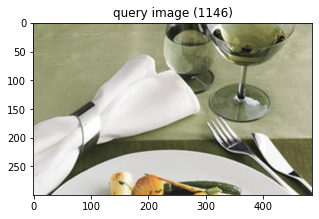

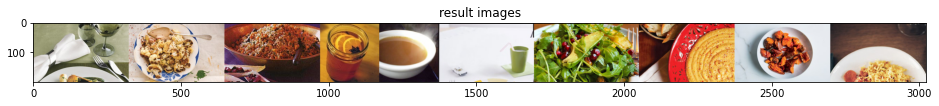

In [143]:
# do a query on a random image
top_closest_image_to_return = 10
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx, top_closest_image_to_return)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
matplotlib.pyplot.figure(figsize = (5,5))
imshow(query_image)
matplotlib.pyplot.title("query image (%d)" % query_image_idx)

# display the resulting images
matplotlib.pyplot.figure(figsize = (16,12))
imshow(results_image)
matplotlib.pyplot.title("result images")

In [122]:
images[idx_closest[1]].split("\\")[8]

'roasted_chicken'

## t-SNE Visualizing

In [123]:
num_images_to_plot = 10

if len(images) > num_images_to_plot:
    sort_order = sorted(random.sample(range(len(images)), num_images_to_plot))
    images = [images[i] for i in sort_order]
    pca_features = [pca_features[i] for i in sort_order]

In [124]:
import json
import matplotlib.pyplot
from PIL import Image
from sklearn.manifold import TSNE

X = np.array(pca_features)
tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(X)

E:\anaconda\envs\food\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


[t-SNE] Computing 9 nearest neighbors...
[t-SNE] Indexed 10 samples in 0.000s...
[t-SNE] Computed neighbors for 10 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 10 / 10
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 39.3429070, gradient norm = 0.5564865 (50 iterations in 0.013s)
[t-SNE] Iteration 100: error = 35.7412491, gradient norm = 0.5198522 (50 iterations in 0.013s)
[t-SNE] Iteration 150: error = 54.5900002, gradient norm = 0.1330515 (50 iterations in 0.013s)
[t-SNE] Iteration 200: error = 64.0930862, gradient norm = 0.3948456 (50 iterations in 0.013s)
[t-SNE] Iteration 250: error = 39.2117081, gradient norm = 0.5508725 (50 iterations in 0.014s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 39.211708
[t-SNE] Iteration 300: error = 0.2641012, gradient norm = 0.0003507 (50 iterations in 0.013s)
[t-SNE] Iteration 350: error = 0.2556809, gradient norm = 0

In [125]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

0it [00:00, ?it/s]C:\Users\Nilay\AppData\Local\Temp\ipykernel_4920\3253945560.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
10it [00:00, 265.28it/s]


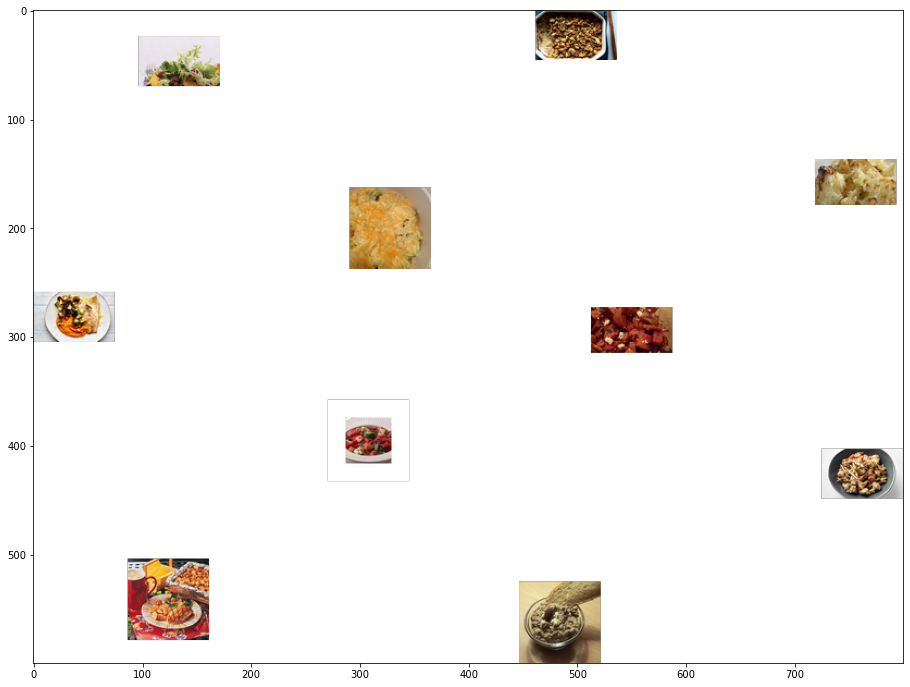

In [126]:
width = 800
height = 600
max_dim = 75

full_image = Image.new('RGBA', (width, height))
for img, x, y in tqdm(zip(images, tx, ty)):
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

matplotlib.pyplot.figure(figsize = (16,12))
imshow(full_image)
full_image.save("/data/6-pics-cloud.png")

## Find recipes of top N closest images that we found

### Read the recipe csv which holds the labels and it's corresponding recipes

In [144]:
import pandas as pd

In [145]:
recipes = pd.read_csv("C:\\Users\\Nilay\\Documents\\GitHub\\OMCS_CS7643_DL\\data\\recipe_name_image_lookup.csv")

In [146]:
recipes

,Unnamed: 0,ingredients,instructions,photo_url,title,recipe_name,category,directories_names
0,0,"['1/2 cup unsalted butter, chilled and cubed',...",['Preheat oven to 400 degrees F (205 degrees C...,http://images.media-allrecipes.com/userphotos/...,"Basil, Roasted Peppers and Monterey Jack Cornb...","basil, roasted peppers monterey jack cornbread","['roasted', 'chicken']",roasted_chicken
1,1,"['1/2 cup Parmesan cheese', '3/4 teaspoon grou...","['Combine parmesan cheese, pepper and garlic p...",http://images.media-allrecipes.com/userphotos/...,Crispy Cheese Twists,crispy cheese twists,"['cheese', 'baked', 'macaroni', 'cheese']",cheese_baked_macaroni_cheese
2,2,"['2 cups hot water', '1/2 cup margarine', '1/3...",['Melt margarine in hot water. Add sugar and s...,http://images.media-allrecipes.com/userphotos/...,Mom's Yeast Rolls,mom's yeast rolls,['bread'],bread
3,3,"['1 1/2 cups white sugar', '1/2 cup vegetable ...",['Combine sugar and oil; beat well. Add eggs a...,http://images.media-allrecipes.com/userphotos/...,Sweet Potato Bread I,sweet potato bread i,['bread'],bread
4,4,"['1/4 cup butter', '1 teaspoon white sugar', '...",['Stir butter and 1 teaspoon sugar into the ho...,http://images.media-allrecipes.com/userphotos/...,Orange Buns,orange buns,"['cranberry', 'orange', 'cookies']",cranberry_orange_cookies
...,...,...,...,...,...,...,...,...
85981,13496,"['1 cup all-purpose flour', '2/3 cup unsweeten...",['Preheat the oven to 350°F. Into a bowl sift ...,brownie-pudding-cake-14408,Brownie Pudding Cake,brownie pudding cake,['cake'],cake
85982,13497,"['1 preserved lemon', '1 1/2 pound butternut s...","[""Preheat oven to 475°F.\nHalve lemons and sco...",israeli-couscous-with-roasted-butternut-squash...,Israeli Couscous with Roasted Butternut Squash...,israeli couscous roasted butternut squash pres...,"['roasted', 'chicken']",roasted_chicken
85983,13498,['Leftover katsuo bushi (dried bonito flakes) ...,"['If using katsuo bushi flakes from package, m...",rice-with-soy-glazed-bonito-flakes-and-sesame-...,Rice with Soy-Glazed Bonito Flakes and Sesame ...,rice soy-glazed bonito flakes sesame seeds,['rice'],rice
85984,13499,['1 stick (1/2 cup) plus 1 tablespoon unsalted...,['Melt 1 tablespoon butter in a 12-inch heavy ...,spanakopita-107344,Spanakopita,spanakopita,"['spinach', 'salad']",spinach_salad


In [208]:
# images[idx_closest[1]].split("\\")[8]
pred_labels = []
for id in idx_closest:
    pred_label = images[id].split("\\")[-2] # grabbing the label for the image, S.O to Shruti for this hack
    pred_labels.append(pred_label)

pred_labels

['roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken',
 'roasted_chicken']

In [153]:
# Dedupe categories/labels
pred_labels = list(set(pred_labels))

In [154]:
pred_labels

{'roasted_chicken'}

In [199]:
recomended_recipies = pd.DataFrame(columns= ["directories_names","ingredients", "instructions"])

In [200]:
for label in pred_labels:
    row = recipes[recipes.directories_names == 'roasted_chicken'][["directories_names","ingredients", "instructions"]].sample(n = 3)
    recomended_recipies = pd.concat([recomended_recipies, row])

In [201]:
recomended_recipies

,directories_names,ingredients,instructions
13072,roasted_chicken,"['1 tablespoon butter', '3 onions, sliced', '1...",['Melt butter in a medium saucepan over medium...
68806,roasted_chicken,"['4 12x12-inch squares aluminum foil', '20 fre...",['Preheat oven to 375 degrees F (190 degrees C...
84871,roasted_chicken,"['3 large red bell peppers', '1 2-pound beef t...",['Char peppers over gas flame or in broiler un...


In [204]:
import numpy as np
from sklearn.model_selection import train_test_split
images_80_percent, images_20_percent =  train_test_split(images, test_size =.20, shuffle  = True)

In [206]:
len(images_80_percent)

1399

In [207]:
len(images_20_percent)

350